<h1><center>Лабораторная работа №6 "Градиентный бустинг".</center></h1>
<h2><center>Вахлаева Марина Олеговна, гр. 6131-010402D</center></h2>

In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import classification_report, mean_absolute_error, mean_squared_error, r2_score

from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

### 1. Считать в pandas.DataFrame любой источник данных: CSV, JSON, Excel-файл, HTML-таблицу и т.п.

In [2]:
path = 'C:/Users/PC/Downloads/Python/TAI/datasets/'
df = pd.read_csv(Path(path, 'healthcare-dataset-stroke-data.csv'))

In [3]:
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


### 2. Датасет и подготовка данных:

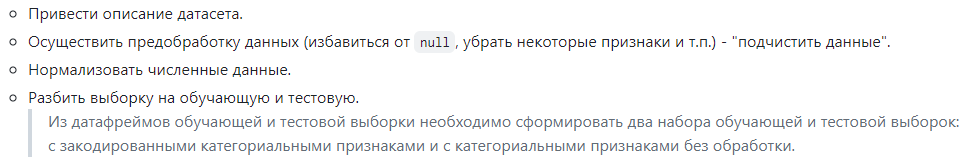

**Описание датасета:**

Этот набор данных используется для прогнозирования вероятности развития инсульта у пациента на основе таких входных параметров, как пол, возраст, различные заболевания и статус курения. Каждая строка данных предоставляет соответствующую информацию о пациенте.

Ссылка на датасет: https://www.kaggle.com/datasets/fedesoriano/stroke-prediction-dataset 
        
|       Признак       |       Расшифровка                  |       Значения                                   |
|---------------------|------------------------------------|--------------------------------------------------|
| id                  |Идентификатор пациента              | Индивидуальные значения                          |
| gender              |Пол                                 | Мужской/женский/другой                           | 
| age                 |Возраст                             | int                                              |
| hypertension        |Гипертония                          | 0 - нет, 1 - есть                                |
| heart_disease       |Болезни сердца                      | 0 - нет, 1 - есть                                |
| ever_married        |Женат/не женат (замужем/не замужем) | нет/да                                           |
| work_type           |Тип работы                          |дети/гос. работа/Никогда не работал/Самозанятый/  |
| Residence_type      |Тип проживания                      | «Сельский» или «Городской»                       |
| avg_glucose_level   |Средний ровень глюкозы в крови      | float                                            |
| bmi                 |Индекс массы тела                   | float                                            |
| smoking_status      |История курения                     | ранее курил/никогда не курил/курит/Неизвестно    |
| stroke              |Инсульт (таргет признак)            | 1 - у пациента был инсульт, 0 - не было          |

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [5]:
df.isnull().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [6]:
df = df.dropna()
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5104,14180,Female,13.0,0,0,No,children,Rural,103.08,18.6,Unknown,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


In [7]:
df['stroke'].value_counts() #Наблюдаем дисбаланс классов

stroke
0    4700
1     209
Name: count, dtype: int64

Поскольку важно именно предсказывать возможность наступления инсульта, то модели будем оценивать по их способности предсказывать именно класс 1.  

**Закодируем категориальные признаки**

In [8]:
df_ = df.copy()

df_['gender'] = df_['gender'].replace({'Female': 0, 'Male': 1, 'Other': 2})
df_['ever_married'] = df_['ever_married'].replace({'Yes': 0, 'No': 1})
df_['work_type'] = df_['work_type'].replace({'Private': 0, 'Self-employed': 1, 'children': 2, 'Govt_job': 3, 'Never_worked': 4})
df_['Residence_type'] = df_['Residence_type'].replace({'Urban': 0, 'Rural': 1})
df_['smoking_status'] = df_['smoking_status'].replace({'never smoked': 0, 'Unknown': 1, 'formerly smoked': 2, 'smokes': 3})

In [9]:
df_

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,0,0,0,228.69,36.6,2,1
2,31112,1,80.0,0,1,0,0,1,105.92,32.5,0,1
3,60182,0,49.0,0,0,0,0,0,171.23,34.4,3,1
4,1665,0,79.0,1,0,0,1,1,174.12,24.0,0,1
5,56669,1,81.0,0,0,0,0,0,186.21,29.0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5104,14180,0,13.0,0,0,1,2,1,103.08,18.6,1,0
5106,44873,0,81.0,0,0,0,1,0,125.20,40.0,0,0
5107,19723,0,35.0,0,0,0,1,1,82.99,30.6,0,0
5108,37544,1,51.0,0,0,0,0,1,166.29,25.6,2,0


**Нормализация количественных признаков**

In [10]:
df_sc = df.copy()
df_sc_ = df_.copy()
quantitative_features = df.select_dtypes(include=['float64', 'int64']).columns
all_cols = list(df_.columns)

mm_scaler = MinMaxScaler()

df_sc[quantitative_features] = mm_scaler.fit_transform(df[quantitative_features])
df_sc_[all_cols] =  mm_scaler.fit_transform(df_[all_cols])

In [11]:
df_sc

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,0.123094,Male,0.816895,0.0,1.0,Yes,Private,Urban,0.801265,0.301260,formerly smoked,1.0
2,0.425936,Male,0.975586,0.0,1.0,Yes,Private,Rural,0.234512,0.254296,never smoked,1.0
3,0.824904,Female,0.597168,0.0,0.0,Yes,Private,Urban,0.536008,0.276060,smokes,1.0
4,0.021794,Female,0.963379,1.0,0.0,Yes,Self-employed,Rural,0.549349,0.156930,never smoked,1.0
5,0.776691,Male,0.987793,0.0,0.0,Yes,Private,Urban,0.605161,0.214204,formerly smoked,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5104,0.193555,Female,0.157715,0.0,0.0,No,children,Rural,0.221402,0.095074,Unknown,0.0
5106,0.614798,Female,0.987793,0.0,0.0,Yes,Self-employed,Urban,0.323516,0.340206,never smoked,0.0
5107,0.269629,Female,0.426270,0.0,0.0,Yes,Self-employed,Rural,0.128658,0.232532,never smoked,0.0
5108,0.514212,Male,0.621582,0.0,0.0,Yes,Private,Rural,0.513203,0.175258,formerly smoked,0.0


In [12]:
df_sc_

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,0.123094,0.5,0.816895,0.0,1.0,0.0,0.00,0.0,0.801265,0.301260,0.666667,1.0
2,0.425936,0.5,0.975586,0.0,1.0,0.0,0.00,1.0,0.234512,0.254296,0.000000,1.0
3,0.824904,0.0,0.597168,0.0,0.0,0.0,0.00,0.0,0.536008,0.276060,1.000000,1.0
4,0.021794,0.0,0.963379,1.0,0.0,0.0,0.25,1.0,0.549349,0.156930,0.000000,1.0
5,0.776691,0.5,0.987793,0.0,0.0,0.0,0.00,0.0,0.605161,0.214204,0.666667,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5104,0.193555,0.0,0.157715,0.0,0.0,1.0,0.50,1.0,0.221402,0.095074,0.333333,0.0
5106,0.614798,0.0,0.987793,0.0,0.0,0.0,0.25,0.0,0.323516,0.340206,0.000000,0.0
5107,0.269629,0.0,0.426270,0.0,0.0,0.0,0.25,1.0,0.128658,0.232532,0.000000,0.0
5108,0.514212,0.5,0.621582,0.0,0.0,0.0,0.00,1.0,0.513203,0.175258,0.666667,0.0


**Исключим таргет признак из обоих наборов данных, а также id пациентов**

In [13]:
dfn_ = df_sc_.drop(['stroke', 'id'], axis=1, inplace=False) # закодированные категориальные признаки 
dfn = df_sc.drop(['stroke', 'id'], axis=1, inplace=False) # не закодированные категориальные признаки 

**Формирование тренировочной и тестовой выборок**

X_train, X_test, y_train, y_test - наборы взятые из данных с закодированными категориальными признаками;

X_train_, X_test_, y_train_, y_test_ - наборы взятые из данных "как есть", по тем же индексам, что и были получены первые наборы

In [14]:
X_train, X_test, y_train, y_test = train_test_split(dfn_, df['stroke'], test_size = 0.2, random_state = 0)

In [15]:
X_train_ = dfn.loc[X_train.index]
y_train_ = df['stroke'].loc[y_train.index]
X_test_ = dfn.loc[X_test.index]
y_test_ = df['stroke'].loc[y_test.index]

In [16]:
#Проверка на соответствие
cols_intersected = X_train.columns[X_train.columns.isin(X_train_.columns)]
cols_intersected = cols_intersected.drop(['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status'])
print(f"Columns intersection: {cols_intersected}")
print("Intersected cols equality check:")
print(f"  X_cat_train & X_ce_train: {X_train[cols_intersected].equals(X_train_[cols_intersected])}")
print(f"  X_cat_test & X_ce_test  : {X_train[cols_intersected].equals(X_train_[cols_intersected])}")

Columns intersection: Index(['age', 'hypertension', 'heart_disease', 'avg_glucose_level', 'bmi'], dtype='object')
Intersected cols equality check:
  X_cat_train & X_ce_train: True
  X_cat_test & X_ce_test  : True


### 3. Для каждого из классификаторов (AdaBoost, GradientBoostingClassifier, XGBoost, CatBoost)

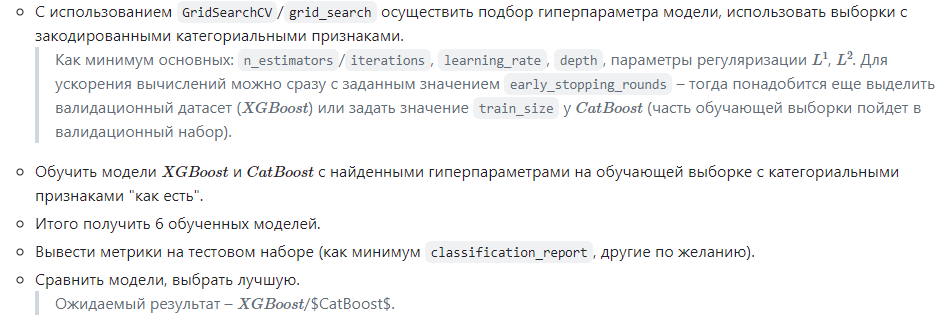

Сначала выполним подбор гиперпараметров с помощью GridSearchCV для всех моделей, затем оценим качество классификации моделей на тестовом наборе данных

**Подбор гиперпаметров для разных моделей**

In [17]:
#Вывод мтерик
def print_cr(model, X_test, y_test): 
    y_pred = model.predict(X_test)
    return print(classification_report(y_test, y_pred, digits=7, zero_division=0))

#Параметр zero_division=0 устанавливает значения метрик в 0 для класса, который не был ни разу предсказан 
#(важно для предсказания класса 1!)

### *AdaBoost*

- запуск модели на гиперпараметрах по умолчанию; 
- подбор гиперпараметров; 
- оценка качетсва модели на обучающем наборе данных при стандартных гиперпаметраз и при подобранных

In [18]:
#Оценим работу классификатора на стандартных гиперпараметрах
Ada = AdaBoostClassifier(n_estimators = 50, learning_rate = 1.0, algorithm = "SAMME", random_state = 0)
Ada.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME', random_state=0)

In [19]:
print_cr(Ada, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9562118 1.0000000 0.9776158       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9562118       982
   macro avg  0.4781059 0.5000000 0.4888079       982
weighted avg  0.9143410 0.9562118 0.9348078       982



Видим, что модель на стандартных гиперпараметрах совсем не предсказывает класс 1. Сделаем подбор гиперпараметров с помощью GridSearchCV и оценим результаты.

Создаем параметр для GridSearch, чтобы он оценивал гиперпараметры модели исходя не из accuracy - точности для обоих классов, а precision для предсказания 1 класса (наличие инсульта)

In [20]:
from sklearn.metrics import make_scorer, precision_score 
scorer = make_scorer(precision_score, pos_label=1, zero_division=0)

In [21]:
from sklearn.model_selection import StratifiedKFold 
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42) 
#Позволяет нам разделять выборки с учетом дисбаланса классов

In [22]:
Ada_params = {
    'n_estimators': np.arange(10, 150, 20), 
    'learning_rate': np.arange(0.1, 1.1, 0.1)   
}

Ada_grid_search = GridSearchCV(Ada, Ada_params, scoring = scorer, cv = 5, verbose= 3, n_jobs= -1)
Ada_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 70 candidates, totalling 350 fits


GridSearchCV(cv=5,
             estimator=AdaBoostClassifier(algorithm='SAMME', random_state=0),
             n_jobs=-1,
             param_grid={'learning_rate': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                         'n_estimators': array([ 10,  30,  50,  70,  90, 110, 130])},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0),
             verbose=3)

In [23]:
print(f"Best params for AdaBoost: {Ada_grid_search.best_params_}")

Best params for AdaBoost: {'learning_rate': 1.0, 'n_estimators': 90}


In [24]:
Ada_model = AdaBoostClassifier(n_estimators = 90, learning_rate = 1.0, algorithm="SAMME", random_state=0)
Ada_model.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME', n_estimators=90, random_state=0)

In [25]:
print_cr(Ada_model, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9562118 1.0000000 0.9776158       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9562118       982
   macro avg  0.4781059 0.5000000 0.4888079       982
weighted avg  0.9143410 0.9562118 0.9348078       982



После подбора гиперпараметров результат не изменился. Вывод - модель не сможет классифицировать наличие инсульта на тестовом наборе

### *GradientBoostingClassifier*

Сначала тестируем модель с стандартными гиперпараметрами 

In [26]:
GBM = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=1, random_state=123)
GBM.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=1, random_state=123)

In [27]:
print_cr(GBM, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9562118 1.0000000 0.9776158       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9562118       982
   macro avg  0.4781059 0.5000000 0.4888079       982
weighted avg  0.9143410 0.9562118 0.9348078       982



Модель градиентного бустинга выдает результаты аналогичные адабустингу. Попробуем выполнить подбор гиперпараметров 

In [28]:
#Зафиксируем параметр 'max_depth' и выполним подбор оставшихся двух параметров
GBM_params = {
    'n_estimators': [100, 300, 500],
    'learning_rate':  np.arange(0.1, 1.1, 0.1),
    'max_depth': [1]
}


GBM_grid_search = GridSearchCV(GBM, GBM_params, scoring = scorer, cv = cv, verbose= 2, n_jobs= -1)
GBM_grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=GradientBoostingClassifier(max_depth=1,
                                                  random_state=123),
             n_jobs=-1,
             param_grid={'learning_rate': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                         'max_depth': [1], 'n_estimators': [100, 300, 500]},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0),
             verbose=2)

In [29]:
print(f"Best params for GradientBoosting: {GBM_grid_search.best_params_}")

Best params for GradientBoosting: {'learning_rate': 0.8, 'max_depth': 1, 'n_estimators': 500}


In [30]:
GBM_ = GradientBoostingClassifier(n_estimators=500, learning_rate=0.8, max_depth=1, random_state=123)
GBM_.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.8, max_depth=1, n_estimators=500,
                           random_state=123)

In [31]:
print_cr(GBM_, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9560327 0.9957401 0.9754825       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9521385       982
   macro avg  0.4780164 0.4978701 0.4877413       982
weighted avg  0.9141698 0.9521385 0.9327679       982



In [32]:
#Теперь выполним подбор параметра 'max_depth'
GBM_params_ = {
    'n_estimators': [500],
    'learning_rate':  [0.8],
    'max_depth': np.arange(1, 16, 1)
}

GBM_grid_search_ = GridSearchCV(GBM, GBM_params_, scoring = scorer, cv = cv, verbose= 2, n_jobs= -1)
GBM_grid_search_.fit(X_train, y_train)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=GradientBoostingClassifier(max_depth=1,
                                                  random_state=123),
             n_jobs=-1,
             param_grid={'learning_rate': [0.8],
                         'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
                         'n_estimators': [500]},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0),
             verbose=2)

In [33]:
print(f"Best params for GradientBoosting: {GBM_grid_search_.best_params_}")

Best params for GradientBoosting: {'learning_rate': 0.8, 'max_depth': 1, 'n_estimators': 500}


In [34]:
GBM_model = GradientBoostingClassifier(n_estimators=500, learning_rate=0.8, max_depth=1, random_state=123)
GBM_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.8, max_depth=1, n_estimators=500,
                           random_state=123)

In [35]:
print_cr(GBM_model, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9560327 0.9957401 0.9754825       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9521385       982
   macro avg  0.4780164 0.4978701 0.4877413       982
weighted avg  0.9141698 0.9521385 0.9327679       982



Результат не изменился

### *XGBoost*

In [36]:
XGB = XGBClassifier(n_estimators=100, max_depth=1, learning_rate=1, objective='binary:logistic')
XGB.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [37]:
print_cr(XGB, X_test, y_test) 

              precision    recall  f1-score   support

           0  0.9581205 0.9989350 0.9781022       939
           1  0.6666667 0.0465116 0.0869565        43

    accuracy                      0.9572301       982
   macro avg  0.8123936 0.5227233 0.5325294       982
weighted avg  0.9453583 0.9572301 0.9390805       982



Здесь уже видно, что даже на стандартных гиперпараметрах модель XGB работает лучше, чем предыдущие две модели. 

In [38]:
XGB_params = {
    'n_estimators': [100],
    'learning_rate': np.arange(0.05, 1.05, 0.05),
    'max_depth': range(1, 10)
}

XGB_grid = GridSearchCV(
    XGB, XGB_params, scoring = scorer, cv = cv, n_jobs = 1, verbose = 0
)

XGB_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_typ...
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=100,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=1,
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55,
       0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ]),
                         'max_depth': range(1, 10), 'n_estimators': [100]},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0))

In [39]:
print(f"Best params for XGBClassifier: {XGB_grid.best_params_}")

Best params for XGBClassifier: {'learning_rate': 0.15000000000000002, 'max_depth': 3, 'n_estimators': 100}


In [40]:
XGB_ = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.15, objective='binary:logistic')
XGB_.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [41]:
print_cr(XGB_, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9571865 1.0000000 0.9781250       939
           1  1.0000000 0.0232558 0.0454545        43

    accuracy                      0.9572301       982
   macro avg  0.9785933 0.5116279 0.5117898       982
weighted avg  0.9590613 0.9572301 0.9372851       982



In [42]:
#Теперь выполним подбор параметра 'n_estimators'
XGB_params_ = {
    'n_estimators': np.arange(100, 950, 50),
    'learning_rate': [0.15],
    'max_depth': [3]
}

XGB_grid_ = GridSearchCV(
    XGB, XGB_params_, scoring = scorer, cv = cv, n_jobs = 1, verbose = 0
)

XGB_grid_.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_typ...
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=100,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=1,
             param_grid={'learning_rate': [0.15], 'max_depth': [3],
                         'n_estimators': array([100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700,
       750, 800, 850, 900])},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0))

In [43]:
print(f"Best params for XGBClassifier: {XGB_grid_.best_params_}")

Best params for XGBClassifier: {'learning_rate': 0.15, 'max_depth': 3, 'n_estimators': 100}


Вывод по таким же параметрам был раннее, поэтому просто продолжим варьирование параметров регуляризации модели

In [44]:
#Варьируем максимальный шаг изменения веса "max_delta_step"
XGB_params_1 = {
    'n_estimators': [100],
    'learning_rate': [0.15],
    'max_depth': [3],
    'max_delta_step': np.arange(0, 1.1, 0.1)
}

XGB_grid_1 = GridSearchCV(
    XGB, XGB_params_1, scoring = scorer, cv = cv, n_jobs = 1, verbose = 0)

XGB_grid_1.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_typ...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=100,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=1,
             param_grid={'learning_rate': [0.15],
                         'max_delta_step': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                         'max_depth': [3], 'n_estimators': [100]},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0))

In [45]:
print(f"Best params for XGBClassifier: {XGB_grid_1.best_params_}")

Best params for XGBClassifier: {'learning_rate': 0.15, 'max_delta_step': 0.0, 'max_depth': 3, 'n_estimators': 100}


In [46]:
XGB_1 = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.15, max_delta_step=0, objective='binary:logistic')
XGB_1.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=0,
              max_depth=3, max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [47]:
print_cr(XGB_1, X_test, y_test) 

              precision    recall  f1-score   support

           0  0.9571865 1.0000000 0.9781250       939
           1  1.0000000 0.0232558 0.0454545        43

    accuracy                      0.9572301       982
   macro avg  0.9785933 0.5116279 0.5117898       982
weighted avg  0.9590613 0.9572301 0.9372851       982



In [48]:
#Выполним вариацию параметров регуляризации 
XGB_params_2 = {
    'n_estimators': [100],
    'learning_rate': [0.15],
    'max_depth': [3],
    'max_delta_step': [0.0],
    'gamma': np.arange(0, 1.5, 0.5),
    'lambda': np.arange(0, 2.5, 0.5),
    'alpha': np.arange(0, 1.5, 0.5),
}

XGB_grid_2 = GridSearchCV(
    XGB, XGB_params_2, scoring = scorer, cv = cv, n_jobs = 1, verbose = 0)

XGB_grid_2.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_typ...
                                     multi_strategy=None, n_estimators=100,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=1,
             param_grid={'alpha': array([0. , 0.5, 1. ]),
                         'gamma': array([0. , 0.5, 1. ]),
                         'lambda': array([0. , 0.5, 1. , 1.5, 2. ]),
                         'learning_rate': [0.15], 'max_delta_step': [0.0],
                         'max_depth': [3], 'n_estimators': [100]},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0))

In [49]:
print(f"Best params for XGBClassifier: {XGB_grid_2.best_params_}")

Best params for XGBClassifier: {'alpha': 0.0, 'gamma': 0.0, 'lambda': 1.5, 'learning_rate': 0.15, 'max_delta_step': 0.0, 'max_depth': 3, 'n_estimators': 100}


In [50]:
XGB_2 = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.15, max_delta_step=0, alpha=0.0, gamma=0.0, reg_lambda=1.5, objective='binary:logistic')
XGB_2.fit(X_train, y_train)

XGBClassifier(alpha=0.0, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=0,
              max_depth=3, max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, ...)

In [51]:
print_cr(XGB_2, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9571865 1.0000000 0.9781250       939
           1  1.0000000 0.0232558 0.0454545        43

    accuracy                      0.9572301       982
   macro avg  0.9785933 0.5116279 0.5117898       982
weighted avg  0.9590613 0.9572301 0.9372851       982



Никакие метрики не изменились в результате подбора параметров регуляризации

**Выполним обучение модели XGBClassifier на тренировочном наборе с незакодированными категориальными признаками**

In [52]:
from copy import deepcopy
X_train_1 = deepcopy(X_train_)
X_test_1 = deepcopy(X_test_)

for col in X_train_1.columns:
    if X_train_1[col].dtype == 'object':
        X_train_1[col] = X_train_1[col].astype('category')
        X_test_1[col] = X_test_1[col].astype('category')

XGB_model_cut = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.15, alpha=0.0, 
                              reg_lambda=1.5, gamma=0.0,  objective='binary:logistic', 
                              enable_categorical=True, max_cat_to_onehot=10)

XGB_model_cut.fit(X_train_1, y_train_)   

XGBClassifier(alpha=0.0, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=0.0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=10, max_delta_step=None,
              max_depth=3, max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, ...)

In [53]:
print_cr(XGB_model_cut, X_test_1, y_test_)

              precision    recall  f1-score   support

           0  0.9571865 1.0000000 0.9781250       939
           1  1.0000000 0.0232558 0.0454545        43

    accuracy                      0.9572301       982
   macro avg  0.9785933 0.5116279 0.5117898       982
weighted avg  0.9590613 0.9572301 0.9372851       982



Видимо модели уже "некуда" получать результаты лучше, что при max_cat_to_onehot=1, что при max_cat_to_onehot=10 результаты одинаковые

### *CatBoost*

In [54]:
CatB = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=6)
CatB.fit(X_train, y_train, verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [55]:
print_cr(CatB, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9579918 0.9957401 0.9765013       939
           1  0.3333333 0.0465116 0.0816327        43

    accuracy                      0.9541752       982
   macro avg  0.6456626 0.5211259 0.5290670       982
weighted avg  0.9306391 0.9541752 0.9373166       982



Точность модели CatBoostClassifier на стандартных гиперпараметрах меньше, чем у XGBClassifier. Выполним подбор гиперпараметров

In [56]:
#Выполним вариацию параметра 'depth'
CatB_params = {
    'iterations': [1000],
    'learning_rate': [0.1],
    'depth': [4, 6, 8, 10]
}

CatB_grid = GridSearchCV(CatB, CatB_params, cv=cv, scoring = scorer, verbose=False)
CatB_grid.fit(X_train, y_train)

0:	learn: 0.5485211	total: 1.51ms	remaining: 1.51s
1:	learn: 0.4532422	total: 2.97ms	remaining: 1.48s
2:	learn: 0.3606518	total: 4.41ms	remaining: 1.47s
3:	learn: 0.3079376	total: 6.06ms	remaining: 1.51s
4:	learn: 0.2736617	total: 7.47ms	remaining: 1.49s
5:	learn: 0.2464678	total: 8.89ms	remaining: 1.47s
6:	learn: 0.2173180	total: 10.3ms	remaining: 1.47s
7:	learn: 0.2015962	total: 11.9ms	remaining: 1.48s
8:	learn: 0.1864075	total: 13.3ms	remaining: 1.47s
9:	learn: 0.1746438	total: 14.8ms	remaining: 1.47s
10:	learn: 0.1687631	total: 16.3ms	remaining: 1.46s
11:	learn: 0.1643501	total: 17.8ms	remaining: 1.46s
12:	learn: 0.1581285	total: 19.2ms	remaining: 1.46s
13:	learn: 0.1543489	total: 21ms	remaining: 1.48s
14:	learn: 0.1508408	total: 22.6ms	remaining: 1.48s
15:	learn: 0.1471113	total: 24.4ms	remaining: 1.5s
16:	learn: 0.1453490	total: 26.2ms	remaining: 1.51s
17:	learn: 0.1438952	total: 27.8ms	remaining: 1.51s
18:	learn: 0.1429157	total: 29.4ms	remaining: 1.52s
19:	learn: 0.1414155	tota

188:	learn: 0.0826809	total: 353ms	remaining: 1.51s
189:	learn: 0.0825904	total: 355ms	remaining: 1.51s
190:	learn: 0.0823466	total: 357ms	remaining: 1.51s
191:	learn: 0.0822460	total: 358ms	remaining: 1.51s
192:	learn: 0.0820266	total: 360ms	remaining: 1.5s
193:	learn: 0.0818406	total: 362ms	remaining: 1.5s
194:	learn: 0.0816422	total: 363ms	remaining: 1.5s
195:	learn: 0.0813676	total: 365ms	remaining: 1.5s
196:	learn: 0.0812319	total: 367ms	remaining: 1.49s
197:	learn: 0.0811096	total: 368ms	remaining: 1.49s
198:	learn: 0.0809184	total: 370ms	remaining: 1.49s
199:	learn: 0.0807643	total: 371ms	remaining: 1.49s
200:	learn: 0.0806450	total: 373ms	remaining: 1.48s
201:	learn: 0.0804486	total: 374ms	remaining: 1.48s
202:	learn: 0.0801965	total: 376ms	remaining: 1.47s
203:	learn: 0.0800969	total: 377ms	remaining: 1.47s
204:	learn: 0.0799384	total: 379ms	remaining: 1.47s
205:	learn: 0.0796503	total: 380ms	remaining: 1.46s
206:	learn: 0.0795125	total: 381ms	remaining: 1.46s
207:	learn: 0.07

418:	learn: 0.0505677	total: 745ms	remaining: 1.03s
419:	learn: 0.0505038	total: 747ms	remaining: 1.03s
420:	learn: 0.0504095	total: 749ms	remaining: 1.03s
421:	learn: 0.0502222	total: 751ms	remaining: 1.03s
422:	learn: 0.0501127	total: 752ms	remaining: 1.03s
423:	learn: 0.0500220	total: 754ms	remaining: 1.02s
424:	learn: 0.0498633	total: 755ms	remaining: 1.02s
425:	learn: 0.0497419	total: 757ms	remaining: 1.02s
426:	learn: 0.0496929	total: 759ms	remaining: 1.02s
427:	learn: 0.0496121	total: 761ms	remaining: 1.02s
428:	learn: 0.0495325	total: 762ms	remaining: 1.01s
429:	learn: 0.0494336	total: 764ms	remaining: 1.01s
430:	learn: 0.0494059	total: 766ms	remaining: 1.01s
431:	learn: 0.0492710	total: 768ms	remaining: 1.01s
432:	learn: 0.0491792	total: 770ms	remaining: 1.01s
433:	learn: 0.0490946	total: 771ms	remaining: 1s
434:	learn: 0.0490004	total: 773ms	remaining: 1s
435:	learn: 0.0489572	total: 776ms	remaining: 1s
436:	learn: 0.0488802	total: 778ms	remaining: 1s
437:	learn: 0.0488415	to

634:	learn: 0.0333870	total: 1.13s	remaining: 650ms
635:	learn: 0.0333354	total: 1.13s	remaining: 649ms
636:	learn: 0.0332691	total: 1.14s	remaining: 647ms
637:	learn: 0.0332287	total: 1.14s	remaining: 645ms
638:	learn: 0.0331126	total: 1.14s	remaining: 644ms
639:	learn: 0.0330631	total: 1.14s	remaining: 642ms
640:	learn: 0.0330208	total: 1.14s	remaining: 640ms
641:	learn: 0.0329361	total: 1.15s	remaining: 639ms
642:	learn: 0.0328941	total: 1.15s	remaining: 637ms
643:	learn: 0.0327533	total: 1.15s	remaining: 635ms
644:	learn: 0.0326897	total: 1.15s	remaining: 633ms
645:	learn: 0.0326251	total: 1.15s	remaining: 631ms
646:	learn: 0.0325866	total: 1.15s	remaining: 629ms
647:	learn: 0.0325500	total: 1.16s	remaining: 628ms
648:	learn: 0.0324757	total: 1.16s	remaining: 626ms
649:	learn: 0.0324051	total: 1.16s	remaining: 624ms
650:	learn: 0.0323397	total: 1.16s	remaining: 622ms
651:	learn: 0.0322767	total: 1.16s	remaining: 620ms
652:	learn: 0.0321912	total: 1.16s	remaining: 619ms
653:	learn: 

867:	learn: 0.0227062	total: 1.53s	remaining: 232ms
868:	learn: 0.0226827	total: 1.53s	remaining: 231ms
869:	learn: 0.0226421	total: 1.53s	remaining: 229ms
870:	learn: 0.0225855	total: 1.53s	remaining: 227ms
871:	learn: 0.0225585	total: 1.54s	remaining: 225ms
872:	learn: 0.0225475	total: 1.54s	remaining: 224ms
873:	learn: 0.0225206	total: 1.54s	remaining: 222ms
874:	learn: 0.0224973	total: 1.54s	remaining: 220ms
875:	learn: 0.0224544	total: 1.54s	remaining: 219ms
876:	learn: 0.0224150	total: 1.54s	remaining: 217ms
877:	learn: 0.0224043	total: 1.55s	remaining: 215ms
878:	learn: 0.0223477	total: 1.55s	remaining: 213ms
879:	learn: 0.0222987	total: 1.55s	remaining: 211ms
880:	learn: 0.0222709	total: 1.55s	remaining: 210ms
881:	learn: 0.0222493	total: 1.55s	remaining: 208ms
882:	learn: 0.0222054	total: 1.55s	remaining: 206ms
883:	learn: 0.0221946	total: 1.56s	remaining: 204ms
884:	learn: 0.0221461	total: 1.56s	remaining: 203ms
885:	learn: 0.0220931	total: 1.56s	remaining: 201ms
886:	learn: 

45:	learn: 0.1215591	total: 75.2ms	remaining: 1.56s
46:	learn: 0.1212114	total: 77.5ms	remaining: 1.57s
47:	learn: 0.1208828	total: 79.2ms	remaining: 1.57s
48:	learn: 0.1204916	total: 81ms	remaining: 1.57s
49:	learn: 0.1203284	total: 83ms	remaining: 1.58s
50:	learn: 0.1199896	total: 84.7ms	remaining: 1.57s
51:	learn: 0.1191631	total: 86.8ms	remaining: 1.58s
52:	learn: 0.1186393	total: 88.7ms	remaining: 1.58s
53:	learn: 0.1185695	total: 90.5ms	remaining: 1.58s
54:	learn: 0.1182334	total: 92.1ms	remaining: 1.58s
55:	learn: 0.1180203	total: 93.7ms	remaining: 1.58s
56:	learn: 0.1175443	total: 95.3ms	remaining: 1.58s
57:	learn: 0.1171816	total: 96.9ms	remaining: 1.57s
58:	learn: 0.1167196	total: 98.6ms	remaining: 1.57s
59:	learn: 0.1164818	total: 100ms	remaining: 1.57s
60:	learn: 0.1161766	total: 102ms	remaining: 1.57s
61:	learn: 0.1157016	total: 103ms	remaining: 1.56s
62:	learn: 0.1153670	total: 105ms	remaining: 1.57s
63:	learn: 0.1149139	total: 107ms	remaining: 1.56s
64:	learn: 0.1146070	

278:	learn: 0.0669422	total: 468ms	remaining: 1.21s
279:	learn: 0.0668754	total: 470ms	remaining: 1.21s
280:	learn: 0.0667267	total: 472ms	remaining: 1.21s
281:	learn: 0.0665582	total: 473ms	remaining: 1.21s
282:	learn: 0.0664650	total: 475ms	remaining: 1.2s
283:	learn: 0.0663519	total: 477ms	remaining: 1.2s
284:	learn: 0.0663116	total: 479ms	remaining: 1.2s
285:	learn: 0.0661766	total: 482ms	remaining: 1.2s
286:	learn: 0.0659491	total: 484ms	remaining: 1.2s
287:	learn: 0.0659199	total: 485ms	remaining: 1.2s
288:	learn: 0.0657841	total: 487ms	remaining: 1.2s
289:	learn: 0.0655924	total: 489ms	remaining: 1.2s
290:	learn: 0.0655061	total: 491ms	remaining: 1.2s
291:	learn: 0.0652758	total: 493ms	remaining: 1.2s
292:	learn: 0.0651466	total: 496ms	remaining: 1.2s
293:	learn: 0.0650268	total: 498ms	remaining: 1.19s
294:	learn: 0.0648466	total: 499ms	remaining: 1.19s
295:	learn: 0.0647271	total: 501ms	remaining: 1.19s
296:	learn: 0.0645795	total: 503ms	remaining: 1.19s
297:	learn: 0.0645032	t

480:	learn: 0.0448709	total: 847ms	remaining: 914ms
481:	learn: 0.0447720	total: 849ms	remaining: 913ms
482:	learn: 0.0447387	total: 851ms	remaining: 911ms
483:	learn: 0.0444700	total: 853ms	remaining: 909ms
484:	learn: 0.0444027	total: 855ms	remaining: 908ms
485:	learn: 0.0443545	total: 857ms	remaining: 906ms
486:	learn: 0.0442640	total: 859ms	remaining: 904ms
487:	learn: 0.0442158	total: 861ms	remaining: 904ms
488:	learn: 0.0441206	total: 864ms	remaining: 902ms
489:	learn: 0.0440645	total: 866ms	remaining: 901ms
490:	learn: 0.0439821	total: 868ms	remaining: 899ms
491:	learn: 0.0439035	total: 870ms	remaining: 899ms
492:	learn: 0.0438172	total: 872ms	remaining: 897ms
493:	learn: 0.0436867	total: 874ms	remaining: 895ms
494:	learn: 0.0435731	total: 876ms	remaining: 893ms
495:	learn: 0.0434713	total: 877ms	remaining: 891ms
496:	learn: 0.0434023	total: 879ms	remaining: 890ms
497:	learn: 0.0432929	total: 881ms	remaining: 888ms
498:	learn: 0.0432289	total: 882ms	remaining: 886ms
499:	learn: 

694:	learn: 0.0299993	total: 1.24s	remaining: 544ms
695:	learn: 0.0299495	total: 1.24s	remaining: 542ms
696:	learn: 0.0298847	total: 1.24s	remaining: 541ms
697:	learn: 0.0298619	total: 1.25s	remaining: 539ms
698:	learn: 0.0298277	total: 1.25s	remaining: 537ms
699:	learn: 0.0297906	total: 1.25s	remaining: 535ms
700:	learn: 0.0297277	total: 1.25s	remaining: 534ms
701:	learn: 0.0297024	total: 1.25s	remaining: 532ms
702:	learn: 0.0296930	total: 1.25s	remaining: 530ms
703:	learn: 0.0296759	total: 1.26s	remaining: 529ms
704:	learn: 0.0296473	total: 1.26s	remaining: 527ms
705:	learn: 0.0295863	total: 1.26s	remaining: 525ms
706:	learn: 0.0294761	total: 1.26s	remaining: 523ms
707:	learn: 0.0294524	total: 1.26s	remaining: 522ms
708:	learn: 0.0293863	total: 1.27s	remaining: 520ms
709:	learn: 0.0293682	total: 1.27s	remaining: 518ms
710:	learn: 0.0293415	total: 1.27s	remaining: 516ms
711:	learn: 0.0292768	total: 1.27s	remaining: 514ms
712:	learn: 0.0292290	total: 1.27s	remaining: 513ms
713:	learn: 

915:	learn: 0.0211050	total: 1.63s	remaining: 149ms
916:	learn: 0.0210490	total: 1.63s	remaining: 148ms
917:	learn: 0.0209936	total: 1.63s	remaining: 146ms
918:	learn: 0.0209611	total: 1.63s	remaining: 144ms
919:	learn: 0.0209255	total: 1.64s	remaining: 142ms
920:	learn: 0.0209047	total: 1.64s	remaining: 140ms
921:	learn: 0.0208920	total: 1.64s	remaining: 139ms
922:	learn: 0.0208689	total: 1.64s	remaining: 137ms
923:	learn: 0.0208123	total: 1.64s	remaining: 135ms
924:	learn: 0.0207644	total: 1.64s	remaining: 133ms
925:	learn: 0.0207519	total: 1.65s	remaining: 131ms
926:	learn: 0.0207415	total: 1.65s	remaining: 130ms
927:	learn: 0.0207047	total: 1.65s	remaining: 128ms
928:	learn: 0.0206989	total: 1.65s	remaining: 126ms
929:	learn: 0.0206845	total: 1.65s	remaining: 124ms
930:	learn: 0.0206552	total: 1.65s	remaining: 123ms
931:	learn: 0.0206483	total: 1.65s	remaining: 121ms
932:	learn: 0.0206331	total: 1.66s	remaining: 119ms
933:	learn: 0.0205881	total: 1.66s	remaining: 117ms
934:	learn: 

108:	learn: 0.1015355	total: 205ms	remaining: 1.68s
109:	learn: 0.1013034	total: 207ms	remaining: 1.68s
110:	learn: 0.1009378	total: 212ms	remaining: 1.7s
111:	learn: 0.1004762	total: 214ms	remaining: 1.69s
112:	learn: 0.1003820	total: 215ms	remaining: 1.69s
113:	learn: 0.1002263	total: 217ms	remaining: 1.69s
114:	learn: 0.1001220	total: 219ms	remaining: 1.69s
115:	learn: 0.0999061	total: 221ms	remaining: 1.68s
116:	learn: 0.0996478	total: 223ms	remaining: 1.68s
117:	learn: 0.0992443	total: 225ms	remaining: 1.68s
118:	learn: 0.0988553	total: 226ms	remaining: 1.68s
119:	learn: 0.0985407	total: 229ms	remaining: 1.68s
120:	learn: 0.0983828	total: 230ms	remaining: 1.67s
121:	learn: 0.0980603	total: 232ms	remaining: 1.67s
122:	learn: 0.0979846	total: 233ms	remaining: 1.66s
123:	learn: 0.0976307	total: 235ms	remaining: 1.66s
124:	learn: 0.0974792	total: 236ms	remaining: 1.65s
125:	learn: 0.0972986	total: 238ms	remaining: 1.65s
126:	learn: 0.0969903	total: 239ms	remaining: 1.64s
127:	learn: 0

365:	learn: 0.0599456	total: 606ms	remaining: 1.05s
366:	learn: 0.0598562	total: 609ms	remaining: 1.05s
367:	learn: 0.0597848	total: 611ms	remaining: 1.05s
368:	learn: 0.0596202	total: 612ms	remaining: 1.05s
369:	learn: 0.0594499	total: 614ms	remaining: 1.04s
370:	learn: 0.0593971	total: 616ms	remaining: 1.04s
371:	learn: 0.0591947	total: 618ms	remaining: 1.04s
372:	learn: 0.0591546	total: 620ms	remaining: 1.04s
373:	learn: 0.0589521	total: 621ms	remaining: 1.04s
374:	learn: 0.0588142	total: 623ms	remaining: 1.04s
375:	learn: 0.0587114	total: 625ms	remaining: 1.04s
376:	learn: 0.0586902	total: 627ms	remaining: 1.03s
377:	learn: 0.0583968	total: 628ms	remaining: 1.03s
378:	learn: 0.0581823	total: 629ms	remaining: 1.03s
379:	learn: 0.0579411	total: 631ms	remaining: 1.03s
380:	learn: 0.0579253	total: 632ms	remaining: 1.03s
381:	learn: 0.0577959	total: 634ms	remaining: 1.02s
382:	learn: 0.0576954	total: 635ms	remaining: 1.02s
383:	learn: 0.0574787	total: 637ms	remaining: 1.02s
384:	learn: 

579:	learn: 0.0400610	total: 997ms	remaining: 722ms
580:	learn: 0.0400383	total: 999ms	remaining: 720ms
581:	learn: 0.0399106	total: 1s	remaining: 718ms
582:	learn: 0.0398881	total: 1s	remaining: 717ms
583:	learn: 0.0396690	total: 1s	remaining: 715ms
584:	learn: 0.0395854	total: 1s	remaining: 713ms
585:	learn: 0.0395251	total: 1.01s	remaining: 711ms
586:	learn: 0.0394418	total: 1.01s	remaining: 710ms
587:	learn: 0.0394126	total: 1.01s	remaining: 709ms
588:	learn: 0.0393741	total: 1.01s	remaining: 707ms
589:	learn: 0.0392574	total: 1.01s	remaining: 705ms
590:	learn: 0.0391366	total: 1.02s	remaining: 703ms
591:	learn: 0.0390570	total: 1.02s	remaining: 702ms
592:	learn: 0.0390366	total: 1.02s	remaining: 700ms
593:	learn: 0.0389291	total: 1.02s	remaining: 698ms
594:	learn: 0.0388687	total: 1.02s	remaining: 696ms
595:	learn: 0.0388347	total: 1.02s	remaining: 694ms
596:	learn: 0.0388074	total: 1.02s	remaining: 692ms
597:	learn: 0.0387605	total: 1.03s	remaining: 690ms
598:	learn: 0.0387265	to

823:	learn: 0.0269840	total: 1.38s	remaining: 295ms
824:	learn: 0.0269712	total: 1.38s	remaining: 293ms
825:	learn: 0.0269429	total: 1.38s	remaining: 292ms
826:	learn: 0.0269152	total: 1.39s	remaining: 290ms
827:	learn: 0.0268755	total: 1.39s	remaining: 288ms
828:	learn: 0.0267810	total: 1.39s	remaining: 287ms
829:	learn: 0.0267620	total: 1.39s	remaining: 285ms
830:	learn: 0.0267367	total: 1.39s	remaining: 283ms
831:	learn: 0.0267267	total: 1.4s	remaining: 282ms
832:	learn: 0.0267083	total: 1.4s	remaining: 280ms
833:	learn: 0.0266738	total: 1.4s	remaining: 279ms
834:	learn: 0.0266078	total: 1.4s	remaining: 277ms
835:	learn: 0.0265321	total: 1.4s	remaining: 276ms
836:	learn: 0.0265222	total: 1.41s	remaining: 274ms
837:	learn: 0.0264650	total: 1.41s	remaining: 272ms
838:	learn: 0.0264317	total: 1.41s	remaining: 270ms
839:	learn: 0.0263774	total: 1.41s	remaining: 269ms
840:	learn: 0.0263284	total: 1.41s	remaining: 267ms
841:	learn: 0.0262707	total: 1.41s	remaining: 265ms
842:	learn: 0.026

0:	learn: 0.5489228	total: 2.43ms	remaining: 2.43s
1:	learn: 0.4524933	total: 5.6ms	remaining: 2.79s
2:	learn: 0.3763741	total: 7.99ms	remaining: 2.66s
3:	learn: 0.3241781	total: 10.1ms	remaining: 2.52s
4:	learn: 0.2832471	total: 12.3ms	remaining: 2.45s
5:	learn: 0.2507878	total: 14.6ms	remaining: 2.42s
6:	learn: 0.2292422	total: 16.7ms	remaining: 2.37s
7:	learn: 0.2067036	total: 18.5ms	remaining: 2.29s
8:	learn: 0.1939868	total: 20.3ms	remaining: 2.24s
9:	learn: 0.1816516	total: 22.1ms	remaining: 2.18s
10:	learn: 0.1731148	total: 24.2ms	remaining: 2.17s
11:	learn: 0.1665493	total: 26ms	remaining: 2.14s
12:	learn: 0.1606905	total: 27.7ms	remaining: 2.1s
13:	learn: 0.1566262	total: 29.5ms	remaining: 2.08s
14:	learn: 0.1540991	total: 31.2ms	remaining: 2.05s
15:	learn: 0.1515493	total: 32.9ms	remaining: 2.02s
16:	learn: 0.1493817	total: 34.9ms	remaining: 2.02s
17:	learn: 0.1480022	total: 36.6ms	remaining: 2s
18:	learn: 0.1464081	total: 38.7ms	remaining: 2s
19:	learn: 0.1437189	total: 40.4

250:	learn: 0.0791498	total: 391ms	remaining: 1.17s
251:	learn: 0.0789372	total: 393ms	remaining: 1.17s
252:	learn: 0.0788807	total: 395ms	remaining: 1.17s
253:	learn: 0.0785744	total: 397ms	remaining: 1.17s
254:	learn: 0.0784826	total: 398ms	remaining: 1.16s
255:	learn: 0.0783104	total: 400ms	remaining: 1.16s
256:	learn: 0.0780541	total: 401ms	remaining: 1.16s
257:	learn: 0.0779408	total: 403ms	remaining: 1.16s
258:	learn: 0.0776932	total: 405ms	remaining: 1.16s
259:	learn: 0.0776096	total: 406ms	remaining: 1.16s
260:	learn: 0.0775737	total: 408ms	remaining: 1.15s
261:	learn: 0.0773423	total: 409ms	remaining: 1.15s
262:	learn: 0.0772026	total: 411ms	remaining: 1.15s
263:	learn: 0.0769794	total: 412ms	remaining: 1.15s
264:	learn: 0.0768279	total: 413ms	remaining: 1.15s
265:	learn: 0.0766662	total: 415ms	remaining: 1.14s
266:	learn: 0.0765120	total: 416ms	remaining: 1.14s
267:	learn: 0.0763345	total: 418ms	remaining: 1.14s
268:	learn: 0.0760898	total: 419ms	remaining: 1.14s
269:	learn: 

488:	learn: 0.0477576	total: 782ms	remaining: 817ms
489:	learn: 0.0476972	total: 784ms	remaining: 816ms
490:	learn: 0.0476321	total: 786ms	remaining: 815ms
491:	learn: 0.0475513	total: 787ms	remaining: 813ms
492:	learn: 0.0473866	total: 789ms	remaining: 812ms
493:	learn: 0.0473155	total: 791ms	remaining: 810ms
494:	learn: 0.0471808	total: 792ms	remaining: 808ms
495:	learn: 0.0471030	total: 794ms	remaining: 807ms
496:	learn: 0.0470651	total: 796ms	remaining: 805ms
497:	learn: 0.0470420	total: 798ms	remaining: 804ms
498:	learn: 0.0469536	total: 799ms	remaining: 802ms
499:	learn: 0.0468972	total: 801ms	remaining: 801ms
500:	learn: 0.0468564	total: 803ms	remaining: 800ms
501:	learn: 0.0468056	total: 804ms	remaining: 798ms
502:	learn: 0.0467828	total: 806ms	remaining: 797ms
503:	learn: 0.0467584	total: 808ms	remaining: 795ms
504:	learn: 0.0466815	total: 810ms	remaining: 794ms
505:	learn: 0.0465428	total: 811ms	remaining: 792ms
506:	learn: 0.0464685	total: 813ms	remaining: 791ms
507:	learn: 

730:	learn: 0.0309444	total: 1.19s	remaining: 440ms
731:	learn: 0.0309282	total: 1.2s	remaining: 440ms
732:	learn: 0.0308963	total: 1.2s	remaining: 439ms
733:	learn: 0.0307660	total: 1.21s	remaining: 437ms
734:	learn: 0.0305629	total: 1.21s	remaining: 436ms
735:	learn: 0.0305208	total: 1.21s	remaining: 434ms
736:	learn: 0.0304622	total: 1.21s	remaining: 433ms
737:	learn: 0.0304207	total: 1.21s	remaining: 431ms
738:	learn: 0.0303730	total: 1.22s	remaining: 429ms
739:	learn: 0.0303522	total: 1.22s	remaining: 428ms
740:	learn: 0.0302965	total: 1.22s	remaining: 426ms
741:	learn: 0.0302578	total: 1.22s	remaining: 424ms
742:	learn: 0.0302401	total: 1.22s	remaining: 423ms
743:	learn: 0.0302079	total: 1.22s	remaining: 421ms
744:	learn: 0.0301897	total: 1.23s	remaining: 419ms
745:	learn: 0.0301119	total: 1.23s	remaining: 418ms
746:	learn: 0.0300939	total: 1.23s	remaining: 416ms
747:	learn: 0.0300544	total: 1.23s	remaining: 414ms
748:	learn: 0.0299921	total: 1.23s	remaining: 413ms
749:	learn: 0.

981:	learn: 0.0215882	total: 1.59s	remaining: 29.1ms
982:	learn: 0.0215798	total: 1.59s	remaining: 27.5ms
983:	learn: 0.0215503	total: 1.59s	remaining: 25.9ms
984:	learn: 0.0215266	total: 1.59s	remaining: 24.2ms
985:	learn: 0.0215162	total: 1.59s	remaining: 22.6ms
986:	learn: 0.0214542	total: 1.59s	remaining: 21ms
987:	learn: 0.0214276	total: 1.6s	remaining: 19.4ms
988:	learn: 0.0213600	total: 1.6s	remaining: 17.8ms
989:	learn: 0.0213275	total: 1.6s	remaining: 16.2ms
990:	learn: 0.0212944	total: 1.6s	remaining: 14.5ms
991:	learn: 0.0212836	total: 1.6s	remaining: 12.9ms
992:	learn: 0.0212601	total: 1.6s	remaining: 11.3ms
993:	learn: 0.0212482	total: 1.61s	remaining: 9.7ms
994:	learn: 0.0212249	total: 1.61s	remaining: 8.08ms
995:	learn: 0.0211958	total: 1.61s	remaining: 6.46ms
996:	learn: 0.0211919	total: 1.61s	remaining: 4.85ms
997:	learn: 0.0211721	total: 1.61s	remaining: 3.23ms
998:	learn: 0.0211596	total: 1.61s	remaining: 1.62ms
999:	learn: 0.0211317	total: 1.62s	remaining: 0us
0:	le

167:	learn: 0.0909531	total: 272ms	remaining: 1.35s
168:	learn: 0.0907809	total: 275ms	remaining: 1.35s
169:	learn: 0.0904771	total: 276ms	remaining: 1.35s
170:	learn: 0.0902116	total: 278ms	remaining: 1.35s
171:	learn: 0.0899160	total: 280ms	remaining: 1.34s
172:	learn: 0.0897051	total: 281ms	remaining: 1.34s
173:	learn: 0.0894542	total: 283ms	remaining: 1.34s
174:	learn: 0.0893544	total: 284ms	remaining: 1.34s
175:	learn: 0.0890514	total: 286ms	remaining: 1.34s
176:	learn: 0.0887374	total: 288ms	remaining: 1.34s
177:	learn: 0.0886581	total: 290ms	remaining: 1.34s
178:	learn: 0.0884230	total: 291ms	remaining: 1.34s
179:	learn: 0.0882904	total: 293ms	remaining: 1.33s
180:	learn: 0.0881104	total: 294ms	remaining: 1.33s
181:	learn: 0.0878350	total: 296ms	remaining: 1.33s
182:	learn: 0.0876931	total: 298ms	remaining: 1.33s
183:	learn: 0.0874685	total: 299ms	remaining: 1.33s
184:	learn: 0.0873959	total: 301ms	remaining: 1.32s
185:	learn: 0.0871479	total: 302ms	remaining: 1.32s
186:	learn: 

420:	learn: 0.0538201	total: 655ms	remaining: 901ms
421:	learn: 0.0537009	total: 657ms	remaining: 900ms
422:	learn: 0.0535976	total: 659ms	remaining: 898ms
423:	learn: 0.0535220	total: 660ms	remaining: 897ms
424:	learn: 0.0534685	total: 662ms	remaining: 895ms
425:	learn: 0.0532471	total: 663ms	remaining: 894ms
426:	learn: 0.0531839	total: 665ms	remaining: 892ms
427:	learn: 0.0531002	total: 667ms	remaining: 891ms
428:	learn: 0.0529719	total: 670ms	remaining: 891ms
429:	learn: 0.0528288	total: 671ms	remaining: 890ms
430:	learn: 0.0526995	total: 674ms	remaining: 889ms
431:	learn: 0.0526209	total: 675ms	remaining: 888ms
432:	learn: 0.0525593	total: 677ms	remaining: 886ms
433:	learn: 0.0524727	total: 679ms	remaining: 885ms
434:	learn: 0.0523550	total: 681ms	remaining: 884ms
435:	learn: 0.0522503	total: 683ms	remaining: 884ms
436:	learn: 0.0521491	total: 685ms	remaining: 882ms
437:	learn: 0.0520706	total: 686ms	remaining: 881ms
438:	learn: 0.0519330	total: 688ms	remaining: 879ms
439:	learn: 

668:	learn: 0.0358859	total: 1.05s	remaining: 520ms
669:	learn: 0.0358592	total: 1.05s	remaining: 519ms
670:	learn: 0.0358288	total: 1.05s	remaining: 517ms
671:	learn: 0.0357798	total: 1.06s	remaining: 516ms
672:	learn: 0.0357258	total: 1.06s	remaining: 514ms
673:	learn: 0.0356212	total: 1.06s	remaining: 512ms
674:	learn: 0.0355612	total: 1.06s	remaining: 511ms
675:	learn: 0.0354554	total: 1.06s	remaining: 509ms
676:	learn: 0.0353647	total: 1.06s	remaining: 507ms
677:	learn: 0.0352624	total: 1.06s	remaining: 506ms
678:	learn: 0.0352146	total: 1.07s	remaining: 504ms
679:	learn: 0.0351627	total: 1.07s	remaining: 503ms
680:	learn: 0.0350348	total: 1.07s	remaining: 501ms
681:	learn: 0.0350087	total: 1.07s	remaining: 499ms
682:	learn: 0.0349700	total: 1.07s	remaining: 498ms
683:	learn: 0.0348515	total: 1.07s	remaining: 496ms
684:	learn: 0.0347949	total: 1.08s	remaining: 495ms
685:	learn: 0.0347567	total: 1.08s	remaining: 493ms
686:	learn: 0.0347038	total: 1.08s	remaining: 492ms
687:	learn: 

916:	learn: 0.0243451	total: 1.43s	remaining: 130ms
917:	learn: 0.0242865	total: 1.43s	remaining: 128ms
918:	learn: 0.0242457	total: 1.43s	remaining: 126ms
919:	learn: 0.0242273	total: 1.44s	remaining: 125ms
920:	learn: 0.0241895	total: 1.44s	remaining: 123ms
921:	learn: 0.0241590	total: 1.44s	remaining: 122ms
922:	learn: 0.0241499	total: 1.44s	remaining: 120ms
923:	learn: 0.0241450	total: 1.44s	remaining: 119ms
924:	learn: 0.0241076	total: 1.44s	remaining: 117ms
925:	learn: 0.0240528	total: 1.45s	remaining: 116ms
926:	learn: 0.0240208	total: 1.45s	remaining: 114ms
927:	learn: 0.0239893	total: 1.45s	remaining: 112ms
928:	learn: 0.0239627	total: 1.45s	remaining: 111ms
929:	learn: 0.0239417	total: 1.45s	remaining: 109ms
930:	learn: 0.0239292	total: 1.45s	remaining: 108ms
931:	learn: 0.0239245	total: 1.46s	remaining: 106ms
932:	learn: 0.0238969	total: 1.46s	remaining: 105ms
933:	learn: 0.0238671	total: 1.46s	remaining: 103ms
934:	learn: 0.0238466	total: 1.46s	remaining: 102ms
935:	learn: 

81:	learn: 0.0827330	total: 209ms	remaining: 2.34s
82:	learn: 0.0820798	total: 211ms	remaining: 2.34s
83:	learn: 0.0816618	total: 213ms	remaining: 2.33s
84:	learn: 0.0812727	total: 216ms	remaining: 2.32s
85:	learn: 0.0809679	total: 218ms	remaining: 2.31s
86:	learn: 0.0806898	total: 219ms	remaining: 2.3s
87:	learn: 0.0802983	total: 221ms	remaining: 2.29s
88:	learn: 0.0800462	total: 223ms	remaining: 2.29s
89:	learn: 0.0795117	total: 225ms	remaining: 2.28s
90:	learn: 0.0789402	total: 228ms	remaining: 2.27s
91:	learn: 0.0785732	total: 230ms	remaining: 2.27s
92:	learn: 0.0782840	total: 232ms	remaining: 2.26s
93:	learn: 0.0779450	total: 234ms	remaining: 2.26s
94:	learn: 0.0775772	total: 236ms	remaining: 2.25s
95:	learn: 0.0773819	total: 238ms	remaining: 2.24s
96:	learn: 0.0771854	total: 240ms	remaining: 2.24s
97:	learn: 0.0765667	total: 242ms	remaining: 2.23s
98:	learn: 0.0763077	total: 244ms	remaining: 2.22s
99:	learn: 0.0759659	total: 246ms	remaining: 2.21s
100:	learn: 0.0755871	total: 248

274:	learn: 0.0333277	total: 598ms	remaining: 1.58s
275:	learn: 0.0332384	total: 601ms	remaining: 1.57s
276:	learn: 0.0331279	total: 603ms	remaining: 1.57s
277:	learn: 0.0329321	total: 605ms	remaining: 1.57s
278:	learn: 0.0328851	total: 606ms	remaining: 1.57s
279:	learn: 0.0328155	total: 609ms	remaining: 1.56s
280:	learn: 0.0326488	total: 611ms	remaining: 1.56s
281:	learn: 0.0325603	total: 613ms	remaining: 1.56s
282:	learn: 0.0324884	total: 615ms	remaining: 1.56s
283:	learn: 0.0323421	total: 618ms	remaining: 1.56s
284:	learn: 0.0322435	total: 620ms	remaining: 1.55s
285:	learn: 0.0321823	total: 622ms	remaining: 1.55s
286:	learn: 0.0320660	total: 624ms	remaining: 1.55s
287:	learn: 0.0319079	total: 626ms	remaining: 1.55s
288:	learn: 0.0318193	total: 628ms	remaining: 1.54s
289:	learn: 0.0317390	total: 630ms	remaining: 1.54s
290:	learn: 0.0316183	total: 632ms	remaining: 1.54s
291:	learn: 0.0315044	total: 634ms	remaining: 1.54s
292:	learn: 0.0312444	total: 636ms	remaining: 1.53s
293:	learn: 

434:	learn: 0.0193887	total: 939ms	remaining: 1.22s
435:	learn: 0.0193547	total: 942ms	remaining: 1.22s
436:	learn: 0.0193111	total: 944ms	remaining: 1.22s
437:	learn: 0.0192463	total: 946ms	remaining: 1.21s
438:	learn: 0.0191899	total: 948ms	remaining: 1.21s
439:	learn: 0.0190710	total: 951ms	remaining: 1.21s
440:	learn: 0.0189707	total: 953ms	remaining: 1.21s
441:	learn: 0.0189091	total: 955ms	remaining: 1.21s
442:	learn: 0.0188606	total: 957ms	remaining: 1.2s
443:	learn: 0.0188333	total: 959ms	remaining: 1.2s
444:	learn: 0.0187951	total: 961ms	remaining: 1.2s
445:	learn: 0.0187479	total: 963ms	remaining: 1.2s
446:	learn: 0.0186236	total: 965ms	remaining: 1.19s
447:	learn: 0.0185897	total: 967ms	remaining: 1.19s
448:	learn: 0.0185729	total: 969ms	remaining: 1.19s
449:	learn: 0.0184992	total: 971ms	remaining: 1.19s
450:	learn: 0.0184779	total: 973ms	remaining: 1.18s
451:	learn: 0.0184602	total: 975ms	remaining: 1.18s
452:	learn: 0.0183969	total: 977ms	remaining: 1.18s
453:	learn: 0.01

627:	learn: 0.0118534	total: 1.33s	remaining: 788ms
628:	learn: 0.0118435	total: 1.33s	remaining: 786ms
629:	learn: 0.0118219	total: 1.33s	remaining: 784ms
630:	learn: 0.0118054	total: 1.34s	remaining: 782ms
631:	learn: 0.0117652	total: 1.34s	remaining: 780ms
632:	learn: 0.0117149	total: 1.34s	remaining: 778ms
633:	learn: 0.0116904	total: 1.34s	remaining: 776ms
634:	learn: 0.0116635	total: 1.35s	remaining: 774ms
635:	learn: 0.0116485	total: 1.35s	remaining: 772ms
636:	learn: 0.0116220	total: 1.35s	remaining: 770ms
637:	learn: 0.0115817	total: 1.35s	remaining: 768ms
638:	learn: 0.0115404	total: 1.35s	remaining: 766ms
639:	learn: 0.0115236	total: 1.36s	remaining: 764ms
640:	learn: 0.0115088	total: 1.36s	remaining: 761ms
641:	learn: 0.0114674	total: 1.36s	remaining: 759ms
642:	learn: 0.0114558	total: 1.36s	remaining: 757ms
643:	learn: 0.0114088	total: 1.36s	remaining: 755ms
644:	learn: 0.0113843	total: 1.37s	remaining: 753ms
645:	learn: 0.0113510	total: 1.37s	remaining: 751ms
646:	learn: 

810:	learn: 0.0083939	total: 1.72s	remaining: 401ms
811:	learn: 0.0083712	total: 1.72s	remaining: 399ms
812:	learn: 0.0083505	total: 1.72s	remaining: 397ms
813:	learn: 0.0083464	total: 1.73s	remaining: 394ms
814:	learn: 0.0083235	total: 1.73s	remaining: 392ms
815:	learn: 0.0083050	total: 1.73s	remaining: 390ms
816:	learn: 0.0083018	total: 1.73s	remaining: 388ms
817:	learn: 0.0082904	total: 1.73s	remaining: 386ms
818:	learn: 0.0082782	total: 1.74s	remaining: 384ms
819:	learn: 0.0082729	total: 1.74s	remaining: 382ms
820:	learn: 0.0082643	total: 1.74s	remaining: 380ms
821:	learn: 0.0082521	total: 1.74s	remaining: 378ms
822:	learn: 0.0082397	total: 1.75s	remaining: 376ms
823:	learn: 0.0082343	total: 1.75s	remaining: 374ms
824:	learn: 0.0082308	total: 1.75s	remaining: 371ms
825:	learn: 0.0082221	total: 1.75s	remaining: 369ms
826:	learn: 0.0082196	total: 1.75s	remaining: 367ms
827:	learn: 0.0082132	total: 1.76s	remaining: 365ms
828:	learn: 0.0082052	total: 1.76s	remaining: 363ms
829:	learn: 

0:	learn: 0.5491034	total: 10.8ms	remaining: 10.8s
1:	learn: 0.4313808	total: 21.3ms	remaining: 10.6s
2:	learn: 0.3571230	total: 30.3ms	remaining: 10.1s
3:	learn: 0.2916385	total: 39.4ms	remaining: 9.8s
4:	learn: 0.2587709	total: 48.6ms	remaining: 9.68s
5:	learn: 0.2250585	total: 57.4ms	remaining: 9.51s
6:	learn: 0.2071956	total: 64ms	remaining: 9.07s
7:	learn: 0.1948538	total: 67.5ms	remaining: 8.37s
8:	learn: 0.1779290	total: 72.1ms	remaining: 7.93s
9:	learn: 0.1672985	total: 75.8ms	remaining: 7.5s
10:	learn: 0.1604126	total: 81.5ms	remaining: 7.33s
11:	learn: 0.1531144	total: 84.1ms	remaining: 6.92s
12:	learn: 0.1469385	total: 86.6ms	remaining: 6.57s
13:	learn: 0.1428872	total: 89ms	remaining: 6.27s
14:	learn: 0.1378273	total: 91.2ms	remaining: 5.99s
15:	learn: 0.1357315	total: 93.8ms	remaining: 5.77s
16:	learn: 0.1329031	total: 95.9ms	remaining: 5.55s
17:	learn: 0.1312506	total: 97.9ms	remaining: 5.34s
18:	learn: 0.1293077	total: 99.7ms	remaining: 5.15s
19:	learn: 0.1271767	total: 

172:	learn: 0.0500250	total: 414ms	remaining: 1.98s
173:	learn: 0.0497889	total: 417ms	remaining: 1.98s
174:	learn: 0.0496499	total: 418ms	remaining: 1.97s
175:	learn: 0.0494721	total: 420ms	remaining: 1.97s
176:	learn: 0.0490517	total: 422ms	remaining: 1.96s
177:	learn: 0.0486210	total: 424ms	remaining: 1.96s
178:	learn: 0.0485059	total: 426ms	remaining: 1.95s
179:	learn: 0.0483704	total: 429ms	remaining: 1.95s
180:	learn: 0.0480902	total: 431ms	remaining: 1.95s
181:	learn: 0.0478101	total: 433ms	remaining: 1.95s
182:	learn: 0.0476139	total: 435ms	remaining: 1.94s
183:	learn: 0.0472520	total: 438ms	remaining: 1.94s
184:	learn: 0.0468882	total: 440ms	remaining: 1.94s
185:	learn: 0.0466981	total: 442ms	remaining: 1.93s
186:	learn: 0.0464811	total: 445ms	remaining: 1.93s
187:	learn: 0.0461220	total: 447ms	remaining: 1.93s
188:	learn: 0.0458517	total: 449ms	remaining: 1.93s
189:	learn: 0.0455408	total: 451ms	remaining: 1.92s
190:	learn: 0.0452078	total: 453ms	remaining: 1.92s
191:	learn: 

360:	learn: 0.0229837	total: 803ms	remaining: 1.42s
361:	learn: 0.0229597	total: 806ms	remaining: 1.42s
362:	learn: 0.0228460	total: 808ms	remaining: 1.42s
363:	learn: 0.0227219	total: 811ms	remaining: 1.42s
364:	learn: 0.0227023	total: 814ms	remaining: 1.42s
365:	learn: 0.0226408	total: 817ms	remaining: 1.42s
366:	learn: 0.0225188	total: 826ms	remaining: 1.42s
367:	learn: 0.0224113	total: 829ms	remaining: 1.42s
368:	learn: 0.0223290	total: 832ms	remaining: 1.42s
369:	learn: 0.0222329	total: 835ms	remaining: 1.42s
370:	learn: 0.0221884	total: 837ms	remaining: 1.42s
371:	learn: 0.0220569	total: 840ms	remaining: 1.42s
372:	learn: 0.0220489	total: 843ms	remaining: 1.42s
373:	learn: 0.0219989	total: 846ms	remaining: 1.42s
374:	learn: 0.0218168	total: 848ms	remaining: 1.41s
375:	learn: 0.0216968	total: 851ms	remaining: 1.41s
376:	learn: 0.0216245	total: 853ms	remaining: 1.41s
377:	learn: 0.0215405	total: 856ms	remaining: 1.41s
378:	learn: 0.0214800	total: 859ms	remaining: 1.41s
379:	learn: 

533:	learn: 0.0139653	total: 1.19s	remaining: 1.03s
534:	learn: 0.0139078	total: 1.19s	remaining: 1.03s
535:	learn: 0.0138574	total: 1.19s	remaining: 1.03s
536:	learn: 0.0137971	total: 1.19s	remaining: 1.03s
537:	learn: 0.0137571	total: 1.2s	remaining: 1.03s
538:	learn: 0.0137175	total: 1.2s	remaining: 1.02s
539:	learn: 0.0136798	total: 1.2s	remaining: 1.02s
540:	learn: 0.0136696	total: 1.2s	remaining: 1.02s
541:	learn: 0.0136048	total: 1.21s	remaining: 1.02s
542:	learn: 0.0135929	total: 1.21s	remaining: 1.02s
543:	learn: 0.0135834	total: 1.21s	remaining: 1.01s
544:	learn: 0.0135759	total: 1.21s	remaining: 1.01s
545:	learn: 0.0135133	total: 1.21s	remaining: 1.01s
546:	learn: 0.0135053	total: 1.22s	remaining: 1.01s
547:	learn: 0.0134655	total: 1.22s	remaining: 1s
548:	learn: 0.0134321	total: 1.22s	remaining: 1s
549:	learn: 0.0133995	total: 1.22s	remaining: 999ms
550:	learn: 0.0133727	total: 1.22s	remaining: 997ms
551:	learn: 0.0133545	total: 1.23s	remaining: 994ms
552:	learn: 0.0132825	

718:	learn: 0.0093279	total: 1.58s	remaining: 619ms
719:	learn: 0.0093073	total: 1.59s	remaining: 617ms
720:	learn: 0.0092820	total: 1.59s	remaining: 615ms
721:	learn: 0.0092601	total: 1.59s	remaining: 613ms
722:	learn: 0.0092472	total: 1.59s	remaining: 610ms
723:	learn: 0.0092383	total: 1.59s	remaining: 608ms
724:	learn: 0.0092000	total: 1.6s	remaining: 606ms
725:	learn: 0.0091678	total: 1.6s	remaining: 604ms
726:	learn: 0.0091619	total: 1.6s	remaining: 601ms
727:	learn: 0.0091275	total: 1.6s	remaining: 599ms
728:	learn: 0.0091154	total: 1.6s	remaining: 597ms
729:	learn: 0.0091019	total: 1.61s	remaining: 595ms
730:	learn: 0.0090970	total: 1.61s	remaining: 593ms
731:	learn: 0.0090897	total: 1.61s	remaining: 590ms
732:	learn: 0.0090641	total: 1.61s	remaining: 588ms
733:	learn: 0.0090416	total: 1.62s	remaining: 586ms
734:	learn: 0.0090034	total: 1.62s	remaining: 584ms
735:	learn: 0.0090000	total: 1.62s	remaining: 581ms
736:	learn: 0.0089869	total: 1.62s	remaining: 579ms
737:	learn: 0.008

911:	learn: 0.0067746	total: 1.98s	remaining: 191ms
912:	learn: 0.0067609	total: 1.98s	remaining: 189ms
913:	learn: 0.0067460	total: 1.98s	remaining: 187ms
914:	learn: 0.0067354	total: 1.99s	remaining: 185ms
915:	learn: 0.0067199	total: 1.99s	remaining: 182ms
916:	learn: 0.0067005	total: 1.99s	remaining: 180ms
917:	learn: 0.0066993	total: 1.99s	remaining: 178ms
918:	learn: 0.0066880	total: 2s	remaining: 176ms
919:	learn: 0.0066532	total: 2s	remaining: 174ms
920:	learn: 0.0066511	total: 2s	remaining: 171ms
921:	learn: 0.0066498	total: 2s	remaining: 169ms
922:	learn: 0.0066202	total: 2s	remaining: 167ms
923:	learn: 0.0065930	total: 2s	remaining: 165ms
924:	learn: 0.0065778	total: 2.01s	remaining: 163ms
925:	learn: 0.0065670	total: 2.01s	remaining: 161ms
926:	learn: 0.0065459	total: 2.01s	remaining: 158ms
927:	learn: 0.0065336	total: 2.01s	remaining: 156ms
928:	learn: 0.0065322	total: 2.02s	remaining: 154ms
929:	learn: 0.0065267	total: 2.02s	remaining: 152ms
930:	learn: 0.0065202	total: 2

106:	learn: 0.0749339	total: 212ms	remaining: 1.77s
107:	learn: 0.0748436	total: 214ms	remaining: 1.77s
108:	learn: 0.0745797	total: 216ms	remaining: 1.77s
109:	learn: 0.0741466	total: 219ms	remaining: 1.77s
110:	learn: 0.0740485	total: 221ms	remaining: 1.77s
111:	learn: 0.0736079	total: 224ms	remaining: 1.77s
112:	learn: 0.0732339	total: 226ms	remaining: 1.78s
113:	learn: 0.0729272	total: 229ms	remaining: 1.78s
114:	learn: 0.0722953	total: 232ms	remaining: 1.78s
115:	learn: 0.0720262	total: 234ms	remaining: 1.78s
116:	learn: 0.0712287	total: 236ms	remaining: 1.78s
117:	learn: 0.0706830	total: 238ms	remaining: 1.78s
118:	learn: 0.0701349	total: 240ms	remaining: 1.78s
119:	learn: 0.0696909	total: 242ms	remaining: 1.78s
120:	learn: 0.0691862	total: 245ms	remaining: 1.78s
121:	learn: 0.0690600	total: 247ms	remaining: 1.78s
122:	learn: 0.0685702	total: 249ms	remaining: 1.78s
123:	learn: 0.0683088	total: 251ms	remaining: 1.78s
124:	learn: 0.0682494	total: 253ms	remaining: 1.77s
125:	learn: 

281:	learn: 0.0352561	total: 612ms	remaining: 1.56s
282:	learn: 0.0350854	total: 614ms	remaining: 1.56s
283:	learn: 0.0348469	total: 616ms	remaining: 1.55s
284:	learn: 0.0346540	total: 619ms	remaining: 1.55s
285:	learn: 0.0345613	total: 621ms	remaining: 1.55s
286:	learn: 0.0344088	total: 623ms	remaining: 1.55s
287:	learn: 0.0342509	total: 626ms	remaining: 1.55s
288:	learn: 0.0341549	total: 629ms	remaining: 1.55s
289:	learn: 0.0340555	total: 632ms	remaining: 1.55s
290:	learn: 0.0338876	total: 635ms	remaining: 1.55s
291:	learn: 0.0336715	total: 637ms	remaining: 1.54s
292:	learn: 0.0335914	total: 640ms	remaining: 1.54s
293:	learn: 0.0334998	total: 643ms	remaining: 1.54s
294:	learn: 0.0334357	total: 645ms	remaining: 1.54s
295:	learn: 0.0332045	total: 647ms	remaining: 1.54s
296:	learn: 0.0329391	total: 650ms	remaining: 1.54s
297:	learn: 0.0328486	total: 652ms	remaining: 1.53s
298:	learn: 0.0326636	total: 654ms	remaining: 1.53s
299:	learn: 0.0326093	total: 657ms	remaining: 1.53s
300:	learn: 

461:	learn: 0.0189570	total: 1.01s	remaining: 1.17s
462:	learn: 0.0188709	total: 1.01s	remaining: 1.17s
463:	learn: 0.0188554	total: 1.01s	remaining: 1.17s
464:	learn: 0.0188243	total: 1.01s	remaining: 1.17s
465:	learn: 0.0187291	total: 1.01s	remaining: 1.16s
466:	learn: 0.0186948	total: 1.02s	remaining: 1.16s
467:	learn: 0.0186215	total: 1.02s	remaining: 1.16s
468:	learn: 0.0185754	total: 1.02s	remaining: 1.16s
469:	learn: 0.0184643	total: 1.02s	remaining: 1.15s
470:	learn: 0.0184108	total: 1.03s	remaining: 1.15s
471:	learn: 0.0183366	total: 1.03s	remaining: 1.15s
472:	learn: 0.0183156	total: 1.03s	remaining: 1.15s
473:	learn: 0.0182609	total: 1.03s	remaining: 1.15s
474:	learn: 0.0182526	total: 1.03s	remaining: 1.14s
475:	learn: 0.0182476	total: 1.04s	remaining: 1.14s
476:	learn: 0.0181948	total: 1.04s	remaining: 1.14s
477:	learn: 0.0181588	total: 1.04s	remaining: 1.14s
478:	learn: 0.0180446	total: 1.04s	remaining: 1.14s
479:	learn: 0.0179592	total: 1.05s	remaining: 1.13s
480:	learn: 

645:	learn: 0.0123483	total: 1.4s	remaining: 765ms
646:	learn: 0.0123284	total: 1.4s	remaining: 763ms
647:	learn: 0.0122923	total: 1.4s	remaining: 761ms
648:	learn: 0.0122723	total: 1.4s	remaining: 758ms
649:	learn: 0.0122712	total: 1.4s	remaining: 756ms
650:	learn: 0.0122156	total: 1.41s	remaining: 754ms
651:	learn: 0.0121883	total: 1.41s	remaining: 751ms
652:	learn: 0.0121608	total: 1.41s	remaining: 749ms
653:	learn: 0.0121404	total: 1.41s	remaining: 747ms
654:	learn: 0.0121225	total: 1.41s	remaining: 745ms
655:	learn: 0.0121015	total: 1.42s	remaining: 743ms
656:	learn: 0.0120715	total: 1.42s	remaining: 741ms
657:	learn: 0.0120401	total: 1.42s	remaining: 739ms
658:	learn: 0.0119870	total: 1.42s	remaining: 737ms
659:	learn: 0.0119533	total: 1.43s	remaining: 735ms
660:	learn: 0.0119392	total: 1.43s	remaining: 733ms
661:	learn: 0.0119150	total: 1.43s	remaining: 731ms
662:	learn: 0.0119054	total: 1.43s	remaining: 728ms
663:	learn: 0.0118956	total: 1.43s	remaining: 726ms
664:	learn: 0.011

827:	learn: 0.0085183	total: 1.78s	remaining: 371ms
828:	learn: 0.0084891	total: 1.79s	remaining: 368ms
829:	learn: 0.0084730	total: 1.79s	remaining: 366ms
830:	learn: 0.0084347	total: 1.79s	remaining: 364ms
831:	learn: 0.0084281	total: 1.79s	remaining: 362ms
832:	learn: 0.0083924	total: 1.79s	remaining: 360ms
833:	learn: 0.0083798	total: 1.8s	remaining: 358ms
834:	learn: 0.0083693	total: 1.8s	remaining: 356ms
835:	learn: 0.0083492	total: 1.8s	remaining: 353ms
836:	learn: 0.0083431	total: 1.8s	remaining: 351ms
837:	learn: 0.0083333	total: 1.8s	remaining: 349ms
838:	learn: 0.0083202	total: 1.81s	remaining: 347ms
839:	learn: 0.0083078	total: 1.81s	remaining: 345ms
840:	learn: 0.0083004	total: 1.81s	remaining: 342ms
841:	learn: 0.0082984	total: 1.81s	remaining: 340ms
842:	learn: 0.0082853	total: 1.81s	remaining: 338ms
843:	learn: 0.0082668	total: 1.82s	remaining: 336ms
844:	learn: 0.0082498	total: 1.82s	remaining: 334ms
845:	learn: 0.0082357	total: 1.82s	remaining: 331ms
846:	learn: 0.008

0:	learn: 0.5490978	total: 3.32ms	remaining: 3.31s
1:	learn: 0.4325746	total: 6.19ms	remaining: 3.09s
2:	learn: 0.3572587	total: 8.65ms	remaining: 2.88s
3:	learn: 0.3078328	total: 11.2ms	remaining: 2.8s
4:	learn: 0.2712154	total: 14.4ms	remaining: 2.87s
5:	learn: 0.2367859	total: 17.6ms	remaining: 2.91s
6:	learn: 0.2179633	total: 20ms	remaining: 2.83s
7:	learn: 0.2043365	total: 21.4ms	remaining: 2.65s
8:	learn: 0.1914299	total: 23.6ms	remaining: 2.6s
9:	learn: 0.1819803	total: 25.7ms	remaining: 2.54s
10:	learn: 0.1721649	total: 27.9ms	remaining: 2.51s
11:	learn: 0.1652913	total: 30ms	remaining: 2.47s
12:	learn: 0.1592991	total: 32.7ms	remaining: 2.48s
13:	learn: 0.1518012	total: 35.2ms	remaining: 2.48s
14:	learn: 0.1470268	total: 37.7ms	remaining: 2.47s
15:	learn: 0.1442179	total: 39.8ms	remaining: 2.45s
16:	learn: 0.1428772	total: 41.4ms	remaining: 2.4s
17:	learn: 0.1399478	total: 43.8ms	remaining: 2.39s
18:	learn: 0.1380004	total: 46.4ms	remaining: 2.39s
19:	learn: 0.1357330	total: 4

164:	learn: 0.0594718	total: 393ms	remaining: 1.99s
165:	learn: 0.0588729	total: 397ms	remaining: 1.99s
166:	learn: 0.0584622	total: 399ms	remaining: 1.99s
167:	learn: 0.0580001	total: 401ms	remaining: 1.99s
168:	learn: 0.0576770	total: 404ms	remaining: 1.99s
169:	learn: 0.0573292	total: 406ms	remaining: 1.98s
170:	learn: 0.0570607	total: 408ms	remaining: 1.98s
171:	learn: 0.0568029	total: 412ms	remaining: 1.98s
172:	learn: 0.0566384	total: 415ms	remaining: 1.98s
173:	learn: 0.0564378	total: 418ms	remaining: 1.98s
174:	learn: 0.0561623	total: 421ms	remaining: 1.98s
175:	learn: 0.0559353	total: 424ms	remaining: 1.98s
176:	learn: 0.0558096	total: 427ms	remaining: 1.98s
177:	learn: 0.0554541	total: 429ms	remaining: 1.98s
178:	learn: 0.0551821	total: 432ms	remaining: 1.98s
179:	learn: 0.0549211	total: 434ms	remaining: 1.98s
180:	learn: 0.0545479	total: 436ms	remaining: 1.97s
181:	learn: 0.0543059	total: 438ms	remaining: 1.97s
182:	learn: 0.0541621	total: 441ms	remaining: 1.97s
183:	learn: 

330:	learn: 0.0309284	total: 801ms	remaining: 1.62s
331:	learn: 0.0307333	total: 805ms	remaining: 1.62s
332:	learn: 0.0306955	total: 808ms	remaining: 1.62s
333:	learn: 0.0306145	total: 810ms	remaining: 1.61s
334:	learn: 0.0304751	total: 812ms	remaining: 1.61s
335:	learn: 0.0304454	total: 814ms	remaining: 1.61s
336:	learn: 0.0303043	total: 816ms	remaining: 1.61s
337:	learn: 0.0301429	total: 819ms	remaining: 1.6s
338:	learn: 0.0300178	total: 821ms	remaining: 1.6s
339:	learn: 0.0299538	total: 824ms	remaining: 1.6s
340:	learn: 0.0299057	total: 827ms	remaining: 1.6s
341:	learn: 0.0298513	total: 830ms	remaining: 1.6s
342:	learn: 0.0297781	total: 832ms	remaining: 1.59s
343:	learn: 0.0296784	total: 835ms	remaining: 1.59s
344:	learn: 0.0295789	total: 838ms	remaining: 1.59s
345:	learn: 0.0294835	total: 840ms	remaining: 1.59s
346:	learn: 0.0294118	total: 842ms	remaining: 1.58s
347:	learn: 0.0292040	total: 844ms	remaining: 1.58s
348:	learn: 0.0290764	total: 846ms	remaining: 1.58s
349:	learn: 0.028

491:	learn: 0.0188914	total: 1.19s	remaining: 1.23s
492:	learn: 0.0188068	total: 1.19s	remaining: 1.23s
493:	learn: 0.0187879	total: 1.2s	remaining: 1.22s
494:	learn: 0.0187646	total: 1.2s	remaining: 1.22s
495:	learn: 0.0187524	total: 1.2s	remaining: 1.22s
496:	learn: 0.0187309	total: 1.2s	remaining: 1.22s
497:	learn: 0.0186122	total: 1.21s	remaining: 1.22s
498:	learn: 0.0185840	total: 1.21s	remaining: 1.21s
499:	learn: 0.0184759	total: 1.21s	remaining: 1.21s
500:	learn: 0.0183228	total: 1.21s	remaining: 1.21s
501:	learn: 0.0182482	total: 1.22s	remaining: 1.21s
502:	learn: 0.0181835	total: 1.22s	remaining: 1.2s
503:	learn: 0.0181231	total: 1.22s	remaining: 1.2s
504:	learn: 0.0180783	total: 1.22s	remaining: 1.2s
505:	learn: 0.0180155	total: 1.23s	remaining: 1.2s
506:	learn: 0.0179261	total: 1.23s	remaining: 1.19s
507:	learn: 0.0179139	total: 1.23s	remaining: 1.19s
508:	learn: 0.0178598	total: 1.23s	remaining: 1.19s
509:	learn: 0.0177515	total: 1.24s	remaining: 1.19s
510:	learn: 0.017724

652:	learn: 0.0125820	total: 1.58s	remaining: 842ms
653:	learn: 0.0125681	total: 1.59s	remaining: 840ms
654:	learn: 0.0125289	total: 1.59s	remaining: 838ms
655:	learn: 0.0125222	total: 1.59s	remaining: 835ms
656:	learn: 0.0125007	total: 1.59s	remaining: 833ms
657:	learn: 0.0124892	total: 1.6s	remaining: 831ms
658:	learn: 0.0124782	total: 1.6s	remaining: 829ms
659:	learn: 0.0124456	total: 1.6s	remaining: 826ms
660:	learn: 0.0124062	total: 1.61s	remaining: 824ms
661:	learn: 0.0123995	total: 1.61s	remaining: 822ms
662:	learn: 0.0123832	total: 1.61s	remaining: 819ms
663:	learn: 0.0123676	total: 1.61s	remaining: 817ms
664:	learn: 0.0123581	total: 1.61s	remaining: 814ms
665:	learn: 0.0123175	total: 1.62s	remaining: 811ms
666:	learn: 0.0123023	total: 1.62s	remaining: 809ms
667:	learn: 0.0122360	total: 1.62s	remaining: 807ms
668:	learn: 0.0122200	total: 1.63s	remaining: 804ms
669:	learn: 0.0121998	total: 1.63s	remaining: 802ms
670:	learn: 0.0121876	total: 1.63s	remaining: 799ms
671:	learn: 0.0

887:	learn: 0.0081256	total: 2.16s	remaining: 273ms
888:	learn: 0.0081200	total: 2.17s	remaining: 270ms
889:	learn: 0.0081036	total: 2.17s	remaining: 268ms
890:	learn: 0.0080784	total: 2.17s	remaining: 265ms
891:	learn: 0.0080543	total: 2.17s	remaining: 263ms
892:	learn: 0.0080430	total: 2.17s	remaining: 261ms
893:	learn: 0.0080348	total: 2.18s	remaining: 258ms
894:	learn: 0.0080169	total: 2.18s	remaining: 256ms
895:	learn: 0.0080072	total: 2.18s	remaining: 253ms
896:	learn: 0.0080030	total: 2.19s	remaining: 251ms
897:	learn: 0.0079992	total: 2.19s	remaining: 249ms
898:	learn: 0.0079955	total: 2.19s	remaining: 246ms
899:	learn: 0.0079825	total: 2.19s	remaining: 244ms
900:	learn: 0.0079731	total: 2.2s	remaining: 241ms
901:	learn: 0.0079675	total: 2.2s	remaining: 239ms
902:	learn: 0.0079640	total: 2.2s	remaining: 237ms
903:	learn: 0.0079399	total: 2.21s	remaining: 234ms
904:	learn: 0.0079313	total: 2.21s	remaining: 232ms
905:	learn: 0.0079258	total: 2.21s	remaining: 229ms
906:	learn: 0.0

52:	learn: 0.1022842	total: 193ms	remaining: 3.44s
53:	learn: 0.1015893	total: 196ms	remaining: 3.44s
54:	learn: 0.1008665	total: 198ms	remaining: 3.41s
55:	learn: 0.1002481	total: 201ms	remaining: 3.38s
56:	learn: 0.0994732	total: 203ms	remaining: 3.36s
57:	learn: 0.0991247	total: 207ms	remaining: 3.35s
58:	learn: 0.0982926	total: 209ms	remaining: 3.34s
59:	learn: 0.0978120	total: 212ms	remaining: 3.32s
60:	learn: 0.0974279	total: 214ms	remaining: 3.3s
61:	learn: 0.0969106	total: 217ms	remaining: 3.28s
62:	learn: 0.0962640	total: 219ms	remaining: 3.26s
63:	learn: 0.0959158	total: 222ms	remaining: 3.24s
64:	learn: 0.0951093	total: 225ms	remaining: 3.24s
65:	learn: 0.0944502	total: 228ms	remaining: 3.23s
66:	learn: 0.0939450	total: 231ms	remaining: 3.21s
67:	learn: 0.0934034	total: 234ms	remaining: 3.2s
68:	learn: 0.0928395	total: 236ms	remaining: 3.18s
69:	learn: 0.0924629	total: 239ms	remaining: 3.17s
70:	learn: 0.0920230	total: 243ms	remaining: 3.18s
71:	learn: 0.0913765	total: 246ms

218:	learn: 0.0448445	total: 599ms	remaining: 2.14s
219:	learn: 0.0446261	total: 602ms	remaining: 2.14s
220:	learn: 0.0444828	total: 605ms	remaining: 2.13s
221:	learn: 0.0443218	total: 607ms	remaining: 2.13s
222:	learn: 0.0440881	total: 609ms	remaining: 2.12s
223:	learn: 0.0438484	total: 612ms	remaining: 2.12s
224:	learn: 0.0436949	total: 614ms	remaining: 2.11s
225:	learn: 0.0434092	total: 619ms	remaining: 2.12s
226:	learn: 0.0432034	total: 621ms	remaining: 2.12s
227:	learn: 0.0430507	total: 624ms	remaining: 2.11s
228:	learn: 0.0429328	total: 627ms	remaining: 2.11s
229:	learn: 0.0427936	total: 629ms	remaining: 2.1s
230:	learn: 0.0425519	total: 630ms	remaining: 2.1s
231:	learn: 0.0423165	total: 634ms	remaining: 2.1s
232:	learn: 0.0419690	total: 637ms	remaining: 2.1s
233:	learn: 0.0418747	total: 639ms	remaining: 2.09s
234:	learn: 0.0417886	total: 641ms	remaining: 2.08s
235:	learn: 0.0416516	total: 643ms	remaining: 2.08s
236:	learn: 0.0415501	total: 645ms	remaining: 2.08s
237:	learn: 0.04

380:	learn: 0.0250287	total: 1s	remaining: 1.63s
381:	learn: 0.0249852	total: 1.01s	remaining: 1.63s
382:	learn: 0.0248337	total: 1.01s	remaining: 1.62s
383:	learn: 0.0247513	total: 1.01s	remaining: 1.62s
384:	learn: 0.0246880	total: 1.01s	remaining: 1.62s
385:	learn: 0.0246134	total: 1.01s	remaining: 1.61s
386:	learn: 0.0245894	total: 1.02s	remaining: 1.61s
387:	learn: 0.0245027	total: 1.02s	remaining: 1.61s
388:	learn: 0.0244172	total: 1.02s	remaining: 1.6s
389:	learn: 0.0243213	total: 1.02s	remaining: 1.6s
390:	learn: 0.0242779	total: 1.03s	remaining: 1.6s
391:	learn: 0.0241913	total: 1.03s	remaining: 1.6s
392:	learn: 0.0241698	total: 1.03s	remaining: 1.6s
393:	learn: 0.0241316	total: 1.04s	remaining: 1.59s
394:	learn: 0.0240493	total: 1.04s	remaining: 1.59s
395:	learn: 0.0239140	total: 1.04s	remaining: 1.59s
396:	learn: 0.0238827	total: 1.04s	remaining: 1.59s
397:	learn: 0.0237403	total: 1.05s	remaining: 1.58s
398:	learn: 0.0236317	total: 1.05s	remaining: 1.58s
399:	learn: 0.023573

560:	learn: 0.0151120	total: 1.4s	remaining: 1.1s
561:	learn: 0.0150795	total: 1.41s	remaining: 1.1s
562:	learn: 0.0150516	total: 1.41s	remaining: 1.09s
563:	learn: 0.0150297	total: 1.41s	remaining: 1.09s
564:	learn: 0.0150009	total: 1.41s	remaining: 1.09s
565:	learn: 0.0149971	total: 1.42s	remaining: 1.08s
566:	learn: 0.0149458	total: 1.42s	remaining: 1.08s
567:	learn: 0.0149422	total: 1.42s	remaining: 1.08s
568:	learn: 0.0149257	total: 1.43s	remaining: 1.08s
569:	learn: 0.0149165	total: 1.43s	remaining: 1.08s
570:	learn: 0.0149078	total: 1.43s	remaining: 1.08s
571:	learn: 0.0148918	total: 1.43s	remaining: 1.07s
572:	learn: 0.0148542	total: 1.44s	remaining: 1.07s
573:	learn: 0.0148167	total: 1.44s	remaining: 1.07s
574:	learn: 0.0148018	total: 1.44s	remaining: 1.06s
575:	learn: 0.0147580	total: 1.44s	remaining: 1.06s
576:	learn: 0.0147233	total: 1.45s	remaining: 1.06s
577:	learn: 0.0147050	total: 1.45s	remaining: 1.06s
578:	learn: 0.0146776	total: 1.45s	remaining: 1.05s
579:	learn: 0.0

736:	learn: 0.0105810	total: 1.8s	remaining: 643ms
737:	learn: 0.0105624	total: 1.8s	remaining: 640ms
738:	learn: 0.0105457	total: 1.81s	remaining: 638ms
739:	learn: 0.0105237	total: 1.81s	remaining: 635ms
740:	learn: 0.0105175	total: 1.81s	remaining: 633ms
741:	learn: 0.0104867	total: 1.81s	remaining: 631ms
742:	learn: 0.0104601	total: 1.81s	remaining: 628ms
743:	learn: 0.0104514	total: 1.82s	remaining: 625ms
744:	learn: 0.0104482	total: 1.82s	remaining: 623ms
745:	learn: 0.0104357	total: 1.82s	remaining: 620ms
746:	learn: 0.0104267	total: 1.82s	remaining: 618ms
747:	learn: 0.0104028	total: 1.82s	remaining: 615ms
748:	learn: 0.0103915	total: 1.83s	remaining: 613ms
749:	learn: 0.0103509	total: 1.83s	remaining: 610ms
750:	learn: 0.0103218	total: 1.83s	remaining: 608ms
751:	learn: 0.0103072	total: 1.83s	remaining: 605ms
752:	learn: 0.0102751	total: 1.84s	remaining: 602ms
753:	learn: 0.0102634	total: 1.84s	remaining: 600ms
754:	learn: 0.0102620	total: 1.84s	remaining: 597ms
755:	learn: 0.

920:	learn: 0.0078933	total: 2.19s	remaining: 188ms
921:	learn: 0.0078657	total: 2.19s	remaining: 186ms
922:	learn: 0.0078630	total: 2.19s	remaining: 183ms
923:	learn: 0.0078503	total: 2.2s	remaining: 181ms
924:	learn: 0.0078455	total: 2.2s	remaining: 178ms
925:	learn: 0.0078416	total: 2.2s	remaining: 176ms
926:	learn: 0.0078259	total: 2.21s	remaining: 174ms
927:	learn: 0.0078183	total: 2.21s	remaining: 171ms
928:	learn: 0.0078037	total: 2.21s	remaining: 169ms
929:	learn: 0.0077881	total: 2.21s	remaining: 167ms
930:	learn: 0.0077726	total: 2.21s	remaining: 164ms
931:	learn: 0.0077649	total: 2.22s	remaining: 162ms
932:	learn: 0.0077481	total: 2.22s	remaining: 159ms
933:	learn: 0.0077447	total: 2.22s	remaining: 157ms
934:	learn: 0.0077400	total: 2.22s	remaining: 155ms
935:	learn: 0.0077185	total: 2.22s	remaining: 152ms
936:	learn: 0.0077108	total: 2.23s	remaining: 150ms
937:	learn: 0.0076881	total: 2.23s	remaining: 147ms
938:	learn: 0.0076746	total: 2.23s	remaining: 145ms
939:	learn: 0.0

103:	learn: 0.0473405	total: 401ms	remaining: 3.46s
104:	learn: 0.0471127	total: 405ms	remaining: 3.45s
105:	learn: 0.0466569	total: 410ms	remaining: 3.46s
106:	learn: 0.0463447	total: 415ms	remaining: 3.46s
107:	learn: 0.0459709	total: 420ms	remaining: 3.47s
108:	learn: 0.0454480	total: 426ms	remaining: 3.48s
109:	learn: 0.0450503	total: 431ms	remaining: 3.48s
110:	learn: 0.0447664	total: 435ms	remaining: 3.48s
111:	learn: 0.0444200	total: 439ms	remaining: 3.48s
112:	learn: 0.0437980	total: 444ms	remaining: 3.49s
113:	learn: 0.0433647	total: 449ms	remaining: 3.49s
114:	learn: 0.0432057	total: 453ms	remaining: 3.49s
115:	learn: 0.0429819	total: 458ms	remaining: 3.49s
116:	learn: 0.0427139	total: 463ms	remaining: 3.49s
117:	learn: 0.0420650	total: 467ms	remaining: 3.49s
118:	learn: 0.0417234	total: 471ms	remaining: 3.49s
119:	learn: 0.0413676	total: 477ms	remaining: 3.5s
120:	learn: 0.0410508	total: 481ms	remaining: 3.49s
121:	learn: 0.0409941	total: 485ms	remaining: 3.49s
122:	learn: 0

302:	learn: 0.0148075	total: 1.22s	remaining: 2.8s
303:	learn: 0.0147722	total: 1.22s	remaining: 2.8s
304:	learn: 0.0147604	total: 1.23s	remaining: 2.79s
305:	learn: 0.0147212	total: 1.23s	remaining: 2.79s
306:	learn: 0.0145946	total: 1.23s	remaining: 2.79s
307:	learn: 0.0144981	total: 1.24s	remaining: 2.78s
308:	learn: 0.0144592	total: 1.24s	remaining: 2.78s
309:	learn: 0.0143504	total: 1.25s	remaining: 2.77s
310:	learn: 0.0143185	total: 1.25s	remaining: 2.77s
311:	learn: 0.0141924	total: 1.25s	remaining: 2.77s
312:	learn: 0.0141199	total: 1.26s	remaining: 2.76s
313:	learn: 0.0140646	total: 1.26s	remaining: 2.76s
314:	learn: 0.0140548	total: 1.26s	remaining: 2.75s
315:	learn: 0.0139778	total: 1.27s	remaining: 2.75s
316:	learn: 0.0138728	total: 1.27s	remaining: 2.74s
317:	learn: 0.0138027	total: 1.28s	remaining: 2.74s
318:	learn: 0.0137232	total: 1.28s	remaining: 2.73s
319:	learn: 0.0136634	total: 1.28s	remaining: 2.73s
320:	learn: 0.0135944	total: 1.29s	remaining: 2.72s
321:	learn: 0.

484:	learn: 0.0076519	total: 2.04s	remaining: 2.16s
485:	learn: 0.0076285	total: 2.04s	remaining: 2.16s
486:	learn: 0.0076212	total: 2.04s	remaining: 2.15s
487:	learn: 0.0075953	total: 2.05s	remaining: 2.15s
488:	learn: 0.0075636	total: 2.06s	remaining: 2.15s
489:	learn: 0.0075376	total: 2.06s	remaining: 2.15s
490:	learn: 0.0075090	total: 2.07s	remaining: 2.14s
491:	learn: 0.0074988	total: 2.07s	remaining: 2.14s
492:	learn: 0.0074842	total: 2.08s	remaining: 2.13s
493:	learn: 0.0074633	total: 2.08s	remaining: 2.13s
494:	learn: 0.0074380	total: 2.08s	remaining: 2.13s
495:	learn: 0.0074090	total: 2.09s	remaining: 2.12s
496:	learn: 0.0073787	total: 2.09s	remaining: 2.12s
497:	learn: 0.0073430	total: 2.1s	remaining: 2.12s
498:	learn: 0.0073211	total: 2.1s	remaining: 2.11s
499:	learn: 0.0073018	total: 2.11s	remaining: 2.11s
500:	learn: 0.0072830	total: 2.11s	remaining: 2.1s
501:	learn: 0.0072746	total: 2.12s	remaining: 2.1s
502:	learn: 0.0072442	total: 2.12s	remaining: 2.09s
503:	learn: 0.00

691:	learn: 0.0047503	total: 2.85s	remaining: 1.27s
692:	learn: 0.0047359	total: 2.85s	remaining: 1.26s
693:	learn: 0.0047256	total: 2.86s	remaining: 1.26s
694:	learn: 0.0047195	total: 2.86s	remaining: 1.26s
695:	learn: 0.0047178	total: 2.87s	remaining: 1.25s
696:	learn: 0.0046993	total: 2.87s	remaining: 1.25s
697:	learn: 0.0046903	total: 2.88s	remaining: 1.24s
698:	learn: 0.0046808	total: 2.88s	remaining: 1.24s
699:	learn: 0.0046700	total: 2.88s	remaining: 1.24s
700:	learn: 0.0046616	total: 2.89s	remaining: 1.23s
701:	learn: 0.0046518	total: 2.89s	remaining: 1.23s
702:	learn: 0.0046424	total: 2.9s	remaining: 1.22s
703:	learn: 0.0046404	total: 2.9s	remaining: 1.22s
704:	learn: 0.0046258	total: 2.9s	remaining: 1.22s
705:	learn: 0.0046153	total: 2.91s	remaining: 1.21s
706:	learn: 0.0045986	total: 2.91s	remaining: 1.21s
707:	learn: 0.0045890	total: 2.92s	remaining: 1.2s
708:	learn: 0.0045746	total: 2.92s	remaining: 1.2s
709:	learn: 0.0045492	total: 2.92s	remaining: 1.19s
710:	learn: 0.004

884:	learn: 0.0033276	total: 3.63s	remaining: 472ms
885:	learn: 0.0033225	total: 3.64s	remaining: 468ms
886:	learn: 0.0033162	total: 3.64s	remaining: 464ms
887:	learn: 0.0033114	total: 3.65s	remaining: 460ms
888:	learn: 0.0033068	total: 3.65s	remaining: 456ms
889:	learn: 0.0032971	total: 3.65s	remaining: 452ms
890:	learn: 0.0032923	total: 3.66s	remaining: 448ms
891:	learn: 0.0032878	total: 3.66s	remaining: 443ms
892:	learn: 0.0032840	total: 3.67s	remaining: 439ms
893:	learn: 0.0032728	total: 3.67s	remaining: 435ms
894:	learn: 0.0032695	total: 3.67s	remaining: 431ms
895:	learn: 0.0032637	total: 3.68s	remaining: 427ms
896:	learn: 0.0032590	total: 3.68s	remaining: 423ms
897:	learn: 0.0032529	total: 3.68s	remaining: 418ms
898:	learn: 0.0032486	total: 3.69s	remaining: 414ms
899:	learn: 0.0032446	total: 3.69s	remaining: 410ms
900:	learn: 0.0032427	total: 3.69s	remaining: 406ms
901:	learn: 0.0032396	total: 3.7s	remaining: 402ms
902:	learn: 0.0032358	total: 3.7s	remaining: 398ms
903:	learn: 0.

49:	learn: 0.0769711	total: 209ms	remaining: 3.97s
50:	learn: 0.0764938	total: 213ms	remaining: 3.96s
51:	learn: 0.0754458	total: 217ms	remaining: 3.96s
52:	learn: 0.0750956	total: 222ms	remaining: 3.96s
53:	learn: 0.0742845	total: 226ms	remaining: 3.96s
54:	learn: 0.0733365	total: 230ms	remaining: 3.95s
55:	learn: 0.0725182	total: 234ms	remaining: 3.94s
56:	learn: 0.0717583	total: 238ms	remaining: 3.93s
57:	learn: 0.0707795	total: 241ms	remaining: 3.92s
58:	learn: 0.0701064	total: 246ms	remaining: 3.92s
59:	learn: 0.0689341	total: 249ms	remaining: 3.91s
60:	learn: 0.0682470	total: 253ms	remaining: 3.9s
61:	learn: 0.0670490	total: 257ms	remaining: 3.89s
62:	learn: 0.0665411	total: 261ms	remaining: 3.89s
63:	learn: 0.0660828	total: 265ms	remaining: 3.88s
64:	learn: 0.0654826	total: 269ms	remaining: 3.87s
65:	learn: 0.0649386	total: 273ms	remaining: 3.86s
66:	learn: 0.0639695	total: 278ms	remaining: 3.87s
67:	learn: 0.0628146	total: 282ms	remaining: 3.87s
68:	learn: 0.0624412	total: 286m

247:	learn: 0.0169948	total: 1.02s	remaining: 3.09s
248:	learn: 0.0169041	total: 1.02s	remaining: 3.09s
249:	learn: 0.0168212	total: 1.03s	remaining: 3.08s
250:	learn: 0.0167784	total: 1.03s	remaining: 3.08s
251:	learn: 0.0166434	total: 1.04s	remaining: 3.08s
252:	learn: 0.0166246	total: 1.04s	remaining: 3.08s
253:	learn: 0.0165624	total: 1.05s	remaining: 3.08s
254:	learn: 0.0165493	total: 1.05s	remaining: 3.08s
255:	learn: 0.0164550	total: 1.06s	remaining: 3.08s
256:	learn: 0.0164217	total: 1.06s	remaining: 3.08s
257:	learn: 0.0163115	total: 1.07s	remaining: 3.07s
258:	learn: 0.0162768	total: 1.07s	remaining: 3.07s
259:	learn: 0.0162349	total: 1.08s	remaining: 3.06s
260:	learn: 0.0161378	total: 1.08s	remaining: 3.06s
261:	learn: 0.0160254	total: 1.09s	remaining: 3.06s
262:	learn: 0.0159310	total: 1.09s	remaining: 3.06s
263:	learn: 0.0159111	total: 1.1s	remaining: 3.06s
264:	learn: 0.0157001	total: 1.1s	remaining: 3.05s
265:	learn: 0.0156424	total: 1.1s	remaining: 3.05s
266:	learn: 0.0

437:	learn: 0.0084895	total: 1.8s	remaining: 2.31s
438:	learn: 0.0084805	total: 1.81s	remaining: 2.31s
439:	learn: 0.0084516	total: 1.81s	remaining: 2.31s
440:	learn: 0.0084448	total: 1.82s	remaining: 2.3s
441:	learn: 0.0084417	total: 1.82s	remaining: 2.3s
442:	learn: 0.0084058	total: 1.83s	remaining: 2.3s
443:	learn: 0.0083774	total: 1.83s	remaining: 2.29s
444:	learn: 0.0083622	total: 1.83s	remaining: 2.29s
445:	learn: 0.0083413	total: 1.84s	remaining: 2.29s
446:	learn: 0.0083120	total: 1.84s	remaining: 2.28s
447:	learn: 0.0083052	total: 1.85s	remaining: 2.28s
448:	learn: 0.0083021	total: 1.85s	remaining: 2.27s
449:	learn: 0.0082797	total: 1.86s	remaining: 2.27s
450:	learn: 0.0082578	total: 1.86s	remaining: 2.26s
451:	learn: 0.0082271	total: 1.86s	remaining: 2.26s
452:	learn: 0.0082115	total: 1.87s	remaining: 2.25s
453:	learn: 0.0082032	total: 1.87s	remaining: 2.25s
454:	learn: 0.0081844	total: 1.88s	remaining: 2.25s
455:	learn: 0.0081627	total: 1.88s	remaining: 2.24s
456:	learn: 0.00

633:	learn: 0.0053053	total: 2.64s	remaining: 1.52s
634:	learn: 0.0052788	total: 2.64s	remaining: 1.52s
635:	learn: 0.0052755	total: 2.64s	remaining: 1.51s
636:	learn: 0.0052716	total: 2.65s	remaining: 1.51s
637:	learn: 0.0052671	total: 2.65s	remaining: 1.5s
638:	learn: 0.0052603	total: 2.65s	remaining: 1.5s
639:	learn: 0.0052410	total: 2.66s	remaining: 1.5s
640:	learn: 0.0052288	total: 2.66s	remaining: 1.49s
641:	learn: 0.0052191	total: 2.67s	remaining: 1.49s
642:	learn: 0.0052132	total: 2.67s	remaining: 1.48s
643:	learn: 0.0052009	total: 2.67s	remaining: 1.48s
644:	learn: 0.0051889	total: 2.68s	remaining: 1.47s
645:	learn: 0.0051808	total: 2.69s	remaining: 1.47s
646:	learn: 0.0051672	total: 2.69s	remaining: 1.47s
647:	learn: 0.0051605	total: 2.69s	remaining: 1.46s
648:	learn: 0.0051569	total: 2.7s	remaining: 1.46s
649:	learn: 0.0051525	total: 2.7s	remaining: 1.46s
650:	learn: 0.0051517	total: 2.71s	remaining: 1.45s
651:	learn: 0.0051452	total: 2.71s	remaining: 1.45s
652:	learn: 0.005

793:	learn: 0.0039988	total: 3.24s	remaining: 840ms
794:	learn: 0.0039934	total: 3.24s	remaining: 836ms
795:	learn: 0.0039862	total: 3.24s	remaining: 831ms
796:	learn: 0.0039773	total: 3.25s	remaining: 827ms
797:	learn: 0.0039671	total: 3.25s	remaining: 823ms
798:	learn: 0.0039556	total: 3.26s	remaining: 820ms
799:	learn: 0.0039373	total: 3.26s	remaining: 816ms
800:	learn: 0.0039340	total: 3.27s	remaining: 812ms
801:	learn: 0.0039307	total: 3.27s	remaining: 807ms
802:	learn: 0.0039267	total: 3.27s	remaining: 803ms
803:	learn: 0.0039221	total: 3.28s	remaining: 799ms
804:	learn: 0.0039180	total: 3.28s	remaining: 795ms
805:	learn: 0.0039041	total: 3.29s	remaining: 792ms
806:	learn: 0.0039002	total: 3.29s	remaining: 788ms
807:	learn: 0.0038965	total: 3.3s	remaining: 784ms
808:	learn: 0.0038834	total: 3.3s	remaining: 780ms
809:	learn: 0.0038726	total: 3.31s	remaining: 776ms
810:	learn: 0.0038601	total: 3.31s	remaining: 772ms
811:	learn: 0.0038498	total: 3.32s	remaining: 768ms
812:	learn: 0.

983:	learn: 0.0029154	total: 4.24s	remaining: 68.9ms
984:	learn: 0.0029085	total: 4.24s	remaining: 64.6ms
985:	learn: 0.0029080	total: 4.25s	remaining: 60.3ms
986:	learn: 0.0029056	total: 4.25s	remaining: 56ms
987:	learn: 0.0028994	total: 4.25s	remaining: 51.7ms
988:	learn: 0.0028975	total: 4.26s	remaining: 47.4ms
989:	learn: 0.0028962	total: 4.26s	remaining: 43.1ms
990:	learn: 0.0028945	total: 4.27s	remaining: 38.8ms
991:	learn: 0.0028888	total: 4.27s	remaining: 34.4ms
992:	learn: 0.0028876	total: 4.27s	remaining: 30.1ms
993:	learn: 0.0028804	total: 4.28s	remaining: 25.8ms
994:	learn: 0.0028791	total: 4.28s	remaining: 21.5ms
995:	learn: 0.0028772	total: 4.29s	remaining: 17.2ms
996:	learn: 0.0028715	total: 4.29s	remaining: 12.9ms
997:	learn: 0.0028695	total: 4.29s	remaining: 8.6ms
998:	learn: 0.0028678	total: 4.3s	remaining: 4.3ms
999:	learn: 0.0028623	total: 4.3s	remaining: 0us
0:	learn: 0.5498856	total: 4.24ms	remaining: 4.24s
1:	learn: 0.4338989	total: 7.96ms	remaining: 3.97s
2:	lea

145:	learn: 0.0366488	total: 652ms	remaining: 3.81s
146:	learn: 0.0363710	total: 657ms	remaining: 3.81s
147:	learn: 0.0361457	total: 662ms	remaining: 3.81s
148:	learn: 0.0358033	total: 668ms	remaining: 3.81s
149:	learn: 0.0357153	total: 673ms	remaining: 3.81s
150:	learn: 0.0355981	total: 679ms	remaining: 3.82s
151:	learn: 0.0351999	total: 685ms	remaining: 3.82s
152:	learn: 0.0346794	total: 690ms	remaining: 3.82s
153:	learn: 0.0342089	total: 694ms	remaining: 3.81s
154:	learn: 0.0339605	total: 699ms	remaining: 3.81s
155:	learn: 0.0336502	total: 705ms	remaining: 3.81s
156:	learn: 0.0335299	total: 709ms	remaining: 3.81s
157:	learn: 0.0332561	total: 714ms	remaining: 3.81s
158:	learn: 0.0330445	total: 719ms	remaining: 3.8s
159:	learn: 0.0329188	total: 723ms	remaining: 3.79s
160:	learn: 0.0327798	total: 728ms	remaining: 3.79s
161:	learn: 0.0324807	total: 732ms	remaining: 3.79s
162:	learn: 0.0322559	total: 737ms	remaining: 3.79s
163:	learn: 0.0321065	total: 741ms	remaining: 3.78s
164:	learn: 0

326:	learn: 0.0133913	total: 1.47s	remaining: 3.02s
327:	learn: 0.0133570	total: 1.47s	remaining: 3.01s
328:	learn: 0.0132840	total: 1.48s	remaining: 3.01s
329:	learn: 0.0132393	total: 1.48s	remaining: 3.01s
330:	learn: 0.0131795	total: 1.49s	remaining: 3.01s
331:	learn: 0.0131525	total: 1.49s	remaining: 3s
332:	learn: 0.0130756	total: 1.5s	remaining: 3s
333:	learn: 0.0130324	total: 1.5s	remaining: 2.99s
334:	learn: 0.0129563	total: 1.5s	remaining: 2.99s
335:	learn: 0.0128769	total: 1.51s	remaining: 2.98s
336:	learn: 0.0128305	total: 1.51s	remaining: 2.98s
337:	learn: 0.0127870	total: 1.52s	remaining: 2.98s
338:	learn: 0.0127402	total: 1.52s	remaining: 2.97s
339:	learn: 0.0127255	total: 1.53s	remaining: 2.98s
340:	learn: 0.0126585	total: 1.54s	remaining: 2.97s
341:	learn: 0.0126030	total: 1.54s	remaining: 2.97s
342:	learn: 0.0125541	total: 1.55s	remaining: 2.97s
343:	learn: 0.0124795	total: 1.56s	remaining: 2.97s
344:	learn: 0.0124615	total: 1.56s	remaining: 2.96s
345:	learn: 0.0124457

496:	learn: 0.0078696	total: 2.27s	remaining: 2.3s
497:	learn: 0.0078502	total: 2.28s	remaining: 2.3s
498:	learn: 0.0078334	total: 2.29s	remaining: 2.29s
499:	learn: 0.0078157	total: 2.29s	remaining: 2.29s
500:	learn: 0.0077865	total: 2.3s	remaining: 2.29s
501:	learn: 0.0077706	total: 2.3s	remaining: 2.28s
502:	learn: 0.0077495	total: 2.31s	remaining: 2.28s
503:	learn: 0.0077373	total: 2.31s	remaining: 2.27s
504:	learn: 0.0077232	total: 2.31s	remaining: 2.27s
505:	learn: 0.0077088	total: 2.32s	remaining: 2.26s
506:	learn: 0.0076990	total: 2.32s	remaining: 2.26s
507:	learn: 0.0076829	total: 2.33s	remaining: 2.25s
508:	learn: 0.0076635	total: 2.33s	remaining: 2.25s
509:	learn: 0.0076535	total: 2.33s	remaining: 2.24s
510:	learn: 0.0076063	total: 2.34s	remaining: 2.24s
511:	learn: 0.0075503	total: 2.34s	remaining: 2.23s
512:	learn: 0.0075391	total: 2.35s	remaining: 2.23s
513:	learn: 0.0075299	total: 2.35s	remaining: 2.23s
514:	learn: 0.0074981	total: 2.36s	remaining: 2.22s
515:	learn: 0.00

655:	learn: 0.0054061	total: 3.11s	remaining: 1.63s
656:	learn: 0.0053936	total: 3.12s	remaining: 1.63s
657:	learn: 0.0053791	total: 3.12s	remaining: 1.62s
658:	learn: 0.0053695	total: 3.13s	remaining: 1.62s
659:	learn: 0.0053504	total: 3.13s	remaining: 1.61s
660:	learn: 0.0053458	total: 3.14s	remaining: 1.61s
661:	learn: 0.0053349	total: 3.14s	remaining: 1.6s
662:	learn: 0.0053040	total: 3.14s	remaining: 1.6s
663:	learn: 0.0052923	total: 3.15s	remaining: 1.59s
664:	learn: 0.0052714	total: 3.15s	remaining: 1.59s
665:	learn: 0.0052610	total: 3.16s	remaining: 1.58s
666:	learn: 0.0052444	total: 3.16s	remaining: 1.58s
667:	learn: 0.0052293	total: 3.17s	remaining: 1.57s
668:	learn: 0.0052156	total: 3.17s	remaining: 1.57s
669:	learn: 0.0052127	total: 3.18s	remaining: 1.57s
670:	learn: 0.0052092	total: 3.19s	remaining: 1.56s
671:	learn: 0.0051973	total: 3.2s	remaining: 1.56s
672:	learn: 0.0051820	total: 3.21s	remaining: 1.56s
673:	learn: 0.0051725	total: 3.21s	remaining: 1.55s
674:	learn: 0.0

815:	learn: 0.0039516	total: 3.89s	remaining: 877ms
816:	learn: 0.0039406	total: 3.9s	remaining: 873ms
817:	learn: 0.0039351	total: 3.9s	remaining: 868ms
818:	learn: 0.0039318	total: 3.9s	remaining: 863ms
819:	learn: 0.0039251	total: 3.91s	remaining: 858ms
820:	learn: 0.0039163	total: 3.91s	remaining: 853ms
821:	learn: 0.0039091	total: 3.92s	remaining: 849ms
822:	learn: 0.0039008	total: 3.92s	remaining: 844ms
823:	learn: 0.0038947	total: 3.93s	remaining: 839ms
824:	learn: 0.0038897	total: 3.93s	remaining: 834ms
825:	learn: 0.0038814	total: 3.94s	remaining: 829ms
826:	learn: 0.0038794	total: 3.94s	remaining: 824ms
827:	learn: 0.0038742	total: 3.94s	remaining: 819ms
828:	learn: 0.0038682	total: 3.95s	remaining: 814ms
829:	learn: 0.0038629	total: 3.95s	remaining: 809ms
830:	learn: 0.0038508	total: 3.96s	remaining: 804ms
831:	learn: 0.0038491	total: 3.96s	remaining: 800ms
832:	learn: 0.0038472	total: 3.96s	remaining: 795ms
833:	learn: 0.0038439	total: 3.97s	remaining: 790ms
834:	learn: 0.0

991:	learn: 0.0030933	total: 4.68s	remaining: 37.8ms
992:	learn: 0.0030908	total: 4.69s	remaining: 33.1ms
993:	learn: 0.0030878	total: 4.69s	remaining: 28.3ms
994:	learn: 0.0030856	total: 4.7s	remaining: 23.6ms
995:	learn: 0.0030841	total: 4.7s	remaining: 18.9ms
996:	learn: 0.0030779	total: 4.71s	remaining: 14.2ms
997:	learn: 0.0030715	total: 4.71s	remaining: 9.45ms
998:	learn: 0.0030684	total: 4.72s	remaining: 4.72ms
999:	learn: 0.0030590	total: 4.72s	remaining: 0us
0:	learn: 0.5486348	total: 4.18ms	remaining: 4.17s
1:	learn: 0.4373924	total: 7.74ms	remaining: 3.86s
2:	learn: 0.3517553	total: 11.2ms	remaining: 3.73s
3:	learn: 0.2961292	total: 14.7ms	remaining: 3.66s
4:	learn: 0.2534812	total: 18.4ms	remaining: 3.67s
5:	learn: 0.2228391	total: 22.1ms	remaining: 3.66s
6:	learn: 0.2043321	total: 25.6ms	remaining: 3.63s
7:	learn: 0.1903291	total: 28.1ms	remaining: 3.48s
8:	learn: 0.1752431	total: 31.8ms	remaining: 3.5s
9:	learn: 0.1654082	total: 35.2ms	remaining: 3.49s
10:	learn: 0.157674

178:	learn: 0.0302542	total: 671ms	remaining: 3.08s
179:	learn: 0.0299637	total: 675ms	remaining: 3.08s
180:	learn: 0.0296723	total: 679ms	remaining: 3.07s
181:	learn: 0.0294037	total: 716ms	remaining: 3.22s
182:	learn: 0.0292731	total: 723ms	remaining: 3.23s
183:	learn: 0.0290962	total: 728ms	remaining: 3.23s
184:	learn: 0.0288202	total: 732ms	remaining: 3.22s
185:	learn: 0.0286486	total: 737ms	remaining: 3.23s
186:	learn: 0.0282754	total: 741ms	remaining: 3.22s
187:	learn: 0.0282295	total: 745ms	remaining: 3.22s
188:	learn: 0.0280233	total: 749ms	remaining: 3.21s
189:	learn: 0.0278354	total: 753ms	remaining: 3.21s
190:	learn: 0.0276670	total: 756ms	remaining: 3.2s
191:	learn: 0.0273580	total: 759ms	remaining: 3.2s
192:	learn: 0.0271649	total: 763ms	remaining: 3.19s
193:	learn: 0.0268567	total: 769ms	remaining: 3.19s
194:	learn: 0.0267336	total: 772ms	remaining: 3.19s
195:	learn: 0.0266344	total: 775ms	remaining: 3.18s
196:	learn: 0.0265748	total: 779ms	remaining: 3.17s
197:	learn: 0.

358:	learn: 0.0128949	total: 1.47s	remaining: 2.63s
359:	learn: 0.0128266	total: 1.48s	remaining: 2.62s
360:	learn: 0.0127233	total: 1.48s	remaining: 2.62s
361:	learn: 0.0126614	total: 1.48s	remaining: 2.61s
362:	learn: 0.0126142	total: 1.49s	remaining: 2.61s
363:	learn: 0.0125564	total: 1.49s	remaining: 2.61s
364:	learn: 0.0125172	total: 1.5s	remaining: 2.6s
365:	learn: 0.0124464	total: 1.5s	remaining: 2.6s
366:	learn: 0.0123857	total: 1.5s	remaining: 2.6s
367:	learn: 0.0123275	total: 1.51s	remaining: 2.59s
368:	learn: 0.0122870	total: 1.51s	remaining: 2.59s
369:	learn: 0.0122213	total: 1.52s	remaining: 2.58s
370:	learn: 0.0121934	total: 1.52s	remaining: 2.58s
371:	learn: 0.0121453	total: 1.52s	remaining: 2.57s
372:	learn: 0.0120907	total: 1.53s	remaining: 2.57s
373:	learn: 0.0120704	total: 1.53s	remaining: 2.57s
374:	learn: 0.0120521	total: 1.54s	remaining: 2.56s
375:	learn: 0.0119569	total: 1.54s	remaining: 2.56s
376:	learn: 0.0119032	total: 1.54s	remaining: 2.55s
377:	learn: 0.0118

564:	learn: 0.0067997	total: 2.29s	remaining: 1.76s
565:	learn: 0.0067725	total: 2.29s	remaining: 1.76s
566:	learn: 0.0067563	total: 2.29s	remaining: 1.75s
567:	learn: 0.0067410	total: 2.3s	remaining: 1.75s
568:	learn: 0.0067131	total: 2.3s	remaining: 1.74s
569:	learn: 0.0066954	total: 2.31s	remaining: 1.74s
570:	learn: 0.0066756	total: 2.31s	remaining: 1.74s
571:	learn: 0.0066660	total: 2.32s	remaining: 1.73s
572:	learn: 0.0066459	total: 2.32s	remaining: 1.73s
573:	learn: 0.0066320	total: 2.33s	remaining: 1.73s
574:	learn: 0.0066112	total: 2.33s	remaining: 1.72s
575:	learn: 0.0066027	total: 2.33s	remaining: 1.72s
576:	learn: 0.0065982	total: 2.34s	remaining: 1.71s
577:	learn: 0.0065878	total: 2.34s	remaining: 1.71s
578:	learn: 0.0065818	total: 2.35s	remaining: 1.71s
579:	learn: 0.0065624	total: 2.35s	remaining: 1.7s
580:	learn: 0.0065485	total: 2.35s	remaining: 1.7s
581:	learn: 0.0065336	total: 2.36s	remaining: 1.69s
582:	learn: 0.0065289	total: 2.36s	remaining: 1.69s
583:	learn: 0.00

758:	learn: 0.0045215	total: 3.06s	remaining: 972ms
759:	learn: 0.0045098	total: 3.06s	remaining: 968ms
760:	learn: 0.0045058	total: 3.07s	remaining: 964ms
761:	learn: 0.0045031	total: 3.07s	remaining: 960ms
762:	learn: 0.0045008	total: 3.08s	remaining: 956ms
763:	learn: 0.0044881	total: 3.08s	remaining: 952ms
764:	learn: 0.0044815	total: 3.08s	remaining: 948ms
765:	learn: 0.0044749	total: 3.09s	remaining: 944ms
766:	learn: 0.0044666	total: 3.09s	remaining: 939ms
767:	learn: 0.0044599	total: 3.1s	remaining: 935ms
768:	learn: 0.0044526	total: 3.1s	remaining: 931ms
769:	learn: 0.0044501	total: 3.1s	remaining: 927ms
770:	learn: 0.0044470	total: 3.11s	remaining: 923ms
771:	learn: 0.0044441	total: 3.11s	remaining: 919ms
772:	learn: 0.0044388	total: 3.11s	remaining: 915ms
773:	learn: 0.0044301	total: 3.12s	remaining: 911ms
774:	learn: 0.0044217	total: 3.12s	remaining: 906ms
775:	learn: 0.0044155	total: 3.13s	remaining: 903ms
776:	learn: 0.0044040	total: 3.13s	remaining: 898ms
777:	learn: 0.0

955:	learn: 0.0033730	total: 3.86s	remaining: 178ms
956:	learn: 0.0033708	total: 3.86s	remaining: 173ms
957:	learn: 0.0033679	total: 3.87s	remaining: 169ms
958:	learn: 0.0033636	total: 3.87s	remaining: 165ms
959:	learn: 0.0033597	total: 3.91s	remaining: 163ms
960:	learn: 0.0033548	total: 3.92s	remaining: 159ms
961:	learn: 0.0033509	total: 3.93s	remaining: 155ms
962:	learn: 0.0033485	total: 3.93s	remaining: 151ms
963:	learn: 0.0033468	total: 3.94s	remaining: 147ms
964:	learn: 0.0033441	total: 3.94s	remaining: 143ms
965:	learn: 0.0033400	total: 3.94s	remaining: 139ms
966:	learn: 0.0033367	total: 3.95s	remaining: 135ms
967:	learn: 0.0033337	total: 3.95s	remaining: 131ms
968:	learn: 0.0033288	total: 3.96s	remaining: 127ms
969:	learn: 0.0033234	total: 3.96s	remaining: 123ms
970:	learn: 0.0033197	total: 3.96s	remaining: 118ms
971:	learn: 0.0033129	total: 3.97s	remaining: 114ms
972:	learn: 0.0033072	total: 3.97s	remaining: 110ms
973:	learn: 0.0032964	total: 3.98s	remaining: 106ms
974:	learn: 

152:	learn: 0.0348074	total: 689ms	remaining: 3.81s
153:	learn: 0.0346318	total: 693ms	remaining: 3.81s
154:	learn: 0.0341957	total: 697ms	remaining: 3.8s
155:	learn: 0.0339289	total: 701ms	remaining: 3.79s
156:	learn: 0.0336649	total: 706ms	remaining: 3.79s
157:	learn: 0.0334686	total: 711ms	remaining: 3.79s
158:	learn: 0.0332668	total: 716ms	remaining: 3.79s
159:	learn: 0.0332007	total: 723ms	remaining: 3.79s
160:	learn: 0.0330485	total: 728ms	remaining: 3.79s
161:	learn: 0.0328243	total: 732ms	remaining: 3.79s
162:	learn: 0.0327652	total: 737ms	remaining: 3.79s
163:	learn: 0.0326017	total: 741ms	remaining: 3.78s
164:	learn: 0.0321834	total: 745ms	remaining: 3.77s
165:	learn: 0.0319110	total: 749ms	remaining: 3.76s
166:	learn: 0.0316971	total: 755ms	remaining: 3.76s
167:	learn: 0.0315577	total: 759ms	remaining: 3.76s
168:	learn: 0.0313549	total: 763ms	remaining: 3.75s
169:	learn: 0.0312245	total: 767ms	remaining: 3.75s
170:	learn: 0.0311655	total: 772ms	remaining: 3.74s
171:	learn: 0

351:	learn: 0.0135265	total: 1.49s	remaining: 2.75s
352:	learn: 0.0134826	total: 1.5s	remaining: 2.75s
353:	learn: 0.0134708	total: 1.5s	remaining: 2.74s
354:	learn: 0.0134047	total: 1.51s	remaining: 2.74s
355:	learn: 0.0133691	total: 1.51s	remaining: 2.73s
356:	learn: 0.0132416	total: 1.51s	remaining: 2.73s
357:	learn: 0.0131648	total: 1.52s	remaining: 2.72s
358:	learn: 0.0131474	total: 1.52s	remaining: 2.72s
359:	learn: 0.0130647	total: 1.52s	remaining: 2.71s
360:	learn: 0.0130242	total: 1.53s	remaining: 2.71s
361:	learn: 0.0129282	total: 1.53s	remaining: 2.7s
362:	learn: 0.0128468	total: 1.53s	remaining: 2.69s
363:	learn: 0.0127583	total: 1.54s	remaining: 2.69s
364:	learn: 0.0127466	total: 1.54s	remaining: 2.68s
365:	learn: 0.0126701	total: 1.55s	remaining: 2.68s
366:	learn: 0.0126263	total: 1.55s	remaining: 2.67s
367:	learn: 0.0125586	total: 1.55s	remaining: 2.67s
368:	learn: 0.0124966	total: 1.56s	remaining: 2.66s
369:	learn: 0.0124359	total: 1.56s	remaining: 2.66s
370:	learn: 0.0

514:	learn: 0.0079293	total: 2.12s	remaining: 1.99s
515:	learn: 0.0079226	total: 2.12s	remaining: 1.99s
516:	learn: 0.0079199	total: 2.13s	remaining: 1.99s
517:	learn: 0.0078916	total: 2.13s	remaining: 1.98s
518:	learn: 0.0078666	total: 2.13s	remaining: 1.98s
519:	learn: 0.0078551	total: 2.14s	remaining: 1.98s
520:	learn: 0.0078378	total: 2.14s	remaining: 1.97s
521:	learn: 0.0078323	total: 2.15s	remaining: 1.97s
522:	learn: 0.0078093	total: 2.15s	remaining: 1.96s
523:	learn: 0.0077894	total: 2.16s	remaining: 1.96s
524:	learn: 0.0077711	total: 2.16s	remaining: 1.95s
525:	learn: 0.0077514	total: 2.16s	remaining: 1.95s
526:	learn: 0.0077453	total: 2.17s	remaining: 1.95s
527:	learn: 0.0077367	total: 2.17s	remaining: 1.94s
528:	learn: 0.0077276	total: 2.17s	remaining: 1.94s
529:	learn: 0.0077167	total: 2.18s	remaining: 1.93s
530:	learn: 0.0077132	total: 2.18s	remaining: 1.93s
531:	learn: 0.0076923	total: 2.19s	remaining: 1.92s
532:	learn: 0.0076804	total: 2.19s	remaining: 1.92s
533:	learn: 

699:	learn: 0.0052087	total: 2.89s	remaining: 1.24s
700:	learn: 0.0051991	total: 2.9s	remaining: 1.24s
701:	learn: 0.0051878	total: 2.9s	remaining: 1.23s
702:	learn: 0.0051719	total: 2.9s	remaining: 1.23s
703:	learn: 0.0051660	total: 2.91s	remaining: 1.22s
704:	learn: 0.0051517	total: 2.91s	remaining: 1.22s
705:	learn: 0.0051449	total: 2.92s	remaining: 1.21s
706:	learn: 0.0051330	total: 2.92s	remaining: 1.21s
707:	learn: 0.0051119	total: 2.92s	remaining: 1.21s
708:	learn: 0.0051076	total: 2.93s	remaining: 1.2s
709:	learn: 0.0050963	total: 2.93s	remaining: 1.2s
710:	learn: 0.0050866	total: 2.94s	remaining: 1.19s
711:	learn: 0.0050667	total: 2.98s	remaining: 1.2s
712:	learn: 0.0050600	total: 2.98s	remaining: 1.2s
713:	learn: 0.0050501	total: 2.99s	remaining: 1.2s
714:	learn: 0.0050339	total: 3s	remaining: 1.2s
715:	learn: 0.0050334	total: 3.01s	remaining: 1.19s
716:	learn: 0.0050328	total: 3.02s	remaining: 1.19s
717:	learn: 0.0050292	total: 3.02s	remaining: 1.19s
718:	learn: 0.0050196	to

876:	learn: 0.0038478	total: 3.7s	remaining: 519ms
877:	learn: 0.0038387	total: 3.71s	remaining: 515ms
878:	learn: 0.0038361	total: 3.71s	remaining: 511ms
879:	learn: 0.0038300	total: 3.72s	remaining: 507ms
880:	learn: 0.0038256	total: 3.72s	remaining: 503ms
881:	learn: 0.0038204	total: 3.73s	remaining: 498ms
882:	learn: 0.0038176	total: 3.73s	remaining: 494ms
883:	learn: 0.0038159	total: 3.73s	remaining: 490ms
884:	learn: 0.0038110	total: 3.74s	remaining: 486ms
885:	learn: 0.0038027	total: 3.74s	remaining: 481ms
886:	learn: 0.0037981	total: 3.74s	remaining: 477ms
887:	learn: 0.0037918	total: 3.75s	remaining: 473ms
888:	learn: 0.0037853	total: 3.75s	remaining: 468ms
889:	learn: 0.0037817	total: 3.75s	remaining: 464ms
890:	learn: 0.0037764	total: 3.76s	remaining: 460ms
891:	learn: 0.0037747	total: 3.76s	remaining: 456ms
892:	learn: 0.0037732	total: 3.77s	remaining: 451ms
893:	learn: 0.0037683	total: 3.77s	remaining: 447ms
894:	learn: 0.0037665	total: 3.78s	remaining: 443ms
895:	learn: 0

49:	learn: 0.0606451	total: 651ms	remaining: 12.4s
50:	learn: 0.0591012	total: 671ms	remaining: 12.5s
51:	learn: 0.0579994	total: 688ms	remaining: 12.5s
52:	learn: 0.0569117	total: 703ms	remaining: 12.6s
53:	learn: 0.0558141	total: 720ms	remaining: 12.6s
54:	learn: 0.0552228	total: 735ms	remaining: 12.6s
55:	learn: 0.0546172	total: 751ms	remaining: 12.7s
56:	learn: 0.0535342	total: 766ms	remaining: 12.7s
57:	learn: 0.0524989	total: 782ms	remaining: 12.7s
58:	learn: 0.0517285	total: 797ms	remaining: 12.7s
59:	learn: 0.0507240	total: 812ms	remaining: 12.7s
60:	learn: 0.0497226	total: 827ms	remaining: 12.7s
61:	learn: 0.0489506	total: 842ms	remaining: 12.7s
62:	learn: 0.0485717	total: 855ms	remaining: 12.7s
63:	learn: 0.0477727	total: 870ms	remaining: 12.7s
64:	learn: 0.0472633	total: 883ms	remaining: 12.7s
65:	learn: 0.0467676	total: 899ms	remaining: 12.7s
66:	learn: 0.0460688	total: 912ms	remaining: 12.7s
67:	learn: 0.0458401	total: 916ms	remaining: 12.6s
68:	learn: 0.0452356	total: 931

216:	learn: 0.0115823	total: 3.02s	remaining: 10.9s
217:	learn: 0.0115338	total: 3.04s	remaining: 10.9s
218:	learn: 0.0114763	total: 3.05s	remaining: 10.9s
219:	learn: 0.0113918	total: 3.07s	remaining: 10.9s
220:	learn: 0.0113373	total: 3.08s	remaining: 10.9s
221:	learn: 0.0113021	total: 3.1s	remaining: 10.9s
222:	learn: 0.0112884	total: 3.11s	remaining: 10.9s
223:	learn: 0.0112061	total: 3.13s	remaining: 10.8s
224:	learn: 0.0111789	total: 3.15s	remaining: 10.8s
225:	learn: 0.0111460	total: 3.16s	remaining: 10.8s
226:	learn: 0.0111158	total: 3.17s	remaining: 10.8s
227:	learn: 0.0110893	total: 3.19s	remaining: 10.8s
228:	learn: 0.0110299	total: 3.2s	remaining: 10.8s
229:	learn: 0.0109489	total: 3.22s	remaining: 10.8s
230:	learn: 0.0108932	total: 3.23s	remaining: 10.8s
231:	learn: 0.0108565	total: 3.25s	remaining: 10.8s
232:	learn: 0.0108346	total: 3.26s	remaining: 10.7s
233:	learn: 0.0107301	total: 3.27s	remaining: 10.7s
234:	learn: 0.0106859	total: 3.29s	remaining: 10.7s
235:	learn: 0.

376:	learn: 0.0059334	total: 5.57s	remaining: 9.2s
377:	learn: 0.0059006	total: 5.58s	remaining: 9.19s
378:	learn: 0.0058846	total: 5.6s	remaining: 9.18s
379:	learn: 0.0058615	total: 5.61s	remaining: 9.16s
380:	learn: 0.0058326	total: 5.63s	remaining: 9.15s
381:	learn: 0.0057983	total: 5.64s	remaining: 9.13s
382:	learn: 0.0057805	total: 5.66s	remaining: 9.12s
383:	learn: 0.0057567	total: 5.67s	remaining: 9.1s
384:	learn: 0.0057363	total: 5.69s	remaining: 9.08s
385:	learn: 0.0057214	total: 5.7s	remaining: 9.07s
386:	learn: 0.0057085	total: 5.71s	remaining: 9.05s
387:	learn: 0.0056862	total: 5.73s	remaining: 9.03s
388:	learn: 0.0056718	total: 5.75s	remaining: 9.02s
389:	learn: 0.0056533	total: 5.76s	remaining: 9.02s
390:	learn: 0.0056321	total: 5.79s	remaining: 9.01s
391:	learn: 0.0056021	total: 5.81s	remaining: 9.02s
392:	learn: 0.0055610	total: 5.83s	remaining: 9s
393:	learn: 0.0055414	total: 5.84s	remaining: 8.99s
394:	learn: 0.0055216	total: 5.86s	remaining: 8.97s
395:	learn: 0.00550

535:	learn: 0.0037275	total: 8.13s	remaining: 7.04s
536:	learn: 0.0037175	total: 8.14s	remaining: 7.02s
537:	learn: 0.0037063	total: 8.16s	remaining: 7s
538:	learn: 0.0037020	total: 8.17s	remaining: 6.99s
539:	learn: 0.0036927	total: 8.18s	remaining: 6.97s
540:	learn: 0.0036819	total: 8.19s	remaining: 6.95s
541:	learn: 0.0036741	total: 8.2s	remaining: 6.93s
542:	learn: 0.0036649	total: 8.22s	remaining: 6.92s
543:	learn: 0.0036580	total: 8.23s	remaining: 6.9s
544:	learn: 0.0036506	total: 8.24s	remaining: 6.88s
545:	learn: 0.0036457	total: 8.26s	remaining: 6.86s
546:	learn: 0.0036357	total: 8.27s	remaining: 6.85s
547:	learn: 0.0036291	total: 8.28s	remaining: 6.83s
548:	learn: 0.0036199	total: 8.29s	remaining: 6.81s
549:	learn: 0.0036114	total: 8.31s	remaining: 6.79s
550:	learn: 0.0036025	total: 8.32s	remaining: 6.78s
551:	learn: 0.0036005	total: 8.33s	remaining: 6.76s
552:	learn: 0.0035909	total: 8.34s	remaining: 6.74s
553:	learn: 0.0035813	total: 8.36s	remaining: 6.73s
554:	learn: 0.003

701:	learn: 0.0025353	total: 10.5s	remaining: 4.46s
702:	learn: 0.0025331	total: 10.5s	remaining: 4.44s
703:	learn: 0.0025277	total: 10.5s	remaining: 4.42s
704:	learn: 0.0025251	total: 10.5s	remaining: 4.41s
705:	learn: 0.0025171	total: 10.5s	remaining: 4.39s
706:	learn: 0.0025149	total: 10.6s	remaining: 4.38s
707:	learn: 0.0025122	total: 10.6s	remaining: 4.36s
708:	learn: 0.0025095	total: 10.6s	remaining: 4.34s
709:	learn: 0.0025089	total: 10.6s	remaining: 4.33s
710:	learn: 0.0025052	total: 10.6s	remaining: 4.31s
711:	learn: 0.0024994	total: 10.6s	remaining: 4.3s
712:	learn: 0.0024953	total: 10.6s	remaining: 4.28s
713:	learn: 0.0024913	total: 10.6s	remaining: 4.26s
714:	learn: 0.0024885	total: 10.7s	remaining: 4.25s
715:	learn: 0.0024826	total: 10.7s	remaining: 4.23s
716:	learn: 0.0024797	total: 10.7s	remaining: 4.22s
717:	learn: 0.0024752	total: 10.7s	remaining: 4.2s
718:	learn: 0.0024723	total: 10.7s	remaining: 4.19s
719:	learn: 0.0024709	total: 10.7s	remaining: 4.17s
720:	learn: 0.

873:	learn: 0.0019254	total: 12.9s	remaining: 1.85s
874:	learn: 0.0019237	total: 12.9s	remaining: 1.84s
875:	learn: 0.0019226	total: 12.9s	remaining: 1.82s
876:	learn: 0.0019199	total: 12.9s	remaining: 1.81s
877:	learn: 0.0019184	total: 12.9s	remaining: 1.79s
878:	learn: 0.0019177	total: 12.9s	remaining: 1.78s
879:	learn: 0.0019165	total: 12.9s	remaining: 1.76s
880:	learn: 0.0019137	total: 12.9s	remaining: 1.75s
881:	learn: 0.0019118	total: 13s	remaining: 1.73s
882:	learn: 0.0019098	total: 13s	remaining: 1.72s
883:	learn: 0.0019024	total: 13s	remaining: 1.7s
884:	learn: 0.0018982	total: 13s	remaining: 1.69s
885:	learn: 0.0018952	total: 13s	remaining: 1.67s
886:	learn: 0.0018914	total: 13s	remaining: 1.66s
887:	learn: 0.0018901	total: 13s	remaining: 1.64s
888:	learn: 0.0018882	total: 13.1s	remaining: 1.63s
889:	learn: 0.0018862	total: 13.1s	remaining: 1.61s
890:	learn: 0.0018845	total: 13.1s	remaining: 1.6s
891:	learn: 0.0018828	total: 13.1s	remaining: 1.58s
892:	learn: 0.0018810	total:

33:	learn: 0.0738744	total: 435ms	remaining: 12.4s
34:	learn: 0.0723971	total: 449ms	remaining: 12.4s
35:	learn: 0.0706336	total: 463ms	remaining: 12.4s
36:	learn: 0.0693102	total: 477ms	remaining: 12.4s
37:	learn: 0.0679377	total: 491ms	remaining: 12.4s
38:	learn: 0.0667787	total: 505ms	remaining: 12.4s
39:	learn: 0.0657007	total: 520ms	remaining: 12.5s
40:	learn: 0.0649223	total: 534ms	remaining: 12.5s
41:	learn: 0.0641636	total: 549ms	remaining: 12.5s
42:	learn: 0.0630233	total: 563ms	remaining: 12.5s
43:	learn: 0.0615957	total: 578ms	remaining: 12.5s
44:	learn: 0.0596893	total: 592ms	remaining: 12.6s
45:	learn: 0.0583489	total: 606ms	remaining: 12.6s
46:	learn: 0.0572355	total: 622ms	remaining: 12.6s
47:	learn: 0.0572326	total: 623ms	remaining: 12.3s
48:	learn: 0.0560906	total: 641ms	remaining: 12.4s
49:	learn: 0.0553196	total: 656ms	remaining: 12.5s
50:	learn: 0.0550267	total: 658ms	remaining: 12.3s
51:	learn: 0.0540432	total: 675ms	remaining: 12.3s
52:	learn: 0.0532860	total: 689

194:	learn: 0.0128342	total: 2.81s	remaining: 11.6s
195:	learn: 0.0126710	total: 2.82s	remaining: 11.6s
196:	learn: 0.0125861	total: 2.88s	remaining: 11.7s
197:	learn: 0.0125629	total: 2.9s	remaining: 11.8s
198:	learn: 0.0124565	total: 2.92s	remaining: 11.7s
199:	learn: 0.0123728	total: 2.93s	remaining: 11.7s
200:	learn: 0.0123596	total: 2.94s	remaining: 11.7s
201:	learn: 0.0123136	total: 2.96s	remaining: 11.7s
202:	learn: 0.0122004	total: 2.97s	remaining: 11.7s
203:	learn: 0.0121140	total: 2.99s	remaining: 11.7s
204:	learn: 0.0121028	total: 3s	remaining: 11.6s
205:	learn: 0.0120007	total: 3.01s	remaining: 11.6s
206:	learn: 0.0119242	total: 3.02s	remaining: 11.6s
207:	learn: 0.0117860	total: 3.04s	remaining: 11.6s
208:	learn: 0.0117688	total: 3.05s	remaining: 11.6s
209:	learn: 0.0117225	total: 3.07s	remaining: 11.6s
210:	learn: 0.0116489	total: 3.08s	remaining: 11.5s
211:	learn: 0.0116390	total: 3.1s	remaining: 11.5s
212:	learn: 0.0116012	total: 3.11s	remaining: 11.5s
213:	learn: 0.011

365:	learn: 0.0054695	total: 5.6s	remaining: 9.7s
366:	learn: 0.0054425	total: 5.62s	remaining: 9.69s
367:	learn: 0.0054175	total: 5.63s	remaining: 9.67s
368:	learn: 0.0053878	total: 5.65s	remaining: 9.66s
369:	learn: 0.0053645	total: 5.66s	remaining: 9.64s
370:	learn: 0.0053450	total: 5.68s	remaining: 9.63s
371:	learn: 0.0053396	total: 5.69s	remaining: 9.61s
372:	learn: 0.0053262	total: 5.71s	remaining: 9.6s
373:	learn: 0.0053025	total: 5.72s	remaining: 9.58s
374:	learn: 0.0052874	total: 5.74s	remaining: 9.56s
375:	learn: 0.0052725	total: 5.75s	remaining: 9.55s
376:	learn: 0.0052565	total: 5.77s	remaining: 9.53s
377:	learn: 0.0052407	total: 5.79s	remaining: 9.52s
378:	learn: 0.0052363	total: 5.8s	remaining: 9.51s
379:	learn: 0.0052282	total: 5.82s	remaining: 9.49s
380:	learn: 0.0052241	total: 5.83s	remaining: 9.47s
381:	learn: 0.0052105	total: 5.84s	remaining: 9.46s
382:	learn: 0.0051857	total: 5.86s	remaining: 9.44s
383:	learn: 0.0051817	total: 5.87s	remaining: 9.42s
384:	learn: 0.00

529:	learn: 0.0035518	total: 8.12s	remaining: 7.2s
530:	learn: 0.0035415	total: 8.14s	remaining: 7.19s
531:	learn: 0.0035347	total: 8.15s	remaining: 7.17s
532:	learn: 0.0035286	total: 8.16s	remaining: 7.15s
533:	learn: 0.0035228	total: 8.18s	remaining: 7.13s
534:	learn: 0.0035136	total: 8.19s	remaining: 7.12s
535:	learn: 0.0035070	total: 8.2s	remaining: 7.1s
536:	learn: 0.0035004	total: 8.21s	remaining: 7.08s
537:	learn: 0.0034976	total: 8.23s	remaining: 7.07s
538:	learn: 0.0034902	total: 8.24s	remaining: 7.05s
539:	learn: 0.0034861	total: 8.25s	remaining: 7.03s
540:	learn: 0.0034792	total: 8.27s	remaining: 7.01s
541:	learn: 0.0034765	total: 8.28s	remaining: 7s
542:	learn: 0.0034664	total: 8.29s	remaining: 6.98s
543:	learn: 0.0034493	total: 8.3s	remaining: 6.96s
544:	learn: 0.0034469	total: 8.32s	remaining: 6.94s
545:	learn: 0.0034409	total: 8.33s	remaining: 6.93s
546:	learn: 0.0034329	total: 8.35s	remaining: 6.91s
547:	learn: 0.0034286	total: 8.36s	remaining: 6.89s
548:	learn: 0.00342

700:	learn: 0.0025756	total: 10.4s	remaining: 4.46s
701:	learn: 0.0025738	total: 10.5s	remaining: 4.44s
702:	learn: 0.0025717	total: 10.5s	remaining: 4.43s
703:	learn: 0.0025657	total: 10.5s	remaining: 4.41s
704:	learn: 0.0025632	total: 10.5s	remaining: 4.39s
705:	learn: 0.0025541	total: 10.5s	remaining: 4.38s
706:	learn: 0.0025534	total: 10.5s	remaining: 4.36s
707:	learn: 0.0025521	total: 10.5s	remaining: 4.35s
708:	learn: 0.0025470	total: 10.6s	remaining: 4.33s
709:	learn: 0.0025458	total: 10.6s	remaining: 4.32s
710:	learn: 0.0025410	total: 10.6s	remaining: 4.3s
711:	learn: 0.0025403	total: 10.6s	remaining: 4.29s
712:	learn: 0.0025360	total: 10.6s	remaining: 4.27s
713:	learn: 0.0025289	total: 10.7s	remaining: 4.28s
714:	learn: 0.0025194	total: 10.7s	remaining: 4.26s
715:	learn: 0.0025175	total: 10.7s	remaining: 4.25s
716:	learn: 0.0025151	total: 10.7s	remaining: 4.24s
717:	learn: 0.0025128	total: 10.7s	remaining: 4.22s
718:	learn: 0.0025087	total: 10.8s	remaining: 4.21s
719:	learn: 0

863:	learn: 0.0019775	total: 12.8s	remaining: 2.01s
864:	learn: 0.0019752	total: 12.8s	remaining: 2s
865:	learn: 0.0019714	total: 12.8s	remaining: 1.98s
866:	learn: 0.0019667	total: 12.8s	remaining: 1.97s
867:	learn: 0.0019637	total: 12.9s	remaining: 1.95s
868:	learn: 0.0019605	total: 12.9s	remaining: 1.94s
869:	learn: 0.0019570	total: 12.9s	remaining: 1.92s
870:	learn: 0.0019563	total: 12.9s	remaining: 1.91s
871:	learn: 0.0019514	total: 12.9s	remaining: 1.89s
872:	learn: 0.0019480	total: 12.9s	remaining: 1.88s
873:	learn: 0.0019458	total: 12.9s	remaining: 1.86s
874:	learn: 0.0019414	total: 13s	remaining: 1.85s
875:	learn: 0.0019408	total: 13s	remaining: 1.83s
876:	learn: 0.0019345	total: 13s	remaining: 1.82s
877:	learn: 0.0019339	total: 13s	remaining: 1.8s
878:	learn: 0.0019307	total: 13s	remaining: 1.79s
879:	learn: 0.0019261	total: 13s	remaining: 1.77s
880:	learn: 0.0019255	total: 13s	remaining: 1.76s
881:	learn: 0.0019237	total: 13s	remaining: 1.75s
882:	learn: 0.0019206	total: 13.

33:	learn: 0.0791961	total: 415ms	remaining: 11.8s
34:	learn: 0.0776724	total: 435ms	remaining: 12s
35:	learn: 0.0762426	total: 453ms	remaining: 12.1s
36:	learn: 0.0749360	total: 470ms	remaining: 12.2s
37:	learn: 0.0733275	total: 486ms	remaining: 12.3s
38:	learn: 0.0719829	total: 502ms	remaining: 12.4s
39:	learn: 0.0702580	total: 518ms	remaining: 12.4s
40:	learn: 0.0691136	total: 534ms	remaining: 12.5s
41:	learn: 0.0685247	total: 550ms	remaining: 12.5s
42:	learn: 0.0675315	total: 565ms	remaining: 12.6s
43:	learn: 0.0664581	total: 580ms	remaining: 12.6s
44:	learn: 0.0652429	total: 595ms	remaining: 12.6s
45:	learn: 0.0637620	total: 609ms	remaining: 12.6s
46:	learn: 0.0629654	total: 622ms	remaining: 12.6s
47:	learn: 0.0619416	total: 636ms	remaining: 12.6s
48:	learn: 0.0610899	total: 650ms	remaining: 12.6s
49:	learn: 0.0603725	total: 664ms	remaining: 12.6s
50:	learn: 0.0595321	total: 677ms	remaining: 12.6s
51:	learn: 0.0583760	total: 689ms	remaining: 12.6s
52:	learn: 0.0582290	total: 691ms

193:	learn: 0.0149201	total: 2.76s	remaining: 11.5s
194:	learn: 0.0148252	total: 2.77s	remaining: 11.4s
195:	learn: 0.0147387	total: 2.78s	remaining: 11.4s
196:	learn: 0.0146135	total: 2.8s	remaining: 11.4s
197:	learn: 0.0145605	total: 2.81s	remaining: 11.4s
198:	learn: 0.0144811	total: 2.82s	remaining: 11.4s
199:	learn: 0.0143370	total: 2.83s	remaining: 11.3s
200:	learn: 0.0142393	total: 2.85s	remaining: 11.3s
201:	learn: 0.0142093	total: 2.86s	remaining: 11.3s
202:	learn: 0.0141639	total: 2.87s	remaining: 11.3s
203:	learn: 0.0140838	total: 2.89s	remaining: 11.3s
204:	learn: 0.0140118	total: 2.9s	remaining: 11.2s
205:	learn: 0.0139505	total: 2.91s	remaining: 11.2s
206:	learn: 0.0138762	total: 2.92s	remaining: 11.2s
207:	learn: 0.0137983	total: 2.94s	remaining: 11.2s
208:	learn: 0.0137584	total: 2.95s	remaining: 11.2s
209:	learn: 0.0136763	total: 2.96s	remaining: 11.1s
210:	learn: 0.0135854	total: 2.98s	remaining: 11.1s
211:	learn: 0.0135182	total: 2.99s	remaining: 11.1s
212:	learn: 0.

360:	learn: 0.0065132	total: 5.11s	remaining: 9.04s
361:	learn: 0.0064982	total: 5.12s	remaining: 9.03s
362:	learn: 0.0064936	total: 5.13s	remaining: 9.01s
363:	learn: 0.0064895	total: 5.15s	remaining: 9s
364:	learn: 0.0064684	total: 5.16s	remaining: 8.98s
365:	learn: 0.0064412	total: 5.18s	remaining: 8.97s
366:	learn: 0.0064232	total: 5.19s	remaining: 8.96s
367:	learn: 0.0064095	total: 5.21s	remaining: 8.94s
368:	learn: 0.0063986	total: 5.22s	remaining: 8.93s
369:	learn: 0.0063768	total: 5.24s	remaining: 8.93s
370:	learn: 0.0063585	total: 5.26s	remaining: 8.91s
371:	learn: 0.0063308	total: 5.27s	remaining: 8.9s
372:	learn: 0.0063021	total: 5.29s	remaining: 8.89s
373:	learn: 0.0062710	total: 5.3s	remaining: 8.87s
374:	learn: 0.0062494	total: 5.32s	remaining: 8.86s
375:	learn: 0.0062371	total: 5.34s	remaining: 8.86s
376:	learn: 0.0062142	total: 5.35s	remaining: 8.84s
377:	learn: 0.0061885	total: 5.37s	remaining: 8.83s
378:	learn: 0.0061656	total: 5.38s	remaining: 8.82s
379:	learn: 0.006

521:	learn: 0.0041665	total: 7.66s	remaining: 7.01s
522:	learn: 0.0041631	total: 7.68s	remaining: 7s
523:	learn: 0.0041613	total: 7.7s	remaining: 6.99s
524:	learn: 0.0041528	total: 7.71s	remaining: 6.98s
525:	learn: 0.0041400	total: 7.73s	remaining: 6.96s
526:	learn: 0.0041347	total: 7.74s	remaining: 6.95s
527:	learn: 0.0041249	total: 7.76s	remaining: 6.93s
528:	learn: 0.0041193	total: 7.77s	remaining: 6.92s
529:	learn: 0.0041103	total: 7.79s	remaining: 6.91s
530:	learn: 0.0040928	total: 7.8s	remaining: 6.89s
531:	learn: 0.0040819	total: 7.82s	remaining: 6.88s
532:	learn: 0.0040739	total: 7.84s	remaining: 6.87s
533:	learn: 0.0040604	total: 7.85s	remaining: 6.85s
534:	learn: 0.0040472	total: 7.87s	remaining: 6.84s
535:	learn: 0.0040347	total: 7.89s	remaining: 6.83s
536:	learn: 0.0040241	total: 7.9s	remaining: 6.81s
537:	learn: 0.0040114	total: 7.92s	remaining: 6.8s
538:	learn: 0.0040043	total: 7.93s	remaining: 6.79s
539:	learn: 0.0039991	total: 7.95s	remaining: 6.77s
540:	learn: 0.00399

684:	learn: 0.0029374	total: 10.2s	remaining: 4.7s
685:	learn: 0.0029328	total: 10.2s	remaining: 4.68s
686:	learn: 0.0029270	total: 10.3s	remaining: 4.67s
687:	learn: 0.0029241	total: 10.3s	remaining: 4.66s
688:	learn: 0.0029166	total: 10.3s	remaining: 4.64s
689:	learn: 0.0029095	total: 10.3s	remaining: 4.63s
690:	learn: 0.0029025	total: 10.3s	remaining: 4.61s
691:	learn: 0.0028942	total: 10.3s	remaining: 4.6s
692:	learn: 0.0028857	total: 10.4s	remaining: 4.59s
693:	learn: 0.0028805	total: 10.4s	remaining: 4.57s
694:	learn: 0.0028764	total: 10.4s	remaining: 4.56s
695:	learn: 0.0028722	total: 10.4s	remaining: 4.54s
696:	learn: 0.0028685	total: 10.4s	remaining: 4.53s
697:	learn: 0.0028658	total: 10.4s	remaining: 4.51s
698:	learn: 0.0028594	total: 10.4s	remaining: 4.5s
699:	learn: 0.0028565	total: 10.5s	remaining: 4.48s
700:	learn: 0.0028509	total: 10.5s	remaining: 4.46s
701:	learn: 0.0028399	total: 10.5s	remaining: 4.45s
702:	learn: 0.0028356	total: 10.5s	remaining: 4.43s
703:	learn: 0.0

850:	learn: 0.0022082	total: 12.5s	remaining: 2.19s
851:	learn: 0.0022015	total: 12.5s	remaining: 2.18s
852:	learn: 0.0021984	total: 12.6s	remaining: 2.16s
853:	learn: 0.0021958	total: 12.6s	remaining: 2.15s
854:	learn: 0.0021918	total: 12.6s	remaining: 2.13s
855:	learn: 0.0021877	total: 12.6s	remaining: 2.12s
856:	learn: 0.0021856	total: 12.6s	remaining: 2.1s
857:	learn: 0.0021816	total: 12.6s	remaining: 2.09s
858:	learn: 0.0021776	total: 12.6s	remaining: 2.07s
859:	learn: 0.0021727	total: 12.6s	remaining: 2.06s
860:	learn: 0.0021712	total: 12.7s	remaining: 2.04s
861:	learn: 0.0021684	total: 12.7s	remaining: 2.03s
862:	learn: 0.0021640	total: 12.7s	remaining: 2.01s
863:	learn: 0.0021628	total: 12.7s	remaining: 2s
864:	learn: 0.0021604	total: 12.7s	remaining: 1.98s
865:	learn: 0.0021575	total: 12.7s	remaining: 1.97s
866:	learn: 0.0021555	total: 12.7s	remaining: 1.95s
867:	learn: 0.0021543	total: 12.7s	remaining: 1.94s
868:	learn: 0.0021505	total: 12.8s	remaining: 1.92s
869:	learn: 0.00

19:	learn: 0.1051639	total: 226ms	remaining: 11.1s
20:	learn: 0.1017483	total: 241ms	remaining: 11.2s
21:	learn: 0.1011270	total: 243ms	remaining: 10.8s
22:	learn: 0.0977160	total: 256ms	remaining: 10.9s
23:	learn: 0.0959089	total: 269ms	remaining: 10.9s
24:	learn: 0.0957384	total: 270ms	remaining: 10.5s
25:	learn: 0.0943503	total: 283ms	remaining: 10.6s
26:	learn: 0.0926872	total: 296ms	remaining: 10.7s
27:	learn: 0.0903305	total: 309ms	remaining: 10.7s
28:	learn: 0.0876418	total: 322ms	remaining: 10.8s
29:	learn: 0.0858288	total: 334ms	remaining: 10.8s
30:	learn: 0.0848456	total: 347ms	remaining: 10.9s
31:	learn: 0.0835236	total: 360ms	remaining: 10.9s
32:	learn: 0.0814246	total: 374ms	remaining: 10.9s
33:	learn: 0.0795388	total: 387ms	remaining: 11s
34:	learn: 0.0781395	total: 408ms	remaining: 11.2s
35:	learn: 0.0767477	total: 421ms	remaining: 11.3s
36:	learn: 0.0757915	total: 434ms	remaining: 11.3s
37:	learn: 0.0749627	total: 448ms	remaining: 11.3s
38:	learn: 0.0740048	total: 462ms

192:	learn: 0.0161653	total: 2.54s	remaining: 10.6s
193:	learn: 0.0159632	total: 2.55s	remaining: 10.6s
194:	learn: 0.0158769	total: 2.56s	remaining: 10.6s
195:	learn: 0.0158031	total: 2.58s	remaining: 10.6s
196:	learn: 0.0157134	total: 2.59s	remaining: 10.6s
197:	learn: 0.0155501	total: 2.6s	remaining: 10.5s
198:	learn: 0.0154655	total: 2.62s	remaining: 10.5s
199:	learn: 0.0153980	total: 2.63s	remaining: 10.5s
200:	learn: 0.0153563	total: 2.64s	remaining: 10.5s
201:	learn: 0.0152831	total: 2.66s	remaining: 10.5s
202:	learn: 0.0152158	total: 2.67s	remaining: 10.5s
203:	learn: 0.0151631	total: 2.68s	remaining: 10.5s
204:	learn: 0.0151039	total: 2.69s	remaining: 10.5s
205:	learn: 0.0150595	total: 2.71s	remaining: 10.4s
206:	learn: 0.0149763	total: 2.72s	remaining: 10.4s
207:	learn: 0.0148664	total: 2.73s	remaining: 10.4s
208:	learn: 0.0147684	total: 2.75s	remaining: 10.4s
209:	learn: 0.0147165	total: 2.76s	remaining: 10.4s
210:	learn: 0.0146224	total: 2.78s	remaining: 10.4s
211:	learn: 0

362:	learn: 0.0071199	total: 4.87s	remaining: 8.55s
363:	learn: 0.0070758	total: 4.89s	remaining: 8.55s
364:	learn: 0.0070260	total: 4.91s	remaining: 8.53s
365:	learn: 0.0070049	total: 4.92s	remaining: 8.52s
366:	learn: 0.0069863	total: 4.93s	remaining: 8.51s
367:	learn: 0.0069546	total: 4.95s	remaining: 8.49s
368:	learn: 0.0069245	total: 4.97s	remaining: 8.51s
369:	learn: 0.0069077	total: 4.99s	remaining: 8.49s
370:	learn: 0.0068815	total: 5s	remaining: 8.48s
371:	learn: 0.0068641	total: 5.01s	remaining: 8.46s
372:	learn: 0.0068504	total: 5.03s	remaining: 8.45s
373:	learn: 0.0068350	total: 5.04s	remaining: 8.43s
374:	learn: 0.0068255	total: 5.05s	remaining: 8.42s
375:	learn: 0.0068130	total: 5.06s	remaining: 8.4s
376:	learn: 0.0068030	total: 5.08s	remaining: 8.39s
377:	learn: 0.0067954	total: 5.09s	remaining: 8.38s
378:	learn: 0.0067803	total: 5.11s	remaining: 8.37s
379:	learn: 0.0067656	total: 5.12s	remaining: 8.35s
380:	learn: 0.0067538	total: 5.13s	remaining: 8.34s
381:	learn: 0.00

526:	learn: 0.0043904	total: 7.41s	remaining: 6.65s
527:	learn: 0.0043802	total: 7.43s	remaining: 6.64s
528:	learn: 0.0043709	total: 7.44s	remaining: 6.63s
529:	learn: 0.0043667	total: 7.46s	remaining: 6.61s
530:	learn: 0.0043613	total: 7.47s	remaining: 6.6s
531:	learn: 0.0043491	total: 7.49s	remaining: 6.59s
532:	learn: 0.0043351	total: 7.5s	remaining: 6.57s
533:	learn: 0.0043248	total: 7.51s	remaining: 6.56s
534:	learn: 0.0043169	total: 7.53s	remaining: 6.54s
535:	learn: 0.0043065	total: 7.54s	remaining: 6.53s
536:	learn: 0.0042995	total: 7.55s	remaining: 6.51s
537:	learn: 0.0042822	total: 7.57s	remaining: 6.5s
538:	learn: 0.0042652	total: 7.58s	remaining: 6.49s
539:	learn: 0.0042442	total: 7.6s	remaining: 6.47s
540:	learn: 0.0042351	total: 7.61s	remaining: 6.46s
541:	learn: 0.0042222	total: 7.63s	remaining: 6.45s
542:	learn: 0.0042018	total: 7.65s	remaining: 6.43s
543:	learn: 0.0041822	total: 7.66s	remaining: 6.42s
544:	learn: 0.0041732	total: 7.67s	remaining: 6.41s
545:	learn: 0.00

690:	learn: 0.0030773	total: 9.78s	remaining: 4.37s
691:	learn: 0.0030736	total: 9.79s	remaining: 4.36s
692:	learn: 0.0030711	total: 9.81s	remaining: 4.34s
693:	learn: 0.0030647	total: 9.82s	remaining: 4.33s
694:	learn: 0.0030608	total: 9.83s	remaining: 4.31s
695:	learn: 0.0030564	total: 9.85s	remaining: 4.3s
696:	learn: 0.0030527	total: 9.86s	remaining: 4.29s
697:	learn: 0.0030494	total: 9.87s	remaining: 4.27s
698:	learn: 0.0030474	total: 9.88s	remaining: 4.26s
699:	learn: 0.0030456	total: 9.9s	remaining: 4.24s
700:	learn: 0.0030429	total: 9.91s	remaining: 4.23s
701:	learn: 0.0030389	total: 9.92s	remaining: 4.21s
702:	learn: 0.0030333	total: 9.94s	remaining: 4.2s
703:	learn: 0.0030258	total: 9.95s	remaining: 4.18s
704:	learn: 0.0030224	total: 9.96s	remaining: 4.17s
705:	learn: 0.0030185	total: 9.98s	remaining: 4.15s
706:	learn: 0.0030152	total: 9.99s	remaining: 4.14s
707:	learn: 0.0030103	total: 10s	remaining: 4.13s
708:	learn: 0.0030086	total: 10s	remaining: 4.11s
709:	learn: 0.00300

864:	learn: 0.0023725	total: 12.1s	remaining: 1.89s
865:	learn: 0.0023693	total: 12.1s	remaining: 1.88s
866:	learn: 0.0023668	total: 12.2s	remaining: 1.86s
867:	learn: 0.0023622	total: 12.2s	remaining: 1.85s
868:	learn: 0.0023589	total: 12.2s	remaining: 1.84s
869:	learn: 0.0023565	total: 12.2s	remaining: 1.82s
870:	learn: 0.0023535	total: 12.2s	remaining: 1.81s
871:	learn: 0.0023509	total: 12.2s	remaining: 1.79s
872:	learn: 0.0023479	total: 12.2s	remaining: 1.78s
873:	learn: 0.0023459	total: 12.3s	remaining: 1.77s
874:	learn: 0.0023427	total: 12.3s	remaining: 1.75s
875:	learn: 0.0023396	total: 12.3s	remaining: 1.74s
876:	learn: 0.0023376	total: 12.3s	remaining: 1.72s
877:	learn: 0.0023335	total: 12.3s	remaining: 1.71s
878:	learn: 0.0023316	total: 12.3s	remaining: 1.7s
879:	learn: 0.0023298	total: 12.3s	remaining: 1.68s
880:	learn: 0.0023268	total: 12.3s	remaining: 1.67s
881:	learn: 0.0023252	total: 12.4s	remaining: 1.65s
882:	learn: 0.0023221	total: 12.4s	remaining: 1.64s
883:	learn: 0

35:	learn: 0.0746924	total: 452ms	remaining: 12.1s
36:	learn: 0.0734396	total: 468ms	remaining: 12.2s
37:	learn: 0.0715702	total: 481ms	remaining: 12.2s
38:	learn: 0.0703173	total: 495ms	remaining: 12.2s
39:	learn: 0.0687373	total: 508ms	remaining: 12.2s
40:	learn: 0.0676279	total: 521ms	remaining: 12.2s
41:	learn: 0.0667315	total: 537ms	remaining: 12.2s
42:	learn: 0.0652260	total: 552ms	remaining: 12.3s
43:	learn: 0.0642079	total: 568ms	remaining: 12.3s
44:	learn: 0.0634942	total: 583ms	remaining: 12.4s
45:	learn: 0.0629990	total: 598ms	remaining: 12.4s
46:	learn: 0.0617567	total: 614ms	remaining: 12.5s
47:	learn: 0.0604985	total: 631ms	remaining: 12.5s
48:	learn: 0.0596974	total: 648ms	remaining: 12.6s
49:	learn: 0.0585024	total: 665ms	remaining: 12.6s
50:	learn: 0.0573931	total: 683ms	remaining: 12.7s
51:	learn: 0.0565534	total: 697ms	remaining: 12.7s
52:	learn: 0.0556320	total: 711ms	remaining: 12.7s
53:	learn: 0.0551103	total: 729ms	remaining: 12.8s
54:	learn: 0.0542916	total: 743

207:	learn: 0.0146323	total: 2.98s	remaining: 11.4s
208:	learn: 0.0144724	total: 3s	remaining: 11.4s
209:	learn: 0.0144040	total: 3.02s	remaining: 11.3s
210:	learn: 0.0143005	total: 3.03s	remaining: 11.3s
211:	learn: 0.0142268	total: 3.04s	remaining: 11.3s
212:	learn: 0.0141507	total: 3.06s	remaining: 11.3s
213:	learn: 0.0140281	total: 3.07s	remaining: 11.3s
214:	learn: 0.0139277	total: 3.08s	remaining: 11.3s
215:	learn: 0.0137786	total: 3.1s	remaining: 11.2s
216:	learn: 0.0136897	total: 3.11s	remaining: 11.2s
217:	learn: 0.0136134	total: 3.12s	remaining: 11.2s
218:	learn: 0.0135429	total: 3.13s	remaining: 11.2s
219:	learn: 0.0134109	total: 3.15s	remaining: 11.2s
220:	learn: 0.0133343	total: 3.16s	remaining: 11.1s
221:	learn: 0.0132746	total: 3.18s	remaining: 11.1s
222:	learn: 0.0132305	total: 3.19s	remaining: 11.1s
223:	learn: 0.0131640	total: 3.2s	remaining: 11.1s
224:	learn: 0.0130862	total: 3.22s	remaining: 11.1s
225:	learn: 0.0130252	total: 3.23s	remaining: 11.1s
226:	learn: 0.012

366:	learn: 0.0069278	total: 5.11s	remaining: 8.81s
367:	learn: 0.0069062	total: 5.13s	remaining: 8.81s
368:	learn: 0.0068872	total: 5.14s	remaining: 8.8s
369:	learn: 0.0068686	total: 5.16s	remaining: 8.78s
370:	learn: 0.0068514	total: 5.17s	remaining: 8.77s
371:	learn: 0.0068345	total: 5.19s	remaining: 8.76s
372:	learn: 0.0068097	total: 5.2s	remaining: 8.74s
373:	learn: 0.0067816	total: 5.21s	remaining: 8.73s
374:	learn: 0.0067649	total: 5.23s	remaining: 8.71s
375:	learn: 0.0067348	total: 5.24s	remaining: 8.7s
376:	learn: 0.0067035	total: 5.25s	remaining: 8.68s
377:	learn: 0.0066881	total: 5.26s	remaining: 8.66s
378:	learn: 0.0066662	total: 5.28s	remaining: 8.65s
379:	learn: 0.0066408	total: 5.29s	remaining: 8.63s
380:	learn: 0.0066137	total: 5.3s	remaining: 8.62s
381:	learn: 0.0065979	total: 5.32s	remaining: 8.61s
382:	learn: 0.0065757	total: 5.33s	remaining: 8.59s
383:	learn: 0.0065617	total: 5.35s	remaining: 8.58s
384:	learn: 0.0065486	total: 5.36s	remaining: 8.57s
385:	learn: 0.00

527:	learn: 0.0043652	total: 7.41s	remaining: 6.62s
528:	learn: 0.0043551	total: 7.42s	remaining: 6.61s
529:	learn: 0.0043452	total: 7.44s	remaining: 6.6s
530:	learn: 0.0043259	total: 7.46s	remaining: 6.58s
531:	learn: 0.0043120	total: 7.47s	remaining: 6.57s
532:	learn: 0.0042948	total: 7.48s	remaining: 6.56s
533:	learn: 0.0042822	total: 7.5s	remaining: 6.54s
534:	learn: 0.0042733	total: 7.51s	remaining: 6.53s
535:	learn: 0.0042545	total: 7.53s	remaining: 6.51s
536:	learn: 0.0042425	total: 7.54s	remaining: 6.5s
537:	learn: 0.0042268	total: 7.55s	remaining: 6.49s
538:	learn: 0.0042217	total: 7.57s	remaining: 6.47s
539:	learn: 0.0042130	total: 7.58s	remaining: 6.46s
540:	learn: 0.0042037	total: 7.6s	remaining: 6.45s
541:	learn: 0.0041955	total: 7.61s	remaining: 6.43s
542:	learn: 0.0041919	total: 7.63s	remaining: 6.42s
543:	learn: 0.0041847	total: 7.64s	remaining: 6.41s
544:	learn: 0.0041768	total: 7.66s	remaining: 6.39s
545:	learn: 0.0041702	total: 7.67s	remaining: 6.38s
546:	learn: 0.00

694:	learn: 0.0030264	total: 10s	remaining: 4.39s
695:	learn: 0.0030173	total: 10s	remaining: 4.38s
696:	learn: 0.0030136	total: 10s	remaining: 4.36s
697:	learn: 0.0030075	total: 10.1s	remaining: 4.35s
698:	learn: 0.0030021	total: 10.1s	remaining: 4.33s
699:	learn: 0.0029913	total: 10.1s	remaining: 4.32s
700:	learn: 0.0029872	total: 10.1s	remaining: 4.31s
701:	learn: 0.0029841	total: 10.1s	remaining: 4.29s
702:	learn: 0.0029811	total: 10.1s	remaining: 4.28s
703:	learn: 0.0029773	total: 10.1s	remaining: 4.26s
704:	learn: 0.0029718	total: 10.2s	remaining: 4.25s
705:	learn: 0.0029670	total: 10.2s	remaining: 4.23s
706:	learn: 0.0029619	total: 10.2s	remaining: 4.22s
707:	learn: 0.0029562	total: 10.2s	remaining: 4.21s
708:	learn: 0.0029510	total: 10.2s	remaining: 4.19s
709:	learn: 0.0029456	total: 10.2s	remaining: 4.18s
710:	learn: 0.0029348	total: 10.2s	remaining: 4.16s
711:	learn: 0.0029312	total: 10.3s	remaining: 4.15s
712:	learn: 0.0029277	total: 10.3s	remaining: 4.13s
713:	learn: 0.0029

859:	learn: 0.0022994	total: 12.4s	remaining: 2.02s
860:	learn: 0.0022936	total: 12.4s	remaining: 2s
861:	learn: 0.0022897	total: 12.4s	remaining: 1.99s
862:	learn: 0.0022853	total: 12.4s	remaining: 1.97s
863:	learn: 0.0022831	total: 12.4s	remaining: 1.96s
864:	learn: 0.0022820	total: 12.5s	remaining: 1.94s
865:	learn: 0.0022803	total: 12.5s	remaining: 1.93s
866:	learn: 0.0022781	total: 12.5s	remaining: 1.91s
867:	learn: 0.0022744	total: 12.5s	remaining: 1.9s
868:	learn: 0.0022721	total: 12.5s	remaining: 1.89s
869:	learn: 0.0022692	total: 12.5s	remaining: 1.87s
870:	learn: 0.0022671	total: 12.5s	remaining: 1.86s
871:	learn: 0.0022666	total: 12.5s	remaining: 1.84s
872:	learn: 0.0022650	total: 12.6s	remaining: 1.83s
873:	learn: 0.0022636	total: 12.6s	remaining: 1.81s
874:	learn: 0.0022598	total: 12.6s	remaining: 1.8s
875:	learn: 0.0022578	total: 12.6s	remaining: 1.78s
876:	learn: 0.0022554	total: 12.6s	remaining: 1.77s
877:	learn: 0.0022486	total: 12.6s	remaining: 1.75s
878:	learn: 0.002

54:	learn: 0.0820987	total: 217ms	remaining: 3.73s
55:	learn: 0.0817020	total: 222ms	remaining: 3.75s
56:	learn: 0.0810182	total: 228ms	remaining: 3.77s
57:	learn: 0.0800998	total: 233ms	remaining: 3.79s
58:	learn: 0.0793306	total: 239ms	remaining: 3.81s
59:	learn: 0.0782788	total: 243ms	remaining: 3.81s
60:	learn: 0.0777471	total: 248ms	remaining: 3.81s
61:	learn: 0.0766942	total: 252ms	remaining: 3.81s
62:	learn: 0.0759874	total: 257ms	remaining: 3.82s
63:	learn: 0.0754850	total: 261ms	remaining: 3.82s
64:	learn: 0.0751485	total: 266ms	remaining: 3.82s
65:	learn: 0.0743089	total: 271ms	remaining: 3.83s
66:	learn: 0.0735002	total: 275ms	remaining: 3.83s
67:	learn: 0.0730790	total: 279ms	remaining: 3.83s
68:	learn: 0.0723515	total: 284ms	remaining: 3.83s
69:	learn: 0.0718672	total: 288ms	remaining: 3.83s
70:	learn: 0.0710878	total: 292ms	remaining: 3.83s
71:	learn: 0.0706151	total: 297ms	remaining: 3.82s
72:	learn: 0.0702226	total: 301ms	remaining: 3.82s
73:	learn: 0.0696741	total: 306

246:	learn: 0.0253060	total: 1.02s	remaining: 3.12s
247:	learn: 0.0251360	total: 1.03s	remaining: 3.12s
248:	learn: 0.0251020	total: 1.03s	remaining: 3.12s
249:	learn: 0.0250746	total: 1.04s	remaining: 3.12s
250:	learn: 0.0248932	total: 1.04s	remaining: 3.12s
251:	learn: 0.0248463	total: 1.05s	remaining: 3.12s
252:	learn: 0.0248077	total: 1.05s	remaining: 3.11s
253:	learn: 0.0246814	total: 1.06s	remaining: 3.11s
254:	learn: 0.0246360	total: 1.06s	remaining: 3.11s
255:	learn: 0.0245576	total: 1.07s	remaining: 3.1s
256:	learn: 0.0244150	total: 1.07s	remaining: 3.1s
257:	learn: 0.0242812	total: 1.08s	remaining: 3.1s
258:	learn: 0.0242486	total: 1.08s	remaining: 3.1s
259:	learn: 0.0240801	total: 1.09s	remaining: 3.09s
260:	learn: 0.0239798	total: 1.09s	remaining: 3.09s
261:	learn: 0.0239756	total: 1.09s	remaining: 3.09s
262:	learn: 0.0239297	total: 1.1s	remaining: 3.08s
263:	learn: 0.0238242	total: 1.1s	remaining: 3.08s
264:	learn: 0.0237168	total: 1.11s	remaining: 3.08s
265:	learn: 0.0235

435:	learn: 0.0128207	total: 1.84s	remaining: 2.38s
436:	learn: 0.0127657	total: 1.84s	remaining: 2.38s
437:	learn: 0.0127469	total: 1.9s	remaining: 2.44s
438:	learn: 0.0127194	total: 1.91s	remaining: 2.44s
439:	learn: 0.0126735	total: 1.96s	remaining: 2.49s
440:	learn: 0.0126481	total: 1.97s	remaining: 2.49s
441:	learn: 0.0125913	total: 2s	remaining: 2.52s
442:	learn: 0.0125468	total: 2.01s	remaining: 2.52s
443:	learn: 0.0125132	total: 2.01s	remaining: 2.52s
444:	learn: 0.0124782	total: 2.02s	remaining: 2.52s
445:	learn: 0.0124509	total: 2.03s	remaining: 2.52s
446:	learn: 0.0124178	total: 2.03s	remaining: 2.51s
447:	learn: 0.0124167	total: 2.04s	remaining: 2.51s
448:	learn: 0.0123866	total: 2.04s	remaining: 2.5s
449:	learn: 0.0123498	total: 2.04s	remaining: 2.5s
450:	learn: 0.0123249	total: 2.05s	remaining: 2.49s
451:	learn: 0.0122684	total: 2.05s	remaining: 2.49s
452:	learn: 0.0122355	total: 2.06s	remaining: 2.48s
453:	learn: 0.0121937	total: 2.06s	remaining: 2.48s
454:	learn: 0.0121

607:	learn: 0.0080034	total: 2.66s	remaining: 1.72s
608:	learn: 0.0079896	total: 2.66s	remaining: 1.71s
609:	learn: 0.0079781	total: 2.67s	remaining: 1.71s
610:	learn: 0.0079659	total: 2.67s	remaining: 1.7s
611:	learn: 0.0079546	total: 2.68s	remaining: 1.7s
612:	learn: 0.0079433	total: 2.68s	remaining: 1.69s
613:	learn: 0.0079293	total: 2.68s	remaining: 1.69s
614:	learn: 0.0079221	total: 2.69s	remaining: 1.68s
615:	learn: 0.0079043	total: 2.69s	remaining: 1.68s
616:	learn: 0.0078952	total: 2.7s	remaining: 1.67s
617:	learn: 0.0078828	total: 2.7s	remaining: 1.67s
618:	learn: 0.0078624	total: 2.71s	remaining: 1.67s
619:	learn: 0.0078440	total: 2.71s	remaining: 1.66s
620:	learn: 0.0078136	total: 2.71s	remaining: 1.66s
621:	learn: 0.0078020	total: 2.72s	remaining: 1.65s
622:	learn: 0.0077979	total: 2.72s	remaining: 1.65s
623:	learn: 0.0077709	total: 2.72s	remaining: 1.64s
624:	learn: 0.0077605	total: 2.73s	remaining: 1.64s
625:	learn: 0.0077416	total: 2.73s	remaining: 1.63s
626:	learn: 0.00

816:	learn: 0.0053661	total: 3.46s	remaining: 775ms
817:	learn: 0.0053656	total: 3.47s	remaining: 771ms
818:	learn: 0.0053572	total: 3.47s	remaining: 767ms
819:	learn: 0.0053422	total: 3.48s	remaining: 763ms
820:	learn: 0.0053343	total: 3.48s	remaining: 759ms
821:	learn: 0.0053299	total: 3.48s	remaining: 754ms
822:	learn: 0.0053175	total: 3.49s	remaining: 750ms
823:	learn: 0.0053088	total: 3.49s	remaining: 746ms
824:	learn: 0.0053048	total: 3.49s	remaining: 741ms
825:	learn: 0.0052952	total: 3.5s	remaining: 737ms
826:	learn: 0.0052863	total: 3.5s	remaining: 733ms
827:	learn: 0.0052770	total: 3.5s	remaining: 728ms
828:	learn: 0.0052660	total: 3.51s	remaining: 724ms
829:	learn: 0.0052637	total: 3.51s	remaining: 720ms
830:	learn: 0.0052456	total: 3.52s	remaining: 715ms
831:	learn: 0.0052373	total: 3.52s	remaining: 711ms
832:	learn: 0.0052342	total: 3.52s	remaining: 707ms
833:	learn: 0.0052217	total: 3.53s	remaining: 702ms
834:	learn: 0.0052095	total: 3.53s	remaining: 698ms
835:	learn: 0.0

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=<catboost.core.CatBoostClassifier object at 0x00000255FA5DE750>,
             param_grid={'depth': [4, 6, 8, 10], 'iterations': [1000],
                         'learning_rate': [0.1]},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0),
             verbose=False)

In [57]:
print(f"Best params for CatBoostClassifier: {CatB_grid.best_params_}")

Best params for CatBoostClassifier: {'depth': 8, 'iterations': 1000, 'learning_rate': 0.1}


In [58]:
print_cr(CatB_grid, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9568789 0.9925453 0.9743858       939
           1  0.1250000 0.0232558 0.0392157        43

    accuracy                      0.9501018       982
   macro avg  0.5409394 0.5079005 0.5068007       982
weighted avg  0.9204524 0.9501018 0.9334364       982



Точность предсказания 1 класса стала еще хуже

In [59]:
#Выполним варьирование параметра регуляризации l2_leaf_reg
CatB_params_ = {
    'iterations': [1000],
    'learning_rate': [0.1],
    'depth': [8],
    'l2_leaf_reg': range(1, 17, 2)
}

CatB_grid_ = GridSearchCV(CatB, CatB_params_, cv=cv, scoring = scorer, verbose=False)
CatB_grid_.fit(X_train, y_train)

0:	learn: 0.5456897	total: 3.87ms	remaining: 3.87s
1:	learn: 0.4293534	total: 7.63ms	remaining: 3.8s
2:	learn: 0.3439967	total: 11.5ms	remaining: 3.81s
3:	learn: 0.2886725	total: 15ms	remaining: 3.74s
4:	learn: 0.2418671	total: 18.6ms	remaining: 3.69s
5:	learn: 0.2109139	total: 22ms	remaining: 3.64s
6:	learn: 0.1937939	total: 25.6ms	remaining: 3.63s
7:	learn: 0.1807113	total: 28.5ms	remaining: 3.53s
8:	learn: 0.1646089	total: 32.1ms	remaining: 3.53s
9:	learn: 0.1547029	total: 35.6ms	remaining: 3.52s
10:	learn: 0.1479745	total: 39ms	remaining: 3.51s
11:	learn: 0.1405383	total: 42.6ms	remaining: 3.51s
12:	learn: 0.1383326	total: 43.9ms	remaining: 3.33s
13:	learn: 0.1315129	total: 47.3ms	remaining: 3.33s
14:	learn: 0.1278607	total: 50.8ms	remaining: 3.33s
15:	learn: 0.1226142	total: 54.4ms	remaining: 3.34s
16:	learn: 0.1191009	total: 58.9ms	remaining: 3.4s
17:	learn: 0.1162563	total: 64.1ms	remaining: 3.5s
18:	learn: 0.1132872	total: 69.3ms	remaining: 3.58s
19:	learn: 0.1101058	total: 73.

167:	learn: 0.0173595	total: 626ms	remaining: 3.1s
168:	learn: 0.0172804	total: 630ms	remaining: 3.1s
169:	learn: 0.0170939	total: 634ms	remaining: 3.1s
170:	learn: 0.0169813	total: 639ms	remaining: 3.1s
171:	learn: 0.0168915	total: 643ms	remaining: 3.09s
172:	learn: 0.0167091	total: 646ms	remaining: 3.09s
173:	learn: 0.0165325	total: 650ms	remaining: 3.08s
174:	learn: 0.0163693	total: 653ms	remaining: 3.08s
175:	learn: 0.0162016	total: 657ms	remaining: 3.08s
176:	learn: 0.0159494	total: 661ms	remaining: 3.07s
177:	learn: 0.0158630	total: 664ms	remaining: 3.07s
178:	learn: 0.0157654	total: 668ms	remaining: 3.06s
179:	learn: 0.0155681	total: 672ms	remaining: 3.06s
180:	learn: 0.0153900	total: 675ms	remaining: 3.05s
181:	learn: 0.0152275	total: 679ms	remaining: 3.05s
182:	learn: 0.0150920	total: 682ms	remaining: 3.04s
183:	learn: 0.0149254	total: 686ms	remaining: 3.04s
184:	learn: 0.0148512	total: 690ms	remaining: 3.04s
185:	learn: 0.0147056	total: 694ms	remaining: 3.04s
186:	learn: 0.01

352:	learn: 0.0048732	total: 1.32s	remaining: 2.42s
353:	learn: 0.0048641	total: 1.32s	remaining: 2.42s
354:	learn: 0.0048424	total: 1.33s	remaining: 2.41s
355:	learn: 0.0048182	total: 1.33s	remaining: 2.41s
356:	learn: 0.0047771	total: 1.33s	remaining: 2.41s
357:	learn: 0.0047634	total: 1.34s	remaining: 2.4s
358:	learn: 0.0047289	total: 1.34s	remaining: 2.4s
359:	learn: 0.0047024	total: 1.35s	remaining: 2.39s
360:	learn: 0.0046659	total: 1.35s	remaining: 2.39s
361:	learn: 0.0046425	total: 1.35s	remaining: 2.39s
362:	learn: 0.0046233	total: 1.36s	remaining: 2.38s
363:	learn: 0.0046058	total: 1.36s	remaining: 2.38s
364:	learn: 0.0045887	total: 1.36s	remaining: 2.37s
365:	learn: 0.0045649	total: 1.37s	remaining: 2.37s
366:	learn: 0.0045461	total: 1.37s	remaining: 2.37s
367:	learn: 0.0045165	total: 1.38s	remaining: 2.36s
368:	learn: 0.0044902	total: 1.38s	remaining: 2.36s
369:	learn: 0.0044805	total: 1.38s	remaining: 2.35s
370:	learn: 0.0044725	total: 1.39s	remaining: 2.35s
371:	learn: 0.

519:	learn: 0.0024345	total: 2.14s	remaining: 1.98s
520:	learn: 0.0024304	total: 2.14s	remaining: 1.97s
521:	learn: 0.0024242	total: 2.15s	remaining: 1.97s
522:	learn: 0.0024146	total: 2.15s	remaining: 1.96s
523:	learn: 0.0024075	total: 2.16s	remaining: 1.96s
524:	learn: 0.0023999	total: 2.16s	remaining: 1.95s
525:	learn: 0.0023919	total: 2.17s	remaining: 1.95s
526:	learn: 0.0023813	total: 2.17s	remaining: 1.95s
527:	learn: 0.0023733	total: 2.17s	remaining: 1.94s
528:	learn: 0.0023672	total: 2.18s	remaining: 1.94s
529:	learn: 0.0023592	total: 2.18s	remaining: 1.93s
530:	learn: 0.0023447	total: 2.18s	remaining: 1.93s
531:	learn: 0.0023420	total: 2.19s	remaining: 1.93s
532:	learn: 0.0023342	total: 2.19s	remaining: 1.92s
533:	learn: 0.0023279	total: 2.2s	remaining: 1.92s
534:	learn: 0.0023224	total: 2.2s	remaining: 1.91s
535:	learn: 0.0023180	total: 2.2s	remaining: 1.91s
536:	learn: 0.0023092	total: 2.21s	remaining: 1.9s
537:	learn: 0.0023003	total: 2.21s	remaining: 1.9s
538:	learn: 0.002

680:	learn: 0.0015890	total: 2.74s	remaining: 1.28s
681:	learn: 0.0015836	total: 2.75s	remaining: 1.28s
682:	learn: 0.0015785	total: 2.75s	remaining: 1.28s
683:	learn: 0.0015757	total: 2.75s	remaining: 1.27s
684:	learn: 0.0015729	total: 2.76s	remaining: 1.27s
685:	learn: 0.0015681	total: 2.76s	remaining: 1.26s
686:	learn: 0.0015651	total: 2.77s	remaining: 1.26s
687:	learn: 0.0015633	total: 2.77s	remaining: 1.26s
688:	learn: 0.0015591	total: 2.77s	remaining: 1.25s
689:	learn: 0.0015554	total: 2.78s	remaining: 1.25s
690:	learn: 0.0015503	total: 2.78s	remaining: 1.24s
691:	learn: 0.0015438	total: 2.79s	remaining: 1.24s
692:	learn: 0.0015420	total: 2.79s	remaining: 1.24s
693:	learn: 0.0015386	total: 2.79s	remaining: 1.23s
694:	learn: 0.0015349	total: 2.79s	remaining: 1.23s
695:	learn: 0.0015312	total: 2.8s	remaining: 1.22s
696:	learn: 0.0015255	total: 2.8s	remaining: 1.22s
697:	learn: 0.0015227	total: 2.81s	remaining: 1.21s
698:	learn: 0.0015215	total: 2.81s	remaining: 1.21s
699:	learn: 0.

841:	learn: 0.0011441	total: 3.36s	remaining: 631ms
842:	learn: 0.0011421	total: 3.36s	remaining: 627ms
843:	learn: 0.0011389	total: 3.37s	remaining: 623ms
844:	learn: 0.0011348	total: 3.37s	remaining: 619ms
845:	learn: 0.0011335	total: 3.38s	remaining: 615ms
846:	learn: 0.0011318	total: 3.38s	remaining: 611ms
847:	learn: 0.0011300	total: 3.38s	remaining: 607ms
848:	learn: 0.0011278	total: 3.39s	remaining: 602ms
849:	learn: 0.0011262	total: 3.39s	remaining: 598ms
850:	learn: 0.0011256	total: 3.39s	remaining: 594ms
851:	learn: 0.0011242	total: 3.4s	remaining: 590ms
852:	learn: 0.0011220	total: 3.4s	remaining: 586ms
853:	learn: 0.0011193	total: 3.41s	remaining: 582ms
854:	learn: 0.0011180	total: 3.41s	remaining: 578ms
855:	learn: 0.0011168	total: 3.41s	remaining: 574ms
856:	learn: 0.0011159	total: 3.42s	remaining: 570ms
857:	learn: 0.0011127	total: 3.42s	remaining: 566ms
858:	learn: 0.0011099	total: 3.42s	remaining: 562ms
859:	learn: 0.0011064	total: 3.43s	remaining: 558ms
860:	learn: 0.

0:	learn: 0.5469904	total: 5.64ms	remaining: 5.64s
1:	learn: 0.4308054	total: 9.87ms	remaining: 4.92s
2:	learn: 0.3435769	total: 13.9ms	remaining: 4.61s
3:	learn: 0.2891947	total: 18.9ms	remaining: 4.72s
4:	learn: 0.2424198	total: 24.7ms	remaining: 4.91s
5:	learn: 0.2115655	total: 31.2ms	remaining: 5.16s
6:	learn: 0.1934656	total: 35.1ms	remaining: 4.98s
7:	learn: 0.1803831	total: 38.8ms	remaining: 4.82s
8:	learn: 0.1637486	total: 43.2ms	remaining: 4.75s
9:	learn: 0.1523025	total: 47ms	remaining: 4.65s
10:	learn: 0.1459632	total: 51ms	remaining: 4.59s
11:	learn: 0.1386985	total: 55.6ms	remaining: 4.58s
12:	learn: 0.1366520	total: 56.8ms	remaining: 4.31s
13:	learn: 0.1303386	total: 60.8ms	remaining: 4.28s
14:	learn: 0.1242497	total: 64.8ms	remaining: 4.25s
15:	learn: 0.1197553	total: 69.8ms	remaining: 4.29s
16:	learn: 0.1150567	total: 74ms	remaining: 4.28s
17:	learn: 0.1123096	total: 78.7ms	remaining: 4.29s
18:	learn: 0.1089491	total: 83.8ms	remaining: 4.33s
19:	learn: 0.1060934	total: 

185:	learn: 0.0137206	total: 804ms	remaining: 3.52s
186:	learn: 0.0135866	total: 811ms	remaining: 3.52s
187:	learn: 0.0135086	total: 817ms	remaining: 3.53s
188:	learn: 0.0133775	total: 822ms	remaining: 3.53s
189:	learn: 0.0132464	total: 829ms	remaining: 3.53s
190:	learn: 0.0130653	total: 833ms	remaining: 3.53s
191:	learn: 0.0129493	total: 837ms	remaining: 3.52s
192:	learn: 0.0128065	total: 842ms	remaining: 3.52s
193:	learn: 0.0127152	total: 846ms	remaining: 3.52s
194:	learn: 0.0126198	total: 851ms	remaining: 3.51s
195:	learn: 0.0125304	total: 855ms	remaining: 3.51s
196:	learn: 0.0123769	total: 859ms	remaining: 3.5s
197:	learn: 0.0122109	total: 863ms	remaining: 3.5s
198:	learn: 0.0120781	total: 868ms	remaining: 3.49s
199:	learn: 0.0119598	total: 872ms	remaining: 3.49s
200:	learn: 0.0118442	total: 876ms	remaining: 3.48s
201:	learn: 0.0117521	total: 879ms	remaining: 3.47s
202:	learn: 0.0117148	total: 883ms	remaining: 3.47s
203:	learn: 0.0116534	total: 887ms	remaining: 3.46s
204:	learn: 0.

376:	learn: 0.0037930	total: 1.61s	remaining: 2.67s
377:	learn: 0.0037749	total: 1.62s	remaining: 2.67s
378:	learn: 0.0037664	total: 1.62s	remaining: 2.66s
379:	learn: 0.0037456	total: 1.63s	remaining: 2.66s
380:	learn: 0.0037235	total: 1.63s	remaining: 2.65s
381:	learn: 0.0037144	total: 1.64s	remaining: 2.65s
382:	learn: 0.0036962	total: 1.64s	remaining: 2.64s
383:	learn: 0.0036735	total: 1.65s	remaining: 2.64s
384:	learn: 0.0036612	total: 1.65s	remaining: 2.63s
385:	learn: 0.0036412	total: 1.65s	remaining: 2.63s
386:	learn: 0.0036306	total: 1.66s	remaining: 2.63s
387:	learn: 0.0036040	total: 1.66s	remaining: 2.62s
388:	learn: 0.0035904	total: 1.67s	remaining: 2.62s
389:	learn: 0.0035774	total: 1.67s	remaining: 2.61s
390:	learn: 0.0035582	total: 1.67s	remaining: 2.61s
391:	learn: 0.0035446	total: 1.68s	remaining: 2.6s
392:	learn: 0.0035365	total: 1.68s	remaining: 2.6s
393:	learn: 0.0035212	total: 1.69s	remaining: 2.6s
394:	learn: 0.0035093	total: 1.69s	remaining: 2.59s
395:	learn: 0.0

565:	learn: 0.0019713	total: 2.46s	remaining: 1.89s
566:	learn: 0.0019684	total: 2.47s	remaining: 1.88s
567:	learn: 0.0019656	total: 2.47s	remaining: 1.88s
568:	learn: 0.0019586	total: 2.49s	remaining: 1.88s
569:	learn: 0.0019523	total: 2.49s	remaining: 1.88s
570:	learn: 0.0019485	total: 2.5s	remaining: 1.88s
571:	learn: 0.0019449	total: 2.51s	remaining: 1.88s
572:	learn: 0.0019378	total: 2.52s	remaining: 1.87s
573:	learn: 0.0019309	total: 2.52s	remaining: 1.87s
574:	learn: 0.0019277	total: 2.53s	remaining: 1.87s
575:	learn: 0.0019249	total: 2.54s	remaining: 1.87s
576:	learn: 0.0019169	total: 2.54s	remaining: 1.86s
577:	learn: 0.0019113	total: 2.54s	remaining: 1.86s
578:	learn: 0.0019033	total: 2.55s	remaining: 1.85s
579:	learn: 0.0018957	total: 2.55s	remaining: 1.85s
580:	learn: 0.0018874	total: 2.56s	remaining: 1.84s
581:	learn: 0.0018760	total: 2.56s	remaining: 1.84s
582:	learn: 0.0018718	total: 2.56s	remaining: 1.83s
583:	learn: 0.0018661	total: 2.57s	remaining: 1.83s
584:	learn: 0

748:	learn: 0.0012772	total: 3.3s	remaining: 1.1s
749:	learn: 0.0012748	total: 3.3s	remaining: 1.1s
750:	learn: 0.0012720	total: 3.31s	remaining: 1.1s
751:	learn: 0.0012710	total: 3.31s	remaining: 1.09s
752:	learn: 0.0012667	total: 3.31s	remaining: 1.09s
753:	learn: 0.0012631	total: 3.32s	remaining: 1.08s
754:	learn: 0.0012617	total: 3.32s	remaining: 1.08s
755:	learn: 0.0012585	total: 3.33s	remaining: 1.07s
756:	learn: 0.0012556	total: 3.33s	remaining: 1.07s
757:	learn: 0.0012510	total: 3.33s	remaining: 1.06s
758:	learn: 0.0012496	total: 3.34s	remaining: 1.06s
759:	learn: 0.0012485	total: 3.34s	remaining: 1.05s
760:	learn: 0.0012475	total: 3.34s	remaining: 1.05s
761:	learn: 0.0012435	total: 3.35s	remaining: 1.04s
762:	learn: 0.0012409	total: 3.35s	remaining: 1.04s
763:	learn: 0.0012409	total: 3.35s	remaining: 1.04s
764:	learn: 0.0012383	total: 3.36s	remaining: 1.03s
765:	learn: 0.0012357	total: 3.36s	remaining: 1.03s
766:	learn: 0.0012353	total: 3.37s	remaining: 1.02s
767:	learn: 0.001

908:	learn: 0.0009545	total: 3.89s	remaining: 390ms
909:	learn: 0.0009519	total: 3.9s	remaining: 385ms
910:	learn: 0.0009502	total: 3.9s	remaining: 381ms
911:	learn: 0.0009485	total: 3.9s	remaining: 377ms
912:	learn: 0.0009473	total: 3.91s	remaining: 372ms
913:	learn: 0.0009457	total: 3.91s	remaining: 368ms
914:	learn: 0.0009441	total: 3.92s	remaining: 364ms
915:	learn: 0.0009423	total: 3.92s	remaining: 359ms
916:	learn: 0.0009415	total: 3.92s	remaining: 355ms
917:	learn: 0.0009383	total: 3.92s	remaining: 351ms
918:	learn: 0.0009375	total: 3.93s	remaining: 346ms
919:	learn: 0.0009364	total: 3.93s	remaining: 342ms
920:	learn: 0.0009344	total: 3.94s	remaining: 338ms
921:	learn: 0.0009331	total: 3.94s	remaining: 333ms
922:	learn: 0.0009316	total: 3.94s	remaining: 329ms
923:	learn: 0.0009299	total: 3.95s	remaining: 325ms
924:	learn: 0.0009286	total: 3.95s	remaining: 320ms
925:	learn: 0.0009278	total: 3.95s	remaining: 316ms
926:	learn: 0.0009270	total: 3.96s	remaining: 312ms
927:	learn: 0.0

115:	learn: 0.0286168	total: 421ms	remaining: 3.21s
116:	learn: 0.0283645	total: 425ms	remaining: 3.21s
117:	learn: 0.0281879	total: 429ms	remaining: 3.21s
118:	learn: 0.0279233	total: 434ms	remaining: 3.21s
119:	learn: 0.0276138	total: 438ms	remaining: 3.21s
120:	learn: 0.0274536	total: 441ms	remaining: 3.21s
121:	learn: 0.0270588	total: 445ms	remaining: 3.2s
122:	learn: 0.0267017	total: 449ms	remaining: 3.2s
123:	learn: 0.0265120	total: 453ms	remaining: 3.2s
124:	learn: 0.0260981	total: 457ms	remaining: 3.2s
125:	learn: 0.0255232	total: 461ms	remaining: 3.19s
126:	learn: 0.0253031	total: 464ms	remaining: 3.19s
127:	learn: 0.0252020	total: 468ms	remaining: 3.19s
128:	learn: 0.0249476	total: 472ms	remaining: 3.19s
129:	learn: 0.0247592	total: 475ms	remaining: 3.18s
130:	learn: 0.0244767	total: 479ms	remaining: 3.17s
131:	learn: 0.0241903	total: 482ms	remaining: 3.17s
132:	learn: 0.0240074	total: 486ms	remaining: 3.17s
133:	learn: 0.0238524	total: 489ms	remaining: 3.16s
134:	learn: 0.02

278:	learn: 0.0071374	total: 1.02s	remaining: 2.65s
279:	learn: 0.0071030	total: 1.03s	remaining: 2.65s
280:	learn: 0.0070682	total: 1.03s	remaining: 2.64s
281:	learn: 0.0070086	total: 1.04s	remaining: 2.64s
282:	learn: 0.0069393	total: 1.04s	remaining: 2.64s
283:	learn: 0.0069010	total: 1.05s	remaining: 2.64s
284:	learn: 0.0068644	total: 1.05s	remaining: 2.63s
285:	learn: 0.0068252	total: 1.05s	remaining: 2.63s
286:	learn: 0.0067986	total: 1.06s	remaining: 2.63s
287:	learn: 0.0067415	total: 1.06s	remaining: 2.62s
288:	learn: 0.0066993	total: 1.06s	remaining: 2.62s
289:	learn: 0.0066618	total: 1.07s	remaining: 2.61s
290:	learn: 0.0066392	total: 1.07s	remaining: 2.61s
291:	learn: 0.0065935	total: 1.07s	remaining: 2.61s
292:	learn: 0.0065748	total: 1.08s	remaining: 2.6s
293:	learn: 0.0065327	total: 1.08s	remaining: 2.6s
294:	learn: 0.0065048	total: 1.08s	remaining: 2.59s
295:	learn: 0.0064593	total: 1.09s	remaining: 2.59s
296:	learn: 0.0064279	total: 1.09s	remaining: 2.59s
297:	learn: 0.

441:	learn: 0.0032972	total: 1.63s	remaining: 2.05s
442:	learn: 0.0032800	total: 1.63s	remaining: 2.05s
443:	learn: 0.0032652	total: 1.64s	remaining: 2.05s
444:	learn: 0.0032583	total: 1.64s	remaining: 2.04s
445:	learn: 0.0032471	total: 1.64s	remaining: 2.04s
446:	learn: 0.0032306	total: 1.65s	remaining: 2.04s
447:	learn: 0.0032156	total: 1.65s	remaining: 2.03s
448:	learn: 0.0032000	total: 1.66s	remaining: 2.03s
449:	learn: 0.0031891	total: 1.66s	remaining: 2.03s
450:	learn: 0.0031742	total: 1.66s	remaining: 2.02s
451:	learn: 0.0031554	total: 1.67s	remaining: 2.02s
452:	learn: 0.0031420	total: 1.67s	remaining: 2.02s
453:	learn: 0.0031329	total: 1.67s	remaining: 2.01s
454:	learn: 0.0031203	total: 1.68s	remaining: 2.01s
455:	learn: 0.0031060	total: 1.68s	remaining: 2s
456:	learn: 0.0030985	total: 1.68s	remaining: 2s
457:	learn: 0.0030918	total: 1.69s	remaining: 2s
458:	learn: 0.0030764	total: 1.69s	remaining: 1.99s
459:	learn: 0.0030695	total: 1.7s	remaining: 1.99s
460:	learn: 0.0030639	

603:	learn: 0.0020090	total: 2.23s	remaining: 1.46s
604:	learn: 0.0020040	total: 2.23s	remaining: 1.46s
605:	learn: 0.0020001	total: 2.24s	remaining: 1.46s
606:	learn: 0.0019918	total: 2.24s	remaining: 1.45s
607:	learn: 0.0019885	total: 2.25s	remaining: 1.45s
608:	learn: 0.0019811	total: 2.25s	remaining: 1.45s
609:	learn: 0.0019742	total: 2.25s	remaining: 1.44s
610:	learn: 0.0019678	total: 2.26s	remaining: 1.44s
611:	learn: 0.0019658	total: 2.26s	remaining: 1.43s
612:	learn: 0.0019614	total: 2.27s	remaining: 1.43s
613:	learn: 0.0019570	total: 2.27s	remaining: 1.43s
614:	learn: 0.0019469	total: 2.27s	remaining: 1.42s
615:	learn: 0.0019420	total: 2.28s	remaining: 1.42s
616:	learn: 0.0019386	total: 2.28s	remaining: 1.42s
617:	learn: 0.0019334	total: 2.28s	remaining: 1.41s
618:	learn: 0.0019292	total: 2.29s	remaining: 1.41s
619:	learn: 0.0019237	total: 2.29s	remaining: 1.4s
620:	learn: 0.0019162	total: 2.29s	remaining: 1.4s
621:	learn: 0.0019123	total: 2.3s	remaining: 1.4s
622:	learn: 0.00

816:	learn: 0.0012559	total: 3.02s	remaining: 676ms
817:	learn: 0.0012534	total: 3.02s	remaining: 673ms
818:	learn: 0.0012513	total: 3.03s	remaining: 669ms
819:	learn: 0.0012486	total: 3.03s	remaining: 666ms
820:	learn: 0.0012460	total: 3.04s	remaining: 662ms
821:	learn: 0.0012442	total: 3.04s	remaining: 658ms
822:	learn: 0.0012405	total: 3.04s	remaining: 655ms
823:	learn: 0.0012383	total: 3.05s	remaining: 651ms
824:	learn: 0.0012346	total: 3.05s	remaining: 647ms
825:	learn: 0.0012335	total: 3.06s	remaining: 644ms
826:	learn: 0.0012315	total: 3.06s	remaining: 640ms
827:	learn: 0.0012295	total: 3.06s	remaining: 636ms
828:	learn: 0.0012275	total: 3.06s	remaining: 632ms
829:	learn: 0.0012251	total: 3.07s	remaining: 629ms
830:	learn: 0.0012225	total: 3.07s	remaining: 625ms
831:	learn: 0.0012189	total: 3.08s	remaining: 621ms
832:	learn: 0.0012157	total: 3.08s	remaining: 617ms
833:	learn: 0.0012137	total: 3.08s	remaining: 614ms
834:	learn: 0.0012124	total: 3.09s	remaining: 610ms
835:	learn: 

985:	learn: 0.0009573	total: 3.64s	remaining: 51.7ms
986:	learn: 0.0009555	total: 3.64s	remaining: 48ms
987:	learn: 0.0009540	total: 3.65s	remaining: 44.3ms
988:	learn: 0.0009526	total: 3.65s	remaining: 40.6ms
989:	learn: 0.0009509	total: 3.66s	remaining: 36.9ms
990:	learn: 0.0009492	total: 3.66s	remaining: 33.2ms
991:	learn: 0.0009478	total: 3.66s	remaining: 29.5ms
992:	learn: 0.0009463	total: 3.67s	remaining: 25.9ms
993:	learn: 0.0009454	total: 3.67s	remaining: 22.2ms
994:	learn: 0.0009438	total: 3.67s	remaining: 18.5ms
995:	learn: 0.0009426	total: 3.68s	remaining: 14.8ms
996:	learn: 0.0009415	total: 3.68s	remaining: 11.1ms
997:	learn: 0.0009404	total: 3.69s	remaining: 7.39ms
998:	learn: 0.0009387	total: 3.69s	remaining: 3.69ms
999:	learn: 0.0009374	total: 3.69s	remaining: 0us
0:	learn: 0.5469278	total: 11.9ms	remaining: 11.8s
1:	learn: 0.4341821	total: 23.1ms	remaining: 11.5s
2:	learn: 0.3466504	total: 34.2ms	remaining: 11.4s
3:	learn: 0.2907814	total: 44.8ms	remaining: 11.2s
4:	lea

153:	learn: 0.0222787	total: 609ms	remaining: 3.35s
154:	learn: 0.0220003	total: 613ms	remaining: 3.34s
155:	learn: 0.0218640	total: 617ms	remaining: 3.34s
156:	learn: 0.0217166	total: 623ms	remaining: 3.34s
157:	learn: 0.0214565	total: 627ms	remaining: 3.34s
158:	learn: 0.0213431	total: 631ms	remaining: 3.34s
159:	learn: 0.0211876	total: 634ms	remaining: 3.33s
160:	learn: 0.0209597	total: 638ms	remaining: 3.32s
161:	learn: 0.0208272	total: 642ms	remaining: 3.32s
162:	learn: 0.0205757	total: 645ms	remaining: 3.31s
163:	learn: 0.0203435	total: 649ms	remaining: 3.31s
164:	learn: 0.0200731	total: 652ms	remaining: 3.3s
165:	learn: 0.0198839	total: 656ms	remaining: 3.29s
166:	learn: 0.0196523	total: 659ms	remaining: 3.29s
167:	learn: 0.0195720	total: 663ms	remaining: 3.28s
168:	learn: 0.0193820	total: 666ms	remaining: 3.28s
169:	learn: 0.0192993	total: 670ms	remaining: 3.27s
170:	learn: 0.0191399	total: 673ms	remaining: 3.26s
171:	learn: 0.0189752	total: 677ms	remaining: 3.26s
172:	learn: 0

313:	learn: 0.0069143	total: 1.21s	remaining: 2.64s
314:	learn: 0.0069011	total: 1.21s	remaining: 2.64s
315:	learn: 0.0068827	total: 1.22s	remaining: 2.63s
316:	learn: 0.0068516	total: 1.22s	remaining: 2.63s
317:	learn: 0.0068140	total: 1.23s	remaining: 2.63s
318:	learn: 0.0067709	total: 1.23s	remaining: 2.62s
319:	learn: 0.0067312	total: 1.23s	remaining: 2.62s
320:	learn: 0.0067106	total: 1.24s	remaining: 2.62s
321:	learn: 0.0066575	total: 1.24s	remaining: 2.61s
322:	learn: 0.0066380	total: 1.24s	remaining: 2.61s
323:	learn: 0.0066178	total: 1.25s	remaining: 2.6s
324:	learn: 0.0065674	total: 1.25s	remaining: 2.6s
325:	learn: 0.0065362	total: 1.25s	remaining: 2.59s
326:	learn: 0.0064953	total: 1.26s	remaining: 2.59s
327:	learn: 0.0064545	total: 1.26s	remaining: 2.58s
328:	learn: 0.0064167	total: 1.26s	remaining: 2.58s
329:	learn: 0.0063813	total: 1.27s	remaining: 2.58s
330:	learn: 0.0063495	total: 1.27s	remaining: 2.57s
331:	learn: 0.0063294	total: 1.27s	remaining: 2.57s
332:	learn: 0.

511:	learn: 0.0030366	total: 2.02s	remaining: 1.92s
512:	learn: 0.0030234	total: 2.02s	remaining: 1.92s
513:	learn: 0.0030058	total: 2.02s	remaining: 1.91s
514:	learn: 0.0029958	total: 2.06s	remaining: 1.94s
515:	learn: 0.0029816	total: 2.07s	remaining: 1.94s
516:	learn: 0.0029739	total: 2.08s	remaining: 1.94s
517:	learn: 0.0029637	total: 2.09s	remaining: 1.94s
518:	learn: 0.0029548	total: 2.09s	remaining: 1.94s
519:	learn: 0.0029475	total: 2.1s	remaining: 1.94s
520:	learn: 0.0029436	total: 2.1s	remaining: 1.93s
521:	learn: 0.0029331	total: 2.1s	remaining: 1.93s
522:	learn: 0.0029243	total: 2.11s	remaining: 1.92s
523:	learn: 0.0029197	total: 2.11s	remaining: 1.92s
524:	learn: 0.0029117	total: 2.12s	remaining: 1.92s
525:	learn: 0.0029037	total: 2.12s	remaining: 1.91s
526:	learn: 0.0028973	total: 2.12s	remaining: 1.91s
527:	learn: 0.0028902	total: 2.13s	remaining: 1.9s
528:	learn: 0.0028824	total: 2.13s	remaining: 1.9s
529:	learn: 0.0028781	total: 2.13s	remaining: 1.89s
530:	learn: 0.002

709:	learn: 0.0017760	total: 2.84s	remaining: 1.16s
710:	learn: 0.0017727	total: 2.84s	remaining: 1.16s
711:	learn: 0.0017671	total: 2.85s	remaining: 1.15s
712:	learn: 0.0017589	total: 2.85s	remaining: 1.15s
713:	learn: 0.0017551	total: 2.85s	remaining: 1.14s
714:	learn: 0.0017535	total: 2.86s	remaining: 1.14s
715:	learn: 0.0017506	total: 2.86s	remaining: 1.14s
716:	learn: 0.0017468	total: 2.87s	remaining: 1.13s
717:	learn: 0.0017435	total: 2.87s	remaining: 1.13s
718:	learn: 0.0017399	total: 2.87s	remaining: 1.12s
719:	learn: 0.0017342	total: 2.88s	remaining: 1.12s
720:	learn: 0.0017283	total: 2.88s	remaining: 1.11s
721:	learn: 0.0017249	total: 2.88s	remaining: 1.11s
722:	learn: 0.0017220	total: 2.89s	remaining: 1.11s
723:	learn: 0.0017196	total: 2.89s	remaining: 1.1s
724:	learn: 0.0017162	total: 2.89s	remaining: 1.1s
725:	learn: 0.0017130	total: 2.9s	remaining: 1.09s
726:	learn: 0.0017113	total: 2.9s	remaining: 1.09s
727:	learn: 0.0017070	total: 2.91s	remaining: 1.09s
728:	learn: 0.00

870:	learn: 0.0013136	total: 3.44s	remaining: 510ms
871:	learn: 0.0013100	total: 3.45s	remaining: 506ms
872:	learn: 0.0013086	total: 3.45s	remaining: 502ms
873:	learn: 0.0013071	total: 3.46s	remaining: 498ms
874:	learn: 0.0013044	total: 3.46s	remaining: 494ms
875:	learn: 0.0013033	total: 3.46s	remaining: 490ms
876:	learn: 0.0013001	total: 3.47s	remaining: 486ms
877:	learn: 0.0012975	total: 3.47s	remaining: 482ms
878:	learn: 0.0012954	total: 3.48s	remaining: 478ms
879:	learn: 0.0012914	total: 3.48s	remaining: 474ms
880:	learn: 0.0012899	total: 3.48s	remaining: 470ms
881:	learn: 0.0012882	total: 3.49s	remaining: 466ms
882:	learn: 0.0012860	total: 3.49s	remaining: 462ms
883:	learn: 0.0012843	total: 3.49s	remaining: 458ms
884:	learn: 0.0012819	total: 3.5s	remaining: 454ms
885:	learn: 0.0012784	total: 3.5s	remaining: 450ms
886:	learn: 0.0012762	total: 3.5s	remaining: 446ms
887:	learn: 0.0012730	total: 3.51s	remaining: 442ms
888:	learn: 0.0012710	total: 3.51s	remaining: 438ms
889:	learn: 0.0

47:	learn: 0.0674721	total: 203ms	remaining: 4.03s
48:	learn: 0.0665088	total: 207ms	remaining: 4.02s
49:	learn: 0.0657945	total: 211ms	remaining: 4.01s
50:	learn: 0.0642449	total: 215ms	remaining: 4s
51:	learn: 0.0633662	total: 220ms	remaining: 4s
52:	learn: 0.0625324	total: 224ms	remaining: 4s
53:	learn: 0.0617134	total: 229ms	remaining: 4.01s
54:	learn: 0.0606091	total: 233ms	remaining: 4s
55:	learn: 0.0599585	total: 238ms	remaining: 4.01s
56:	learn: 0.0593354	total: 242ms	remaining: 4s
57:	learn: 0.0586451	total: 245ms	remaining: 3.98s
58:	learn: 0.0580544	total: 249ms	remaining: 3.97s
59:	learn: 0.0572697	total: 253ms	remaining: 3.96s
60:	learn: 0.0567265	total: 257ms	remaining: 3.95s
61:	learn: 0.0559789	total: 260ms	remaining: 3.94s
62:	learn: 0.0553360	total: 264ms	remaining: 3.92s
63:	learn: 0.0546153	total: 267ms	remaining: 3.91s
64:	learn: 0.0541548	total: 271ms	remaining: 3.9s
65:	learn: 0.0530518	total: 275ms	remaining: 3.89s
66:	learn: 0.0518259	total: 278ms	remaining: 3.

257:	learn: 0.0086876	total: 1.01s	remaining: 2.89s
258:	learn: 0.0086533	total: 1.01s	remaining: 2.89s
259:	learn: 0.0085515	total: 1.01s	remaining: 2.89s
260:	learn: 0.0085276	total: 1.02s	remaining: 2.88s
261:	learn: 0.0085088	total: 1.02s	remaining: 2.88s
262:	learn: 0.0084837	total: 1.03s	remaining: 2.88s
263:	learn: 0.0084084	total: 1.03s	remaining: 2.88s
264:	learn: 0.0083486	total: 1.03s	remaining: 2.87s
265:	learn: 0.0083239	total: 1.04s	remaining: 2.87s
266:	learn: 0.0082584	total: 1.04s	remaining: 2.86s
267:	learn: 0.0082220	total: 1.05s	remaining: 2.86s
268:	learn: 0.0081323	total: 1.05s	remaining: 2.85s
269:	learn: 0.0080451	total: 1.05s	remaining: 2.85s
270:	learn: 0.0080019	total: 1.06s	remaining: 2.85s
271:	learn: 0.0079734	total: 1.06s	remaining: 2.84s
272:	learn: 0.0079278	total: 1.07s	remaining: 2.84s
273:	learn: 0.0078634	total: 1.07s	remaining: 2.84s
274:	learn: 0.0077882	total: 1.07s	remaining: 2.83s
275:	learn: 0.0077523	total: 1.08s	remaining: 2.83s
276:	learn: 

463:	learn: 0.0032143	total: 1.8s	remaining: 2.08s
464:	learn: 0.0032045	total: 1.8s	remaining: 2.07s
465:	learn: 0.0031969	total: 1.8s	remaining: 2.07s
466:	learn: 0.0031867	total: 1.81s	remaining: 2.07s
467:	learn: 0.0031836	total: 1.81s	remaining: 2.06s
468:	learn: 0.0031732	total: 1.82s	remaining: 2.06s
469:	learn: 0.0031596	total: 1.82s	remaining: 2.05s
470:	learn: 0.0031532	total: 1.82s	remaining: 2.05s
471:	learn: 0.0031412	total: 1.83s	remaining: 2.04s
472:	learn: 0.0031354	total: 1.83s	remaining: 2.04s
473:	learn: 0.0031201	total: 1.84s	remaining: 2.04s
474:	learn: 0.0031081	total: 1.84s	remaining: 2.03s
475:	learn: 0.0030989	total: 1.84s	remaining: 2.03s
476:	learn: 0.0030864	total: 1.85s	remaining: 2.02s
477:	learn: 0.0030739	total: 1.85s	remaining: 2.02s
478:	learn: 0.0030674	total: 1.85s	remaining: 2.02s
479:	learn: 0.0030616	total: 1.86s	remaining: 2.01s
480:	learn: 0.0030541	total: 1.86s	remaining: 2.01s
481:	learn: 0.0030485	total: 1.87s	remaining: 2.01s
482:	learn: 0.0

668:	learn: 0.0018870	total: 2.6s	remaining: 1.29s
669:	learn: 0.0018819	total: 2.61s	remaining: 1.28s
670:	learn: 0.0018767	total: 2.61s	remaining: 1.28s
671:	learn: 0.0018713	total: 2.62s	remaining: 1.28s
672:	learn: 0.0018653	total: 2.62s	remaining: 1.27s
673:	learn: 0.0018620	total: 2.62s	remaining: 1.27s
674:	learn: 0.0018590	total: 2.63s	remaining: 1.26s
675:	learn: 0.0018561	total: 2.63s	remaining: 1.26s
676:	learn: 0.0018471	total: 2.63s	remaining: 1.26s
677:	learn: 0.0018453	total: 2.64s	remaining: 1.25s
678:	learn: 0.0018407	total: 2.64s	remaining: 1.25s
679:	learn: 0.0018356	total: 2.64s	remaining: 1.24s
680:	learn: 0.0018286	total: 2.65s	remaining: 1.24s
681:	learn: 0.0018269	total: 2.65s	remaining: 1.24s
682:	learn: 0.0018240	total: 2.65s	remaining: 1.23s
683:	learn: 0.0018211	total: 2.66s	remaining: 1.23s
684:	learn: 0.0018194	total: 2.66s	remaining: 1.22s
685:	learn: 0.0018161	total: 2.67s	remaining: 1.22s
686:	learn: 0.0018107	total: 2.67s	remaining: 1.22s
687:	learn: 0

834:	learn: 0.0013574	total: 3.44s	remaining: 680ms
835:	learn: 0.0013549	total: 3.44s	remaining: 675ms
836:	learn: 0.0013524	total: 3.45s	remaining: 671ms
837:	learn: 0.0013491	total: 3.45s	remaining: 667ms
838:	learn: 0.0013479	total: 3.46s	remaining: 663ms
839:	learn: 0.0013464	total: 3.46s	remaining: 659ms
840:	learn: 0.0013441	total: 3.47s	remaining: 655ms
841:	learn: 0.0013418	total: 3.47s	remaining: 651ms
842:	learn: 0.0013386	total: 3.48s	remaining: 647ms
843:	learn: 0.0013345	total: 3.48s	remaining: 643ms
844:	learn: 0.0013315	total: 3.48s	remaining: 639ms
845:	learn: 0.0013301	total: 3.49s	remaining: 635ms
846:	learn: 0.0013287	total: 3.49s	remaining: 631ms
847:	learn: 0.0013243	total: 3.5s	remaining: 627ms
848:	learn: 0.0013232	total: 3.5s	remaining: 623ms
849:	learn: 0.0013202	total: 3.51s	remaining: 619ms
850:	learn: 0.0013187	total: 3.51s	remaining: 615ms
851:	learn: 0.0013175	total: 3.52s	remaining: 611ms
852:	learn: 0.0013165	total: 3.52s	remaining: 607ms
853:	learn: 0.

0:	learn: 0.5470428	total: 6.41ms	remaining: 6.4s
1:	learn: 0.4325559	total: 11.3ms	remaining: 5.62s
2:	learn: 0.3391673	total: 16.4ms	remaining: 5.43s
3:	learn: 0.2871728	total: 21.2ms	remaining: 5.28s
4:	learn: 0.2471520	total: 25.4ms	remaining: 5.05s
5:	learn: 0.2176859	total: 29.7ms	remaining: 4.92s
6:	learn: 0.1998946	total: 34.8ms	remaining: 4.94s
7:	learn: 0.1863261	total: 37.8ms	remaining: 4.68s
8:	learn: 0.1711412	total: 42ms	remaining: 4.62s
9:	learn: 0.1600880	total: 46.2ms	remaining: 4.58s
10:	learn: 0.1525567	total: 51.4ms	remaining: 4.62s
11:	learn: 0.1461380	total: 55.8ms	remaining: 4.59s
12:	learn: 0.1433937	total: 57.5ms	remaining: 4.36s
13:	learn: 0.1375024	total: 62.1ms	remaining: 4.37s
14:	learn: 0.1328844	total: 67.1ms	remaining: 4.41s
15:	learn: 0.1296768	total: 71.8ms	remaining: 4.42s
16:	learn: 0.1255829	total: 76.5ms	remaining: 4.42s
17:	learn: 0.1224206	total: 81.8ms	remaining: 4.46s
18:	learn: 0.1204520	total: 86.3ms	remaining: 4.46s
19:	learn: 0.1178663	tota

165:	learn: 0.0301749	total: 801ms	remaining: 4.03s
166:	learn: 0.0299205	total: 806ms	remaining: 4.02s
167:	learn: 0.0298249	total: 812ms	remaining: 4.02s
168:	learn: 0.0296815	total: 818ms	remaining: 4.02s
169:	learn: 0.0294613	total: 822ms	remaining: 4.01s
170:	learn: 0.0293788	total: 826ms	remaining: 4s
171:	learn: 0.0293077	total: 830ms	remaining: 4s
172:	learn: 0.0291322	total: 835ms	remaining: 3.99s
173:	learn: 0.0289742	total: 839ms	remaining: 3.98s
174:	learn: 0.0288307	total: 843ms	remaining: 3.98s
175:	learn: 0.0286896	total: 847ms	remaining: 3.97s
176:	learn: 0.0285212	total: 851ms	remaining: 3.96s
177:	learn: 0.0284045	total: 857ms	remaining: 3.96s
178:	learn: 0.0282573	total: 862ms	remaining: 3.95s
179:	learn: 0.0281248	total: 867ms	remaining: 3.95s
180:	learn: 0.0279986	total: 871ms	remaining: 3.94s
181:	learn: 0.0278241	total: 875ms	remaining: 3.93s
182:	learn: 0.0276877	total: 879ms	remaining: 3.92s
183:	learn: 0.0275677	total: 883ms	remaining: 3.92s
184:	learn: 0.0273

334:	learn: 0.0127798	total: 1.61s	remaining: 3.19s
335:	learn: 0.0126691	total: 1.61s	remaining: 3.19s
336:	learn: 0.0125831	total: 1.62s	remaining: 3.19s
337:	learn: 0.0125042	total: 1.63s	remaining: 3.19s
338:	learn: 0.0124602	total: 1.63s	remaining: 3.19s
339:	learn: 0.0124195	total: 1.64s	remaining: 3.19s
340:	learn: 0.0123870	total: 1.64s	remaining: 3.18s
341:	learn: 0.0123299	total: 1.65s	remaining: 3.17s
342:	learn: 0.0122898	total: 1.65s	remaining: 3.17s
343:	learn: 0.0122365	total: 1.66s	remaining: 3.16s
344:	learn: 0.0122052	total: 1.66s	remaining: 3.15s
345:	learn: 0.0121668	total: 1.66s	remaining: 3.15s
346:	learn: 0.0121083	total: 1.67s	remaining: 3.14s
347:	learn: 0.0120777	total: 1.67s	remaining: 3.13s
348:	learn: 0.0120621	total: 1.68s	remaining: 3.12s
349:	learn: 0.0120510	total: 1.68s	remaining: 3.12s
350:	learn: 0.0120202	total: 1.68s	remaining: 3.11s
351:	learn: 0.0119665	total: 1.69s	remaining: 3.1s
352:	learn: 0.0119151	total: 1.69s	remaining: 3.1s
353:	learn: 0.

541:	learn: 0.0065468	total: 2.42s	remaining: 2.04s
542:	learn: 0.0065208	total: 2.42s	remaining: 2.04s
543:	learn: 0.0065158	total: 2.42s	remaining: 2.03s
544:	learn: 0.0065126	total: 2.43s	remaining: 2.03s
545:	learn: 0.0064993	total: 2.43s	remaining: 2.02s
546:	learn: 0.0064856	total: 2.44s	remaining: 2.02s
547:	learn: 0.0064716	total: 2.44s	remaining: 2.02s
548:	learn: 0.0064601	total: 2.45s	remaining: 2.01s
549:	learn: 0.0064481	total: 2.45s	remaining: 2.01s
550:	learn: 0.0064210	total: 2.46s	remaining: 2s
551:	learn: 0.0064091	total: 2.46s	remaining: 2s
552:	learn: 0.0063759	total: 2.46s	remaining: 1.99s
553:	learn: 0.0063484	total: 2.47s	remaining: 1.99s
554:	learn: 0.0063335	total: 2.47s	remaining: 1.98s
555:	learn: 0.0063041	total: 2.48s	remaining: 1.98s
556:	learn: 0.0062937	total: 2.48s	remaining: 1.97s
557:	learn: 0.0062805	total: 2.48s	remaining: 1.97s
558:	learn: 0.0062564	total: 2.49s	remaining: 1.96s
559:	learn: 0.0062432	total: 2.49s	remaining: 1.96s
560:	learn: 0.0062

736:	learn: 0.0043090	total: 3.23s	remaining: 1.15s
737:	learn: 0.0042999	total: 3.23s	remaining: 1.15s
738:	learn: 0.0042884	total: 3.26s	remaining: 1.15s
739:	learn: 0.0042805	total: 3.26s	remaining: 1.15s
740:	learn: 0.0042675	total: 3.27s	remaining: 1.14s
741:	learn: 0.0042574	total: 3.28s	remaining: 1.14s
742:	learn: 0.0042535	total: 3.28s	remaining: 1.14s
743:	learn: 0.0042461	total: 3.29s	remaining: 1.13s
744:	learn: 0.0042399	total: 3.29s	remaining: 1.13s
745:	learn: 0.0042340	total: 3.29s	remaining: 1.12s
746:	learn: 0.0042281	total: 3.3s	remaining: 1.12s
747:	learn: 0.0042204	total: 3.3s	remaining: 1.11s
748:	learn: 0.0042134	total: 3.31s	remaining: 1.11s
749:	learn: 0.0042065	total: 3.31s	remaining: 1.1s
750:	learn: 0.0041965	total: 3.32s	remaining: 1.1s
751:	learn: 0.0041899	total: 3.32s	remaining: 1.09s
752:	learn: 0.0041732	total: 3.32s	remaining: 1.09s
753:	learn: 0.0041670	total: 3.33s	remaining: 1.09s
754:	learn: 0.0041496	total: 3.33s	remaining: 1.08s
755:	learn: 0.00

927:	learn: 0.0031285	total: 4.03s	remaining: 313ms
928:	learn: 0.0031256	total: 4.04s	remaining: 309ms
929:	learn: 0.0031202	total: 4.04s	remaining: 304ms
930:	learn: 0.0031176	total: 4.05s	remaining: 300ms
931:	learn: 0.0031038	total: 4.05s	remaining: 296ms
932:	learn: 0.0031016	total: 4.06s	remaining: 291ms
933:	learn: 0.0030961	total: 4.06s	remaining: 287ms
934:	learn: 0.0030868	total: 4.06s	remaining: 283ms
935:	learn: 0.0030792	total: 4.07s	remaining: 278ms
936:	learn: 0.0030711	total: 4.07s	remaining: 274ms
937:	learn: 0.0030680	total: 4.08s	remaining: 270ms
938:	learn: 0.0030618	total: 4.08s	remaining: 265ms
939:	learn: 0.0030593	total: 4.09s	remaining: 261ms
940:	learn: 0.0030568	total: 4.09s	remaining: 256ms
941:	learn: 0.0030545	total: 4.09s	remaining: 252ms
942:	learn: 0.0030519	total: 4.1s	remaining: 248ms
943:	learn: 0.0030469	total: 4.1s	remaining: 243ms
944:	learn: 0.0030394	total: 4.1s	remaining: 239ms
945:	learn: 0.0030372	total: 4.11s	remaining: 234ms
946:	learn: 0.0

110:	learn: 0.0433095	total: 412ms	remaining: 3.3s
111:	learn: 0.0430888	total: 415ms	remaining: 3.29s
112:	learn: 0.0428418	total: 419ms	remaining: 3.29s
113:	learn: 0.0423830	total: 423ms	remaining: 3.28s
114:	learn: 0.0418160	total: 426ms	remaining: 3.28s
115:	learn: 0.0412409	total: 431ms	remaining: 3.28s
116:	learn: 0.0408418	total: 469ms	remaining: 3.54s
117:	learn: 0.0404745	total: 476ms	remaining: 3.56s
118:	learn: 0.0404013	total: 484ms	remaining: 3.58s
119:	learn: 0.0403376	total: 491ms	remaining: 3.6s
120:	learn: 0.0401101	total: 496ms	remaining: 3.6s
121:	learn: 0.0396750	total: 501ms	remaining: 3.6s
122:	learn: 0.0392682	total: 505ms	remaining: 3.6s
123:	learn: 0.0389813	total: 511ms	remaining: 3.61s
124:	learn: 0.0385208	total: 515ms	remaining: 3.61s
125:	learn: 0.0383892	total: 519ms	remaining: 3.6s
126:	learn: 0.0377312	total: 523ms	remaining: 3.6s
127:	learn: 0.0373051	total: 526ms	remaining: 3.59s
128:	learn: 0.0371648	total: 530ms	remaining: 3.58s
129:	learn: 0.03697

306:	learn: 0.0132908	total: 1.22s	remaining: 2.75s
307:	learn: 0.0132467	total: 1.23s	remaining: 2.75s
308:	learn: 0.0131530	total: 1.23s	remaining: 2.75s
309:	learn: 0.0130927	total: 1.23s	remaining: 2.75s
310:	learn: 0.0130235	total: 1.24s	remaining: 2.74s
311:	learn: 0.0129886	total: 1.24s	remaining: 2.74s
312:	learn: 0.0129251	total: 1.25s	remaining: 2.74s
313:	learn: 0.0128216	total: 1.25s	remaining: 2.73s
314:	learn: 0.0127653	total: 1.26s	remaining: 2.73s
315:	learn: 0.0127591	total: 1.26s	remaining: 2.73s
316:	learn: 0.0126681	total: 1.26s	remaining: 2.72s
317:	learn: 0.0126071	total: 1.27s	remaining: 2.72s
318:	learn: 0.0125879	total: 1.27s	remaining: 2.72s
319:	learn: 0.0125541	total: 1.27s	remaining: 2.71s
320:	learn: 0.0124417	total: 1.28s	remaining: 2.71s
321:	learn: 0.0124009	total: 1.28s	remaining: 2.7s
322:	learn: 0.0123693	total: 1.29s	remaining: 2.7s
323:	learn: 0.0123285	total: 1.29s	remaining: 2.69s
324:	learn: 0.0123061	total: 1.29s	remaining: 2.69s
325:	learn: 0.

468:	learn: 0.0079336	total: 1.83s	remaining: 2.07s
469:	learn: 0.0079087	total: 1.83s	remaining: 2.06s
470:	learn: 0.0078923	total: 1.83s	remaining: 2.06s
471:	learn: 0.0078821	total: 1.84s	remaining: 2.06s
472:	learn: 0.0078501	total: 1.84s	remaining: 2.05s
473:	learn: 0.0078167	total: 1.85s	remaining: 2.05s
474:	learn: 0.0077986	total: 1.85s	remaining: 2.04s
475:	learn: 0.0077427	total: 1.85s	remaining: 2.04s
476:	learn: 0.0076787	total: 1.86s	remaining: 2.04s
477:	learn: 0.0076758	total: 1.86s	remaining: 2.04s
478:	learn: 0.0076275	total: 1.87s	remaining: 2.03s
479:	learn: 0.0075956	total: 1.87s	remaining: 2.03s
480:	learn: 0.0075727	total: 1.87s	remaining: 2.02s
481:	learn: 0.0075440	total: 1.88s	remaining: 2.02s
482:	learn: 0.0075163	total: 1.88s	remaining: 2.02s
483:	learn: 0.0074941	total: 1.89s	remaining: 2.01s
484:	learn: 0.0074919	total: 1.89s	remaining: 2.01s
485:	learn: 0.0074814	total: 1.9s	remaining: 2.01s
486:	learn: 0.0074427	total: 1.9s	remaining: 2s
487:	learn: 0.007

679:	learn: 0.0048466	total: 2.64s	remaining: 1.24s
680:	learn: 0.0048314	total: 2.65s	remaining: 1.24s
681:	learn: 0.0048228	total: 2.65s	remaining: 1.24s
682:	learn: 0.0048122	total: 2.65s	remaining: 1.23s
683:	learn: 0.0048026	total: 2.66s	remaining: 1.23s
684:	learn: 0.0047887	total: 2.66s	remaining: 1.23s
685:	learn: 0.0047851	total: 2.67s	remaining: 1.22s
686:	learn: 0.0047731	total: 2.67s	remaining: 1.22s
687:	learn: 0.0047607	total: 2.68s	remaining: 1.21s
688:	learn: 0.0047551	total: 2.68s	remaining: 1.21s
689:	learn: 0.0047513	total: 2.68s	remaining: 1.21s
690:	learn: 0.0047419	total: 2.69s	remaining: 1.2s
691:	learn: 0.0047411	total: 2.69s	remaining: 1.2s
692:	learn: 0.0047297	total: 2.69s	remaining: 1.19s
693:	learn: 0.0047202	total: 2.7s	remaining: 1.19s
694:	learn: 0.0047061	total: 2.71s	remaining: 1.19s
695:	learn: 0.0046884	total: 2.71s	remaining: 1.18s
696:	learn: 0.0046728	total: 2.71s	remaining: 1.18s
697:	learn: 0.0046573	total: 2.72s	remaining: 1.18s
698:	learn: 0.0

884:	learn: 0.0034133	total: 3.46s	remaining: 449ms
885:	learn: 0.0034093	total: 3.46s	remaining: 446ms
886:	learn: 0.0034000	total: 3.47s	remaining: 442ms
887:	learn: 0.0033965	total: 3.47s	remaining: 438ms
888:	learn: 0.0033908	total: 3.48s	remaining: 434ms
889:	learn: 0.0033815	total: 3.48s	remaining: 430ms
890:	learn: 0.0033764	total: 3.48s	remaining: 426ms
891:	learn: 0.0033730	total: 3.49s	remaining: 423ms
892:	learn: 0.0033653	total: 3.49s	remaining: 419ms
893:	learn: 0.0033529	total: 3.5s	remaining: 415ms
894:	learn: 0.0033488	total: 3.5s	remaining: 411ms
895:	learn: 0.0033413	total: 3.5s	remaining: 407ms
896:	learn: 0.0033381	total: 3.51s	remaining: 403ms
897:	learn: 0.0033377	total: 3.51s	remaining: 399ms
898:	learn: 0.0033321	total: 3.52s	remaining: 395ms
899:	learn: 0.0033277	total: 3.52s	remaining: 391ms
900:	learn: 0.0033240	total: 3.52s	remaining: 387ms
901:	learn: 0.0033122	total: 3.53s	remaining: 383ms
902:	learn: 0.0033038	total: 3.53s	remaining: 379ms
903:	learn: 0.0

67:	learn: 0.0669152	total: 248ms	remaining: 3.4s
68:	learn: 0.0662976	total: 252ms	remaining: 3.4s
69:	learn: 0.0655057	total: 257ms	remaining: 3.41s
70:	learn: 0.0648330	total: 262ms	remaining: 3.43s
71:	learn: 0.0642755	total: 267ms	remaining: 3.44s
72:	learn: 0.0634431	total: 272ms	remaining: 3.45s
73:	learn: 0.0629102	total: 276ms	remaining: 3.45s
74:	learn: 0.0624349	total: 279ms	remaining: 3.45s
75:	learn: 0.0623416	total: 282ms	remaining: 3.43s
76:	learn: 0.0619080	total: 286ms	remaining: 3.42s
77:	learn: 0.0615221	total: 289ms	remaining: 3.42s
78:	learn: 0.0614910	total: 291ms	remaining: 3.39s
79:	learn: 0.0614385	total: 294ms	remaining: 3.38s
80:	learn: 0.0608854	total: 298ms	remaining: 3.38s
81:	learn: 0.0606494	total: 303ms	remaining: 3.39s
82:	learn: 0.0598300	total: 306ms	remaining: 3.38s
83:	learn: 0.0593812	total: 310ms	remaining: 3.38s
84:	learn: 0.0585682	total: 314ms	remaining: 3.38s
85:	learn: 0.0584027	total: 317ms	remaining: 3.37s
86:	learn: 0.0579216	total: 321ms

227:	learn: 0.0214932	total: 866ms	remaining: 2.93s
228:	learn: 0.0213070	total: 870ms	remaining: 2.93s
229:	learn: 0.0212714	total: 873ms	remaining: 2.92s
230:	learn: 0.0211592	total: 877ms	remaining: 2.92s
231:	learn: 0.0210807	total: 881ms	remaining: 2.92s
232:	learn: 0.0210677	total: 886ms	remaining: 2.92s
233:	learn: 0.0210224	total: 892ms	remaining: 2.92s
234:	learn: 0.0209540	total: 896ms	remaining: 2.92s
235:	learn: 0.0208614	total: 902ms	remaining: 2.92s
236:	learn: 0.0207653	total: 906ms	remaining: 2.92s
237:	learn: 0.0207026	total: 910ms	remaining: 2.91s
238:	learn: 0.0205954	total: 914ms	remaining: 2.91s
239:	learn: 0.0204552	total: 917ms	remaining: 2.9s
240:	learn: 0.0204026	total: 921ms	remaining: 2.9s
241:	learn: 0.0203428	total: 924ms	remaining: 2.89s
242:	learn: 0.0202763	total: 928ms	remaining: 2.89s
243:	learn: 0.0202000	total: 932ms	remaining: 2.89s
244:	learn: 0.0200134	total: 935ms	remaining: 2.88s
245:	learn: 0.0198702	total: 939ms	remaining: 2.88s
246:	learn: 0.

423:	learn: 0.0097184	total: 1.69s	remaining: 2.29s
424:	learn: 0.0096770	total: 1.69s	remaining: 2.29s
425:	learn: 0.0096677	total: 1.7s	remaining: 2.29s
426:	learn: 0.0096008	total: 1.7s	remaining: 2.28s
427:	learn: 0.0095484	total: 1.7s	remaining: 2.28s
428:	learn: 0.0095072	total: 1.71s	remaining: 2.27s
429:	learn: 0.0094695	total: 1.71s	remaining: 2.27s
430:	learn: 0.0094281	total: 1.72s	remaining: 2.27s
431:	learn: 0.0093945	total: 1.72s	remaining: 2.26s
432:	learn: 0.0093652	total: 1.73s	remaining: 2.26s
433:	learn: 0.0093476	total: 1.73s	remaining: 2.25s
434:	learn: 0.0093151	total: 1.73s	remaining: 2.25s
435:	learn: 0.0092851	total: 1.74s	remaining: 2.25s
436:	learn: 0.0092448	total: 1.74s	remaining: 2.24s
437:	learn: 0.0092315	total: 1.74s	remaining: 2.24s
438:	learn: 0.0092145	total: 1.75s	remaining: 2.23s
439:	learn: 0.0092067	total: 1.75s	remaining: 2.23s
440:	learn: 0.0091785	total: 1.75s	remaining: 2.23s
441:	learn: 0.0091403	total: 1.76s	remaining: 2.22s
442:	learn: 0.0

616:	learn: 0.0059060	total: 2.49s	remaining: 1.55s
617:	learn: 0.0058967	total: 2.5s	remaining: 1.54s
618:	learn: 0.0058861	total: 2.5s	remaining: 1.54s
619:	learn: 0.0058812	total: 2.5s	remaining: 1.53s
620:	learn: 0.0058749	total: 2.51s	remaining: 1.53s
621:	learn: 0.0058705	total: 2.51s	remaining: 1.53s
622:	learn: 0.0058576	total: 2.52s	remaining: 1.52s
623:	learn: 0.0058494	total: 2.52s	remaining: 1.52s
624:	learn: 0.0058418	total: 2.52s	remaining: 1.51s
625:	learn: 0.0058236	total: 2.53s	remaining: 1.51s
626:	learn: 0.0058167	total: 2.53s	remaining: 1.5s
627:	learn: 0.0058085	total: 2.53s	remaining: 1.5s
628:	learn: 0.0057931	total: 2.54s	remaining: 1.5s
629:	learn: 0.0057749	total: 2.54s	remaining: 1.49s
630:	learn: 0.0057582	total: 2.54s	remaining: 1.49s
631:	learn: 0.0057301	total: 2.55s	remaining: 1.48s
632:	learn: 0.0057151	total: 2.55s	remaining: 1.48s
633:	learn: 0.0056912	total: 2.56s	remaining: 1.48s
634:	learn: 0.0056845	total: 2.56s	remaining: 1.47s
635:	learn: 0.0056

778:	learn: 0.0042568	total: 3.1s	remaining: 878ms
779:	learn: 0.0042442	total: 3.1s	remaining: 875ms
780:	learn: 0.0042331	total: 3.1s	remaining: 871ms
781:	learn: 0.0042228	total: 3.11s	remaining: 867ms
782:	learn: 0.0042105	total: 3.11s	remaining: 863ms
783:	learn: 0.0041982	total: 3.12s	remaining: 859ms
784:	learn: 0.0041897	total: 3.12s	remaining: 855ms
785:	learn: 0.0041820	total: 3.12s	remaining: 851ms
786:	learn: 0.0041686	total: 3.13s	remaining: 847ms
787:	learn: 0.0041617	total: 3.13s	remaining: 843ms
788:	learn: 0.0041540	total: 3.13s	remaining: 839ms
789:	learn: 0.0041471	total: 3.14s	remaining: 835ms
790:	learn: 0.0041436	total: 3.14s	remaining: 831ms
791:	learn: 0.0041239	total: 3.15s	remaining: 827ms
792:	learn: 0.0041118	total: 3.15s	remaining: 823ms
793:	learn: 0.0040937	total: 3.16s	remaining: 819ms
794:	learn: 0.0040906	total: 3.16s	remaining: 815ms
795:	learn: 0.0040852	total: 3.16s	remaining: 811ms
796:	learn: 0.0040781	total: 3.17s	remaining: 807ms
797:	learn: 0.0

941:	learn: 0.0032728	total: 3.71s	remaining: 228ms
942:	learn: 0.0032709	total: 3.71s	remaining: 224ms
943:	learn: 0.0032660	total: 3.72s	remaining: 221ms
944:	learn: 0.0032634	total: 3.72s	remaining: 217ms
945:	learn: 0.0032585	total: 3.73s	remaining: 213ms
946:	learn: 0.0032545	total: 3.73s	remaining: 209ms
947:	learn: 0.0032539	total: 3.73s	remaining: 205ms
948:	learn: 0.0032508	total: 3.74s	remaining: 201ms
949:	learn: 0.0032476	total: 3.74s	remaining: 197ms
950:	learn: 0.0032427	total: 3.75s	remaining: 193ms
951:	learn: 0.0032359	total: 3.75s	remaining: 189ms
952:	learn: 0.0032290	total: 3.75s	remaining: 185ms
953:	learn: 0.0032258	total: 3.76s	remaining: 181ms
954:	learn: 0.0032219	total: 3.76s	remaining: 177ms
955:	learn: 0.0032212	total: 3.76s	remaining: 173ms
956:	learn: 0.0032188	total: 3.77s	remaining: 169ms
957:	learn: 0.0032133	total: 3.77s	remaining: 165ms
958:	learn: 0.0032092	total: 3.77s	remaining: 161ms
959:	learn: 0.0032046	total: 3.78s	remaining: 157ms
960:	learn: 

134:	learn: 0.0413144	total: 503ms	remaining: 3.22s
135:	learn: 0.0409720	total: 507ms	remaining: 3.22s
136:	learn: 0.0405831	total: 511ms	remaining: 3.22s
137:	learn: 0.0400941	total: 516ms	remaining: 3.22s
138:	learn: 0.0395671	total: 520ms	remaining: 3.22s
139:	learn: 0.0392359	total: 523ms	remaining: 3.21s
140:	learn: 0.0386817	total: 527ms	remaining: 3.21s
141:	learn: 0.0381858	total: 531ms	remaining: 3.21s
142:	learn: 0.0379416	total: 535ms	remaining: 3.2s
143:	learn: 0.0375434	total: 538ms	remaining: 3.2s
144:	learn: 0.0371380	total: 542ms	remaining: 3.2s
145:	learn: 0.0369873	total: 546ms	remaining: 3.19s
146:	learn: 0.0368222	total: 549ms	remaining: 3.19s
147:	learn: 0.0366661	total: 553ms	remaining: 3.18s
148:	learn: 0.0363505	total: 557ms	remaining: 3.18s
149:	learn: 0.0361866	total: 560ms	remaining: 3.17s
150:	learn: 0.0359803	total: 564ms	remaining: 3.17s
151:	learn: 0.0358749	total: 567ms	remaining: 3.16s
152:	learn: 0.0357351	total: 571ms	remaining: 3.16s
153:	learn: 0.0

343:	learn: 0.0136867	total: 1.32s	remaining: 2.52s
344:	learn: 0.0136325	total: 1.32s	remaining: 2.51s
345:	learn: 0.0135745	total: 1.33s	remaining: 2.52s
346:	learn: 0.0135422	total: 1.34s	remaining: 2.52s
347:	learn: 0.0135269	total: 1.35s	remaining: 2.52s
348:	learn: 0.0134749	total: 1.35s	remaining: 2.52s
349:	learn: 0.0134253	total: 1.35s	remaining: 2.52s
350:	learn: 0.0133930	total: 1.36s	remaining: 2.52s
351:	learn: 0.0132536	total: 1.37s	remaining: 2.51s
352:	learn: 0.0131675	total: 1.37s	remaining: 2.51s
353:	learn: 0.0131245	total: 1.37s	remaining: 2.51s
354:	learn: 0.0130737	total: 1.38s	remaining: 2.51s
355:	learn: 0.0130238	total: 1.38s	remaining: 2.5s
356:	learn: 0.0129931	total: 1.39s	remaining: 2.5s
357:	learn: 0.0129350	total: 1.39s	remaining: 2.5s
358:	learn: 0.0128949	total: 1.4s	remaining: 2.49s
359:	learn: 0.0128266	total: 1.4s	remaining: 2.49s
360:	learn: 0.0127233	total: 1.41s	remaining: 2.49s
361:	learn: 0.0126614	total: 1.41s	remaining: 2.48s
362:	learn: 0.012

520:	learn: 0.0075642	total: 2.13s	remaining: 1.95s
521:	learn: 0.0075360	total: 2.13s	remaining: 1.95s
522:	learn: 0.0075160	total: 2.14s	remaining: 1.95s
523:	learn: 0.0075062	total: 2.14s	remaining: 1.95s
524:	learn: 0.0074925	total: 2.15s	remaining: 1.94s
525:	learn: 0.0074843	total: 2.15s	remaining: 1.94s
526:	learn: 0.0074759	total: 2.16s	remaining: 1.94s
527:	learn: 0.0074640	total: 2.16s	remaining: 1.93s
528:	learn: 0.0074191	total: 2.16s	remaining: 1.93s
529:	learn: 0.0073797	total: 2.17s	remaining: 1.92s
530:	learn: 0.0073606	total: 2.17s	remaining: 1.92s
531:	learn: 0.0073523	total: 2.18s	remaining: 1.92s
532:	learn: 0.0073391	total: 2.18s	remaining: 1.91s
533:	learn: 0.0073266	total: 2.19s	remaining: 1.91s
534:	learn: 0.0073119	total: 2.19s	remaining: 1.9s
535:	learn: 0.0072929	total: 2.19s	remaining: 1.9s
536:	learn: 0.0072875	total: 2.2s	remaining: 1.89s
537:	learn: 0.0072712	total: 2.2s	remaining: 1.89s
538:	learn: 0.0072436	total: 2.21s	remaining: 1.89s
539:	learn: 0.00

702:	learn: 0.0050150	total: 2.95s	remaining: 1.25s
703:	learn: 0.0050042	total: 2.96s	remaining: 1.24s
704:	learn: 0.0049900	total: 2.96s	remaining: 1.24s
705:	learn: 0.0049864	total: 2.97s	remaining: 1.24s
706:	learn: 0.0049698	total: 2.97s	remaining: 1.23s
707:	learn: 0.0049603	total: 2.98s	remaining: 1.23s
708:	learn: 0.0049547	total: 2.98s	remaining: 1.22s
709:	learn: 0.0049393	total: 2.98s	remaining: 1.22s
710:	learn: 0.0049298	total: 2.99s	remaining: 1.22s
711:	learn: 0.0049222	total: 2.99s	remaining: 1.21s
712:	learn: 0.0049145	total: 3s	remaining: 1.21s
713:	learn: 0.0049098	total: 3s	remaining: 1.2s
714:	learn: 0.0049066	total: 3.01s	remaining: 1.2s
715:	learn: 0.0049036	total: 3.01s	remaining: 1.19s
716:	learn: 0.0048913	total: 3.01s	remaining: 1.19s
717:	learn: 0.0048825	total: 3.02s	remaining: 1.19s
718:	learn: 0.0048686	total: 3.02s	remaining: 1.18s
719:	learn: 0.0048583	total: 3.03s	remaining: 1.18s
720:	learn: 0.0048529	total: 3.03s	remaining: 1.17s
721:	learn: 0.004841

876:	learn: 0.0037287	total: 3.78s	remaining: 530ms
877:	learn: 0.0037253	total: 3.78s	remaining: 526ms
878:	learn: 0.0037202	total: 3.79s	remaining: 522ms
879:	learn: 0.0037153	total: 3.8s	remaining: 518ms
880:	learn: 0.0037019	total: 3.81s	remaining: 514ms
881:	learn: 0.0036981	total: 3.85s	remaining: 516ms
882:	learn: 0.0036925	total: 3.86s	remaining: 512ms
883:	learn: 0.0036853	total: 3.87s	remaining: 508ms
884:	learn: 0.0036771	total: 3.87s	remaining: 504ms
885:	learn: 0.0036755	total: 3.89s	remaining: 500ms
886:	learn: 0.0036738	total: 3.9s	remaining: 497ms
887:	learn: 0.0036698	total: 3.91s	remaining: 493ms
888:	learn: 0.0036636	total: 3.92s	remaining: 489ms
889:	learn: 0.0036576	total: 3.92s	remaining: 485ms
890:	learn: 0.0036516	total: 3.93s	remaining: 480ms
891:	learn: 0.0036454	total: 3.93s	remaining: 476ms
892:	learn: 0.0036415	total: 3.94s	remaining: 472ms
893:	learn: 0.0036373	total: 3.94s	remaining: 467ms
894:	learn: 0.0036337	total: 3.94s	remaining: 463ms
895:	learn: 0.

42:	learn: 0.0852720	total: 213ms	remaining: 4.74s
43:	learn: 0.0841683	total: 217ms	remaining: 4.72s
44:	learn: 0.0834738	total: 222ms	remaining: 4.7s
45:	learn: 0.0822243	total: 226ms	remaining: 4.7s
46:	learn: 0.0822203	total: 228ms	remaining: 4.62s
47:	learn: 0.0815813	total: 233ms	remaining: 4.61s
48:	learn: 0.0805935	total: 238ms	remaining: 4.61s
49:	learn: 0.0795871	total: 242ms	remaining: 4.59s
50:	learn: 0.0794585	total: 244ms	remaining: 4.54s
51:	learn: 0.0786674	total: 248ms	remaining: 4.52s
52:	learn: 0.0775687	total: 252ms	remaining: 4.5s
53:	learn: 0.0763268	total: 257ms	remaining: 4.49s
54:	learn: 0.0755474	total: 261ms	remaining: 4.48s
55:	learn: 0.0749102	total: 265ms	remaining: 4.46s
56:	learn: 0.0740766	total: 269ms	remaining: 4.45s
57:	learn: 0.0738888	total: 271ms	remaining: 4.39s
58:	learn: 0.0728896	total: 274ms	remaining: 4.38s
59:	learn: 0.0724710	total: 279ms	remaining: 4.37s
60:	learn: 0.0715892	total: 282ms	remaining: 4.34s
61:	learn: 0.0706955	total: 286ms	

247:	learn: 0.0208764	total: 1.01s	remaining: 3.07s
248:	learn: 0.0206442	total: 1.02s	remaining: 3.07s
249:	learn: 0.0205277	total: 1.02s	remaining: 3.06s
250:	learn: 0.0204074	total: 1.02s	remaining: 3.06s
251:	learn: 0.0202248	total: 1.03s	remaining: 3.06s
252:	learn: 0.0201190	total: 1.03s	remaining: 3.06s
253:	learn: 0.0200249	total: 1.04s	remaining: 3.06s
254:	learn: 0.0199655	total: 1.05s	remaining: 3.06s
255:	learn: 0.0198988	total: 1.05s	remaining: 3.05s
256:	learn: 0.0198025	total: 1.05s	remaining: 3.05s
257:	learn: 0.0197062	total: 1.06s	remaining: 3.05s
258:	learn: 0.0195893	total: 1.06s	remaining: 3.04s
259:	learn: 0.0195070	total: 1.07s	remaining: 3.04s
260:	learn: 0.0194288	total: 1.07s	remaining: 3.04s
261:	learn: 0.0192769	total: 1.08s	remaining: 3.03s
262:	learn: 0.0192286	total: 1.08s	remaining: 3.03s
263:	learn: 0.0191098	total: 1.08s	remaining: 3.02s
264:	learn: 0.0190310	total: 1.09s	remaining: 3.02s
265:	learn: 0.0189596	total: 1.09s	remaining: 3.02s
266:	learn: 

408:	learn: 0.0109867	total: 1.63s	remaining: 2.35s
409:	learn: 0.0109314	total: 1.63s	remaining: 2.35s
410:	learn: 0.0109030	total: 1.64s	remaining: 2.34s
411:	learn: 0.0108618	total: 1.64s	remaining: 2.34s
412:	learn: 0.0107587	total: 1.64s	remaining: 2.34s
413:	learn: 0.0107100	total: 1.65s	remaining: 2.33s
414:	learn: 0.0106806	total: 1.65s	remaining: 2.33s
415:	learn: 0.0106358	total: 1.66s	remaining: 2.32s
416:	learn: 0.0105998	total: 1.66s	remaining: 2.32s
417:	learn: 0.0105762	total: 1.66s	remaining: 2.31s
418:	learn: 0.0105086	total: 1.67s	remaining: 2.31s
419:	learn: 0.0104370	total: 1.67s	remaining: 2.31s
420:	learn: 0.0104125	total: 1.67s	remaining: 2.3s
421:	learn: 0.0103998	total: 1.68s	remaining: 2.3s
422:	learn: 0.0103709	total: 1.68s	remaining: 2.29s
423:	learn: 0.0103617	total: 1.69s	remaining: 2.29s
424:	learn: 0.0103173	total: 1.69s	remaining: 2.29s
425:	learn: 0.0102753	total: 1.69s	remaining: 2.28s
426:	learn: 0.0102286	total: 1.7s	remaining: 2.28s
427:	learn: 0.0

591:	learn: 0.0067193	total: 2.44s	remaining: 1.68s
592:	learn: 0.0067008	total: 2.46s	remaining: 1.69s
593:	learn: 0.0066940	total: 2.46s	remaining: 1.68s
594:	learn: 0.0066758	total: 2.48s	remaining: 1.69s
595:	learn: 0.0066479	total: 2.49s	remaining: 1.69s
596:	learn: 0.0066387	total: 2.49s	remaining: 1.68s
597:	learn: 0.0066009	total: 2.5s	remaining: 1.68s
598:	learn: 0.0065900	total: 2.5s	remaining: 1.68s
599:	learn: 0.0065745	total: 2.51s	remaining: 1.67s
600:	learn: 0.0065715	total: 2.51s	remaining: 1.67s
601:	learn: 0.0065533	total: 2.52s	remaining: 1.66s
602:	learn: 0.0065425	total: 2.52s	remaining: 1.66s
603:	learn: 0.0065250	total: 2.52s	remaining: 1.66s
604:	learn: 0.0065168	total: 2.53s	remaining: 1.65s
605:	learn: 0.0065057	total: 2.53s	remaining: 1.65s
606:	learn: 0.0064899	total: 2.54s	remaining: 1.64s
607:	learn: 0.0064755	total: 2.54s	remaining: 1.64s
608:	learn: 0.0064666	total: 2.54s	remaining: 1.63s
609:	learn: 0.0064545	total: 2.55s	remaining: 1.63s
610:	learn: 0.

805:	learn: 0.0043262	total: 3.26s	remaining: 785ms
806:	learn: 0.0043239	total: 3.27s	remaining: 781ms
807:	learn: 0.0043202	total: 3.27s	remaining: 777ms
808:	learn: 0.0043193	total: 3.27s	remaining: 773ms
809:	learn: 0.0043126	total: 3.28s	remaining: 769ms
810:	learn: 0.0043110	total: 3.28s	remaining: 765ms
811:	learn: 0.0043063	total: 3.29s	remaining: 761ms
812:	learn: 0.0042956	total: 3.29s	remaining: 757ms
813:	learn: 0.0042896	total: 3.29s	remaining: 753ms
814:	learn: 0.0042776	total: 3.3s	remaining: 749ms
815:	learn: 0.0042751	total: 3.3s	remaining: 744ms
816:	learn: 0.0042731	total: 3.3s	remaining: 740ms
817:	learn: 0.0042636	total: 3.31s	remaining: 736ms
818:	learn: 0.0042575	total: 3.31s	remaining: 732ms
819:	learn: 0.0042478	total: 3.31s	remaining: 728ms
820:	learn: 0.0042442	total: 3.32s	remaining: 724ms
821:	learn: 0.0042372	total: 3.32s	remaining: 720ms
822:	learn: 0.0042306	total: 3.33s	remaining: 715ms
823:	learn: 0.0042242	total: 3.33s	remaining: 711ms
824:	learn: 0.0

972:	learn: 0.0034381	total: 3.87s	remaining: 108ms
973:	learn: 0.0034324	total: 3.88s	remaining: 104ms
974:	learn: 0.0034248	total: 3.88s	remaining: 99.6ms
975:	learn: 0.0034181	total: 3.89s	remaining: 95.6ms
976:	learn: 0.0034138	total: 3.89s	remaining: 91.6ms
977:	learn: 0.0034100	total: 3.89s	remaining: 87.6ms
978:	learn: 0.0034059	total: 3.9s	remaining: 83.6ms
979:	learn: 0.0034014	total: 3.9s	remaining: 79.6ms
980:	learn: 0.0033989	total: 3.9s	remaining: 75.6ms
981:	learn: 0.0033944	total: 3.91s	remaining: 71.7ms
982:	learn: 0.0033907	total: 3.91s	remaining: 67.7ms
983:	learn: 0.0033859	total: 3.92s	remaining: 63.7ms
984:	learn: 0.0033845	total: 3.92s	remaining: 59.7ms
985:	learn: 0.0033805	total: 3.92s	remaining: 55.7ms
986:	learn: 0.0033779	total: 3.93s	remaining: 51.7ms
987:	learn: 0.0033739	total: 3.93s	remaining: 47.7ms
988:	learn: 0.0033694	total: 3.93s	remaining: 43.8ms
989:	learn: 0.0033598	total: 3.94s	remaining: 39.8ms
990:	learn: 0.0033584	total: 3.94s	remaining: 35.8m

164:	learn: 0.0395832	total: 656ms	remaining: 3.32s
165:	learn: 0.0394407	total: 661ms	remaining: 3.32s
166:	learn: 0.0392363	total: 666ms	remaining: 3.32s
167:	learn: 0.0389232	total: 670ms	remaining: 3.32s
168:	learn: 0.0387781	total: 675ms	remaining: 3.32s
169:	learn: 0.0385212	total: 679ms	remaining: 3.31s
170:	learn: 0.0381969	total: 683ms	remaining: 3.31s
171:	learn: 0.0380074	total: 686ms	remaining: 3.3s
172:	learn: 0.0378909	total: 691ms	remaining: 3.3s
173:	learn: 0.0378761	total: 695ms	remaining: 3.3s
174:	learn: 0.0377192	total: 699ms	remaining: 3.29s
175:	learn: 0.0374364	total: 703ms	remaining: 3.29s
176:	learn: 0.0373223	total: 707ms	remaining: 3.29s
177:	learn: 0.0369487	total: 711ms	remaining: 3.28s
178:	learn: 0.0367895	total: 715ms	remaining: 3.28s
179:	learn: 0.0366531	total: 719ms	remaining: 3.28s
180:	learn: 0.0365644	total: 724ms	remaining: 3.27s
181:	learn: 0.0363697	total: 728ms	remaining: 3.27s
182:	learn: 0.0362236	total: 732ms	remaining: 3.27s
183:	learn: 0.0

373:	learn: 0.0168146	total: 1.49s	remaining: 2.49s
374:	learn: 0.0167076	total: 1.49s	remaining: 2.48s
375:	learn: 0.0166274	total: 1.49s	remaining: 2.48s
376:	learn: 0.0165794	total: 1.5s	remaining: 2.48s
377:	learn: 0.0164992	total: 1.5s	remaining: 2.47s
378:	learn: 0.0164551	total: 1.51s	remaining: 2.47s
379:	learn: 0.0164478	total: 1.51s	remaining: 2.46s
380:	learn: 0.0164219	total: 1.51s	remaining: 2.46s
381:	learn: 0.0163896	total: 1.52s	remaining: 2.46s
382:	learn: 0.0163769	total: 1.52s	remaining: 2.45s
383:	learn: 0.0162923	total: 1.52s	remaining: 2.45s
384:	learn: 0.0162548	total: 1.53s	remaining: 2.44s
385:	learn: 0.0161978	total: 1.53s	remaining: 2.44s
386:	learn: 0.0161142	total: 1.54s	remaining: 2.43s
387:	learn: 0.0160809	total: 1.54s	remaining: 2.43s
388:	learn: 0.0160434	total: 1.54s	remaining: 2.42s
389:	learn: 0.0160202	total: 1.55s	remaining: 2.42s
390:	learn: 0.0159878	total: 1.55s	remaining: 2.42s
391:	learn: 0.0159729	total: 1.55s	remaining: 2.41s
392:	learn: 0.

580:	learn: 0.0097640	total: 2.28s	remaining: 1.64s
581:	learn: 0.0097591	total: 2.28s	remaining: 1.64s
582:	learn: 0.0097227	total: 2.29s	remaining: 1.64s
583:	learn: 0.0097126	total: 2.29s	remaining: 1.63s
584:	learn: 0.0097054	total: 2.3s	remaining: 1.63s
585:	learn: 0.0096732	total: 2.3s	remaining: 1.63s
586:	learn: 0.0096500	total: 2.3s	remaining: 1.62s
587:	learn: 0.0096197	total: 2.31s	remaining: 1.62s
588:	learn: 0.0095898	total: 2.31s	remaining: 1.61s
589:	learn: 0.0095704	total: 2.32s	remaining: 1.61s
590:	learn: 0.0095567	total: 2.32s	remaining: 1.6s
591:	learn: 0.0095051	total: 2.32s	remaining: 1.6s
592:	learn: 0.0094712	total: 2.33s	remaining: 1.6s
593:	learn: 0.0094419	total: 2.33s	remaining: 1.59s
594:	learn: 0.0094057	total: 2.33s	remaining: 1.59s
595:	learn: 0.0093596	total: 2.34s	remaining: 1.58s
596:	learn: 0.0093288	total: 2.34s	remaining: 1.58s
597:	learn: 0.0093087	total: 2.35s	remaining: 1.58s
598:	learn: 0.0092820	total: 2.35s	remaining: 1.57s
599:	learn: 0.0092

784:	learn: 0.0064488	total: 3.07s	remaining: 841ms
785:	learn: 0.0064367	total: 3.07s	remaining: 837ms
786:	learn: 0.0064250	total: 3.08s	remaining: 833ms
787:	learn: 0.0064166	total: 3.08s	remaining: 829ms
788:	learn: 0.0063999	total: 3.08s	remaining: 825ms
789:	learn: 0.0063930	total: 3.09s	remaining: 821ms
790:	learn: 0.0063820	total: 3.09s	remaining: 817ms
791:	learn: 0.0063682	total: 3.1s	remaining: 813ms
792:	learn: 0.0063639	total: 3.1s	remaining: 809ms
793:	learn: 0.0063562	total: 3.1s	remaining: 805ms
794:	learn: 0.0063452	total: 3.11s	remaining: 801ms
795:	learn: 0.0063353	total: 3.11s	remaining: 797ms
796:	learn: 0.0063283	total: 3.11s	remaining: 793ms
797:	learn: 0.0063123	total: 3.12s	remaining: 789ms
798:	learn: 0.0062956	total: 3.12s	remaining: 785ms
799:	learn: 0.0062911	total: 3.13s	remaining: 781ms
800:	learn: 0.0062832	total: 3.13s	remaining: 777ms
801:	learn: 0.0062762	total: 3.13s	remaining: 773ms
802:	learn: 0.0062655	total: 3.14s	remaining: 769ms
803:	learn: 0.0

983:	learn: 0.0046913	total: 3.88s	remaining: 63.2ms
984:	learn: 0.0046817	total: 3.89s	remaining: 59.2ms
985:	learn: 0.0046752	total: 3.89s	remaining: 55.3ms
986:	learn: 0.0046682	total: 3.9s	remaining: 51.3ms
987:	learn: 0.0046601	total: 3.9s	remaining: 47.4ms
988:	learn: 0.0046477	total: 3.9s	remaining: 43.4ms
989:	learn: 0.0046410	total: 3.91s	remaining: 39.5ms
990:	learn: 0.0046350	total: 3.91s	remaining: 35.5ms
991:	learn: 0.0046280	total: 3.92s	remaining: 31.6ms
992:	learn: 0.0046218	total: 3.92s	remaining: 27.6ms
993:	learn: 0.0046168	total: 3.92s	remaining: 23.7ms
994:	learn: 0.0046075	total: 3.93s	remaining: 19.7ms
995:	learn: 0.0045977	total: 3.93s	remaining: 15.8ms
996:	learn: 0.0045892	total: 3.94s	remaining: 11.8ms
997:	learn: 0.0045835	total: 3.94s	remaining: 7.89ms
998:	learn: 0.0045745	total: 3.94s	remaining: 3.95ms
999:	learn: 0.0045699	total: 3.94s	remaining: 0us
0:	learn: 0.5500070	total: 4.34ms	remaining: 4.33s
1:	learn: 0.4363480	total: 7.86ms	remaining: 3.92s
2:	

176:	learn: 0.0345690	total: 665ms	remaining: 3.09s
177:	learn: 0.0343386	total: 670ms	remaining: 3.1s
178:	learn: 0.0342717	total: 674ms	remaining: 3.09s
179:	learn: 0.0341917	total: 679ms	remaining: 3.09s
180:	learn: 0.0340608	total: 683ms	remaining: 3.09s
181:	learn: 0.0340086	total: 686ms	remaining: 3.08s
182:	learn: 0.0338009	total: 690ms	remaining: 3.08s
183:	learn: 0.0337379	total: 693ms	remaining: 3.07s
184:	learn: 0.0334863	total: 697ms	remaining: 3.07s
185:	learn: 0.0334287	total: 701ms	remaining: 3.07s
186:	learn: 0.0331738	total: 704ms	remaining: 3.06s
187:	learn: 0.0330648	total: 709ms	remaining: 3.06s
188:	learn: 0.0328524	total: 712ms	remaining: 3.06s
189:	learn: 0.0326901	total: 716ms	remaining: 3.05s
190:	learn: 0.0326363	total: 719ms	remaining: 3.05s
191:	learn: 0.0324134	total: 723ms	remaining: 3.04s
192:	learn: 0.0322031	total: 728ms	remaining: 3.04s
193:	learn: 0.0320481	total: 732ms	remaining: 3.04s
194:	learn: 0.0318685	total: 738ms	remaining: 3.04s
195:	learn: 0

339:	learn: 0.0170895	total: 1.28s	remaining: 2.48s
340:	learn: 0.0169848	total: 1.28s	remaining: 2.48s
341:	learn: 0.0169418	total: 1.29s	remaining: 2.48s
342:	learn: 0.0168851	total: 1.29s	remaining: 2.47s
343:	learn: 0.0168505	total: 1.29s	remaining: 2.47s
344:	learn: 0.0167187	total: 1.3s	remaining: 2.47s
345:	learn: 0.0166800	total: 1.3s	remaining: 2.47s
346:	learn: 0.0165793	total: 1.31s	remaining: 2.47s
347:	learn: 0.0165277	total: 1.31s	remaining: 2.46s
348:	learn: 0.0165069	total: 1.32s	remaining: 2.46s
349:	learn: 0.0164544	total: 1.32s	remaining: 2.46s
350:	learn: 0.0164046	total: 1.33s	remaining: 2.46s
351:	learn: 0.0163731	total: 1.33s	remaining: 2.45s
352:	learn: 0.0163107	total: 1.34s	remaining: 2.45s
353:	learn: 0.0162847	total: 1.34s	remaining: 2.45s
354:	learn: 0.0161249	total: 1.35s	remaining: 2.45s
355:	learn: 0.0160458	total: 1.35s	remaining: 2.45s
356:	learn: 0.0159692	total: 1.36s	remaining: 2.44s
357:	learn: 0.0159506	total: 1.36s	remaining: 2.44s
358:	learn: 0.

528:	learn: 0.0097977	total: 2.07s	remaining: 1.85s
529:	learn: 0.0097667	total: 2.08s	remaining: 1.84s
530:	learn: 0.0097508	total: 2.08s	remaining: 1.84s
531:	learn: 0.0097174	total: 2.09s	remaining: 1.84s
532:	learn: 0.0096879	total: 2.09s	remaining: 1.83s
533:	learn: 0.0096684	total: 2.1s	remaining: 1.83s
534:	learn: 0.0096346	total: 2.1s	remaining: 1.83s
535:	learn: 0.0095964	total: 2.11s	remaining: 1.82s
536:	learn: 0.0095654	total: 2.11s	remaining: 1.82s
537:	learn: 0.0095389	total: 2.12s	remaining: 1.82s
538:	learn: 0.0095245	total: 2.12s	remaining: 1.81s
539:	learn: 0.0094950	total: 2.13s	remaining: 1.81s
540:	learn: 0.0094598	total: 2.13s	remaining: 1.81s
541:	learn: 0.0094303	total: 2.13s	remaining: 1.8s
542:	learn: 0.0094161	total: 2.14s	remaining: 1.8s
543:	learn: 0.0093818	total: 2.14s	remaining: 1.79s
544:	learn: 0.0093398	total: 2.15s	remaining: 1.79s
545:	learn: 0.0093275	total: 2.15s	remaining: 1.79s
546:	learn: 0.0093239	total: 2.15s	remaining: 1.78s
547:	learn: 0.00

690:	learn: 0.0068408	total: 2.69s	remaining: 1.2s
691:	learn: 0.0068352	total: 2.7s	remaining: 1.2s
692:	learn: 0.0068300	total: 2.7s	remaining: 1.2s
693:	learn: 0.0068250	total: 2.71s	remaining: 1.19s
694:	learn: 0.0068202	total: 2.71s	remaining: 1.19s
695:	learn: 0.0068157	total: 2.71s	remaining: 1.19s
696:	learn: 0.0067986	total: 2.72s	remaining: 1.18s
697:	learn: 0.0067846	total: 2.72s	remaining: 1.18s
698:	learn: 0.0067725	total: 2.72s	remaining: 1.17s
699:	learn: 0.0067653	total: 2.73s	remaining: 1.17s
700:	learn: 0.0067488	total: 2.73s	remaining: 1.16s
701:	learn: 0.0067287	total: 2.73s	remaining: 1.16s
702:	learn: 0.0067161	total: 2.74s	remaining: 1.16s
703:	learn: 0.0066994	total: 2.74s	remaining: 1.15s
704:	learn: 0.0066894	total: 2.75s	remaining: 1.15s
705:	learn: 0.0066851	total: 2.75s	remaining: 1.14s
706:	learn: 0.0066710	total: 2.75s	remaining: 1.14s
707:	learn: 0.0066581	total: 2.76s	remaining: 1.14s
708:	learn: 0.0066419	total: 2.76s	remaining: 1.13s
709:	learn: 0.006

852:	learn: 0.0053876	total: 3.29s	remaining: 567ms
853:	learn: 0.0053757	total: 3.29s	remaining: 563ms
854:	learn: 0.0053692	total: 3.3s	remaining: 559ms
855:	learn: 0.0053477	total: 3.3s	remaining: 555ms
856:	learn: 0.0053445	total: 3.31s	remaining: 552ms
857:	learn: 0.0053371	total: 3.31s	remaining: 548ms
858:	learn: 0.0053334	total: 3.31s	remaining: 544ms
859:	learn: 0.0053304	total: 3.32s	remaining: 540ms
860:	learn: 0.0053265	total: 3.32s	remaining: 536ms
861:	learn: 0.0053237	total: 3.33s	remaining: 532ms
862:	learn: 0.0053165	total: 3.33s	remaining: 529ms
863:	learn: 0.0053115	total: 3.33s	remaining: 525ms
864:	learn: 0.0052935	total: 3.34s	remaining: 521ms
865:	learn: 0.0052757	total: 3.34s	remaining: 517ms
866:	learn: 0.0052601	total: 3.34s	remaining: 513ms
867:	learn: 0.0052516	total: 3.35s	remaining: 509ms
868:	learn: 0.0052424	total: 3.35s	remaining: 505ms
869:	learn: 0.0052328	total: 3.36s	remaining: 502ms
870:	learn: 0.0052244	total: 3.36s	remaining: 498ms
871:	learn: 0.

20:	learn: 0.1205992	total: 103ms	remaining: 4.82s
21:	learn: 0.1187066	total: 108ms	remaining: 4.8s
22:	learn: 0.1161894	total: 114ms	remaining: 4.82s
23:	learn: 0.1140331	total: 120ms	remaining: 4.89s
24:	learn: 0.1120061	total: 125ms	remaining: 4.89s
25:	learn: 0.1104229	total: 131ms	remaining: 4.91s
26:	learn: 0.1090516	total: 136ms	remaining: 4.88s
27:	learn: 0.1077271	total: 139ms	remaining: 4.84s
28:	learn: 0.1064574	total: 144ms	remaining: 4.83s
29:	learn: 0.1052874	total: 148ms	remaining: 4.79s
30:	learn: 0.1047870	total: 152ms	remaining: 4.75s
31:	learn: 0.1035291	total: 156ms	remaining: 4.72s
32:	learn: 0.1022988	total: 160ms	remaining: 4.69s
33:	learn: 0.1009541	total: 164ms	remaining: 4.66s
34:	learn: 0.1000608	total: 168ms	remaining: 4.63s
35:	learn: 0.0987839	total: 173ms	remaining: 4.63s
36:	learn: 0.0981045	total: 177ms	remaining: 4.61s
37:	learn: 0.0972936	total: 181ms	remaining: 4.57s
38:	learn: 0.0958734	total: 185ms	remaining: 4.55s
39:	learn: 0.0948468	total: 189m

195:	learn: 0.0343344	total: 913ms	remaining: 3.74s
196:	learn: 0.0340748	total: 918ms	remaining: 3.74s
197:	learn: 0.0339042	total: 922ms	remaining: 3.74s
198:	learn: 0.0337957	total: 928ms	remaining: 3.73s
199:	learn: 0.0336437	total: 972ms	remaining: 3.89s
200:	learn: 0.0335250	total: 979ms	remaining: 3.89s
201:	learn: 0.0334158	total: 986ms	remaining: 3.9s
202:	learn: 0.0332994	total: 992ms	remaining: 3.9s
203:	learn: 0.0331199	total: 1s	remaining: 3.91s
204:	learn: 0.0330204	total: 1.01s	remaining: 3.91s
205:	learn: 0.0328593	total: 1.01s	remaining: 3.91s
206:	learn: 0.0327742	total: 1.02s	remaining: 3.92s
207:	learn: 0.0326948	total: 1.03s	remaining: 3.92s
208:	learn: 0.0324775	total: 1.04s	remaining: 3.93s
209:	learn: 0.0324215	total: 1.04s	remaining: 3.92s
210:	learn: 0.0322377	total: 1.05s	remaining: 3.92s
211:	learn: 0.0321155	total: 1.05s	remaining: 3.92s
212:	learn: 0.0318826	total: 1.06s	remaining: 3.91s
213:	learn: 0.0316899	total: 1.06s	remaining: 3.9s
214:	learn: 0.0314

392:	learn: 0.0170525	total: 1.92s	remaining: 2.97s
393:	learn: 0.0169406	total: 1.93s	remaining: 2.97s
394:	learn: 0.0168618	total: 1.93s	remaining: 2.96s
395:	learn: 0.0168213	total: 1.94s	remaining: 2.96s
396:	learn: 0.0168026	total: 1.94s	remaining: 2.95s
397:	learn: 0.0167499	total: 1.95s	remaining: 2.95s
398:	learn: 0.0166802	total: 1.96s	remaining: 2.95s
399:	learn: 0.0166741	total: 1.96s	remaining: 2.94s
400:	learn: 0.0166673	total: 1.97s	remaining: 2.94s
401:	learn: 0.0166409	total: 2.02s	remaining: 3s
402:	learn: 0.0165279	total: 2.02s	remaining: 3s
403:	learn: 0.0164503	total: 2.03s	remaining: 3s
404:	learn: 0.0164160	total: 2.04s	remaining: 3s
405:	learn: 0.0163598	total: 2.06s	remaining: 3.01s
406:	learn: 0.0163125	total: 2.07s	remaining: 3.02s
407:	learn: 0.0162647	total: 2.08s	remaining: 3.02s
408:	learn: 0.0162375	total: 2.09s	remaining: 3.02s
409:	learn: 0.0162064	total: 2.1s	remaining: 3.03s
410:	learn: 0.0162004	total: 2.11s	remaining: 3.03s
411:	learn: 0.0161953	tot

557:	learn: 0.0111384	total: 2.9s	remaining: 2.3s
558:	learn: 0.0111337	total: 2.91s	remaining: 2.29s
559:	learn: 0.0110985	total: 2.91s	remaining: 2.29s
560:	learn: 0.0110740	total: 2.92s	remaining: 2.28s
561:	learn: 0.0110560	total: 2.93s	remaining: 2.28s
562:	learn: 0.0110435	total: 2.93s	remaining: 2.28s
563:	learn: 0.0110391	total: 2.94s	remaining: 2.27s
564:	learn: 0.0110301	total: 2.95s	remaining: 2.27s
565:	learn: 0.0110142	total: 2.95s	remaining: 2.26s
566:	learn: 0.0110025	total: 2.96s	remaining: 2.26s
567:	learn: 0.0109872	total: 2.96s	remaining: 2.25s
568:	learn: 0.0109832	total: 2.97s	remaining: 2.25s
569:	learn: 0.0109572	total: 2.97s	remaining: 2.24s
570:	learn: 0.0109386	total: 2.98s	remaining: 2.24s
571:	learn: 0.0109255	total: 2.98s	remaining: 2.23s
572:	learn: 0.0109050	total: 2.99s	remaining: 2.23s
573:	learn: 0.0108737	total: 2.99s	remaining: 2.22s
574:	learn: 0.0108393	total: 2.99s	remaining: 2.21s
575:	learn: 0.0108266	total: 3s	remaining: 2.21s
576:	learn: 0.010

720:	learn: 0.0082856	total: 3.71s	remaining: 1.43s
721:	learn: 0.0082790	total: 3.71s	remaining: 1.43s
722:	learn: 0.0082743	total: 3.72s	remaining: 1.42s
723:	learn: 0.0082433	total: 3.72s	remaining: 1.42s
724:	learn: 0.0082380	total: 3.73s	remaining: 1.42s
725:	learn: 0.0081994	total: 3.74s	remaining: 1.41s
726:	learn: 0.0081812	total: 3.75s	remaining: 1.41s
727:	learn: 0.0081707	total: 3.75s	remaining: 1.4s
728:	learn: 0.0081558	total: 3.76s	remaining: 1.4s
729:	learn: 0.0081515	total: 3.76s	remaining: 1.39s
730:	learn: 0.0081407	total: 3.77s	remaining: 1.39s
731:	learn: 0.0081079	total: 3.77s	remaining: 1.38s
732:	learn: 0.0080969	total: 3.78s	remaining: 1.38s
733:	learn: 0.0080881	total: 3.78s	remaining: 1.37s
734:	learn: 0.0080752	total: 3.79s	remaining: 1.36s
735:	learn: 0.0080703	total: 3.79s	remaining: 1.36s
736:	learn: 0.0080469	total: 3.8s	remaining: 1.35s
737:	learn: 0.0080325	total: 3.8s	remaining: 1.35s
738:	learn: 0.0080076	total: 3.81s	remaining: 1.34s
739:	learn: 0.00

911:	learn: 0.0061071	total: 4.51s	remaining: 435ms
912:	learn: 0.0061046	total: 4.51s	remaining: 430ms
913:	learn: 0.0060853	total: 4.51s	remaining: 425ms
914:	learn: 0.0060768	total: 4.52s	remaining: 420ms
915:	learn: 0.0060737	total: 4.52s	remaining: 415ms
916:	learn: 0.0060678	total: 4.53s	remaining: 410ms
917:	learn: 0.0060627	total: 4.53s	remaining: 405ms
918:	learn: 0.0060618	total: 4.53s	remaining: 400ms
919:	learn: 0.0060542	total: 4.54s	remaining: 395ms
920:	learn: 0.0060476	total: 4.54s	remaining: 390ms
921:	learn: 0.0060377	total: 4.55s	remaining: 385ms
922:	learn: 0.0060347	total: 4.55s	remaining: 380ms
923:	learn: 0.0060286	total: 4.55s	remaining: 375ms
924:	learn: 0.0060192	total: 4.56s	remaining: 370ms
925:	learn: 0.0060144	total: 4.56s	remaining: 364ms
926:	learn: 0.0060107	total: 4.56s	remaining: 359ms
927:	learn: 0.0060033	total: 4.57s	remaining: 354ms
928:	learn: 0.0060006	total: 4.57s	remaining: 349ms
929:	learn: 0.0059981	total: 4.58s	remaining: 344ms
930:	learn: 

114:	learn: 0.0601129	total: 419ms	remaining: 3.22s
115:	learn: 0.0598214	total: 423ms	remaining: 3.22s
116:	learn: 0.0597375	total: 427ms	remaining: 3.22s
117:	learn: 0.0594200	total: 431ms	remaining: 3.22s
118:	learn: 0.0591633	total: 437ms	remaining: 3.23s
119:	learn: 0.0588798	total: 441ms	remaining: 3.23s
120:	learn: 0.0586525	total: 444ms	remaining: 3.23s
121:	learn: 0.0583164	total: 448ms	remaining: 3.22s
122:	learn: 0.0580464	total: 452ms	remaining: 3.22s
123:	learn: 0.0577565	total: 455ms	remaining: 3.22s
124:	learn: 0.0574884	total: 459ms	remaining: 3.21s
125:	learn: 0.0570092	total: 462ms	remaining: 3.21s
126:	learn: 0.0566794	total: 466ms	remaining: 3.2s
127:	learn: 0.0560391	total: 470ms	remaining: 3.2s
128:	learn: 0.0558188	total: 473ms	remaining: 3.19s
129:	learn: 0.0556827	total: 477ms	remaining: 3.19s
130:	learn: 0.0553999	total: 480ms	remaining: 3.19s
131:	learn: 0.0552588	total: 484ms	remaining: 3.18s
132:	learn: 0.0547322	total: 487ms	remaining: 3.18s
133:	learn: 0.

328:	learn: 0.0214327	total: 1.22s	remaining: 2.5s
329:	learn: 0.0213909	total: 1.23s	remaining: 2.49s
330:	learn: 0.0213626	total: 1.23s	remaining: 2.49s
331:	learn: 0.0213025	total: 1.24s	remaining: 2.49s
332:	learn: 0.0212391	total: 1.24s	remaining: 2.49s
333:	learn: 0.0211892	total: 1.25s	remaining: 2.48s
334:	learn: 0.0210613	total: 1.25s	remaining: 2.48s
335:	learn: 0.0209784	total: 1.25s	remaining: 2.48s
336:	learn: 0.0209400	total: 1.26s	remaining: 2.47s
337:	learn: 0.0208781	total: 1.26s	remaining: 2.47s
338:	learn: 0.0208049	total: 1.26s	remaining: 2.46s
339:	learn: 0.0207615	total: 1.27s	remaining: 2.46s
340:	learn: 0.0207316	total: 1.27s	remaining: 2.46s
341:	learn: 0.0206614	total: 1.27s	remaining: 2.45s
342:	learn: 0.0206188	total: 1.28s	remaining: 2.45s
343:	learn: 0.0205702	total: 1.28s	remaining: 2.44s
344:	learn: 0.0205449	total: 1.28s	remaining: 2.44s
345:	learn: 0.0204442	total: 1.29s	remaining: 2.44s
346:	learn: 0.0203990	total: 1.29s	remaining: 2.43s
347:	learn: 0

492:	learn: 0.0133049	total: 1.82s	remaining: 1.88s
493:	learn: 0.0132959	total: 1.83s	remaining: 1.87s
494:	learn: 0.0132572	total: 1.83s	remaining: 1.87s
495:	learn: 0.0132094	total: 1.84s	remaining: 1.87s
496:	learn: 0.0131475	total: 1.84s	remaining: 1.86s
497:	learn: 0.0131396	total: 1.84s	remaining: 1.86s
498:	learn: 0.0130939	total: 1.85s	remaining: 1.85s
499:	learn: 0.0130744	total: 1.85s	remaining: 1.85s
500:	learn: 0.0130589	total: 1.85s	remaining: 1.85s
501:	learn: 0.0130049	total: 1.86s	remaining: 1.84s
502:	learn: 0.0129426	total: 1.86s	remaining: 1.84s
503:	learn: 0.0128676	total: 1.87s	remaining: 1.84s
504:	learn: 0.0128206	total: 1.87s	remaining: 1.83s
505:	learn: 0.0128064	total: 1.87s	remaining: 1.83s
506:	learn: 0.0127811	total: 1.88s	remaining: 1.82s
507:	learn: 0.0127554	total: 1.88s	remaining: 1.82s
508:	learn: 0.0127166	total: 1.88s	remaining: 1.82s
509:	learn: 0.0127024	total: 1.89s	remaining: 1.81s
510:	learn: 0.0126521	total: 1.89s	remaining: 1.81s
511:	learn: 

659:	learn: 0.0092709	total: 2.44s	remaining: 1.26s
660:	learn: 0.0092604	total: 2.44s	remaining: 1.25s
661:	learn: 0.0092167	total: 2.45s	remaining: 1.25s
662:	learn: 0.0092075	total: 2.45s	remaining: 1.25s
663:	learn: 0.0092008	total: 2.46s	remaining: 1.24s
664:	learn: 0.0091807	total: 2.46s	remaining: 1.24s
665:	learn: 0.0091759	total: 2.46s	remaining: 1.24s
666:	learn: 0.0091723	total: 2.47s	remaining: 1.23s
667:	learn: 0.0091619	total: 2.47s	remaining: 1.23s
668:	learn: 0.0091341	total: 2.47s	remaining: 1.22s
669:	learn: 0.0091131	total: 2.48s	remaining: 1.22s
670:	learn: 0.0091056	total: 2.48s	remaining: 1.22s
671:	learn: 0.0090873	total: 2.48s	remaining: 1.21s
672:	learn: 0.0090819	total: 2.49s	remaining: 1.21s
673:	learn: 0.0090655	total: 2.49s	remaining: 1.21s
674:	learn: 0.0090583	total: 2.5s	remaining: 1.2s
675:	learn: 0.0090287	total: 2.5s	remaining: 1.2s
676:	learn: 0.0090226	total: 2.5s	remaining: 1.19s
677:	learn: 0.0089858	total: 2.51s	remaining: 1.19s
678:	learn: 0.008

821:	learn: 0.0070835	total: 3.03s	remaining: 656ms
822:	learn: 0.0070807	total: 3.04s	remaining: 653ms
823:	learn: 0.0070725	total: 3.04s	remaining: 649ms
824:	learn: 0.0070641	total: 3.04s	remaining: 646ms
825:	learn: 0.0070571	total: 3.05s	remaining: 642ms
826:	learn: 0.0070528	total: 3.05s	remaining: 638ms
827:	learn: 0.0070424	total: 3.06s	remaining: 635ms
828:	learn: 0.0070342	total: 3.06s	remaining: 631ms
829:	learn: 0.0070226	total: 3.06s	remaining: 627ms
830:	learn: 0.0070156	total: 3.07s	remaining: 624ms
831:	learn: 0.0070038	total: 3.07s	remaining: 620ms
832:	learn: 0.0069959	total: 3.07s	remaining: 616ms
833:	learn: 0.0069910	total: 3.08s	remaining: 613ms
834:	learn: 0.0069750	total: 3.08s	remaining: 609ms
835:	learn: 0.0069705	total: 3.08s	remaining: 605ms
836:	learn: 0.0069563	total: 3.09s	remaining: 602ms
837:	learn: 0.0069489	total: 3.09s	remaining: 598ms
838:	learn: 0.0069378	total: 3.1s	remaining: 594ms
839:	learn: 0.0069243	total: 3.1s	remaining: 590ms
840:	learn: 0.

999:	learn: 0.0054828	total: 3.83s	remaining: 0us
0:	learn: 0.5453943	total: 3.92ms	remaining: 3.92s
1:	learn: 0.4309293	total: 7.56ms	remaining: 3.77s
2:	learn: 0.3510459	total: 11.9ms	remaining: 3.94s
3:	learn: 0.2935618	total: 15.5ms	remaining: 3.85s
4:	learn: 0.2577303	total: 19ms	remaining: 3.79s
5:	learn: 0.2281952	total: 21.6ms	remaining: 3.58s
6:	learn: 0.2056466	total: 25.2ms	remaining: 3.57s
7:	learn: 0.1908778	total: 28.7ms	remaining: 3.56s
8:	learn: 0.1803828	total: 32.4ms	remaining: 3.56s
9:	learn: 0.1680250	total: 35.9ms	remaining: 3.55s
10:	learn: 0.1606498	total: 39.6ms	remaining: 3.56s
11:	learn: 0.1533066	total: 43.5ms	remaining: 3.58s
12:	learn: 0.1499203	total: 45ms	remaining: 3.42s
13:	learn: 0.1452193	total: 49.2ms	remaining: 3.46s
14:	learn: 0.1412168	total: 53ms	remaining: 3.48s
15:	learn: 0.1363463	total: 56.8ms	remaining: 3.49s
16:	learn: 0.1349819	total: 58.4ms	remaining: 3.38s
17:	learn: 0.1308676	total: 62.3ms	remaining: 3.4s
18:	learn: 0.1278448	total: 66.

191:	learn: 0.0366548	total: 741ms	remaining: 3.12s
192:	learn: 0.0362648	total: 746ms	remaining: 3.12s
193:	learn: 0.0358745	total: 750ms	remaining: 3.11s
194:	learn: 0.0357696	total: 754ms	remaining: 3.11s
195:	learn: 0.0357538	total: 758ms	remaining: 3.11s
196:	learn: 0.0357129	total: 762ms	remaining: 3.1s
197:	learn: 0.0356232	total: 766ms	remaining: 3.1s
198:	learn: 0.0354876	total: 770ms	remaining: 3.1s
199:	learn: 0.0354378	total: 773ms	remaining: 3.09s
200:	learn: 0.0353020	total: 777ms	remaining: 3.09s
201:	learn: 0.0352657	total: 780ms	remaining: 3.08s
202:	learn: 0.0351056	total: 784ms	remaining: 3.08s
203:	learn: 0.0347720	total: 787ms	remaining: 3.07s
204:	learn: 0.0346979	total: 791ms	remaining: 3.07s
205:	learn: 0.0345966	total: 795ms	remaining: 3.06s
206:	learn: 0.0345314	total: 798ms	remaining: 3.06s
207:	learn: 0.0344441	total: 802ms	remaining: 3.05s
208:	learn: 0.0341580	total: 805ms	remaining: 3.05s
209:	learn: 0.0340727	total: 809ms	remaining: 3.04s
210:	learn: 0.0

350:	learn: 0.0206479	total: 1.34s	remaining: 2.47s
351:	learn: 0.0205647	total: 1.34s	remaining: 2.47s
352:	learn: 0.0204997	total: 1.35s	remaining: 2.47s
353:	learn: 0.0204261	total: 1.35s	remaining: 2.47s
354:	learn: 0.0203252	total: 1.35s	remaining: 2.46s
355:	learn: 0.0202921	total: 1.36s	remaining: 2.46s
356:	learn: 0.0202771	total: 1.36s	remaining: 2.45s
357:	learn: 0.0202555	total: 1.37s	remaining: 2.45s
358:	learn: 0.0201700	total: 1.37s	remaining: 2.45s
359:	learn: 0.0201544	total: 1.37s	remaining: 2.44s
360:	learn: 0.0200653	total: 1.38s	remaining: 2.44s
361:	learn: 0.0200060	total: 1.38s	remaining: 2.43s
362:	learn: 0.0199329	total: 1.39s	remaining: 2.43s
363:	learn: 0.0197547	total: 1.39s	remaining: 2.43s
364:	learn: 0.0197273	total: 1.39s	remaining: 2.42s
365:	learn: 0.0196232	total: 1.4s	remaining: 2.42s
366:	learn: 0.0195339	total: 1.4s	remaining: 2.41s
367:	learn: 0.0195083	total: 1.4s	remaining: 2.41s
368:	learn: 0.0194205	total: 1.41s	remaining: 2.4s
369:	learn: 0.01

516:	learn: 0.0129751	total: 1.96s	remaining: 1.83s
517:	learn: 0.0129411	total: 1.96s	remaining: 1.82s
518:	learn: 0.0129212	total: 1.96s	remaining: 1.82s
519:	learn: 0.0129106	total: 1.97s	remaining: 1.82s
520:	learn: 0.0128929	total: 1.97s	remaining: 1.81s
521:	learn: 0.0128564	total: 1.98s	remaining: 1.81s
522:	learn: 0.0128246	total: 1.98s	remaining: 1.81s
523:	learn: 0.0127961	total: 1.99s	remaining: 1.8s
524:	learn: 0.0127383	total: 1.99s	remaining: 1.8s
525:	learn: 0.0127269	total: 1.99s	remaining: 1.8s
526:	learn: 0.0127078	total: 2s	remaining: 1.79s
527:	learn: 0.0126806	total: 2s	remaining: 1.79s
528:	learn: 0.0126409	total: 2s	remaining: 1.78s
529:	learn: 0.0126018	total: 2.01s	remaining: 1.78s
530:	learn: 0.0125925	total: 2.01s	remaining: 1.78s
531:	learn: 0.0125736	total: 2.02s	remaining: 1.77s
532:	learn: 0.0125602	total: 2.02s	remaining: 1.77s
533:	learn: 0.0125513	total: 2.02s	remaining: 1.76s
534:	learn: 0.0125431	total: 2.03s	remaining: 1.76s
535:	learn: 0.0124838	to

722:	learn: 0.0086643	total: 2.79s	remaining: 1.07s
723:	learn: 0.0086391	total: 2.79s	remaining: 1.06s
724:	learn: 0.0086163	total: 2.8s	remaining: 1.06s
725:	learn: 0.0085921	total: 2.8s	remaining: 1.06s
726:	learn: 0.0085754	total: 2.81s	remaining: 1.05s
727:	learn: 0.0085602	total: 2.81s	remaining: 1.05s
728:	learn: 0.0085525	total: 2.82s	remaining: 1.05s
729:	learn: 0.0085332	total: 2.82s	remaining: 1.04s
730:	learn: 0.0085256	total: 2.83s	remaining: 1.04s
731:	learn: 0.0085122	total: 2.83s	remaining: 1.04s
732:	learn: 0.0085085	total: 2.83s	remaining: 1.03s
733:	learn: 0.0084929	total: 2.84s	remaining: 1.03s
734:	learn: 0.0084868	total: 2.84s	remaining: 1.02s
735:	learn: 0.0084757	total: 2.85s	remaining: 1.02s
736:	learn: 0.0084730	total: 2.85s	remaining: 1.02s
737:	learn: 0.0084644	total: 2.85s	remaining: 1.01s
738:	learn: 0.0084590	total: 2.86s	remaining: 1.01s
739:	learn: 0.0084544	total: 2.86s	remaining: 1.01s
740:	learn: 0.0084431	total: 2.87s	remaining: 1s
741:	learn: 0.008

924:	learn: 0.0062732	total: 3.6s	remaining: 292ms
925:	learn: 0.0062685	total: 3.6s	remaining: 288ms
926:	learn: 0.0062642	total: 3.6s	remaining: 284ms
927:	learn: 0.0062527	total: 3.61s	remaining: 280ms
928:	learn: 0.0062502	total: 3.61s	remaining: 276ms
929:	learn: 0.0062356	total: 3.62s	remaining: 272ms
930:	learn: 0.0062300	total: 3.62s	remaining: 268ms
931:	learn: 0.0062124	total: 3.62s	remaining: 264ms
932:	learn: 0.0062045	total: 3.63s	remaining: 261ms
933:	learn: 0.0061946	total: 3.63s	remaining: 257ms
934:	learn: 0.0061857	total: 3.63s	remaining: 253ms
935:	learn: 0.0061795	total: 3.64s	remaining: 249ms
936:	learn: 0.0061715	total: 3.64s	remaining: 245ms
937:	learn: 0.0061649	total: 3.65s	remaining: 241ms
938:	learn: 0.0061577	total: 3.65s	remaining: 237ms
939:	learn: 0.0061472	total: 3.65s	remaining: 233ms
940:	learn: 0.0061416	total: 3.66s	remaining: 229ms
941:	learn: 0.0061383	total: 3.66s	remaining: 225ms
942:	learn: 0.0061302	total: 3.67s	remaining: 222ms
943:	learn: 0.0

123:	learn: 0.0539863	total: 450ms	remaining: 3.18s
124:	learn: 0.0537473	total: 454ms	remaining: 3.18s
125:	learn: 0.0536322	total: 459ms	remaining: 3.18s
126:	learn: 0.0534176	total: 463ms	remaining: 3.18s
127:	learn: 0.0532712	total: 467ms	remaining: 3.18s
128:	learn: 0.0530460	total: 471ms	remaining: 3.18s
129:	learn: 0.0529427	total: 475ms	remaining: 3.18s
130:	learn: 0.0526005	total: 479ms	remaining: 3.17s
131:	learn: 0.0523954	total: 482ms	remaining: 3.17s
132:	learn: 0.0518960	total: 486ms	remaining: 3.17s
133:	learn: 0.0517011	total: 490ms	remaining: 3.16s
134:	learn: 0.0516120	total: 493ms	remaining: 3.16s
135:	learn: 0.0513328	total: 497ms	remaining: 3.15s
136:	learn: 0.0510817	total: 500ms	remaining: 3.15s
137:	learn: 0.0506079	total: 504ms	remaining: 3.15s
138:	learn: 0.0504409	total: 508ms	remaining: 3.15s
139:	learn: 0.0502630	total: 511ms	remaining: 3.14s
140:	learn: 0.0499120	total: 515ms	remaining: 3.14s
141:	learn: 0.0498044	total: 518ms	remaining: 3.13s
142:	learn: 

290:	learn: 0.0277433	total: 1.06s	remaining: 2.59s
291:	learn: 0.0276668	total: 1.07s	remaining: 2.59s
292:	learn: 0.0275236	total: 1.07s	remaining: 2.59s
293:	learn: 0.0274546	total: 1.08s	remaining: 2.58s
294:	learn: 0.0272202	total: 1.08s	remaining: 2.58s
295:	learn: 0.0271429	total: 1.08s	remaining: 2.58s
296:	learn: 0.0270699	total: 1.09s	remaining: 2.57s
297:	learn: 0.0269324	total: 1.09s	remaining: 2.57s
298:	learn: 0.0269021	total: 1.09s	remaining: 2.57s
299:	learn: 0.0268132	total: 1.1s	remaining: 2.56s
300:	learn: 0.0267913	total: 1.1s	remaining: 2.56s
301:	learn: 0.0266318	total: 1.1s	remaining: 2.56s
302:	learn: 0.0265558	total: 1.11s	remaining: 2.55s
303:	learn: 0.0264149	total: 1.11s	remaining: 2.55s
304:	learn: 0.0262586	total: 1.12s	remaining: 2.55s
305:	learn: 0.0262233	total: 1.12s	remaining: 2.54s
306:	learn: 0.0261225	total: 1.13s	remaining: 2.54s
307:	learn: 0.0260379	total: 1.13s	remaining: 2.54s
308:	learn: 0.0260272	total: 1.13s	remaining: 2.53s
309:	learn: 0.0

457:	learn: 0.0165600	total: 1.69s	remaining: 2s
458:	learn: 0.0164878	total: 1.69s	remaining: 1.99s
459:	learn: 0.0164675	total: 1.7s	remaining: 1.99s
460:	learn: 0.0164358	total: 1.7s	remaining: 1.99s
461:	learn: 0.0164179	total: 1.7s	remaining: 1.98s
462:	learn: 0.0163919	total: 1.71s	remaining: 1.98s
463:	learn: 0.0163827	total: 1.71s	remaining: 1.98s
464:	learn: 0.0163611	total: 1.71s	remaining: 1.97s
465:	learn: 0.0163395	total: 1.72s	remaining: 1.97s
466:	learn: 0.0163126	total: 1.72s	remaining: 1.96s
467:	learn: 0.0162729	total: 1.73s	remaining: 1.96s
468:	learn: 0.0162299	total: 1.73s	remaining: 1.96s
469:	learn: 0.0161353	total: 1.73s	remaining: 1.95s
470:	learn: 0.0160836	total: 1.74s	remaining: 1.95s
471:	learn: 0.0160096	total: 1.74s	remaining: 1.95s
472:	learn: 0.0159324	total: 1.74s	remaining: 1.94s
473:	learn: 0.0159096	total: 1.75s	remaining: 1.94s
474:	learn: 0.0158604	total: 1.75s	remaining: 1.94s
475:	learn: 0.0158185	total: 1.75s	remaining: 1.93s
476:	learn: 0.0158

622:	learn: 0.0117786	total: 2.3s	remaining: 1.39s
623:	learn: 0.0117633	total: 2.3s	remaining: 1.39s
624:	learn: 0.0117493	total: 2.31s	remaining: 1.38s
625:	learn: 0.0117163	total: 2.31s	remaining: 1.38s
626:	learn: 0.0117032	total: 2.32s	remaining: 1.38s
627:	learn: 0.0116768	total: 2.32s	remaining: 1.38s
628:	learn: 0.0116673	total: 2.32s	remaining: 1.37s
629:	learn: 0.0116601	total: 2.33s	remaining: 1.37s
630:	learn: 0.0116525	total: 2.33s	remaining: 1.36s
631:	learn: 0.0116301	total: 2.33s	remaining: 1.36s
632:	learn: 0.0116075	total: 2.34s	remaining: 1.36s
633:	learn: 0.0115947	total: 2.34s	remaining: 1.35s
634:	learn: 0.0115704	total: 2.35s	remaining: 1.35s
635:	learn: 0.0115518	total: 2.35s	remaining: 1.34s
636:	learn: 0.0115242	total: 2.35s	remaining: 1.34s
637:	learn: 0.0114831	total: 2.36s	remaining: 1.34s
638:	learn: 0.0114645	total: 2.36s	remaining: 1.33s
639:	learn: 0.0114540	total: 2.36s	remaining: 1.33s
640:	learn: 0.0114430	total: 2.37s	remaining: 1.33s
641:	learn: 0.

803:	learn: 0.0087211	total: 3.08s	remaining: 751ms
804:	learn: 0.0087105	total: 3.09s	remaining: 748ms
805:	learn: 0.0087005	total: 3.09s	remaining: 744ms
806:	learn: 0.0086918	total: 3.1s	remaining: 741ms
807:	learn: 0.0086821	total: 3.1s	remaining: 737ms
808:	learn: 0.0086527	total: 3.11s	remaining: 734ms
809:	learn: 0.0086233	total: 3.11s	remaining: 730ms
810:	learn: 0.0086077	total: 3.12s	remaining: 726ms
811:	learn: 0.0085875	total: 3.12s	remaining: 722ms
812:	learn: 0.0085671	total: 3.12s	remaining: 718ms
813:	learn: 0.0085496	total: 3.13s	remaining: 715ms
814:	learn: 0.0085254	total: 3.13s	remaining: 711ms
815:	learn: 0.0085080	total: 3.13s	remaining: 707ms
816:	learn: 0.0084962	total: 3.14s	remaining: 703ms
817:	learn: 0.0084917	total: 3.14s	remaining: 700ms
818:	learn: 0.0084820	total: 3.15s	remaining: 696ms
819:	learn: 0.0084717	total: 3.15s	remaining: 692ms
820:	learn: 0.0084624	total: 3.16s	remaining: 688ms
821:	learn: 0.0084440	total: 3.16s	remaining: 684ms
822:	learn: 0.

988:	learn: 0.0065722	total: 3.9s	remaining: 43.3ms
989:	learn: 0.0065648	total: 3.9s	remaining: 39.4ms
990:	learn: 0.0065637	total: 3.9s	remaining: 35.5ms
991:	learn: 0.0065595	total: 3.91s	remaining: 31.5ms
992:	learn: 0.0065574	total: 3.91s	remaining: 27.6ms
993:	learn: 0.0065442	total: 3.92s	remaining: 23.6ms
994:	learn: 0.0065268	total: 3.92s	remaining: 19.7ms
995:	learn: 0.0065161	total: 3.93s	remaining: 15.8ms
996:	learn: 0.0065145	total: 3.93s	remaining: 11.8ms
997:	learn: 0.0065056	total: 3.94s	remaining: 7.89ms
998:	learn: 0.0064985	total: 3.94s	remaining: 3.94ms
999:	learn: 0.0064854	total: 3.94s	remaining: 0us
0:	learn: 0.5516139	total: 4.34ms	remaining: 4.34s
1:	learn: 0.4383779	total: 8.35ms	remaining: 4.16s
2:	learn: 0.3552307	total: 12.5ms	remaining: 4.15s
3:	learn: 0.3012121	total: 16.5ms	remaining: 4.1s
4:	learn: 0.2624088	total: 21ms	remaining: 4.18s
5:	learn: 0.2328823	total: 25.4ms	remaining: 4.21s
6:	learn: 0.2122701	total: 29.5ms	remaining: 4.18s
7:	learn: 0.1967

158:	learn: 0.0419397	total: 680ms	remaining: 3.59s
159:	learn: 0.0417185	total: 685ms	remaining: 3.6s
160:	learn: 0.0415330	total: 690ms	remaining: 3.6s
161:	learn: 0.0412500	total: 696ms	remaining: 3.6s
162:	learn: 0.0410872	total: 701ms	remaining: 3.6s
163:	learn: 0.0408963	total: 706ms	remaining: 3.6s
164:	learn: 0.0406784	total: 710ms	remaining: 3.59s
165:	learn: 0.0406608	total: 715ms	remaining: 3.59s
166:	learn: 0.0404449	total: 719ms	remaining: 3.58s
167:	learn: 0.0401824	total: 723ms	remaining: 3.58s
168:	learn: 0.0398001	total: 728ms	remaining: 3.58s
169:	learn: 0.0395316	total: 732ms	remaining: 3.57s
170:	learn: 0.0393884	total: 735ms	remaining: 3.56s
171:	learn: 0.0391583	total: 739ms	remaining: 3.56s
172:	learn: 0.0391419	total: 743ms	remaining: 3.55s
173:	learn: 0.0390062	total: 748ms	remaining: 3.55s
174:	learn: 0.0387664	total: 752ms	remaining: 3.54s
175:	learn: 0.0386476	total: 756ms	remaining: 3.54s
176:	learn: 0.0384074	total: 762ms	remaining: 3.54s
177:	learn: 0.038

333:	learn: 0.0218440	total: 1.51s	remaining: 3.01s
334:	learn: 0.0216630	total: 1.51s	remaining: 3.01s
335:	learn: 0.0214829	total: 1.52s	remaining: 3s
336:	learn: 0.0213775	total: 1.53s	remaining: 3s
337:	learn: 0.0213279	total: 1.53s	remaining: 3s
338:	learn: 0.0212075	total: 1.54s	remaining: 3s
339:	learn: 0.0211117	total: 1.55s	remaining: 3s
340:	learn: 0.0210361	total: 1.55s	remaining: 3s
341:	learn: 0.0210010	total: 1.55s	remaining: 2.99s
342:	learn: 0.0209412	total: 1.56s	remaining: 2.98s
343:	learn: 0.0209012	total: 1.56s	remaining: 2.98s
344:	learn: 0.0208872	total: 1.57s	remaining: 2.98s
345:	learn: 0.0208648	total: 1.57s	remaining: 2.97s
346:	learn: 0.0208546	total: 1.57s	remaining: 2.96s
347:	learn: 0.0207671	total: 1.58s	remaining: 2.96s
348:	learn: 0.0206534	total: 1.58s	remaining: 2.95s
349:	learn: 0.0204834	total: 1.59s	remaining: 2.95s
350:	learn: 0.0204521	total: 1.59s	remaining: 2.94s
351:	learn: 0.0204087	total: 1.6s	remaining: 2.94s
352:	learn: 0.0202611	total: 1.

532:	learn: 0.0130643	total: 2.31s	remaining: 2.03s
533:	learn: 0.0130435	total: 2.32s	remaining: 2.02s
534:	learn: 0.0130163	total: 2.32s	remaining: 2.02s
535:	learn: 0.0130030	total: 2.33s	remaining: 2.01s
536:	learn: 0.0129766	total: 2.33s	remaining: 2.01s
537:	learn: 0.0129430	total: 2.34s	remaining: 2.01s
538:	learn: 0.0129174	total: 2.34s	remaining: 2s
539:	learn: 0.0128849	total: 2.34s	remaining: 2s
540:	learn: 0.0128599	total: 2.35s	remaining: 1.99s
541:	learn: 0.0128421	total: 2.35s	remaining: 1.99s
542:	learn: 0.0128259	total: 2.35s	remaining: 1.98s
543:	learn: 0.0128025	total: 2.36s	remaining: 1.98s
544:	learn: 0.0127692	total: 2.36s	remaining: 1.97s
545:	learn: 0.0127552	total: 2.37s	remaining: 1.97s
546:	learn: 0.0127245	total: 2.37s	remaining: 1.96s
547:	learn: 0.0127018	total: 2.37s	remaining: 1.96s
548:	learn: 0.0126880	total: 2.38s	remaining: 1.95s
549:	learn: 0.0126476	total: 2.38s	remaining: 1.95s
550:	learn: 0.0126323	total: 2.38s	remaining: 1.94s
551:	learn: 0.0125

742:	learn: 0.0086141	total: 3.11s	remaining: 1.08s
743:	learn: 0.0085951	total: 3.12s	remaining: 1.07s
744:	learn: 0.0085812	total: 3.12s	remaining: 1.07s
745:	learn: 0.0085682	total: 3.13s	remaining: 1.06s
746:	learn: 0.0085513	total: 3.13s	remaining: 1.06s
747:	learn: 0.0085304	total: 3.13s	remaining: 1.06s
748:	learn: 0.0085167	total: 3.14s	remaining: 1.05s
749:	learn: 0.0085032	total: 3.14s	remaining: 1.05s
750:	learn: 0.0084851	total: 3.15s	remaining: 1.04s
751:	learn: 0.0084682	total: 3.15s	remaining: 1.04s
752:	learn: 0.0084461	total: 3.15s	remaining: 1.03s
753:	learn: 0.0084372	total: 3.16s	remaining: 1.03s
754:	learn: 0.0084271	total: 3.16s	remaining: 1.02s
755:	learn: 0.0083997	total: 3.16s	remaining: 1.02s
756:	learn: 0.0083951	total: 3.17s	remaining: 1.02s
757:	learn: 0.0083810	total: 3.17s	remaining: 1.01s
758:	learn: 0.0083755	total: 3.17s	remaining: 1.01s
759:	learn: 0.0083560	total: 3.18s	remaining: 1s
760:	learn: 0.0083372	total: 3.18s	remaining: 999ms
761:	learn: 0.0

901:	learn: 0.0067479	total: 3.73s	remaining: 406ms
902:	learn: 0.0067325	total: 3.74s	remaining: 402ms
903:	learn: 0.0067229	total: 3.75s	remaining: 398ms
904:	learn: 0.0067127	total: 3.75s	remaining: 394ms
905:	learn: 0.0066951	total: 3.76s	remaining: 390ms
906:	learn: 0.0066939	total: 3.76s	remaining: 386ms
907:	learn: 0.0066855	total: 3.77s	remaining: 382ms
908:	learn: 0.0066787	total: 3.77s	remaining: 378ms
909:	learn: 0.0066705	total: 3.77s	remaining: 373ms
910:	learn: 0.0066577	total: 3.78s	remaining: 369ms
911:	learn: 0.0066350	total: 3.78s	remaining: 365ms
912:	learn: 0.0066326	total: 3.79s	remaining: 361ms
913:	learn: 0.0066315	total: 3.79s	remaining: 357ms
914:	learn: 0.0066216	total: 3.79s	remaining: 353ms
915:	learn: 0.0066149	total: 3.8s	remaining: 348ms
916:	learn: 0.0066103	total: 3.8s	remaining: 344ms
917:	learn: 0.0065875	total: 3.81s	remaining: 340ms
918:	learn: 0.0065819	total: 3.81s	remaining: 336ms
919:	learn: 0.0065695	total: 3.82s	remaining: 332ms
920:	learn: 0.

70:	learn: 0.0778787	total: 286ms	remaining: 3.74s
71:	learn: 0.0769062	total: 291ms	remaining: 3.75s
72:	learn: 0.0768477	total: 294ms	remaining: 3.73s
73:	learn: 0.0762204	total: 299ms	remaining: 3.75s
74:	learn: 0.0756725	total: 306ms	remaining: 3.77s
75:	learn: 0.0749682	total: 319ms	remaining: 3.88s
76:	learn: 0.0743806	total: 327ms	remaining: 3.92s
77:	learn: 0.0739478	total: 332ms	remaining: 3.93s
78:	learn: 0.0734954	total: 336ms	remaining: 3.92s
79:	learn: 0.0731611	total: 345ms	remaining: 3.96s
80:	learn: 0.0728948	total: 349ms	remaining: 3.96s
81:	learn: 0.0722517	total: 355ms	remaining: 3.98s
82:	learn: 0.0722147	total: 360ms	remaining: 3.97s
83:	learn: 0.0719642	total: 367ms	remaining: 4s
84:	learn: 0.0715175	total: 375ms	remaining: 4.03s
85:	learn: 0.0710928	total: 380ms	remaining: 4.04s
86:	learn: 0.0707201	total: 384ms	remaining: 4.03s
87:	learn: 0.0704378	total: 393ms	remaining: 4.08s
88:	learn: 0.0698507	total: 398ms	remaining: 4.07s
89:	learn: 0.0693748	total: 404ms	

251:	learn: 0.0358365	total: 1.11s	remaining: 3.28s
252:	learn: 0.0356761	total: 1.11s	remaining: 3.28s
253:	learn: 0.0355617	total: 1.11s	remaining: 3.27s
254:	learn: 0.0354249	total: 1.12s	remaining: 3.27s
255:	learn: 0.0353478	total: 1.13s	remaining: 3.28s
256:	learn: 0.0352299	total: 1.13s	remaining: 3.27s
257:	learn: 0.0351440	total: 1.14s	remaining: 3.27s
258:	learn: 0.0350540	total: 1.18s	remaining: 3.38s
259:	learn: 0.0349559	total: 1.19s	remaining: 3.39s
260:	learn: 0.0347849	total: 1.2s	remaining: 3.39s
261:	learn: 0.0347677	total: 1.2s	remaining: 3.39s
262:	learn: 0.0346449	total: 1.22s	remaining: 3.41s
263:	learn: 0.0343897	total: 1.22s	remaining: 3.41s
264:	learn: 0.0343101	total: 1.23s	remaining: 3.4s
265:	learn: 0.0342927	total: 1.24s	remaining: 3.41s
266:	learn: 0.0341620	total: 1.24s	remaining: 3.4s
267:	learn: 0.0340908	total: 1.25s	remaining: 3.4s
268:	learn: 0.0339521	total: 1.25s	remaining: 3.4s
269:	learn: 0.0337945	total: 1.25s	remaining: 3.39s
270:	learn: 0.0337

452:	learn: 0.0199331	total: 2.12s	remaining: 2.56s
453:	learn: 0.0197840	total: 2.13s	remaining: 2.56s
454:	learn: 0.0197656	total: 2.13s	remaining: 2.56s
455:	learn: 0.0197634	total: 2.14s	remaining: 2.55s
456:	learn: 0.0197305	total: 2.14s	remaining: 2.55s
457:	learn: 0.0197133	total: 2.15s	remaining: 2.54s
458:	learn: 0.0197034	total: 2.15s	remaining: 2.54s
459:	learn: 0.0195672	total: 2.16s	remaining: 2.54s
460:	learn: 0.0195182	total: 2.16s	remaining: 2.53s
461:	learn: 0.0193978	total: 2.17s	remaining: 2.52s
462:	learn: 0.0193491	total: 2.17s	remaining: 2.52s
463:	learn: 0.0193251	total: 2.17s	remaining: 2.51s
464:	learn: 0.0193205	total: 2.18s	remaining: 2.51s
465:	learn: 0.0192614	total: 2.18s	remaining: 2.5s
466:	learn: 0.0192525	total: 2.19s	remaining: 2.5s
467:	learn: 0.0192494	total: 2.19s	remaining: 2.49s
468:	learn: 0.0192231	total: 2.19s	remaining: 2.48s
469:	learn: 0.0191190	total: 2.2s	remaining: 2.48s
470:	learn: 0.0190862	total: 2.2s	remaining: 2.47s
471:	learn: 0.01

661:	learn: 0.0134918	total: 2.92s	remaining: 1.49s
662:	learn: 0.0134868	total: 2.93s	remaining: 1.49s
663:	learn: 0.0134820	total: 2.93s	remaining: 1.48s
664:	learn: 0.0134280	total: 2.94s	remaining: 1.48s
665:	learn: 0.0134081	total: 2.94s	remaining: 1.48s
666:	learn: 0.0133801	total: 2.94s	remaining: 1.47s
667:	learn: 0.0133555	total: 2.95s	remaining: 1.47s
668:	learn: 0.0133098	total: 2.95s	remaining: 1.46s
669:	learn: 0.0132762	total: 2.96s	remaining: 1.46s
670:	learn: 0.0132428	total: 2.96s	remaining: 1.45s
671:	learn: 0.0132311	total: 2.96s	remaining: 1.45s
672:	learn: 0.0132008	total: 2.97s	remaining: 1.44s
673:	learn: 0.0131896	total: 2.97s	remaining: 1.44s
674:	learn: 0.0131790	total: 2.97s	remaining: 1.43s
675:	learn: 0.0131318	total: 2.98s	remaining: 1.43s
676:	learn: 0.0130700	total: 2.98s	remaining: 1.42s
677:	learn: 0.0130586	total: 2.98s	remaining: 1.42s
678:	learn: 0.0130542	total: 2.99s	remaining: 1.41s
679:	learn: 0.0130495	total: 2.99s	remaining: 1.41s
680:	learn: 

866:	learn: 0.0100039	total: 3.73s	remaining: 572ms
867:	learn: 0.0099799	total: 3.74s	remaining: 568ms
868:	learn: 0.0099716	total: 3.74s	remaining: 565ms
869:	learn: 0.0099642	total: 3.75s	remaining: 561ms
870:	learn: 0.0099437	total: 3.76s	remaining: 557ms
871:	learn: 0.0099177	total: 3.77s	remaining: 554ms
872:	learn: 0.0098934	total: 3.78s	remaining: 550ms
873:	learn: 0.0098758	total: 3.79s	remaining: 546ms
874:	learn: 0.0098655	total: 3.79s	remaining: 542ms
875:	learn: 0.0098437	total: 3.8s	remaining: 538ms
876:	learn: 0.0098326	total: 3.8s	remaining: 533ms
877:	learn: 0.0098126	total: 3.81s	remaining: 529ms
878:	learn: 0.0097957	total: 3.81s	remaining: 524ms
879:	learn: 0.0097640	total: 3.81s	remaining: 520ms
880:	learn: 0.0097572	total: 3.82s	remaining: 516ms
881:	learn: 0.0097346	total: 3.82s	remaining: 511ms
882:	learn: 0.0097252	total: 3.82s	remaining: 507ms
883:	learn: 0.0097187	total: 3.83s	remaining: 502ms
884:	learn: 0.0096953	total: 3.83s	remaining: 498ms
885:	learn: 0.

61:	learn: 0.0863175	total: 221ms	remaining: 3.35s
62:	learn: 0.0855700	total: 225ms	remaining: 3.35s
63:	learn: 0.0848533	total: 230ms	remaining: 3.36s
64:	learn: 0.0843525	total: 234ms	remaining: 3.36s
65:	learn: 0.0838006	total: 238ms	remaining: 3.37s
66:	learn: 0.0833811	total: 242ms	remaining: 3.37s
67:	learn: 0.0829337	total: 245ms	remaining: 3.36s
68:	learn: 0.0822848	total: 249ms	remaining: 3.36s
69:	learn: 0.0818931	total: 253ms	remaining: 3.36s
70:	learn: 0.0811641	total: 256ms	remaining: 3.36s
71:	learn: 0.0802156	total: 260ms	remaining: 3.35s
72:	learn: 0.0797814	total: 263ms	remaining: 3.35s
73:	learn: 0.0793657	total: 268ms	remaining: 3.35s
74:	learn: 0.0790085	total: 271ms	remaining: 3.34s
75:	learn: 0.0781759	total: 275ms	remaining: 3.34s
76:	learn: 0.0776585	total: 278ms	remaining: 3.33s
77:	learn: 0.0771007	total: 282ms	remaining: 3.33s
78:	learn: 0.0766465	total: 285ms	remaining: 3.33s
79:	learn: 0.0761972	total: 289ms	remaining: 3.32s
80:	learn: 0.0757588	total: 292

259:	learn: 0.0327938	total: 1.04s	remaining: 2.98s
260:	learn: 0.0326684	total: 1.05s	remaining: 2.97s
261:	learn: 0.0324938	total: 1.05s	remaining: 2.97s
262:	learn: 0.0324101	total: 1.06s	remaining: 2.96s
263:	learn: 0.0323040	total: 1.06s	remaining: 2.96s
264:	learn: 0.0321846	total: 1.06s	remaining: 2.96s
265:	learn: 0.0320771	total: 1.07s	remaining: 2.96s
266:	learn: 0.0319942	total: 1.08s	remaining: 2.96s
267:	learn: 0.0318449	total: 1.08s	remaining: 2.95s
268:	learn: 0.0317639	total: 1.08s	remaining: 2.95s
269:	learn: 0.0315853	total: 1.09s	remaining: 2.95s
270:	learn: 0.0314903	total: 1.09s	remaining: 2.94s
271:	learn: 0.0313827	total: 1.1s	remaining: 2.94s
272:	learn: 0.0313299	total: 1.1s	remaining: 2.94s
273:	learn: 0.0312922	total: 1.11s	remaining: 2.94s
274:	learn: 0.0312226	total: 1.11s	remaining: 2.93s
275:	learn: 0.0309538	total: 1.11s	remaining: 2.93s
276:	learn: 0.0308651	total: 1.12s	remaining: 2.93s
277:	learn: 0.0307863	total: 1.13s	remaining: 2.92s
278:	learn: 0.

471:	learn: 0.0171743	total: 1.87s	remaining: 2.1s
472:	learn: 0.0171392	total: 1.88s	remaining: 2.09s
473:	learn: 0.0171053	total: 1.88s	remaining: 2.09s
474:	learn: 0.0170135	total: 1.89s	remaining: 2.08s
475:	learn: 0.0169840	total: 1.89s	remaining: 2.08s
476:	learn: 0.0169601	total: 1.9s	remaining: 2.08s
477:	learn: 0.0169298	total: 1.9s	remaining: 2.08s
478:	learn: 0.0169215	total: 1.9s	remaining: 2.07s
479:	learn: 0.0169136	total: 1.91s	remaining: 2.07s
480:	learn: 0.0168913	total: 1.91s	remaining: 2.07s
481:	learn: 0.0168146	total: 1.92s	remaining: 2.06s
482:	learn: 0.0167825	total: 1.93s	remaining: 2.06s
483:	learn: 0.0167363	total: 1.93s	remaining: 2.06s
484:	learn: 0.0167087	total: 1.94s	remaining: 2.06s
485:	learn: 0.0166806	total: 1.95s	remaining: 2.06s
486:	learn: 0.0166421	total: 1.95s	remaining: 2.05s
487:	learn: 0.0165815	total: 1.95s	remaining: 2.05s
488:	learn: 0.0165180	total: 1.96s	remaining: 2.05s
489:	learn: 0.0164631	total: 1.96s	remaining: 2.04s
490:	learn: 0.01

652:	learn: 0.0118774	total: 2.68s	remaining: 1.42s
653:	learn: 0.0118642	total: 2.68s	remaining: 1.42s
654:	learn: 0.0118546	total: 2.69s	remaining: 1.42s
655:	learn: 0.0118455	total: 2.7s	remaining: 1.41s
656:	learn: 0.0118276	total: 2.7s	remaining: 1.41s
657:	learn: 0.0118187	total: 2.71s	remaining: 1.41s
658:	learn: 0.0117806	total: 2.71s	remaining: 1.4s
659:	learn: 0.0117466	total: 2.72s	remaining: 1.4s
660:	learn: 0.0117196	total: 2.72s	remaining: 1.4s
661:	learn: 0.0117028	total: 2.73s	remaining: 1.39s
662:	learn: 0.0116813	total: 2.73s	remaining: 1.39s
663:	learn: 0.0116611	total: 2.74s	remaining: 1.38s
664:	learn: 0.0116558	total: 2.74s	remaining: 1.38s
665:	learn: 0.0116499	total: 2.75s	remaining: 1.38s
666:	learn: 0.0116360	total: 2.75s	remaining: 1.37s
667:	learn: 0.0116067	total: 2.75s	remaining: 1.37s
668:	learn: 0.0115944	total: 2.76s	remaining: 1.36s
669:	learn: 0.0115669	total: 2.76s	remaining: 1.36s
670:	learn: 0.0115422	total: 2.77s	remaining: 1.35s
671:	learn: 0.011

854:	learn: 0.0086702	total: 3.58s	remaining: 606ms
855:	learn: 0.0086607	total: 3.58s	remaining: 603ms
856:	learn: 0.0086446	total: 3.59s	remaining: 599ms
857:	learn: 0.0086321	total: 3.6s	remaining: 595ms
858:	learn: 0.0086250	total: 3.6s	remaining: 592ms
859:	learn: 0.0085967	total: 3.64s	remaining: 592ms
860:	learn: 0.0085878	total: 3.64s	remaining: 588ms
861:	learn: 0.0085719	total: 3.65s	remaining: 584ms
862:	learn: 0.0085572	total: 3.65s	remaining: 580ms
863:	learn: 0.0085522	total: 3.65s	remaining: 575ms
864:	learn: 0.0085449	total: 3.66s	remaining: 571ms
865:	learn: 0.0085297	total: 3.66s	remaining: 567ms
866:	learn: 0.0085117	total: 3.67s	remaining: 562ms
867:	learn: 0.0084992	total: 3.67s	remaining: 558ms
868:	learn: 0.0084904	total: 3.67s	remaining: 554ms
869:	learn: 0.0084662	total: 3.68s	remaining: 549ms
870:	learn: 0.0084328	total: 3.68s	remaining: 545ms
871:	learn: 0.0084111	total: 3.68s	remaining: 541ms
872:	learn: 0.0083768	total: 3.69s	remaining: 537ms
873:	learn: 0.

50:	learn: 0.0902625	total: 205ms	remaining: 3.81s
51:	learn: 0.0895750	total: 209ms	remaining: 3.82s
52:	learn: 0.0890483	total: 213ms	remaining: 3.81s
53:	learn: 0.0885879	total: 217ms	remaining: 3.81s
54:	learn: 0.0879681	total: 222ms	remaining: 3.82s
55:	learn: 0.0872328	total: 226ms	remaining: 3.81s
56:	learn: 0.0865814	total: 229ms	remaining: 3.79s
57:	learn: 0.0861646	total: 233ms	remaining: 3.78s
58:	learn: 0.0858264	total: 237ms	remaining: 3.78s
59:	learn: 0.0851547	total: 241ms	remaining: 3.77s
60:	learn: 0.0847669	total: 245ms	remaining: 3.77s
61:	learn: 0.0840038	total: 248ms	remaining: 3.76s
62:	learn: 0.0827728	total: 253ms	remaining: 3.76s
63:	learn: 0.0821614	total: 256ms	remaining: 3.75s
64:	learn: 0.0816709	total: 260ms	remaining: 3.73s
65:	learn: 0.0810080	total: 263ms	remaining: 3.72s
66:	learn: 0.0801373	total: 267ms	remaining: 3.72s
67:	learn: 0.0794727	total: 271ms	remaining: 3.71s
68:	learn: 0.0787532	total: 274ms	remaining: 3.7s
69:	learn: 0.0779041	total: 278m

240:	learn: 0.0368687	total: 1s	remaining: 3.16s
241:	learn: 0.0367826	total: 1.01s	remaining: 3.16s
242:	learn: 0.0366043	total: 1.01s	remaining: 3.15s
243:	learn: 0.0365968	total: 1.02s	remaining: 3.15s
244:	learn: 0.0364414	total: 1.02s	remaining: 3.16s
245:	learn: 0.0363017	total: 1.03s	remaining: 3.15s
246:	learn: 0.0361952	total: 1.03s	remaining: 3.15s
247:	learn: 0.0361438	total: 1.04s	remaining: 3.14s
248:	learn: 0.0360130	total: 1.04s	remaining: 3.14s
249:	learn: 0.0358660	total: 1.04s	remaining: 3.14s
250:	learn: 0.0357417	total: 1.05s	remaining: 3.13s
251:	learn: 0.0356186	total: 1.05s	remaining: 3.13s
252:	learn: 0.0355178	total: 1.06s	remaining: 3.13s
253:	learn: 0.0355113	total: 1.06s	remaining: 3.12s
254:	learn: 0.0354401	total: 1.07s	remaining: 3.12s
255:	learn: 0.0353955	total: 1.07s	remaining: 3.11s
256:	learn: 0.0352532	total: 1.07s	remaining: 3.11s
257:	learn: 0.0350030	total: 1.08s	remaining: 3.1s
258:	learn: 0.0347876	total: 1.08s	remaining: 3.11s
259:	learn: 0.03

422:	learn: 0.0224301	total: 1.82s	remaining: 2.48s
423:	learn: 0.0224258	total: 1.83s	remaining: 2.48s
424:	learn: 0.0223740	total: 1.83s	remaining: 2.48s
425:	learn: 0.0223028	total: 1.84s	remaining: 2.48s
426:	learn: 0.0222224	total: 1.84s	remaining: 2.48s
427:	learn: 0.0222059	total: 1.85s	remaining: 2.47s
428:	learn: 0.0221575	total: 1.85s	remaining: 2.47s
429:	learn: 0.0221417	total: 1.86s	remaining: 2.46s
430:	learn: 0.0220961	total: 1.86s	remaining: 2.46s
431:	learn: 0.0219515	total: 1.87s	remaining: 2.46s
432:	learn: 0.0218450	total: 1.87s	remaining: 2.45s
433:	learn: 0.0217664	total: 1.88s	remaining: 2.45s
434:	learn: 0.0217257	total: 1.88s	remaining: 2.44s
435:	learn: 0.0216471	total: 1.89s	remaining: 2.44s
436:	learn: 0.0215438	total: 1.89s	remaining: 2.43s
437:	learn: 0.0215295	total: 1.89s	remaining: 2.43s
438:	learn: 0.0214423	total: 1.9s	remaining: 2.43s
439:	learn: 0.0214268	total: 1.9s	remaining: 2.42s
440:	learn: 0.0214120	total: 1.91s	remaining: 2.42s
441:	learn: 0.

600:	learn: 0.0146070	total: 2.63s	remaining: 1.75s
601:	learn: 0.0145270	total: 2.64s	remaining: 1.75s
602:	learn: 0.0145191	total: 2.65s	remaining: 1.74s
603:	learn: 0.0144673	total: 2.65s	remaining: 1.74s
604:	learn: 0.0144588	total: 2.66s	remaining: 1.73s
605:	learn: 0.0144192	total: 2.66s	remaining: 1.73s
606:	learn: 0.0143735	total: 2.66s	remaining: 1.73s
607:	learn: 0.0143579	total: 2.67s	remaining: 1.72s
608:	learn: 0.0143342	total: 2.67s	remaining: 1.72s
609:	learn: 0.0143281	total: 2.68s	remaining: 1.71s
610:	learn: 0.0143017	total: 2.68s	remaining: 1.71s
611:	learn: 0.0142959	total: 2.69s	remaining: 1.7s
612:	learn: 0.0142232	total: 2.69s	remaining: 1.7s
613:	learn: 0.0142070	total: 2.69s	remaining: 1.69s
614:	learn: 0.0141849	total: 2.7s	remaining: 1.69s
615:	learn: 0.0141747	total: 2.71s	remaining: 1.69s
616:	learn: 0.0141560	total: 2.71s	remaining: 1.68s
617:	learn: 0.0141468	total: 2.72s	remaining: 1.68s
618:	learn: 0.0141413	total: 2.72s	remaining: 1.67s
619:	learn: 0.0

772:	learn: 0.0106868	total: 3.45s	remaining: 1.01s
773:	learn: 0.0106765	total: 3.46s	remaining: 1.01s
774:	learn: 0.0106502	total: 3.46s	remaining: 1s
775:	learn: 0.0106225	total: 3.47s	remaining: 1s
776:	learn: 0.0106126	total: 3.47s	remaining: 996ms
777:	learn: 0.0106075	total: 3.48s	remaining: 992ms
778:	learn: 0.0105977	total: 3.48s	remaining: 987ms
779:	learn: 0.0105929	total: 3.48s	remaining: 982ms
780:	learn: 0.0105842	total: 3.49s	remaining: 978ms
781:	learn: 0.0105701	total: 3.49s	remaining: 973ms
782:	learn: 0.0105567	total: 3.5s	remaining: 969ms
783:	learn: 0.0105521	total: 3.5s	remaining: 964ms
784:	learn: 0.0105312	total: 3.5s	remaining: 959ms
785:	learn: 0.0105141	total: 3.51s	remaining: 955ms
786:	learn: 0.0104923	total: 3.51s	remaining: 950ms
787:	learn: 0.0104749	total: 3.52s	remaining: 946ms
788:	learn: 0.0104654	total: 3.52s	remaining: 942ms
789:	learn: 0.0104596	total: 3.53s	remaining: 938ms
790:	learn: 0.0104490	total: 3.53s	remaining: 933ms
791:	learn: 0.0104298

946:	learn: 0.0083422	total: 4.27s	remaining: 239ms
947:	learn: 0.0083369	total: 4.28s	remaining: 235ms
948:	learn: 0.0083225	total: 4.29s	remaining: 231ms
949:	learn: 0.0083138	total: 4.3s	remaining: 226ms
950:	learn: 0.0083085	total: 4.31s	remaining: 222ms
951:	learn: 0.0083051	total: 4.33s	remaining: 219ms
952:	learn: 0.0083018	total: 4.34s	remaining: 214ms
953:	learn: 0.0082968	total: 4.36s	remaining: 210ms
954:	learn: 0.0082920	total: 4.36s	remaining: 205ms
955:	learn: 0.0082888	total: 4.37s	remaining: 201ms
956:	learn: 0.0082806	total: 4.37s	remaining: 196ms
957:	learn: 0.0082760	total: 4.37s	remaining: 192ms
958:	learn: 0.0082725	total: 4.38s	remaining: 187ms
959:	learn: 0.0082695	total: 4.38s	remaining: 183ms
960:	learn: 0.0082559	total: 4.39s	remaining: 178ms
961:	learn: 0.0082511	total: 4.39s	remaining: 173ms
962:	learn: 0.0082348	total: 4.4s	remaining: 169ms
963:	learn: 0.0082302	total: 4.4s	remaining: 164ms
964:	learn: 0.0082190	total: 4.4s	remaining: 160ms
965:	learn: 0.00

149:	learn: 0.0548644	total: 658ms	remaining: 3.73s
150:	learn: 0.0544527	total: 662ms	remaining: 3.72s
151:	learn: 0.0543427	total: 666ms	remaining: 3.71s
152:	learn: 0.0538454	total: 669ms	remaining: 3.71s
153:	learn: 0.0534455	total: 674ms	remaining: 3.7s
154:	learn: 0.0530688	total: 678ms	remaining: 3.7s
155:	learn: 0.0528789	total: 682ms	remaining: 3.69s
156:	learn: 0.0525784	total: 688ms	remaining: 3.69s
157:	learn: 0.0523506	total: 691ms	remaining: 3.68s
158:	learn: 0.0521791	total: 695ms	remaining: 3.67s
159:	learn: 0.0519518	total: 698ms	remaining: 3.67s
160:	learn: 0.0518243	total: 702ms	remaining: 3.66s
161:	learn: 0.0517325	total: 706ms	remaining: 3.65s
162:	learn: 0.0516800	total: 710ms	remaining: 3.64s
163:	learn: 0.0515251	total: 713ms	remaining: 3.64s
164:	learn: 0.0510873	total: 717ms	remaining: 3.63s
165:	learn: 0.0510243	total: 721ms	remaining: 3.62s
166:	learn: 0.0507372	total: 725ms	remaining: 3.62s
167:	learn: 0.0506033	total: 729ms	remaining: 3.61s
168:	learn: 0.

335:	learn: 0.0284586	total: 1.46s	remaining: 2.88s
336:	learn: 0.0283523	total: 1.46s	remaining: 2.88s
337:	learn: 0.0282497	total: 1.47s	remaining: 2.87s
338:	learn: 0.0282137	total: 1.47s	remaining: 2.87s
339:	learn: 0.0281640	total: 1.48s	remaining: 2.86s
340:	learn: 0.0280382	total: 1.48s	remaining: 2.86s
341:	learn: 0.0279486	total: 1.48s	remaining: 2.85s
342:	learn: 0.0277556	total: 1.54s	remaining: 2.96s
343:	learn: 0.0277224	total: 1.55s	remaining: 2.97s
344:	learn: 0.0275725	total: 1.56s	remaining: 2.96s
345:	learn: 0.0274627	total: 1.57s	remaining: 2.96s
346:	learn: 0.0274167	total: 1.57s	remaining: 2.96s
347:	learn: 0.0273950	total: 1.58s	remaining: 2.96s
348:	learn: 0.0273596	total: 1.58s	remaining: 2.96s
349:	learn: 0.0272204	total: 1.59s	remaining: 2.95s
350:	learn: 0.0272026	total: 1.59s	remaining: 2.95s
351:	learn: 0.0271727	total: 1.6s	remaining: 2.94s
352:	learn: 0.0271426	total: 1.6s	remaining: 2.94s
353:	learn: 0.0270797	total: 1.61s	remaining: 2.94s
354:	learn: 0.

517:	learn: 0.0178332	total: 2.27s	remaining: 2.11s
518:	learn: 0.0178246	total: 2.27s	remaining: 2.1s
519:	learn: 0.0178039	total: 2.27s	remaining: 2.1s
520:	learn: 0.0177691	total: 2.28s	remaining: 2.09s
521:	learn: 0.0177571	total: 2.28s	remaining: 2.09s
522:	learn: 0.0176970	total: 2.29s	remaining: 2.08s
523:	learn: 0.0176693	total: 2.29s	remaining: 2.08s
524:	learn: 0.0176503	total: 2.29s	remaining: 2.08s
525:	learn: 0.0176321	total: 2.3s	remaining: 2.07s
526:	learn: 0.0176096	total: 2.3s	remaining: 2.06s
527:	learn: 0.0175619	total: 2.31s	remaining: 2.06s
528:	learn: 0.0175536	total: 2.31s	remaining: 2.06s
529:	learn: 0.0175187	total: 2.31s	remaining: 2.05s
530:	learn: 0.0174927	total: 2.31s	remaining: 2.04s
531:	learn: 0.0174780	total: 2.32s	remaining: 2.04s
532:	learn: 0.0174499	total: 2.32s	remaining: 2.04s
533:	learn: 0.0174354	total: 2.33s	remaining: 2.03s
534:	learn: 0.0174058	total: 2.33s	remaining: 2.02s
535:	learn: 0.0173932	total: 2.33s	remaining: 2.02s
536:	learn: 0.01

718:	learn: 0.0124738	total: 3.05s	remaining: 1.19s
719:	learn: 0.0124488	total: 3.06s	remaining: 1.19s
720:	learn: 0.0124237	total: 3.06s	remaining: 1.18s
721:	learn: 0.0123907	total: 3.06s	remaining: 1.18s
722:	learn: 0.0123856	total: 3.07s	remaining: 1.18s
723:	learn: 0.0123548	total: 3.07s	remaining: 1.17s
724:	learn: 0.0123275	total: 3.08s	remaining: 1.17s
725:	learn: 0.0123237	total: 3.08s	remaining: 1.16s
726:	learn: 0.0122964	total: 3.09s	remaining: 1.16s
727:	learn: 0.0122812	total: 3.09s	remaining: 1.16s
728:	learn: 0.0122798	total: 3.1s	remaining: 1.15s
729:	learn: 0.0122639	total: 3.1s	remaining: 1.15s
730:	learn: 0.0122598	total: 3.11s	remaining: 1.14s
731:	learn: 0.0122491	total: 3.11s	remaining: 1.14s
732:	learn: 0.0122445	total: 3.11s	remaining: 1.13s
733:	learn: 0.0122408	total: 3.12s	remaining: 1.13s
734:	learn: 0.0122273	total: 3.12s	remaining: 1.13s
735:	learn: 0.0121938	total: 3.13s	remaining: 1.12s
736:	learn: 0.0121578	total: 3.13s	remaining: 1.12s
737:	learn: 0.

907:	learn: 0.0095936	total: 3.87s	remaining: 392ms
908:	learn: 0.0095803	total: 3.87s	remaining: 387ms
909:	learn: 0.0095701	total: 3.87s	remaining: 383ms
910:	learn: 0.0095599	total: 3.88s	remaining: 379ms
911:	learn: 0.0095527	total: 3.88s	remaining: 375ms
912:	learn: 0.0095472	total: 3.89s	remaining: 370ms
913:	learn: 0.0095378	total: 3.89s	remaining: 366ms
914:	learn: 0.0095301	total: 3.89s	remaining: 362ms
915:	learn: 0.0095040	total: 3.9s	remaining: 357ms
916:	learn: 0.0094902	total: 3.9s	remaining: 353ms
917:	learn: 0.0094812	total: 3.9s	remaining: 349ms
918:	learn: 0.0094515	total: 3.91s	remaining: 345ms
919:	learn: 0.0094392	total: 3.91s	remaining: 340ms
920:	learn: 0.0094270	total: 3.92s	remaining: 336ms
921:	learn: 0.0094185	total: 3.92s	remaining: 332ms
922:	learn: 0.0094071	total: 3.93s	remaining: 328ms
923:	learn: 0.0093935	total: 3.93s	remaining: 323ms
924:	learn: 0.0093886	total: 3.93s	remaining: 319ms
925:	learn: 0.0093812	total: 3.94s	remaining: 315ms
926:	learn: 0.0

101:	learn: 0.0632634	total: 399ms	remaining: 3.51s
102:	learn: 0.0630917	total: 403ms	remaining: 3.51s
103:	learn: 0.0626052	total: 407ms	remaining: 3.51s
104:	learn: 0.0621713	total: 411ms	remaining: 3.5s
105:	learn: 0.0619732	total: 416ms	remaining: 3.5s
106:	learn: 0.0616371	total: 420ms	remaining: 3.5s
107:	learn: 0.0613844	total: 423ms	remaining: 3.5s
108:	learn: 0.0613611	total: 427ms	remaining: 3.49s
109:	learn: 0.0608362	total: 430ms	remaining: 3.48s
110:	learn: 0.0605969	total: 434ms	remaining: 3.48s
111:	learn: 0.0602668	total: 438ms	remaining: 3.47s
112:	learn: 0.0597311	total: 441ms	remaining: 3.46s
113:	learn: 0.0593796	total: 445ms	remaining: 3.46s
114:	learn: 0.0590792	total: 448ms	remaining: 3.45s
115:	learn: 0.0585417	total: 452ms	remaining: 3.44s
116:	learn: 0.0583705	total: 456ms	remaining: 3.44s
117:	learn: 0.0582061	total: 459ms	remaining: 3.43s
118:	learn: 0.0577287	total: 463ms	remaining: 3.42s
119:	learn: 0.0573805	total: 466ms	remaining: 3.42s
120:	learn: 0.05

298:	learn: 0.0289358	total: 1.19s	remaining: 2.79s
299:	learn: 0.0288909	total: 1.2s	remaining: 2.79s
300:	learn: 0.0288416	total: 1.2s	remaining: 2.79s
301:	learn: 0.0287991	total: 1.21s	remaining: 2.79s
302:	learn: 0.0286619	total: 1.21s	remaining: 2.79s
303:	learn: 0.0285010	total: 1.21s	remaining: 2.78s
304:	learn: 0.0283539	total: 1.22s	remaining: 2.78s
305:	learn: 0.0282544	total: 1.22s	remaining: 2.77s
306:	learn: 0.0281370	total: 1.23s	remaining: 2.77s
307:	learn: 0.0280887	total: 1.23s	remaining: 2.76s
308:	learn: 0.0279888	total: 1.23s	remaining: 2.76s
309:	learn: 0.0278390	total: 1.24s	remaining: 2.75s
310:	learn: 0.0277498	total: 1.24s	remaining: 2.75s
311:	learn: 0.0275387	total: 1.25s	remaining: 2.75s
312:	learn: 0.0274189	total: 1.25s	remaining: 2.74s
313:	learn: 0.0272243	total: 1.25s	remaining: 2.74s
314:	learn: 0.0271911	total: 1.26s	remaining: 2.74s
315:	learn: 0.0271115	total: 1.26s	remaining: 2.73s
316:	learn: 0.0270787	total: 1.27s	remaining: 2.73s
317:	learn: 0.

459:	learn: 0.0179495	total: 1.99s	remaining: 2.34s
460:	learn: 0.0179277	total: 2s	remaining: 2.34s
461:	learn: 0.0179010	total: 2s	remaining: 2.33s
462:	learn: 0.0178575	total: 2.01s	remaining: 2.33s
463:	learn: 0.0178439	total: 2.02s	remaining: 2.33s
464:	learn: 0.0178316	total: 2.02s	remaining: 2.33s
465:	learn: 0.0178073	total: 2.03s	remaining: 2.33s
466:	learn: 0.0177717	total: 2.04s	remaining: 2.33s
467:	learn: 0.0177399	total: 2.04s	remaining: 2.32s
468:	learn: 0.0177335	total: 2.05s	remaining: 2.32s
469:	learn: 0.0176980	total: 2.05s	remaining: 2.31s
470:	learn: 0.0176835	total: 2.06s	remaining: 2.31s
471:	learn: 0.0176236	total: 2.06s	remaining: 2.31s
472:	learn: 0.0175571	total: 2.07s	remaining: 2.31s
473:	learn: 0.0174588	total: 2.07s	remaining: 2.3s
474:	learn: 0.0174508	total: 2.08s	remaining: 2.3s
475:	learn: 0.0173733	total: 2.08s	remaining: 2.29s
476:	learn: 0.0173099	total: 2.09s	remaining: 2.29s
477:	learn: 0.0172746	total: 2.09s	remaining: 2.28s
478:	learn: 0.017256

620:	learn: 0.0132665	total: 2.81s	remaining: 1.72s
621:	learn: 0.0132451	total: 2.81s	remaining: 1.71s
622:	learn: 0.0132402	total: 2.82s	remaining: 1.71s
623:	learn: 0.0131911	total: 2.82s	remaining: 1.7s
624:	learn: 0.0131574	total: 2.83s	remaining: 1.7s
625:	learn: 0.0131454	total: 2.83s	remaining: 1.69s
626:	learn: 0.0131227	total: 2.83s	remaining: 1.69s
627:	learn: 0.0131145	total: 2.84s	remaining: 1.68s
628:	learn: 0.0130890	total: 2.84s	remaining: 1.68s
629:	learn: 0.0130810	total: 2.85s	remaining: 1.67s
630:	learn: 0.0130750	total: 2.85s	remaining: 1.67s
631:	learn: 0.0130646	total: 2.86s	remaining: 1.66s
632:	learn: 0.0130589	total: 2.86s	remaining: 1.66s
633:	learn: 0.0130282	total: 2.87s	remaining: 1.65s
634:	learn: 0.0130219	total: 2.87s	remaining: 1.65s
635:	learn: 0.0130172	total: 2.87s	remaining: 1.64s
636:	learn: 0.0129788	total: 2.88s	remaining: 1.64s
637:	learn: 0.0129463	total: 2.88s	remaining: 1.63s
638:	learn: 0.0129381	total: 2.88s	remaining: 1.63s
639:	learn: 0.

779:	learn: 0.0105555	total: 3.42s	remaining: 966ms
780:	learn: 0.0105273	total: 3.43s	remaining: 961ms
781:	learn: 0.0105020	total: 3.43s	remaining: 957ms
782:	learn: 0.0104870	total: 3.44s	remaining: 953ms
783:	learn: 0.0104728	total: 3.44s	remaining: 948ms
784:	learn: 0.0104686	total: 3.44s	remaining: 944ms
785:	learn: 0.0104492	total: 3.45s	remaining: 939ms
786:	learn: 0.0104362	total: 3.45s	remaining: 935ms
787:	learn: 0.0104185	total: 3.46s	remaining: 930ms
788:	learn: 0.0104131	total: 3.46s	remaining: 925ms
789:	learn: 0.0103895	total: 3.46s	remaining: 921ms
790:	learn: 0.0103718	total: 3.47s	remaining: 916ms
791:	learn: 0.0103569	total: 3.47s	remaining: 912ms
792:	learn: 0.0103428	total: 3.48s	remaining: 907ms
793:	learn: 0.0103302	total: 3.48s	remaining: 903ms
794:	learn: 0.0103208	total: 3.48s	remaining: 899ms
795:	learn: 0.0103073	total: 3.49s	remaining: 894ms
796:	learn: 0.0102873	total: 3.49s	remaining: 890ms
797:	learn: 0.0102713	total: 3.5s	remaining: 886ms
798:	learn: 0

942:	learn: 0.0082625	total: 4.23s	remaining: 256ms
943:	learn: 0.0082583	total: 4.24s	remaining: 251ms
944:	learn: 0.0082477	total: 4.24s	remaining: 247ms
945:	learn: 0.0082360	total: 4.25s	remaining: 242ms
946:	learn: 0.0082296	total: 4.25s	remaining: 238ms
947:	learn: 0.0082251	total: 4.25s	remaining: 233ms
948:	learn: 0.0082151	total: 4.26s	remaining: 229ms
949:	learn: 0.0081990	total: 4.26s	remaining: 224ms
950:	learn: 0.0081954	total: 4.27s	remaining: 220ms
951:	learn: 0.0081922	total: 4.27s	remaining: 215ms
952:	learn: 0.0081845	total: 4.27s	remaining: 211ms
953:	learn: 0.0081786	total: 4.28s	remaining: 206ms
954:	learn: 0.0081647	total: 4.28s	remaining: 202ms
955:	learn: 0.0081534	total: 4.29s	remaining: 197ms
956:	learn: 0.0081501	total: 4.29s	remaining: 193ms
957:	learn: 0.0081462	total: 4.29s	remaining: 188ms
958:	learn: 0.0081425	total: 4.3s	remaining: 184ms
959:	learn: 0.0081394	total: 4.3s	remaining: 179ms
960:	learn: 0.0081297	total: 4.3s	remaining: 175ms
961:	learn: 0.0

119:	learn: 0.0643063	total: 494ms	remaining: 3.62s
120:	learn: 0.0641356	total: 498ms	remaining: 3.62s
121:	learn: 0.0641176	total: 502ms	remaining: 3.62s
122:	learn: 0.0641003	total: 507ms	remaining: 3.61s
123:	learn: 0.0640259	total: 511ms	remaining: 3.61s
124:	learn: 0.0639615	total: 515ms	remaining: 3.6s
125:	learn: 0.0639012	total: 518ms	remaining: 3.59s
126:	learn: 0.0638319	total: 522ms	remaining: 3.59s
127:	learn: 0.0638145	total: 526ms	remaining: 3.58s
128:	learn: 0.0637446	total: 529ms	remaining: 3.57s
129:	learn: 0.0633998	total: 533ms	remaining: 3.56s
130:	learn: 0.0633842	total: 537ms	remaining: 3.56s
131:	learn: 0.0633294	total: 540ms	remaining: 3.55s
132:	learn: 0.0632638	total: 544ms	remaining: 3.54s
133:	learn: 0.0632488	total: 547ms	remaining: 3.54s
134:	learn: 0.0631942	total: 551ms	remaining: 3.53s
135:	learn: 0.0626843	total: 555ms	remaining: 3.52s
136:	learn: 0.0626696	total: 558ms	remaining: 3.52s
137:	learn: 0.0626185	total: 562ms	remaining: 3.51s
138:	learn: 0

323:	learn: 0.0337686	total: 1.29s	remaining: 2.69s
324:	learn: 0.0336421	total: 1.29s	remaining: 2.69s
325:	learn: 0.0335208	total: 1.3s	remaining: 2.68s
326:	learn: 0.0333299	total: 1.3s	remaining: 2.68s
327:	learn: 0.0332167	total: 1.31s	remaining: 2.68s
328:	learn: 0.0331369	total: 1.31s	remaining: 2.67s
329:	learn: 0.0331262	total: 1.31s	remaining: 2.67s
330:	learn: 0.0330249	total: 1.32s	remaining: 2.67s
331:	learn: 0.0330026	total: 1.32s	remaining: 2.66s
332:	learn: 0.0329464	total: 1.33s	remaining: 2.66s
333:	learn: 0.0325856	total: 1.33s	remaining: 2.65s
334:	learn: 0.0324742	total: 1.33s	remaining: 2.65s
335:	learn: 0.0323644	total: 1.34s	remaining: 2.64s
336:	learn: 0.0322579	total: 1.34s	remaining: 2.64s
337:	learn: 0.0322394	total: 1.34s	remaining: 2.63s
338:	learn: 0.0320864	total: 1.35s	remaining: 2.63s
339:	learn: 0.0318734	total: 1.35s	remaining: 2.63s
340:	learn: 0.0317387	total: 1.36s	remaining: 2.62s
341:	learn: 0.0316402	total: 1.36s	remaining: 2.62s
342:	learn: 0.

513:	learn: 0.0209260	total: 2.08s	remaining: 1.97s
514:	learn: 0.0208937	total: 2.09s	remaining: 1.97s
515:	learn: 0.0208702	total: 2.09s	remaining: 1.96s
516:	learn: 0.0208334	total: 2.1s	remaining: 1.96s
517:	learn: 0.0208028	total: 2.1s	remaining: 1.96s
518:	learn: 0.0207525	total: 2.11s	remaining: 1.95s
519:	learn: 0.0207237	total: 2.11s	remaining: 1.95s
520:	learn: 0.0207025	total: 2.12s	remaining: 1.95s
521:	learn: 0.0206767	total: 2.12s	remaining: 1.94s
522:	learn: 0.0205836	total: 2.13s	remaining: 1.94s
523:	learn: 0.0205408	total: 2.13s	remaining: 1.94s
524:	learn: 0.0205211	total: 2.13s	remaining: 1.93s
525:	learn: 0.0205052	total: 2.14s	remaining: 1.93s
526:	learn: 0.0204905	total: 2.15s	remaining: 1.93s
527:	learn: 0.0204674	total: 2.15s	remaining: 1.92s
528:	learn: 0.0204528	total: 2.15s	remaining: 1.92s
529:	learn: 0.0204314	total: 2.16s	remaining: 1.91s
530:	learn: 0.0204020	total: 2.16s	remaining: 1.91s
531:	learn: 0.0203735	total: 2.17s	remaining: 1.91s
532:	learn: 0.

697:	learn: 0.0148551	total: 2.89s	remaining: 1.25s
698:	learn: 0.0148410	total: 2.89s	remaining: 1.25s
699:	learn: 0.0148363	total: 2.9s	remaining: 1.24s
700:	learn: 0.0147874	total: 2.9s	remaining: 1.24s
701:	learn: 0.0147727	total: 2.9s	remaining: 1.23s
702:	learn: 0.0147581	total: 2.91s	remaining: 1.23s
703:	learn: 0.0147535	total: 2.91s	remaining: 1.22s
704:	learn: 0.0147493	total: 2.92s	remaining: 1.22s
705:	learn: 0.0147318	total: 2.92s	remaining: 1.22s
706:	learn: 0.0147283	total: 2.92s	remaining: 1.21s
707:	learn: 0.0147042	total: 2.93s	remaining: 1.21s
708:	learn: 0.0146599	total: 2.93s	remaining: 1.2s
709:	learn: 0.0146361	total: 2.94s	remaining: 1.2s
710:	learn: 0.0146153	total: 2.94s	remaining: 1.19s
711:	learn: 0.0145939	total: 2.94s	remaining: 1.19s
712:	learn: 0.0145809	total: 2.95s	remaining: 1.19s
713:	learn: 0.0145679	total: 2.95s	remaining: 1.18s
714:	learn: 0.0145249	total: 2.95s	remaining: 1.18s
715:	learn: 0.0144874	total: 2.96s	remaining: 1.17s
716:	learn: 0.014

860:	learn: 0.0114671	total: 3.71s	remaining: 599ms
861:	learn: 0.0114514	total: 3.71s	remaining: 594ms
862:	learn: 0.0114260	total: 3.72s	remaining: 590ms
863:	learn: 0.0114196	total: 3.72s	remaining: 586ms
864:	learn: 0.0114020	total: 3.73s	remaining: 582ms
865:	learn: 0.0113851	total: 3.73s	remaining: 578ms
866:	learn: 0.0113621	total: 3.74s	remaining: 574ms
867:	learn: 0.0113488	total: 3.74s	remaining: 569ms
868:	learn: 0.0113367	total: 3.75s	remaining: 565ms
869:	learn: 0.0113223	total: 3.75s	remaining: 561ms
870:	learn: 0.0112991	total: 3.76s	remaining: 557ms
871:	learn: 0.0112941	total: 3.76s	remaining: 552ms
872:	learn: 0.0112845	total: 3.77s	remaining: 548ms
873:	learn: 0.0112825	total: 3.77s	remaining: 544ms
874:	learn: 0.0112690	total: 3.77s	remaining: 539ms
875:	learn: 0.0112528	total: 3.78s	remaining: 535ms
876:	learn: 0.0112507	total: 3.78s	remaining: 531ms
877:	learn: 0.0112301	total: 3.79s	remaining: 526ms
878:	learn: 0.0112211	total: 3.79s	remaining: 522ms
879:	learn: 

61:	learn: 0.0946123	total: 260ms	remaining: 3.93s
62:	learn: 0.0938311	total: 267ms	remaining: 3.97s
63:	learn: 0.0932309	total: 272ms	remaining: 3.98s
64:	learn: 0.0926684	total: 276ms	remaining: 3.97s
65:	learn: 0.0921904	total: 281ms	remaining: 3.98s
66:	learn: 0.0916864	total: 286ms	remaining: 3.98s
67:	learn: 0.0913684	total: 291ms	remaining: 3.99s
68:	learn: 0.0906887	total: 295ms	remaining: 3.98s
69:	learn: 0.0902442	total: 300ms	remaining: 3.99s
70:	learn: 0.0901424	total: 302ms	remaining: 3.95s
71:	learn: 0.0895337	total: 307ms	remaining: 3.96s
72:	learn: 0.0891265	total: 313ms	remaining: 3.97s
73:	learn: 0.0883700	total: 317ms	remaining: 3.96s
74:	learn: 0.0878114	total: 321ms	remaining: 3.96s
75:	learn: 0.0871906	total: 325ms	remaining: 3.95s
76:	learn: 0.0865207	total: 329ms	remaining: 3.94s
77:	learn: 0.0856474	total: 333ms	remaining: 3.94s
78:	learn: 0.0850668	total: 338ms	remaining: 3.94s
79:	learn: 0.0841969	total: 342ms	remaining: 3.93s
80:	learn: 0.0834925	total: 346

235:	learn: 0.0455285	total: 1.07s	remaining: 3.46s
236:	learn: 0.0454305	total: 1.07s	remaining: 3.45s
237:	learn: 0.0452839	total: 1.08s	remaining: 3.45s
238:	learn: 0.0451949	total: 1.09s	remaining: 3.46s
239:	learn: 0.0451127	total: 1.09s	remaining: 3.46s
240:	learn: 0.0450364	total: 1.1s	remaining: 3.46s
241:	learn: 0.0449588	total: 1.1s	remaining: 3.46s
242:	learn: 0.0448551	total: 1.11s	remaining: 3.45s
243:	learn: 0.0448156	total: 1.11s	remaining: 3.44s
244:	learn: 0.0446661	total: 1.11s	remaining: 3.44s
245:	learn: 0.0443613	total: 1.12s	remaining: 3.43s
246:	learn: 0.0442474	total: 1.12s	remaining: 3.43s
247:	learn: 0.0442107	total: 1.13s	remaining: 3.42s
248:	learn: 0.0440415	total: 1.13s	remaining: 3.42s
249:	learn: 0.0437507	total: 1.14s	remaining: 3.41s
250:	learn: 0.0437288	total: 1.14s	remaining: 3.4s
251:	learn: 0.0434249	total: 1.15s	remaining: 3.4s
252:	learn: 0.0433265	total: 1.15s	remaining: 3.39s
253:	learn: 0.0432891	total: 1.15s	remaining: 3.39s
254:	learn: 0.04

420:	learn: 0.0261972	total: 1.87s	remaining: 2.58s
421:	learn: 0.0260712	total: 1.88s	remaining: 2.57s
422:	learn: 0.0260201	total: 1.88s	remaining: 2.57s
423:	learn: 0.0259374	total: 1.89s	remaining: 2.56s
424:	learn: 0.0258632	total: 1.89s	remaining: 2.56s
425:	learn: 0.0257856	total: 1.89s	remaining: 2.55s
426:	learn: 0.0257396	total: 1.9s	remaining: 2.55s
427:	learn: 0.0256961	total: 1.9s	remaining: 2.54s
428:	learn: 0.0256554	total: 1.91s	remaining: 2.54s
429:	learn: 0.0256132	total: 1.91s	remaining: 2.53s
430:	learn: 0.0255590	total: 1.91s	remaining: 2.52s
431:	learn: 0.0254885	total: 1.92s	remaining: 2.52s
432:	learn: 0.0254512	total: 1.92s	remaining: 2.51s
433:	learn: 0.0253366	total: 1.92s	remaining: 2.51s
434:	learn: 0.0252108	total: 1.93s	remaining: 2.5s
435:	learn: 0.0251310	total: 1.93s	remaining: 2.5s
436:	learn: 0.0250911	total: 1.93s	remaining: 2.49s
437:	learn: 0.0249809	total: 1.94s	remaining: 2.49s
438:	learn: 0.0248406	total: 1.94s	remaining: 2.48s
439:	learn: 0.02

586:	learn: 0.0177474	total: 2.49s	remaining: 1.75s
587:	learn: 0.0176846	total: 2.49s	remaining: 1.75s
588:	learn: 0.0176603	total: 2.5s	remaining: 1.74s
589:	learn: 0.0176465	total: 2.5s	remaining: 1.74s
590:	learn: 0.0176382	total: 2.51s	remaining: 1.73s
591:	learn: 0.0175858	total: 2.51s	remaining: 1.73s
592:	learn: 0.0175778	total: 2.51s	remaining: 1.73s
593:	learn: 0.0175703	total: 2.52s	remaining: 1.72s
594:	learn: 0.0175588	total: 2.52s	remaining: 1.72s
595:	learn: 0.0175477	total: 2.53s	remaining: 1.71s
596:	learn: 0.0175372	total: 2.53s	remaining: 1.71s
597:	learn: 0.0175271	total: 2.53s	remaining: 1.7s
598:	learn: 0.0175173	total: 2.54s	remaining: 1.7s
599:	learn: 0.0175079	total: 2.54s	remaining: 1.7s
600:	learn: 0.0174988	total: 2.55s	remaining: 1.69s
601:	learn: 0.0174049	total: 2.55s	remaining: 1.69s
602:	learn: 0.0173854	total: 2.56s	remaining: 1.68s
603:	learn: 0.0173493	total: 2.56s	remaining: 1.68s
604:	learn: 0.0173405	total: 2.56s	remaining: 1.67s
605:	learn: 0.017

784:	learn: 0.0125119	total: 3.3s	remaining: 903ms
785:	learn: 0.0124888	total: 3.3s	remaining: 899ms
786:	learn: 0.0124650	total: 3.31s	remaining: 895ms
787:	learn: 0.0124393	total: 3.31s	remaining: 891ms
788:	learn: 0.0124186	total: 3.31s	remaining: 886ms
789:	learn: 0.0124069	total: 3.32s	remaining: 882ms
790:	learn: 0.0123866	total: 3.32s	remaining: 878ms
791:	learn: 0.0123517	total: 3.33s	remaining: 873ms
792:	learn: 0.0123292	total: 3.33s	remaining: 869ms
793:	learn: 0.0122985	total: 3.33s	remaining: 865ms
794:	learn: 0.0122632	total: 3.34s	remaining: 860ms
795:	learn: 0.0122447	total: 3.34s	remaining: 856ms
796:	learn: 0.0122287	total: 3.34s	remaining: 852ms
797:	learn: 0.0121844	total: 3.35s	remaining: 848ms
798:	learn: 0.0121808	total: 3.35s	remaining: 843ms
799:	learn: 0.0121598	total: 3.36s	remaining: 839ms
800:	learn: 0.0121428	total: 3.36s	remaining: 835ms
801:	learn: 0.0121176	total: 3.36s	remaining: 831ms
802:	learn: 0.0120775	total: 3.37s	remaining: 826ms
803:	learn: 0.

950:	learn: 0.0100682	total: 4.11s	remaining: 212ms
951:	learn: 0.0100631	total: 4.11s	remaining: 207ms
952:	learn: 0.0100576	total: 4.12s	remaining: 203ms
953:	learn: 0.0100547	total: 4.12s	remaining: 199ms
954:	learn: 0.0100520	total: 4.13s	remaining: 195ms
955:	learn: 0.0100376	total: 4.13s	remaining: 190ms
956:	learn: 0.0100076	total: 4.14s	remaining: 186ms
957:	learn: 0.0099874	total: 4.14s	remaining: 182ms
958:	learn: 0.0099847	total: 4.15s	remaining: 177ms
959:	learn: 0.0099680	total: 4.15s	remaining: 173ms
960:	learn: 0.0099628	total: 4.16s	remaining: 169ms
961:	learn: 0.0099440	total: 4.17s	remaining: 165ms
962:	learn: 0.0099282	total: 4.17s	remaining: 160ms
963:	learn: 0.0099229	total: 4.17s	remaining: 156ms
964:	learn: 0.0099136	total: 4.18s	remaining: 152ms
965:	learn: 0.0099043	total: 4.18s	remaining: 147ms
966:	learn: 0.0099018	total: 4.19s	remaining: 143ms
967:	learn: 0.0098862	total: 4.19s	remaining: 139ms
968:	learn: 0.0098642	total: 4.2s	remaining: 134ms
969:	learn: 0

117:	learn: 0.0657829	total: 489ms	remaining: 3.66s
118:	learn: 0.0657386	total: 493ms	remaining: 3.65s
119:	learn: 0.0655466	total: 497ms	remaining: 3.65s
120:	learn: 0.0654394	total: 501ms	remaining: 3.64s
121:	learn: 0.0654038	total: 507ms	remaining: 3.65s
122:	learn: 0.0653708	total: 512ms	remaining: 3.65s
123:	learn: 0.0646607	total: 516ms	remaining: 3.64s
124:	learn: 0.0644061	total: 520ms	remaining: 3.64s
125:	learn: 0.0641807	total: 523ms	remaining: 3.63s
126:	learn: 0.0635785	total: 527ms	remaining: 3.62s
127:	learn: 0.0635099	total: 530ms	remaining: 3.61s
128:	learn: 0.0633822	total: 534ms	remaining: 3.6s
129:	learn: 0.0633014	total: 538ms	remaining: 3.6s
130:	learn: 0.0632741	total: 541ms	remaining: 3.59s
131:	learn: 0.0630546	total: 545ms	remaining: 3.58s
132:	learn: 0.0625239	total: 549ms	remaining: 3.58s
133:	learn: 0.0623674	total: 553ms	remaining: 3.57s
134:	learn: 0.0621870	total: 557ms	remaining: 3.57s
135:	learn: 0.0619648	total: 561ms	remaining: 3.57s
136:	learn: 0.

322:	learn: 0.0356114	total: 1.3s	remaining: 2.73s
323:	learn: 0.0355932	total: 1.31s	remaining: 2.73s
324:	learn: 0.0355417	total: 1.31s	remaining: 2.73s
325:	learn: 0.0354990	total: 1.32s	remaining: 2.72s
326:	learn: 0.0353141	total: 1.36s	remaining: 2.81s
327:	learn: 0.0352026	total: 1.38s	remaining: 2.83s
328:	learn: 0.0350028	total: 1.39s	remaining: 2.84s
329:	learn: 0.0348272	total: 1.4s	remaining: 2.84s
330:	learn: 0.0347016	total: 1.4s	remaining: 2.83s
331:	learn: 0.0346547	total: 1.41s	remaining: 2.83s
332:	learn: 0.0346366	total: 1.41s	remaining: 2.83s
333:	learn: 0.0345017	total: 1.42s	remaining: 2.83s
334:	learn: 0.0344297	total: 1.42s	remaining: 2.83s
335:	learn: 0.0342904	total: 1.43s	remaining: 2.83s
336:	learn: 0.0341561	total: 1.44s	remaining: 2.82s
337:	learn: 0.0339413	total: 1.44s	remaining: 2.82s
338:	learn: 0.0338446	total: 1.44s	remaining: 2.81s
339:	learn: 0.0337319	total: 1.45s	remaining: 2.81s
340:	learn: 0.0335750	total: 1.45s	remaining: 2.8s
341:	learn: 0.03

518:	learn: 0.0220136	total: 2.11s	remaining: 1.96s
519:	learn: 0.0219837	total: 2.12s	remaining: 1.95s
520:	learn: 0.0219542	total: 2.12s	remaining: 1.95s
521:	learn: 0.0219424	total: 2.12s	remaining: 1.95s
522:	learn: 0.0218529	total: 2.13s	remaining: 1.94s
523:	learn: 0.0218403	total: 2.13s	remaining: 1.94s
524:	learn: 0.0217954	total: 2.14s	remaining: 1.93s
525:	learn: 0.0217668	total: 2.14s	remaining: 1.93s
526:	learn: 0.0216845	total: 2.15s	remaining: 1.93s
527:	learn: 0.0216457	total: 2.15s	remaining: 1.92s
528:	learn: 0.0215678	total: 2.15s	remaining: 1.92s
529:	learn: 0.0215589	total: 2.16s	remaining: 1.91s
530:	learn: 0.0214350	total: 2.16s	remaining: 1.91s
531:	learn: 0.0212996	total: 2.16s	remaining: 1.9s
532:	learn: 0.0212647	total: 2.17s	remaining: 1.9s
533:	learn: 0.0212242	total: 2.17s	remaining: 1.89s
534:	learn: 0.0211826	total: 2.17s	remaining: 1.89s
535:	learn: 0.0210723	total: 2.18s	remaining: 1.89s
536:	learn: 0.0209782	total: 2.18s	remaining: 1.88s
537:	learn: 0.

719:	learn: 0.0149623	total: 2.91s	remaining: 1.13s
720:	learn: 0.0149484	total: 2.91s	remaining: 1.13s
721:	learn: 0.0149294	total: 2.92s	remaining: 1.12s
722:	learn: 0.0149028	total: 2.92s	remaining: 1.12s
723:	learn: 0.0148964	total: 2.92s	remaining: 1.11s
724:	learn: 0.0148784	total: 2.93s	remaining: 1.11s
725:	learn: 0.0148716	total: 2.93s	remaining: 1.11s
726:	learn: 0.0148654	total: 2.94s	remaining: 1.1s
727:	learn: 0.0148333	total: 2.94s	remaining: 1.1s
728:	learn: 0.0148277	total: 2.95s	remaining: 1.09s
729:	learn: 0.0147779	total: 2.95s	remaining: 1.09s
730:	learn: 0.0147672	total: 2.95s	remaining: 1.09s
731:	learn: 0.0147662	total: 2.96s	remaining: 1.08s
732:	learn: 0.0147176	total: 2.96s	remaining: 1.08s
733:	learn: 0.0146866	total: 2.96s	remaining: 1.07s
734:	learn: 0.0146622	total: 2.97s	remaining: 1.07s
735:	learn: 0.0146228	total: 2.97s	remaining: 1.07s
736:	learn: 0.0145895	total: 2.98s	remaining: 1.06s
737:	learn: 0.0145818	total: 2.98s	remaining: 1.06s
738:	learn: 0.

921:	learn: 0.0112711	total: 3.7s	remaining: 313ms
922:	learn: 0.0112440	total: 3.71s	remaining: 309ms
923:	learn: 0.0112353	total: 3.71s	remaining: 305ms
924:	learn: 0.0112035	total: 3.72s	remaining: 301ms
925:	learn: 0.0111972	total: 3.72s	remaining: 297ms
926:	learn: 0.0111809	total: 3.72s	remaining: 293ms
927:	learn: 0.0111574	total: 3.73s	remaining: 289ms
928:	learn: 0.0111494	total: 3.73s	remaining: 285ms
929:	learn: 0.0111320	total: 3.73s	remaining: 281ms
930:	learn: 0.0111163	total: 3.74s	remaining: 277ms
931:	learn: 0.0111081	total: 3.74s	remaining: 273ms
932:	learn: 0.0111027	total: 3.75s	remaining: 269ms
933:	learn: 0.0110942	total: 3.75s	remaining: 265ms
934:	learn: 0.0110698	total: 3.75s	remaining: 261ms
935:	learn: 0.0110646	total: 3.76s	remaining: 257ms
936:	learn: 0.0110318	total: 3.76s	remaining: 253ms
937:	learn: 0.0110259	total: 3.76s	remaining: 249ms
938:	learn: 0.0110160	total: 3.77s	remaining: 245ms
939:	learn: 0.0110094	total: 3.77s	remaining: 241ms
940:	learn: 0

125:	learn: 0.0628268	total: 456ms	remaining: 3.16s
126:	learn: 0.0625842	total: 461ms	remaining: 3.17s
127:	learn: 0.0623490	total: 465ms	remaining: 3.17s
128:	learn: 0.0620953	total: 469ms	remaining: 3.16s
129:	learn: 0.0618939	total: 473ms	remaining: 3.17s
130:	learn: 0.0617008	total: 477ms	remaining: 3.16s
131:	learn: 0.0615306	total: 481ms	remaining: 3.16s
132:	learn: 0.0613723	total: 484ms	remaining: 3.16s
133:	learn: 0.0611487	total: 489ms	remaining: 3.16s
134:	learn: 0.0609056	total: 492ms	remaining: 3.15s
135:	learn: 0.0607684	total: 496ms	remaining: 3.15s
136:	learn: 0.0604525	total: 499ms	remaining: 3.15s
137:	learn: 0.0598736	total: 503ms	remaining: 3.14s
138:	learn: 0.0596022	total: 507ms	remaining: 3.14s
139:	learn: 0.0594000	total: 510ms	remaining: 3.13s
140:	learn: 0.0590228	total: 514ms	remaining: 3.13s
141:	learn: 0.0589096	total: 518ms	remaining: 3.13s
142:	learn: 0.0587388	total: 521ms	remaining: 3.12s
143:	learn: 0.0585333	total: 525ms	remaining: 3.12s
144:	learn: 

292:	learn: 0.0341636	total: 1.08s	remaining: 2.6s
293:	learn: 0.0339677	total: 1.08s	remaining: 2.6s
294:	learn: 0.0339480	total: 1.08s	remaining: 2.59s
295:	learn: 0.0338211	total: 1.09s	remaining: 2.59s
296:	learn: 0.0337462	total: 1.09s	remaining: 2.59s
297:	learn: 0.0336097	total: 1.1s	remaining: 2.58s
298:	learn: 0.0334795	total: 1.1s	remaining: 2.58s
299:	learn: 0.0334078	total: 1.1s	remaining: 2.58s
300:	learn: 0.0332872	total: 1.11s	remaining: 2.58s
301:	learn: 0.0332326	total: 1.11s	remaining: 2.57s
302:	learn: 0.0330664	total: 1.12s	remaining: 2.57s
303:	learn: 0.0330061	total: 1.12s	remaining: 2.57s
304:	learn: 0.0329572	total: 1.12s	remaining: 2.56s
305:	learn: 0.0328547	total: 1.13s	remaining: 2.56s
306:	learn: 0.0326726	total: 1.13s	remaining: 2.56s
307:	learn: 0.0325271	total: 1.14s	remaining: 2.55s
308:	learn: 0.0324457	total: 1.14s	remaining: 2.55s
309:	learn: 0.0323416	total: 1.14s	remaining: 2.54s
310:	learn: 0.0321780	total: 1.15s	remaining: 2.54s
311:	learn: 0.032

453:	learn: 0.0230592	total: 1.68s	remaining: 2.02s
454:	learn: 0.0230460	total: 1.68s	remaining: 2.02s
455:	learn: 0.0230294	total: 1.69s	remaining: 2.01s
456:	learn: 0.0229601	total: 1.69s	remaining: 2.01s
457:	learn: 0.0229113	total: 1.7s	remaining: 2.01s
458:	learn: 0.0229025	total: 1.7s	remaining: 2s
459:	learn: 0.0228578	total: 1.7s	remaining: 2s
460:	learn: 0.0228458	total: 1.71s	remaining: 2s
461:	learn: 0.0226366	total: 1.71s	remaining: 1.99s
462:	learn: 0.0226014	total: 1.72s	remaining: 1.99s
463:	learn: 0.0225224	total: 1.72s	remaining: 1.99s
464:	learn: 0.0224546	total: 1.72s	remaining: 1.98s
465:	learn: 0.0223758	total: 1.73s	remaining: 1.98s
466:	learn: 0.0223318	total: 1.73s	remaining: 1.97s
467:	learn: 0.0223107	total: 1.73s	remaining: 1.97s
468:	learn: 0.0222906	total: 1.74s	remaining: 1.97s
469:	learn: 0.0222702	total: 1.74s	remaining: 1.96s
470:	learn: 0.0222423	total: 1.74s	remaining: 1.96s
471:	learn: 0.0222192	total: 1.75s	remaining: 1.96s
472:	learn: 0.0221898	to

651:	learn: 0.0155289	total: 2.47s	remaining: 1.32s
652:	learn: 0.0154992	total: 2.48s	remaining: 1.32s
653:	learn: 0.0154839	total: 2.48s	remaining: 1.31s
654:	learn: 0.0154602	total: 2.49s	remaining: 1.31s
655:	learn: 0.0154454	total: 2.49s	remaining: 1.31s
656:	learn: 0.0154281	total: 2.5s	remaining: 1.3s
657:	learn: 0.0154132	total: 2.5s	remaining: 1.3s
658:	learn: 0.0154068	total: 2.5s	remaining: 1.29s
659:	learn: 0.0154040	total: 2.51s	remaining: 1.29s
660:	learn: 0.0153812	total: 2.51s	remaining: 1.29s
661:	learn: 0.0153672	total: 2.51s	remaining: 1.28s
662:	learn: 0.0153205	total: 2.52s	remaining: 1.28s
663:	learn: 0.0153004	total: 2.52s	remaining: 1.27s
664:	learn: 0.0152841	total: 2.52s	remaining: 1.27s
665:	learn: 0.0152701	total: 2.53s	remaining: 1.27s
666:	learn: 0.0152550	total: 2.53s	remaining: 1.26s
667:	learn: 0.0152493	total: 2.54s	remaining: 1.26s
668:	learn: 0.0152262	total: 2.54s	remaining: 1.26s
669:	learn: 0.0152240	total: 2.54s	remaining: 1.25s
670:	learn: 0.015

815:	learn: 0.0119523	total: 3.08s	remaining: 694ms
816:	learn: 0.0119356	total: 3.08s	remaining: 691ms
817:	learn: 0.0119000	total: 3.09s	remaining: 687ms
818:	learn: 0.0118847	total: 3.09s	remaining: 683ms
819:	learn: 0.0118610	total: 3.1s	remaining: 680ms
820:	learn: 0.0118317	total: 3.1s	remaining: 676ms
821:	learn: 0.0118042	total: 3.1s	remaining: 672ms
822:	learn: 0.0118009	total: 3.11s	remaining: 669ms
823:	learn: 0.0117879	total: 3.11s	remaining: 665ms
824:	learn: 0.0117807	total: 3.12s	remaining: 661ms
825:	learn: 0.0117712	total: 3.12s	remaining: 657ms
826:	learn: 0.0117669	total: 3.12s	remaining: 654ms
827:	learn: 0.0117592	total: 3.13s	remaining: 650ms
828:	learn: 0.0117554	total: 3.13s	remaining: 646ms
829:	learn: 0.0117295	total: 3.13s	remaining: 642ms
830:	learn: 0.0117222	total: 3.14s	remaining: 638ms
831:	learn: 0.0117047	total: 3.14s	remaining: 635ms
832:	learn: 0.0116688	total: 3.15s	remaining: 631ms
833:	learn: 0.0116617	total: 3.15s	remaining: 627ms
834:	learn: 0.0

978:	learn: 0.0098066	total: 3.68s	remaining: 79ms
979:	learn: 0.0098035	total: 3.69s	remaining: 75.2ms
980:	learn: 0.0098004	total: 3.69s	remaining: 71.5ms
981:	learn: 0.0097967	total: 3.69s	remaining: 67.7ms
982:	learn: 0.0097791	total: 3.7s	remaining: 64ms
983:	learn: 0.0097762	total: 3.7s	remaining: 60.2ms
984:	learn: 0.0097727	total: 3.71s	remaining: 56.4ms
985:	learn: 0.0097561	total: 3.71s	remaining: 52.7ms
986:	learn: 0.0097393	total: 3.71s	remaining: 48.9ms
987:	learn: 0.0097268	total: 3.72s	remaining: 45.1ms
988:	learn: 0.0097209	total: 3.72s	remaining: 41.4ms
989:	learn: 0.0097119	total: 3.72s	remaining: 37.6ms
990:	learn: 0.0097077	total: 3.73s	remaining: 33.9ms
991:	learn: 0.0096935	total: 3.73s	remaining: 30.1ms
992:	learn: 0.0096871	total: 3.73s	remaining: 26.3ms
993:	learn: 0.0096837	total: 3.74s	remaining: 22.6ms
994:	learn: 0.0096634	total: 3.74s	remaining: 18.8ms
995:	learn: 0.0096560	total: 3.75s	remaining: 15ms
996:	learn: 0.0096510	total: 3.75s	remaining: 11.3ms
9

174:	learn: 0.0479234	total: 652ms	remaining: 3.07s
175:	learn: 0.0476770	total: 656ms	remaining: 3.07s
176:	learn: 0.0475492	total: 660ms	remaining: 3.07s
177:	learn: 0.0472852	total: 665ms	remaining: 3.07s
178:	learn: 0.0468993	total: 670ms	remaining: 3.07s
179:	learn: 0.0466176	total: 673ms	remaining: 3.07s
180:	learn: 0.0464298	total: 677ms	remaining: 3.06s
181:	learn: 0.0463410	total: 681ms	remaining: 3.06s
182:	learn: 0.0463012	total: 684ms	remaining: 3.05s
183:	learn: 0.0460963	total: 688ms	remaining: 3.05s
184:	learn: 0.0460653	total: 692ms	remaining: 3.05s
185:	learn: 0.0457084	total: 695ms	remaining: 3.04s
186:	learn: 0.0453185	total: 699ms	remaining: 3.04s
187:	learn: 0.0450755	total: 702ms	remaining: 3.03s
188:	learn: 0.0447649	total: 706ms	remaining: 3.03s
189:	learn: 0.0445655	total: 709ms	remaining: 3.02s
190:	learn: 0.0445376	total: 713ms	remaining: 3.02s
191:	learn: 0.0442473	total: 717ms	remaining: 3.02s
192:	learn: 0.0441043	total: 723ms	remaining: 3.02s
193:	learn: 

334:	learn: 0.0284796	total: 1.24s	remaining: 2.46s
335:	learn: 0.0283978	total: 1.25s	remaining: 2.46s
336:	learn: 0.0282905	total: 1.25s	remaining: 2.46s
337:	learn: 0.0282332	total: 1.25s	remaining: 2.46s
338:	learn: 0.0282208	total: 1.26s	remaining: 2.45s
339:	learn: 0.0281444	total: 1.26s	remaining: 2.45s
340:	learn: 0.0279619	total: 1.27s	remaining: 2.45s
341:	learn: 0.0278482	total: 1.27s	remaining: 2.45s
342:	learn: 0.0278453	total: 1.27s	remaining: 2.44s
343:	learn: 0.0277650	total: 1.28s	remaining: 2.44s
344:	learn: 0.0276191	total: 1.28s	remaining: 2.43s
345:	learn: 0.0274960	total: 1.29s	remaining: 2.43s
346:	learn: 0.0274075	total: 1.29s	remaining: 2.43s
347:	learn: 0.0272595	total: 1.29s	remaining: 2.42s
348:	learn: 0.0271905	total: 1.3s	remaining: 2.42s
349:	learn: 0.0271283	total: 1.3s	remaining: 2.41s
350:	learn: 0.0270807	total: 1.3s	remaining: 2.41s
351:	learn: 0.0270172	total: 1.31s	remaining: 2.41s
352:	learn: 0.0269707	total: 1.31s	remaining: 2.4s
353:	learn: 0.02

531:	learn: 0.0183149	total: 2.04s	remaining: 1.8s
532:	learn: 0.0182309	total: 2.05s	remaining: 1.79s
533:	learn: 0.0182139	total: 2.06s	remaining: 1.79s
534:	learn: 0.0181837	total: 2.06s	remaining: 1.79s
535:	learn: 0.0181763	total: 2.06s	remaining: 1.79s
536:	learn: 0.0181611	total: 2.07s	remaining: 1.78s
537:	learn: 0.0181405	total: 2.07s	remaining: 1.78s
538:	learn: 0.0181285	total: 2.08s	remaining: 1.78s
539:	learn: 0.0181143	total: 2.08s	remaining: 1.77s
540:	learn: 0.0181011	total: 2.09s	remaining: 1.77s
541:	learn: 0.0180836	total: 2.09s	remaining: 1.77s
542:	learn: 0.0180822	total: 2.1s	remaining: 1.76s
543:	learn: 0.0180537	total: 2.1s	remaining: 1.76s
544:	learn: 0.0180524	total: 2.11s	remaining: 1.76s
545:	learn: 0.0180166	total: 2.12s	remaining: 1.76s
546:	learn: 0.0180025	total: 2.12s	remaining: 1.76s
547:	learn: 0.0179888	total: 2.13s	remaining: 1.75s
548:	learn: 0.0179712	total: 2.13s	remaining: 1.75s
549:	learn: 0.0179549	total: 2.13s	remaining: 1.75s
550:	learn: 0.0

700:	learn: 0.0136963	total: 2.85s	remaining: 1.22s
701:	learn: 0.0136371	total: 2.86s	remaining: 1.21s
702:	learn: 0.0136012	total: 2.86s	remaining: 1.21s
703:	learn: 0.0135465	total: 2.87s	remaining: 1.21s
704:	learn: 0.0135230	total: 2.88s	remaining: 1.2s
705:	learn: 0.0134967	total: 2.88s	remaining: 1.2s
706:	learn: 0.0134924	total: 2.89s	remaining: 1.2s
707:	learn: 0.0134859	total: 2.89s	remaining: 1.19s
708:	learn: 0.0134674	total: 2.9s	remaining: 1.19s
709:	learn: 0.0134395	total: 2.9s	remaining: 1.18s
710:	learn: 0.0134241	total: 2.9s	remaining: 1.18s
711:	learn: 0.0133914	total: 2.91s	remaining: 1.18s
712:	learn: 0.0133770	total: 2.91s	remaining: 1.17s
713:	learn: 0.0133626	total: 2.92s	remaining: 1.17s
714:	learn: 0.0132610	total: 2.92s	remaining: 1.16s
715:	learn: 0.0132211	total: 2.92s	remaining: 1.16s
716:	learn: 0.0131900	total: 2.93s	remaining: 1.16s
717:	learn: 0.0131637	total: 2.93s	remaining: 1.15s
718:	learn: 0.0131386	total: 2.94s	remaining: 1.15s
719:	learn: 0.0131

886:	learn: 0.0101089	total: 3.66s	remaining: 466ms
887:	learn: 0.0100944	total: 3.66s	remaining: 462ms
888:	learn: 0.0100837	total: 3.67s	remaining: 458ms
889:	learn: 0.0100785	total: 3.67s	remaining: 454ms
890:	learn: 0.0100650	total: 3.68s	remaining: 450ms
891:	learn: 0.0100577	total: 3.69s	remaining: 446ms
892:	learn: 0.0100506	total: 3.69s	remaining: 442ms
893:	learn: 0.0100378	total: 3.69s	remaining: 438ms
894:	learn: 0.0100330	total: 3.7s	remaining: 434ms
895:	learn: 0.0100155	total: 3.7s	remaining: 430ms
896:	learn: 0.0100093	total: 3.71s	remaining: 426ms
897:	learn: 0.0100061	total: 3.71s	remaining: 422ms
898:	learn: 0.0100054	total: 3.72s	remaining: 417ms
899:	learn: 0.0099874	total: 3.72s	remaining: 413ms
900:	learn: 0.0099654	total: 3.72s	remaining: 409ms
901:	learn: 0.0099645	total: 3.73s	remaining: 405ms
902:	learn: 0.0099551	total: 3.73s	remaining: 401ms
903:	learn: 0.0099368	total: 3.74s	remaining: 397ms
904:	learn: 0.0099162	total: 3.74s	remaining: 393ms
905:	learn: 0.

55:	learn: 0.0954571	total: 239ms	remaining: 4.03s
56:	learn: 0.0949519	total: 244ms	remaining: 4.04s
57:	learn: 0.0941434	total: 249ms	remaining: 4.04s
58:	learn: 0.0935248	total: 254ms	remaining: 4.05s
59:	learn: 0.0930319	total: 259ms	remaining: 4.05s
60:	learn: 0.0925167	total: 264ms	remaining: 4.06s
61:	learn: 0.0920010	total: 270ms	remaining: 4.08s
62:	learn: 0.0915228	total: 274ms	remaining: 4.07s
63:	learn: 0.0908590	total: 278ms	remaining: 4.06s
64:	learn: 0.0898887	total: 282ms	remaining: 4.06s
65:	learn: 0.0893051	total: 287ms	remaining: 4.06s
66:	learn: 0.0884279	total: 291ms	remaining: 4.06s
67:	learn: 0.0877845	total: 295ms	remaining: 4.05s
68:	learn: 0.0870470	total: 299ms	remaining: 4.04s
69:	learn: 0.0869582	total: 301ms	remaining: 4s
70:	learn: 0.0864556	total: 305ms	remaining: 3.99s
71:	learn: 0.0854625	total: 309ms	remaining: 3.99s
72:	learn: 0.0848370	total: 314ms	remaining: 3.98s
73:	learn: 0.0845812	total: 318ms	remaining: 3.98s
74:	learn: 0.0837072	total: 322ms	

237:	learn: 0.0466843	total: 1.05s	remaining: 3.36s
238:	learn: 0.0464855	total: 1.05s	remaining: 3.35s
239:	learn: 0.0464546	total: 1.06s	remaining: 3.35s
240:	learn: 0.0464371	total: 1.06s	remaining: 3.34s
241:	learn: 0.0463776	total: 1.06s	remaining: 3.34s
242:	learn: 0.0463701	total: 1.07s	remaining: 3.33s
243:	learn: 0.0463385	total: 1.07s	remaining: 3.33s
244:	learn: 0.0462652	total: 1.08s	remaining: 3.32s
245:	learn: 0.0461365	total: 1.08s	remaining: 3.32s
246:	learn: 0.0460018	total: 1.08s	remaining: 3.31s
247:	learn: 0.0458358	total: 1.09s	remaining: 3.3s
248:	learn: 0.0458002	total: 1.09s	remaining: 3.3s
249:	learn: 0.0457813	total: 1.1s	remaining: 3.29s
250:	learn: 0.0455980	total: 1.1s	remaining: 3.29s
251:	learn: 0.0455920	total: 1.1s	remaining: 3.28s
252:	learn: 0.0454770	total: 1.11s	remaining: 3.27s
253:	learn: 0.0453495	total: 1.11s	remaining: 3.27s
254:	learn: 0.0452331	total: 1.11s	remaining: 3.26s
255:	learn: 0.0451969	total: 1.12s	remaining: 3.25s
256:	learn: 0.045

436:	learn: 0.0294592	total: 1.86s	remaining: 2.39s
437:	learn: 0.0293766	total: 1.86s	remaining: 2.39s
438:	learn: 0.0293739	total: 1.87s	remaining: 2.39s
439:	learn: 0.0293459	total: 1.87s	remaining: 2.38s
440:	learn: 0.0292272	total: 1.88s	remaining: 2.38s
441:	learn: 0.0292011	total: 1.88s	remaining: 2.37s
442:	learn: 0.0291953	total: 1.88s	remaining: 2.37s
443:	learn: 0.0290651	total: 1.89s	remaining: 2.36s
444:	learn: 0.0289455	total: 1.89s	remaining: 2.36s
445:	learn: 0.0288310	total: 1.89s	remaining: 2.35s
446:	learn: 0.0288260	total: 1.9s	remaining: 2.35s
447:	learn: 0.0287292	total: 1.9s	remaining: 2.34s
448:	learn: 0.0287049	total: 1.91s	remaining: 2.34s
449:	learn: 0.0286389	total: 1.91s	remaining: 2.33s
450:	learn: 0.0286127	total: 1.91s	remaining: 2.33s
451:	learn: 0.0284807	total: 1.92s	remaining: 2.32s
452:	learn: 0.0283922	total: 1.92s	remaining: 2.32s
453:	learn: 0.0283698	total: 1.92s	remaining: 2.31s
454:	learn: 0.0283197	total: 1.93s	remaining: 2.31s
455:	learn: 0.

639:	learn: 0.0193670	total: 2.67s	remaining: 1.5s
640:	learn: 0.0193625	total: 2.68s	remaining: 1.5s
641:	learn: 0.0193287	total: 2.68s	remaining: 1.5s
642:	learn: 0.0192975	total: 2.69s	remaining: 1.49s
643:	learn: 0.0192616	total: 2.69s	remaining: 1.49s
644:	learn: 0.0192388	total: 2.7s	remaining: 1.49s
645:	learn: 0.0192103	total: 2.7s	remaining: 1.48s
646:	learn: 0.0191774	total: 2.71s	remaining: 1.48s
647:	learn: 0.0191507	total: 2.71s	remaining: 1.47s
648:	learn: 0.0190610	total: 2.72s	remaining: 1.47s
649:	learn: 0.0190017	total: 2.72s	remaining: 1.46s
650:	learn: 0.0189891	total: 2.72s	remaining: 1.46s
651:	learn: 0.0189846	total: 2.73s	remaining: 1.46s
652:	learn: 0.0189499	total: 2.73s	remaining: 1.45s
653:	learn: 0.0189179	total: 2.74s	remaining: 1.45s
654:	learn: 0.0188974	total: 2.74s	remaining: 1.44s
655:	learn: 0.0188692	total: 2.74s	remaining: 1.44s
656:	learn: 0.0188650	total: 2.75s	remaining: 1.43s
657:	learn: 0.0188391	total: 2.75s	remaining: 1.43s
658:	learn: 0.018

809:	learn: 0.0154075	total: 3.48s	remaining: 816ms
810:	learn: 0.0153902	total: 3.48s	remaining: 812ms
811:	learn: 0.0153566	total: 3.49s	remaining: 808ms
812:	learn: 0.0153364	total: 3.49s	remaining: 804ms
813:	learn: 0.0153084	total: 3.5s	remaining: 799ms
814:	learn: 0.0152948	total: 3.5s	remaining: 795ms
815:	learn: 0.0152757	total: 3.51s	remaining: 791ms
816:	learn: 0.0152560	total: 3.51s	remaining: 787ms
817:	learn: 0.0152522	total: 3.52s	remaining: 783ms
818:	learn: 0.0152284	total: 3.52s	remaining: 778ms
819:	learn: 0.0152094	total: 3.52s	remaining: 774ms
820:	learn: 0.0151954	total: 3.53s	remaining: 770ms
821:	learn: 0.0151850	total: 3.53s	remaining: 765ms
822:	learn: 0.0151733	total: 3.54s	remaining: 761ms
823:	learn: 0.0151513	total: 3.54s	remaining: 756ms
824:	learn: 0.0151474	total: 3.54s	remaining: 752ms
825:	learn: 0.0151331	total: 3.55s	remaining: 748ms
826:	learn: 0.0150622	total: 3.55s	remaining: 743ms
827:	learn: 0.0150539	total: 3.56s	remaining: 739ms
828:	learn: 0.

0:	learn: 0.5544016	total: 4.36ms	remaining: 4.35s
1:	learn: 0.4446445	total: 9.09ms	remaining: 4.54s
2:	learn: 0.3619860	total: 11.3ms	remaining: 3.75s
3:	learn: 0.3079292	total: 15.3ms	remaining: 3.81s
4:	learn: 0.2709078	total: 19.1ms	remaining: 3.81s
5:	learn: 0.2378580	total: 22.8ms	remaining: 3.77s
6:	learn: 0.2164485	total: 25.6ms	remaining: 3.63s
7:	learn: 0.2009387	total: 29.3ms	remaining: 3.63s
8:	learn: 0.1866218	total: 33.5ms	remaining: 3.69s
9:	learn: 0.1779010	total: 37.4ms	remaining: 3.7s
10:	learn: 0.1687298	total: 41ms	remaining: 3.69s
11:	learn: 0.1616812	total: 44.9ms	remaining: 3.69s
12:	learn: 0.1543735	total: 46.9ms	remaining: 3.56s
13:	learn: 0.1504653	total: 50.7ms	remaining: 3.57s
14:	learn: 0.1461002	total: 54.4ms	remaining: 3.58s
15:	learn: 0.1432166	total: 57.9ms	remaining: 3.56s
16:	learn: 0.1404369	total: 61.4ms	remaining: 3.55s
17:	learn: 0.1373475	total: 65.3ms	remaining: 3.56s
18:	learn: 0.1349562	total: 68.8ms	remaining: 3.55s
19:	learn: 0.1333521	tota

168:	learn: 0.0630927	total: 610ms	remaining: 3s
169:	learn: 0.0628237	total: 615ms	remaining: 3s
170:	learn: 0.0624968	total: 619ms	remaining: 3s
171:	learn: 0.0623202	total: 623ms	remaining: 3s
172:	learn: 0.0619970	total: 629ms	remaining: 3s
173:	learn: 0.0619554	total: 632ms	remaining: 3s
174:	learn: 0.0618246	total: 636ms	remaining: 3s
175:	learn: 0.0615800	total: 639ms	remaining: 2.99s
176:	learn: 0.0614915	total: 643ms	remaining: 2.99s
177:	learn: 0.0613879	total: 647ms	remaining: 2.99s
178:	learn: 0.0613064	total: 651ms	remaining: 2.98s
179:	learn: 0.0609439	total: 654ms	remaining: 2.98s
180:	learn: 0.0606650	total: 658ms	remaining: 2.98s
181:	learn: 0.0606281	total: 662ms	remaining: 2.97s
182:	learn: 0.0603384	total: 665ms	remaining: 2.97s
183:	learn: 0.0602433	total: 669ms	remaining: 2.96s
184:	learn: 0.0599897	total: 672ms	remaining: 2.96s
185:	learn: 0.0599030	total: 676ms	remaining: 2.96s
186:	learn: 0.0595529	total: 680ms	remaining: 2.96s
187:	learn: 0.0593115	total: 684m

362:	learn: 0.0341870	total: 1.41s	remaining: 2.47s
363:	learn: 0.0340234	total: 1.41s	remaining: 2.46s
364:	learn: 0.0339078	total: 1.42s	remaining: 2.46s
365:	learn: 0.0338671	total: 1.42s	remaining: 2.46s
366:	learn: 0.0338266	total: 1.42s	remaining: 2.46s
367:	learn: 0.0337267	total: 1.43s	remaining: 2.45s
368:	learn: 0.0336769	total: 1.43s	remaining: 2.45s
369:	learn: 0.0336394	total: 1.43s	remaining: 2.44s
370:	learn: 0.0334483	total: 1.44s	remaining: 2.44s
371:	learn: 0.0333819	total: 1.44s	remaining: 2.43s
372:	learn: 0.0332994	total: 1.45s	remaining: 2.43s
373:	learn: 0.0331657	total: 1.45s	remaining: 2.42s
374:	learn: 0.0330464	total: 1.45s	remaining: 2.42s
375:	learn: 0.0328645	total: 1.46s	remaining: 2.42s
376:	learn: 0.0328257	total: 1.46s	remaining: 2.41s
377:	learn: 0.0327619	total: 1.46s	remaining: 2.41s
378:	learn: 0.0327434	total: 1.47s	remaining: 2.4s
379:	learn: 0.0327291	total: 1.47s	remaining: 2.4s
380:	learn: 0.0326943	total: 1.48s	remaining: 2.4s
381:	learn: 0.0

522:	learn: 0.0238561	total: 2.02s	remaining: 1.84s
523:	learn: 0.0237764	total: 2.02s	remaining: 1.83s
524:	learn: 0.0237676	total: 2.02s	remaining: 1.83s
525:	learn: 0.0236974	total: 2.03s	remaining: 1.83s
526:	learn: 0.0236329	total: 2.03s	remaining: 1.82s
527:	learn: 0.0236145	total: 2.04s	remaining: 1.82s
528:	learn: 0.0235797	total: 2.04s	remaining: 1.82s
529:	learn: 0.0235559	total: 2.04s	remaining: 1.81s
530:	learn: 0.0235431	total: 2.05s	remaining: 1.81s
531:	learn: 0.0235322	total: 2.05s	remaining: 1.8s
532:	learn: 0.0235216	total: 2.06s	remaining: 1.8s
533:	learn: 0.0235056	total: 2.06s	remaining: 1.8s
534:	learn: 0.0234904	total: 2.06s	remaining: 1.79s
535:	learn: 0.0233972	total: 2.07s	remaining: 1.79s
536:	learn: 0.0233318	total: 2.07s	remaining: 1.78s
537:	learn: 0.0232782	total: 2.07s	remaining: 1.78s
538:	learn: 0.0232661	total: 2.08s	remaining: 1.78s
539:	learn: 0.0232349	total: 2.08s	remaining: 1.77s
540:	learn: 0.0232186	total: 2.08s	remaining: 1.77s
541:	learn: 0.0

682:	learn: 0.0188618	total: 2.62s	remaining: 1.21s
683:	learn: 0.0187867	total: 2.62s	remaining: 1.21s
684:	learn: 0.0187233	total: 2.63s	remaining: 1.21s
685:	learn: 0.0186851	total: 2.63s	remaining: 1.2s
686:	learn: 0.0186148	total: 2.63s	remaining: 1.2s
687:	learn: 0.0185966	total: 2.64s	remaining: 1.2s
688:	learn: 0.0185808	total: 2.64s	remaining: 1.19s
689:	learn: 0.0185705	total: 2.65s	remaining: 1.19s
690:	learn: 0.0185607	total: 2.65s	remaining: 1.18s
691:	learn: 0.0185368	total: 2.65s	remaining: 1.18s
692:	learn: 0.0185188	total: 2.66s	remaining: 1.18s
693:	learn: 0.0185016	total: 2.66s	remaining: 1.17s
694:	learn: 0.0184862	total: 2.66s	remaining: 1.17s
695:	learn: 0.0184772	total: 2.67s	remaining: 1.16s
696:	learn: 0.0184549	total: 2.67s	remaining: 1.16s
697:	learn: 0.0183861	total: 2.67s	remaining: 1.16s
698:	learn: 0.0183631	total: 2.68s	remaining: 1.15s
699:	learn: 0.0183492	total: 2.68s	remaining: 1.15s
700:	learn: 0.0183360	total: 2.68s	remaining: 1.15s
701:	learn: 0.0

883:	learn: 0.0140583	total: 3.42s	remaining: 449ms
884:	learn: 0.0140439	total: 3.42s	remaining: 445ms
885:	learn: 0.0140375	total: 3.42s	remaining: 441ms
886:	learn: 0.0140327	total: 3.43s	remaining: 437ms
887:	learn: 0.0139861	total: 3.43s	remaining: 433ms
888:	learn: 0.0139790	total: 3.44s	remaining: 429ms
889:	learn: 0.0139366	total: 3.44s	remaining: 426ms
890:	learn: 0.0139049	total: 3.45s	remaining: 422ms
891:	learn: 0.0138659	total: 3.45s	remaining: 418ms
892:	learn: 0.0138240	total: 3.45s	remaining: 414ms
893:	learn: 0.0137934	total: 3.46s	remaining: 410ms
894:	learn: 0.0137847	total: 3.46s	remaining: 406ms
895:	learn: 0.0137669	total: 3.46s	remaining: 402ms
896:	learn: 0.0137548	total: 3.47s	remaining: 398ms
897:	learn: 0.0137386	total: 3.47s	remaining: 394ms
898:	learn: 0.0137007	total: 3.48s	remaining: 391ms
899:	learn: 0.0136885	total: 3.48s	remaining: 387ms
900:	learn: 0.0136601	total: 3.48s	remaining: 383ms
901:	learn: 0.0136433	total: 3.49s	remaining: 379ms
902:	learn: 

54:	learn: 0.0958937	total: 279ms	remaining: 4.79s
55:	learn: 0.0951636	total: 297ms	remaining: 5s
56:	learn: 0.0944157	total: 306ms	remaining: 5.06s
57:	learn: 0.0940043	total: 310ms	remaining: 5.03s
58:	learn: 0.0933876	total: 314ms	remaining: 5.01s
59:	learn: 0.0925412	total: 318ms	remaining: 4.99s
60:	learn: 0.0919982	total: 322ms	remaining: 4.96s
61:	learn: 0.0915217	total: 326ms	remaining: 4.93s
62:	learn: 0.0908979	total: 330ms	remaining: 4.91s
63:	learn: 0.0900109	total: 337ms	remaining: 4.93s
64:	learn: 0.0897124	total: 341ms	remaining: 4.9s
65:	learn: 0.0887428	total: 344ms	remaining: 4.87s
66:	learn: 0.0879882	total: 349ms	remaining: 4.86s
67:	learn: 0.0875225	total: 353ms	remaining: 4.83s
68:	learn: 0.0870155	total: 357ms	remaining: 4.82s
69:	learn: 0.0860302	total: 361ms	remaining: 4.79s
70:	learn: 0.0853988	total: 365ms	remaining: 4.77s
71:	learn: 0.0848569	total: 369ms	remaining: 4.75s
72:	learn: 0.0843391	total: 373ms	remaining: 4.73s
73:	learn: 0.0838682	total: 376ms	r

228:	learn: 0.0489222	total: 1.07s	remaining: 3.6s
229:	learn: 0.0488715	total: 1.07s	remaining: 3.6s
230:	learn: 0.0486396	total: 1.08s	remaining: 3.6s
231:	learn: 0.0486168	total: 1.09s	remaining: 3.6s
232:	learn: 0.0483817	total: 1.09s	remaining: 3.59s
233:	learn: 0.0482967	total: 1.09s	remaining: 3.58s
234:	learn: 0.0482170	total: 1.1s	remaining: 3.58s
235:	learn: 0.0481423	total: 1.1s	remaining: 3.57s
236:	learn: 0.0480722	total: 1.11s	remaining: 3.56s
237:	learn: 0.0480062	total: 1.11s	remaining: 3.56s
238:	learn: 0.0479440	total: 1.11s	remaining: 3.55s
239:	learn: 0.0478117	total: 1.12s	remaining: 3.55s
240:	learn: 0.0474362	total: 1.13s	remaining: 3.55s
241:	learn: 0.0473632	total: 1.13s	remaining: 3.54s
242:	learn: 0.0473076	total: 1.14s	remaining: 3.54s
243:	learn: 0.0472551	total: 1.14s	remaining: 3.53s
244:	learn: 0.0472054	total: 1.14s	remaining: 3.52s
245:	learn: 0.0471583	total: 1.15s	remaining: 3.52s
246:	learn: 0.0471131	total: 1.15s	remaining: 3.51s
247:	learn: 0.0468

409:	learn: 0.0307142	total: 1.89s	remaining: 2.72s
410:	learn: 0.0306658	total: 1.9s	remaining: 2.72s
411:	learn: 0.0306437	total: 1.9s	remaining: 2.71s
412:	learn: 0.0305113	total: 1.9s	remaining: 2.7s
413:	learn: 0.0304518	total: 1.91s	remaining: 2.7s
414:	learn: 0.0303769	total: 1.91s	remaining: 2.69s
415:	learn: 0.0302438	total: 1.92s	remaining: 2.69s
416:	learn: 0.0301395	total: 1.92s	remaining: 2.68s
417:	learn: 0.0300695	total: 1.92s	remaining: 2.68s
418:	learn: 0.0298842	total: 1.93s	remaining: 2.67s
419:	learn: 0.0298382	total: 1.93s	remaining: 2.67s
420:	learn: 0.0298151	total: 1.94s	remaining: 2.66s
421:	learn: 0.0297935	total: 1.94s	remaining: 2.66s
422:	learn: 0.0297373	total: 1.94s	remaining: 2.65s
423:	learn: 0.0297164	total: 1.95s	remaining: 2.65s
424:	learn: 0.0296963	total: 1.95s	remaining: 2.64s
425:	learn: 0.0296446	total: 1.95s	remaining: 2.63s
426:	learn: 0.0295956	total: 1.96s	remaining: 2.63s
427:	learn: 0.0295827	total: 1.96s	remaining: 2.62s
428:	learn: 0.029

615:	learn: 0.0201047	total: 2.7s	remaining: 1.68s
616:	learn: 0.0200769	total: 2.7s	remaining: 1.68s
617:	learn: 0.0199913	total: 2.7s	remaining: 1.67s
618:	learn: 0.0199346	total: 2.71s	remaining: 1.67s
619:	learn: 0.0198806	total: 2.71s	remaining: 1.66s
620:	learn: 0.0198678	total: 2.72s	remaining: 1.66s
621:	learn: 0.0198125	total: 2.72s	remaining: 1.65s
622:	learn: 0.0198114	total: 2.72s	remaining: 1.65s
623:	learn: 0.0197959	total: 2.73s	remaining: 1.64s
624:	learn: 0.0197314	total: 2.73s	remaining: 1.64s
625:	learn: 0.0197212	total: 2.73s	remaining: 1.63s
626:	learn: 0.0197145	total: 2.74s	remaining: 1.63s
627:	learn: 0.0196888	total: 2.74s	remaining: 1.62s
628:	learn: 0.0196820	total: 2.75s	remaining: 1.62s
629:	learn: 0.0196683	total: 2.75s	remaining: 1.61s
630:	learn: 0.0196363	total: 2.75s	remaining: 1.61s
631:	learn: 0.0196298	total: 2.76s	remaining: 1.6s
632:	learn: 0.0196235	total: 2.76s	remaining: 1.6s
633:	learn: 0.0196058	total: 2.77s	remaining: 1.6s
634:	learn: 0.0195

781:	learn: 0.0161342	total: 3.31s	remaining: 923ms
782:	learn: 0.0161265	total: 3.32s	remaining: 919ms
783:	learn: 0.0160575	total: 3.32s	remaining: 915ms
784:	learn: 0.0160361	total: 3.33s	remaining: 911ms
785:	learn: 0.0159923	total: 3.33s	remaining: 906ms
786:	learn: 0.0159258	total: 3.33s	remaining: 902ms
787:	learn: 0.0158978	total: 3.34s	remaining: 898ms
788:	learn: 0.0158862	total: 3.34s	remaining: 894ms
789:	learn: 0.0158825	total: 3.35s	remaining: 889ms
790:	learn: 0.0158748	total: 3.35s	remaining: 885ms
791:	learn: 0.0158672	total: 3.35s	remaining: 881ms
792:	learn: 0.0158582	total: 3.36s	remaining: 876ms
793:	learn: 0.0158496	total: 3.36s	remaining: 872ms
794:	learn: 0.0158361	total: 3.36s	remaining: 867ms
795:	learn: 0.0158071	total: 3.37s	remaining: 863ms
796:	learn: 0.0157942	total: 3.37s	remaining: 859ms
797:	learn: 0.0157759	total: 3.37s	remaining: 854ms
798:	learn: 0.0157598	total: 3.38s	remaining: 850ms
799:	learn: 0.0157476	total: 3.38s	remaining: 845ms
800:	learn: 

939:	learn: 0.0131027	total: 3.9s	remaining: 249ms
940:	learn: 0.0130815	total: 3.9s	remaining: 245ms
941:	learn: 0.0130721	total: 3.9s	remaining: 240ms
942:	learn: 0.0130631	total: 3.91s	remaining: 236ms
943:	learn: 0.0130548	total: 3.91s	remaining: 232ms
944:	learn: 0.0130300	total: 3.92s	remaining: 228ms
945:	learn: 0.0130214	total: 3.92s	remaining: 224ms
946:	learn: 0.0130127	total: 3.92s	remaining: 220ms
947:	learn: 0.0130042	total: 3.93s	remaining: 216ms
948:	learn: 0.0130017	total: 3.93s	remaining: 211ms
949:	learn: 0.0129993	total: 3.94s	remaining: 207ms
950:	learn: 0.0129884	total: 3.94s	remaining: 203ms
951:	learn: 0.0129793	total: 3.94s	remaining: 199ms
952:	learn: 0.0129689	total: 3.95s	remaining: 195ms
953:	learn: 0.0129291	total: 3.95s	remaining: 191ms
954:	learn: 0.0129072	total: 3.96s	remaining: 186ms
955:	learn: 0.0128869	total: 3.96s	remaining: 182ms
956:	learn: 0.0128649	total: 3.96s	remaining: 178ms
957:	learn: 0.0128556	total: 3.96s	remaining: 174ms
958:	learn: 0.0

122:	learn: 0.0686732	total: 466ms	remaining: 3.32s
123:	learn: 0.0684037	total: 472ms	remaining: 3.33s
124:	learn: 0.0681092	total: 477ms	remaining: 3.34s
125:	learn: 0.0679243	total: 482ms	remaining: 3.35s
126:	learn: 0.0677811	total: 488ms	remaining: 3.35s
127:	learn: 0.0676145	total: 494ms	remaining: 3.37s
128:	learn: 0.0674174	total: 499ms	remaining: 3.37s
129:	learn: 0.0672535	total: 503ms	remaining: 3.37s
130:	learn: 0.0667424	total: 507ms	remaining: 3.37s
131:	learn: 0.0665566	total: 512ms	remaining: 3.36s
132:	learn: 0.0663897	total: 517ms	remaining: 3.37s
133:	learn: 0.0662375	total: 522ms	remaining: 3.37s
134:	learn: 0.0660882	total: 526ms	remaining: 3.37s
135:	learn: 0.0659324	total: 531ms	remaining: 3.38s
136:	learn: 0.0657174	total: 535ms	remaining: 3.37s
137:	learn: 0.0652868	total: 540ms	remaining: 3.37s
138:	learn: 0.0650905	total: 544ms	remaining: 3.37s
139:	learn: 0.0646334	total: 548ms	remaining: 3.37s
140:	learn: 0.0644270	total: 552ms	remaining: 3.37s
141:	learn: 

284:	learn: 0.0426373	total: 1.23s	remaining: 3.1s
285:	learn: 0.0426128	total: 1.24s	remaining: 3.1s
286:	learn: 0.0425517	total: 1.25s	remaining: 3.1s
287:	learn: 0.0422708	total: 1.25s	remaining: 3.09s
288:	learn: 0.0420937	total: 1.26s	remaining: 3.09s
289:	learn: 0.0419334	total: 1.26s	remaining: 3.08s
290:	learn: 0.0417916	total: 1.26s	remaining: 3.08s
291:	learn: 0.0415515	total: 1.27s	remaining: 3.08s
292:	learn: 0.0414784	total: 1.27s	remaining: 3.07s
293:	learn: 0.0414563	total: 1.28s	remaining: 3.07s
294:	learn: 0.0412992	total: 1.28s	remaining: 3.06s
295:	learn: 0.0411903	total: 1.28s	remaining: 3.06s
296:	learn: 0.0410286	total: 1.29s	remaining: 3.05s
297:	learn: 0.0409241	total: 1.29s	remaining: 3.05s
298:	learn: 0.0407815	total: 1.3s	remaining: 3.04s
299:	learn: 0.0407139	total: 1.3s	remaining: 3.04s
300:	learn: 0.0404989	total: 1.31s	remaining: 3.04s
301:	learn: 0.0404428	total: 1.31s	remaining: 3.03s
302:	learn: 0.0404194	total: 1.31s	remaining: 3.03s
303:	learn: 0.040

470:	learn: 0.0273960	total: 2.04s	remaining: 2.29s
471:	learn: 0.0273846	total: 2.04s	remaining: 2.29s
472:	learn: 0.0273302	total: 2.05s	remaining: 2.28s
473:	learn: 0.0272884	total: 2.06s	remaining: 2.28s
474:	learn: 0.0272774	total: 2.06s	remaining: 2.28s
475:	learn: 0.0272355	total: 2.07s	remaining: 2.27s
476:	learn: 0.0271387	total: 2.07s	remaining: 2.27s
477:	learn: 0.0270604	total: 2.07s	remaining: 2.27s
478:	learn: 0.0270202	total: 2.08s	remaining: 2.26s
479:	learn: 0.0269801	total: 2.08s	remaining: 2.26s
480:	learn: 0.0269414	total: 2.09s	remaining: 2.25s
481:	learn: 0.0269032	total: 2.09s	remaining: 2.25s
482:	learn: 0.0268760	total: 2.1s	remaining: 2.24s
483:	learn: 0.0268645	total: 2.1s	remaining: 2.24s
484:	learn: 0.0268259	total: 2.1s	remaining: 2.23s
485:	learn: 0.0268147	total: 2.11s	remaining: 2.23s
486:	learn: 0.0268032	total: 2.11s	remaining: 2.22s
487:	learn: 0.0267400	total: 2.11s	remaining: 2.22s
488:	learn: 0.0266846	total: 2.12s	remaining: 2.21s
489:	learn: 0.0

655:	learn: 0.0179670	total: 2.85s	remaining: 1.5s
656:	learn: 0.0179239	total: 2.86s	remaining: 1.49s
657:	learn: 0.0178805	total: 2.86s	remaining: 1.49s
658:	learn: 0.0178521	total: 2.87s	remaining: 1.48s
659:	learn: 0.0178118	total: 2.87s	remaining: 1.48s
660:	learn: 0.0178038	total: 2.88s	remaining: 1.48s
661:	learn: 0.0177817	total: 2.88s	remaining: 1.47s
662:	learn: 0.0177516	total: 2.89s	remaining: 1.47s
663:	learn: 0.0177080	total: 2.89s	remaining: 1.46s
664:	learn: 0.0176819	total: 2.89s	remaining: 1.46s
665:	learn: 0.0176277	total: 2.9s	remaining: 1.45s
666:	learn: 0.0176016	total: 2.9s	remaining: 1.45s
667:	learn: 0.0175580	total: 2.91s	remaining: 1.44s
668:	learn: 0.0175098	total: 2.91s	remaining: 1.44s
669:	learn: 0.0174791	total: 2.92s	remaining: 1.44s
670:	learn: 0.0174431	total: 2.92s	remaining: 1.43s
671:	learn: 0.0174251	total: 2.92s	remaining: 1.43s
672:	learn: 0.0174093	total: 2.93s	remaining: 1.42s
673:	learn: 0.0173942	total: 2.93s	remaining: 1.42s
674:	learn: 0.0

836:	learn: 0.0134544	total: 3.66s	remaining: 713ms
837:	learn: 0.0134199	total: 3.66s	remaining: 708ms
838:	learn: 0.0133921	total: 3.67s	remaining: 704ms
839:	learn: 0.0133600	total: 3.67s	remaining: 699ms
840:	learn: 0.0133544	total: 3.67s	remaining: 695ms
841:	learn: 0.0133463	total: 3.68s	remaining: 690ms
842:	learn: 0.0133094	total: 3.68s	remaining: 686ms
843:	learn: 0.0132785	total: 3.69s	remaining: 682ms
844:	learn: 0.0132495	total: 3.69s	remaining: 677ms
845:	learn: 0.0132175	total: 3.69s	remaining: 673ms
846:	learn: 0.0132128	total: 3.7s	remaining: 668ms
847:	learn: 0.0131857	total: 3.7s	remaining: 664ms
848:	learn: 0.0131270	total: 3.71s	remaining: 659ms
849:	learn: 0.0131136	total: 3.71s	remaining: 655ms
850:	learn: 0.0131058	total: 3.71s	remaining: 650ms
851:	learn: 0.0130897	total: 3.72s	remaining: 646ms
852:	learn: 0.0130848	total: 3.72s	remaining: 642ms
853:	learn: 0.0130738	total: 3.73s	remaining: 637ms
854:	learn: 0.0130407	total: 3.73s	remaining: 633ms
855:	learn: 0.

0:	learn: 0.5560022	total: 4.85ms	remaining: 4.85s
1:	learn: 0.4436136	total: 8.61ms	remaining: 4.29s
2:	learn: 0.3609312	total: 12.3ms	remaining: 4.09s
3:	learn: 0.3076862	total: 16.7ms	remaining: 4.15s
4:	learn: 0.2723060	total: 21ms	remaining: 4.17s
5:	learn: 0.2460224	total: 25.5ms	remaining: 4.23s
6:	learn: 0.2242017	total: 30.9ms	remaining: 4.38s
7:	learn: 0.2070823	total: 33.6ms	remaining: 4.16s
8:	learn: 0.1926374	total: 37.5ms	remaining: 4.13s
9:	learn: 0.1803023	total: 41.1ms	remaining: 4.07s
10:	learn: 0.1705409	total: 45ms	remaining: 4.05s
11:	learn: 0.1621128	total: 50.6ms	remaining: 4.17s
12:	learn: 0.1577405	total: 52.8ms	remaining: 4.01s
13:	learn: 0.1534201	total: 56.5ms	remaining: 3.98s
14:	learn: 0.1487962	total: 60.2ms	remaining: 3.95s
15:	learn: 0.1449008	total: 65.2ms	remaining: 4.01s
16:	learn: 0.1405956	total: 69ms	remaining: 3.99s
17:	learn: 0.1370138	total: 72.8ms	remaining: 3.97s
18:	learn: 0.1345286	total: 78.6ms	remaining: 4.06s
19:	learn: 0.1317441	total: 

208:	learn: 0.0498055	total: 804ms	remaining: 3.04s
209:	learn: 0.0497212	total: 808ms	remaining: 3.04s
210:	learn: 0.0494880	total: 812ms	remaining: 3.04s
211:	learn: 0.0494812	total: 816ms	remaining: 3.03s
212:	learn: 0.0491656	total: 820ms	remaining: 3.03s
213:	learn: 0.0491291	total: 825ms	remaining: 3.03s
214:	learn: 0.0488886	total: 830ms	remaining: 3.03s
215:	learn: 0.0484114	total: 835ms	remaining: 3.03s
216:	learn: 0.0481368	total: 839ms	remaining: 3.03s
217:	learn: 0.0481081	total: 844ms	remaining: 3.03s
218:	learn: 0.0479221	total: 848ms	remaining: 3.02s
219:	learn: 0.0476357	total: 852ms	remaining: 3.02s
220:	learn: 0.0475330	total: 856ms	remaining: 3.02s
221:	learn: 0.0472794	total: 860ms	remaining: 3.01s
222:	learn: 0.0468627	total: 865ms	remaining: 3.01s
223:	learn: 0.0466565	total: 869ms	remaining: 3.01s
224:	learn: 0.0463473	total: 873ms	remaining: 3s
225:	learn: 0.0461298	total: 876ms	remaining: 3s
226:	learn: 0.0459036	total: 881ms	remaining: 3s
227:	learn: 0.0455342

407:	learn: 0.0287083	total: 1.59s	remaining: 2.31s
408:	learn: 0.0286876	total: 1.59s	remaining: 2.3s
409:	learn: 0.0285313	total: 1.6s	remaining: 2.3s
410:	learn: 0.0284959	total: 1.6s	remaining: 2.29s
411:	learn: 0.0284890	total: 1.61s	remaining: 2.29s
412:	learn: 0.0284325	total: 1.61s	remaining: 2.29s
413:	learn: 0.0284257	total: 1.61s	remaining: 2.29s
414:	learn: 0.0284061	total: 1.62s	remaining: 2.28s
415:	learn: 0.0283995	total: 1.62s	remaining: 2.28s
416:	learn: 0.0283932	total: 1.63s	remaining: 2.27s
417:	learn: 0.0283581	total: 1.63s	remaining: 2.27s
418:	learn: 0.0283204	total: 1.64s	remaining: 2.27s
419:	learn: 0.0282438	total: 1.64s	remaining: 2.27s
420:	learn: 0.0281592	total: 1.64s	remaining: 2.26s
421:	learn: 0.0281530	total: 1.65s	remaining: 2.26s
422:	learn: 0.0281174	total: 1.65s	remaining: 2.25s
423:	learn: 0.0279189	total: 1.66s	remaining: 2.25s
424:	learn: 0.0279065	total: 1.66s	remaining: 2.24s
425:	learn: 0.0278776	total: 1.66s	remaining: 2.24s
426:	learn: 0.02

567:	learn: 0.0210901	total: 2.19s	remaining: 1.67s
568:	learn: 0.0209805	total: 2.19s	remaining: 1.66s
569:	learn: 0.0209595	total: 2.2s	remaining: 1.66s
570:	learn: 0.0208578	total: 2.2s	remaining: 1.66s
571:	learn: 0.0208163	total: 2.21s	remaining: 1.65s
572:	learn: 0.0207321	total: 2.21s	remaining: 1.65s
573:	learn: 0.0206660	total: 2.22s	remaining: 1.64s
574:	learn: 0.0206100	total: 2.22s	remaining: 1.64s
575:	learn: 0.0205709	total: 2.22s	remaining: 1.64s
576:	learn: 0.0204808	total: 2.23s	remaining: 1.63s
577:	learn: 0.0204059	total: 2.23s	remaining: 1.63s
578:	learn: 0.0203777	total: 2.23s	remaining: 1.62s
579:	learn: 0.0203362	total: 2.24s	remaining: 1.62s
580:	learn: 0.0202876	total: 2.24s	remaining: 1.62s
581:	learn: 0.0201923	total: 2.25s	remaining: 1.61s
582:	learn: 0.0201732	total: 2.25s	remaining: 1.61s
583:	learn: 0.0201594	total: 2.25s	remaining: 1.6s
584:	learn: 0.0201200	total: 2.26s	remaining: 1.6s
585:	learn: 0.0200940	total: 2.26s	remaining: 1.6s
586:	learn: 0.020

732:	learn: 0.0158006	total: 2.8s	remaining: 1.02s
733:	learn: 0.0157490	total: 2.81s	remaining: 1.02s
734:	learn: 0.0157440	total: 2.81s	remaining: 1.01s
735:	learn: 0.0156986	total: 2.82s	remaining: 1.01s
736:	learn: 0.0156613	total: 2.82s	remaining: 1.01s
737:	learn: 0.0156263	total: 2.82s	remaining: 1s
738:	learn: 0.0156020	total: 2.83s	remaining: 999ms
739:	learn: 0.0155800	total: 2.83s	remaining: 995ms
740:	learn: 0.0155592	total: 2.83s	remaining: 991ms
741:	learn: 0.0155420	total: 2.84s	remaining: 987ms
742:	learn: 0.0154692	total: 2.84s	remaining: 983ms
743:	learn: 0.0154528	total: 2.85s	remaining: 979ms
744:	learn: 0.0154445	total: 2.85s	remaining: 975ms
745:	learn: 0.0154364	total: 2.85s	remaining: 972ms
746:	learn: 0.0153944	total: 2.86s	remaining: 968ms
747:	learn: 0.0153903	total: 2.86s	remaining: 964ms
748:	learn: 0.0153735	total: 2.86s	remaining: 960ms
749:	learn: 0.0153538	total: 2.87s	remaining: 956ms
750:	learn: 0.0153273	total: 2.87s	remaining: 952ms
751:	learn: 0.01

940:	learn: 0.0120564	total: 3.59s	remaining: 225ms
941:	learn: 0.0120381	total: 3.59s	remaining: 221ms
942:	learn: 0.0120117	total: 3.6s	remaining: 217ms
943:	learn: 0.0119786	total: 3.6s	remaining: 214ms
944:	learn: 0.0119648	total: 3.6s	remaining: 210ms
945:	learn: 0.0119497	total: 3.61s	remaining: 206ms
946:	learn: 0.0119173	total: 3.61s	remaining: 202ms
947:	learn: 0.0119003	total: 3.62s	remaining: 198ms
948:	learn: 0.0118734	total: 3.62s	remaining: 194ms
949:	learn: 0.0118429	total: 3.62s	remaining: 191ms
950:	learn: 0.0118375	total: 3.63s	remaining: 187ms
951:	learn: 0.0118214	total: 3.63s	remaining: 183ms
952:	learn: 0.0117920	total: 3.63s	remaining: 179ms
953:	learn: 0.0117451	total: 3.64s	remaining: 175ms
954:	learn: 0.0117216	total: 3.64s	remaining: 172ms
955:	learn: 0.0117169	total: 3.64s	remaining: 168ms
956:	learn: 0.0117016	total: 3.65s	remaining: 164ms
957:	learn: 0.0116573	total: 3.65s	remaining: 160ms
958:	learn: 0.0116420	total: 3.65s	remaining: 156ms
959:	learn: 0.0

121:	learn: 0.0723071	total: 506ms	remaining: 3.64s
122:	learn: 0.0722831	total: 511ms	remaining: 3.65s
123:	learn: 0.0722581	total: 516ms	remaining: 3.65s
124:	learn: 0.0718944	total: 522ms	remaining: 3.65s
125:	learn: 0.0718652	total: 528ms	remaining: 3.66s
126:	learn: 0.0714051	total: 532ms	remaining: 3.66s
127:	learn: 0.0713695	total: 536ms	remaining: 3.65s
128:	learn: 0.0710925	total: 541ms	remaining: 3.65s
129:	learn: 0.0710698	total: 548ms	remaining: 3.67s
130:	learn: 0.0710171	total: 552ms	remaining: 3.66s
131:	learn: 0.0709951	total: 556ms	remaining: 3.65s
132:	learn: 0.0709734	total: 560ms	remaining: 3.65s
133:	learn: 0.0709225	total: 564ms	remaining: 3.64s
134:	learn: 0.0708730	total: 567ms	remaining: 3.63s
135:	learn: 0.0708519	total: 571ms	remaining: 3.63s
136:	learn: 0.0708315	total: 575ms	remaining: 3.62s
137:	learn: 0.0707890	total: 579ms	remaining: 3.62s
138:	learn: 0.0707474	total: 582ms	remaining: 3.61s
139:	learn: 0.0707073	total: 586ms	remaining: 3.6s
140:	learn: 0

310:	learn: 0.0453356	total: 1.31s	remaining: 2.9s
311:	learn: 0.0453040	total: 1.31s	remaining: 2.9s
312:	learn: 0.0451922	total: 1.32s	remaining: 2.9s
313:	learn: 0.0451454	total: 1.33s	remaining: 2.9s
314:	learn: 0.0450953	total: 1.33s	remaining: 2.9s
315:	learn: 0.0449776	total: 1.34s	remaining: 2.9s
316:	learn: 0.0449127	total: 1.34s	remaining: 2.9s
317:	learn: 0.0447938	total: 1.35s	remaining: 2.9s
318:	learn: 0.0445570	total: 1.35s	remaining: 2.89s
319:	learn: 0.0442915	total: 1.36s	remaining: 2.88s
320:	learn: 0.0440980	total: 1.36s	remaining: 2.88s
321:	learn: 0.0438791	total: 1.37s	remaining: 2.88s
322:	learn: 0.0438064	total: 1.37s	remaining: 2.87s
323:	learn: 0.0436362	total: 1.38s	remaining: 2.87s
324:	learn: 0.0435396	total: 1.38s	remaining: 2.87s
325:	learn: 0.0433060	total: 1.38s	remaining: 2.86s
326:	learn: 0.0431111	total: 1.39s	remaining: 2.86s
327:	learn: 0.0429522	total: 1.39s	remaining: 2.85s
328:	learn: 0.0428743	total: 1.4s	remaining: 2.85s
329:	learn: 0.0428684

487:	learn: 0.0315661	total: 2.11s	remaining: 2.21s
488:	learn: 0.0315282	total: 2.11s	remaining: 2.21s
489:	learn: 0.0315262	total: 2.12s	remaining: 2.2s
490:	learn: 0.0314574	total: 2.12s	remaining: 2.2s
491:	learn: 0.0314368	total: 2.12s	remaining: 2.19s
492:	learn: 0.0312185	total: 2.13s	remaining: 2.19s
493:	learn: 0.0312134	total: 2.13s	remaining: 2.18s
494:	learn: 0.0312105	total: 2.13s	remaining: 2.18s
495:	learn: 0.0310058	total: 2.14s	remaining: 2.17s
496:	learn: 0.0309315	total: 2.14s	remaining: 2.17s
497:	learn: 0.0309251	total: 2.15s	remaining: 2.16s
498:	learn: 0.0309227	total: 2.15s	remaining: 2.16s
499:	learn: 0.0309160	total: 2.15s	remaining: 2.15s
500:	learn: 0.0308481	total: 2.16s	remaining: 2.15s
501:	learn: 0.0307966	total: 2.16s	remaining: 2.14s
502:	learn: 0.0307937	total: 2.17s	remaining: 2.14s
503:	learn: 0.0307910	total: 2.17s	remaining: 2.13s
504:	learn: 0.0307882	total: 2.17s	remaining: 2.13s
505:	learn: 0.0307856	total: 2.18s	remaining: 2.13s
506:	learn: 0.

668:	learn: 0.0215149	total: 2.93s	remaining: 1.45s
669:	learn: 0.0214611	total: 2.93s	remaining: 1.44s
670:	learn: 0.0214499	total: 2.94s	remaining: 1.44s
671:	learn: 0.0213958	total: 2.94s	remaining: 1.44s
672:	learn: 0.0213850	total: 2.94s	remaining: 1.43s
673:	learn: 0.0213507	total: 2.95s	remaining: 1.43s
674:	learn: 0.0213220	total: 2.95s	remaining: 1.42s
675:	learn: 0.0212791	total: 2.96s	remaining: 1.42s
676:	learn: 0.0212100	total: 2.96s	remaining: 1.41s
677:	learn: 0.0211983	total: 2.96s	remaining: 1.41s
678:	learn: 0.0211450	total: 2.97s	remaining: 1.4s
679:	learn: 0.0211348	total: 2.97s	remaining: 1.4s
680:	learn: 0.0210892	total: 2.97s	remaining: 1.39s
681:	learn: 0.0210177	total: 2.98s	remaining: 1.39s
682:	learn: 0.0209690	total: 2.98s	remaining: 1.38s
683:	learn: 0.0209090	total: 2.99s	remaining: 1.38s
684:	learn: 0.0208959	total: 2.99s	remaining: 1.38s
685:	learn: 0.0208305	total: 3s	remaining: 1.37s
686:	learn: 0.0208093	total: 3s	remaining: 1.37s
687:	learn: 0.020796

865:	learn: 0.0161186	total: 3.73s	remaining: 577ms
866:	learn: 0.0160989	total: 3.73s	remaining: 573ms
867:	learn: 0.0160914	total: 3.74s	remaining: 568ms
868:	learn: 0.0160666	total: 3.74s	remaining: 564ms
869:	learn: 0.0160130	total: 3.75s	remaining: 560ms
870:	learn: 0.0159895	total: 3.75s	remaining: 556ms
871:	learn: 0.0159674	total: 3.75s	remaining: 551ms
872:	learn: 0.0159354	total: 3.76s	remaining: 547ms
873:	learn: 0.0159221	total: 3.76s	remaining: 542ms
874:	learn: 0.0159039	total: 3.77s	remaining: 538ms
875:	learn: 0.0158916	total: 3.77s	remaining: 534ms
876:	learn: 0.0158598	total: 3.77s	remaining: 529ms
877:	learn: 0.0158570	total: 3.78s	remaining: 525ms
878:	learn: 0.0158401	total: 3.78s	remaining: 521ms
879:	learn: 0.0158352	total: 3.79s	remaining: 516ms
880:	learn: 0.0158136	total: 3.79s	remaining: 512ms
881:	learn: 0.0157951	total: 3.79s	remaining: 508ms
882:	learn: 0.0157713	total: 3.8s	remaining: 503ms
883:	learn: 0.0157588	total: 3.8s	remaining: 499ms
884:	learn: 0.

58:	learn: 0.1012397	total: 209ms	remaining: 3.33s
59:	learn: 0.1004434	total: 214ms	remaining: 3.35s
60:	learn: 0.0996472	total: 218ms	remaining: 3.36s
61:	learn: 0.0988468	total: 222ms	remaining: 3.36s
62:	learn: 0.0985556	total: 227ms	remaining: 3.37s
63:	learn: 0.0979298	total: 231ms	remaining: 3.38s
64:	learn: 0.0971939	total: 235ms	remaining: 3.38s
65:	learn: 0.0967661	total: 238ms	remaining: 3.37s
66:	learn: 0.0964750	total: 242ms	remaining: 3.37s
67:	learn: 0.0961662	total: 245ms	remaining: 3.36s
68:	learn: 0.0959508	total: 249ms	remaining: 3.36s
69:	learn: 0.0954816	total: 253ms	remaining: 3.36s
70:	learn: 0.0950751	total: 256ms	remaining: 3.35s
71:	learn: 0.0944606	total: 260ms	remaining: 3.35s
72:	learn: 0.0938860	total: 263ms	remaining: 3.35s
73:	learn: 0.0930626	total: 267ms	remaining: 3.34s
74:	learn: 0.0928353	total: 271ms	remaining: 3.35s
75:	learn: 0.0922416	total: 275ms	remaining: 3.35s
76:	learn: 0.0917243	total: 279ms	remaining: 3.34s
77:	learn: 0.0910771	total: 283

254:	learn: 0.0488123	total: 1.01s	remaining: 2.95s
255:	learn: 0.0487873	total: 1.01s	remaining: 2.95s
256:	learn: 0.0486556	total: 1.02s	remaining: 2.95s
257:	learn: 0.0485169	total: 1.02s	remaining: 2.94s
258:	learn: 0.0483958	total: 1.03s	remaining: 2.94s
259:	learn: 0.0483603	total: 1.03s	remaining: 2.94s
260:	learn: 0.0482482	total: 1.03s	remaining: 2.93s
261:	learn: 0.0481637	total: 1.04s	remaining: 2.93s
262:	learn: 0.0480419	total: 1.04s	remaining: 2.93s
263:	learn: 0.0479204	total: 1.05s	remaining: 2.92s
264:	learn: 0.0478600	total: 1.05s	remaining: 2.92s
265:	learn: 0.0477288	total: 1.06s	remaining: 2.92s
266:	learn: 0.0476148	total: 1.06s	remaining: 2.92s
267:	learn: 0.0475928	total: 1.07s	remaining: 2.92s
268:	learn: 0.0475716	total: 1.07s	remaining: 2.91s
269:	learn: 0.0475403	total: 1.07s	remaining: 2.91s
270:	learn: 0.0475026	total: 1.08s	remaining: 2.9s
271:	learn: 0.0474165	total: 1.08s	remaining: 2.9s
272:	learn: 0.0472696	total: 1.09s	remaining: 2.89s
273:	learn: 0.

413:	learn: 0.0323932	total: 1.62s	remaining: 2.29s
414:	learn: 0.0323819	total: 1.63s	remaining: 2.29s
415:	learn: 0.0323722	total: 1.63s	remaining: 2.29s
416:	learn: 0.0323627	total: 1.63s	remaining: 2.28s
417:	learn: 0.0323521	total: 1.64s	remaining: 2.28s
418:	learn: 0.0322722	total: 1.64s	remaining: 2.27s
419:	learn: 0.0322521	total: 1.64s	remaining: 2.27s
420:	learn: 0.0320705	total: 1.65s	remaining: 2.27s
421:	learn: 0.0319841	total: 1.65s	remaining: 2.26s
422:	learn: 0.0318450	total: 1.66s	remaining: 2.26s
423:	learn: 0.0317668	total: 1.66s	remaining: 2.25s
424:	learn: 0.0316631	total: 1.66s	remaining: 2.25s
425:	learn: 0.0315641	total: 1.67s	remaining: 2.25s
426:	learn: 0.0315076	total: 1.67s	remaining: 2.24s
427:	learn: 0.0313957	total: 1.67s	remaining: 2.24s
428:	learn: 0.0313225	total: 1.68s	remaining: 2.23s
429:	learn: 0.0312378	total: 1.68s	remaining: 2.23s
430:	learn: 0.0311701	total: 1.69s	remaining: 2.22s
431:	learn: 0.0311441	total: 1.69s	remaining: 2.22s
432:	learn: 

611:	learn: 0.0216563	total: 2.44s	remaining: 1.54s
612:	learn: 0.0216271	total: 2.44s	remaining: 1.54s
613:	learn: 0.0215640	total: 2.45s	remaining: 1.54s
614:	learn: 0.0215505	total: 2.45s	remaining: 1.53s
615:	learn: 0.0214874	total: 2.46s	remaining: 1.53s
616:	learn: 0.0214364	total: 2.46s	remaining: 1.53s
617:	learn: 0.0214098	total: 2.47s	remaining: 1.52s
618:	learn: 0.0213837	total: 2.47s	remaining: 1.52s
619:	learn: 0.0213066	total: 2.48s	remaining: 1.52s
620:	learn: 0.0212702	total: 2.48s	remaining: 1.51s
621:	learn: 0.0212640	total: 2.49s	remaining: 1.51s
622:	learn: 0.0212581	total: 2.49s	remaining: 1.51s
623:	learn: 0.0212525	total: 2.49s	remaining: 1.5s
624:	learn: 0.0212469	total: 2.5s	remaining: 1.5s
625:	learn: 0.0212129	total: 2.5s	remaining: 1.5s
626:	learn: 0.0212014	total: 2.51s	remaining: 1.49s
627:	learn: 0.0211962	total: 2.51s	remaining: 1.49s
628:	learn: 0.0211621	total: 2.51s	remaining: 1.48s
629:	learn: 0.0211286	total: 2.52s	remaining: 1.48s
630:	learn: 0.021

809:	learn: 0.0157452	total: 3.24s	remaining: 761ms
810:	learn: 0.0157280	total: 3.25s	remaining: 757ms
811:	learn: 0.0157072	total: 3.25s	remaining: 754ms
812:	learn: 0.0156866	total: 3.26s	remaining: 750ms
813:	learn: 0.0156720	total: 3.26s	remaining: 746ms
814:	learn: 0.0156562	total: 3.27s	remaining: 742ms
815:	learn: 0.0156235	total: 3.27s	remaining: 738ms
816:	learn: 0.0156192	total: 3.28s	remaining: 734ms
817:	learn: 0.0155887	total: 3.28s	remaining: 730ms
818:	learn: 0.0155465	total: 3.29s	remaining: 726ms
819:	learn: 0.0155183	total: 3.29s	remaining: 722ms
820:	learn: 0.0154972	total: 3.29s	remaining: 718ms
821:	learn: 0.0154728	total: 3.3s	remaining: 714ms
822:	learn: 0.0154544	total: 3.3s	remaining: 710ms
823:	learn: 0.0154159	total: 3.31s	remaining: 706ms
824:	learn: 0.0153863	total: 3.31s	remaining: 702ms
825:	learn: 0.0153665	total: 3.32s	remaining: 699ms
826:	learn: 0.0153302	total: 3.32s	remaining: 695ms
827:	learn: 0.0152956	total: 3.33s	remaining: 691ms
828:	learn: 0.

985:	learn: 0.0126877	total: 4.07s	remaining: 57.7ms
986:	learn: 0.0126742	total: 4.07s	remaining: 53.6ms
987:	learn: 0.0126708	total: 4.08s	remaining: 49.5ms
988:	learn: 0.0126583	total: 4.08s	remaining: 45.4ms
989:	learn: 0.0126369	total: 4.08s	remaining: 41.3ms
990:	learn: 0.0126336	total: 4.09s	remaining: 37.1ms
991:	learn: 0.0126305	total: 4.09s	remaining: 33ms
992:	learn: 0.0126189	total: 4.1s	remaining: 28.9ms
993:	learn: 0.0126104	total: 4.1s	remaining: 24.8ms
994:	learn: 0.0125957	total: 4.11s	remaining: 20.6ms
995:	learn: 0.0125671	total: 4.11s	remaining: 16.5ms
996:	learn: 0.0125560	total: 4.12s	remaining: 12.4ms
997:	learn: 0.0125456	total: 4.12s	remaining: 8.26ms
998:	learn: 0.0125350	total: 4.13s	remaining: 4.13ms
999:	learn: 0.0125239	total: 4.13s	remaining: 0us
0:	learn: 0.5525316	total: 4.04ms	remaining: 4.04s
1:	learn: 0.4474430	total: 7.73ms	remaining: 3.86s
2:	learn: 0.3745378	total: 11.6ms	remaining: 3.85s
3:	learn: 0.3177091	total: 15.6ms	remaining: 3.88s
4:	learn

157:	learn: 0.0663498	total: 974ms	remaining: 5.19s
158:	learn: 0.0662603	total: 980ms	remaining: 5.18s
159:	learn: 0.0661532	total: 990ms	remaining: 5.2s
160:	learn: 0.0660366	total: 995ms	remaining: 5.19s
161:	learn: 0.0655060	total: 1s	remaining: 5.18s
162:	learn: 0.0654234	total: 1.01s	remaining: 5.17s
163:	learn: 0.0649127	total: 1.01s	remaining: 5.16s
164:	learn: 0.0643907	total: 1.02s	remaining: 5.15s
165:	learn: 0.0638297	total: 1.02s	remaining: 5.13s
166:	learn: 0.0637536	total: 1.03s	remaining: 5.12s
167:	learn: 0.0636752	total: 1.03s	remaining: 5.1s
168:	learn: 0.0635678	total: 1.03s	remaining: 5.08s
169:	learn: 0.0631306	total: 1.04s	remaining: 5.07s
170:	learn: 0.0630547	total: 1.04s	remaining: 5.05s
171:	learn: 0.0629761	total: 1.05s	remaining: 5.04s
172:	learn: 0.0629017	total: 1.05s	remaining: 5.03s
173:	learn: 0.0628312	total: 1.06s	remaining: 5.03s
174:	learn: 0.0627641	total: 1.06s	remaining: 5.02s
175:	learn: 0.0627005	total: 1.07s	remaining: 5s
176:	learn: 0.062639

325:	learn: 0.0420159	total: 1.8s	remaining: 3.73s
326:	learn: 0.0418942	total: 1.81s	remaining: 3.72s
327:	learn: 0.0417581	total: 1.81s	remaining: 3.71s
328:	learn: 0.0415474	total: 1.82s	remaining: 3.71s
329:	learn: 0.0414252	total: 1.82s	remaining: 3.7s
330:	learn: 0.0413696	total: 1.82s	remaining: 3.69s
331:	learn: 0.0411980	total: 1.83s	remaining: 3.68s
332:	learn: 0.0410963	total: 1.83s	remaining: 3.67s
333:	learn: 0.0410621	total: 1.84s	remaining: 3.67s
334:	learn: 0.0410105	total: 1.84s	remaining: 3.66s
335:	learn: 0.0408757	total: 1.85s	remaining: 3.65s
336:	learn: 0.0407067	total: 1.85s	remaining: 3.64s
337:	learn: 0.0406585	total: 1.85s	remaining: 3.63s
338:	learn: 0.0406218	total: 1.86s	remaining: 3.63s
339:	learn: 0.0405122	total: 1.86s	remaining: 3.62s
340:	learn: 0.0403955	total: 1.87s	remaining: 3.61s
341:	learn: 0.0402701	total: 1.87s	remaining: 3.6s
342:	learn: 0.0399923	total: 1.88s	remaining: 3.6s
343:	learn: 0.0397458	total: 1.88s	remaining: 3.59s
344:	learn: 0.03

505:	learn: 0.0275583	total: 2.6s	remaining: 2.54s
506:	learn: 0.0275169	total: 2.6s	remaining: 2.53s
507:	learn: 0.0274917	total: 2.61s	remaining: 2.52s
508:	learn: 0.0273889	total: 2.61s	remaining: 2.52s
509:	learn: 0.0273623	total: 2.62s	remaining: 2.51s
510:	learn: 0.0273341	total: 2.62s	remaining: 2.51s
511:	learn: 0.0273062	total: 2.62s	remaining: 2.5s
512:	learn: 0.0272973	total: 2.63s	remaining: 2.49s
513:	learn: 0.0272462	total: 2.63s	remaining: 2.49s
514:	learn: 0.0272150	total: 2.63s	remaining: 2.48s
515:	learn: 0.0271845	total: 2.64s	remaining: 2.47s
516:	learn: 0.0271823	total: 2.64s	remaining: 2.47s
517:	learn: 0.0271608	total: 2.65s	remaining: 2.46s
518:	learn: 0.0271117	total: 2.65s	remaining: 2.46s
519:	learn: 0.0270823	total: 2.65s	remaining: 2.45s
520:	learn: 0.0270623	total: 2.66s	remaining: 2.44s
521:	learn: 0.0270358	total: 2.66s	remaining: 2.44s
522:	learn: 0.0269997	total: 2.67s	remaining: 2.43s
523:	learn: 0.0268641	total: 2.67s	remaining: 2.43s
524:	learn: 0.0

704:	learn: 0.0205552	total: 3.41s	remaining: 1.43s
705:	learn: 0.0205440	total: 3.41s	remaining: 1.42s
706:	learn: 0.0205427	total: 3.41s	remaining: 1.41s
707:	learn: 0.0205130	total: 3.42s	remaining: 1.41s
708:	learn: 0.0205034	total: 3.42s	remaining: 1.4s
709:	learn: 0.0204685	total: 3.42s	remaining: 1.4s
710:	learn: 0.0204593	total: 3.43s	remaining: 1.39s
711:	learn: 0.0204356	total: 3.43s	remaining: 1.39s
712:	learn: 0.0203724	total: 3.44s	remaining: 1.38s
713:	learn: 0.0203054	total: 3.44s	remaining: 1.38s
714:	learn: 0.0202396	total: 3.44s	remaining: 1.37s
715:	learn: 0.0201782	total: 3.45s	remaining: 1.37s
716:	learn: 0.0201496	total: 3.45s	remaining: 1.36s
717:	learn: 0.0200878	total: 3.46s	remaining: 1.36s
718:	learn: 0.0200273	total: 3.46s	remaining: 1.35s
719:	learn: 0.0199752	total: 3.46s	remaining: 1.35s
720:	learn: 0.0198998	total: 3.47s	remaining: 1.34s
721:	learn: 0.0198815	total: 3.47s	remaining: 1.34s
722:	learn: 0.0198342	total: 3.48s	remaining: 1.33s
723:	learn: 0.

869:	learn: 0.0160385	total: 4.02s	remaining: 600ms
870:	learn: 0.0160156	total: 4.02s	remaining: 596ms
871:	learn: 0.0160100	total: 4.03s	remaining: 591ms
872:	learn: 0.0159925	total: 4.03s	remaining: 587ms
873:	learn: 0.0159570	total: 4.04s	remaining: 582ms
874:	learn: 0.0159257	total: 4.04s	remaining: 577ms
875:	learn: 0.0159207	total: 4.04s	remaining: 573ms
876:	learn: 0.0158950	total: 4.05s	remaining: 568ms
877:	learn: 0.0158944	total: 4.05s	remaining: 563ms
878:	learn: 0.0158783	total: 4.05s	remaining: 558ms
879:	learn: 0.0158461	total: 4.06s	remaining: 553ms
880:	learn: 0.0158410	total: 4.06s	remaining: 549ms
881:	learn: 0.0158321	total: 4.07s	remaining: 544ms
882:	learn: 0.0158129	total: 4.07s	remaining: 539ms
883:	learn: 0.0157970	total: 4.07s	remaining: 535ms
884:	learn: 0.0157829	total: 4.08s	remaining: 530ms
885:	learn: 0.0157733	total: 4.08s	remaining: 525ms
886:	learn: 0.0157415	total: 4.08s	remaining: 520ms
887:	learn: 0.0157377	total: 4.09s	remaining: 516ms
888:	learn: 

56:	learn: 0.0986884	total: 212ms	remaining: 3.5s
57:	learn: 0.0979722	total: 216ms	remaining: 3.5s
58:	learn: 0.0974403	total: 220ms	remaining: 3.5s
59:	learn: 0.0967878	total: 225ms	remaining: 3.52s
60:	learn: 0.0963250	total: 230ms	remaining: 3.54s
61:	learn: 0.0957471	total: 234ms	remaining: 3.54s
62:	learn: 0.0950351	total: 239ms	remaining: 3.55s
63:	learn: 0.0944903	total: 244ms	remaining: 3.57s
64:	learn: 0.0939385	total: 248ms	remaining: 3.56s
65:	learn: 0.0934849	total: 251ms	remaining: 3.56s
66:	learn: 0.0928151	total: 255ms	remaining: 3.56s
67:	learn: 0.0921198	total: 259ms	remaining: 3.55s
68:	learn: 0.0914739	total: 262ms	remaining: 3.54s
69:	learn: 0.0907317	total: 266ms	remaining: 3.53s
70:	learn: 0.0903669	total: 270ms	remaining: 3.53s
71:	learn: 0.0896925	total: 273ms	remaining: 3.52s
72:	learn: 0.0895914	total: 275ms	remaining: 3.49s
73:	learn: 0.0893299	total: 278ms	remaining: 3.48s
74:	learn: 0.0889642	total: 282ms	remaining: 3.48s
75:	learn: 0.0884927	total: 286ms	

257:	learn: 0.0470029	total: 999ms	remaining: 2.87s
258:	learn: 0.0468914	total: 1s	remaining: 2.87s
259:	learn: 0.0467853	total: 1.01s	remaining: 2.87s
260:	learn: 0.0466876	total: 1.01s	remaining: 2.86s
261:	learn: 0.0465952	total: 1.01s	remaining: 2.86s
262:	learn: 0.0464514	total: 1.02s	remaining: 2.86s
263:	learn: 0.0464023	total: 1.02s	remaining: 2.86s
264:	learn: 0.0463702	total: 1.03s	remaining: 2.86s
265:	learn: 0.0462682	total: 1.03s	remaining: 2.86s
266:	learn: 0.0462087	total: 1.04s	remaining: 2.85s
267:	learn: 0.0461190	total: 1.04s	remaining: 2.85s
268:	learn: 0.0460251	total: 1.05s	remaining: 2.85s
269:	learn: 0.0459344	total: 1.05s	remaining: 2.84s
270:	learn: 0.0458502	total: 1.06s	remaining: 2.85s
271:	learn: 0.0458198	total: 1.06s	remaining: 2.84s
272:	learn: 0.0456557	total: 1.06s	remaining: 2.84s
273:	learn: 0.0456133	total: 1.07s	remaining: 2.83s
274:	learn: 0.0455684	total: 1.07s	remaining: 2.83s
275:	learn: 0.0455220	total: 1.08s	remaining: 2.83s
276:	learn: 0.0

447:	learn: 0.0317304	total: 1.79s	remaining: 2.21s
448:	learn: 0.0315437	total: 1.79s	remaining: 2.2s
449:	learn: 0.0314049	total: 1.8s	remaining: 2.2s
450:	learn: 0.0313252	total: 1.8s	remaining: 2.19s
451:	learn: 0.0312374	total: 1.81s	remaining: 2.19s
452:	learn: 0.0310902	total: 1.81s	remaining: 2.19s
453:	learn: 0.0309877	total: 1.81s	remaining: 2.18s
454:	learn: 0.0308768	total: 1.82s	remaining: 2.18s
455:	learn: 0.0307652	total: 1.82s	remaining: 2.17s
456:	learn: 0.0307510	total: 1.83s	remaining: 2.17s
457:	learn: 0.0306967	total: 1.83s	remaining: 2.17s
458:	learn: 0.0306366	total: 1.83s	remaining: 2.16s
459:	learn: 0.0305889	total: 1.84s	remaining: 2.16s
460:	learn: 0.0305399	total: 1.84s	remaining: 2.15s
461:	learn: 0.0304931	total: 1.84s	remaining: 2.15s
462:	learn: 0.0304725	total: 1.85s	remaining: 2.14s
463:	learn: 0.0304396	total: 1.85s	remaining: 2.14s
464:	learn: 0.0304274	total: 1.85s	remaining: 2.13s
465:	learn: 0.0303325	total: 1.86s	remaining: 2.13s
466:	learn: 0.03

606:	learn: 0.0236897	total: 2.4s	remaining: 1.55s
607:	learn: 0.0236113	total: 2.4s	remaining: 1.55s
608:	learn: 0.0235232	total: 2.41s	remaining: 1.55s
609:	learn: 0.0234760	total: 2.41s	remaining: 1.54s
610:	learn: 0.0233882	total: 2.42s	remaining: 1.54s
611:	learn: 0.0233609	total: 2.42s	remaining: 1.53s
612:	learn: 0.0233362	total: 2.42s	remaining: 1.53s
613:	learn: 0.0232652	total: 2.43s	remaining: 1.53s
614:	learn: 0.0232373	total: 2.43s	remaining: 1.52s
615:	learn: 0.0232153	total: 2.44s	remaining: 1.52s
616:	learn: 0.0231945	total: 2.44s	remaining: 1.51s
617:	learn: 0.0231849	total: 2.44s	remaining: 1.51s
618:	learn: 0.0231604	total: 2.45s	remaining: 1.51s
619:	learn: 0.0231016	total: 2.45s	remaining: 1.5s
620:	learn: 0.0230513	total: 2.46s	remaining: 1.5s
621:	learn: 0.0229924	total: 2.46s	remaining: 1.49s
622:	learn: 0.0229646	total: 2.46s	remaining: 1.49s
623:	learn: 0.0229211	total: 2.47s	remaining: 1.49s
624:	learn: 0.0229082	total: 2.47s	remaining: 1.48s
625:	learn: 0.02

799:	learn: 0.0178534	total: 3.24s	remaining: 810ms
800:	learn: 0.0178018	total: 3.25s	remaining: 806ms
801:	learn: 0.0177551	total: 3.25s	remaining: 802ms
802:	learn: 0.0177268	total: 3.25s	remaining: 798ms
803:	learn: 0.0177106	total: 3.26s	remaining: 794ms
804:	learn: 0.0176848	total: 3.26s	remaining: 790ms
805:	learn: 0.0176693	total: 3.27s	remaining: 786ms
806:	learn: 0.0176574	total: 3.27s	remaining: 782ms
807:	learn: 0.0176483	total: 3.27s	remaining: 778ms
808:	learn: 0.0176007	total: 3.28s	remaining: 774ms
809:	learn: 0.0175891	total: 3.28s	remaining: 770ms
810:	learn: 0.0175805	total: 3.28s	remaining: 765ms
811:	learn: 0.0175733	total: 3.29s	remaining: 761ms
812:	learn: 0.0175418	total: 3.29s	remaining: 757ms
813:	learn: 0.0174868	total: 3.29s	remaining: 753ms
814:	learn: 0.0174415	total: 3.3s	remaining: 749ms
815:	learn: 0.0174237	total: 3.3s	remaining: 745ms
816:	learn: 0.0173614	total: 3.31s	remaining: 741ms
817:	learn: 0.0173533	total: 3.31s	remaining: 737ms
818:	learn: 0.

0:	learn: 0.5573198	total: 3.84ms	remaining: 3.84s
1:	learn: 0.4451715	total: 7.8ms	remaining: 3.89s
2:	learn: 0.3630635	total: 9.81ms	remaining: 3.26s
3:	learn: 0.3101523	total: 13.3ms	remaining: 3.32s
4:	learn: 0.2739937	total: 15.4ms	remaining: 3.07s
5:	learn: 0.2404067	total: 18.9ms	remaining: 3.14s
6:	learn: 0.2170593	total: 21.4ms	remaining: 3.04s
7:	learn: 0.1989217	total: 24.9ms	remaining: 3.09s
8:	learn: 0.1846148	total: 28.4ms	remaining: 3.13s
9:	learn: 0.1734298	total: 32ms	remaining: 3.17s
10:	learn: 0.1647552	total: 35.5ms	remaining: 3.19s
11:	learn: 0.1588581	total: 39.1ms	remaining: 3.22s
12:	learn: 0.1519005	total: 40.6ms	remaining: 3.08s
13:	learn: 0.1482901	total: 44.7ms	remaining: 3.14s
14:	learn: 0.1449081	total: 49.1ms	remaining: 3.22s
15:	learn: 0.1427167	total: 53.1ms	remaining: 3.26s
16:	learn: 0.1397007	total: 57.3ms	remaining: 3.31s
17:	learn: 0.1368074	total: 61.5ms	remaining: 3.35s
18:	learn: 0.1347590	total: 66.4ms	remaining: 3.43s
19:	learn: 0.1328425	tota

212:	learn: 0.0492145	total: 810ms	remaining: 2.99s
213:	learn: 0.0491869	total: 814ms	remaining: 2.99s
214:	learn: 0.0491308	total: 819ms	remaining: 2.99s
215:	learn: 0.0490152	total: 823ms	remaining: 2.98s
216:	learn: 0.0489745	total: 827ms	remaining: 2.98s
217:	learn: 0.0488021	total: 831ms	remaining: 2.98s
218:	learn: 0.0487254	total: 835ms	remaining: 2.98s
219:	learn: 0.0486032	total: 839ms	remaining: 2.98s
220:	learn: 0.0485490	total: 843ms	remaining: 2.97s
221:	learn: 0.0483978	total: 846ms	remaining: 2.96s
222:	learn: 0.0483461	total: 850ms	remaining: 2.96s
223:	learn: 0.0480650	total: 853ms	remaining: 2.96s
224:	learn: 0.0478376	total: 857ms	remaining: 2.95s
225:	learn: 0.0475975	total: 861ms	remaining: 2.95s
226:	learn: 0.0474971	total: 864ms	remaining: 2.94s
227:	learn: 0.0474472	total: 868ms	remaining: 2.94s
228:	learn: 0.0472665	total: 871ms	remaining: 2.93s
229:	learn: 0.0468233	total: 875ms	remaining: 2.93s
230:	learn: 0.0467766	total: 878ms	remaining: 2.92s
231:	learn: 

372:	learn: 0.0306746	total: 1.4s	remaining: 2.36s
373:	learn: 0.0305923	total: 1.41s	remaining: 2.35s
374:	learn: 0.0304884	total: 1.41s	remaining: 2.35s
375:	learn: 0.0304571	total: 1.41s	remaining: 2.35s
376:	learn: 0.0302971	total: 1.42s	remaining: 2.35s
377:	learn: 0.0302529	total: 1.42s	remaining: 2.34s
378:	learn: 0.0301362	total: 1.43s	remaining: 2.34s
379:	learn: 0.0301056	total: 1.43s	remaining: 2.33s
380:	learn: 0.0300698	total: 1.43s	remaining: 2.33s
381:	learn: 0.0300438	total: 1.44s	remaining: 2.33s
382:	learn: 0.0299746	total: 1.44s	remaining: 2.32s
383:	learn: 0.0298275	total: 1.45s	remaining: 2.32s
384:	learn: 0.0297868	total: 1.46s	remaining: 2.33s
385:	learn: 0.0297415	total: 1.46s	remaining: 2.32s
386:	learn: 0.0296988	total: 1.46s	remaining: 2.32s
387:	learn: 0.0296326	total: 1.47s	remaining: 2.32s
388:	learn: 0.0295424	total: 1.47s	remaining: 2.31s
389:	learn: 0.0294668	total: 1.48s	remaining: 2.31s
390:	learn: 0.0293944	total: 1.48s	remaining: 2.31s
391:	learn: 0

578:	learn: 0.0204215	total: 2.2s	remaining: 1.6s
579:	learn: 0.0203880	total: 2.21s	remaining: 1.6s
580:	learn: 0.0203703	total: 2.21s	remaining: 1.59s
581:	learn: 0.0203402	total: 2.22s	remaining: 1.59s
582:	learn: 0.0203191	total: 2.23s	remaining: 1.59s
583:	learn: 0.0202869	total: 2.23s	remaining: 1.59s
584:	learn: 0.0202821	total: 2.23s	remaining: 1.58s
585:	learn: 0.0202497	total: 2.24s	remaining: 1.58s
586:	learn: 0.0201693	total: 2.24s	remaining: 1.58s
587:	learn: 0.0201548	total: 2.25s	remaining: 1.57s
588:	learn: 0.0201501	total: 2.25s	remaining: 1.57s
589:	learn: 0.0201234	total: 2.25s	remaining: 1.57s
590:	learn: 0.0201070	total: 2.26s	remaining: 1.56s
591:	learn: 0.0200954	total: 2.26s	remaining: 1.56s
592:	learn: 0.0200797	total: 2.27s	remaining: 1.55s
593:	learn: 0.0200128	total: 2.27s	remaining: 1.55s
594:	learn: 0.0199693	total: 2.27s	remaining: 1.55s
595:	learn: 0.0199480	total: 2.28s	remaining: 1.54s
596:	learn: 0.0199347	total: 2.28s	remaining: 1.54s
597:	learn: 0.0

781:	learn: 0.0154421	total: 3s	remaining: 837ms
782:	learn: 0.0154319	total: 3.01s	remaining: 833ms
783:	learn: 0.0154003	total: 3.01s	remaining: 830ms
784:	learn: 0.0153617	total: 3.02s	remaining: 826ms
785:	learn: 0.0153223	total: 3.02s	remaining: 822ms
786:	learn: 0.0153069	total: 3.02s	remaining: 818ms
787:	learn: 0.0152893	total: 3.03s	remaining: 815ms
788:	learn: 0.0152672	total: 3.03s	remaining: 811ms
789:	learn: 0.0152503	total: 3.04s	remaining: 807ms
790:	learn: 0.0152465	total: 3.04s	remaining: 803ms
791:	learn: 0.0152317	total: 3.04s	remaining: 799ms
792:	learn: 0.0152280	total: 3.05s	remaining: 796ms
793:	learn: 0.0152220	total: 3.05s	remaining: 792ms
794:	learn: 0.0152183	total: 3.06s	remaining: 788ms
795:	learn: 0.0151674	total: 3.06s	remaining: 785ms
796:	learn: 0.0151390	total: 3.06s	remaining: 781ms
797:	learn: 0.0151125	total: 3.07s	remaining: 777ms
798:	learn: 0.0151066	total: 3.07s	remaining: 773ms
799:	learn: 0.0150939	total: 3.08s	remaining: 769ms
800:	learn: 0.0

968:	learn: 0.0124416	total: 3.79s	remaining: 121ms
969:	learn: 0.0124208	total: 3.8s	remaining: 117ms
970:	learn: 0.0124099	total: 3.8s	remaining: 113ms
971:	learn: 0.0123994	total: 3.8s	remaining: 110ms
972:	learn: 0.0123894	total: 3.81s	remaining: 106ms
973:	learn: 0.0123840	total: 3.81s	remaining: 102ms
974:	learn: 0.0123794	total: 3.81s	remaining: 97.8ms
975:	learn: 0.0123742	total: 3.82s	remaining: 93.9ms
976:	learn: 0.0123493	total: 3.82s	remaining: 90ms
977:	learn: 0.0123281	total: 3.83s	remaining: 86.1ms
978:	learn: 0.0123263	total: 3.83s	remaining: 82.2ms
979:	learn: 0.0123227	total: 3.83s	remaining: 78.3ms
980:	learn: 0.0122843	total: 3.84s	remaining: 74.4ms
981:	learn: 0.0122686	total: 3.84s	remaining: 70.4ms
982:	learn: 0.0122514	total: 3.85s	remaining: 66.5ms
983:	learn: 0.0122357	total: 3.85s	remaining: 62.6ms
984:	learn: 0.0122216	total: 3.85s	remaining: 58.7ms
985:	learn: 0.0122084	total: 3.86s	remaining: 54.8ms
986:	learn: 0.0121845	total: 3.86s	remaining: 50.9ms
987:

161:	learn: 0.0703716	total: 605ms	remaining: 3.13s
162:	learn: 0.0703559	total: 610ms	remaining: 3.13s
163:	learn: 0.0703336	total: 614ms	remaining: 3.13s
164:	learn: 0.0698684	total: 618ms	remaining: 3.13s
165:	learn: 0.0695842	total: 623ms	remaining: 3.13s
166:	learn: 0.0695655	total: 626ms	remaining: 3.12s
167:	learn: 0.0693642	total: 630ms	remaining: 3.12s
168:	learn: 0.0693487	total: 634ms	remaining: 3.12s
169:	learn: 0.0693340	total: 638ms	remaining: 3.11s
170:	learn: 0.0690537	total: 641ms	remaining: 3.11s
171:	learn: 0.0690357	total: 645ms	remaining: 3.1s
172:	learn: 0.0686382	total: 648ms	remaining: 3.1s
173:	learn: 0.0685989	total: 652ms	remaining: 3.1s
174:	learn: 0.0685845	total: 656ms	remaining: 3.09s
175:	learn: 0.0685707	total: 659ms	remaining: 3.09s
176:	learn: 0.0685323	total: 663ms	remaining: 3.08s
177:	learn: 0.0682937	total: 666ms	remaining: 3.08s
178:	learn: 0.0682564	total: 670ms	remaining: 3.07s
179:	learn: 0.0681427	total: 674ms	remaining: 3.07s
180:	learn: 0.0

321:	learn: 0.0496931	total: 1.21s	remaining: 2.54s
322:	learn: 0.0496096	total: 1.21s	remaining: 2.54s
323:	learn: 0.0494196	total: 1.21s	remaining: 2.53s
324:	learn: 0.0493215	total: 1.22s	remaining: 2.53s
325:	learn: 0.0491327	total: 1.22s	remaining: 2.53s
326:	learn: 0.0489464	total: 1.23s	remaining: 2.53s
327:	learn: 0.0487135	total: 1.23s	remaining: 2.53s
328:	learn: 0.0486203	total: 1.24s	remaining: 2.52s
329:	learn: 0.0485248	total: 1.24s	remaining: 2.52s
330:	learn: 0.0482883	total: 1.25s	remaining: 2.52s
331:	learn: 0.0481516	total: 1.25s	remaining: 2.51s
332:	learn: 0.0481443	total: 1.25s	remaining: 2.51s
333:	learn: 0.0481301	total: 1.26s	remaining: 2.51s
334:	learn: 0.0480164	total: 1.26s	remaining: 2.51s
335:	learn: 0.0480097	total: 1.27s	remaining: 2.5s
336:	learn: 0.0479166	total: 1.27s	remaining: 2.5s
337:	learn: 0.0477630	total: 1.27s	remaining: 2.5s
338:	learn: 0.0476351	total: 1.28s	remaining: 2.49s
339:	learn: 0.0475500	total: 1.28s	remaining: 2.49s
340:	learn: 0.0

488:	learn: 0.0339236	total: 2.23s	remaining: 2.33s
489:	learn: 0.0338875	total: 2.23s	remaining: 2.32s
490:	learn: 0.0338600	total: 2.24s	remaining: 2.32s
491:	learn: 0.0338066	total: 2.24s	remaining: 2.32s
492:	learn: 0.0337118	total: 2.25s	remaining: 2.31s
493:	learn: 0.0336631	total: 2.25s	remaining: 2.31s
494:	learn: 0.0336486	total: 2.26s	remaining: 2.31s
495:	learn: 0.0336006	total: 2.26s	remaining: 2.3s
496:	learn: 0.0335555	total: 2.27s	remaining: 2.3s
497:	learn: 0.0335112	total: 2.27s	remaining: 2.29s
498:	learn: 0.0334860	total: 2.28s	remaining: 2.29s
499:	learn: 0.0334723	total: 2.29s	remaining: 2.29s
500:	learn: 0.0334270	total: 2.29s	remaining: 2.28s
501:	learn: 0.0333849	total: 2.3s	remaining: 2.28s
502:	learn: 0.0333424	total: 2.3s	remaining: 2.27s
503:	learn: 0.0332639	total: 2.31s	remaining: 2.27s
504:	learn: 0.0332364	total: 2.31s	remaining: 2.26s
505:	learn: 0.0332339	total: 2.31s	remaining: 2.26s
506:	learn: 0.0331412	total: 2.32s	remaining: 2.25s
507:	learn: 0.03

656:	learn: 0.0260809	total: 3.04s	remaining: 1.58s
657:	learn: 0.0260541	total: 3.04s	remaining: 1.58s
658:	learn: 0.0260101	total: 3.05s	remaining: 1.58s
659:	learn: 0.0259739	total: 3.05s	remaining: 1.57s
660:	learn: 0.0259723	total: 3.06s	remaining: 1.57s
661:	learn: 0.0259091	total: 3.06s	remaining: 1.56s
662:	learn: 0.0258349	total: 3.07s	remaining: 1.56s
663:	learn: 0.0257773	total: 3.07s	remaining: 1.55s
664:	learn: 0.0257138	total: 3.08s	remaining: 1.55s
665:	learn: 0.0256910	total: 3.08s	remaining: 1.54s
666:	learn: 0.0256551	total: 3.08s	remaining: 1.54s
667:	learn: 0.0256263	total: 3.09s	remaining: 1.54s
668:	learn: 0.0256104	total: 3.1s	remaining: 1.53s
669:	learn: 0.0256084	total: 3.1s	remaining: 1.53s
670:	learn: 0.0256066	total: 3.11s	remaining: 1.52s
671:	learn: 0.0256047	total: 3.11s	remaining: 1.52s
672:	learn: 0.0256029	total: 3.12s	remaining: 1.51s
673:	learn: 0.0255223	total: 3.12s	remaining: 1.51s
674:	learn: 0.0253186	total: 3.13s	remaining: 1.5s
675:	learn: 0.0

832:	learn: 0.0198641	total: 3.86s	remaining: 773ms
833:	learn: 0.0198614	total: 3.86s	remaining: 769ms
834:	learn: 0.0198426	total: 3.87s	remaining: 764ms
835:	learn: 0.0198158	total: 3.87s	remaining: 760ms
836:	learn: 0.0197902	total: 3.88s	remaining: 755ms
837:	learn: 0.0197891	total: 3.88s	remaining: 751ms
838:	learn: 0.0197546	total: 3.89s	remaining: 746ms
839:	learn: 0.0197535	total: 3.89s	remaining: 741ms
840:	learn: 0.0197317	total: 3.9s	remaining: 737ms
841:	learn: 0.0197072	total: 3.9s	remaining: 732ms
842:	learn: 0.0196484	total: 3.91s	remaining: 728ms
843:	learn: 0.0195791	total: 3.91s	remaining: 723ms
844:	learn: 0.0195556	total: 3.92s	remaining: 718ms
845:	learn: 0.0195530	total: 3.92s	remaining: 714ms
846:	learn: 0.0195519	total: 3.93s	remaining: 709ms
847:	learn: 0.0195198	total: 3.93s	remaining: 705ms
848:	learn: 0.0194976	total: 3.94s	remaining: 700ms
849:	learn: 0.0194965	total: 3.94s	remaining: 696ms
850:	learn: 0.0194639	total: 3.94s	remaining: 691ms
851:	learn: 0.

0:	learn: 0.5570521	total: 7.07ms	remaining: 7.06s
1:	learn: 0.4476442	total: 12.3ms	remaining: 6.15s
2:	learn: 0.3648349	total: 15.7ms	remaining: 5.21s
3:	learn: 0.3118730	total: 20.1ms	remaining: 5s
4:	learn: 0.2745785	total: 22.5ms	remaining: 4.48s
5:	learn: 0.2411667	total: 26.9ms	remaining: 4.46s
6:	learn: 0.2193425	total: 29.9ms	remaining: 4.24s
7:	learn: 0.2038300	total: 34.4ms	remaining: 4.26s
8:	learn: 0.1892935	total: 38.3ms	remaining: 4.21s
9:	learn: 0.1804305	total: 42.1ms	remaining: 4.17s
10:	learn: 0.1712591	total: 46.4ms	remaining: 4.17s
11:	learn: 0.1644871	total: 50.8ms	remaining: 4.18s
12:	learn: 0.1569509	total: 52.5ms	remaining: 3.98s
13:	learn: 0.1532503	total: 56.5ms	remaining: 3.98s
14:	learn: 0.1491463	total: 60.8ms	remaining: 3.99s
15:	learn: 0.1459881	total: 66.4ms	remaining: 4.08s
16:	learn: 0.1433096	total: 71.7ms	remaining: 4.15s
17:	learn: 0.1405987	total: 76.6ms	remaining: 4.18s
18:	learn: 0.1390501	total: 79.7ms	remaining: 4.12s
19:	learn: 0.1371559	tota

190:	learn: 0.0660637	total: 836ms	remaining: 3.54s
191:	learn: 0.0659691	total: 842ms	remaining: 3.54s
192:	learn: 0.0657235	total: 847ms	remaining: 3.54s
193:	learn: 0.0653638	total: 852ms	remaining: 3.54s
194:	learn: 0.0650987	total: 857ms	remaining: 3.54s
195:	learn: 0.0648550	total: 861ms	remaining: 3.53s
196:	learn: 0.0645560	total: 866ms	remaining: 3.53s
197:	learn: 0.0643514	total: 870ms	remaining: 3.52s
198:	learn: 0.0639913	total: 875ms	remaining: 3.52s
199:	learn: 0.0637654	total: 880ms	remaining: 3.52s
200:	learn: 0.0637258	total: 887ms	remaining: 3.52s
201:	learn: 0.0636939	total: 894ms	remaining: 3.53s
202:	learn: 0.0635897	total: 900ms	remaining: 3.54s
203:	learn: 0.0633615	total: 907ms	remaining: 3.54s
204:	learn: 0.0631832	total: 918ms	remaining: 3.56s
205:	learn: 0.0630304	total: 924ms	remaining: 3.56s
206:	learn: 0.0629424	total: 930ms	remaining: 3.56s
207:	learn: 0.0627257	total: 935ms	remaining: 3.56s
208:	learn: 0.0625251	total: 943ms	remaining: 3.57s
209:	learn: 

388:	learn: 0.0397402	total: 1.64s	remaining: 2.58s
389:	learn: 0.0397002	total: 1.65s	remaining: 2.58s
390:	learn: 0.0396751	total: 1.65s	remaining: 2.57s
391:	learn: 0.0396548	total: 1.66s	remaining: 2.57s
392:	learn: 0.0396314	total: 1.66s	remaining: 2.56s
393:	learn: 0.0395924	total: 1.67s	remaining: 2.56s
394:	learn: 0.0395029	total: 1.67s	remaining: 2.56s
395:	learn: 0.0394202	total: 1.67s	remaining: 2.55s
396:	learn: 0.0393986	total: 1.68s	remaining: 2.55s
397:	learn: 0.0393765	total: 1.68s	remaining: 2.54s
398:	learn: 0.0393553	total: 1.69s	remaining: 2.54s
399:	learn: 0.0391974	total: 1.69s	remaining: 2.54s
400:	learn: 0.0391602	total: 1.7s	remaining: 2.54s
401:	learn: 0.0390989	total: 1.7s	remaining: 2.53s
402:	learn: 0.0390433	total: 1.71s	remaining: 2.53s
403:	learn: 0.0390260	total: 1.71s	remaining: 2.52s
404:	learn: 0.0390095	total: 1.71s	remaining: 2.52s
405:	learn: 0.0389938	total: 1.72s	remaining: 2.51s
406:	learn: 0.0387833	total: 1.72s	remaining: 2.51s
407:	learn: 0.

548:	learn: 0.0272328	total: 2.25s	remaining: 1.85s
549:	learn: 0.0271400	total: 2.25s	remaining: 1.84s
550:	learn: 0.0270861	total: 2.26s	remaining: 1.84s
551:	learn: 0.0269995	total: 2.26s	remaining: 1.84s
552:	learn: 0.0269188	total: 2.27s	remaining: 1.83s
553:	learn: 0.0268380	total: 2.27s	remaining: 1.83s
554:	learn: 0.0266913	total: 2.27s	remaining: 1.82s
555:	learn: 0.0266263	total: 2.28s	remaining: 1.82s
556:	learn: 0.0265787	total: 2.28s	remaining: 1.82s
557:	learn: 0.0265655	total: 2.29s	remaining: 1.81s
558:	learn: 0.0265487	total: 2.29s	remaining: 1.81s
559:	learn: 0.0264680	total: 2.29s	remaining: 1.8s
560:	learn: 0.0263950	total: 2.3s	remaining: 1.8s
561:	learn: 0.0263402	total: 2.3s	remaining: 1.79s
562:	learn: 0.0262967	total: 2.31s	remaining: 1.79s
563:	learn: 0.0262354	total: 2.31s	remaining: 1.78s
564:	learn: 0.0261657	total: 2.31s	remaining: 1.78s
565:	learn: 0.0260961	total: 2.32s	remaining: 1.78s
566:	learn: 0.0260665	total: 2.32s	remaining: 1.77s
567:	learn: 0.02

732:	learn: 0.0196327	total: 3.06s	remaining: 1.11s
733:	learn: 0.0196205	total: 3.06s	remaining: 1.11s
734:	learn: 0.0196161	total: 3.06s	remaining: 1.1s
735:	learn: 0.0196118	total: 3.07s	remaining: 1.1s
736:	learn: 0.0196077	total: 3.07s	remaining: 1.1s
737:	learn: 0.0196037	total: 3.08s	remaining: 1.09s
738:	learn: 0.0195790	total: 3.08s	remaining: 1.09s
739:	learn: 0.0195643	total: 3.08s	remaining: 1.08s
740:	learn: 0.0195604	total: 3.09s	remaining: 1.08s
741:	learn: 0.0195563	total: 3.09s	remaining: 1.07s
742:	learn: 0.0195535	total: 3.1s	remaining: 1.07s
743:	learn: 0.0195395	total: 3.1s	remaining: 1.07s
744:	learn: 0.0195034	total: 3.1s	remaining: 1.06s
745:	learn: 0.0194584	total: 3.11s	remaining: 1.06s
746:	learn: 0.0194173	total: 3.11s	remaining: 1.05s
747:	learn: 0.0193943	total: 3.11s	remaining: 1.05s
748:	learn: 0.0193904	total: 3.12s	remaining: 1.04s
749:	learn: 0.0193415	total: 3.12s	remaining: 1.04s
750:	learn: 0.0193376	total: 3.13s	remaining: 1.04s
751:	learn: 0.0193

890:	learn: 0.0163132	total: 3.64s	remaining: 445ms
891:	learn: 0.0163108	total: 3.65s	remaining: 442ms
892:	learn: 0.0163085	total: 3.65s	remaining: 438ms
893:	learn: 0.0163062	total: 3.65s	remaining: 433ms
894:	learn: 0.0163040	total: 3.66s	remaining: 429ms
895:	learn: 0.0163018	total: 3.66s	remaining: 425ms
896:	learn: 0.0162920	total: 3.67s	remaining: 421ms
897:	learn: 0.0162836	total: 3.67s	remaining: 417ms
898:	learn: 0.0162605	total: 3.67s	remaining: 413ms
899:	learn: 0.0162429	total: 3.68s	remaining: 409ms
900:	learn: 0.0162406	total: 3.68s	remaining: 405ms
901:	learn: 0.0162385	total: 3.69s	remaining: 400ms
902:	learn: 0.0162081	total: 3.69s	remaining: 396ms
903:	learn: 0.0161941	total: 3.69s	remaining: 392ms
904:	learn: 0.0161920	total: 3.7s	remaining: 388ms
905:	learn: 0.0161899	total: 3.7s	remaining: 384ms
906:	learn: 0.0161415	total: 3.7s	remaining: 380ms
907:	learn: 0.0161137	total: 3.71s	remaining: 376ms
908:	learn: 0.0160980	total: 3.71s	remaining: 371ms
909:	learn: 0.0

56:	learn: 0.0993906	total: 210ms	remaining: 3.47s
57:	learn: 0.0989593	total: 214ms	remaining: 3.48s
58:	learn: 0.0982892	total: 219ms	remaining: 3.49s
59:	learn: 0.0975294	total: 224ms	remaining: 3.51s
60:	learn: 0.0970366	total: 229ms	remaining: 3.53s
61:	learn: 0.0966154	total: 236ms	remaining: 3.57s
62:	learn: 0.0962776	total: 240ms	remaining: 3.57s
63:	learn: 0.0954002	total: 244ms	remaining: 3.57s
64:	learn: 0.0951259	total: 249ms	remaining: 3.59s
65:	learn: 0.0942250	total: 253ms	remaining: 3.58s
66:	learn: 0.0935401	total: 257ms	remaining: 3.58s
67:	learn: 0.0930628	total: 262ms	remaining: 3.59s
68:	learn: 0.0925629	total: 267ms	remaining: 3.6s
69:	learn: 0.0919966	total: 271ms	remaining: 3.6s
70:	learn: 0.0919231	total: 273ms	remaining: 3.57s
71:	learn: 0.0914624	total: 277ms	remaining: 3.57s
72:	learn: 0.0912357	total: 281ms	remaining: 3.57s
73:	learn: 0.0908033	total: 285ms	remaining: 3.57s
74:	learn: 0.0901741	total: 290ms	remaining: 3.57s
75:	learn: 0.0896442	total: 293ms

264:	learn: 0.0503907	total: 1.04s	remaining: 2.88s
265:	learn: 0.0503434	total: 1.04s	remaining: 2.87s
266:	learn: 0.0503034	total: 1.04s	remaining: 2.87s
267:	learn: 0.0501623	total: 1.05s	remaining: 2.87s
268:	learn: 0.0501172	total: 1.05s	remaining: 2.87s
269:	learn: 0.0496919	total: 1.06s	remaining: 2.86s
270:	learn: 0.0496345	total: 1.06s	remaining: 2.86s
271:	learn: 0.0494886	total: 1.07s	remaining: 2.85s
272:	learn: 0.0493641	total: 1.07s	remaining: 2.85s
273:	learn: 0.0490937	total: 1.07s	remaining: 2.85s
274:	learn: 0.0490316	total: 1.08s	remaining: 2.84s
275:	learn: 0.0489937	total: 1.08s	remaining: 2.83s
276:	learn: 0.0489382	total: 1.08s	remaining: 2.83s
277:	learn: 0.0489045	total: 1.09s	remaining: 2.83s
278:	learn: 0.0488723	total: 1.09s	remaining: 2.82s
279:	learn: 0.0488389	total: 1.09s	remaining: 2.82s
280:	learn: 0.0487977	total: 1.1s	remaining: 2.81s
281:	learn: 0.0486326	total: 1.1s	remaining: 2.81s
282:	learn: 0.0485804	total: 1.11s	remaining: 2.8s
283:	learn: 0.0

426:	learn: 0.0355304	total: 1.64s	remaining: 2.2s
427:	learn: 0.0353011	total: 1.65s	remaining: 2.2s
428:	learn: 0.0352466	total: 1.65s	remaining: 2.2s
429:	learn: 0.0351462	total: 1.65s	remaining: 2.19s
430:	learn: 0.0350514	total: 1.66s	remaining: 2.19s
431:	learn: 0.0350179	total: 1.66s	remaining: 2.19s
432:	learn: 0.0350136	total: 1.67s	remaining: 2.18s
433:	learn: 0.0349868	total: 1.67s	remaining: 2.18s
434:	learn: 0.0348938	total: 1.67s	remaining: 2.17s
435:	learn: 0.0348067	total: 1.68s	remaining: 2.17s
436:	learn: 0.0347308	total: 1.68s	remaining: 2.17s
437:	learn: 0.0346865	total: 1.69s	remaining: 2.16s
438:	learn: 0.0346662	total: 1.69s	remaining: 2.16s
439:	learn: 0.0346469	total: 1.69s	remaining: 2.15s
440:	learn: 0.0345985	total: 1.7s	remaining: 2.15s
441:	learn: 0.0343993	total: 1.7s	remaining: 2.15s
442:	learn: 0.0343745	total: 1.7s	remaining: 2.14s
443:	learn: 0.0343702	total: 1.71s	remaining: 2.14s
444:	learn: 0.0343559	total: 1.71s	remaining: 2.13s
445:	learn: 0.0343

624:	learn: 0.0249430	total: 2.46s	remaining: 1.47s
625:	learn: 0.0249002	total: 2.46s	remaining: 1.47s
626:	learn: 0.0248597	total: 2.46s	remaining: 1.47s
627:	learn: 0.0247630	total: 2.47s	remaining: 1.46s
628:	learn: 0.0247439	total: 2.47s	remaining: 1.46s
629:	learn: 0.0247323	total: 2.48s	remaining: 1.46s
630:	learn: 0.0247197	total: 2.48s	remaining: 1.45s
631:	learn: 0.0246983	total: 2.49s	remaining: 1.45s
632:	learn: 0.0246892	total: 2.49s	remaining: 1.44s
633:	learn: 0.0246501	total: 2.5s	remaining: 1.44s
634:	learn: 0.0246413	total: 2.5s	remaining: 1.44s
635:	learn: 0.0245864	total: 2.5s	remaining: 1.43s
636:	learn: 0.0245782	total: 2.51s	remaining: 1.43s
637:	learn: 0.0245261	total: 2.51s	remaining: 1.43s
638:	learn: 0.0244926	total: 2.52s	remaining: 1.42s
639:	learn: 0.0244811	total: 2.52s	remaining: 1.42s
640:	learn: 0.0244319	total: 2.53s	remaining: 1.41s
641:	learn: 0.0243807	total: 2.53s	remaining: 1.41s
642:	learn: 0.0243721	total: 2.53s	remaining: 1.41s
643:	learn: 0.0

809:	learn: 0.0191945	total: 3.27s	remaining: 767ms
810:	learn: 0.0191864	total: 3.27s	remaining: 763ms
811:	learn: 0.0191464	total: 3.28s	remaining: 759ms
812:	learn: 0.0190899	total: 3.28s	remaining: 755ms
813:	learn: 0.0190749	total: 3.29s	remaining: 751ms
814:	learn: 0.0190504	total: 3.29s	remaining: 747ms
815:	learn: 0.0190105	total: 3.29s	remaining: 743ms
816:	learn: 0.0189803	total: 3.3s	remaining: 739ms
817:	learn: 0.0189578	total: 3.3s	remaining: 734ms
818:	learn: 0.0189518	total: 3.3s	remaining: 730ms
819:	learn: 0.0189471	total: 3.31s	remaining: 726ms
820:	learn: 0.0189414	total: 3.31s	remaining: 722ms
821:	learn: 0.0189376	total: 3.31s	remaining: 718ms
822:	learn: 0.0189246	total: 3.32s	remaining: 714ms
823:	learn: 0.0189040	total: 3.32s	remaining: 710ms
824:	learn: 0.0188987	total: 3.33s	remaining: 706ms
825:	learn: 0.0188949	total: 3.33s	remaining: 701ms
826:	learn: 0.0188651	total: 3.33s	remaining: 697ms
827:	learn: 0.0188364	total: 3.34s	remaining: 693ms
828:	learn: 0.0

968:	learn: 0.0159569	total: 3.86s	remaining: 124ms
969:	learn: 0.0159545	total: 3.86s	remaining: 120ms
970:	learn: 0.0159475	total: 3.87s	remaining: 116ms
971:	learn: 0.0159451	total: 3.87s	remaining: 112ms
972:	learn: 0.0159392	total: 3.88s	remaining: 108ms
973:	learn: 0.0159293	total: 3.88s	remaining: 104ms
974:	learn: 0.0159222	total: 3.89s	remaining: 99.7ms
975:	learn: 0.0159110	total: 3.89s	remaining: 95.7ms
976:	learn: 0.0159034	total: 3.89s	remaining: 91.7ms
977:	learn: 0.0158927	total: 3.9s	remaining: 87.7ms
978:	learn: 0.0158797	total: 3.9s	remaining: 83.7ms
979:	learn: 0.0158337	total: 3.9s	remaining: 79.7ms
980:	learn: 0.0158146	total: 3.91s	remaining: 75.7ms
981:	learn: 0.0157980	total: 3.91s	remaining: 71.7ms
982:	learn: 0.0157885	total: 3.92s	remaining: 67.7ms
983:	learn: 0.0157676	total: 3.92s	remaining: 63.7ms
984:	learn: 0.0157548	total: 3.92s	remaining: 59.8ms
985:	learn: 0.0157442	total: 3.93s	remaining: 55.8ms
986:	learn: 0.0157420	total: 3.93s	remaining: 51.8ms
98

155:	learn: 0.0407133	total: 597ms	remaining: 3.23s
156:	learn: 0.0404641	total: 602ms	remaining: 3.23s
157:	learn: 0.0403085	total: 606ms	remaining: 3.23s
158:	learn: 0.0401764	total: 610ms	remaining: 3.23s
159:	learn: 0.0400314	total: 615ms	remaining: 3.23s
160:	learn: 0.0397092	total: 619ms	remaining: 3.23s
161:	learn: 0.0394975	total: 623ms	remaining: 3.22s
162:	learn: 0.0393554	total: 626ms	remaining: 3.22s
163:	learn: 0.0391068	total: 630ms	remaining: 3.21s
164:	learn: 0.0388342	total: 634ms	remaining: 3.21s
165:	learn: 0.0384771	total: 638ms	remaining: 3.2s
166:	learn: 0.0381844	total: 642ms	remaining: 3.2s
167:	learn: 0.0380321	total: 646ms	remaining: 3.2s
168:	learn: 0.0377557	total: 650ms	remaining: 3.19s
169:	learn: 0.0374330	total: 653ms	remaining: 3.19s
170:	learn: 0.0369822	total: 657ms	remaining: 3.18s
171:	learn: 0.0368683	total: 661ms	remaining: 3.18s
172:	learn: 0.0366629	total: 664ms	remaining: 3.18s
173:	learn: 0.0364050	total: 668ms	remaining: 3.17s
174:	learn: 0.0

358:	learn: 0.0161514	total: 1.39s	remaining: 2.48s
359:	learn: 0.0160738	total: 1.39s	remaining: 2.48s
360:	learn: 0.0159816	total: 1.4s	remaining: 2.47s
361:	learn: 0.0159302	total: 1.4s	remaining: 2.47s
362:	learn: 0.0159126	total: 1.41s	remaining: 2.47s
363:	learn: 0.0158877	total: 1.41s	remaining: 2.47s
364:	learn: 0.0158329	total: 1.42s	remaining: 2.46s
365:	learn: 0.0158172	total: 1.42s	remaining: 2.46s
366:	learn: 0.0157941	total: 1.43s	remaining: 2.46s
367:	learn: 0.0157530	total: 1.43s	remaining: 2.45s
368:	learn: 0.0157210	total: 1.43s	remaining: 2.45s
369:	learn: 0.0156630	total: 1.44s	remaining: 2.45s
370:	learn: 0.0156409	total: 1.44s	remaining: 2.44s
371:	learn: 0.0155514	total: 1.44s	remaining: 2.44s
372:	learn: 0.0154916	total: 1.45s	remaining: 2.43s
373:	learn: 0.0154501	total: 1.45s	remaining: 2.43s
374:	learn: 0.0153706	total: 1.46s	remaining: 2.42s
375:	learn: 0.0153424	total: 1.46s	remaining: 2.42s
376:	learn: 0.0153052	total: 1.46s	remaining: 2.42s
377:	learn: 0.

565:	learn: 0.0090225	total: 2.2s	remaining: 1.68s
566:	learn: 0.0090089	total: 2.2s	remaining: 1.68s
567:	learn: 0.0089748	total: 2.21s	remaining: 1.68s
568:	learn: 0.0089047	total: 2.21s	remaining: 1.67s
569:	learn: 0.0088924	total: 2.21s	remaining: 1.67s
570:	learn: 0.0088558	total: 2.22s	remaining: 1.67s
571:	learn: 0.0088437	total: 2.22s	remaining: 1.66s
572:	learn: 0.0088261	total: 2.23s	remaining: 1.66s
573:	learn: 0.0088142	total: 2.23s	remaining: 1.66s
574:	learn: 0.0087861	total: 2.23s	remaining: 1.65s
575:	learn: 0.0087497	total: 2.24s	remaining: 1.65s
576:	learn: 0.0087264	total: 2.24s	remaining: 1.64s
577:	learn: 0.0087245	total: 2.25s	remaining: 1.64s
578:	learn: 0.0087159	total: 2.25s	remaining: 1.64s
579:	learn: 0.0087046	total: 2.25s	remaining: 1.63s
580:	learn: 0.0086641	total: 2.26s	remaining: 1.63s
581:	learn: 0.0086501	total: 2.26s	remaining: 1.62s
582:	learn: 0.0086296	total: 2.27s	remaining: 1.62s
583:	learn: 0.0085799	total: 2.27s	remaining: 1.62s
584:	learn: 0.

724:	learn: 0.0062927	total: 2.81s	remaining: 1.06s
725:	learn: 0.0062861	total: 2.81s	remaining: 1.06s
726:	learn: 0.0062851	total: 2.82s	remaining: 1.06s
727:	learn: 0.0062792	total: 2.82s	remaining: 1.05s
728:	learn: 0.0062569	total: 2.83s	remaining: 1.05s
729:	learn: 0.0062416	total: 2.83s	remaining: 1.05s
730:	learn: 0.0062194	total: 2.83s	remaining: 1.04s
731:	learn: 0.0062086	total: 2.84s	remaining: 1.04s
732:	learn: 0.0062044	total: 2.84s	remaining: 1.04s
733:	learn: 0.0061898	total: 2.85s	remaining: 1.03s
734:	learn: 0.0061808	total: 2.85s	remaining: 1.03s
735:	learn: 0.0061712	total: 2.86s	remaining: 1.02s
736:	learn: 0.0061698	total: 2.86s	remaining: 1.02s
737:	learn: 0.0061669	total: 2.87s	remaining: 1.02s
738:	learn: 0.0061571	total: 2.87s	remaining: 1.01s
739:	learn: 0.0061358	total: 2.87s	remaining: 1.01s
740:	learn: 0.0061259	total: 2.88s	remaining: 1.01s
741:	learn: 0.0061199	total: 2.88s	remaining: 1s
742:	learn: 0.0061166	total: 2.89s	remaining: 999ms
743:	learn: 0.0

922:	learn: 0.0045306	total: 3.61s	remaining: 301ms
923:	learn: 0.0045198	total: 3.62s	remaining: 298ms
924:	learn: 0.0045101	total: 3.62s	remaining: 294ms
925:	learn: 0.0045012	total: 3.63s	remaining: 290ms
926:	learn: 0.0044944	total: 3.63s	remaining: 286ms
927:	learn: 0.0044867	total: 3.63s	remaining: 282ms
928:	learn: 0.0044854	total: 3.64s	remaining: 278ms
929:	learn: 0.0044720	total: 3.64s	remaining: 274ms
930:	learn: 0.0044649	total: 3.65s	remaining: 270ms
931:	learn: 0.0044519	total: 3.65s	remaining: 266ms
932:	learn: 0.0044413	total: 3.65s	remaining: 262ms
933:	learn: 0.0044358	total: 3.66s	remaining: 258ms
934:	learn: 0.0044262	total: 3.66s	remaining: 255ms
935:	learn: 0.0044225	total: 3.67s	remaining: 251ms
936:	learn: 0.0044154	total: 3.67s	remaining: 247ms
937:	learn: 0.0044042	total: 3.67s	remaining: 243ms
938:	learn: 0.0043937	total: 3.68s	remaining: 239ms
939:	learn: 0.0043836	total: 3.68s	remaining: 235ms
940:	learn: 0.0043757	total: 3.68s	remaining: 231ms
941:	learn: 

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=<catboost.core.CatBoostClassifier object at 0x00000255FA5DE750>,
             param_grid={'depth': [8], 'iterations': [1000],
                         'l2_leaf_reg': range(1, 17, 2),
                         'learning_rate': [0.1]},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0),
             verbose=False)

In [60]:
print(f"Best params for CatBoostClassifier: {CatB_grid_.best_params_}")

Best params for CatBoostClassifier: {'depth': 8, 'iterations': 1000, 'l2_leaf_reg': 3, 'learning_rate': 0.1}


In [61]:
print_cr(CatB_grid_, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9568789 0.9925453 0.9743858       939
           1  0.1250000 0.0232558 0.0392157        43

    accuracy                      0.9501018       982
   macro avg  0.5409394 0.5079005 0.5068007       982
weighted avg  0.9204524 0.9501018 0.9334364       982



In [62]:
#Выполним варьирование параметра регуляризации 'learning_rate'
CatB_params_1 = {
    'iterations': [1000],
    'learning_rate': np.hstack(([0.03, 0.05], np.arange(0.1, 1.1, 0.1))),
    'depth': [8],
    'l2_leaf_reg': [0.1]
}

CatB_grid_1 = GridSearchCV(CatB, CatB_params_1, cv=cv, scoring = scorer, verbose=False)
CatB_grid_1.fit(X_train, y_train)

0:	learn: 0.6448892	total: 6.68ms	remaining: 6.67s
1:	learn: 0.5955715	total: 11.5ms	remaining: 5.75s
2:	learn: 0.5416151	total: 17.5ms	remaining: 5.81s
3:	learn: 0.5032612	total: 22.3ms	remaining: 5.56s
4:	learn: 0.4574995	total: 26.5ms	remaining: 5.27s
5:	learn: 0.4215916	total: 32.4ms	remaining: 5.37s
6:	learn: 0.3969133	total: 37.6ms	remaining: 5.33s
7:	learn: 0.3743989	total: 41ms	remaining: 5.08s
8:	learn: 0.3477685	total: 45.2ms	remaining: 4.97s
9:	learn: 0.3310956	total: 50.3ms	remaining: 4.98s
10:	learn: 0.3117985	total: 54.5ms	remaining: 4.9s
11:	learn: 0.2943683	total: 58ms	remaining: 4.78s
12:	learn: 0.2833272	total: 59.2ms	remaining: 4.5s
13:	learn: 0.2706884	total: 62.7ms	remaining: 4.42s
14:	learn: 0.2564616	total: 64.4ms	remaining: 4.23s
15:	learn: 0.2429459	total: 69.7ms	remaining: 4.29s
16:	learn: 0.2308688	total: 73.7ms	remaining: 4.26s
17:	learn: 0.2211362	total: 77.3ms	remaining: 4.22s
18:	learn: 0.2131497	total: 80.8ms	remaining: 4.17s
19:	learn: 0.2046966	total: 

172:	learn: 0.0428995	total: 988ms	remaining: 4.72s
173:	learn: 0.0426246	total: 994ms	remaining: 4.72s
174:	learn: 0.0422292	total: 1s	remaining: 4.72s
175:	learn: 0.0421374	total: 1s	remaining: 4.71s
176:	learn: 0.0418968	total: 1.01s	remaining: 4.71s
177:	learn: 0.0415308	total: 1.02s	remaining: 4.69s
178:	learn: 0.0413782	total: 1.02s	remaining: 4.68s
179:	learn: 0.0411759	total: 1.02s	remaining: 4.67s
180:	learn: 0.0410042	total: 1.03s	remaining: 4.66s
181:	learn: 0.0408161	total: 1.03s	remaining: 4.64s
182:	learn: 0.0404649	total: 1.04s	remaining: 4.63s
183:	learn: 0.0404541	total: 1.04s	remaining: 4.61s
184:	learn: 0.0403408	total: 1.04s	remaining: 4.59s
185:	learn: 0.0399727	total: 1.05s	remaining: 4.58s
186:	learn: 0.0396543	total: 1.05s	remaining: 4.57s
187:	learn: 0.0392913	total: 1.06s	remaining: 4.57s
188:	learn: 0.0388048	total: 1.06s	remaining: 4.56s
189:	learn: 0.0384926	total: 1.07s	remaining: 4.55s
190:	learn: 0.0380645	total: 1.07s	remaining: 4.55s
191:	learn: 0.0377

331:	learn: 0.0169077	total: 1.81s	remaining: 3.64s
332:	learn: 0.0168052	total: 1.82s	remaining: 3.64s
333:	learn: 0.0166993	total: 1.82s	remaining: 3.64s
334:	learn: 0.0165748	total: 1.83s	remaining: 3.63s
335:	learn: 0.0164872	total: 1.84s	remaining: 3.63s
336:	learn: 0.0163532	total: 1.84s	remaining: 3.63s
337:	learn: 0.0162530	total: 1.85s	remaining: 3.63s
338:	learn: 0.0161663	total: 1.86s	remaining: 3.62s
339:	learn: 0.0160997	total: 1.86s	remaining: 3.62s
340:	learn: 0.0160129	total: 1.87s	remaining: 3.62s
341:	learn: 0.0159371	total: 1.88s	remaining: 3.61s
342:	learn: 0.0158588	total: 1.88s	remaining: 3.61s
343:	learn: 0.0157820	total: 1.89s	remaining: 3.6s
344:	learn: 0.0156631	total: 1.9s	remaining: 3.6s
345:	learn: 0.0155914	total: 1.9s	remaining: 3.6s
346:	learn: 0.0155115	total: 1.91s	remaining: 3.59s
347:	learn: 0.0154451	total: 1.91s	remaining: 3.58s
348:	learn: 0.0153658	total: 1.92s	remaining: 3.58s
349:	learn: 0.0152906	total: 1.92s	remaining: 3.57s
350:	learn: 0.015

498:	learn: 0.0066867	total: 2.63s	remaining: 2.64s
499:	learn: 0.0066592	total: 2.64s	remaining: 2.64s
500:	learn: 0.0066311	total: 2.64s	remaining: 2.63s
501:	learn: 0.0066080	total: 2.65s	remaining: 2.63s
502:	learn: 0.0065745	total: 2.66s	remaining: 2.63s
503:	learn: 0.0065391	total: 2.67s	remaining: 2.62s
504:	learn: 0.0065066	total: 2.67s	remaining: 2.62s
505:	learn: 0.0064727	total: 2.68s	remaining: 2.61s
506:	learn: 0.0064443	total: 2.68s	remaining: 2.61s
507:	learn: 0.0064158	total: 2.69s	remaining: 2.6s
508:	learn: 0.0063893	total: 2.69s	remaining: 2.6s
509:	learn: 0.0063411	total: 2.7s	remaining: 2.59s
510:	learn: 0.0063076	total: 2.71s	remaining: 2.59s
511:	learn: 0.0062866	total: 2.71s	remaining: 2.58s
512:	learn: 0.0062572	total: 2.72s	remaining: 2.58s
513:	learn: 0.0062377	total: 2.72s	remaining: 2.57s
514:	learn: 0.0062258	total: 2.73s	remaining: 2.57s
515:	learn: 0.0061911	total: 2.73s	remaining: 2.56s
516:	learn: 0.0061482	total: 2.73s	remaining: 2.56s
517:	learn: 0.0

660:	learn: 0.0032794	total: 3.43s	remaining: 1.76s
661:	learn: 0.0032701	total: 3.43s	remaining: 1.75s
662:	learn: 0.0032598	total: 3.44s	remaining: 1.75s
663:	learn: 0.0032452	total: 3.44s	remaining: 1.74s
664:	learn: 0.0032318	total: 3.45s	remaining: 1.74s
665:	learn: 0.0032227	total: 3.46s	remaining: 1.73s
666:	learn: 0.0032097	total: 3.46s	remaining: 1.73s
667:	learn: 0.0031974	total: 3.47s	remaining: 1.72s
668:	learn: 0.0031797	total: 3.47s	remaining: 1.72s
669:	learn: 0.0031657	total: 3.48s	remaining: 1.71s
670:	learn: 0.0031514	total: 3.48s	remaining: 1.71s
671:	learn: 0.0031422	total: 3.48s	remaining: 1.7s
672:	learn: 0.0031241	total: 3.49s	remaining: 1.7s
673:	learn: 0.0031080	total: 3.5s	remaining: 1.69s
674:	learn: 0.0030976	total: 3.5s	remaining: 1.68s
675:	learn: 0.0030894	total: 3.5s	remaining: 1.68s
676:	learn: 0.0030790	total: 3.51s	remaining: 1.67s
677:	learn: 0.0030677	total: 3.51s	remaining: 1.67s
678:	learn: 0.0030544	total: 3.52s	remaining: 1.66s
679:	learn: 0.003

847:	learn: 0.0017472	total: 4.26s	remaining: 764ms
848:	learn: 0.0017443	total: 4.26s	remaining: 758ms
849:	learn: 0.0017395	total: 4.27s	remaining: 753ms
850:	learn: 0.0017345	total: 4.27s	remaining: 748ms
851:	learn: 0.0017310	total: 4.28s	remaining: 743ms
852:	learn: 0.0017263	total: 4.28s	remaining: 738ms
853:	learn: 0.0017225	total: 4.28s	remaining: 733ms
854:	learn: 0.0017151	total: 4.29s	remaining: 727ms
855:	learn: 0.0017064	total: 4.29s	remaining: 722ms
856:	learn: 0.0017037	total: 4.3s	remaining: 717ms
857:	learn: 0.0017000	total: 4.3s	remaining: 712ms
858:	learn: 0.0016959	total: 4.3s	remaining: 707ms
859:	learn: 0.0016914	total: 4.31s	remaining: 702ms
860:	learn: 0.0016879	total: 4.31s	remaining: 696ms
861:	learn: 0.0016816	total: 4.32s	remaining: 691ms
862:	learn: 0.0016794	total: 4.32s	remaining: 686ms
863:	learn: 0.0016764	total: 4.32s	remaining: 681ms
864:	learn: 0.0016722	total: 4.33s	remaining: 675ms
865:	learn: 0.0016684	total: 4.33s	remaining: 670ms
866:	learn: 0.0

54:	learn: 0.1055318	total: 201ms	remaining: 3.46s
55:	learn: 0.1049326	total: 204ms	remaining: 3.43s
56:	learn: 0.1035171	total: 208ms	remaining: 3.44s
57:	learn: 0.1022155	total: 213ms	remaining: 3.46s
58:	learn: 0.1013931	total: 218ms	remaining: 3.48s
59:	learn: 0.1002957	total: 222ms	remaining: 3.48s
60:	learn: 0.0993746	total: 226ms	remaining: 3.47s
61:	learn: 0.0983409	total: 229ms	remaining: 3.47s
62:	learn: 0.0974831	total: 233ms	remaining: 3.47s
63:	learn: 0.0961800	total: 237ms	remaining: 3.46s
64:	learn: 0.0951410	total: 240ms	remaining: 3.46s
65:	learn: 0.0945474	total: 244ms	remaining: 3.46s
66:	learn: 0.0933849	total: 248ms	remaining: 3.45s
67:	learn: 0.0921922	total: 252ms	remaining: 3.45s
68:	learn: 0.0912761	total: 255ms	remaining: 3.44s
69:	learn: 0.0904923	total: 259ms	remaining: 3.44s
70:	learn: 0.0897331	total: 263ms	remaining: 3.44s
71:	learn: 0.0890451	total: 267ms	remaining: 3.44s
72:	learn: 0.0880458	total: 271ms	remaining: 3.44s
73:	learn: 0.0865350	total: 275

266:	learn: 0.0245304	total: 1.01s	remaining: 2.77s
267:	learn: 0.0243494	total: 1.01s	remaining: 2.77s
268:	learn: 0.0242234	total: 1.02s	remaining: 2.77s
269:	learn: 0.0241471	total: 1.02s	remaining: 2.77s
270:	learn: 0.0240644	total: 1.03s	remaining: 2.77s
271:	learn: 0.0238848	total: 1.03s	remaining: 2.77s
272:	learn: 0.0237597	total: 1.04s	remaining: 2.77s
273:	learn: 0.0237560	total: 1.04s	remaining: 2.76s
274:	learn: 0.0235681	total: 1.05s	remaining: 2.76s
275:	learn: 0.0234854	total: 1.05s	remaining: 2.76s
276:	learn: 0.0233744	total: 1.06s	remaining: 2.76s
277:	learn: 0.0231896	total: 1.06s	remaining: 2.75s
278:	learn: 0.0231011	total: 1.06s	remaining: 2.75s
279:	learn: 0.0228562	total: 1.07s	remaining: 2.75s
280:	learn: 0.0227175	total: 1.07s	remaining: 2.75s
281:	learn: 0.0225733	total: 1.08s	remaining: 2.75s
282:	learn: 0.0224192	total: 1.08s	remaining: 2.75s
283:	learn: 0.0222670	total: 1.09s	remaining: 2.75s
284:	learn: 0.0220211	total: 1.09s	remaining: 2.74s
285:	learn: 

467:	learn: 0.0074273	total: 1.8s	remaining: 2.05s
468:	learn: 0.0073764	total: 1.8s	remaining: 2.04s
469:	learn: 0.0073470	total: 1.81s	remaining: 2.04s
470:	learn: 0.0073132	total: 1.81s	remaining: 2.04s
471:	learn: 0.0072891	total: 1.82s	remaining: 2.03s
472:	learn: 0.0072598	total: 1.82s	remaining: 2.03s
473:	learn: 0.0072116	total: 1.82s	remaining: 2.02s
474:	learn: 0.0071895	total: 1.83s	remaining: 2.02s
475:	learn: 0.0071695	total: 1.83s	remaining: 2.02s
476:	learn: 0.0071195	total: 1.84s	remaining: 2.01s
477:	learn: 0.0070884	total: 1.84s	remaining: 2.01s
478:	learn: 0.0070381	total: 1.84s	remaining: 2s
479:	learn: 0.0070042	total: 1.85s	remaining: 2s
480:	learn: 0.0069519	total: 1.85s	remaining: 2s
481:	learn: 0.0069214	total: 1.85s	remaining: 1.99s
482:	learn: 0.0069124	total: 1.86s	remaining: 1.99s
483:	learn: 0.0068806	total: 1.86s	remaining: 1.98s
484:	learn: 0.0068447	total: 1.86s	remaining: 1.98s
485:	learn: 0.0068255	total: 1.87s	remaining: 1.98s
486:	learn: 0.0068102	t

664:	learn: 0.0030813	total: 2.6s	remaining: 1.31s
665:	learn: 0.0030728	total: 2.6s	remaining: 1.31s
666:	learn: 0.0030601	total: 2.61s	remaining: 1.3s
667:	learn: 0.0030523	total: 2.61s	remaining: 1.3s
668:	learn: 0.0030280	total: 2.62s	remaining: 1.3s
669:	learn: 0.0030180	total: 2.62s	remaining: 1.29s
670:	learn: 0.0030063	total: 2.63s	remaining: 1.29s
671:	learn: 0.0029919	total: 2.63s	remaining: 1.28s
672:	learn: 0.0029827	total: 2.64s	remaining: 1.28s
673:	learn: 0.0029635	total: 2.64s	remaining: 1.28s
674:	learn: 0.0029545	total: 2.65s	remaining: 1.27s
675:	learn: 0.0029456	total: 2.65s	remaining: 1.27s
676:	learn: 0.0029383	total: 2.65s	remaining: 1.27s
677:	learn: 0.0029313	total: 2.66s	remaining: 1.26s
678:	learn: 0.0029161	total: 2.66s	remaining: 1.26s
679:	learn: 0.0029047	total: 2.67s	remaining: 1.25s
680:	learn: 0.0028943	total: 2.67s	remaining: 1.25s
681:	learn: 0.0028836	total: 2.67s	remaining: 1.25s
682:	learn: 0.0028763	total: 2.68s	remaining: 1.24s
683:	learn: 0.002

856:	learn: 0.0016037	total: 3.39s	remaining: 566ms
857:	learn: 0.0015967	total: 3.4s	remaining: 562ms
858:	learn: 0.0015901	total: 3.4s	remaining: 558ms
859:	learn: 0.0015845	total: 3.4s	remaining: 554ms
860:	learn: 0.0015819	total: 3.41s	remaining: 551ms
861:	learn: 0.0015773	total: 3.41s	remaining: 547ms
862:	learn: 0.0015739	total: 3.42s	remaining: 543ms
863:	learn: 0.0015705	total: 3.42s	remaining: 539ms
864:	learn: 0.0015646	total: 3.43s	remaining: 535ms
865:	learn: 0.0015589	total: 3.43s	remaining: 531ms
866:	learn: 0.0015550	total: 3.44s	remaining: 527ms
867:	learn: 0.0015532	total: 3.44s	remaining: 523ms
868:	learn: 0.0015476	total: 3.44s	remaining: 519ms
869:	learn: 0.0015442	total: 3.45s	remaining: 515ms
870:	learn: 0.0015380	total: 3.45s	remaining: 511ms
871:	learn: 0.0015347	total: 3.45s	remaining: 507ms
872:	learn: 0.0015305	total: 3.46s	remaining: 503ms
873:	learn: 0.0015257	total: 3.46s	remaining: 499ms
874:	learn: 0.0015184	total: 3.46s	remaining: 495ms
875:	learn: 0.0

61:	learn: 0.0983017	total: 212ms	remaining: 3.21s
62:	learn: 0.0972298	total: 217ms	remaining: 3.22s
63:	learn: 0.0958718	total: 221ms	remaining: 3.24s
64:	learn: 0.0949032	total: 225ms	remaining: 3.24s
65:	learn: 0.0940798	total: 229ms	remaining: 3.24s
66:	learn: 0.0931368	total: 232ms	remaining: 3.23s
67:	learn: 0.0922790	total: 236ms	remaining: 3.23s
68:	learn: 0.0913760	total: 240ms	remaining: 3.24s
69:	learn: 0.0907749	total: 244ms	remaining: 3.23s
70:	learn: 0.0897740	total: 247ms	remaining: 3.23s
71:	learn: 0.0888201	total: 250ms	remaining: 3.23s
72:	learn: 0.0878138	total: 254ms	remaining: 3.23s
73:	learn: 0.0866745	total: 258ms	remaining: 3.23s
74:	learn: 0.0857496	total: 262ms	remaining: 3.23s
75:	learn: 0.0852809	total: 265ms	remaining: 3.22s
76:	learn: 0.0845522	total: 269ms	remaining: 3.22s
77:	learn: 0.0838359	total: 272ms	remaining: 3.22s
78:	learn: 0.0833609	total: 276ms	remaining: 3.21s
79:	learn: 0.0829007	total: 279ms	remaining: 3.21s
80:	learn: 0.0820303	total: 283

230:	learn: 0.0335493	total: 835ms	remaining: 2.78s
231:	learn: 0.0333398	total: 843ms	remaining: 2.79s
232:	learn: 0.0330861	total: 850ms	remaining: 2.8s
233:	learn: 0.0328194	total: 857ms	remaining: 2.8s
234:	learn: 0.0326934	total: 863ms	remaining: 2.81s
235:	learn: 0.0324457	total: 873ms	remaining: 2.83s
236:	learn: 0.0322659	total: 879ms	remaining: 2.83s
237:	learn: 0.0320906	total: 886ms	remaining: 2.83s
238:	learn: 0.0320697	total: 890ms	remaining: 2.83s
239:	learn: 0.0318620	total: 896ms	remaining: 2.83s
240:	learn: 0.0316583	total: 899ms	remaining: 2.83s
241:	learn: 0.0315469	total: 903ms	remaining: 2.83s
242:	learn: 0.0313695	total: 906ms	remaining: 2.82s
243:	learn: 0.0311091	total: 910ms	remaining: 2.82s
244:	learn: 0.0309837	total: 913ms	remaining: 2.81s
245:	learn: 0.0308370	total: 917ms	remaining: 2.81s
246:	learn: 0.0307006	total: 921ms	remaining: 2.81s
247:	learn: 0.0305229	total: 924ms	remaining: 2.8s
248:	learn: 0.0304748	total: 928ms	remaining: 2.8s
249:	learn: 0.03

389:	learn: 0.0128211	total: 1.45s	remaining: 2.27s
390:	learn: 0.0127288	total: 1.46s	remaining: 2.27s
391:	learn: 0.0126711	total: 1.46s	remaining: 2.27s
392:	learn: 0.0125810	total: 1.47s	remaining: 2.27s
393:	learn: 0.0125062	total: 1.47s	remaining: 2.27s
394:	learn: 0.0124593	total: 1.48s	remaining: 2.26s
395:	learn: 0.0124007	total: 1.48s	remaining: 2.26s
396:	learn: 0.0123306	total: 1.49s	remaining: 2.26s
397:	learn: 0.0122680	total: 1.49s	remaining: 2.25s
398:	learn: 0.0121911	total: 1.49s	remaining: 2.25s
399:	learn: 0.0121436	total: 1.5s	remaining: 2.25s
400:	learn: 0.0120562	total: 1.5s	remaining: 2.24s
401:	learn: 0.0119334	total: 1.5s	remaining: 2.24s
402:	learn: 0.0118985	total: 1.51s	remaining: 2.24s
403:	learn: 0.0118362	total: 1.51s	remaining: 2.23s
404:	learn: 0.0117697	total: 1.52s	remaining: 2.23s
405:	learn: 0.0117354	total: 1.52s	remaining: 2.23s
406:	learn: 0.0116495	total: 1.52s	remaining: 2.22s
407:	learn: 0.0115816	total: 1.53s	remaining: 2.22s
408:	learn: 0.0

595:	learn: 0.0046730	total: 2.24s	remaining: 1.52s
596:	learn: 0.0046572	total: 2.24s	remaining: 1.51s
597:	learn: 0.0046471	total: 2.25s	remaining: 1.51s
598:	learn: 0.0046281	total: 2.25s	remaining: 1.51s
599:	learn: 0.0046047	total: 2.25s	remaining: 1.5s
600:	learn: 0.0045884	total: 2.26s	remaining: 1.5s
601:	learn: 0.0045783	total: 2.26s	remaining: 1.5s
602:	learn: 0.0045619	total: 2.27s	remaining: 1.49s
603:	learn: 0.0045365	total: 2.27s	remaining: 1.49s
604:	learn: 0.0045180	total: 2.27s	remaining: 1.48s
605:	learn: 0.0045044	total: 2.28s	remaining: 1.48s
606:	learn: 0.0044907	total: 2.28s	remaining: 1.48s
607:	learn: 0.0044764	total: 2.28s	remaining: 1.47s
608:	learn: 0.0044580	total: 2.29s	remaining: 1.47s
609:	learn: 0.0044410	total: 2.29s	remaining: 1.46s
610:	learn: 0.0044182	total: 2.29s	remaining: 1.46s
611:	learn: 0.0043864	total: 2.3s	remaining: 1.46s
612:	learn: 0.0043691	total: 2.3s	remaining: 1.45s
613:	learn: 0.0043502	total: 2.31s	remaining: 1.45s
614:	learn: 0.004

756:	learn: 0.0025712	total: 2.83s	remaining: 910ms
757:	learn: 0.0025608	total: 2.84s	remaining: 906ms
758:	learn: 0.0025545	total: 2.84s	remaining: 902ms
759:	learn: 0.0025430	total: 2.85s	remaining: 899ms
760:	learn: 0.0025287	total: 2.85s	remaining: 896ms
761:	learn: 0.0025215	total: 2.86s	remaining: 892ms
762:	learn: 0.0025105	total: 2.86s	remaining: 889ms
763:	learn: 0.0025027	total: 2.87s	remaining: 886ms
764:	learn: 0.0024943	total: 2.87s	remaining: 882ms
765:	learn: 0.0024815	total: 2.87s	remaining: 878ms
766:	learn: 0.0024751	total: 2.88s	remaining: 875ms
767:	learn: 0.0024678	total: 2.88s	remaining: 871ms
768:	learn: 0.0024614	total: 2.89s	remaining: 867ms
769:	learn: 0.0024521	total: 2.89s	remaining: 864ms
770:	learn: 0.0024466	total: 2.9s	remaining: 860ms
771:	learn: 0.0024389	total: 2.9s	remaining: 857ms
772:	learn: 0.0024299	total: 2.9s	remaining: 853ms
773:	learn: 0.0024198	total: 2.91s	remaining: 849ms
774:	learn: 0.0024124	total: 2.91s	remaining: 845ms
775:	learn: 0.0

955:	learn: 0.0014441	total: 3.65s	remaining: 168ms
956:	learn: 0.0014386	total: 3.66s	remaining: 164ms
957:	learn: 0.0014352	total: 3.66s	remaining: 161ms
958:	learn: 0.0014326	total: 3.67s	remaining: 157ms
959:	learn: 0.0014284	total: 3.67s	remaining: 153ms
960:	learn: 0.0014263	total: 3.68s	remaining: 149ms
961:	learn: 0.0014247	total: 3.68s	remaining: 145ms
962:	learn: 0.0014201	total: 3.68s	remaining: 142ms
963:	learn: 0.0014161	total: 3.69s	remaining: 138ms
964:	learn: 0.0014105	total: 3.69s	remaining: 134ms
965:	learn: 0.0014065	total: 3.69s	remaining: 130ms
966:	learn: 0.0014027	total: 3.7s	remaining: 126ms
967:	learn: 0.0014000	total: 3.7s	remaining: 122ms
968:	learn: 0.0013964	total: 3.71s	remaining: 119ms
969:	learn: 0.0013927	total: 3.71s	remaining: 115ms
970:	learn: 0.0013895	total: 3.71s	remaining: 111ms
971:	learn: 0.0013865	total: 3.72s	remaining: 107ms
972:	learn: 0.0013843	total: 3.72s	remaining: 103ms
973:	learn: 0.0013810	total: 3.72s	remaining: 99.4ms
974:	learn: 0

171:	learn: 0.0477118	total: 630ms	remaining: 3.03s
172:	learn: 0.0475818	total: 634ms	remaining: 3.03s
173:	learn: 0.0473278	total: 638ms	remaining: 3.03s
174:	learn: 0.0469253	total: 643ms	remaining: 3.03s
175:	learn: 0.0467097	total: 646ms	remaining: 3.03s
176:	learn: 0.0465178	total: 650ms	remaining: 3.02s
177:	learn: 0.0461137	total: 653ms	remaining: 3.02s
178:	learn: 0.0459059	total: 657ms	remaining: 3.01s
179:	learn: 0.0456937	total: 677ms	remaining: 3.08s
180:	learn: 0.0453468	total: 681ms	remaining: 3.08s
181:	learn: 0.0453205	total: 683ms	remaining: 3.07s
182:	learn: 0.0450900	total: 687ms	remaining: 3.07s
183:	learn: 0.0448453	total: 692ms	remaining: 3.07s
184:	learn: 0.0445841	total: 698ms	remaining: 3.07s
185:	learn: 0.0444159	total: 701ms	remaining: 3.07s
186:	learn: 0.0442471	total: 705ms	remaining: 3.06s
187:	learn: 0.0440721	total: 709ms	remaining: 3.06s
188:	learn: 0.0438864	total: 713ms	remaining: 3.06s
189:	learn: 0.0435208	total: 716ms	remaining: 3.05s
190:	learn: 

330:	learn: 0.0199536	total: 1.22s	remaining: 2.47s
331:	learn: 0.0198286	total: 1.23s	remaining: 2.46s
332:	learn: 0.0196975	total: 1.23s	remaining: 2.46s
333:	learn: 0.0196194	total: 1.23s	remaining: 2.46s
334:	learn: 0.0194594	total: 1.24s	remaining: 2.46s
335:	learn: 0.0192933	total: 1.24s	remaining: 2.45s
336:	learn: 0.0191666	total: 1.25s	remaining: 2.45s
337:	learn: 0.0190449	total: 1.25s	remaining: 2.44s
338:	learn: 0.0189030	total: 1.25s	remaining: 2.44s
339:	learn: 0.0187074	total: 1.26s	remaining: 2.44s
340:	learn: 0.0185687	total: 1.26s	remaining: 2.43s
341:	learn: 0.0184769	total: 1.26s	remaining: 2.43s
342:	learn: 0.0183793	total: 1.27s	remaining: 2.43s
343:	learn: 0.0182796	total: 1.27s	remaining: 2.42s
344:	learn: 0.0181536	total: 1.27s	remaining: 2.42s
345:	learn: 0.0180785	total: 1.28s	remaining: 2.42s
346:	learn: 0.0179862	total: 1.28s	remaining: 2.41s
347:	learn: 0.0178967	total: 1.29s	remaining: 2.41s
348:	learn: 0.0178360	total: 1.29s	remaining: 2.4s
349:	learn: 0

531:	learn: 0.0071242	total: 2.02s	remaining: 1.78s
532:	learn: 0.0070739	total: 2.03s	remaining: 1.78s
533:	learn: 0.0070215	total: 2.03s	remaining: 1.77s
534:	learn: 0.0069850	total: 2.04s	remaining: 1.77s
535:	learn: 0.0069602	total: 2.04s	remaining: 1.77s
536:	learn: 0.0069376	total: 2.05s	remaining: 1.76s
537:	learn: 0.0068854	total: 2.05s	remaining: 1.76s
538:	learn: 0.0068338	total: 2.06s	remaining: 1.76s
539:	learn: 0.0067926	total: 2.06s	remaining: 1.75s
540:	learn: 0.0067658	total: 2.06s	remaining: 1.75s
541:	learn: 0.0067246	total: 2.07s	remaining: 1.75s
542:	learn: 0.0067061	total: 2.07s	remaining: 1.74s
543:	learn: 0.0066729	total: 2.07s	remaining: 1.74s
544:	learn: 0.0066525	total: 2.08s	remaining: 1.74s
545:	learn: 0.0066361	total: 2.08s	remaining: 1.73s
546:	learn: 0.0066021	total: 2.09s	remaining: 1.73s
547:	learn: 0.0065540	total: 2.09s	remaining: 1.72s
548:	learn: 0.0065401	total: 2.09s	remaining: 1.72s
549:	learn: 0.0065036	total: 2.1s	remaining: 1.72s
550:	learn: 0

727:	learn: 0.0031805	total: 2.83s	remaining: 1.05s
728:	learn: 0.0031726	total: 2.87s	remaining: 1.06s
729:	learn: 0.0031632	total: 2.87s	remaining: 1.06s
730:	learn: 0.0031569	total: 2.91s	remaining: 1.07s
731:	learn: 0.0031439	total: 2.92s	remaining: 1.07s
732:	learn: 0.0031373	total: 2.93s	remaining: 1.07s
733:	learn: 0.0031230	total: 2.94s	remaining: 1.06s
734:	learn: 0.0031159	total: 2.94s	remaining: 1.06s
735:	learn: 0.0031054	total: 2.95s	remaining: 1.06s
736:	learn: 0.0030943	total: 2.96s	remaining: 1.05s
737:	learn: 0.0030820	total: 2.96s	remaining: 1.05s
738:	learn: 0.0030647	total: 2.97s	remaining: 1.05s
739:	learn: 0.0030461	total: 2.98s	remaining: 1.04s
740:	learn: 0.0030352	total: 2.98s	remaining: 1.04s
741:	learn: 0.0030219	total: 2.99s	remaining: 1.04s
742:	learn: 0.0030075	total: 3s	remaining: 1.04s
743:	learn: 0.0030033	total: 3s	remaining: 1.03s
744:	learn: 0.0029889	total: 3s	remaining: 1.03s
745:	learn: 0.0029746	total: 3.01s	remaining: 1.02s
746:	learn: 0.0029671

918:	learn: 0.0017639	total: 3.87s	remaining: 341ms
919:	learn: 0.0017574	total: 3.88s	remaining: 337ms
920:	learn: 0.0017513	total: 3.89s	remaining: 333ms
921:	learn: 0.0017445	total: 3.89s	remaining: 329ms
922:	learn: 0.0017387	total: 3.9s	remaining: 325ms
923:	learn: 0.0017327	total: 3.91s	remaining: 322ms
924:	learn: 0.0017293	total: 3.92s	remaining: 318ms
925:	learn: 0.0017239	total: 3.92s	remaining: 314ms
926:	learn: 0.0017174	total: 3.93s	remaining: 310ms
927:	learn: 0.0017129	total: 3.94s	remaining: 305ms
928:	learn: 0.0017071	total: 3.94s	remaining: 301ms
929:	learn: 0.0017021	total: 3.95s	remaining: 297ms
930:	learn: 0.0016985	total: 3.95s	remaining: 293ms
931:	learn: 0.0016915	total: 3.96s	remaining: 289ms
932:	learn: 0.0016864	total: 3.96s	remaining: 284ms
933:	learn: 0.0016796	total: 3.96s	remaining: 280ms
934:	learn: 0.0016750	total: 3.97s	remaining: 276ms
935:	learn: 0.0016713	total: 3.97s	remaining: 272ms
936:	learn: 0.0016650	total: 3.97s	remaining: 267ms
937:	learn: 0

88:	learn: 0.0764832	total: 422ms	remaining: 4.32s
89:	learn: 0.0758097	total: 432ms	remaining: 4.37s
90:	learn: 0.0754028	total: 441ms	remaining: 4.4s
91:	learn: 0.0750272	total: 446ms	remaining: 4.4s
92:	learn: 0.0743276	total: 453ms	remaining: 4.42s
93:	learn: 0.0734358	total: 459ms	remaining: 4.42s
94:	learn: 0.0726590	total: 464ms	remaining: 4.42s
95:	learn: 0.0723184	total: 470ms	remaining: 4.43s
96:	learn: 0.0717725	total: 476ms	remaining: 4.43s
97:	learn: 0.0710597	total: 481ms	remaining: 4.42s
98:	learn: 0.0705003	total: 487ms	remaining: 4.43s
99:	learn: 0.0702631	total: 492ms	remaining: 4.43s
100:	learn: 0.0697005	total: 497ms	remaining: 4.43s
101:	learn: 0.0693766	total: 509ms	remaining: 4.48s
102:	learn: 0.0688788	total: 516ms	remaining: 4.49s
103:	learn: 0.0684308	total: 524ms	remaining: 4.51s
104:	learn: 0.0679656	total: 529ms	remaining: 4.51s
105:	learn: 0.0674458	total: 535ms	remaining: 4.51s
106:	learn: 0.0670486	total: 541ms	remaining: 4.51s
107:	learn: 0.0663001	tota

256:	learn: 0.0259451	total: 1.25s	remaining: 3.61s
257:	learn: 0.0257971	total: 1.25s	remaining: 3.6s
258:	learn: 0.0255471	total: 1.26s	remaining: 3.6s
259:	learn: 0.0253635	total: 1.27s	remaining: 3.61s
260:	learn: 0.0252875	total: 1.28s	remaining: 3.63s
261:	learn: 0.0250483	total: 1.29s	remaining: 3.63s
262:	learn: 0.0249053	total: 1.29s	remaining: 3.62s
263:	learn: 0.0247589	total: 1.3s	remaining: 3.62s
264:	learn: 0.0245726	total: 1.3s	remaining: 3.61s
265:	learn: 0.0244681	total: 1.31s	remaining: 3.61s
266:	learn: 0.0243025	total: 1.31s	remaining: 3.61s
267:	learn: 0.0241918	total: 1.32s	remaining: 3.6s
268:	learn: 0.0240609	total: 1.32s	remaining: 3.6s
269:	learn: 0.0239905	total: 1.33s	remaining: 3.59s
270:	learn: 0.0238879	total: 1.33s	remaining: 3.58s
271:	learn: 0.0236508	total: 1.34s	remaining: 3.58s
272:	learn: 0.0235329	total: 1.34s	remaining: 3.58s
273:	learn: 0.0234222	total: 1.35s	remaining: 3.57s
274:	learn: 0.0233190	total: 1.35s	remaining: 3.56s
275:	learn: 0.0231

449:	learn: 0.0082914	total: 2.08s	remaining: 2.54s
450:	learn: 0.0082339	total: 2.09s	remaining: 2.54s
451:	learn: 0.0081997	total: 2.09s	remaining: 2.53s
452:	learn: 0.0081712	total: 2.09s	remaining: 2.53s
453:	learn: 0.0081212	total: 2.1s	remaining: 2.52s
454:	learn: 0.0080912	total: 2.1s	remaining: 2.52s
455:	learn: 0.0080459	total: 2.11s	remaining: 2.51s
456:	learn: 0.0079999	total: 2.11s	remaining: 2.51s
457:	learn: 0.0079682	total: 2.12s	remaining: 2.5s
458:	learn: 0.0079423	total: 2.12s	remaining: 2.5s
459:	learn: 0.0079140	total: 2.12s	remaining: 2.49s
460:	learn: 0.0078721	total: 2.13s	remaining: 2.49s
461:	learn: 0.0078245	total: 2.13s	remaining: 2.48s
462:	learn: 0.0077876	total: 2.13s	remaining: 2.47s
463:	learn: 0.0077562	total: 2.14s	remaining: 2.47s
464:	learn: 0.0076907	total: 2.14s	remaining: 2.46s
465:	learn: 0.0076615	total: 2.15s	remaining: 2.46s
466:	learn: 0.0076114	total: 2.15s	remaining: 2.45s
467:	learn: 0.0075790	total: 2.15s	remaining: 2.45s
468:	learn: 0.00

648:	learn: 0.0034891	total: 2.89s	remaining: 1.56s
649:	learn: 0.0034703	total: 2.89s	remaining: 1.56s
650:	learn: 0.0034594	total: 2.9s	remaining: 1.55s
651:	learn: 0.0034481	total: 2.9s	remaining: 1.55s
652:	learn: 0.0034342	total: 2.9s	remaining: 1.54s
653:	learn: 0.0034239	total: 2.91s	remaining: 1.54s
654:	learn: 0.0034122	total: 2.91s	remaining: 1.53s
655:	learn: 0.0034022	total: 2.92s	remaining: 1.53s
656:	learn: 0.0033871	total: 2.92s	remaining: 1.52s
657:	learn: 0.0033736	total: 2.92s	remaining: 1.52s
658:	learn: 0.0033633	total: 2.92s	remaining: 1.51s
659:	learn: 0.0033535	total: 2.93s	remaining: 1.51s
660:	learn: 0.0033478	total: 2.93s	remaining: 1.5s
661:	learn: 0.0033388	total: 2.94s	remaining: 1.5s
662:	learn: 0.0033278	total: 2.94s	remaining: 1.49s
663:	learn: 0.0033120	total: 2.94s	remaining: 1.49s
664:	learn: 0.0033022	total: 2.95s	remaining: 1.48s
665:	learn: 0.0032926	total: 2.95s	remaining: 1.48s
666:	learn: 0.0032863	total: 2.95s	remaining: 1.47s
667:	learn: 0.003

841:	learn: 0.0019059	total: 3.69s	remaining: 692ms
842:	learn: 0.0019006	total: 3.69s	remaining: 688ms
843:	learn: 0.0018957	total: 3.7s	remaining: 684ms
844:	learn: 0.0018935	total: 3.7s	remaining: 680ms
845:	learn: 0.0018915	total: 3.71s	remaining: 675ms
846:	learn: 0.0018845	total: 3.71s	remaining: 670ms
847:	learn: 0.0018817	total: 3.71s	remaining: 666ms
848:	learn: 0.0018756	total: 3.72s	remaining: 662ms
849:	learn: 0.0018681	total: 3.72s	remaining: 657ms
850:	learn: 0.0018634	total: 3.73s	remaining: 653ms
851:	learn: 0.0018596	total: 3.73s	remaining: 648ms
852:	learn: 0.0018543	total: 3.73s	remaining: 644ms
853:	learn: 0.0018529	total: 3.74s	remaining: 639ms
854:	learn: 0.0018460	total: 3.74s	remaining: 635ms
855:	learn: 0.0018420	total: 3.75s	remaining: 630ms
856:	learn: 0.0018365	total: 3.75s	remaining: 626ms
857:	learn: 0.0018329	total: 3.75s	remaining: 621ms
858:	learn: 0.0018303	total: 3.76s	remaining: 617ms
859:	learn: 0.0018206	total: 3.76s	remaining: 612ms
860:	learn: 0.

29:	learn: 0.1122724	total: 108ms	remaining: 3.5s
30:	learn: 0.1095842	total: 113ms	remaining: 3.52s
31:	learn: 0.1074199	total: 117ms	remaining: 3.53s
32:	learn: 0.1046255	total: 122ms	remaining: 3.57s
33:	learn: 0.1023246	total: 125ms	remaining: 3.56s
34:	learn: 0.0999197	total: 129ms	remaining: 3.55s
35:	learn: 0.0990930	total: 132ms	remaining: 3.54s
36:	learn: 0.0968841	total: 137ms	remaining: 3.55s
37:	learn: 0.0946094	total: 140ms	remaining: 3.55s
38:	learn: 0.0936160	total: 144ms	remaining: 3.54s
39:	learn: 0.0922207	total: 147ms	remaining: 3.53s
40:	learn: 0.0902276	total: 151ms	remaining: 3.54s
41:	learn: 0.0896303	total: 155ms	remaining: 3.53s
42:	learn: 0.0878994	total: 158ms	remaining: 3.52s
43:	learn: 0.0867245	total: 162ms	remaining: 3.52s
44:	learn: 0.0855732	total: 166ms	remaining: 3.51s
45:	learn: 0.0855559	total: 167ms	remaining: 3.47s
46:	learn: 0.0846196	total: 171ms	remaining: 3.46s
47:	learn: 0.0831187	total: 174ms	remaining: 3.46s
48:	learn: 0.0820834	total: 178m

192:	learn: 0.0181856	total: 717ms	remaining: 3s
193:	learn: 0.0180559	total: 721ms	remaining: 3s
194:	learn: 0.0179234	total: 725ms	remaining: 2.99s
195:	learn: 0.0177234	total: 731ms	remaining: 3s
196:	learn: 0.0175384	total: 735ms	remaining: 3s
197:	learn: 0.0173146	total: 738ms	remaining: 2.99s
198:	learn: 0.0171087	total: 742ms	remaining: 2.99s
199:	learn: 0.0169044	total: 746ms	remaining: 2.98s
200:	learn: 0.0166675	total: 751ms	remaining: 2.98s
201:	learn: 0.0164509	total: 755ms	remaining: 2.98s
202:	learn: 0.0162937	total: 759ms	remaining: 2.98s
203:	learn: 0.0161707	total: 763ms	remaining: 2.98s
204:	learn: 0.0160040	total: 767ms	remaining: 2.97s
205:	learn: 0.0157376	total: 770ms	remaining: 2.97s
206:	learn: 0.0155668	total: 774ms	remaining: 2.96s
207:	learn: 0.0154677	total: 778ms	remaining: 2.96s
208:	learn: 0.0152962	total: 782ms	remaining: 2.96s
209:	learn: 0.0151319	total: 787ms	remaining: 2.96s
210:	learn: 0.0150167	total: 790ms	remaining: 2.96s
211:	learn: 0.0148605	to

393:	learn: 0.0033698	total: 1.55s	remaining: 2.39s
394:	learn: 0.0033416	total: 1.56s	remaining: 2.39s
395:	learn: 0.0033253	total: 1.57s	remaining: 2.39s
396:	learn: 0.0032975	total: 1.57s	remaining: 2.39s
397:	learn: 0.0032777	total: 1.58s	remaining: 2.39s
398:	learn: 0.0032429	total: 1.59s	remaining: 2.39s
399:	learn: 0.0032298	total: 1.59s	remaining: 2.39s
400:	learn: 0.0032094	total: 1.6s	remaining: 2.39s
401:	learn: 0.0031878	total: 1.61s	remaining: 2.39s
402:	learn: 0.0031708	total: 1.61s	remaining: 2.39s
403:	learn: 0.0031508	total: 1.62s	remaining: 2.39s
404:	learn: 0.0031304	total: 1.62s	remaining: 2.38s
405:	learn: 0.0031086	total: 1.63s	remaining: 2.38s
406:	learn: 0.0030866	total: 1.63s	remaining: 2.38s
407:	learn: 0.0030642	total: 1.64s	remaining: 2.37s
408:	learn: 0.0030507	total: 1.64s	remaining: 2.37s
409:	learn: 0.0030299	total: 1.64s	remaining: 2.37s
410:	learn: 0.0030145	total: 1.65s	remaining: 2.36s
411:	learn: 0.0030045	total: 1.66s	remaining: 2.36s
412:	learn: 0

589:	learn: 0.0012137	total: 2.35s	remaining: 1.64s
590:	learn: 0.0012096	total: 2.36s	remaining: 1.63s
591:	learn: 0.0012050	total: 2.37s	remaining: 1.63s
592:	learn: 0.0011985	total: 2.37s	remaining: 1.63s
593:	learn: 0.0011922	total: 2.38s	remaining: 1.62s
594:	learn: 0.0011906	total: 2.38s	remaining: 1.62s
595:	learn: 0.0011872	total: 2.38s	remaining: 1.61s
596:	learn: 0.0011830	total: 2.39s	remaining: 1.61s
597:	learn: 0.0011765	total: 2.39s	remaining: 1.61s
598:	learn: 0.0011720	total: 2.4s	remaining: 1.6s
599:	learn: 0.0011681	total: 2.4s	remaining: 1.6s
600:	learn: 0.0011633	total: 2.41s	remaining: 1.6s
601:	learn: 0.0011579	total: 2.41s	remaining: 1.59s
602:	learn: 0.0011536	total: 2.42s	remaining: 1.59s
603:	learn: 0.0011513	total: 2.42s	remaining: 1.59s
604:	learn: 0.0011450	total: 2.42s	remaining: 1.58s
605:	learn: 0.0011421	total: 2.43s	remaining: 1.58s
606:	learn: 0.0011395	total: 2.43s	remaining: 1.58s
607:	learn: 0.0011332	total: 2.44s	remaining: 1.57s
608:	learn: 0.001

791:	learn: 0.0006029	total: 3.15s	remaining: 829ms
792:	learn: 0.0006001	total: 3.16s	remaining: 825ms
793:	learn: 0.0005987	total: 3.16s	remaining: 821ms
794:	learn: 0.0005969	total: 3.17s	remaining: 817ms
795:	learn: 0.0005952	total: 3.17s	remaining: 813ms
796:	learn: 0.0005927	total: 3.17s	remaining: 809ms
797:	learn: 0.0005918	total: 3.18s	remaining: 805ms
798:	learn: 0.0005897	total: 3.18s	remaining: 801ms
799:	learn: 0.0005886	total: 3.19s	remaining: 797ms
800:	learn: 0.0005869	total: 3.19s	remaining: 793ms
801:	learn: 0.0005860	total: 3.19s	remaining: 789ms
802:	learn: 0.0005851	total: 3.2s	remaining: 785ms
803:	learn: 0.0005840	total: 3.2s	remaining: 781ms
804:	learn: 0.0005826	total: 3.21s	remaining: 777ms
805:	learn: 0.0005814	total: 3.21s	remaining: 773ms
806:	learn: 0.0005791	total: 3.21s	remaining: 769ms
807:	learn: 0.0005779	total: 3.22s	remaining: 765ms
808:	learn: 0.0005768	total: 3.22s	remaining: 761ms
809:	learn: 0.0005755	total: 3.23s	remaining: 757ms
810:	learn: 0.

950:	learn: 0.0004069	total: 3.75s	remaining: 193ms
951:	learn: 0.0004058	total: 3.75s	remaining: 189ms
952:	learn: 0.0004046	total: 3.75s	remaining: 185ms
953:	learn: 0.0004046	total: 3.76s	remaining: 181ms
954:	learn: 0.0004037	total: 3.76s	remaining: 177ms
955:	learn: 0.0004027	total: 3.76s	remaining: 173ms
956:	learn: 0.0004014	total: 3.77s	remaining: 169ms
957:	learn: 0.0004004	total: 3.77s	remaining: 165ms
958:	learn: 0.0004004	total: 3.77s	remaining: 161ms
959:	learn: 0.0004004	total: 3.78s	remaining: 157ms
960:	learn: 0.0003997	total: 3.78s	remaining: 154ms
961:	learn: 0.0003986	total: 3.79s	remaining: 150ms
962:	learn: 0.0003979	total: 3.79s	remaining: 146ms
963:	learn: 0.0003979	total: 3.79s	remaining: 142ms
964:	learn: 0.0003970	total: 3.8s	remaining: 138ms
965:	learn: 0.0003970	total: 3.8s	remaining: 134ms
966:	learn: 0.0003970	total: 3.8s	remaining: 130ms
967:	learn: 0.0003970	total: 3.81s	remaining: 126ms
968:	learn: 0.0003970	total: 3.81s	remaining: 122ms
969:	learn: 0.0

148:	learn: 0.0311544	total: 606ms	remaining: 3.46s
149:	learn: 0.0308671	total: 609ms	remaining: 3.45s
150:	learn: 0.0304890	total: 613ms	remaining: 3.45s
151:	learn: 0.0301269	total: 617ms	remaining: 3.44s
152:	learn: 0.0298156	total: 621ms	remaining: 3.44s
153:	learn: 0.0295348	total: 625ms	remaining: 3.43s
154:	learn: 0.0292081	total: 629ms	remaining: 3.43s
155:	learn: 0.0287486	total: 633ms	remaining: 3.42s
156:	learn: 0.0285772	total: 637ms	remaining: 3.42s
157:	learn: 0.0280409	total: 640ms	remaining: 3.41s
158:	learn: 0.0277860	total: 644ms	remaining: 3.4s
159:	learn: 0.0273371	total: 647ms	remaining: 3.4s
160:	learn: 0.0271332	total: 651ms	remaining: 3.39s
161:	learn: 0.0270184	total: 655ms	remaining: 3.39s
162:	learn: 0.0269493	total: 657ms	remaining: 3.37s
163:	learn: 0.0265346	total: 660ms	remaining: 3.36s
164:	learn: 0.0262251	total: 663ms	remaining: 3.36s
165:	learn: 0.0258474	total: 667ms	remaining: 3.35s
166:	learn: 0.0256276	total: 671ms	remaining: 3.35s
167:	learn: 0.

345:	learn: 0.0047724	total: 1.42s	remaining: 2.68s
346:	learn: 0.0047409	total: 1.42s	remaining: 2.67s
347:	learn: 0.0047048	total: 1.42s	remaining: 2.67s
348:	learn: 0.0046670	total: 1.43s	remaining: 2.67s
349:	learn: 0.0046428	total: 1.43s	remaining: 2.66s
350:	learn: 0.0046195	total: 1.44s	remaining: 2.66s
351:	learn: 0.0046050	total: 1.44s	remaining: 2.65s
352:	learn: 0.0045728	total: 1.44s	remaining: 2.65s
353:	learn: 0.0045477	total: 1.45s	remaining: 2.64s
354:	learn: 0.0045271	total: 1.45s	remaining: 2.64s
355:	learn: 0.0044862	total: 1.46s	remaining: 2.63s
356:	learn: 0.0044606	total: 1.46s	remaining: 2.63s
357:	learn: 0.0044273	total: 1.46s	remaining: 2.63s
358:	learn: 0.0043897	total: 1.47s	remaining: 2.62s
359:	learn: 0.0043518	total: 1.47s	remaining: 2.62s
360:	learn: 0.0043151	total: 1.48s	remaining: 2.61s
361:	learn: 0.0042724	total: 1.48s	remaining: 2.6s
362:	learn: 0.0042337	total: 1.48s	remaining: 2.6s
363:	learn: 0.0041974	total: 1.49s	remaining: 2.6s
364:	learn: 0.0

513:	learn: 0.0017017	total: 2.03s	remaining: 1.92s
514:	learn: 0.0016964	total: 2.04s	remaining: 1.92s
515:	learn: 0.0016793	total: 2.04s	remaining: 1.91s
516:	learn: 0.0016701	total: 2.04s	remaining: 1.91s
517:	learn: 0.0016564	total: 2.05s	remaining: 1.91s
518:	learn: 0.0016461	total: 2.05s	remaining: 1.9s
519:	learn: 0.0016371	total: 2.06s	remaining: 1.9s
520:	learn: 0.0016232	total: 2.06s	remaining: 1.89s
521:	learn: 0.0016174	total: 2.06s	remaining: 1.89s
522:	learn: 0.0016058	total: 2.07s	remaining: 1.89s
523:	learn: 0.0015976	total: 2.07s	remaining: 1.88s
524:	learn: 0.0015896	total: 2.07s	remaining: 1.88s
525:	learn: 0.0015809	total: 2.08s	remaining: 1.87s
526:	learn: 0.0015734	total: 2.08s	remaining: 1.87s
527:	learn: 0.0015671	total: 2.08s	remaining: 1.86s
528:	learn: 0.0015575	total: 2.09s	remaining: 1.86s
529:	learn: 0.0015537	total: 2.09s	remaining: 1.85s
530:	learn: 0.0015496	total: 2.1s	remaining: 1.85s
531:	learn: 0.0015422	total: 2.1s	remaining: 1.85s
532:	learn: 0.00

706:	learn: 0.0007437	total: 2.86s	remaining: 1.18s
707:	learn: 0.0007410	total: 2.86s	remaining: 1.18s
708:	learn: 0.0007387	total: 2.86s	remaining: 1.18s
709:	learn: 0.0007355	total: 2.87s	remaining: 1.17s
710:	learn: 0.0007338	total: 2.87s	remaining: 1.17s
711:	learn: 0.0007299	total: 2.88s	remaining: 1.16s
712:	learn: 0.0007283	total: 2.88s	remaining: 1.16s
713:	learn: 0.0007271	total: 2.88s	remaining: 1.16s
714:	learn: 0.0007243	total: 2.9s	remaining: 1.16s
715:	learn: 0.0007206	total: 2.91s	remaining: 1.15s
716:	learn: 0.0007185	total: 2.91s	remaining: 1.15s
717:	learn: 0.0007136	total: 2.91s	remaining: 1.14s
718:	learn: 0.0007120	total: 2.92s	remaining: 1.14s
719:	learn: 0.0007102	total: 2.92s	remaining: 1.14s
720:	learn: 0.0007087	total: 2.92s	remaining: 1.13s
721:	learn: 0.0007051	total: 2.93s	remaining: 1.13s
722:	learn: 0.0007034	total: 2.93s	remaining: 1.12s
723:	learn: 0.0007005	total: 2.94s	remaining: 1.12s
724:	learn: 0.0006987	total: 2.94s	remaining: 1.11s
725:	learn: 0

869:	learn: 0.0004628	total: 3.47s	remaining: 519ms
870:	learn: 0.0004615	total: 3.48s	remaining: 515ms
871:	learn: 0.0004603	total: 3.48s	remaining: 511ms
872:	learn: 0.0004594	total: 3.49s	remaining: 507ms
873:	learn: 0.0004588	total: 3.49s	remaining: 503ms
874:	learn: 0.0004576	total: 3.49s	remaining: 499ms
875:	learn: 0.0004576	total: 3.5s	remaining: 495ms
876:	learn: 0.0004570	total: 3.5s	remaining: 491ms
877:	learn: 0.0004551	total: 3.5s	remaining: 487ms
878:	learn: 0.0004532	total: 3.51s	remaining: 483ms
879:	learn: 0.0004520	total: 3.51s	remaining: 479ms
880:	learn: 0.0004512	total: 3.52s	remaining: 475ms
881:	learn: 0.0004501	total: 3.52s	remaining: 471ms
882:	learn: 0.0004495	total: 3.52s	remaining: 467ms
883:	learn: 0.0004475	total: 3.53s	remaining: 463ms
884:	learn: 0.0004457	total: 3.53s	remaining: 459ms
885:	learn: 0.0004449	total: 3.53s	remaining: 455ms
886:	learn: 0.0004441	total: 3.54s	remaining: 451ms
887:	learn: 0.0004413	total: 3.54s	remaining: 447ms
888:	learn: 0.0

71:	learn: 0.0650137	total: 261ms	remaining: 3.37s
72:	learn: 0.0641722	total: 265ms	remaining: 3.37s
73:	learn: 0.0640616	total: 267ms	remaining: 3.34s
74:	learn: 0.0637359	total: 271ms	remaining: 3.35s
75:	learn: 0.0631434	total: 276ms	remaining: 3.35s
76:	learn: 0.0622847	total: 279ms	remaining: 3.35s
77:	learn: 0.0614561	total: 283ms	remaining: 3.34s
78:	learn: 0.0606387	total: 286ms	remaining: 3.34s
79:	learn: 0.0602776	total: 290ms	remaining: 3.33s
80:	learn: 0.0597192	total: 294ms	remaining: 3.33s
81:	learn: 0.0593018	total: 297ms	remaining: 3.33s
82:	learn: 0.0587358	total: 301ms	remaining: 3.32s
83:	learn: 0.0581696	total: 305ms	remaining: 3.32s
84:	learn: 0.0577345	total: 308ms	remaining: 3.32s
85:	learn: 0.0571521	total: 312ms	remaining: 3.32s
86:	learn: 0.0566825	total: 316ms	remaining: 3.31s
87:	learn: 0.0566521	total: 317ms	remaining: 3.28s
88:	learn: 0.0565738	total: 318ms	remaining: 3.26s
89:	learn: 0.0554935	total: 322ms	remaining: 3.25s
90:	learn: 0.0553159	total: 326

240:	learn: 0.0132379	total: 1.07s	remaining: 3.36s
241:	learn: 0.0131608	total: 1.07s	remaining: 3.35s
242:	learn: 0.0130554	total: 1.07s	remaining: 3.35s
243:	learn: 0.0129526	total: 1.08s	remaining: 3.34s
244:	learn: 0.0128163	total: 1.08s	remaining: 3.33s
245:	learn: 0.0127025	total: 1.09s	remaining: 3.33s
246:	learn: 0.0126299	total: 1.09s	remaining: 3.33s
247:	learn: 0.0124517	total: 1.1s	remaining: 3.32s
248:	learn: 0.0123517	total: 1.1s	remaining: 3.32s
249:	learn: 0.0122532	total: 1.1s	remaining: 3.31s
250:	learn: 0.0120737	total: 1.11s	remaining: 3.31s
251:	learn: 0.0118989	total: 1.11s	remaining: 3.3s
252:	learn: 0.0117604	total: 1.12s	remaining: 3.3s
253:	learn: 0.0116397	total: 1.12s	remaining: 3.29s
254:	learn: 0.0115124	total: 1.12s	remaining: 3.29s
255:	learn: 0.0113613	total: 1.13s	remaining: 3.28s
256:	learn: 0.0112804	total: 1.13s	remaining: 3.27s
257:	learn: 0.0111530	total: 1.14s	remaining: 3.27s
258:	learn: 0.0110530	total: 1.14s	remaining: 3.26s
259:	learn: 0.010

425:	learn: 0.0031492	total: 1.89s	remaining: 2.54s
426:	learn: 0.0031356	total: 1.89s	remaining: 2.54s
427:	learn: 0.0031109	total: 1.9s	remaining: 2.54s
428:	learn: 0.0030927	total: 1.91s	remaining: 2.54s
429:	learn: 0.0030736	total: 1.91s	remaining: 2.53s
430:	learn: 0.0030628	total: 1.91s	remaining: 2.53s
431:	learn: 0.0030478	total: 1.92s	remaining: 2.52s
432:	learn: 0.0030327	total: 1.92s	remaining: 2.52s
433:	learn: 0.0030187	total: 1.93s	remaining: 2.51s
434:	learn: 0.0029937	total: 1.93s	remaining: 2.51s
435:	learn: 0.0029777	total: 1.93s	remaining: 2.5s
436:	learn: 0.0029654	total: 1.94s	remaining: 2.5s
437:	learn: 0.0029426	total: 1.94s	remaining: 2.49s
438:	learn: 0.0029246	total: 1.95s	remaining: 2.49s
439:	learn: 0.0029116	total: 1.95s	remaining: 2.48s
440:	learn: 0.0028866	total: 1.96s	remaining: 2.48s
441:	learn: 0.0028599	total: 1.96s	remaining: 2.47s
442:	learn: 0.0028437	total: 1.96s	remaining: 2.47s
443:	learn: 0.0028276	total: 1.97s	remaining: 2.46s
444:	learn: 0.0

606:	learn: 0.0012434	total: 2.71s	remaining: 1.75s
607:	learn: 0.0012406	total: 2.71s	remaining: 1.75s
608:	learn: 0.0012345	total: 2.72s	remaining: 1.75s
609:	learn: 0.0012260	total: 2.73s	remaining: 1.75s
610:	learn: 0.0012227	total: 2.74s	remaining: 1.75s
611:	learn: 0.0012164	total: 2.75s	remaining: 1.74s
612:	learn: 0.0012114	total: 2.76s	remaining: 1.74s
613:	learn: 0.0012079	total: 2.76s	remaining: 1.74s
614:	learn: 0.0012038	total: 2.77s	remaining: 1.74s
615:	learn: 0.0011992	total: 2.78s	remaining: 1.74s
616:	learn: 0.0011935	total: 2.79s	remaining: 1.73s
617:	learn: 0.0011899	total: 2.8s	remaining: 1.73s
618:	learn: 0.0011858	total: 2.81s	remaining: 1.73s
619:	learn: 0.0011822	total: 2.82s	remaining: 1.73s
620:	learn: 0.0011765	total: 2.82s	remaining: 1.72s
621:	learn: 0.0011714	total: 2.83s	remaining: 1.72s
622:	learn: 0.0011656	total: 2.84s	remaining: 1.72s
623:	learn: 0.0011629	total: 2.85s	remaining: 1.71s
624:	learn: 0.0011567	total: 2.85s	remaining: 1.71s
625:	learn: 0

803:	learn: 0.0006248	total: 3.72s	remaining: 906ms
804:	learn: 0.0006228	total: 3.72s	remaining: 902ms
805:	learn: 0.0006210	total: 3.73s	remaining: 897ms
806:	learn: 0.0006197	total: 3.73s	remaining: 893ms
807:	learn: 0.0006178	total: 3.74s	remaining: 889ms
808:	learn: 0.0006158	total: 3.74s	remaining: 884ms
809:	learn: 0.0006144	total: 3.75s	remaining: 879ms
810:	learn: 0.0006127	total: 3.75s	remaining: 875ms
811:	learn: 0.0006114	total: 3.76s	remaining: 870ms
812:	learn: 0.0006105	total: 3.76s	remaining: 866ms
813:	learn: 0.0006086	total: 3.77s	remaining: 861ms
814:	learn: 0.0006078	total: 3.77s	remaining: 856ms
815:	learn: 0.0006060	total: 3.78s	remaining: 852ms
816:	learn: 0.0006047	total: 3.78s	remaining: 847ms
817:	learn: 0.0006030	total: 3.83s	remaining: 852ms
818:	learn: 0.0005999	total: 3.83s	remaining: 847ms
819:	learn: 0.0005983	total: 3.84s	remaining: 843ms
820:	learn: 0.0005960	total: 3.85s	remaining: 839ms
821:	learn: 0.0005951	total: 3.86s	remaining: 835ms
822:	learn: 

980:	learn: 0.0004078	total: 4.53s	remaining: 87.7ms
981:	learn: 0.0004072	total: 4.53s	remaining: 83.1ms
982:	learn: 0.0004072	total: 4.54s	remaining: 78.5ms
983:	learn: 0.0004060	total: 4.54s	remaining: 73.9ms
984:	learn: 0.0004054	total: 4.55s	remaining: 69.2ms
985:	learn: 0.0004047	total: 4.55s	remaining: 64.6ms
986:	learn: 0.0004039	total: 4.55s	remaining: 60ms
987:	learn: 0.0004030	total: 4.56s	remaining: 55.4ms
988:	learn: 0.0004022	total: 4.56s	remaining: 50.7ms
989:	learn: 0.0004014	total: 4.57s	remaining: 46.1ms
990:	learn: 0.0003997	total: 4.57s	remaining: 41.5ms
991:	learn: 0.0003997	total: 4.57s	remaining: 36.9ms
992:	learn: 0.0003989	total: 4.58s	remaining: 32.3ms
993:	learn: 0.0003983	total: 4.58s	remaining: 27.6ms
994:	learn: 0.0003975	total: 4.58s	remaining: 23ms
995:	learn: 0.0003962	total: 4.59s	remaining: 18.4ms
996:	learn: 0.0003955	total: 4.59s	remaining: 13.8ms
997:	learn: 0.0003955	total: 4.59s	remaining: 9.21ms
998:	learn: 0.0003955	total: 4.6s	remaining: 4.6ms

185:	learn: 0.0233961	total: 650ms	remaining: 2.85s
186:	learn: 0.0232556	total: 655ms	remaining: 2.85s
187:	learn: 0.0230628	total: 659ms	remaining: 2.85s
188:	learn: 0.0226226	total: 663ms	remaining: 2.85s
189:	learn: 0.0224447	total: 667ms	remaining: 2.84s
190:	learn: 0.0221218	total: 671ms	remaining: 2.84s
191:	learn: 0.0218140	total: 674ms	remaining: 2.84s
192:	learn: 0.0215093	total: 678ms	remaining: 2.83s
193:	learn: 0.0213456	total: 682ms	remaining: 2.83s
194:	learn: 0.0211813	total: 686ms	remaining: 2.83s
195:	learn: 0.0209486	total: 689ms	remaining: 2.83s
196:	learn: 0.0206785	total: 693ms	remaining: 2.82s
197:	learn: 0.0204702	total: 697ms	remaining: 2.82s
198:	learn: 0.0202302	total: 700ms	remaining: 2.82s
199:	learn: 0.0200069	total: 704ms	remaining: 2.81s
200:	learn: 0.0198655	total: 707ms	remaining: 2.81s
201:	learn: 0.0196561	total: 711ms	remaining: 2.81s
202:	learn: 0.0193485	total: 714ms	remaining: 2.8s
203:	learn: 0.0191445	total: 718ms	remaining: 2.8s
204:	learn: 0.

353:	learn: 0.0054160	total: 1.26s	remaining: 2.3s
354:	learn: 0.0053704	total: 1.27s	remaining: 2.3s
355:	learn: 0.0053238	total: 1.27s	remaining: 2.3s
356:	learn: 0.0052789	total: 1.28s	remaining: 2.3s
357:	learn: 0.0052323	total: 1.28s	remaining: 2.3s
358:	learn: 0.0051995	total: 1.28s	remaining: 2.29s
359:	learn: 0.0051799	total: 1.29s	remaining: 2.29s
360:	learn: 0.0051479	total: 1.29s	remaining: 2.29s
361:	learn: 0.0051168	total: 1.29s	remaining: 2.28s
362:	learn: 0.0050657	total: 1.3s	remaining: 2.28s
363:	learn: 0.0050328	total: 1.3s	remaining: 2.28s
364:	learn: 0.0050059	total: 1.31s	remaining: 2.27s
365:	learn: 0.0049684	total: 1.31s	remaining: 2.27s
366:	learn: 0.0049184	total: 1.31s	remaining: 2.27s
367:	learn: 0.0048958	total: 1.32s	remaining: 2.26s
368:	learn: 0.0048504	total: 1.32s	remaining: 2.26s
369:	learn: 0.0048347	total: 1.32s	remaining: 2.25s
370:	learn: 0.0048138	total: 1.33s	remaining: 2.25s
371:	learn: 0.0047724	total: 1.33s	remaining: 2.25s
372:	learn: 0.00474

514:	learn: 0.0021225	total: 1.87s	remaining: 1.76s
515:	learn: 0.0021034	total: 1.87s	remaining: 1.75s
516:	learn: 0.0020941	total: 1.88s	remaining: 1.75s
517:	learn: 0.0020839	total: 1.88s	remaining: 1.75s
518:	learn: 0.0020779	total: 1.89s	remaining: 1.75s
519:	learn: 0.0020671	total: 1.89s	remaining: 1.75s
520:	learn: 0.0020571	total: 1.9s	remaining: 1.75s
521:	learn: 0.0020447	total: 1.91s	remaining: 1.74s
522:	learn: 0.0020264	total: 1.91s	remaining: 1.74s
523:	learn: 0.0020177	total: 1.92s	remaining: 1.74s
524:	learn: 0.0020055	total: 1.92s	remaining: 1.74s
525:	learn: 0.0019960	total: 1.92s	remaining: 1.73s
526:	learn: 0.0019869	total: 1.93s	remaining: 1.73s
527:	learn: 0.0019740	total: 1.93s	remaining: 1.73s
528:	learn: 0.0019652	total: 1.94s	remaining: 1.72s
529:	learn: 0.0019608	total: 1.94s	remaining: 1.72s
530:	learn: 0.0019511	total: 1.95s	remaining: 1.72s
531:	learn: 0.0019427	total: 1.95s	remaining: 1.71s
532:	learn: 0.0019362	total: 1.95s	remaining: 1.71s
533:	learn: 0

715:	learn: 0.0009229	total: 2.67s	remaining: 1.06s
716:	learn: 0.0009175	total: 2.68s	remaining: 1.06s
717:	learn: 0.0009141	total: 2.69s	remaining: 1.05s
718:	learn: 0.0009113	total: 2.69s	remaining: 1.05s
719:	learn: 0.0009085	total: 2.7s	remaining: 1.05s
720:	learn: 0.0009062	total: 2.71s	remaining: 1.05s
721:	learn: 0.0009037	total: 2.71s	remaining: 1.04s
722:	learn: 0.0008987	total: 2.72s	remaining: 1.04s
723:	learn: 0.0008955	total: 2.72s	remaining: 1.04s
724:	learn: 0.0008921	total: 2.73s	remaining: 1.03s
725:	learn: 0.0008908	total: 2.73s	remaining: 1.03s
726:	learn: 0.0008884	total: 2.73s	remaining: 1.03s
727:	learn: 0.0008849	total: 2.74s	remaining: 1.02s
728:	learn: 0.0008824	total: 2.74s	remaining: 1.02s
729:	learn: 0.0008804	total: 2.75s	remaining: 1.02s
730:	learn: 0.0008762	total: 2.75s	remaining: 1.01s
731:	learn: 0.0008731	total: 2.76s	remaining: 1.01s
732:	learn: 0.0008703	total: 2.76s	remaining: 1.01s
733:	learn: 0.0008675	total: 2.77s	remaining: 1s
734:	learn: 0.00

910:	learn: 0.0005315	total: 3.48s	remaining: 340ms
911:	learn: 0.0005298	total: 3.48s	remaining: 336ms
912:	learn: 0.0005276	total: 3.49s	remaining: 332ms
913:	learn: 0.0005276	total: 3.49s	remaining: 329ms
914:	learn: 0.0005276	total: 3.5s	remaining: 325ms
915:	learn: 0.0005276	total: 3.5s	remaining: 321ms
916:	learn: 0.0005276	total: 3.51s	remaining: 318ms
917:	learn: 0.0005276	total: 3.51s	remaining: 314ms
918:	learn: 0.0005276	total: 3.52s	remaining: 310ms
919:	learn: 0.0005261	total: 3.52s	remaining: 306ms
920:	learn: 0.0005246	total: 3.53s	remaining: 302ms
921:	learn: 0.0005236	total: 3.53s	remaining: 299ms
922:	learn: 0.0005219	total: 3.53s	remaining: 295ms
923:	learn: 0.0005208	total: 3.54s	remaining: 291ms
924:	learn: 0.0005209	total: 3.54s	remaining: 287ms
925:	learn: 0.0005209	total: 3.55s	remaining: 284ms
926:	learn: 0.0005208	total: 3.55s	remaining: 280ms
927:	learn: 0.0005209	total: 3.56s	remaining: 276ms
928:	learn: 0.0005208	total: 3.56s	remaining: 272ms
929:	learn: 0.

114:	learn: 0.0438026	total: 467ms	remaining: 3.6s
115:	learn: 0.0436012	total: 473ms	remaining: 3.61s
116:	learn: 0.0430869	total: 479ms	remaining: 3.62s
117:	learn: 0.0425265	total: 485ms	remaining: 3.63s
118:	learn: 0.0421222	total: 496ms	remaining: 3.67s
119:	learn: 0.0416415	total: 505ms	remaining: 3.71s
120:	learn: 0.0413289	total: 511ms	remaining: 3.71s
121:	learn: 0.0410314	total: 517ms	remaining: 3.72s
122:	learn: 0.0407743	total: 524ms	remaining: 3.73s
123:	learn: 0.0404897	total: 529ms	remaining: 3.74s
124:	learn: 0.0398975	total: 536ms	remaining: 3.75s
125:	learn: 0.0394130	total: 543ms	remaining: 3.77s
126:	learn: 0.0391963	total: 548ms	remaining: 3.77s
127:	learn: 0.0388449	total: 553ms	remaining: 3.77s
128:	learn: 0.0382842	total: 559ms	remaining: 3.78s
129:	learn: 0.0378321	total: 566ms	remaining: 3.79s
130:	learn: 0.0372397	total: 572ms	remaining: 3.79s
131:	learn: 0.0368750	total: 576ms	remaining: 3.79s
132:	learn: 0.0368615	total: 578ms	remaining: 3.77s
133:	learn: 0

276:	learn: 0.0092260	total: 1.31s	remaining: 3.42s
277:	learn: 0.0091601	total: 1.31s	remaining: 3.42s
278:	learn: 0.0090507	total: 1.32s	remaining: 3.41s
279:	learn: 0.0089154	total: 1.32s	remaining: 3.4s
280:	learn: 0.0088528	total: 1.33s	remaining: 3.39s
281:	learn: 0.0087704	total: 1.33s	remaining: 3.39s
282:	learn: 0.0086712	total: 1.33s	remaining: 3.38s
283:	learn: 0.0085803	total: 1.34s	remaining: 3.37s
284:	learn: 0.0085389	total: 1.34s	remaining: 3.37s
285:	learn: 0.0084660	total: 1.35s	remaining: 3.36s
286:	learn: 0.0083653	total: 1.35s	remaining: 3.35s
287:	learn: 0.0082980	total: 1.35s	remaining: 3.35s
288:	learn: 0.0082249	total: 1.36s	remaining: 3.34s
289:	learn: 0.0081642	total: 1.36s	remaining: 3.33s
290:	learn: 0.0080801	total: 1.36s	remaining: 3.33s
291:	learn: 0.0080344	total: 1.37s	remaining: 3.32s
292:	learn: 0.0079634	total: 1.37s	remaining: 3.31s
293:	learn: 0.0078964	total: 1.38s	remaining: 3.31s
294:	learn: 0.0078564	total: 1.38s	remaining: 3.3s
295:	learn: 0.

465:	learn: 0.0024849	total: 2.13s	remaining: 2.44s
466:	learn: 0.0024741	total: 2.13s	remaining: 2.43s
467:	learn: 0.0024645	total: 2.14s	remaining: 2.43s
468:	learn: 0.0024530	total: 2.14s	remaining: 2.42s
469:	learn: 0.0024373	total: 2.14s	remaining: 2.42s
470:	learn: 0.0024320	total: 2.15s	remaining: 2.41s
471:	learn: 0.0024132	total: 2.15s	remaining: 2.41s
472:	learn: 0.0024035	total: 2.15s	remaining: 2.4s
473:	learn: 0.0023967	total: 2.16s	remaining: 2.4s
474:	learn: 0.0023764	total: 2.16s	remaining: 2.39s
475:	learn: 0.0023688	total: 2.17s	remaining: 2.38s
476:	learn: 0.0023609	total: 2.17s	remaining: 2.38s
477:	learn: 0.0023518	total: 2.17s	remaining: 2.37s
478:	learn: 0.0023344	total: 2.18s	remaining: 2.37s
479:	learn: 0.0023128	total: 2.18s	remaining: 2.36s
480:	learn: 0.0023053	total: 2.18s	remaining: 2.36s
481:	learn: 0.0022942	total: 2.19s	remaining: 2.35s
482:	learn: 0.0022797	total: 2.19s	remaining: 2.35s
483:	learn: 0.0022715	total: 2.19s	remaining: 2.34s
484:	learn: 0.

624:	learn: 0.0011955	total: 2.72s	remaining: 1.63s
625:	learn: 0.0011917	total: 2.72s	remaining: 1.63s
626:	learn: 0.0011892	total: 2.73s	remaining: 1.62s
627:	learn: 0.0011835	total: 2.73s	remaining: 1.62s
628:	learn: 0.0011773	total: 2.73s	remaining: 1.61s
629:	learn: 0.0011726	total: 2.74s	remaining: 1.61s
630:	learn: 0.0011685	total: 2.74s	remaining: 1.6s
631:	learn: 0.0011646	total: 2.75s	remaining: 1.6s
632:	learn: 0.0011594	total: 2.75s	remaining: 1.59s
633:	learn: 0.0011551	total: 2.75s	remaining: 1.59s
634:	learn: 0.0011524	total: 2.76s	remaining: 1.58s
635:	learn: 0.0011482	total: 2.76s	remaining: 1.58s
636:	learn: 0.0011447	total: 2.77s	remaining: 1.58s
637:	learn: 0.0011403	total: 2.77s	remaining: 1.57s
638:	learn: 0.0011372	total: 2.77s	remaining: 1.57s
639:	learn: 0.0011347	total: 2.78s	remaining: 1.56s
640:	learn: 0.0011303	total: 2.78s	remaining: 1.56s
641:	learn: 0.0011263	total: 2.78s	remaining: 1.55s
642:	learn: 0.0011212	total: 2.79s	remaining: 1.55s
643:	learn: 0.

785:	learn: 0.0006917	total: 3.32s	remaining: 905ms
786:	learn: 0.0006898	total: 3.33s	remaining: 901ms
787:	learn: 0.0006873	total: 3.33s	remaining: 896ms
788:	learn: 0.0006852	total: 3.34s	remaining: 892ms
789:	learn: 0.0006845	total: 3.34s	remaining: 888ms
790:	learn: 0.0006822	total: 3.34s	remaining: 884ms
791:	learn: 0.0006805	total: 3.35s	remaining: 879ms
792:	learn: 0.0006787	total: 3.35s	remaining: 875ms
793:	learn: 0.0006770	total: 3.35s	remaining: 870ms
794:	learn: 0.0006752	total: 3.36s	remaining: 866ms
795:	learn: 0.0006741	total: 3.36s	remaining: 862ms
796:	learn: 0.0006723	total: 3.37s	remaining: 857ms
797:	learn: 0.0006700	total: 3.37s	remaining: 853ms
798:	learn: 0.0006683	total: 3.37s	remaining: 849ms
799:	learn: 0.0006662	total: 3.38s	remaining: 844ms
800:	learn: 0.0006637	total: 3.38s	remaining: 840ms
801:	learn: 0.0006618	total: 3.38s	remaining: 836ms
802:	learn: 0.0006596	total: 3.39s	remaining: 831ms
803:	learn: 0.0006587	total: 3.39s	remaining: 827ms
804:	learn: 

948:	learn: 0.0004569	total: 3.94s	remaining: 211ms
949:	learn: 0.0004556	total: 3.94s	remaining: 207ms
950:	learn: 0.0004543	total: 3.94s	remaining: 203ms
951:	learn: 0.0004532	total: 3.95s	remaining: 199ms
952:	learn: 0.0004527	total: 3.95s	remaining: 195ms
953:	learn: 0.0004516	total: 3.96s	remaining: 191ms
954:	learn: 0.0004501	total: 3.96s	remaining: 187ms
955:	learn: 0.0004492	total: 3.96s	remaining: 182ms
956:	learn: 0.0004480	total: 3.97s	remaining: 178ms
957:	learn: 0.0004474	total: 3.97s	remaining: 174ms
958:	learn: 0.0004465	total: 3.97s	remaining: 170ms
959:	learn: 0.0004465	total: 3.98s	remaining: 166ms
960:	learn: 0.0004453	total: 3.98s	remaining: 162ms
961:	learn: 0.0004441	total: 3.98s	remaining: 157ms
962:	learn: 0.0004432	total: 3.99s	remaining: 153ms
963:	learn: 0.0004432	total: 3.99s	remaining: 149ms
964:	learn: 0.0004419	total: 4s	remaining: 145ms
965:	learn: 0.0004410	total: 4s	remaining: 141ms
966:	learn: 0.0004401	total: 4s	remaining: 137ms
967:	learn: 0.0004401

142:	learn: 0.0076927	total: 620ms	remaining: 3.72s
143:	learn: 0.0075530	total: 624ms	remaining: 3.71s
144:	learn: 0.0074861	total: 628ms	remaining: 3.7s
145:	learn: 0.0073981	total: 632ms	remaining: 3.7s
146:	learn: 0.0072528	total: 636ms	remaining: 3.69s
147:	learn: 0.0071590	total: 641ms	remaining: 3.69s
148:	learn: 0.0070809	total: 644ms	remaining: 3.68s
149:	learn: 0.0069168	total: 648ms	remaining: 3.67s
150:	learn: 0.0068266	total: 652ms	remaining: 3.66s
151:	learn: 0.0067725	total: 655ms	remaining: 3.65s
152:	learn: 0.0066241	total: 659ms	remaining: 3.65s
153:	learn: 0.0065359	total: 663ms	remaining: 3.64s
154:	learn: 0.0063680	total: 667ms	remaining: 3.63s
155:	learn: 0.0062847	total: 670ms	remaining: 3.63s
156:	learn: 0.0061919	total: 674ms	remaining: 3.62s
157:	learn: 0.0061093	total: 677ms	remaining: 3.61s
158:	learn: 0.0060293	total: 681ms	remaining: 3.6s
159:	learn: 0.0059143	total: 685ms	remaining: 3.6s
160:	learn: 0.0058010	total: 688ms	remaining: 3.59s
161:	learn: 0.00

301:	learn: 0.0011132	total: 1.23s	remaining: 2.84s
302:	learn: 0.0011079	total: 1.23s	remaining: 2.83s
303:	learn: 0.0011007	total: 1.24s	remaining: 2.83s
304:	learn: 0.0010885	total: 1.24s	remaining: 2.82s
305:	learn: 0.0010787	total: 1.24s	remaining: 2.82s
306:	learn: 0.0010711	total: 1.25s	remaining: 2.81s
307:	learn: 0.0010628	total: 1.25s	remaining: 2.81s
308:	learn: 0.0010521	total: 1.25s	remaining: 2.81s
309:	learn: 0.0010401	total: 1.26s	remaining: 2.8s
310:	learn: 0.0010293	total: 1.26s	remaining: 2.8s
311:	learn: 0.0010186	total: 1.27s	remaining: 2.79s
312:	learn: 0.0010136	total: 1.27s	remaining: 2.79s
313:	learn: 0.0010061	total: 1.27s	remaining: 2.78s
314:	learn: 0.0009999	total: 1.28s	remaining: 2.78s
315:	learn: 0.0009944	total: 1.28s	remaining: 2.77s
316:	learn: 0.0009830	total: 1.28s	remaining: 2.77s
317:	learn: 0.0009774	total: 1.29s	remaining: 2.76s
318:	learn: 0.0009722	total: 1.29s	remaining: 2.76s
319:	learn: 0.0009670	total: 1.29s	remaining: 2.75s
320:	learn: 0.

465:	learn: 0.0003998	total: 1.84s	remaining: 2.11s
466:	learn: 0.0003979	total: 1.85s	remaining: 2.11s
467:	learn: 0.0003979	total: 1.85s	remaining: 2.1s
468:	learn: 0.0003958	total: 1.85s	remaining: 2.1s
469:	learn: 0.0003958	total: 1.86s	remaining: 2.1s
470:	learn: 0.0003943	total: 1.86s	remaining: 2.09s
471:	learn: 0.0003928	total: 1.87s	remaining: 2.09s
472:	learn: 0.0003911	total: 1.87s	remaining: 2.08s
473:	learn: 0.0003896	total: 1.88s	remaining: 2.08s
474:	learn: 0.0003873	total: 1.88s	remaining: 2.08s
475:	learn: 0.0003855	total: 1.88s	remaining: 2.07s
476:	learn: 0.0003840	total: 1.89s	remaining: 2.07s
477:	learn: 0.0003819	total: 1.89s	remaining: 2.07s
478:	learn: 0.0003808	total: 1.9s	remaining: 2.06s
479:	learn: 0.0003778	total: 1.9s	remaining: 2.06s
480:	learn: 0.0003759	total: 1.9s	remaining: 2.05s
481:	learn: 0.0003742	total: 1.91s	remaining: 2.05s
482:	learn: 0.0003714	total: 1.91s	remaining: 2.05s
483:	learn: 0.0003699	total: 1.91s	remaining: 2.04s
484:	learn: 0.0003

628:	learn: 0.0002883	total: 2.43s	remaining: 1.44s
629:	learn: 0.0002883	total: 2.44s	remaining: 1.43s
630:	learn: 0.0002883	total: 2.44s	remaining: 1.43s
631:	learn: 0.0002883	total: 2.45s	remaining: 1.43s
632:	learn: 0.0002883	total: 2.45s	remaining: 1.42s
633:	learn: 0.0002883	total: 2.46s	remaining: 1.42s
634:	learn: 0.0002883	total: 2.46s	remaining: 1.42s
635:	learn: 0.0002883	total: 2.47s	remaining: 1.41s
636:	learn: 0.0002883	total: 2.47s	remaining: 1.41s
637:	learn: 0.0002883	total: 2.48s	remaining: 1.41s
638:	learn: 0.0002883	total: 2.48s	remaining: 1.4s
639:	learn: 0.0002883	total: 2.49s	remaining: 1.4s
640:	learn: 0.0002883	total: 2.49s	remaining: 1.39s
641:	learn: 0.0002883	total: 2.49s	remaining: 1.39s
642:	learn: 0.0002883	total: 2.5s	remaining: 1.39s
643:	learn: 0.0002883	total: 2.5s	remaining: 1.38s
644:	learn: 0.0002883	total: 2.51s	remaining: 1.38s
645:	learn: 0.0002883	total: 2.51s	remaining: 1.38s
646:	learn: 0.0002883	total: 2.52s	remaining: 1.37s
647:	learn: 0.00

835:	learn: 0.0002830	total: 3.23s	remaining: 634ms
836:	learn: 0.0002830	total: 3.24s	remaining: 631ms
837:	learn: 0.0002820	total: 3.24s	remaining: 627ms
838:	learn: 0.0002820	total: 3.25s	remaining: 623ms
839:	learn: 0.0002820	total: 3.25s	remaining: 619ms
840:	learn: 0.0002820	total: 3.25s	remaining: 615ms
841:	learn: 0.0002820	total: 3.26s	remaining: 611ms
842:	learn: 0.0002820	total: 3.26s	remaining: 607ms
843:	learn: 0.0002820	total: 3.26s	remaining: 603ms
844:	learn: 0.0002811	total: 3.27s	remaining: 600ms
845:	learn: 0.0002811	total: 3.27s	remaining: 596ms
846:	learn: 0.0002810	total: 3.27s	remaining: 592ms
847:	learn: 0.0002810	total: 3.28s	remaining: 588ms
848:	learn: 0.0002811	total: 3.28s	remaining: 584ms
849:	learn: 0.0002810	total: 3.29s	remaining: 580ms
850:	learn: 0.0002810	total: 3.29s	remaining: 576ms
851:	learn: 0.0002810	total: 3.29s	remaining: 572ms
852:	learn: 0.0002810	total: 3.29s	remaining: 568ms
853:	learn: 0.0002810	total: 3.3s	remaining: 564ms
854:	learn: 0

994:	learn: 0.0002757	total: 3.84s	remaining: 19.3ms
995:	learn: 0.0002757	total: 3.85s	remaining: 15.4ms
996:	learn: 0.0002757	total: 3.85s	remaining: 11.6ms
997:	learn: 0.0002757	total: 3.86s	remaining: 7.73ms
998:	learn: 0.0002757	total: 3.86s	remaining: 3.87ms
999:	learn: 0.0002757	total: 3.87s	remaining: 0us
0:	learn: 0.5462069	total: 4.28ms	remaining: 4.27s
1:	learn: 0.4263097	total: 8.63ms	remaining: 4.31s
2:	learn: 0.3365873	total: 12.8ms	remaining: 4.25s
3:	learn: 0.2728296	total: 18.3ms	remaining: 4.56s
4:	learn: 0.2254736	total: 22.6ms	remaining: 4.5s
5:	learn: 0.1916080	total: 26.8ms	remaining: 4.45s
6:	learn: 0.1756104	total: 31.3ms	remaining: 4.44s
7:	learn: 0.1651915	total: 34.3ms	remaining: 4.26s
8:	learn: 0.1474979	total: 38.4ms	remaining: 4.23s
9:	learn: 0.1369947	total: 42.5ms	remaining: 4.21s
10:	learn: 0.1306943	total: 46.7ms	remaining: 4.2s
11:	learn: 0.1244426	total: 50.7ms	remaining: 4.17s
12:	learn: 0.1231535	total: 52ms	remaining: 3.95s
13:	learn: 0.1162310	to

163:	learn: 0.0057630	total: 898ms	remaining: 4.58s
164:	learn: 0.0057042	total: 905ms	remaining: 4.58s
165:	learn: 0.0056105	total: 912ms	remaining: 4.58s
166:	learn: 0.0055324	total: 919ms	remaining: 4.58s
167:	learn: 0.0054781	total: 923ms	remaining: 4.57s
168:	learn: 0.0053970	total: 928ms	remaining: 4.56s
169:	learn: 0.0053305	total: 933ms	remaining: 4.56s
170:	learn: 0.0052355	total: 938ms	remaining: 4.54s
171:	learn: 0.0051466	total: 942ms	remaining: 4.54s
172:	learn: 0.0050880	total: 947ms	remaining: 4.53s
173:	learn: 0.0049539	total: 951ms	remaining: 4.52s
174:	learn: 0.0048930	total: 956ms	remaining: 4.5s
175:	learn: 0.0048407	total: 960ms	remaining: 4.49s
176:	learn: 0.0047517	total: 964ms	remaining: 4.48s
177:	learn: 0.0047109	total: 968ms	remaining: 4.47s
178:	learn: 0.0046332	total: 973ms	remaining: 4.46s
179:	learn: 0.0045737	total: 977ms	remaining: 4.45s
180:	learn: 0.0044744	total: 982ms	remaining: 4.45s
181:	learn: 0.0044024	total: 987ms	remaining: 4.44s
182:	learn: 0

328:	learn: 0.0009046	total: 1.71s	remaining: 3.48s
329:	learn: 0.0008974	total: 1.71s	remaining: 3.48s
330:	learn: 0.0008878	total: 1.72s	remaining: 3.47s
331:	learn: 0.0008825	total: 1.72s	remaining: 3.46s
332:	learn: 0.0008771	total: 1.73s	remaining: 3.46s
333:	learn: 0.0008727	total: 1.73s	remaining: 3.45s
334:	learn: 0.0008669	total: 1.74s	remaining: 3.45s
335:	learn: 0.0008589	total: 1.74s	remaining: 3.45s
336:	learn: 0.0008525	total: 1.75s	remaining: 3.44s
337:	learn: 0.0008421	total: 1.75s	remaining: 3.43s
338:	learn: 0.0008369	total: 1.76s	remaining: 3.43s
339:	learn: 0.0008335	total: 1.76s	remaining: 3.42s
340:	learn: 0.0008304	total: 1.77s	remaining: 3.42s
341:	learn: 0.0008271	total: 1.77s	remaining: 3.41s
342:	learn: 0.0008195	total: 1.78s	remaining: 3.41s
343:	learn: 0.0008145	total: 1.78s	remaining: 3.4s
344:	learn: 0.0008086	total: 1.79s	remaining: 3.4s
345:	learn: 0.0007948	total: 1.79s	remaining: 3.39s
346:	learn: 0.0007920	total: 1.8s	remaining: 3.38s
347:	learn: 0.0

502:	learn: 0.0003409	total: 2.73s	remaining: 2.7s
503:	learn: 0.0003409	total: 2.74s	remaining: 2.69s
504:	learn: 0.0003409	total: 2.74s	remaining: 2.69s
505:	learn: 0.0003409	total: 2.75s	remaining: 2.68s
506:	learn: 0.0003395	total: 2.75s	remaining: 2.68s
507:	learn: 0.0003380	total: 2.76s	remaining: 2.67s
508:	learn: 0.0003380	total: 2.76s	remaining: 2.67s
509:	learn: 0.0003368	total: 2.77s	remaining: 2.66s
510:	learn: 0.0003368	total: 2.77s	remaining: 2.65s
511:	learn: 0.0003368	total: 2.78s	remaining: 2.65s
512:	learn: 0.0003362	total: 2.78s	remaining: 2.64s
513:	learn: 0.0003361	total: 2.79s	remaining: 2.63s
514:	learn: 0.0003361	total: 2.79s	remaining: 2.63s
515:	learn: 0.0003361	total: 2.79s	remaining: 2.62s
516:	learn: 0.0003360	total: 2.8s	remaining: 2.61s
517:	learn: 0.0003360	total: 2.8s	remaining: 2.61s
518:	learn: 0.0003360	total: 2.81s	remaining: 2.6s
519:	learn: 0.0003346	total: 2.81s	remaining: 2.6s
520:	learn: 0.0003329	total: 2.82s	remaining: 2.59s
521:	learn: 0.000

695:	learn: 0.0002912	total: 3.53s	remaining: 1.54s
696:	learn: 0.0002912	total: 3.54s	remaining: 1.54s
697:	learn: 0.0002912	total: 3.54s	remaining: 1.53s
698:	learn: 0.0002912	total: 3.54s	remaining: 1.53s
699:	learn: 0.0002912	total: 3.55s	remaining: 1.52s
700:	learn: 0.0002912	total: 3.55s	remaining: 1.51s
701:	learn: 0.0002912	total: 3.56s	remaining: 1.51s
702:	learn: 0.0002912	total: 3.56s	remaining: 1.5s
703:	learn: 0.0002912	total: 3.56s	remaining: 1.5s
704:	learn: 0.0002912	total: 3.57s	remaining: 1.49s
705:	learn: 0.0002912	total: 3.57s	remaining: 1.49s
706:	learn: 0.0002912	total: 3.57s	remaining: 1.48s
707:	learn: 0.0002912	total: 3.58s	remaining: 1.48s
708:	learn: 0.0002912	total: 3.58s	remaining: 1.47s
709:	learn: 0.0002912	total: 3.58s	remaining: 1.46s
710:	learn: 0.0002912	total: 3.59s	remaining: 1.46s
711:	learn: 0.0002912	total: 3.59s	remaining: 1.45s
712:	learn: 0.0002912	total: 3.6s	remaining: 1.45s
713:	learn: 0.0002912	total: 3.6s	remaining: 1.44s
714:	learn: 0.00

897:	learn: 0.0002889	total: 4.35s	remaining: 495ms
898:	learn: 0.0002889	total: 4.36s	remaining: 490ms
899:	learn: 0.0002889	total: 4.36s	remaining: 485ms
900:	learn: 0.0002889	total: 4.37s	remaining: 480ms
901:	learn: 0.0002889	total: 4.37s	remaining: 475ms
902:	learn: 0.0002889	total: 4.37s	remaining: 470ms
903:	learn: 0.0002887	total: 4.38s	remaining: 465ms
904:	learn: 0.0002887	total: 4.38s	remaining: 460ms
905:	learn: 0.0002887	total: 4.39s	remaining: 455ms
906:	learn: 0.0002887	total: 4.39s	remaining: 450ms
907:	learn: 0.0002886	total: 4.4s	remaining: 446ms
908:	learn: 0.0002886	total: 4.4s	remaining: 441ms
909:	learn: 0.0002886	total: 4.41s	remaining: 436ms
910:	learn: 0.0002882	total: 4.41s	remaining: 431ms
911:	learn: 0.0002875	total: 4.42s	remaining: 426ms
912:	learn: 0.0002875	total: 4.42s	remaining: 421ms
913:	learn: 0.0002875	total: 4.42s	remaining: 416ms
914:	learn: 0.0002875	total: 4.43s	remaining: 411ms
915:	learn: 0.0002875	total: 4.43s	remaining: 406ms
916:	learn: 0.

58:	learn: 0.0409961	total: 204ms	remaining: 3.26s
59:	learn: 0.0406348	total: 209ms	remaining: 3.27s
60:	learn: 0.0401825	total: 213ms	remaining: 3.27s
61:	learn: 0.0398024	total: 217ms	remaining: 3.29s
62:	learn: 0.0390880	total: 221ms	remaining: 3.29s
63:	learn: 0.0380964	total: 225ms	remaining: 3.28s
64:	learn: 0.0374204	total: 228ms	remaining: 3.28s
65:	learn: 0.0363356	total: 232ms	remaining: 3.28s
66:	learn: 0.0357193	total: 235ms	remaining: 3.28s
67:	learn: 0.0353902	total: 239ms	remaining: 3.27s
68:	learn: 0.0344477	total: 242ms	remaining: 3.27s
69:	learn: 0.0337861	total: 246ms	remaining: 3.27s
70:	learn: 0.0331334	total: 250ms	remaining: 3.27s
71:	learn: 0.0323881	total: 253ms	remaining: 3.26s
72:	learn: 0.0317310	total: 257ms	remaining: 3.26s
73:	learn: 0.0314891	total: 260ms	remaining: 3.26s
74:	learn: 0.0305431	total: 264ms	remaining: 3.25s
75:	learn: 0.0299864	total: 267ms	remaining: 3.25s
76:	learn: 0.0292808	total: 271ms	remaining: 3.25s
77:	learn: 0.0284764	total: 274

269:	learn: 0.0016942	total: 1s	remaining: 2.72s
270:	learn: 0.0016800	total: 1.01s	remaining: 2.71s
271:	learn: 0.0016683	total: 1.01s	remaining: 2.71s
272:	learn: 0.0016498	total: 1.02s	remaining: 2.71s
273:	learn: 0.0016367	total: 1.02s	remaining: 2.71s
274:	learn: 0.0016203	total: 1.02s	remaining: 2.7s
275:	learn: 0.0016017	total: 1.03s	remaining: 2.7s
276:	learn: 0.0015875	total: 1.03s	remaining: 2.7s
277:	learn: 0.0015726	total: 1.04s	remaining: 2.69s
278:	learn: 0.0015540	total: 1.04s	remaining: 2.69s
279:	learn: 0.0015452	total: 1.04s	remaining: 2.69s
280:	learn: 0.0015344	total: 1.05s	remaining: 2.68s
281:	learn: 0.0015225	total: 1.05s	remaining: 2.68s
282:	learn: 0.0015085	total: 1.05s	remaining: 2.67s
283:	learn: 0.0014974	total: 1.06s	remaining: 2.67s
284:	learn: 0.0014848	total: 1.06s	remaining: 2.66s
285:	learn: 0.0014634	total: 1.06s	remaining: 2.66s
286:	learn: 0.0014536	total: 1.07s	remaining: 2.66s
287:	learn: 0.0014422	total: 1.07s	remaining: 2.65s
288:	learn: 0.0014

431:	learn: 0.0005331	total: 1.61s	remaining: 2.12s
432:	learn: 0.0005293	total: 1.61s	remaining: 2.11s
433:	learn: 0.0005264	total: 1.62s	remaining: 2.11s
434:	learn: 0.0005228	total: 1.62s	remaining: 2.11s
435:	learn: 0.0005197	total: 1.63s	remaining: 2.1s
436:	learn: 0.0005179	total: 1.63s	remaining: 2.1s
437:	learn: 0.0005158	total: 1.64s	remaining: 2.1s
438:	learn: 0.0005141	total: 1.64s	remaining: 2.1s
439:	learn: 0.0005112	total: 1.64s	remaining: 2.09s
440:	learn: 0.0005091	total: 1.65s	remaining: 2.09s
441:	learn: 0.0005061	total: 1.65s	remaining: 2.09s
442:	learn: 0.0005043	total: 1.66s	remaining: 2.08s
443:	learn: 0.0005028	total: 1.66s	remaining: 2.08s
444:	learn: 0.0004994	total: 1.66s	remaining: 2.07s
445:	learn: 0.0004979	total: 1.67s	remaining: 2.07s
446:	learn: 0.0004959	total: 1.67s	remaining: 2.07s
447:	learn: 0.0004935	total: 1.67s	remaining: 2.06s
448:	learn: 0.0004901	total: 1.68s	remaining: 2.06s
449:	learn: 0.0004874	total: 1.68s	remaining: 2.06s
450:	learn: 0.00

593:	learn: 0.0003366	total: 2.2s	remaining: 1.5s
594:	learn: 0.0003366	total: 2.21s	remaining: 1.5s
595:	learn: 0.0003366	total: 2.21s	remaining: 1.5s
596:	learn: 0.0003366	total: 2.21s	remaining: 1.49s
597:	learn: 0.0003366	total: 2.22s	remaining: 1.49s
598:	learn: 0.0003366	total: 2.22s	remaining: 1.49s
599:	learn: 0.0003366	total: 2.22s	remaining: 1.48s
600:	learn: 0.0003366	total: 2.23s	remaining: 1.48s
601:	learn: 0.0003366	total: 2.23s	remaining: 1.48s
602:	learn: 0.0003366	total: 2.23s	remaining: 1.47s
603:	learn: 0.0003350	total: 2.24s	remaining: 1.47s
604:	learn: 0.0003350	total: 2.24s	remaining: 1.46s
605:	learn: 0.0003350	total: 2.25s	remaining: 1.46s
606:	learn: 0.0003350	total: 2.25s	remaining: 1.46s
607:	learn: 0.0003350	total: 2.25s	remaining: 1.45s
608:	learn: 0.0003350	total: 2.25s	remaining: 1.45s
609:	learn: 0.0003350	total: 2.26s	remaining: 1.44s
610:	learn: 0.0003350	total: 2.26s	remaining: 1.44s
611:	learn: 0.0003350	total: 2.27s	remaining: 1.44s
612:	learn: 0.00

800:	learn: 0.0003161	total: 3s	remaining: 746ms
801:	learn: 0.0003161	total: 3.01s	remaining: 742ms
802:	learn: 0.0003161	total: 3.01s	remaining: 739ms
803:	learn: 0.0003161	total: 3.02s	remaining: 735ms
804:	learn: 0.0003161	total: 3.02s	remaining: 731ms
805:	learn: 0.0003161	total: 3.02s	remaining: 728ms
806:	learn: 0.0003161	total: 3.03s	remaining: 724ms
807:	learn: 0.0003161	total: 3.03s	remaining: 720ms
808:	learn: 0.0003161	total: 3.03s	remaining: 717ms
809:	learn: 0.0003161	total: 3.04s	remaining: 713ms
810:	learn: 0.0003161	total: 3.04s	remaining: 709ms
811:	learn: 0.0003160	total: 3.05s	remaining: 706ms
812:	learn: 0.0003147	total: 3.05s	remaining: 702ms
813:	learn: 0.0003131	total: 3.06s	remaining: 698ms
814:	learn: 0.0003119	total: 3.06s	remaining: 695ms
815:	learn: 0.0003119	total: 3.06s	remaining: 691ms
816:	learn: 0.0003119	total: 3.07s	remaining: 687ms
817:	learn: 0.0003119	total: 3.07s	remaining: 684ms
818:	learn: 0.0003119	total: 3.08s	remaining: 680ms
819:	learn: 0.0

0:	learn: 0.5446213	total: 4.27ms	remaining: 4.27s
1:	learn: 0.4290627	total: 8.56ms	remaining: 4.27s
2:	learn: 0.3425025	total: 12.2ms	remaining: 4.07s
3:	learn: 0.2856863	total: 15.8ms	remaining: 3.94s
4:	learn: 0.2303487	total: 19.4ms	remaining: 3.87s
5:	learn: 0.1995906	total: 23ms	remaining: 3.81s
6:	learn: 0.1831549	total: 26.6ms	remaining: 3.77s
7:	learn: 0.1715255	total: 29.2ms	remaining: 3.62s
8:	learn: 0.1532101	total: 33ms	remaining: 3.63s
9:	learn: 0.1443557	total: 36.7ms	remaining: 3.63s
10:	learn: 0.1387689	total: 40.1ms	remaining: 3.6s
11:	learn: 0.1326425	total: 43.6ms	remaining: 3.59s
12:	learn: 0.1283631	total: 47.4ms	remaining: 3.6s
13:	learn: 0.1229540	total: 50.9ms	remaining: 3.58s
14:	learn: 0.1207993	total: 54.4ms	remaining: 3.57s
15:	learn: 0.1162190	total: 57.8ms	remaining: 3.56s
16:	learn: 0.1108655	total: 61.5ms	remaining: 3.55s
17:	learn: 0.1075252	total: 65.1ms	remaining: 3.55s
18:	learn: 0.1041260	total: 68.6ms	remaining: 3.54s
19:	learn: 0.1008014	total: 

164:	learn: 0.0061294	total: 592ms	remaining: 3s
165:	learn: 0.0060791	total: 596ms	remaining: 3s
166:	learn: 0.0059613	total: 600ms	remaining: 2.99s
167:	learn: 0.0058965	total: 606ms	remaining: 3s
168:	learn: 0.0057960	total: 610ms	remaining: 3s
169:	learn: 0.0057364	total: 613ms	remaining: 2.99s
170:	learn: 0.0056627	total: 617ms	remaining: 2.99s
171:	learn: 0.0055242	total: 621ms	remaining: 2.99s
172:	learn: 0.0054323	total: 625ms	remaining: 2.99s
173:	learn: 0.0053757	total: 628ms	remaining: 2.98s
174:	learn: 0.0053044	total: 632ms	remaining: 2.98s
175:	learn: 0.0052586	total: 635ms	remaining: 2.97s
176:	learn: 0.0051966	total: 639ms	remaining: 2.97s
177:	learn: 0.0051465	total: 643ms	remaining: 2.97s
178:	learn: 0.0051090	total: 646ms	remaining: 2.96s
179:	learn: 0.0050035	total: 650ms	remaining: 2.96s
180:	learn: 0.0049330	total: 654ms	remaining: 2.96s
181:	learn: 0.0048795	total: 657ms	remaining: 2.95s
182:	learn: 0.0048033	total: 661ms	remaining: 2.95s
183:	learn: 0.0046913	to

329:	learn: 0.0010227	total: 1.21s	remaining: 2.46s
330:	learn: 0.0010156	total: 1.21s	remaining: 2.45s
331:	learn: 0.0010071	total: 1.22s	remaining: 2.45s
332:	learn: 0.0010020	total: 1.22s	remaining: 2.45s
333:	learn: 0.0009974	total: 1.23s	remaining: 2.44s
334:	learn: 0.0009909	total: 1.23s	remaining: 2.44s
335:	learn: 0.0009824	total: 1.23s	remaining: 2.44s
336:	learn: 0.0009702	total: 1.24s	remaining: 2.44s
337:	learn: 0.0009649	total: 1.24s	remaining: 2.43s
338:	learn: 0.0009568	total: 1.24s	remaining: 2.43s
339:	learn: 0.0009521	total: 1.25s	remaining: 2.42s
340:	learn: 0.0009465	total: 1.25s	remaining: 2.42s
341:	learn: 0.0009412	total: 1.25s	remaining: 2.42s
342:	learn: 0.0009335	total: 1.26s	remaining: 2.41s
343:	learn: 0.0009244	total: 1.26s	remaining: 2.41s
344:	learn: 0.0009190	total: 1.27s	remaining: 2.4s
345:	learn: 0.0009102	total: 1.27s	remaining: 2.4s
346:	learn: 0.0009028	total: 1.27s	remaining: 2.4s
347:	learn: 0.0008959	total: 1.28s	remaining: 2.39s
348:	learn: 0.0

489:	learn: 0.0004258	total: 1.83s	remaining: 1.91s
490:	learn: 0.0004244	total: 1.84s	remaining: 1.91s
491:	learn: 0.0004218	total: 1.84s	remaining: 1.9s
492:	learn: 0.0004198	total: 1.85s	remaining: 1.9s
493:	learn: 0.0004185	total: 1.85s	remaining: 1.9s
494:	learn: 0.0004173	total: 1.86s	remaining: 1.9s
495:	learn: 0.0004143	total: 1.86s	remaining: 1.9s
496:	learn: 0.0004112	total: 1.87s	remaining: 1.89s
497:	learn: 0.0004097	total: 1.87s	remaining: 1.89s
498:	learn: 0.0004067	total: 1.88s	remaining: 1.89s
499:	learn: 0.0004047	total: 1.88s	remaining: 1.88s
500:	learn: 0.0004015	total: 1.89s	remaining: 1.88s
501:	learn: 0.0004015	total: 1.89s	remaining: 1.88s
502:	learn: 0.0003991	total: 1.9s	remaining: 1.87s
503:	learn: 0.0003971	total: 1.9s	remaining: 1.87s
504:	learn: 0.0003957	total: 1.91s	remaining: 1.87s
505:	learn: 0.0003946	total: 1.91s	remaining: 1.86s
506:	learn: 0.0003925	total: 1.91s	remaining: 1.86s
507:	learn: 0.0003925	total: 1.92s	remaining: 1.86s
508:	learn: 0.00039

705:	learn: 0.0003369	total: 2.65s	remaining: 1.1s
706:	learn: 0.0003369	total: 2.65s	remaining: 1.1s
707:	learn: 0.0003369	total: 2.66s	remaining: 1.1s
708:	learn: 0.0003369	total: 2.66s	remaining: 1.09s
709:	learn: 0.0003369	total: 2.67s	remaining: 1.09s
710:	learn: 0.0003369	total: 2.67s	remaining: 1.08s
711:	learn: 0.0003369	total: 2.67s	remaining: 1.08s
712:	learn: 0.0003369	total: 2.68s	remaining: 1.08s
713:	learn: 0.0003369	total: 2.68s	remaining: 1.07s
714:	learn: 0.0003369	total: 2.68s	remaining: 1.07s
715:	learn: 0.0003369	total: 2.69s	remaining: 1.07s
716:	learn: 0.0003369	total: 2.69s	remaining: 1.06s
717:	learn: 0.0003369	total: 2.69s	remaining: 1.06s
718:	learn: 0.0003369	total: 2.7s	remaining: 1.05s
719:	learn: 0.0003369	total: 2.7s	remaining: 1.05s
720:	learn: 0.0003369	total: 2.7s	remaining: 1.05s
721:	learn: 0.0003369	total: 2.71s	remaining: 1.04s
722:	learn: 0.0003369	total: 2.71s	remaining: 1.04s
723:	learn: 0.0003369	total: 2.71s	remaining: 1.03s
724:	learn: 0.0003

874:	learn: 0.0003367	total: 3.26s	remaining: 466ms
875:	learn: 0.0003367	total: 3.27s	remaining: 462ms
876:	learn: 0.0003367	total: 3.27s	remaining: 459ms
877:	learn: 0.0003367	total: 3.28s	remaining: 456ms
878:	learn: 0.0003367	total: 3.28s	remaining: 452ms
879:	learn: 0.0003367	total: 3.29s	remaining: 449ms
880:	learn: 0.0003367	total: 3.3s	remaining: 445ms
881:	learn: 0.0003367	total: 3.3s	remaining: 442ms
882:	learn: 0.0003367	total: 3.31s	remaining: 438ms
883:	learn: 0.0003367	total: 3.31s	remaining: 434ms
884:	learn: 0.0003367	total: 3.31s	remaining: 431ms
885:	learn: 0.0003367	total: 3.32s	remaining: 427ms
886:	learn: 0.0003367	total: 3.32s	remaining: 424ms
887:	learn: 0.0003367	total: 3.33s	remaining: 420ms
888:	learn: 0.0003367	total: 3.33s	remaining: 416ms
889:	learn: 0.0003367	total: 3.34s	remaining: 413ms
890:	learn: 0.0003367	total: 3.35s	remaining: 410ms
891:	learn: 0.0003367	total: 3.36s	remaining: 407ms
892:	learn: 0.0003367	total: 3.37s	remaining: 403ms
893:	learn: 0.

67:	learn: 0.0371742	total: 280ms	remaining: 3.84s
68:	learn: 0.0361984	total: 285ms	remaining: 3.85s
69:	learn: 0.0355446	total: 290ms	remaining: 3.85s
70:	learn: 0.0355251	total: 292ms	remaining: 3.81s
71:	learn: 0.0355096	total: 293ms	remaining: 3.77s
72:	learn: 0.0347517	total: 299ms	remaining: 3.79s
73:	learn: 0.0340367	total: 303ms	remaining: 3.79s
74:	learn: 0.0337505	total: 305ms	remaining: 3.76s
75:	learn: 0.0329807	total: 309ms	remaining: 3.75s
76:	learn: 0.0324122	total: 313ms	remaining: 3.75s
77:	learn: 0.0320073	total: 317ms	remaining: 3.74s
78:	learn: 0.0316506	total: 321ms	remaining: 3.74s
79:	learn: 0.0312971	total: 324ms	remaining: 3.73s
80:	learn: 0.0310395	total: 328ms	remaining: 3.73s
81:	learn: 0.0305811	total: 332ms	remaining: 3.72s
82:	learn: 0.0299451	total: 336ms	remaining: 3.71s
83:	learn: 0.0289606	total: 339ms	remaining: 3.7s
84:	learn: 0.0279683	total: 343ms	remaining: 3.69s
85:	learn: 0.0277287	total: 347ms	remaining: 3.69s
86:	learn: 0.0271819	total: 350m

248:	learn: 0.0020602	total: 1.08s	remaining: 3.25s
249:	learn: 0.0020360	total: 1.08s	remaining: 3.25s
250:	learn: 0.0020221	total: 1.09s	remaining: 3.26s
251:	learn: 0.0019926	total: 1.1s	remaining: 3.26s
252:	learn: 0.0019760	total: 1.1s	remaining: 3.26s
253:	learn: 0.0019648	total: 1.11s	remaining: 3.27s
254:	learn: 0.0019504	total: 1.12s	remaining: 3.27s
255:	learn: 0.0019292	total: 1.12s	remaining: 3.27s
256:	learn: 0.0019143	total: 1.13s	remaining: 3.26s
257:	learn: 0.0018923	total: 1.13s	remaining: 3.26s
258:	learn: 0.0018820	total: 1.14s	remaining: 3.26s
259:	learn: 0.0018608	total: 1.15s	remaining: 3.26s
260:	learn: 0.0018391	total: 1.16s	remaining: 3.28s
261:	learn: 0.0018282	total: 1.16s	remaining: 3.27s
262:	learn: 0.0018153	total: 1.17s	remaining: 3.27s
263:	learn: 0.0017992	total: 1.17s	remaining: 3.27s
264:	learn: 0.0017849	total: 1.18s	remaining: 3.27s
265:	learn: 0.0017700	total: 1.19s	remaining: 3.27s
266:	learn: 0.0017500	total: 1.19s	remaining: 3.27s
267:	learn: 0.

452:	learn: 0.0004771	total: 2.07s	remaining: 2.5s
453:	learn: 0.0004747	total: 2.07s	remaining: 2.49s
454:	learn: 0.0004721	total: 2.08s	remaining: 2.49s
455:	learn: 0.0004721	total: 2.08s	remaining: 2.48s
456:	learn: 0.0004707	total: 2.08s	remaining: 2.48s
457:	learn: 0.0004689	total: 2.09s	remaining: 2.47s
458:	learn: 0.0004662	total: 2.09s	remaining: 2.47s
459:	learn: 0.0004649	total: 2.1s	remaining: 2.46s
460:	learn: 0.0004619	total: 2.1s	remaining: 2.46s
461:	learn: 0.0004591	total: 2.1s	remaining: 2.45s
462:	learn: 0.0004571	total: 2.11s	remaining: 2.44s
463:	learn: 0.0004557	total: 2.11s	remaining: 2.44s
464:	learn: 0.0004524	total: 2.11s	remaining: 2.43s
465:	learn: 0.0004502	total: 2.12s	remaining: 2.43s
466:	learn: 0.0004474	total: 2.12s	remaining: 2.42s
467:	learn: 0.0004459	total: 2.13s	remaining: 2.42s
468:	learn: 0.0004430	total: 2.13s	remaining: 2.41s
469:	learn: 0.0004407	total: 2.13s	remaining: 2.4s
470:	learn: 0.0004383	total: 2.13s	remaining: 2.4s
471:	learn: 0.0004

641:	learn: 0.0003004	total: 2.88s	remaining: 1.6s
642:	learn: 0.0003004	total: 2.88s	remaining: 1.6s
643:	learn: 0.0003004	total: 2.89s	remaining: 1.6s
644:	learn: 0.0003004	total: 2.9s	remaining: 1.59s
645:	learn: 0.0003004	total: 2.9s	remaining: 1.59s
646:	learn: 0.0002987	total: 2.9s	remaining: 1.58s
647:	learn: 0.0002987	total: 2.91s	remaining: 1.58s
648:	learn: 0.0002987	total: 2.91s	remaining: 1.57s
649:	learn: 0.0002987	total: 2.92s	remaining: 1.57s
650:	learn: 0.0002987	total: 2.92s	remaining: 1.57s
651:	learn: 0.0002987	total: 2.93s	remaining: 1.56s
652:	learn: 0.0002987	total: 2.93s	remaining: 1.56s
653:	learn: 0.0002987	total: 2.94s	remaining: 1.55s
654:	learn: 0.0002987	total: 2.95s	remaining: 1.55s
655:	learn: 0.0002987	total: 2.95s	remaining: 1.55s
656:	learn: 0.0002987	total: 2.96s	remaining: 1.54s
657:	learn: 0.0002987	total: 2.96s	remaining: 1.54s
658:	learn: 0.0002987	total: 2.96s	remaining: 1.53s
659:	learn: 0.0002987	total: 2.97s	remaining: 1.53s
660:	learn: 0.0002

824:	learn: 0.0002932	total: 3.7s	remaining: 784ms
825:	learn: 0.0002932	total: 3.7s	remaining: 780ms
826:	learn: 0.0002932	total: 3.71s	remaining: 775ms
827:	learn: 0.0002932	total: 3.71s	remaining: 771ms
828:	learn: 0.0002932	total: 3.72s	remaining: 767ms
829:	learn: 0.0002932	total: 3.72s	remaining: 763ms
830:	learn: 0.0002932	total: 3.73s	remaining: 758ms
831:	learn: 0.0002932	total: 3.73s	remaining: 754ms
832:	learn: 0.0002932	total: 3.74s	remaining: 750ms
833:	learn: 0.0002932	total: 3.75s	remaining: 746ms
834:	learn: 0.0002932	total: 3.75s	remaining: 741ms
835:	learn: 0.0002932	total: 3.76s	remaining: 737ms
836:	learn: 0.0002932	total: 3.76s	remaining: 732ms
837:	learn: 0.0002932	total: 3.77s	remaining: 728ms
838:	learn: 0.0002931	total: 3.77s	remaining: 723ms
839:	learn: 0.0002931	total: 3.77s	remaining: 719ms
840:	learn: 0.0002931	total: 3.78s	remaining: 714ms
841:	learn: 0.0002931	total: 3.78s	remaining: 710ms
842:	learn: 0.0002931	total: 3.79s	remaining: 705ms
843:	learn: 0.

0:	learn: 0.4286610	total: 4.25ms	remaining: 4.24s
1:	learn: 0.2813112	total: 8.48ms	remaining: 4.23s
2:	learn: 0.1921520	total: 12.8ms	remaining: 4.24s
3:	learn: 0.1564520	total: 17.4ms	remaining: 4.33s
4:	learn: 0.1374304	total: 22.3ms	remaining: 4.44s
5:	learn: 0.1234715	total: 27.6ms	remaining: 4.58s
6:	learn: 0.1141303	total: 32.9ms	remaining: 4.66s
7:	learn: 0.1078745	total: 37.7ms	remaining: 4.67s
8:	learn: 0.1019639	total: 42.1ms	remaining: 4.63s
9:	learn: 0.0956169	total: 46.9ms	remaining: 4.64s
10:	learn: 0.0873797	total: 52.6ms	remaining: 4.73s
11:	learn: 0.0842217	total: 56.8ms	remaining: 4.67s
12:	learn: 0.0816980	total: 61.6ms	remaining: 4.68s
13:	learn: 0.0786377	total: 66.8ms	remaining: 4.71s
14:	learn: 0.0761772	total: 72.1ms	remaining: 4.74s
15:	learn: 0.0734158	total: 77.1ms	remaining: 4.74s
16:	learn: 0.0680008	total: 81.5ms	remaining: 4.71s
17:	learn: 0.0643717	total: 87.7ms	remaining: 4.79s
18:	learn: 0.0621678	total: 92.8ms	remaining: 4.79s
19:	learn: 0.0597602	t

180:	learn: 0.0006990	total: 841ms	remaining: 3.81s
181:	learn: 0.0006912	total: 847ms	remaining: 3.81s
182:	learn: 0.0006863	total: 855ms	remaining: 3.82s
183:	learn: 0.0006777	total: 861ms	remaining: 3.82s
184:	learn: 0.0006688	total: 867ms	remaining: 3.82s
185:	learn: 0.0006636	total: 871ms	remaining: 3.81s
186:	learn: 0.0006555	total: 876ms	remaining: 3.81s
187:	learn: 0.0006465	total: 882ms	remaining: 3.81s
188:	learn: 0.0006345	total: 887ms	remaining: 3.81s
189:	learn: 0.0006301	total: 892ms	remaining: 3.8s
190:	learn: 0.0006247	total: 897ms	remaining: 3.8s
191:	learn: 0.0006202	total: 902ms	remaining: 3.79s
192:	learn: 0.0006127	total: 906ms	remaining: 3.79s
193:	learn: 0.0006032	total: 911ms	remaining: 3.79s
194:	learn: 0.0005984	total: 917ms	remaining: 3.79s
195:	learn: 0.0005880	total: 921ms	remaining: 3.78s
196:	learn: 0.0005822	total: 926ms	remaining: 3.77s
197:	learn: 0.0005747	total: 931ms	remaining: 3.77s
198:	learn: 0.0005637	total: 936ms	remaining: 3.77s
199:	learn: 0.

361:	learn: 0.0002586	total: 1.63s	remaining: 2.87s
362:	learn: 0.0002586	total: 1.63s	remaining: 2.86s
363:	learn: 0.0002568	total: 1.64s	remaining: 2.86s
364:	learn: 0.0002546	total: 1.64s	remaining: 2.85s
365:	learn: 0.0002546	total: 1.64s	remaining: 2.85s
366:	learn: 0.0002546	total: 1.65s	remaining: 2.84s
367:	learn: 0.0002546	total: 1.65s	remaining: 2.84s
368:	learn: 0.0002546	total: 1.66s	remaining: 2.83s
369:	learn: 0.0002546	total: 1.66s	remaining: 2.82s
370:	learn: 0.0002546	total: 1.66s	remaining: 2.82s
371:	learn: 0.0002546	total: 1.67s	remaining: 2.81s
372:	learn: 0.0002532	total: 1.67s	remaining: 2.81s
373:	learn: 0.0002532	total: 1.67s	remaining: 2.8s
374:	learn: 0.0002531	total: 1.68s	remaining: 2.79s
375:	learn: 0.0002531	total: 1.68s	remaining: 2.79s
376:	learn: 0.0002531	total: 1.68s	remaining: 2.78s
377:	learn: 0.0002531	total: 1.69s	remaining: 2.77s
378:	learn: 0.0002531	total: 1.69s	remaining: 2.77s
379:	learn: 0.0002531	total: 1.69s	remaining: 2.76s
380:	learn: 0

532:	learn: 0.0002434	total: 2.23s	remaining: 1.96s
533:	learn: 0.0002434	total: 2.24s	remaining: 1.95s
534:	learn: 0.0002434	total: 2.24s	remaining: 1.95s
535:	learn: 0.0002434	total: 2.24s	remaining: 1.94s
536:	learn: 0.0002434	total: 2.25s	remaining: 1.94s
537:	learn: 0.0002434	total: 2.25s	remaining: 1.94s
538:	learn: 0.0002434	total: 2.26s	remaining: 1.93s
539:	learn: 0.0002434	total: 2.26s	remaining: 1.93s
540:	learn: 0.0002434	total: 2.27s	remaining: 1.92s
541:	learn: 0.0002434	total: 2.27s	remaining: 1.92s
542:	learn: 0.0002434	total: 2.27s	remaining: 1.91s
543:	learn: 0.0002434	total: 2.28s	remaining: 1.91s
544:	learn: 0.0002434	total: 2.28s	remaining: 1.91s
545:	learn: 0.0002434	total: 2.29s	remaining: 1.9s
546:	learn: 0.0002434	total: 2.29s	remaining: 1.9s
547:	learn: 0.0002434	total: 2.29s	remaining: 1.89s
548:	learn: 0.0002434	total: 2.3s	remaining: 1.89s
549:	learn: 0.0002434	total: 2.3s	remaining: 1.89s
550:	learn: 0.0002434	total: 2.31s	remaining: 1.88s
551:	learn: 0.00

696:	learn: 0.0002353	total: 2.82s	remaining: 1.23s
697:	learn: 0.0002352	total: 2.83s	remaining: 1.22s
698:	learn: 0.0002353	total: 2.83s	remaining: 1.22s
699:	learn: 0.0002353	total: 2.84s	remaining: 1.22s
700:	learn: 0.0002353	total: 2.84s	remaining: 1.21s
701:	learn: 0.0002353	total: 2.85s	remaining: 1.21s
702:	learn: 0.0002352	total: 2.85s	remaining: 1.2s
703:	learn: 0.0002352	total: 2.85s	remaining: 1.2s
704:	learn: 0.0002352	total: 2.86s	remaining: 1.2s
705:	learn: 0.0002352	total: 2.86s	remaining: 1.19s
706:	learn: 0.0002352	total: 2.87s	remaining: 1.19s
707:	learn: 0.0002352	total: 2.87s	remaining: 1.18s
708:	learn: 0.0002352	total: 2.87s	remaining: 1.18s
709:	learn: 0.0002352	total: 2.88s	remaining: 1.18s
710:	learn: 0.0002352	total: 2.88s	remaining: 1.17s
711:	learn: 0.0002352	total: 2.88s	remaining: 1.17s
712:	learn: 0.0002352	total: 2.89s	remaining: 1.16s
713:	learn: 0.0002352	total: 2.89s	remaining: 1.16s
714:	learn: 0.0002352	total: 2.89s	remaining: 1.15s
715:	learn: 0.0

860:	learn: 0.0002323	total: 3.43s	remaining: 553ms
861:	learn: 0.0002323	total: 3.43s	remaining: 549ms
862:	learn: 0.0002323	total: 3.44s	remaining: 545ms
863:	learn: 0.0002323	total: 3.44s	remaining: 541ms
864:	learn: 0.0002323	total: 3.44s	remaining: 537ms
865:	learn: 0.0002323	total: 3.45s	remaining: 533ms
866:	learn: 0.0002323	total: 3.45s	remaining: 529ms
867:	learn: 0.0002323	total: 3.45s	remaining: 525ms
868:	learn: 0.0002323	total: 3.46s	remaining: 521ms
869:	learn: 0.0002323	total: 3.46s	remaining: 517ms
870:	learn: 0.0002323	total: 3.46s	remaining: 513ms
871:	learn: 0.0002323	total: 3.47s	remaining: 509ms
872:	learn: 0.0002323	total: 3.47s	remaining: 505ms
873:	learn: 0.0002323	total: 3.47s	remaining: 501ms
874:	learn: 0.0002323	total: 3.48s	remaining: 497ms
875:	learn: 0.0002323	total: 3.48s	remaining: 493ms
876:	learn: 0.0002323	total: 3.48s	remaining: 489ms
877:	learn: 0.0002323	total: 3.49s	remaining: 485ms
878:	learn: 0.0002323	total: 3.49s	remaining: 481ms
879:	learn: 

64:	learn: 0.0082615	total: 233ms	remaining: 3.35s
65:	learn: 0.0081109	total: 237ms	remaining: 3.35s
66:	learn: 0.0078111	total: 241ms	remaining: 3.35s
67:	learn: 0.0072941	total: 245ms	remaining: 3.36s
68:	learn: 0.0070726	total: 249ms	remaining: 3.35s
69:	learn: 0.0069071	total: 253ms	remaining: 3.36s
70:	learn: 0.0067028	total: 257ms	remaining: 3.36s
71:	learn: 0.0064709	total: 260ms	remaining: 3.35s
72:	learn: 0.0063485	total: 264ms	remaining: 3.35s
73:	learn: 0.0060004	total: 269ms	remaining: 3.36s
74:	learn: 0.0059074	total: 274ms	remaining: 3.37s
75:	learn: 0.0057883	total: 279ms	remaining: 3.39s
76:	learn: 0.0055587	total: 283ms	remaining: 3.39s
77:	learn: 0.0053433	total: 286ms	remaining: 3.38s
78:	learn: 0.0052207	total: 290ms	remaining: 3.38s
79:	learn: 0.0049862	total: 293ms	remaining: 3.37s
80:	learn: 0.0048135	total: 297ms	remaining: 3.37s
81:	learn: 0.0046382	total: 301ms	remaining: 3.37s
82:	learn: 0.0044712	total: 304ms	remaining: 3.36s
83:	learn: 0.0043271	total: 308

224:	learn: 0.0003770	total: 848ms	remaining: 2.92s
225:	learn: 0.0003769	total: 853ms	remaining: 2.92s
226:	learn: 0.0003745	total: 857ms	remaining: 2.92s
227:	learn: 0.0003701	total: 861ms	remaining: 2.92s
228:	learn: 0.0003701	total: 867ms	remaining: 2.92s
229:	learn: 0.0003666	total: 870ms	remaining: 2.91s
230:	learn: 0.0003634	total: 874ms	remaining: 2.91s
231:	learn: 0.0003634	total: 877ms	remaining: 2.9s
232:	learn: 0.0003634	total: 881ms	remaining: 2.9s
233:	learn: 0.0003606	total: 886ms	remaining: 2.9s
234:	learn: 0.0003606	total: 890ms	remaining: 2.9s
235:	learn: 0.0003578	total: 895ms	remaining: 2.9s
236:	learn: 0.0003525	total: 899ms	remaining: 2.89s
237:	learn: 0.0003525	total: 902ms	remaining: 2.89s
238:	learn: 0.0003489	total: 906ms	remaining: 2.88s
239:	learn: 0.0003457	total: 909ms	remaining: 2.88s
240:	learn: 0.0003428	total: 913ms	remaining: 2.88s
241:	learn: 0.0003428	total: 916ms	remaining: 2.87s
242:	learn: 0.0003428	total: 920ms	remaining: 2.86s
243:	learn: 0.000

391:	learn: 0.0002638	total: 1.45s	remaining: 2.25s
392:	learn: 0.0002638	total: 1.45s	remaining: 2.25s
393:	learn: 0.0002638	total: 1.46s	remaining: 2.24s
394:	learn: 0.0002638	total: 1.46s	remaining: 2.24s
395:	learn: 0.0002638	total: 1.47s	remaining: 2.24s
396:	learn: 0.0002638	total: 1.47s	remaining: 2.23s
397:	learn: 0.0002638	total: 1.47s	remaining: 2.23s
398:	learn: 0.0002638	total: 1.48s	remaining: 2.23s
399:	learn: 0.0002638	total: 1.48s	remaining: 2.22s
400:	learn: 0.0002638	total: 1.49s	remaining: 2.22s
401:	learn: 0.0002638	total: 1.49s	remaining: 2.21s
402:	learn: 0.0002638	total: 1.49s	remaining: 2.21s
403:	learn: 0.0002638	total: 1.5s	remaining: 2.21s
404:	learn: 0.0002638	total: 1.5s	remaining: 2.2s
405:	learn: 0.0002638	total: 1.5s	remaining: 2.2s
406:	learn: 0.0002638	total: 1.5s	remaining: 2.19s
407:	learn: 0.0002638	total: 1.51s	remaining: 2.19s
408:	learn: 0.0002638	total: 1.51s	remaining: 2.18s
409:	learn: 0.0002638	total: 1.51s	remaining: 2.18s
410:	learn: 0.0002

557:	learn: 0.0002636	total: 2.04s	remaining: 1.62s
558:	learn: 0.0002636	total: 2.04s	remaining: 1.61s
559:	learn: 0.0002636	total: 2.05s	remaining: 1.61s
560:	learn: 0.0002636	total: 2.05s	remaining: 1.61s
561:	learn: 0.0002636	total: 2.06s	remaining: 1.6s
562:	learn: 0.0002636	total: 2.06s	remaining: 1.6s
563:	learn: 0.0002636	total: 2.06s	remaining: 1.59s
564:	learn: 0.0002636	total: 2.07s	remaining: 1.59s
565:	learn: 0.0002636	total: 2.07s	remaining: 1.59s
566:	learn: 0.0002636	total: 2.08s	remaining: 1.58s
567:	learn: 0.0002636	total: 2.08s	remaining: 1.58s
568:	learn: 0.0002636	total: 2.08s	remaining: 1.58s
569:	learn: 0.0002636	total: 2.09s	remaining: 1.57s
570:	learn: 0.0002636	total: 2.09s	remaining: 1.57s
571:	learn: 0.0002636	total: 2.09s	remaining: 1.57s
572:	learn: 0.0002636	total: 2.1s	remaining: 1.56s
573:	learn: 0.0002636	total: 2.1s	remaining: 1.56s
574:	learn: 0.0002636	total: 2.1s	remaining: 1.55s
575:	learn: 0.0002636	total: 2.11s	remaining: 1.55s
576:	learn: 0.000

717:	learn: 0.0002636	total: 2.63s	remaining: 1.03s
718:	learn: 0.0002636	total: 2.63s	remaining: 1.03s
719:	learn: 0.0002636	total: 2.64s	remaining: 1.02s
720:	learn: 0.0002636	total: 2.64s	remaining: 1.02s
721:	learn: 0.0002636	total: 2.64s	remaining: 1.02s
722:	learn: 0.0002636	total: 2.65s	remaining: 1.01s
723:	learn: 0.0002636	total: 2.65s	remaining: 1.01s
724:	learn: 0.0002636	total: 2.65s	remaining: 1.01s
725:	learn: 0.0002636	total: 2.66s	remaining: 1s
726:	learn: 0.0002636	total: 2.66s	remaining: 1000ms
727:	learn: 0.0002636	total: 2.67s	remaining: 996ms
728:	learn: 0.0002636	total: 2.67s	remaining: 992ms
729:	learn: 0.0002636	total: 2.67s	remaining: 988ms
730:	learn: 0.0002636	total: 2.67s	remaining: 985ms
731:	learn: 0.0002636	total: 2.68s	remaining: 981ms
732:	learn: 0.0002636	total: 2.68s	remaining: 977ms
733:	learn: 0.0002636	total: 2.69s	remaining: 973ms
734:	learn: 0.0002636	total: 2.69s	remaining: 970ms
735:	learn: 0.0002636	total: 2.69s	remaining: 966ms
736:	learn: 0.

886:	learn: 0.0002636	total: 3.23s	remaining: 411ms
887:	learn: 0.0002636	total: 3.23s	remaining: 407ms
888:	learn: 0.0002636	total: 3.23s	remaining: 404ms
889:	learn: 0.0002636	total: 3.24s	remaining: 400ms
890:	learn: 0.0002636	total: 3.24s	remaining: 397ms
891:	learn: 0.0002636	total: 3.25s	remaining: 393ms
892:	learn: 0.0002636	total: 3.25s	remaining: 389ms
893:	learn: 0.0002636	total: 3.25s	remaining: 386ms
894:	learn: 0.0002636	total: 3.26s	remaining: 382ms
895:	learn: 0.0002636	total: 3.26s	remaining: 378ms
896:	learn: 0.0002636	total: 3.26s	remaining: 375ms
897:	learn: 0.0002636	total: 3.27s	remaining: 371ms
898:	learn: 0.0002636	total: 3.27s	remaining: 367ms
899:	learn: 0.0002636	total: 3.27s	remaining: 364ms
900:	learn: 0.0002636	total: 3.28s	remaining: 360ms
901:	learn: 0.0002636	total: 3.28s	remaining: 356ms
902:	learn: 0.0002636	total: 3.28s	remaining: 353ms
903:	learn: 0.0002636	total: 3.29s	remaining: 349ms
904:	learn: 0.0002636	total: 3.29s	remaining: 345ms
905:	learn: 

46:	learn: 0.0201144	total: 213ms	remaining: 4.32s
47:	learn: 0.0196467	total: 218ms	remaining: 4.33s
48:	learn: 0.0187907	total: 223ms	remaining: 4.32s
49:	learn: 0.0183554	total: 227ms	remaining: 4.32s
50:	learn: 0.0174751	total: 232ms	remaining: 4.32s
51:	learn: 0.0169893	total: 237ms	remaining: 4.32s
52:	learn: 0.0158505	total: 242ms	remaining: 4.32s
53:	learn: 0.0152607	total: 245ms	remaining: 4.29s
54:	learn: 0.0149402	total: 249ms	remaining: 4.28s
55:	learn: 0.0146132	total: 252ms	remaining: 4.25s
56:	learn: 0.0141481	total: 257ms	remaining: 4.25s
57:	learn: 0.0137263	total: 261ms	remaining: 4.23s
58:	learn: 0.0132122	total: 264ms	remaining: 4.22s
59:	learn: 0.0126710	total: 268ms	remaining: 4.2s
60:	learn: 0.0122641	total: 272ms	remaining: 4.19s
61:	learn: 0.0119715	total: 276ms	remaining: 4.18s
62:	learn: 0.0115980	total: 280ms	remaining: 4.17s
63:	learn: 0.0112059	total: 284ms	remaining: 4.15s
64:	learn: 0.0107070	total: 288ms	remaining: 4.15s
65:	learn: 0.0103944	total: 292m

229:	learn: 0.0004238	total: 979ms	remaining: 3.28s
230:	learn: 0.0004213	total: 985ms	remaining: 3.28s
231:	learn: 0.0004182	total: 989ms	remaining: 3.27s
232:	learn: 0.0004147	total: 994ms	remaining: 3.27s
233:	learn: 0.0004103	total: 999ms	remaining: 3.27s
234:	learn: 0.0004076	total: 1s	remaining: 3.27s
235:	learn: 0.0004026	total: 1.01s	remaining: 3.27s
236:	learn: 0.0004026	total: 1.01s	remaining: 3.26s
237:	learn: 0.0003987	total: 1.02s	remaining: 3.26s
238:	learn: 0.0003945	total: 1.02s	remaining: 3.26s
239:	learn: 0.0003920	total: 1.03s	remaining: 3.26s
240:	learn: 0.0003896	total: 1.03s	remaining: 3.26s
241:	learn: 0.0003896	total: 1.04s	remaining: 3.25s
242:	learn: 0.0003850	total: 1.04s	remaining: 3.25s
243:	learn: 0.0003832	total: 1.05s	remaining: 3.25s
244:	learn: 0.0003789	total: 1.05s	remaining: 3.25s
245:	learn: 0.0003755	total: 1.06s	remaining: 3.24s
246:	learn: 0.0003728	total: 1.06s	remaining: 3.24s
247:	learn: 0.0003694	total: 1.07s	remaining: 3.24s
248:	learn: 0.0

420:	learn: 0.0002548	total: 1.77s	remaining: 2.43s
421:	learn: 0.0002548	total: 1.77s	remaining: 2.43s
422:	learn: 0.0002548	total: 1.78s	remaining: 2.42s
423:	learn: 0.0002548	total: 1.78s	remaining: 2.42s
424:	learn: 0.0002548	total: 1.78s	remaining: 2.42s
425:	learn: 0.0002548	total: 1.79s	remaining: 2.41s
426:	learn: 0.0002548	total: 1.79s	remaining: 2.4s
427:	learn: 0.0002548	total: 1.79s	remaining: 2.4s
428:	learn: 0.0002548	total: 1.8s	remaining: 2.39s
429:	learn: 0.0002548	total: 1.8s	remaining: 2.39s
430:	learn: 0.0002548	total: 1.8s	remaining: 2.38s
431:	learn: 0.0002548	total: 1.81s	remaining: 2.38s
432:	learn: 0.0002548	total: 1.81s	remaining: 2.37s
433:	learn: 0.0002548	total: 1.81s	remaining: 2.37s
434:	learn: 0.0002548	total: 1.82s	remaining: 2.36s
435:	learn: 0.0002548	total: 1.82s	remaining: 2.36s
436:	learn: 0.0002548	total: 1.82s	remaining: 2.35s
437:	learn: 0.0002548	total: 1.83s	remaining: 2.35s
438:	learn: 0.0002548	total: 1.83s	remaining: 2.34s
439:	learn: 0.000

589:	learn: 0.0002418	total: 2.36s	remaining: 1.64s
590:	learn: 0.0002418	total: 2.36s	remaining: 1.64s
591:	learn: 0.0002418	total: 2.37s	remaining: 1.63s
592:	learn: 0.0002418	total: 2.37s	remaining: 1.63s
593:	learn: 0.0002418	total: 2.38s	remaining: 1.62s
594:	learn: 0.0002418	total: 2.38s	remaining: 1.62s
595:	learn: 0.0002418	total: 2.38s	remaining: 1.61s
596:	learn: 0.0002418	total: 2.39s	remaining: 1.61s
597:	learn: 0.0002418	total: 2.39s	remaining: 1.61s
598:	learn: 0.0002418	total: 2.4s	remaining: 1.6s
599:	learn: 0.0002418	total: 2.4s	remaining: 1.6s
600:	learn: 0.0002418	total: 2.4s	remaining: 1.6s
601:	learn: 0.0002418	total: 2.41s	remaining: 1.59s
602:	learn: 0.0002418	total: 2.41s	remaining: 1.59s
603:	learn: 0.0002418	total: 2.42s	remaining: 1.58s
604:	learn: 0.0002418	total: 2.42s	remaining: 1.58s
605:	learn: 0.0002418	total: 2.42s	remaining: 1.58s
606:	learn: 0.0002418	total: 2.43s	remaining: 1.57s
607:	learn: 0.0002418	total: 2.43s	remaining: 1.57s
608:	learn: 0.0002

753:	learn: 0.0002418	total: 2.96s	remaining: 965ms
754:	learn: 0.0002418	total: 2.96s	remaining: 961ms
755:	learn: 0.0002418	total: 2.96s	remaining: 957ms
756:	learn: 0.0002418	total: 2.97s	remaining: 954ms
757:	learn: 0.0002418	total: 2.97s	remaining: 949ms
758:	learn: 0.0002418	total: 2.98s	remaining: 945ms
759:	learn: 0.0002418	total: 2.98s	remaining: 941ms
760:	learn: 0.0002418	total: 2.98s	remaining: 937ms
761:	learn: 0.0002418	total: 2.99s	remaining: 933ms
762:	learn: 0.0002418	total: 2.99s	remaining: 929ms
763:	learn: 0.0002418	total: 2.99s	remaining: 925ms
764:	learn: 0.0002418	total: 3s	remaining: 921ms
765:	learn: 0.0002418	total: 3s	remaining: 917ms
766:	learn: 0.0002418	total: 3s	remaining: 913ms
767:	learn: 0.0002418	total: 3.01s	remaining: 909ms
768:	learn: 0.0002418	total: 3.01s	remaining: 905ms
769:	learn: 0.0002418	total: 3.02s	remaining: 901ms
770:	learn: 0.0002418	total: 3.02s	remaining: 897ms
771:	learn: 0.0002418	total: 3.02s	remaining: 892ms
772:	learn: 0.0002418

925:	learn: 0.0002418	total: 3.56s	remaining: 284ms
926:	learn: 0.0002418	total: 3.56s	remaining: 280ms
927:	learn: 0.0002418	total: 3.56s	remaining: 277ms
928:	learn: 0.0002418	total: 3.57s	remaining: 273ms
929:	learn: 0.0002418	total: 3.57s	remaining: 269ms
930:	learn: 0.0002418	total: 3.58s	remaining: 265ms
931:	learn: 0.0002418	total: 3.58s	remaining: 261ms
932:	learn: 0.0002418	total: 3.58s	remaining: 257ms
933:	learn: 0.0002418	total: 3.59s	remaining: 253ms
934:	learn: 0.0002418	total: 3.59s	remaining: 250ms
935:	learn: 0.0002418	total: 3.59s	remaining: 246ms
936:	learn: 0.0002418	total: 3.6s	remaining: 242ms
937:	learn: 0.0002418	total: 3.6s	remaining: 238ms
938:	learn: 0.0002418	total: 3.6s	remaining: 234ms
939:	learn: 0.0002418	total: 3.61s	remaining: 230ms
940:	learn: 0.0002418	total: 3.61s	remaining: 226ms
941:	learn: 0.0002418	total: 3.61s	remaining: 222ms
942:	learn: 0.0002418	total: 3.62s	remaining: 219ms
943:	learn: 0.0002418	total: 3.62s	remaining: 215ms
944:	learn: 0.0

110:	learn: 0.0034962	total: 401ms	remaining: 3.21s
111:	learn: 0.0034333	total: 405ms	remaining: 3.21s
112:	learn: 0.0032992	total: 410ms	remaining: 3.22s
113:	learn: 0.0032221	total: 414ms	remaining: 3.21s
114:	learn: 0.0031359	total: 419ms	remaining: 3.22s
115:	learn: 0.0030309	total: 422ms	remaining: 3.22s
116:	learn: 0.0029128	total: 426ms	remaining: 3.21s
117:	learn: 0.0028546	total: 430ms	remaining: 3.21s
118:	learn: 0.0027796	total: 433ms	remaining: 3.21s
119:	learn: 0.0027195	total: 437ms	remaining: 3.21s
120:	learn: 0.0026685	total: 441ms	remaining: 3.2s
121:	learn: 0.0026078	total: 444ms	remaining: 3.19s
122:	learn: 0.0025590	total: 448ms	remaining: 3.19s
123:	learn: 0.0024837	total: 451ms	remaining: 3.19s
124:	learn: 0.0024147	total: 455ms	remaining: 3.18s
125:	learn: 0.0023711	total: 458ms	remaining: 3.18s
126:	learn: 0.0023258	total: 462ms	remaining: 3.17s
127:	learn: 0.0022773	total: 465ms	remaining: 3.17s
128:	learn: 0.0022449	total: 469ms	remaining: 3.17s
129:	learn: 0

278:	learn: 0.0003391	total: 1.01s	remaining: 2.6s
279:	learn: 0.0003391	total: 1.01s	remaining: 2.6s
280:	learn: 0.0003391	total: 1.01s	remaining: 2.6s
281:	learn: 0.0003391	total: 1.02s	remaining: 2.6s
282:	learn: 0.0003391	total: 1.02s	remaining: 2.59s
283:	learn: 0.0003358	total: 1.03s	remaining: 2.59s
284:	learn: 0.0003358	total: 1.03s	remaining: 2.59s
285:	learn: 0.0003358	total: 1.03s	remaining: 2.58s
286:	learn: 0.0003358	total: 1.04s	remaining: 2.58s
287:	learn: 0.0003358	total: 1.04s	remaining: 2.57s
288:	learn: 0.0003358	total: 1.04s	remaining: 2.57s
289:	learn: 0.0003358	total: 1.05s	remaining: 2.56s
290:	learn: 0.0003358	total: 1.05s	remaining: 2.56s
291:	learn: 0.0003358	total: 1.05s	remaining: 2.56s
292:	learn: 0.0003331	total: 1.06s	remaining: 2.55s
293:	learn: 0.0003301	total: 1.06s	remaining: 2.55s
294:	learn: 0.0003289	total: 1.06s	remaining: 2.54s
295:	learn: 0.0003249	total: 1.07s	remaining: 2.54s
296:	learn: 0.0003215	total: 1.07s	remaining: 2.54s
297:	learn: 0.00

448:	learn: 0.0002890	total: 1.63s	remaining: 2s
449:	learn: 0.0002890	total: 1.63s	remaining: 2s
450:	learn: 0.0002890	total: 1.64s	remaining: 2s
451:	learn: 0.0002890	total: 1.64s	remaining: 1.99s
452:	learn: 0.0002890	total: 1.65s	remaining: 1.99s
453:	learn: 0.0002890	total: 1.65s	remaining: 1.99s
454:	learn: 0.0002890	total: 1.66s	remaining: 1.98s
455:	learn: 0.0002890	total: 1.66s	remaining: 1.98s
456:	learn: 0.0002890	total: 1.66s	remaining: 1.98s
457:	learn: 0.0002890	total: 1.67s	remaining: 1.97s
458:	learn: 0.0002890	total: 1.68s	remaining: 1.98s
459:	learn: 0.0002890	total: 1.68s	remaining: 1.98s
460:	learn: 0.0002890	total: 1.69s	remaining: 1.97s
461:	learn: 0.0002890	total: 1.69s	remaining: 1.97s
462:	learn: 0.0002890	total: 1.7s	remaining: 1.97s
463:	learn: 0.0002890	total: 1.7s	remaining: 1.96s
464:	learn: 0.0002890	total: 1.7s	remaining: 1.96s
465:	learn: 0.0002890	total: 1.71s	remaining: 1.96s
466:	learn: 0.0002890	total: 1.71s	remaining: 1.95s
467:	learn: 0.0002890	to

635:	learn: 0.0002885	total: 2.44s	remaining: 1.4s
636:	learn: 0.0002885	total: 2.45s	remaining: 1.4s
637:	learn: 0.0002885	total: 2.46s	remaining: 1.39s
638:	learn: 0.0002885	total: 2.46s	remaining: 1.39s
639:	learn: 0.0002885	total: 2.47s	remaining: 1.39s
640:	learn: 0.0002885	total: 2.47s	remaining: 1.38s
641:	learn: 0.0002885	total: 2.47s	remaining: 1.38s
642:	learn: 0.0002885	total: 2.48s	remaining: 1.38s
643:	learn: 0.0002885	total: 2.48s	remaining: 1.37s
644:	learn: 0.0002885	total: 2.49s	remaining: 1.37s
645:	learn: 0.0002885	total: 2.49s	remaining: 1.36s
646:	learn: 0.0002885	total: 2.49s	remaining: 1.36s
647:	learn: 0.0002885	total: 2.5s	remaining: 1.36s
648:	learn: 0.0002885	total: 2.5s	remaining: 1.35s
649:	learn: 0.0002885	total: 2.5s	remaining: 1.35s
650:	learn: 0.0002885	total: 2.51s	remaining: 1.34s
651:	learn: 0.0002885	total: 2.51s	remaining: 1.34s
652:	learn: 0.0002885	total: 2.52s	remaining: 1.34s
653:	learn: 0.0002885	total: 2.52s	remaining: 1.33s
654:	learn: 0.000

812:	learn: 0.0002885	total: 3.27s	remaining: 752ms
813:	learn: 0.0002885	total: 3.27s	remaining: 748ms
814:	learn: 0.0002885	total: 3.28s	remaining: 744ms
815:	learn: 0.0002885	total: 3.29s	remaining: 741ms
816:	learn: 0.0002885	total: 3.29s	remaining: 737ms
817:	learn: 0.0002885	total: 3.3s	remaining: 733ms
818:	learn: 0.0002885	total: 3.3s	remaining: 729ms
819:	learn: 0.0002885	total: 3.3s	remaining: 725ms
820:	learn: 0.0002885	total: 3.31s	remaining: 721ms
821:	learn: 0.0002885	total: 3.31s	remaining: 717ms
822:	learn: 0.0002885	total: 3.32s	remaining: 714ms
823:	learn: 0.0002885	total: 3.32s	remaining: 710ms
824:	learn: 0.0002885	total: 3.33s	remaining: 707ms
825:	learn: 0.0002885	total: 3.33s	remaining: 703ms
826:	learn: 0.0002885	total: 3.34s	remaining: 699ms
827:	learn: 0.0002885	total: 3.34s	remaining: 694ms
828:	learn: 0.0002885	total: 3.35s	remaining: 690ms
829:	learn: 0.0002885	total: 3.35s	remaining: 686ms
830:	learn: 0.0002885	total: 3.35s	remaining: 682ms
831:	learn: 0.0

0:	learn: 0.4051313	total: 4.34ms	remaining: 4.34s
1:	learn: 0.2543990	total: 8.46ms	remaining: 4.22s
2:	learn: 0.1854774	total: 12.7ms	remaining: 4.23s
3:	learn: 0.1672873	total: 14ms	remaining: 3.49s
4:	learn: 0.1477886	total: 18.1ms	remaining: 3.6s
5:	learn: 0.1344440	total: 22.3ms	remaining: 3.69s
6:	learn: 0.1259673	total: 26.6ms	remaining: 3.77s
7:	learn: 0.1156860	total: 32.2ms	remaining: 3.99s
8:	learn: 0.1059633	total: 36.4ms	remaining: 4.01s
9:	learn: 0.1010682	total: 40.4ms	remaining: 4s
10:	learn: 0.0946740	total: 44.2ms	remaining: 3.98s
11:	learn: 0.0916048	total: 48.5ms	remaining: 3.99s
12:	learn: 0.0861568	total: 52.4ms	remaining: 3.98s
13:	learn: 0.0790369	total: 56.3ms	remaining: 3.96s
14:	learn: 0.0748942	total: 60.2ms	remaining: 3.96s
15:	learn: 0.0727563	total: 64.4ms	remaining: 3.96s
16:	learn: 0.0683994	total: 69ms	remaining: 3.99s
17:	learn: 0.0652402	total: 74.2ms	remaining: 4.05s
18:	learn: 0.0627741	total: 78.3ms	remaining: 4.04s
19:	learn: 0.0604532	total: 83

183:	learn: 0.0007503	total: 800ms	remaining: 3.55s
184:	learn: 0.0007415	total: 804ms	remaining: 3.54s
185:	learn: 0.0007333	total: 808ms	remaining: 3.54s
186:	learn: 0.0007258	total: 813ms	remaining: 3.53s
187:	learn: 0.0007197	total: 817ms	remaining: 3.53s
188:	learn: 0.0007066	total: 822ms	remaining: 3.52s
189:	learn: 0.0006991	total: 827ms	remaining: 3.53s
190:	learn: 0.0006889	total: 832ms	remaining: 3.52s
191:	learn: 0.0006774	total: 837ms	remaining: 3.52s
192:	learn: 0.0006723	total: 840ms	remaining: 3.51s
193:	learn: 0.0006641	total: 845ms	remaining: 3.51s
194:	learn: 0.0006567	total: 849ms	remaining: 3.5s
195:	learn: 0.0006520	total: 853ms	remaining: 3.5s
196:	learn: 0.0006390	total: 856ms	remaining: 3.49s
197:	learn: 0.0006307	total: 861ms	remaining: 3.49s
198:	learn: 0.0006246	total: 866ms	remaining: 3.49s
199:	learn: 0.0006191	total: 870ms	remaining: 3.48s
200:	learn: 0.0006115	total: 874ms	remaining: 3.47s
201:	learn: 0.0006005	total: 880ms	remaining: 3.48s
202:	learn: 0.

386:	learn: 0.0002937	total: 1.6s	remaining: 2.54s
387:	learn: 0.0002937	total: 1.61s	remaining: 2.54s
388:	learn: 0.0002937	total: 1.61s	remaining: 2.53s
389:	learn: 0.0002914	total: 1.62s	remaining: 2.53s
390:	learn: 0.0002914	total: 1.62s	remaining: 2.53s
391:	learn: 0.0002914	total: 1.63s	remaining: 2.52s
392:	learn: 0.0002914	total: 1.63s	remaining: 2.52s
393:	learn: 0.0002914	total: 1.63s	remaining: 2.51s
394:	learn: 0.0002914	total: 1.64s	remaining: 2.51s
395:	learn: 0.0002914	total: 1.64s	remaining: 2.5s
396:	learn: 0.0002914	total: 1.64s	remaining: 2.5s
397:	learn: 0.0002914	total: 1.65s	remaining: 2.49s
398:	learn: 0.0002889	total: 1.65s	remaining: 2.49s
399:	learn: 0.0002864	total: 1.66s	remaining: 2.48s
400:	learn: 0.0002864	total: 1.66s	remaining: 2.48s
401:	learn: 0.0002864	total: 1.67s	remaining: 2.48s
402:	learn: 0.0002863	total: 1.67s	remaining: 2.48s
403:	learn: 0.0002863	total: 1.68s	remaining: 2.47s
404:	learn: 0.0002863	total: 1.68s	remaining: 2.47s
405:	learn: 0.0

590:	learn: 0.0002672	total: 2.42s	remaining: 1.67s
591:	learn: 0.0002672	total: 2.42s	remaining: 1.67s
592:	learn: 0.0002672	total: 2.43s	remaining: 1.67s
593:	learn: 0.0002672	total: 2.43s	remaining: 1.66s
594:	learn: 0.0002672	total: 2.43s	remaining: 1.66s
595:	learn: 0.0002672	total: 2.44s	remaining: 1.65s
596:	learn: 0.0002672	total: 2.44s	remaining: 1.65s
597:	learn: 0.0002672	total: 2.49s	remaining: 1.67s
598:	learn: 0.0002672	total: 2.5s	remaining: 1.67s
599:	learn: 0.0002672	total: 2.52s	remaining: 1.68s
600:	learn: 0.0002672	total: 2.54s	remaining: 1.69s
601:	learn: 0.0002672	total: 2.55s	remaining: 1.69s
602:	learn: 0.0002672	total: 2.56s	remaining: 1.68s
603:	learn: 0.0002672	total: 2.56s	remaining: 1.68s
604:	learn: 0.0002672	total: 2.57s	remaining: 1.68s
605:	learn: 0.0002672	total: 2.58s	remaining: 1.68s
606:	learn: 0.0002672	total: 2.59s	remaining: 1.68s
607:	learn: 0.0002672	total: 2.6s	remaining: 1.67s
608:	learn: 0.0002672	total: 2.6s	remaining: 1.67s
609:	learn: 0.0

753:	learn: 0.0002669	total: 3.21s	remaining: 1.05s
754:	learn: 0.0002669	total: 3.22s	remaining: 1.04s
755:	learn: 0.0002669	total: 3.22s	remaining: 1.04s
756:	learn: 0.0002669	total: 3.23s	remaining: 1.03s
757:	learn: 0.0002669	total: 3.23s	remaining: 1.03s
758:	learn: 0.0002669	total: 3.24s	remaining: 1.03s
759:	learn: 0.0002669	total: 3.24s	remaining: 1.02s
760:	learn: 0.0002669	total: 3.25s	remaining: 1.02s
761:	learn: 0.0002669	total: 3.25s	remaining: 1.01s
762:	learn: 0.0002669	total: 3.25s	remaining: 1.01s
763:	learn: 0.0002669	total: 3.26s	remaining: 1.01s
764:	learn: 0.0002669	total: 3.26s	remaining: 1s
765:	learn: 0.0002669	total: 3.27s	remaining: 999ms
766:	learn: 0.0002669	total: 3.27s	remaining: 995ms
767:	learn: 0.0002669	total: 3.28s	remaining: 990ms
768:	learn: 0.0002669	total: 3.28s	remaining: 986ms
769:	learn: 0.0002669	total: 3.29s	remaining: 982ms
770:	learn: 0.0002669	total: 3.29s	remaining: 977ms
771:	learn: 0.0002669	total: 3.29s	remaining: 973ms
772:	learn: 0.0

960:	learn: 0.0002647	total: 4s	remaining: 162ms
961:	learn: 0.0002647	total: 4s	remaining: 158ms
962:	learn: 0.0002647	total: 4s	remaining: 154ms
963:	learn: 0.0002647	total: 4.01s	remaining: 150ms
964:	learn: 0.0002647	total: 4.01s	remaining: 146ms
965:	learn: 0.0002647	total: 4.02s	remaining: 141ms
966:	learn: 0.0002647	total: 4.02s	remaining: 137ms
967:	learn: 0.0002647	total: 4.02s	remaining: 133ms
968:	learn: 0.0002647	total: 4.03s	remaining: 129ms
969:	learn: 0.0002647	total: 4.03s	remaining: 125ms
970:	learn: 0.0002647	total: 4.03s	remaining: 121ms
971:	learn: 0.0002647	total: 4.04s	remaining: 116ms
972:	learn: 0.0002647	total: 4.04s	remaining: 112ms
973:	learn: 0.0002647	total: 4.04s	remaining: 108ms
974:	learn: 0.0002647	total: 4.05s	remaining: 104ms
975:	learn: 0.0002647	total: 4.05s	remaining: 99.7ms
976:	learn: 0.0002647	total: 4.06s	remaining: 95.5ms
977:	learn: 0.0002647	total: 4.06s	remaining: 91.3ms
978:	learn: 0.0002647	total: 4.06s	remaining: 87.1ms
979:	learn: 0.000

134:	learn: 0.0005922	total: 612ms	remaining: 3.92s
135:	learn: 0.0005842	total: 616ms	remaining: 3.91s
136:	learn: 0.0005782	total: 620ms	remaining: 3.9s
137:	learn: 0.0005688	total: 624ms	remaining: 3.9s
138:	learn: 0.0005608	total: 628ms	remaining: 3.89s
139:	learn: 0.0005536	total: 632ms	remaining: 3.88s
140:	learn: 0.0005439	total: 637ms	remaining: 3.88s
141:	learn: 0.0005349	total: 642ms	remaining: 3.88s
142:	learn: 0.0005243	total: 648ms	remaining: 3.88s
143:	learn: 0.0005146	total: 653ms	remaining: 3.88s
144:	learn: 0.0005063	total: 656ms	remaining: 3.87s
145:	learn: 0.0004971	total: 661ms	remaining: 3.87s
146:	learn: 0.0004918	total: 664ms	remaining: 3.85s
147:	learn: 0.0004858	total: 668ms	remaining: 3.85s
148:	learn: 0.0004756	total: 671ms	remaining: 3.83s
149:	learn: 0.0004641	total: 676ms	remaining: 3.83s
150:	learn: 0.0004597	total: 680ms	remaining: 3.82s
151:	learn: 0.0004497	total: 684ms	remaining: 3.81s
152:	learn: 0.0004427	total: 687ms	remaining: 3.8s
153:	learn: 0.0

344:	learn: 0.0002392	total: 1.4s	remaining: 2.66s
345:	learn: 0.0002392	total: 1.4s	remaining: 2.65s
346:	learn: 0.0002351	total: 1.41s	remaining: 2.65s
347:	learn: 0.0002351	total: 1.41s	remaining: 2.64s
348:	learn: 0.0002351	total: 1.42s	remaining: 2.64s
349:	learn: 0.0002351	total: 1.42s	remaining: 2.64s
350:	learn: 0.0002350	total: 1.42s	remaining: 2.63s
351:	learn: 0.0002350	total: 1.43s	remaining: 2.63s
352:	learn: 0.0002350	total: 1.43s	remaining: 2.62s
353:	learn: 0.0002350	total: 1.43s	remaining: 2.62s
354:	learn: 0.0002350	total: 1.44s	remaining: 2.61s
355:	learn: 0.0002350	total: 1.44s	remaining: 2.6s
356:	learn: 0.0002350	total: 1.44s	remaining: 2.6s
357:	learn: 0.0002350	total: 1.45s	remaining: 2.6s
358:	learn: 0.0002350	total: 1.45s	remaining: 2.59s
359:	learn: 0.0002350	total: 1.45s	remaining: 2.58s
360:	learn: 0.0002350	total: 1.46s	remaining: 2.58s
361:	learn: 0.0002350	total: 1.46s	remaining: 2.58s
362:	learn: 0.0002350	total: 1.46s	remaining: 2.57s
363:	learn: 0.000

509:	learn: 0.0002347	total: 1.99s	remaining: 1.91s
510:	learn: 0.0002347	total: 1.99s	remaining: 1.91s
511:	learn: 0.0002347	total: 2s	remaining: 1.91s
512:	learn: 0.0002347	total: 2s	remaining: 1.9s
513:	learn: 0.0002308	total: 2.01s	remaining: 1.9s
514:	learn: 0.0002308	total: 2.01s	remaining: 1.9s
515:	learn: 0.0002308	total: 2.02s	remaining: 1.89s
516:	learn: 0.0002308	total: 2.02s	remaining: 1.89s
517:	learn: 0.0002307	total: 2.02s	remaining: 1.89s
518:	learn: 0.0002308	total: 2.03s	remaining: 1.88s
519:	learn: 0.0002308	total: 2.03s	remaining: 1.88s
520:	learn: 0.0002307	total: 2.04s	remaining: 1.87s
521:	learn: 0.0002307	total: 2.04s	remaining: 1.87s
522:	learn: 0.0002307	total: 2.05s	remaining: 1.87s
523:	learn: 0.0002307	total: 2.05s	remaining: 1.86s
524:	learn: 0.0002307	total: 2.06s	remaining: 1.86s
525:	learn: 0.0002307	total: 2.06s	remaining: 1.86s
526:	learn: 0.0002307	total: 2.06s	remaining: 1.85s
527:	learn: 0.0002307	total: 2.07s	remaining: 1.85s
528:	learn: 0.0002307

674:	learn: 0.0002235	total: 2.58s	remaining: 1.24s
675:	learn: 0.0002235	total: 2.58s	remaining: 1.24s
676:	learn: 0.0002235	total: 2.58s	remaining: 1.23s
677:	learn: 0.0002235	total: 2.59s	remaining: 1.23s
678:	learn: 0.0002235	total: 2.59s	remaining: 1.23s
679:	learn: 0.0002235	total: 2.6s	remaining: 1.22s
680:	learn: 0.0002235	total: 2.6s	remaining: 1.22s
681:	learn: 0.0002235	total: 2.6s	remaining: 1.21s
682:	learn: 0.0002235	total: 2.61s	remaining: 1.21s
683:	learn: 0.0002235	total: 2.61s	remaining: 1.21s
684:	learn: 0.0002235	total: 2.61s	remaining: 1.2s
685:	learn: 0.0002235	total: 2.62s	remaining: 1.2s
686:	learn: 0.0002235	total: 2.62s	remaining: 1.19s
687:	learn: 0.0002235	total: 2.62s	remaining: 1.19s
688:	learn: 0.0002235	total: 2.63s	remaining: 1.19s
689:	learn: 0.0002235	total: 2.63s	remaining: 1.18s
690:	learn: 0.0002235	total: 2.63s	remaining: 1.18s
691:	learn: 0.0002235	total: 2.64s	remaining: 1.17s
692:	learn: 0.0002235	total: 2.64s	remaining: 1.17s
693:	learn: 0.000

833:	learn: 0.0002235	total: 3.19s	remaining: 634ms
834:	learn: 0.0002235	total: 3.19s	remaining: 630ms
835:	learn: 0.0002235	total: 3.19s	remaining: 627ms
836:	learn: 0.0002235	total: 3.2s	remaining: 623ms
837:	learn: 0.0002235	total: 3.2s	remaining: 619ms
838:	learn: 0.0002235	total: 3.21s	remaining: 615ms
839:	learn: 0.0002235	total: 3.21s	remaining: 611ms
840:	learn: 0.0002235	total: 3.21s	remaining: 607ms
841:	learn: 0.0002235	total: 3.22s	remaining: 603ms
842:	learn: 0.0002235	total: 3.22s	remaining: 600ms
843:	learn: 0.0002235	total: 3.22s	remaining: 596ms
844:	learn: 0.0002235	total: 3.23s	remaining: 592ms
845:	learn: 0.0002235	total: 3.23s	remaining: 588ms
846:	learn: 0.0002235	total: 3.23s	remaining: 584ms
847:	learn: 0.0002235	total: 3.24s	remaining: 580ms
848:	learn: 0.0002235	total: 3.24s	remaining: 576ms
849:	learn: 0.0002235	total: 3.24s	remaining: 572ms
850:	learn: 0.0002235	total: 3.25s	remaining: 569ms
851:	learn: 0.0002235	total: 3.25s	remaining: 565ms
852:	learn: 0.

0:	learn: 0.3443612	total: 3.88ms	remaining: 3.88s
1:	learn: 0.2061306	total: 7.76ms	remaining: 3.87s
2:	learn: 0.1493524	total: 11.4ms	remaining: 3.78s
3:	learn: 0.1257952	total: 14.8ms	remaining: 3.7s
4:	learn: 0.1094545	total: 18.4ms	remaining: 3.67s
5:	learn: 0.0998534	total: 22ms	remaining: 3.64s
6:	learn: 0.0930225	total: 25.7ms	remaining: 3.64s
7:	learn: 0.0846124	total: 29.3ms	remaining: 3.63s
8:	learn: 0.0806969	total: 32.9ms	remaining: 3.62s
9:	learn: 0.0780543	total: 36.6ms	remaining: 3.62s
10:	learn: 0.0691605	total: 40.2ms	remaining: 3.61s
11:	learn: 0.0653860	total: 44ms	remaining: 3.62s
12:	learn: 0.0622819	total: 47.8ms	remaining: 3.63s
13:	learn: 0.0583935	total: 51.6ms	remaining: 3.63s
14:	learn: 0.0549376	total: 55.4ms	remaining: 3.64s
15:	learn: 0.0513691	total: 59.2ms	remaining: 3.64s
16:	learn: 0.0474406	total: 62.9ms	remaining: 3.64s
17:	learn: 0.0446972	total: 67.2ms	remaining: 3.66s
18:	learn: 0.0421672	total: 70.9ms	remaining: 3.66s
19:	learn: 0.0403675	total:

160:	learn: 0.0003194	total: 600ms	remaining: 3.13s
161:	learn: 0.0003156	total: 604ms	remaining: 3.12s
162:	learn: 0.0003109	total: 608ms	remaining: 3.12s
163:	learn: 0.0003109	total: 612ms	remaining: 3.12s
164:	learn: 0.0003109	total: 616ms	remaining: 3.12s
165:	learn: 0.0003076	total: 620ms	remaining: 3.12s
166:	learn: 0.0003021	total: 624ms	remaining: 3.11s
167:	learn: 0.0003021	total: 629ms	remaining: 3.11s
168:	learn: 0.0002967	total: 634ms	remaining: 3.12s
169:	learn: 0.0002967	total: 637ms	remaining: 3.11s
170:	learn: 0.0002906	total: 641ms	remaining: 3.11s
171:	learn: 0.0002865	total: 645ms	remaining: 3.11s
172:	learn: 0.0002811	total: 649ms	remaining: 3.1s
173:	learn: 0.0002811	total: 652ms	remaining: 3.1s
174:	learn: 0.0002778	total: 656ms	remaining: 3.09s
175:	learn: 0.0002778	total: 659ms	remaining: 3.08s
176:	learn: 0.0002778	total: 663ms	remaining: 3.08s
177:	learn: 0.0002778	total: 666ms	remaining: 3.08s
178:	learn: 0.0002778	total: 669ms	remaining: 3.07s
179:	learn: 0.

335:	learn: 0.0002416	total: 1.22s	remaining: 2.4s
336:	learn: 0.0002416	total: 1.22s	remaining: 2.4s
337:	learn: 0.0002416	total: 1.23s	remaining: 2.4s
338:	learn: 0.0002382	total: 1.23s	remaining: 2.4s
339:	learn: 0.0002382	total: 1.23s	remaining: 2.39s
340:	learn: 0.0002382	total: 1.24s	remaining: 2.39s
341:	learn: 0.0002382	total: 1.24s	remaining: 2.39s
342:	learn: 0.0002382	total: 1.24s	remaining: 2.38s
343:	learn: 0.0002382	total: 1.25s	remaining: 2.38s
344:	learn: 0.0002382	total: 1.25s	remaining: 2.37s
345:	learn: 0.0002382	total: 1.25s	remaining: 2.37s
346:	learn: 0.0002382	total: 1.26s	remaining: 2.37s
347:	learn: 0.0002382	total: 1.26s	remaining: 2.36s
348:	learn: 0.0002382	total: 1.26s	remaining: 2.36s
349:	learn: 0.0002382	total: 1.27s	remaining: 2.35s
350:	learn: 0.0002382	total: 1.27s	remaining: 2.35s
351:	learn: 0.0002382	total: 1.27s	remaining: 2.35s
352:	learn: 0.0002382	total: 1.28s	remaining: 2.34s
353:	learn: 0.0002382	total: 1.28s	remaining: 2.34s
354:	learn: 0.00

502:	learn: 0.0002382	total: 1.8s	remaining: 1.78s
503:	learn: 0.0002382	total: 1.8s	remaining: 1.77s
504:	learn: 0.0002382	total: 1.81s	remaining: 1.77s
505:	learn: 0.0002382	total: 1.81s	remaining: 1.77s
506:	learn: 0.0002382	total: 1.81s	remaining: 1.76s
507:	learn: 0.0002382	total: 1.82s	remaining: 1.76s
508:	learn: 0.0002382	total: 1.82s	remaining: 1.76s
509:	learn: 0.0002382	total: 1.82s	remaining: 1.75s
510:	learn: 0.0002382	total: 1.83s	remaining: 1.75s
511:	learn: 0.0002382	total: 1.83s	remaining: 1.75s
512:	learn: 0.0002382	total: 1.83s	remaining: 1.74s
513:	learn: 0.0002382	total: 1.84s	remaining: 1.74s
514:	learn: 0.0002382	total: 1.84s	remaining: 1.73s
515:	learn: 0.0002382	total: 1.84s	remaining: 1.73s
516:	learn: 0.0002382	total: 1.85s	remaining: 1.73s
517:	learn: 0.0002382	total: 1.85s	remaining: 1.72s
518:	learn: 0.0002382	total: 1.85s	remaining: 1.72s
519:	learn: 0.0002382	total: 1.86s	remaining: 1.72s
520:	learn: 0.0002382	total: 1.86s	remaining: 1.71s
521:	learn: 0.

675:	learn: 0.0002381	total: 2.39s	remaining: 1.15s
676:	learn: 0.0002381	total: 2.39s	remaining: 1.14s
677:	learn: 0.0002381	total: 2.4s	remaining: 1.14s
678:	learn: 0.0002381	total: 2.4s	remaining: 1.14s
679:	learn: 0.0002381	total: 2.41s	remaining: 1.13s
680:	learn: 0.0002381	total: 2.41s	remaining: 1.13s
681:	learn: 0.0002381	total: 2.41s	remaining: 1.12s
682:	learn: 0.0002381	total: 2.42s	remaining: 1.12s
683:	learn: 0.0002381	total: 2.42s	remaining: 1.12s
684:	learn: 0.0002381	total: 2.42s	remaining: 1.11s
685:	learn: 0.0002381	total: 2.43s	remaining: 1.11s
686:	learn: 0.0002381	total: 2.43s	remaining: 1.11s
687:	learn: 0.0002381	total: 2.43s	remaining: 1.1s
688:	learn: 0.0002381	total: 2.44s	remaining: 1.1s
689:	learn: 0.0002381	total: 2.44s	remaining: 1.1s
690:	learn: 0.0002381	total: 2.44s	remaining: 1.09s
691:	learn: 0.0002381	total: 2.44s	remaining: 1.09s
692:	learn: 0.0002381	total: 2.45s	remaining: 1.08s
693:	learn: 0.0002381	total: 2.45s	remaining: 1.08s
694:	learn: 0.000

855:	learn: 0.0002381	total: 3.01s	remaining: 506ms
856:	learn: 0.0002381	total: 3.01s	remaining: 502ms
857:	learn: 0.0002381	total: 3.01s	remaining: 499ms
858:	learn: 0.0002381	total: 3.02s	remaining: 495ms
859:	learn: 0.0002381	total: 3.02s	remaining: 492ms
860:	learn: 0.0002381	total: 3.02s	remaining: 488ms
861:	learn: 0.0002381	total: 3.03s	remaining: 485ms
862:	learn: 0.0002381	total: 3.03s	remaining: 481ms
863:	learn: 0.0002381	total: 3.04s	remaining: 478ms
864:	learn: 0.0002381	total: 3.04s	remaining: 474ms
865:	learn: 0.0002381	total: 3.04s	remaining: 471ms
866:	learn: 0.0002381	total: 3.04s	remaining: 467ms
867:	learn: 0.0002381	total: 3.05s	remaining: 464ms
868:	learn: 0.0002381	total: 3.05s	remaining: 460ms
869:	learn: 0.0002381	total: 3.06s	remaining: 457ms
870:	learn: 0.0002381	total: 3.06s	remaining: 453ms
871:	learn: 0.0002381	total: 3.06s	remaining: 450ms
872:	learn: 0.0002381	total: 3.06s	remaining: 446ms
873:	learn: 0.0002381	total: 3.07s	remaining: 442ms
874:	learn: 

60:	learn: 0.0037428	total: 239ms	remaining: 3.68s
61:	learn: 0.0035330	total: 243ms	remaining: 3.68s
62:	learn: 0.0033473	total: 248ms	remaining: 3.68s
63:	learn: 0.0031875	total: 253ms	remaining: 3.69s
64:	learn: 0.0030657	total: 256ms	remaining: 3.68s
65:	learn: 0.0029737	total: 260ms	remaining: 3.67s
66:	learn: 0.0028203	total: 263ms	remaining: 3.66s
67:	learn: 0.0027427	total: 267ms	remaining: 3.66s
68:	learn: 0.0026547	total: 271ms	remaining: 3.65s
69:	learn: 0.0025666	total: 274ms	remaining: 3.64s
70:	learn: 0.0024699	total: 278ms	remaining: 3.63s
71:	learn: 0.0023615	total: 282ms	remaining: 3.63s
72:	learn: 0.0023134	total: 285ms	remaining: 3.62s
73:	learn: 0.0022481	total: 289ms	remaining: 3.62s
74:	learn: 0.0021890	total: 292ms	remaining: 3.6s
75:	learn: 0.0021315	total: 296ms	remaining: 3.6s
76:	learn: 0.0020703	total: 299ms	remaining: 3.59s
77:	learn: 0.0020260	total: 303ms	remaining: 3.58s
78:	learn: 0.0019258	total: 307ms	remaining: 3.57s
79:	learn: 0.0018818	total: 310ms

225:	learn: 0.0002641	total: 830ms	remaining: 2.84s
226:	learn: 0.0002641	total: 834ms	remaining: 2.84s
227:	learn: 0.0002641	total: 838ms	remaining: 2.83s
228:	learn: 0.0002641	total: 842ms	remaining: 2.83s
229:	learn: 0.0002641	total: 846ms	remaining: 2.83s
230:	learn: 0.0002641	total: 849ms	remaining: 2.83s
231:	learn: 0.0002641	total: 852ms	remaining: 2.82s
232:	learn: 0.0002641	total: 855ms	remaining: 2.82s
233:	learn: 0.0002641	total: 859ms	remaining: 2.81s
234:	learn: 0.0002605	total: 863ms	remaining: 2.81s
235:	learn: 0.0002605	total: 866ms	remaining: 2.8s
236:	learn: 0.0002605	total: 869ms	remaining: 2.8s
237:	learn: 0.0002605	total: 873ms	remaining: 2.79s
238:	learn: 0.0002604	total: 876ms	remaining: 2.79s
239:	learn: 0.0002604	total: 880ms	remaining: 2.79s
240:	learn: 0.0002604	total: 883ms	remaining: 2.78s
241:	learn: 0.0002604	total: 886ms	remaining: 2.77s
242:	learn: 0.0002604	total: 890ms	remaining: 2.77s
243:	learn: 0.0002604	total: 893ms	remaining: 2.77s
244:	learn: 0.

432:	learn: 0.0002604	total: 1.62s	remaining: 2.12s
433:	learn: 0.0002604	total: 1.63s	remaining: 2.12s
434:	learn: 0.0002604	total: 1.63s	remaining: 2.12s
435:	learn: 0.0002604	total: 1.64s	remaining: 2.12s
436:	learn: 0.0002604	total: 1.64s	remaining: 2.12s
437:	learn: 0.0002604	total: 1.65s	remaining: 2.11s
438:	learn: 0.0002604	total: 1.65s	remaining: 2.11s
439:	learn: 0.0002604	total: 1.66s	remaining: 2.11s
440:	learn: 0.0002604	total: 1.66s	remaining: 2.1s
441:	learn: 0.0002604	total: 1.66s	remaining: 2.1s
442:	learn: 0.0002604	total: 1.67s	remaining: 2.1s
443:	learn: 0.0002604	total: 1.67s	remaining: 2.09s
444:	learn: 0.0002604	total: 1.67s	remaining: 2.09s
445:	learn: 0.0002604	total: 1.68s	remaining: 2.08s
446:	learn: 0.0002604	total: 1.68s	remaining: 2.08s
447:	learn: 0.0002604	total: 1.69s	remaining: 2.08s
448:	learn: 0.0002604	total: 1.69s	remaining: 2.08s
449:	learn: 0.0002604	total: 1.7s	remaining: 2.08s
450:	learn: 0.0002604	total: 1.7s	remaining: 2.07s
451:	learn: 0.000

624:	learn: 0.0002604	total: 2.42s	remaining: 1.45s
625:	learn: 0.0002604	total: 2.42s	remaining: 1.45s
626:	learn: 0.0002604	total: 2.42s	remaining: 1.44s
627:	learn: 0.0002604	total: 2.43s	remaining: 1.44s
628:	learn: 0.0002604	total: 2.44s	remaining: 1.44s
629:	learn: 0.0002604	total: 2.44s	remaining: 1.43s
630:	learn: 0.0002604	total: 2.44s	remaining: 1.43s
631:	learn: 0.0002604	total: 2.45s	remaining: 1.42s
632:	learn: 0.0002604	total: 2.45s	remaining: 1.42s
633:	learn: 0.0002604	total: 2.45s	remaining: 1.42s
634:	learn: 0.0002604	total: 2.46s	remaining: 1.41s
635:	learn: 0.0002604	total: 2.46s	remaining: 1.41s
636:	learn: 0.0002604	total: 2.46s	remaining: 1.4s
637:	learn: 0.0002604	total: 2.47s	remaining: 1.4s
638:	learn: 0.0002604	total: 2.47s	remaining: 1.4s
639:	learn: 0.0002604	total: 2.48s	remaining: 1.39s
640:	learn: 0.0002604	total: 2.51s	remaining: 1.41s
641:	learn: 0.0002604	total: 2.52s	remaining: 1.41s
642:	learn: 0.0002604	total: 2.53s	remaining: 1.4s
643:	learn: 0.00

797:	learn: 0.0002604	total: 3.23s	remaining: 818ms
798:	learn: 0.0002604	total: 3.24s	remaining: 814ms
799:	learn: 0.0002604	total: 3.24s	remaining: 810ms
800:	learn: 0.0002604	total: 3.25s	remaining: 806ms
801:	learn: 0.0002604	total: 3.25s	remaining: 804ms
802:	learn: 0.0002604	total: 3.26s	remaining: 800ms
803:	learn: 0.0002604	total: 3.27s	remaining: 796ms
804:	learn: 0.0002604	total: 3.27s	remaining: 792ms
805:	learn: 0.0002604	total: 3.27s	remaining: 788ms
806:	learn: 0.0002604	total: 3.28s	remaining: 784ms
807:	learn: 0.0002604	total: 3.28s	remaining: 781ms
808:	learn: 0.0002604	total: 3.29s	remaining: 777ms
809:	learn: 0.0002604	total: 3.29s	remaining: 773ms
810:	learn: 0.0002604	total: 3.3s	remaining: 769ms
811:	learn: 0.0002604	total: 3.3s	remaining: 765ms
812:	learn: 0.0002604	total: 3.31s	remaining: 761ms
813:	learn: 0.0002604	total: 3.31s	remaining: 757ms
814:	learn: 0.0002604	total: 3.32s	remaining: 753ms
815:	learn: 0.0002604	total: 3.32s	remaining: 749ms
816:	learn: 0.

985:	learn: 0.0002604	total: 4.07s	remaining: 57.8ms
986:	learn: 0.0002604	total: 4.08s	remaining: 53.7ms
987:	learn: 0.0002604	total: 4.08s	remaining: 49.5ms
988:	learn: 0.0002604	total: 4.08s	remaining: 45.4ms
989:	learn: 0.0002604	total: 4.09s	remaining: 41.3ms
990:	learn: 0.0002604	total: 4.09s	remaining: 37.2ms
991:	learn: 0.0002604	total: 4.1s	remaining: 33.1ms
992:	learn: 0.0002604	total: 4.11s	remaining: 28.9ms
993:	learn: 0.0002604	total: 4.11s	remaining: 24.8ms
994:	learn: 0.0002604	total: 4.12s	remaining: 20.7ms
995:	learn: 0.0002604	total: 4.12s	remaining: 16.6ms
996:	learn: 0.0002604	total: 4.13s	remaining: 12.4ms
997:	learn: 0.0002604	total: 4.13s	remaining: 8.29ms
998:	learn: 0.0002604	total: 4.14s	remaining: 4.14ms
999:	learn: 0.0002604	total: 4.14s	remaining: 0us
0:	learn: 0.3427941	total: 4.43ms	remaining: 4.43s
1:	learn: 0.2091276	total: 8.92ms	remaining: 4.45s
2:	learn: 0.1489807	total: 13.7ms	remaining: 4.54s
3:	learn: 0.1294195	total: 20.6ms	remaining: 5.12s
4:	le

161:	learn: 0.0003898	total: 652ms	remaining: 3.37s
162:	learn: 0.0003842	total: 657ms	remaining: 3.37s
163:	learn: 0.0003778	total: 662ms	remaining: 3.38s
164:	learn: 0.0003777	total: 667ms	remaining: 3.38s
165:	learn: 0.0003719	total: 673ms	remaining: 3.38s
166:	learn: 0.0003678	total: 677ms	remaining: 3.38s
167:	learn: 0.0003629	total: 681ms	remaining: 3.37s
168:	learn: 0.0003629	total: 685ms	remaining: 3.37s
169:	learn: 0.0003568	total: 690ms	remaining: 3.37s
170:	learn: 0.0003568	total: 693ms	remaining: 3.36s
171:	learn: 0.0003568	total: 697ms	remaining: 3.36s
172:	learn: 0.0003568	total: 701ms	remaining: 3.35s
173:	learn: 0.0003568	total: 706ms	remaining: 3.35s
174:	learn: 0.0003568	total: 710ms	remaining: 3.35s
175:	learn: 0.0003568	total: 714ms	remaining: 3.34s
176:	learn: 0.0003504	total: 718ms	remaining: 3.34s
177:	learn: 0.0003452	total: 723ms	remaining: 3.34s
178:	learn: 0.0003403	total: 727ms	remaining: 3.33s
179:	learn: 0.0003358	total: 731ms	remaining: 3.33s
180:	learn: 

348:	learn: 0.0002541	total: 1.47s	remaining: 2.74s
349:	learn: 0.0002541	total: 1.47s	remaining: 2.74s
350:	learn: 0.0002541	total: 1.48s	remaining: 2.73s
351:	learn: 0.0002541	total: 1.48s	remaining: 2.73s
352:	learn: 0.0002541	total: 1.49s	remaining: 2.73s
353:	learn: 0.0002541	total: 1.49s	remaining: 2.73s
354:	learn: 0.0002541	total: 1.5s	remaining: 2.72s
355:	learn: 0.0002541	total: 1.5s	remaining: 2.72s
356:	learn: 0.0002541	total: 1.5s	remaining: 2.71s
357:	learn: 0.0002541	total: 1.51s	remaining: 2.71s
358:	learn: 0.0002541	total: 1.51s	remaining: 2.7s
359:	learn: 0.0002541	total: 1.52s	remaining: 2.7s
360:	learn: 0.0002541	total: 1.52s	remaining: 2.69s
361:	learn: 0.0002541	total: 1.53s	remaining: 2.69s
362:	learn: 0.0002541	total: 1.53s	remaining: 2.68s
363:	learn: 0.0002541	total: 1.53s	remaining: 2.68s
364:	learn: 0.0002541	total: 1.54s	remaining: 2.67s
365:	learn: 0.0002541	total: 1.54s	remaining: 2.67s
366:	learn: 0.0002541	total: 1.54s	remaining: 2.67s
367:	learn: 0.000

511:	learn: 0.0002538	total: 2.28s	remaining: 2.17s
512:	learn: 0.0002538	total: 2.29s	remaining: 2.17s
513:	learn: 0.0002538	total: 2.29s	remaining: 2.17s
514:	learn: 0.0002538	total: 2.29s	remaining: 2.16s
515:	learn: 0.0002538	total: 2.3s	remaining: 2.16s
516:	learn: 0.0002538	total: 2.3s	remaining: 2.15s
517:	learn: 0.0002538	total: 2.31s	remaining: 2.15s
518:	learn: 0.0002538	total: 2.31s	remaining: 2.15s
519:	learn: 0.0002538	total: 2.32s	remaining: 2.14s
520:	learn: 0.0002538	total: 2.32s	remaining: 2.13s
521:	learn: 0.0002538	total: 2.33s	remaining: 2.13s
522:	learn: 0.0002538	total: 2.33s	remaining: 2.13s
523:	learn: 0.0002538	total: 2.33s	remaining: 2.12s
524:	learn: 0.0002538	total: 2.34s	remaining: 2.12s
525:	learn: 0.0002538	total: 2.34s	remaining: 2.11s
526:	learn: 0.0002538	total: 2.35s	remaining: 2.11s
527:	learn: 0.0002538	total: 2.35s	remaining: 2.1s
528:	learn: 0.0002538	total: 2.36s	remaining: 2.1s
529:	learn: 0.0002538	total: 2.36s	remaining: 2.09s
530:	learn: 0.00

699:	learn: 0.0002537	total: 3.09s	remaining: 1.32s
700:	learn: 0.0002537	total: 3.09s	remaining: 1.32s
701:	learn: 0.0002537	total: 3.1s	remaining: 1.31s
702:	learn: 0.0002537	total: 3.1s	remaining: 1.31s
703:	learn: 0.0002537	total: 3.1s	remaining: 1.3s
704:	learn: 0.0002537	total: 3.11s	remaining: 1.3s
705:	learn: 0.0002537	total: 3.11s	remaining: 1.29s
706:	learn: 0.0002537	total: 3.12s	remaining: 1.29s
707:	learn: 0.0002537	total: 3.12s	remaining: 1.29s
708:	learn: 0.0002537	total: 3.12s	remaining: 1.28s
709:	learn: 0.0002537	total: 3.13s	remaining: 1.28s
710:	learn: 0.0002537	total: 3.13s	remaining: 1.27s
711:	learn: 0.0002537	total: 3.13s	remaining: 1.27s
712:	learn: 0.0002537	total: 3.14s	remaining: 1.26s
713:	learn: 0.0002537	total: 3.14s	remaining: 1.26s
714:	learn: 0.0002537	total: 3.14s	remaining: 1.25s
715:	learn: 0.0002537	total: 3.15s	remaining: 1.25s
716:	learn: 0.0002537	total: 3.15s	remaining: 1.24s
717:	learn: 0.0002537	total: 3.15s	remaining: 1.24s
718:	learn: 0.000

888:	learn: 0.0002535	total: 3.89s	remaining: 485ms
889:	learn: 0.0002535	total: 3.89s	remaining: 481ms
890:	learn: 0.0002535	total: 3.89s	remaining: 476ms
891:	learn: 0.0002535	total: 3.9s	remaining: 472ms
892:	learn: 0.0002535	total: 3.9s	remaining: 467ms
893:	learn: 0.0002535	total: 3.9s	remaining: 463ms
894:	learn: 0.0002535	total: 3.91s	remaining: 459ms
895:	learn: 0.0002535	total: 3.91s	remaining: 454ms
896:	learn: 0.0002535	total: 3.92s	remaining: 450ms
897:	learn: 0.0002535	total: 3.92s	remaining: 446ms
898:	learn: 0.0002535	total: 3.93s	remaining: 441ms
899:	learn: 0.0002535	total: 3.93s	remaining: 437ms
900:	learn: 0.0002535	total: 3.94s	remaining: 432ms
901:	learn: 0.0002535	total: 3.94s	remaining: 428ms
902:	learn: 0.0002535	total: 3.94s	remaining: 424ms
903:	learn: 0.0002535	total: 3.95s	remaining: 419ms
904:	learn: 0.0002535	total: 3.95s	remaining: 415ms
905:	learn: 0.0002535	total: 3.95s	remaining: 410ms
906:	learn: 0.0002535	total: 3.96s	remaining: 406ms
907:	learn: 0.0

69:	learn: 0.0032426	total: 263ms	remaining: 3.5s
70:	learn: 0.0031355	total: 268ms	remaining: 3.5s
71:	learn: 0.0030639	total: 272ms	remaining: 3.5s
72:	learn: 0.0029585	total: 276ms	remaining: 3.51s
73:	learn: 0.0028705	total: 281ms	remaining: 3.51s
74:	learn: 0.0027685	total: 284ms	remaining: 3.51s
75:	learn: 0.0026133	total: 289ms	remaining: 3.51s
76:	learn: 0.0025086	total: 292ms	remaining: 3.5s
77:	learn: 0.0023585	total: 296ms	remaining: 3.5s
78:	learn: 0.0022931	total: 300ms	remaining: 3.5s
79:	learn: 0.0022012	total: 304ms	remaining: 3.5s
80:	learn: 0.0021266	total: 308ms	remaining: 3.49s
81:	learn: 0.0020146	total: 311ms	remaining: 3.48s
82:	learn: 0.0019905	total: 315ms	remaining: 3.48s
83:	learn: 0.0018746	total: 319ms	remaining: 3.48s
84:	learn: 0.0018338	total: 323ms	remaining: 3.47s
85:	learn: 0.0017612	total: 327ms	remaining: 3.47s
86:	learn: 0.0017236	total: 330ms	remaining: 3.47s
87:	learn: 0.0016565	total: 334ms	remaining: 3.46s
88:	learn: 0.0016160	total: 338ms	rema

262:	learn: 0.0002623	total: 1.05s	remaining: 2.94s
263:	learn: 0.0002623	total: 1.05s	remaining: 2.93s
264:	learn: 0.0002623	total: 1.05s	remaining: 2.93s
265:	learn: 0.0002623	total: 1.06s	remaining: 2.92s
266:	learn: 0.0002623	total: 1.06s	remaining: 2.92s
267:	learn: 0.0002623	total: 1.07s	remaining: 2.92s
268:	learn: 0.0002623	total: 1.07s	remaining: 2.91s
269:	learn: 0.0002623	total: 1.08s	remaining: 2.92s
270:	learn: 0.0002623	total: 1.08s	remaining: 2.91s
271:	learn: 0.0002623	total: 1.09s	remaining: 2.91s
272:	learn: 0.0002623	total: 1.09s	remaining: 2.9s
273:	learn: 0.0002592	total: 1.1s	remaining: 2.9s
274:	learn: 0.0002592	total: 1.1s	remaining: 2.9s
275:	learn: 0.0002592	total: 1.1s	remaining: 2.9s
276:	learn: 0.0002591	total: 1.11s	remaining: 2.89s
277:	learn: 0.0002591	total: 1.11s	remaining: 2.89s
278:	learn: 0.0002591	total: 1.12s	remaining: 2.89s
279:	learn: 0.0002591	total: 1.12s	remaining: 2.88s
280:	learn: 0.0002591	total: 1.13s	remaining: 2.88s
281:	learn: 0.00025

438:	learn: 0.0002416	total: 1.84s	remaining: 2.36s
439:	learn: 0.0002416	total: 1.85s	remaining: 2.35s
440:	learn: 0.0002416	total: 1.85s	remaining: 2.35s
441:	learn: 0.0002416	total: 1.86s	remaining: 2.35s
442:	learn: 0.0002416	total: 1.86s	remaining: 2.34s
443:	learn: 0.0002416	total: 1.87s	remaining: 2.34s
444:	learn: 0.0002416	total: 1.87s	remaining: 2.33s
445:	learn: 0.0002416	total: 1.87s	remaining: 2.33s
446:	learn: 0.0002416	total: 1.88s	remaining: 2.32s
447:	learn: 0.0002416	total: 1.88s	remaining: 2.32s
448:	learn: 0.0002416	total: 1.89s	remaining: 2.32s
449:	learn: 0.0002416	total: 1.89s	remaining: 2.31s
450:	learn: 0.0002416	total: 1.9s	remaining: 2.31s
451:	learn: 0.0002416	total: 1.9s	remaining: 2.31s
452:	learn: 0.0002416	total: 1.91s	remaining: 2.3s
453:	learn: 0.0002416	total: 1.91s	remaining: 2.3s
454:	learn: 0.0002416	total: 1.92s	remaining: 2.3s
455:	learn: 0.0002416	total: 1.92s	remaining: 2.29s
456:	learn: 0.0002416	total: 1.93s	remaining: 2.29s
457:	learn: 0.000

644:	learn: 0.0002414	total: 2.67s	remaining: 1.47s
645:	learn: 0.0002414	total: 2.68s	remaining: 1.47s
646:	learn: 0.0002414	total: 2.68s	remaining: 1.46s
647:	learn: 0.0002414	total: 2.69s	remaining: 1.46s
648:	learn: 0.0002414	total: 2.69s	remaining: 1.45s
649:	learn: 0.0002414	total: 2.7s	remaining: 1.45s
650:	learn: 0.0002414	total: 2.7s	remaining: 1.45s
651:	learn: 0.0002414	total: 2.71s	remaining: 1.44s
652:	learn: 0.0002414	total: 2.71s	remaining: 1.44s
653:	learn: 0.0002414	total: 2.71s	remaining: 1.44s
654:	learn: 0.0002414	total: 2.72s	remaining: 1.43s
655:	learn: 0.0002414	total: 2.72s	remaining: 1.43s
656:	learn: 0.0002414	total: 2.73s	remaining: 1.42s
657:	learn: 0.0002414	total: 2.73s	remaining: 1.42s
658:	learn: 0.0002414	total: 2.73s	remaining: 1.41s
659:	learn: 0.0002414	total: 2.74s	remaining: 1.41s
660:	learn: 0.0002414	total: 2.74s	remaining: 1.41s
661:	learn: 0.0002414	total: 2.74s	remaining: 1.4s
662:	learn: 0.0002414	total: 2.75s	remaining: 1.4s
663:	learn: 0.00

810:	learn: 0.0002412	total: 3.28s	remaining: 764ms
811:	learn: 0.0002412	total: 3.28s	remaining: 760ms
812:	learn: 0.0002412	total: 3.29s	remaining: 756ms
813:	learn: 0.0002412	total: 3.29s	remaining: 752ms
814:	learn: 0.0002412	total: 3.29s	remaining: 748ms
815:	learn: 0.0002412	total: 3.3s	remaining: 744ms
816:	learn: 0.0002412	total: 3.3s	remaining: 740ms
817:	learn: 0.0002412	total: 3.31s	remaining: 736ms
818:	learn: 0.0002412	total: 3.31s	remaining: 732ms
819:	learn: 0.0002412	total: 3.31s	remaining: 728ms
820:	learn: 0.0002412	total: 3.32s	remaining: 724ms
821:	learn: 0.0002412	total: 3.32s	remaining: 719ms
822:	learn: 0.0002412	total: 3.33s	remaining: 715ms
823:	learn: 0.0002412	total: 3.33s	remaining: 711ms
824:	learn: 0.0002412	total: 3.33s	remaining: 707ms
825:	learn: 0.0002412	total: 3.34s	remaining: 703ms
826:	learn: 0.0002412	total: 3.34s	remaining: 699ms
827:	learn: 0.0002412	total: 3.34s	remaining: 695ms
828:	learn: 0.0002412	total: 3.35s	remaining: 691ms
829:	learn: 0.

0:	learn: 0.2780908	total: 4.1ms	remaining: 4.09s
1:	learn: 0.1697165	total: 7.82ms	remaining: 3.9s
2:	learn: 0.1263331	total: 11.4ms	remaining: 3.8s
3:	learn: 0.1111410	total: 15ms	remaining: 3.73s
4:	learn: 0.1021728	total: 19.8ms	remaining: 3.95s
5:	learn: 0.0891077	total: 23.8ms	remaining: 3.94s
6:	learn: 0.0796794	total: 28.2ms	remaining: 4.01s
7:	learn: 0.0747140	total: 32.8ms	remaining: 4.07s
8:	learn: 0.0686829	total: 37.6ms	remaining: 4.14s
9:	learn: 0.0603926	total: 42ms	remaining: 4.16s
10:	learn: 0.0538729	total: 46.4ms	remaining: 4.17s
11:	learn: 0.0500839	total: 52ms	remaining: 4.28s
12:	learn: 0.0479927	total: 56.4ms	remaining: 4.28s
13:	learn: 0.0443972	total: 61ms	remaining: 4.3s
14:	learn: 0.0407049	total: 65.8ms	remaining: 4.32s
15:	learn: 0.0386684	total: 70.3ms	remaining: 4.32s
16:	learn: 0.0364591	total: 74.8ms	remaining: 4.32s
17:	learn: 0.0339920	total: 79ms	remaining: 4.31s
18:	learn: 0.0292399	total: 84.3ms	remaining: 4.35s
19:	learn: 0.0266090	total: 88.6ms	r

198:	learn: 0.0002583	total: 823ms	remaining: 3.31s
199:	learn: 0.0002583	total: 827ms	remaining: 3.31s
200:	learn: 0.0002583	total: 831ms	remaining: 3.3s
201:	learn: 0.0002583	total: 835ms	remaining: 3.3s
202:	learn: 0.0002583	total: 839ms	remaining: 3.29s
203:	learn: 0.0002583	total: 843ms	remaining: 3.29s
204:	learn: 0.0002583	total: 846ms	remaining: 3.28s
205:	learn: 0.0002583	total: 849ms	remaining: 3.27s
206:	learn: 0.0002583	total: 853ms	remaining: 3.27s
207:	learn: 0.0002583	total: 856ms	remaining: 3.26s
208:	learn: 0.0002583	total: 860ms	remaining: 3.25s
209:	learn: 0.0002583	total: 863ms	remaining: 3.25s
210:	learn: 0.0002583	total: 866ms	remaining: 3.24s
211:	learn: 0.0002583	total: 869ms	remaining: 3.23s
212:	learn: 0.0002583	total: 873ms	remaining: 3.22s
213:	learn: 0.0002583	total: 876ms	remaining: 3.22s
214:	learn: 0.0002583	total: 879ms	remaining: 3.21s
215:	learn: 0.0002583	total: 883ms	remaining: 3.2s
216:	learn: 0.0002583	total: 886ms	remaining: 3.2s
217:	learn: 0.00

365:	learn: 0.0002471	total: 1.44s	remaining: 2.5s
366:	learn: 0.0002471	total: 1.45s	remaining: 2.5s
367:	learn: 0.0002471	total: 1.45s	remaining: 2.49s
368:	learn: 0.0002471	total: 1.45s	remaining: 2.49s
369:	learn: 0.0002471	total: 1.46s	remaining: 2.48s
370:	learn: 0.0002471	total: 1.47s	remaining: 2.48s
371:	learn: 0.0002471	total: 1.47s	remaining: 2.48s
372:	learn: 0.0002433	total: 1.47s	remaining: 2.48s
373:	learn: 0.0002433	total: 1.48s	remaining: 2.47s
374:	learn: 0.0002433	total: 1.48s	remaining: 2.47s
375:	learn: 0.0002433	total: 1.49s	remaining: 2.46s
376:	learn: 0.0002433	total: 1.49s	remaining: 2.46s
377:	learn: 0.0002433	total: 1.49s	remaining: 2.46s
378:	learn: 0.0002433	total: 1.5s	remaining: 2.45s
379:	learn: 0.0002433	total: 1.5s	remaining: 2.45s
380:	learn: 0.0002433	total: 1.5s	remaining: 2.44s
381:	learn: 0.0002433	total: 1.51s	remaining: 2.44s
382:	learn: 0.0002433	total: 1.51s	remaining: 2.44s
383:	learn: 0.0002433	total: 1.52s	remaining: 2.44s
384:	learn: 0.000

570:	learn: 0.0002388	total: 2.24s	remaining: 1.68s
571:	learn: 0.0002388	total: 2.24s	remaining: 1.68s
572:	learn: 0.0002388	total: 2.24s	remaining: 1.67s
573:	learn: 0.0002388	total: 2.25s	remaining: 1.67s
574:	learn: 0.0002388	total: 2.25s	remaining: 1.67s
575:	learn: 0.0002388	total: 2.26s	remaining: 1.66s
576:	learn: 0.0002388	total: 2.26s	remaining: 1.66s
577:	learn: 0.0002388	total: 2.26s	remaining: 1.65s
578:	learn: 0.0002388	total: 2.27s	remaining: 1.65s
579:	learn: 0.0002388	total: 2.27s	remaining: 1.64s
580:	learn: 0.0002388	total: 2.27s	remaining: 1.64s
581:	learn: 0.0002388	total: 2.28s	remaining: 1.64s
582:	learn: 0.0002388	total: 2.28s	remaining: 1.63s
583:	learn: 0.0002388	total: 2.28s	remaining: 1.63s
584:	learn: 0.0002388	total: 2.29s	remaining: 1.62s
585:	learn: 0.0002388	total: 2.29s	remaining: 1.62s
586:	learn: 0.0002388	total: 2.29s	remaining: 1.61s
587:	learn: 0.0002388	total: 2.3s	remaining: 1.61s
588:	learn: 0.0002388	total: 2.3s	remaining: 1.6s
589:	learn: 0.0

758:	learn: 0.0002386	total: 3.04s	remaining: 966ms
759:	learn: 0.0002386	total: 3.04s	remaining: 962ms
760:	learn: 0.0002386	total: 3.05s	remaining: 958ms
761:	learn: 0.0002386	total: 3.05s	remaining: 954ms
762:	learn: 0.0002386	total: 3.06s	remaining: 950ms
763:	learn: 0.0002386	total: 3.06s	remaining: 946ms
764:	learn: 0.0002386	total: 3.07s	remaining: 942ms
765:	learn: 0.0002386	total: 3.07s	remaining: 938ms
766:	learn: 0.0002386	total: 3.07s	remaining: 934ms
767:	learn: 0.0002386	total: 3.08s	remaining: 930ms
768:	learn: 0.0002386	total: 3.08s	remaining: 926ms
769:	learn: 0.0002386	total: 3.08s	remaining: 922ms
770:	learn: 0.0002386	total: 3.09s	remaining: 917ms
771:	learn: 0.0002386	total: 3.09s	remaining: 913ms
772:	learn: 0.0002386	total: 3.1s	remaining: 909ms
773:	learn: 0.0002386	total: 3.1s	remaining: 905ms
774:	learn: 0.0002386	total: 3.1s	remaining: 901ms
775:	learn: 0.0002386	total: 3.11s	remaining: 897ms
776:	learn: 0.0002386	total: 3.11s	remaining: 893ms
777:	learn: 0.0

922:	learn: 0.0002385	total: 3.65s	remaining: 305ms
923:	learn: 0.0002385	total: 3.66s	remaining: 301ms
924:	learn: 0.0002385	total: 3.66s	remaining: 297ms
925:	learn: 0.0002385	total: 3.66s	remaining: 293ms
926:	learn: 0.0002385	total: 3.67s	remaining: 289ms
927:	learn: 0.0002385	total: 3.67s	remaining: 285ms
928:	learn: 0.0002385	total: 3.67s	remaining: 281ms
929:	learn: 0.0002385	total: 3.68s	remaining: 277ms
930:	learn: 0.0002385	total: 3.68s	remaining: 273ms
931:	learn: 0.0002384	total: 3.69s	remaining: 269ms
932:	learn: 0.0002384	total: 3.69s	remaining: 265ms
933:	learn: 0.0002384	total: 3.69s	remaining: 261ms
934:	learn: 0.0002384	total: 3.69s	remaining: 257ms
935:	learn: 0.0002384	total: 3.7s	remaining: 253ms
936:	learn: 0.0002384	total: 3.7s	remaining: 249ms
937:	learn: 0.0002384	total: 3.71s	remaining: 245ms
938:	learn: 0.0002384	total: 3.71s	remaining: 241ms
939:	learn: 0.0002384	total: 3.71s	remaining: 237ms
940:	learn: 0.0002384	total: 3.71s	remaining: 233ms
941:	learn: 0.

107:	learn: 0.0003889	total: 607ms	remaining: 5.01s
108:	learn: 0.0003825	total: 612ms	remaining: 5s
109:	learn: 0.0003766	total: 616ms	remaining: 4.99s
110:	learn: 0.0003670	total: 620ms	remaining: 4.97s
111:	learn: 0.0003555	total: 626ms	remaining: 4.96s
112:	learn: 0.0003476	total: 631ms	remaining: 4.95s
113:	learn: 0.0003388	total: 638ms	remaining: 4.96s
114:	learn: 0.0003309	total: 645ms	remaining: 4.96s
115:	learn: 0.0003244	total: 649ms	remaining: 4.95s
116:	learn: 0.0003198	total: 654ms	remaining: 4.94s
117:	learn: 0.0003147	total: 659ms	remaining: 4.92s
118:	learn: 0.0003147	total: 663ms	remaining: 4.91s
119:	learn: 0.0003069	total: 667ms	remaining: 4.89s
120:	learn: 0.0003014	total: 675ms	remaining: 4.9s
121:	learn: 0.0002958	total: 680ms	remaining: 4.89s
122:	learn: 0.0002958	total: 684ms	remaining: 4.88s
123:	learn: 0.0002958	total: 689ms	remaining: 4.87s
124:	learn: 0.0002958	total: 693ms	remaining: 4.85s
125:	learn: 0.0002910	total: 697ms	remaining: 4.83s
126:	learn: 0.00

294:	learn: 0.0002281	total: 1.41s	remaining: 3.37s
295:	learn: 0.0002281	total: 1.41s	remaining: 3.36s
296:	learn: 0.0002281	total: 1.42s	remaining: 3.36s
297:	learn: 0.0002281	total: 1.43s	remaining: 3.36s
298:	learn: 0.0002281	total: 1.43s	remaining: 3.35s
299:	learn: 0.0002281	total: 1.44s	remaining: 3.35s
300:	learn: 0.0002281	total: 1.44s	remaining: 3.35s
301:	learn: 0.0002281	total: 1.45s	remaining: 3.34s
302:	learn: 0.0002281	total: 1.45s	remaining: 3.34s
303:	learn: 0.0002281	total: 1.45s	remaining: 3.33s
304:	learn: 0.0002281	total: 1.46s	remaining: 3.32s
305:	learn: 0.0002281	total: 1.46s	remaining: 3.32s
306:	learn: 0.0002281	total: 1.47s	remaining: 3.31s
307:	learn: 0.0002281	total: 1.47s	remaining: 3.31s
308:	learn: 0.0002281	total: 1.48s	remaining: 3.3s
309:	learn: 0.0002281	total: 1.48s	remaining: 3.29s
310:	learn: 0.0002281	total: 1.48s	remaining: 3.29s
311:	learn: 0.0002281	total: 1.49s	remaining: 3.28s
312:	learn: 0.0002281	total: 1.49s	remaining: 3.27s
313:	learn: 0

465:	learn: 0.0002277	total: 2.26s	remaining: 2.59s
466:	learn: 0.0002277	total: 2.27s	remaining: 2.59s
467:	learn: 0.0002277	total: 2.27s	remaining: 2.58s
468:	learn: 0.0002277	total: 2.28s	remaining: 2.58s
469:	learn: 0.0002277	total: 2.3s	remaining: 2.59s
470:	learn: 0.0002277	total: 2.31s	remaining: 2.6s
471:	learn: 0.0002276	total: 2.32s	remaining: 2.6s
472:	learn: 0.0002276	total: 2.33s	remaining: 2.59s
473:	learn: 0.0002276	total: 2.34s	remaining: 2.59s
474:	learn: 0.0002276	total: 2.34s	remaining: 2.59s
475:	learn: 0.0002276	total: 2.35s	remaining: 2.58s
476:	learn: 0.0002276	total: 2.35s	remaining: 2.58s
477:	learn: 0.0002276	total: 2.36s	remaining: 2.57s
478:	learn: 0.0002276	total: 2.36s	remaining: 2.57s
479:	learn: 0.0002276	total: 2.37s	remaining: 2.56s
480:	learn: 0.0002276	total: 2.37s	remaining: 2.56s
481:	learn: 0.0002276	total: 2.37s	remaining: 2.55s
482:	learn: 0.0002276	total: 2.38s	remaining: 2.55s
483:	learn: 0.0002276	total: 2.38s	remaining: 2.54s
484:	learn: 0.0

635:	learn: 0.0002141	total: 3.07s	remaining: 1.76s
636:	learn: 0.0002141	total: 3.07s	remaining: 1.75s
637:	learn: 0.0002141	total: 3.08s	remaining: 1.75s
638:	learn: 0.0002141	total: 3.08s	remaining: 1.74s
639:	learn: 0.0002141	total: 3.09s	remaining: 1.74s
640:	learn: 0.0002141	total: 3.1s	remaining: 1.73s
641:	learn: 0.0002141	total: 3.1s	remaining: 1.73s
642:	learn: 0.0002141	total: 3.11s	remaining: 1.72s
643:	learn: 0.0002141	total: 3.11s	remaining: 1.72s
644:	learn: 0.0002141	total: 3.11s	remaining: 1.71s
645:	learn: 0.0002141	total: 3.12s	remaining: 1.71s
646:	learn: 0.0002141	total: 3.12s	remaining: 1.7s
647:	learn: 0.0002141	total: 3.13s	remaining: 1.7s
648:	learn: 0.0002141	total: 3.13s	remaining: 1.69s
649:	learn: 0.0002141	total: 3.13s	remaining: 1.69s
650:	learn: 0.0002141	total: 3.14s	remaining: 1.68s
651:	learn: 0.0002141	total: 3.14s	remaining: 1.68s
652:	learn: 0.0002141	total: 3.14s	remaining: 1.67s
653:	learn: 0.0002141	total: 3.15s	remaining: 1.66s
654:	learn: 0.00

795:	learn: 0.0002073	total: 3.67s	remaining: 940ms
796:	learn: 0.0002073	total: 3.67s	remaining: 935ms
797:	learn: 0.0002073	total: 3.68s	remaining: 931ms
798:	learn: 0.0002073	total: 3.68s	remaining: 926ms
799:	learn: 0.0002073	total: 3.69s	remaining: 922ms
800:	learn: 0.0002073	total: 3.69s	remaining: 917ms
801:	learn: 0.0002073	total: 3.7s	remaining: 913ms
802:	learn: 0.0002073	total: 3.7s	remaining: 908ms
803:	learn: 0.0002073	total: 3.71s	remaining: 903ms
804:	learn: 0.0002073	total: 3.71s	remaining: 899ms
805:	learn: 0.0002073	total: 3.71s	remaining: 894ms
806:	learn: 0.0002073	total: 3.72s	remaining: 889ms
807:	learn: 0.0002073	total: 3.72s	remaining: 884ms
808:	learn: 0.0002073	total: 3.73s	remaining: 880ms
809:	learn: 0.0002073	total: 3.73s	remaining: 875ms
810:	learn: 0.0002073	total: 3.73s	remaining: 870ms
811:	learn: 0.0002073	total: 3.74s	remaining: 865ms
812:	learn: 0.0002073	total: 3.74s	remaining: 861ms
813:	learn: 0.0002073	total: 3.75s	remaining: 856ms
814:	learn: 0.

0:	learn: 0.2831490	total: 4.03ms	remaining: 4.02s
1:	learn: 0.1704080	total: 7.92ms	remaining: 3.95s
2:	learn: 0.1293615	total: 11.5ms	remaining: 3.83s
3:	learn: 0.1107236	total: 15ms	remaining: 3.74s
4:	learn: 0.1030100	total: 18.6ms	remaining: 3.7s
5:	learn: 0.0927476	total: 22.1ms	remaining: 3.66s
6:	learn: 0.0810254	total: 25.7ms	remaining: 3.64s
7:	learn: 0.0779398	total: 28.2ms	remaining: 3.5s
8:	learn: 0.0724063	total: 31.8ms	remaining: 3.5s
9:	learn: 0.0668278	total: 35.4ms	remaining: 3.5s
10:	learn: 0.0640763	total: 39ms	remaining: 3.5s
11:	learn: 0.0606979	total: 42.8ms	remaining: 3.52s
12:	learn: 0.0606496	total: 44ms	remaining: 3.34s
13:	learn: 0.0552651	total: 47.9ms	remaining: 3.37s
14:	learn: 0.0499234	total: 51.7ms	remaining: 3.4s
15:	learn: 0.0456247	total: 55.8ms	remaining: 3.43s
16:	learn: 0.0441242	total: 59.5ms	remaining: 3.44s
17:	learn: 0.0387646	total: 63.2ms	remaining: 3.45s
18:	learn: 0.0359108	total: 66.8ms	remaining: 3.45s
19:	learn: 0.0332619	total: 70.5ms

214:	learn: 0.0002639	total: 815ms	remaining: 2.98s
215:	learn: 0.0002639	total: 819ms	remaining: 2.97s
216:	learn: 0.0002638	total: 826ms	remaining: 2.98s
217:	learn: 0.0002638	total: 829ms	remaining: 2.98s
218:	learn: 0.0002638	total: 833ms	remaining: 2.97s
219:	learn: 0.0002638	total: 837ms	remaining: 2.97s
220:	learn: 0.0002638	total: 841ms	remaining: 2.96s
221:	learn: 0.0002638	total: 845ms	remaining: 2.96s
222:	learn: 0.0002638	total: 849ms	remaining: 2.96s
223:	learn: 0.0002638	total: 853ms	remaining: 2.95s
224:	learn: 0.0002638	total: 856ms	remaining: 2.95s
225:	learn: 0.0002637	total: 860ms	remaining: 2.94s
226:	learn: 0.0002547	total: 863ms	remaining: 2.94s
227:	learn: 0.0002547	total: 867ms	remaining: 2.94s
228:	learn: 0.0002547	total: 871ms	remaining: 2.93s
229:	learn: 0.0002547	total: 874ms	remaining: 2.92s
230:	learn: 0.0002547	total: 877ms	remaining: 2.92s
231:	learn: 0.0002547	total: 881ms	remaining: 2.91s
232:	learn: 0.0002546	total: 884ms	remaining: 2.91s
233:	learn: 

404:	learn: 0.0002410	total: 1.63s	remaining: 2.39s
405:	learn: 0.0002410	total: 1.63s	remaining: 2.38s
406:	learn: 0.0002410	total: 1.63s	remaining: 2.38s
407:	learn: 0.0002410	total: 1.64s	remaining: 2.38s
408:	learn: 0.0002410	total: 1.64s	remaining: 2.37s
409:	learn: 0.0002388	total: 1.65s	remaining: 2.37s
410:	learn: 0.0002388	total: 1.65s	remaining: 2.36s
411:	learn: 0.0002387	total: 1.65s	remaining: 2.36s
412:	learn: 0.0002387	total: 1.66s	remaining: 2.35s
413:	learn: 0.0002387	total: 1.66s	remaining: 2.35s
414:	learn: 0.0002387	total: 1.66s	remaining: 2.34s
415:	learn: 0.0002387	total: 1.67s	remaining: 2.34s
416:	learn: 0.0002387	total: 1.67s	remaining: 2.33s
417:	learn: 0.0002387	total: 1.67s	remaining: 2.33s
418:	learn: 0.0002387	total: 1.68s	remaining: 2.33s
419:	learn: 0.0002387	total: 1.68s	remaining: 2.32s
420:	learn: 0.0002387	total: 1.68s	remaining: 2.31s
421:	learn: 0.0002387	total: 1.69s	remaining: 2.31s
422:	learn: 0.0002387	total: 1.69s	remaining: 2.31s
423:	learn: 

581:	learn: 0.0002331	total: 2.24s	remaining: 1.61s
582:	learn: 0.0002331	total: 2.25s	remaining: 1.61s
583:	learn: 0.0002331	total: 2.25s	remaining: 1.6s
584:	learn: 0.0002331	total: 2.26s	remaining: 1.6s
585:	learn: 0.0002331	total: 2.26s	remaining: 1.6s
586:	learn: 0.0002331	total: 2.26s	remaining: 1.59s
587:	learn: 0.0002331	total: 2.27s	remaining: 1.59s
588:	learn: 0.0002331	total: 2.27s	remaining: 1.58s
589:	learn: 0.0002331	total: 2.27s	remaining: 1.58s
590:	learn: 0.0002331	total: 2.28s	remaining: 1.58s
591:	learn: 0.0002331	total: 2.28s	remaining: 1.57s
592:	learn: 0.0002331	total: 2.28s	remaining: 1.57s
593:	learn: 0.0002331	total: 2.29s	remaining: 1.56s
594:	learn: 0.0002331	total: 2.29s	remaining: 1.56s
595:	learn: 0.0002331	total: 2.29s	remaining: 1.55s
596:	learn: 0.0002331	total: 2.3s	remaining: 1.55s
597:	learn: 0.0002331	total: 2.3s	remaining: 1.55s
598:	learn: 0.0002331	total: 2.31s	remaining: 1.54s
599:	learn: 0.0002331	total: 2.31s	remaining: 1.54s
600:	learn: 0.000

740:	learn: 0.0002329	total: 2.85s	remaining: 996ms
741:	learn: 0.0002329	total: 2.85s	remaining: 992ms
742:	learn: 0.0002329	total: 2.86s	remaining: 988ms
743:	learn: 0.0002329	total: 2.86s	remaining: 985ms
744:	learn: 0.0002329	total: 2.87s	remaining: 981ms
745:	learn: 0.0002329	total: 2.87s	remaining: 977ms
746:	learn: 0.0002329	total: 2.87s	remaining: 974ms
747:	learn: 0.0002329	total: 2.88s	remaining: 970ms
748:	learn: 0.0002329	total: 2.88s	remaining: 966ms
749:	learn: 0.0002329	total: 2.89s	remaining: 962ms
750:	learn: 0.0002329	total: 2.89s	remaining: 958ms
751:	learn: 0.0002329	total: 2.89s	remaining: 954ms
752:	learn: 0.0002329	total: 2.9s	remaining: 950ms
753:	learn: 0.0002329	total: 2.9s	remaining: 946ms
754:	learn: 0.0002329	total: 2.9s	remaining: 942ms
755:	learn: 0.0002329	total: 2.91s	remaining: 939ms
756:	learn: 0.0002329	total: 2.91s	remaining: 935ms
757:	learn: 0.0002329	total: 2.92s	remaining: 931ms
758:	learn: 0.0002329	total: 2.92s	remaining: 927ms
759:	learn: 0.0

905:	learn: 0.0002327	total: 3.45s	remaining: 358ms
906:	learn: 0.0002327	total: 3.45s	remaining: 354ms
907:	learn: 0.0002327	total: 3.46s	remaining: 350ms
908:	learn: 0.0002327	total: 3.46s	remaining: 347ms
909:	learn: 0.0002327	total: 3.47s	remaining: 343ms
910:	learn: 0.0002327	total: 3.47s	remaining: 339ms
911:	learn: 0.0002327	total: 3.47s	remaining: 335ms
912:	learn: 0.0002327	total: 3.48s	remaining: 331ms
913:	learn: 0.0002327	total: 3.48s	remaining: 327ms
914:	learn: 0.0002327	total: 3.48s	remaining: 324ms
915:	learn: 0.0002327	total: 3.49s	remaining: 320ms
916:	learn: 0.0002327	total: 3.49s	remaining: 316ms
917:	learn: 0.0002327	total: 3.49s	remaining: 312ms
918:	learn: 0.0002327	total: 3.5s	remaining: 308ms
919:	learn: 0.0002296	total: 3.5s	remaining: 305ms
920:	learn: 0.0002296	total: 3.51s	remaining: 301ms
921:	learn: 0.0002296	total: 3.51s	remaining: 297ms
922:	learn: 0.0002296	total: 3.51s	remaining: 293ms
923:	learn: 0.0002296	total: 3.52s	remaining: 289ms
924:	learn: 0.

104:	learn: 0.0005501	total: 405ms	remaining: 3.45s
105:	learn: 0.0005430	total: 409ms	remaining: 3.45s
106:	learn: 0.0005235	total: 414ms	remaining: 3.45s
107:	learn: 0.0005131	total: 418ms	remaining: 3.45s
108:	learn: 0.0004966	total: 422ms	remaining: 3.45s
109:	learn: 0.0004825	total: 427ms	remaining: 3.45s
110:	learn: 0.0004686	total: 431ms	remaining: 3.45s
111:	learn: 0.0004608	total: 436ms	remaining: 3.46s
112:	learn: 0.0004556	total: 440ms	remaining: 3.45s
113:	learn: 0.0004556	total: 444ms	remaining: 3.45s
114:	learn: 0.0004492	total: 448ms	remaining: 3.45s
115:	learn: 0.0004412	total: 453ms	remaining: 3.45s
116:	learn: 0.0004297	total: 457ms	remaining: 3.45s
117:	learn: 0.0004231	total: 460ms	remaining: 3.44s
118:	learn: 0.0004231	total: 464ms	remaining: 3.43s
119:	learn: 0.0004173	total: 468ms	remaining: 3.43s
120:	learn: 0.0004115	total: 472ms	remaining: 3.43s
121:	learn: 0.0004115	total: 475ms	remaining: 3.42s
122:	learn: 0.0004018	total: 478ms	remaining: 3.41s
123:	learn: 

316:	learn: 0.0002348	total: 1.22s	remaining: 2.63s
317:	learn: 0.0002348	total: 1.22s	remaining: 2.62s
318:	learn: 0.0002348	total: 1.23s	remaining: 2.62s
319:	learn: 0.0002348	total: 1.23s	remaining: 2.61s
320:	learn: 0.0002348	total: 1.23s	remaining: 2.61s
321:	learn: 0.0002348	total: 1.24s	remaining: 2.6s
322:	learn: 0.0002348	total: 1.24s	remaining: 2.6s
323:	learn: 0.0002348	total: 1.24s	remaining: 2.59s
324:	learn: 0.0002348	total: 1.25s	remaining: 2.59s
325:	learn: 0.0002348	total: 1.25s	remaining: 2.59s
326:	learn: 0.0002348	total: 1.26s	remaining: 2.59s
327:	learn: 0.0002348	total: 1.26s	remaining: 2.58s
328:	learn: 0.0002348	total: 1.26s	remaining: 2.58s
329:	learn: 0.0002348	total: 1.27s	remaining: 2.57s
330:	learn: 0.0002348	total: 1.27s	remaining: 2.57s
331:	learn: 0.0002348	total: 1.27s	remaining: 2.56s
332:	learn: 0.0002348	total: 1.28s	remaining: 2.56s
333:	learn: 0.0002348	total: 1.28s	remaining: 2.55s
334:	learn: 0.0002348	total: 1.28s	remaining: 2.55s
335:	learn: 0.

491:	learn: 0.0002174	total: 1.82s	remaining: 1.88s
492:	learn: 0.0002174	total: 1.83s	remaining: 1.88s
493:	learn: 0.0002174	total: 1.83s	remaining: 1.87s
494:	learn: 0.0002174	total: 1.83s	remaining: 1.87s
495:	learn: 0.0002174	total: 1.84s	remaining: 1.87s
496:	learn: 0.0002173	total: 1.84s	remaining: 1.86s
497:	learn: 0.0002173	total: 1.84s	remaining: 1.86s
498:	learn: 0.0002173	total: 1.85s	remaining: 1.86s
499:	learn: 0.0002173	total: 1.85s	remaining: 1.85s
500:	learn: 0.0002173	total: 1.85s	remaining: 1.85s
501:	learn: 0.0002173	total: 1.86s	remaining: 1.84s
502:	learn: 0.0002173	total: 1.86s	remaining: 1.84s
503:	learn: 0.0002173	total: 1.87s	remaining: 1.84s
504:	learn: 0.0002173	total: 1.87s	remaining: 1.83s
505:	learn: 0.0002173	total: 1.87s	remaining: 1.83s
506:	learn: 0.0002173	total: 1.88s	remaining: 1.82s
507:	learn: 0.0002173	total: 1.88s	remaining: 1.82s
508:	learn: 0.0002173	total: 1.88s	remaining: 1.82s
509:	learn: 0.0002173	total: 1.89s	remaining: 1.81s
510:	learn: 

659:	learn: 0.0002172	total: 2.41s	remaining: 1.24s
660:	learn: 0.0002172	total: 2.42s	remaining: 1.24s
661:	learn: 0.0002172	total: 2.42s	remaining: 1.24s
662:	learn: 0.0002172	total: 2.42s	remaining: 1.23s
663:	learn: 0.0002172	total: 2.43s	remaining: 1.23s
664:	learn: 0.0002172	total: 2.44s	remaining: 1.23s
665:	learn: 0.0002172	total: 2.44s	remaining: 1.22s
666:	learn: 0.0002172	total: 2.45s	remaining: 1.22s
667:	learn: 0.0002172	total: 2.45s	remaining: 1.22s
668:	learn: 0.0002172	total: 2.46s	remaining: 1.21s
669:	learn: 0.0002172	total: 2.46s	remaining: 1.21s
670:	learn: 0.0002172	total: 2.46s	remaining: 1.21s
671:	learn: 0.0002172	total: 2.47s	remaining: 1.2s
672:	learn: 0.0002172	total: 2.47s	remaining: 1.2s
673:	learn: 0.0002172	total: 2.48s	remaining: 1.2s
674:	learn: 0.0002172	total: 2.48s	remaining: 1.19s
675:	learn: 0.0002172	total: 2.48s	remaining: 1.19s
676:	learn: 0.0002172	total: 2.49s	remaining: 1.19s
677:	learn: 0.0002172	total: 2.49s	remaining: 1.18s
678:	learn: 0.0

862:	learn: 0.0002165	total: 3.21s	remaining: 509ms
863:	learn: 0.0002165	total: 3.21s	remaining: 506ms
864:	learn: 0.0002165	total: 3.21s	remaining: 502ms
865:	learn: 0.0002165	total: 3.22s	remaining: 498ms
866:	learn: 0.0002165	total: 3.22s	remaining: 495ms
867:	learn: 0.0002165	total: 3.23s	remaining: 491ms
868:	learn: 0.0002165	total: 3.23s	remaining: 487ms
869:	learn: 0.0002165	total: 3.24s	remaining: 484ms
870:	learn: 0.0002165	total: 3.24s	remaining: 480ms
871:	learn: 0.0002165	total: 3.25s	remaining: 477ms
872:	learn: 0.0002165	total: 3.25s	remaining: 473ms
873:	learn: 0.0002165	total: 3.26s	remaining: 470ms
874:	learn: 0.0002165	total: 3.26s	remaining: 466ms
875:	learn: 0.0002165	total: 3.27s	remaining: 463ms
876:	learn: 0.0002165	total: 3.27s	remaining: 459ms
877:	learn: 0.0002165	total: 3.28s	remaining: 456ms
878:	learn: 0.0002165	total: 3.28s	remaining: 452ms
879:	learn: 0.0002165	total: 3.29s	remaining: 448ms
880:	learn: 0.0002165	total: 3.29s	remaining: 445ms
881:	learn: 

60:	learn: 0.0021581	total: 218ms	remaining: 3.35s
61:	learn: 0.0020792	total: 222ms	remaining: 3.36s
62:	learn: 0.0019884	total: 226ms	remaining: 3.36s
63:	learn: 0.0018933	total: 230ms	remaining: 3.37s
64:	learn: 0.0017753	total: 234ms	remaining: 3.37s
65:	learn: 0.0016884	total: 238ms	remaining: 3.37s
66:	learn: 0.0016244	total: 242ms	remaining: 3.37s
67:	learn: 0.0015486	total: 245ms	remaining: 3.36s
68:	learn: 0.0015037	total: 249ms	remaining: 3.36s
69:	learn: 0.0014442	total: 253ms	remaining: 3.36s
70:	learn: 0.0014029	total: 256ms	remaining: 3.35s
71:	learn: 0.0013590	total: 260ms	remaining: 3.35s
72:	learn: 0.0012989	total: 264ms	remaining: 3.36s
73:	learn: 0.0012462	total: 268ms	remaining: 3.35s
74:	learn: 0.0011726	total: 272ms	remaining: 3.35s
75:	learn: 0.0011286	total: 275ms	remaining: 3.35s
76:	learn: 0.0011056	total: 279ms	remaining: 3.34s
77:	learn: 0.0010838	total: 282ms	remaining: 3.34s
78:	learn: 0.0010546	total: 286ms	remaining: 3.34s
79:	learn: 0.0010323	total: 290

234:	learn: 0.0002515	total: 833ms	remaining: 2.71s
235:	learn: 0.0002515	total: 837ms	remaining: 2.71s
236:	learn: 0.0002515	total: 841ms	remaining: 2.71s
237:	learn: 0.0002515	total: 845ms	remaining: 2.71s
238:	learn: 0.0002455	total: 851ms	remaining: 2.71s
239:	learn: 0.0002455	total: 854ms	remaining: 2.71s
240:	learn: 0.0002455	total: 858ms	remaining: 2.7s
241:	learn: 0.0002418	total: 861ms	remaining: 2.7s
242:	learn: 0.0002418	total: 866ms	remaining: 2.7s
243:	learn: 0.0002418	total: 869ms	remaining: 2.69s
244:	learn: 0.0002418	total: 872ms	remaining: 2.69s
245:	learn: 0.0002418	total: 876ms	remaining: 2.68s
246:	learn: 0.0002418	total: 879ms	remaining: 2.68s
247:	learn: 0.0002418	total: 883ms	remaining: 2.68s
248:	learn: 0.0002418	total: 886ms	remaining: 2.67s
249:	learn: 0.0002418	total: 890ms	remaining: 2.67s
250:	learn: 0.0002418	total: 893ms	remaining: 2.67s
251:	learn: 0.0002417	total: 897ms	remaining: 2.66s
252:	learn: 0.0002418	total: 900ms	remaining: 2.66s
253:	learn: 0.0

401:	learn: 0.0002332	total: 1.42s	remaining: 2.12s
402:	learn: 0.0002332	total: 1.43s	remaining: 2.11s
403:	learn: 0.0002332	total: 1.43s	remaining: 2.11s
404:	learn: 0.0002332	total: 1.44s	remaining: 2.11s
405:	learn: 0.0002332	total: 1.44s	remaining: 2.1s
406:	learn: 0.0002332	total: 1.44s	remaining: 2.1s
407:	learn: 0.0002332	total: 1.45s	remaining: 2.1s
408:	learn: 0.0002332	total: 1.45s	remaining: 2.09s
409:	learn: 0.0002332	total: 1.45s	remaining: 2.09s
410:	learn: 0.0002332	total: 1.46s	remaining: 2.09s
411:	learn: 0.0002332	total: 1.46s	remaining: 2.08s
412:	learn: 0.0002332	total: 1.46s	remaining: 2.08s
413:	learn: 0.0002332	total: 1.47s	remaining: 2.08s
414:	learn: 0.0002332	total: 1.47s	remaining: 2.07s
415:	learn: 0.0002332	total: 1.47s	remaining: 2.07s
416:	learn: 0.0002332	total: 1.48s	remaining: 2.06s
417:	learn: 0.0002332	total: 1.48s	remaining: 2.06s
418:	learn: 0.0002332	total: 1.48s	remaining: 2.06s
419:	learn: 0.0002332	total: 1.49s	remaining: 2.05s
420:	learn: 0.0

568:	learn: 0.0002331	total: 2.03s	remaining: 1.54s
569:	learn: 0.0002331	total: 2.04s	remaining: 1.54s
570:	learn: 0.0002331	total: 2.04s	remaining: 1.53s
571:	learn: 0.0002331	total: 2.05s	remaining: 1.53s
572:	learn: 0.0002331	total: 2.05s	remaining: 1.53s
573:	learn: 0.0002331	total: 2.05s	remaining: 1.52s
574:	learn: 0.0002331	total: 2.06s	remaining: 1.52s
575:	learn: 0.0002331	total: 2.06s	remaining: 1.52s
576:	learn: 0.0002331	total: 2.07s	remaining: 1.51s
577:	learn: 0.0002331	total: 2.07s	remaining: 1.51s
578:	learn: 0.0002331	total: 2.08s	remaining: 1.51s
579:	learn: 0.0002331	total: 2.08s	remaining: 1.51s
580:	learn: 0.0002331	total: 2.08s	remaining: 1.5s
581:	learn: 0.0002331	total: 2.09s	remaining: 1.5s
582:	learn: 0.0002331	total: 2.09s	remaining: 1.5s
583:	learn: 0.0002331	total: 2.09s	remaining: 1.49s
584:	learn: 0.0002331	total: 2.1s	remaining: 1.49s
585:	learn: 0.0002331	total: 2.1s	remaining: 1.49s
586:	learn: 0.0002331	total: 2.1s	remaining: 1.48s
587:	learn: 0.0002

780:	learn: 0.0002288	total: 2.82s	remaining: 791ms
781:	learn: 0.0002288	total: 2.82s	remaining: 787ms
782:	learn: 0.0002288	total: 2.83s	remaining: 784ms
783:	learn: 0.0002288	total: 2.83s	remaining: 780ms
784:	learn: 0.0002288	total: 2.83s	remaining: 777ms
785:	learn: 0.0002288	total: 2.84s	remaining: 773ms
786:	learn: 0.0002288	total: 2.84s	remaining: 770ms
787:	learn: 0.0002288	total: 2.85s	remaining: 766ms
788:	learn: 0.0002288	total: 2.85s	remaining: 762ms
789:	learn: 0.0002288	total: 2.85s	remaining: 759ms
790:	learn: 0.0002288	total: 2.86s	remaining: 755ms
791:	learn: 0.0002288	total: 2.86s	remaining: 751ms
792:	learn: 0.0002288	total: 2.86s	remaining: 748ms
793:	learn: 0.0002288	total: 2.87s	remaining: 744ms
794:	learn: 0.0002288	total: 2.87s	remaining: 740ms
795:	learn: 0.0002288	total: 2.87s	remaining: 736ms
796:	learn: 0.0002288	total: 2.88s	remaining: 733ms
797:	learn: 0.0002288	total: 2.88s	remaining: 729ms
798:	learn: 0.0002288	total: 2.88s	remaining: 725ms
799:	learn: 

974:	learn: 0.0002133	total: 3.63s	remaining: 93.2ms
975:	learn: 0.0002133	total: 3.64s	remaining: 89.5ms
976:	learn: 0.0002133	total: 3.64s	remaining: 85.8ms
977:	learn: 0.0002133	total: 3.65s	remaining: 82.1ms
978:	learn: 0.0002133	total: 3.65s	remaining: 78.4ms
979:	learn: 0.0002133	total: 3.66s	remaining: 74.7ms
980:	learn: 0.0002087	total: 3.66s	remaining: 71ms
981:	learn: 0.0002087	total: 3.67s	remaining: 67.2ms
982:	learn: 0.0002087	total: 3.67s	remaining: 63.5ms
983:	learn: 0.0002087	total: 3.68s	remaining: 59.8ms
984:	learn: 0.0002087	total: 3.68s	remaining: 56ms
985:	learn: 0.0002087	total: 3.68s	remaining: 52.3ms
986:	learn: 0.0002087	total: 3.69s	remaining: 48.6ms
987:	learn: 0.0002087	total: 3.69s	remaining: 44.8ms
988:	learn: 0.0002087	total: 3.69s	remaining: 41.1ms
989:	learn: 0.0002087	total: 3.7s	remaining: 37.4ms
990:	learn: 0.0002087	total: 3.7s	remaining: 33.6ms
991:	learn: 0.0002087	total: 3.71s	remaining: 29.9ms
992:	learn: 0.0002087	total: 3.71s	remaining: 26.2ms

148:	learn: 0.0002221	total: 626ms	remaining: 3.57s
149:	learn: 0.0002221	total: 631ms	remaining: 3.57s
150:	learn: 0.0002221	total: 636ms	remaining: 3.57s
151:	learn: 0.0002221	total: 641ms	remaining: 3.57s
152:	learn: 0.0002221	total: 645ms	remaining: 3.57s
153:	learn: 0.0002221	total: 649ms	remaining: 3.56s
154:	learn: 0.0002221	total: 653ms	remaining: 3.56s
155:	learn: 0.0002221	total: 657ms	remaining: 3.55s
156:	learn: 0.0002221	total: 660ms	remaining: 3.54s
157:	learn: 0.0002221	total: 664ms	remaining: 3.54s
158:	learn: 0.0002221	total: 668ms	remaining: 3.53s
159:	learn: 0.0002221	total: 671ms	remaining: 3.52s
160:	learn: 0.0002221	total: 675ms	remaining: 3.52s
161:	learn: 0.0002221	total: 679ms	remaining: 3.51s
162:	learn: 0.0002221	total: 682ms	remaining: 3.5s
163:	learn: 0.0002221	total: 686ms	remaining: 3.5s
164:	learn: 0.0002221	total: 689ms	remaining: 3.49s
165:	learn: 0.0002221	total: 693ms	remaining: 3.48s
166:	learn: 0.0002221	total: 696ms	remaining: 3.47s
167:	learn: 0.

344:	learn: 0.0002217	total: 1.49s	remaining: 2.82s
345:	learn: 0.0002217	total: 1.49s	remaining: 2.82s
346:	learn: 0.0002217	total: 1.5s	remaining: 2.81s
347:	learn: 0.0002217	total: 1.5s	remaining: 2.81s
348:	learn: 0.0002217	total: 1.51s	remaining: 2.81s
349:	learn: 0.0002217	total: 1.51s	remaining: 2.8s
350:	learn: 0.0002217	total: 1.51s	remaining: 2.8s
351:	learn: 0.0002217	total: 1.52s	remaining: 2.79s
352:	learn: 0.0002217	total: 1.52s	remaining: 2.79s
353:	learn: 0.0002217	total: 1.52s	remaining: 2.78s
354:	learn: 0.0002217	total: 1.53s	remaining: 2.78s
355:	learn: 0.0002217	total: 1.53s	remaining: 2.77s
356:	learn: 0.0002217	total: 1.54s	remaining: 2.77s
357:	learn: 0.0002217	total: 1.54s	remaining: 2.76s
358:	learn: 0.0002217	total: 1.54s	remaining: 2.76s
359:	learn: 0.0002217	total: 1.55s	remaining: 2.75s
360:	learn: 0.0002217	total: 1.55s	remaining: 2.75s
361:	learn: 0.0002217	total: 1.56s	remaining: 2.75s
362:	learn: 0.0002217	total: 1.56s	remaining: 2.74s
363:	learn: 0.00

533:	learn: 0.0002214	total: 2.29s	remaining: 2s
534:	learn: 0.0002214	total: 2.29s	remaining: 1.99s
535:	learn: 0.0002214	total: 2.3s	remaining: 1.99s
536:	learn: 0.0002214	total: 2.3s	remaining: 1.98s
537:	learn: 0.0002214	total: 2.31s	remaining: 1.98s
538:	learn: 0.0002214	total: 2.31s	remaining: 1.98s
539:	learn: 0.0002214	total: 2.31s	remaining: 1.97s
540:	learn: 0.0002214	total: 2.32s	remaining: 1.97s
541:	learn: 0.0002214	total: 2.32s	remaining: 1.96s
542:	learn: 0.0002214	total: 2.33s	remaining: 1.96s
543:	learn: 0.0002214	total: 2.33s	remaining: 1.95s
544:	learn: 0.0002214	total: 2.33s	remaining: 1.95s
545:	learn: 0.0002214	total: 2.33s	remaining: 1.94s
546:	learn: 0.0002214	total: 2.34s	remaining: 1.94s
547:	learn: 0.0002214	total: 2.34s	remaining: 1.93s
548:	learn: 0.0002214	total: 2.35s	remaining: 1.93s
549:	learn: 0.0002214	total: 2.35s	remaining: 1.92s
550:	learn: 0.0002214	total: 2.35s	remaining: 1.92s
551:	learn: 0.0002214	total: 2.35s	remaining: 1.91s
552:	learn: 0.000

704:	learn: 0.0002191	total: 2.89s	remaining: 1.21s
705:	learn: 0.0002190	total: 2.89s	remaining: 1.2s
706:	learn: 0.0002190	total: 2.9s	remaining: 1.2s
707:	learn: 0.0002190	total: 2.9s	remaining: 1.2s
708:	learn: 0.0002190	total: 2.9s	remaining: 1.19s
709:	learn: 0.0002190	total: 2.91s	remaining: 1.19s
710:	learn: 0.0002190	total: 2.91s	remaining: 1.18s
711:	learn: 0.0002190	total: 2.91s	remaining: 1.18s
712:	learn: 0.0002190	total: 2.92s	remaining: 1.17s
713:	learn: 0.0002190	total: 2.92s	remaining: 1.17s
714:	learn: 0.0002190	total: 2.92s	remaining: 1.17s
715:	learn: 0.0002190	total: 2.93s	remaining: 1.16s
716:	learn: 0.0002190	total: 2.93s	remaining: 1.16s
717:	learn: 0.0002190	total: 2.93s	remaining: 1.15s
718:	learn: 0.0002190	total: 2.94s	remaining: 1.15s
719:	learn: 0.0002190	total: 2.94s	remaining: 1.14s
720:	learn: 0.0002190	total: 2.94s	remaining: 1.14s
721:	learn: 0.0002190	total: 2.95s	remaining: 1.14s
722:	learn: 0.0002190	total: 2.95s	remaining: 1.13s
723:	learn: 0.0002

873:	learn: 0.0002186	total: 3.48s	remaining: 501ms
874:	learn: 0.0002186	total: 3.48s	remaining: 497ms
875:	learn: 0.0002186	total: 3.48s	remaining: 493ms
876:	learn: 0.0002186	total: 3.49s	remaining: 489ms
877:	learn: 0.0002186	total: 3.49s	remaining: 485ms
878:	learn: 0.0002186	total: 3.5s	remaining: 481ms
879:	learn: 0.0002186	total: 3.5s	remaining: 477ms
880:	learn: 0.0002186	total: 3.51s	remaining: 474ms
881:	learn: 0.0002186	total: 3.51s	remaining: 470ms
882:	learn: 0.0002186	total: 3.52s	remaining: 466ms
883:	learn: 0.0002186	total: 3.52s	remaining: 462ms
884:	learn: 0.0002186	total: 3.52s	remaining: 458ms
885:	learn: 0.0002186	total: 3.53s	remaining: 454ms
886:	learn: 0.0002185	total: 3.53s	remaining: 450ms
887:	learn: 0.0002185	total: 3.54s	remaining: 446ms
888:	learn: 0.0002185	total: 3.54s	remaining: 442ms
889:	learn: 0.0002185	total: 3.54s	remaining: 438ms
890:	learn: 0.0002185	total: 3.55s	remaining: 434ms
891:	learn: 0.0002185	total: 3.55s	remaining: 430ms
892:	learn: 0.

56:	learn: 0.0011648	total: 204ms	remaining: 3.38s
57:	learn: 0.0011286	total: 209ms	remaining: 3.39s
58:	learn: 0.0010627	total: 213ms	remaining: 3.39s
59:	learn: 0.0010248	total: 217ms	remaining: 3.4s
60:	learn: 0.0009541	total: 222ms	remaining: 3.41s
61:	learn: 0.0008930	total: 227ms	remaining: 3.44s
62:	learn: 0.0008483	total: 231ms	remaining: 3.43s
63:	learn: 0.0008174	total: 234ms	remaining: 3.43s
64:	learn: 0.0007601	total: 238ms	remaining: 3.43s
65:	learn: 0.0007323	total: 242ms	remaining: 3.42s
66:	learn: 0.0007023	total: 245ms	remaining: 3.41s
67:	learn: 0.0006862	total: 249ms	remaining: 3.41s
68:	learn: 0.0006684	total: 252ms	remaining: 3.41s
69:	learn: 0.0006425	total: 256ms	remaining: 3.4s
70:	learn: 0.0006187	total: 259ms	remaining: 3.39s
71:	learn: 0.0005970	total: 263ms	remaining: 3.39s
72:	learn: 0.0005836	total: 267ms	remaining: 3.38s
73:	learn: 0.0005653	total: 271ms	remaining: 3.39s
74:	learn: 0.0005421	total: 276ms	remaining: 3.4s
75:	learn: 0.0005256	total: 281ms	

258:	learn: 0.0002394	total: 1.01s	remaining: 2.89s
259:	learn: 0.0002394	total: 1.01s	remaining: 2.88s
260:	learn: 0.0002394	total: 1.02s	remaining: 2.88s
261:	learn: 0.0002394	total: 1.02s	remaining: 2.87s
262:	learn: 0.0002394	total: 1.02s	remaining: 2.87s
263:	learn: 0.0002394	total: 1.03s	remaining: 2.86s
264:	learn: 0.0002394	total: 1.03s	remaining: 2.86s
265:	learn: 0.0002394	total: 1.04s	remaining: 2.86s
266:	learn: 0.0002394	total: 1.04s	remaining: 2.86s
267:	learn: 0.0002394	total: 1.05s	remaining: 2.86s
268:	learn: 0.0002394	total: 1.05s	remaining: 2.85s
269:	learn: 0.0002394	total: 1.05s	remaining: 2.85s
270:	learn: 0.0002394	total: 1.06s	remaining: 2.84s
271:	learn: 0.0002394	total: 1.06s	remaining: 2.84s
272:	learn: 0.0002394	total: 1.06s	remaining: 2.83s
273:	learn: 0.0002394	total: 1.07s	remaining: 2.83s
274:	learn: 0.0002394	total: 1.07s	remaining: 2.82s
275:	learn: 0.0002394	total: 1.07s	remaining: 2.82s
276:	learn: 0.0002394	total: 1.08s	remaining: 2.81s
277:	learn: 

460:	learn: 0.0002391	total: 1.81s	remaining: 2.12s
461:	learn: 0.0002391	total: 1.81s	remaining: 2.11s
462:	learn: 0.0002391	total: 1.82s	remaining: 2.11s
463:	learn: 0.0002391	total: 1.82s	remaining: 2.11s
464:	learn: 0.0002391	total: 1.83s	remaining: 2.1s
465:	learn: 0.0002391	total: 1.83s	remaining: 2.1s
466:	learn: 0.0002391	total: 1.84s	remaining: 2.1s
467:	learn: 0.0002391	total: 1.84s	remaining: 2.1s
468:	learn: 0.0002391	total: 1.85s	remaining: 2.09s
469:	learn: 0.0002391	total: 1.85s	remaining: 2.09s
470:	learn: 0.0002391	total: 1.86s	remaining: 2.08s
471:	learn: 0.0002391	total: 1.86s	remaining: 2.08s
472:	learn: 0.0002391	total: 1.86s	remaining: 2.08s
473:	learn: 0.0002391	total: 1.87s	remaining: 2.07s
474:	learn: 0.0002391	total: 1.87s	remaining: 2.07s
475:	learn: 0.0002391	total: 1.88s	remaining: 2.07s
476:	learn: 0.0002391	total: 1.88s	remaining: 2.06s
477:	learn: 0.0002391	total: 1.88s	remaining: 2.06s
478:	learn: 0.0002391	total: 1.89s	remaining: 2.05s
479:	learn: 0.00

626:	learn: 0.0002391	total: 2.4s	remaining: 1.43s
627:	learn: 0.0002391	total: 2.41s	remaining: 1.43s
628:	learn: 0.0002391	total: 2.41s	remaining: 1.42s
629:	learn: 0.0002391	total: 2.42s	remaining: 1.42s
630:	learn: 0.0002391	total: 2.42s	remaining: 1.42s
631:	learn: 0.0002391	total: 2.42s	remaining: 1.41s
632:	learn: 0.0002391	total: 2.43s	remaining: 1.41s
633:	learn: 0.0002391	total: 2.43s	remaining: 1.4s
634:	learn: 0.0002391	total: 2.43s	remaining: 1.4s
635:	learn: 0.0002391	total: 2.44s	remaining: 1.4s
636:	learn: 0.0002391	total: 2.44s	remaining: 1.39s
637:	learn: 0.0002391	total: 2.44s	remaining: 1.39s
638:	learn: 0.0002391	total: 2.45s	remaining: 1.38s
639:	learn: 0.0002391	total: 2.45s	remaining: 1.38s
640:	learn: 0.0002391	total: 2.46s	remaining: 1.38s
641:	learn: 0.0002391	total: 2.46s	remaining: 1.37s
642:	learn: 0.0002391	total: 2.46s	remaining: 1.37s
643:	learn: 0.0002391	total: 2.46s	remaining: 1.36s
644:	learn: 0.0002391	total: 2.47s	remaining: 1.36s
645:	learn: 0.00

805:	learn: 0.0002391	total: 3.03s	remaining: 730ms
806:	learn: 0.0002391	total: 3.04s	remaining: 727ms
807:	learn: 0.0002391	total: 3.04s	remaining: 723ms
808:	learn: 0.0002391	total: 3.05s	remaining: 719ms
809:	learn: 0.0002391	total: 3.05s	remaining: 716ms
810:	learn: 0.0002391	total: 3.06s	remaining: 712ms
811:	learn: 0.0002391	total: 3.06s	remaining: 708ms
812:	learn: 0.0002391	total: 3.06s	remaining: 704ms
813:	learn: 0.0002391	total: 3.06s	remaining: 700ms
814:	learn: 0.0002391	total: 3.07s	remaining: 697ms
815:	learn: 0.0002391	total: 3.07s	remaining: 693ms
816:	learn: 0.0002391	total: 3.08s	remaining: 689ms
817:	learn: 0.0002391	total: 3.08s	remaining: 685ms
818:	learn: 0.0002391	total: 3.08s	remaining: 681ms
819:	learn: 0.0002391	total: 3.08s	remaining: 677ms
820:	learn: 0.0002391	total: 3.09s	remaining: 674ms
821:	learn: 0.0002391	total: 3.09s	remaining: 670ms
822:	learn: 0.0002391	total: 3.1s	remaining: 666ms
823:	learn: 0.0002391	total: 3.1s	remaining: 662ms
824:	learn: 0.

994:	learn: 0.0002391	total: 3.81s	remaining: 19.2ms
995:	learn: 0.0002391	total: 3.82s	remaining: 15.3ms
996:	learn: 0.0002391	total: 3.82s	remaining: 11.5ms
997:	learn: 0.0002391	total: 3.83s	remaining: 7.67ms
998:	learn: 0.0002391	total: 3.83s	remaining: 3.83ms
999:	learn: 0.0002391	total: 3.84s	remaining: 0us
0:	learn: 0.2376023	total: 4.34ms	remaining: 4.34s
1:	learn: 0.1531827	total: 8.3ms	remaining: 4.14s
2:	learn: 0.1197519	total: 11.7ms	remaining: 3.9s
3:	learn: 0.1017956	total: 15.4ms	remaining: 3.83s
4:	learn: 0.0908199	total: 19.1ms	remaining: 3.81s
5:	learn: 0.0800834	total: 23.5ms	remaining: 3.88s
6:	learn: 0.0700540	total: 27.4ms	remaining: 3.88s
7:	learn: 0.0627428	total: 31ms	remaining: 3.84s
8:	learn: 0.0536893	total: 34.6ms	remaining: 3.81s
9:	learn: 0.0491346	total: 38.8ms	remaining: 3.84s
10:	learn: 0.0434356	total: 42.5ms	remaining: 3.82s
11:	learn: 0.0384062	total: 46.5ms	remaining: 3.83s
12:	learn: 0.0355833	total: 50.2ms	remaining: 3.81s
13:	learn: 0.0323426	to

187:	learn: 0.0002377	total: 708ms	remaining: 3.06s
188:	learn: 0.0002377	total: 712ms	remaining: 3.06s
189:	learn: 0.0002377	total: 716ms	remaining: 3.05s
190:	learn: 0.0002377	total: 720ms	remaining: 3.05s
191:	learn: 0.0002377	total: 724ms	remaining: 3.05s
192:	learn: 0.0002377	total: 729ms	remaining: 3.05s
193:	learn: 0.0002377	total: 732ms	remaining: 3.04s
194:	learn: 0.0002377	total: 735ms	remaining: 3.04s
195:	learn: 0.0002377	total: 739ms	remaining: 3.03s
196:	learn: 0.0002377	total: 742ms	remaining: 3.02s
197:	learn: 0.0002377	total: 746ms	remaining: 3.02s
198:	learn: 0.0002377	total: 749ms	remaining: 3.02s
199:	learn: 0.0002377	total: 753ms	remaining: 3.01s
200:	learn: 0.0002377	total: 757ms	remaining: 3.01s
201:	learn: 0.0002376	total: 761ms	remaining: 3.01s
202:	learn: 0.0002376	total: 764ms	remaining: 3s
203:	learn: 0.0002376	total: 772ms	remaining: 3.01s
204:	learn: 0.0002377	total: 775ms	remaining: 3.01s
205:	learn: 0.0002376	total: 779ms	remaining: 3s
206:	learn: 0.0002

347:	learn: 0.0002371	total: 1.32s	remaining: 2.48s
348:	learn: 0.0002371	total: 1.33s	remaining: 2.47s
349:	learn: 0.0002371	total: 1.33s	remaining: 2.47s
350:	learn: 0.0002371	total: 1.33s	remaining: 2.46s
351:	learn: 0.0002371	total: 1.34s	remaining: 2.46s
352:	learn: 0.0002371	total: 1.34s	remaining: 2.46s
353:	learn: 0.0002371	total: 1.34s	remaining: 2.45s
354:	learn: 0.0002371	total: 1.35s	remaining: 2.45s
355:	learn: 0.0002371	total: 1.35s	remaining: 2.45s
356:	learn: 0.0002371	total: 1.36s	remaining: 2.44s
357:	learn: 0.0002371	total: 1.36s	remaining: 2.44s
358:	learn: 0.0002371	total: 1.36s	remaining: 2.43s
359:	learn: 0.0002371	total: 1.37s	remaining: 2.43s
360:	learn: 0.0002371	total: 1.37s	remaining: 2.42s
361:	learn: 0.0002371	total: 1.37s	remaining: 2.42s
362:	learn: 0.0002371	total: 1.38s	remaining: 2.42s
363:	learn: 0.0002371	total: 1.38s	remaining: 2.41s
364:	learn: 0.0002371	total: 1.38s	remaining: 2.4s
365:	learn: 0.0002371	total: 1.39s	remaining: 2.4s
366:	learn: 0.

553:	learn: 0.0002256	total: 2.14s	remaining: 1.72s
554:	learn: 0.0002256	total: 2.14s	remaining: 1.72s
555:	learn: 0.0002256	total: 2.15s	remaining: 1.71s
556:	learn: 0.0002256	total: 2.15s	remaining: 1.71s
557:	learn: 0.0002256	total: 2.16s	remaining: 1.71s
558:	learn: 0.0002256	total: 2.16s	remaining: 1.71s
559:	learn: 0.0002256	total: 2.17s	remaining: 1.7s
560:	learn: 0.0002256	total: 2.17s	remaining: 1.7s
561:	learn: 0.0002256	total: 2.18s	remaining: 1.7s
562:	learn: 0.0002256	total: 2.18s	remaining: 1.69s
563:	learn: 0.0002256	total: 2.19s	remaining: 1.69s
564:	learn: 0.0002256	total: 2.19s	remaining: 1.69s
565:	learn: 0.0002256	total: 2.19s	remaining: 1.68s
566:	learn: 0.0002256	total: 2.2s	remaining: 1.68s
567:	learn: 0.0002256	total: 2.2s	remaining: 1.68s
568:	learn: 0.0002256	total: 2.21s	remaining: 1.67s
569:	learn: 0.0002256	total: 2.21s	remaining: 1.67s
570:	learn: 0.0002256	total: 2.21s	remaining: 1.66s
571:	learn: 0.0002256	total: 2.22s	remaining: 1.66s
572:	learn: 0.000

720:	learn: 0.0002256	total: 2.73s	remaining: 1.06s
721:	learn: 0.0002256	total: 2.74s	remaining: 1.05s
722:	learn: 0.0002256	total: 2.74s	remaining: 1.05s
723:	learn: 0.0002256	total: 2.75s	remaining: 1.05s
724:	learn: 0.0002256	total: 2.75s	remaining: 1.04s
725:	learn: 0.0002256	total: 2.75s	remaining: 1.04s
726:	learn: 0.0002256	total: 2.76s	remaining: 1.03s
727:	learn: 0.0002256	total: 2.76s	remaining: 1.03s
728:	learn: 0.0002256	total: 2.76s	remaining: 1.03s
729:	learn: 0.0002256	total: 2.77s	remaining: 1.02s
730:	learn: 0.0002256	total: 2.77s	remaining: 1.02s
731:	learn: 0.0002256	total: 2.77s	remaining: 1.01s
732:	learn: 0.0002256	total: 2.78s	remaining: 1.01s
733:	learn: 0.0002256	total: 2.78s	remaining: 1.01s
734:	learn: 0.0002256	total: 2.79s	remaining: 1s
735:	learn: 0.0002256	total: 2.79s	remaining: 1s
736:	learn: 0.0002256	total: 2.8s	remaining: 999ms
737:	learn: 0.0002256	total: 2.8s	remaining: 995ms
738:	learn: 0.0002256	total: 2.81s	remaining: 991ms
739:	learn: 0.000225

887:	learn: 0.0002256	total: 3.32s	remaining: 419ms
888:	learn: 0.0002256	total: 3.33s	remaining: 415ms
889:	learn: 0.0002256	total: 3.33s	remaining: 412ms
890:	learn: 0.0002256	total: 3.33s	remaining: 408ms
891:	learn: 0.0002256	total: 3.34s	remaining: 404ms
892:	learn: 0.0002256	total: 3.34s	remaining: 401ms
893:	learn: 0.0002256	total: 3.35s	remaining: 397ms
894:	learn: 0.0002256	total: 3.35s	remaining: 393ms
895:	learn: 0.0002256	total: 3.35s	remaining: 389ms
896:	learn: 0.0002256	total: 3.36s	remaining: 385ms
897:	learn: 0.0002256	total: 3.36s	remaining: 382ms
898:	learn: 0.0002256	total: 3.36s	remaining: 378ms
899:	learn: 0.0002256	total: 3.37s	remaining: 374ms
900:	learn: 0.0002256	total: 3.37s	remaining: 370ms
901:	learn: 0.0002256	total: 3.37s	remaining: 367ms
902:	learn: 0.0002256	total: 3.38s	remaining: 363ms
903:	learn: 0.0002256	total: 3.38s	remaining: 359ms
904:	learn: 0.0002256	total: 3.38s	remaining: 355ms
905:	learn: 0.0002256	total: 3.39s	remaining: 351ms
906:	learn: 

55:	learn: 0.0016818	total: 204ms	remaining: 3.44s
56:	learn: 0.0015245	total: 208ms	remaining: 3.44s
57:	learn: 0.0014480	total: 212ms	remaining: 3.44s
58:	learn: 0.0014089	total: 215ms	remaining: 3.43s
59:	learn: 0.0013669	total: 219ms	remaining: 3.44s
60:	learn: 0.0013108	total: 224ms	remaining: 3.45s
61:	learn: 0.0012392	total: 228ms	remaining: 3.45s
62:	learn: 0.0012038	total: 232ms	remaining: 3.45s
63:	learn: 0.0011544	total: 237ms	remaining: 3.47s
64:	learn: 0.0011233	total: 241ms	remaining: 3.47s
65:	learn: 0.0010281	total: 245ms	remaining: 3.46s
66:	learn: 0.0009853	total: 248ms	remaining: 3.46s
67:	learn: 0.0009479	total: 252ms	remaining: 3.45s
68:	learn: 0.0009084	total: 256ms	remaining: 3.45s
69:	learn: 0.0008690	total: 259ms	remaining: 3.44s
70:	learn: 0.0008232	total: 263ms	remaining: 3.44s
71:	learn: 0.0007913	total: 267ms	remaining: 3.44s
72:	learn: 0.0007679	total: 271ms	remaining: 3.44s
73:	learn: 0.0007252	total: 275ms	remaining: 3.44s
74:	learn: 0.0007069	total: 279

274:	learn: 0.0002338	total: 1s	remaining: 2.64s
275:	learn: 0.0002338	total: 1s	remaining: 2.64s
276:	learn: 0.0002338	total: 1.01s	remaining: 2.63s
277:	learn: 0.0002338	total: 1.01s	remaining: 2.63s
278:	learn: 0.0002338	total: 1.02s	remaining: 2.63s
279:	learn: 0.0002338	total: 1.02s	remaining: 2.62s
280:	learn: 0.0002338	total: 1.02s	remaining: 2.62s
281:	learn: 0.0002299	total: 1.03s	remaining: 2.62s
282:	learn: 0.0002299	total: 1.03s	remaining: 2.61s
283:	learn: 0.0002299	total: 1.03s	remaining: 2.61s
284:	learn: 0.0002299	total: 1.04s	remaining: 2.6s
285:	learn: 0.0002251	total: 1.04s	remaining: 2.6s
286:	learn: 0.0002194	total: 1.04s	remaining: 2.6s
287:	learn: 0.0002139	total: 1.05s	remaining: 2.59s
288:	learn: 0.0002139	total: 1.05s	remaining: 2.59s
289:	learn: 0.0002138	total: 1.05s	remaining: 2.58s
290:	learn: 0.0002138	total: 1.06s	remaining: 2.58s
291:	learn: 0.0002138	total: 1.06s	remaining: 2.58s
292:	learn: 0.0002138	total: 1.06s	remaining: 2.57s
293:	learn: 0.0002138

442:	learn: 0.0002133	total: 1.59s	remaining: 2s
443:	learn: 0.0002133	total: 1.6s	remaining: 2s
444:	learn: 0.0002133	total: 1.6s	remaining: 2s
445:	learn: 0.0002133	total: 1.6s	remaining: 1.99s
446:	learn: 0.0002133	total: 1.61s	remaining: 1.99s
447:	learn: 0.0002133	total: 1.61s	remaining: 1.99s
448:	learn: 0.0002133	total: 1.62s	remaining: 1.98s
449:	learn: 0.0002133	total: 1.62s	remaining: 1.98s
450:	learn: 0.0002133	total: 1.62s	remaining: 1.98s
451:	learn: 0.0002133	total: 1.63s	remaining: 1.97s
452:	learn: 0.0002133	total: 1.63s	remaining: 1.97s
453:	learn: 0.0002133	total: 1.63s	remaining: 1.96s
454:	learn: 0.0002133	total: 1.64s	remaining: 1.96s
455:	learn: 0.0002133	total: 1.64s	remaining: 1.96s
456:	learn: 0.0002133	total: 1.64s	remaining: 1.95s
457:	learn: 0.0002133	total: 1.65s	remaining: 1.95s
458:	learn: 0.0002133	total: 1.65s	remaining: 1.95s
459:	learn: 0.0002133	total: 1.66s	remaining: 1.94s
460:	learn: 0.0002133	total: 1.66s	remaining: 1.94s
461:	learn: 0.0002133	to

608:	learn: 0.0002079	total: 2.18s	remaining: 1.4s
609:	learn: 0.0002079	total: 2.18s	remaining: 1.39s
610:	learn: 0.0002079	total: 2.18s	remaining: 1.39s
611:	learn: 0.0002078	total: 2.19s	remaining: 1.39s
612:	learn: 0.0002078	total: 2.19s	remaining: 1.39s
613:	learn: 0.0002078	total: 2.2s	remaining: 1.38s
614:	learn: 0.0002078	total: 2.2s	remaining: 1.38s
615:	learn: 0.0002078	total: 2.21s	remaining: 1.38s
616:	learn: 0.0002078	total: 2.21s	remaining: 1.37s
617:	learn: 0.0002078	total: 2.21s	remaining: 1.37s
618:	learn: 0.0002078	total: 2.22s	remaining: 1.36s
619:	learn: 0.0002078	total: 2.22s	remaining: 1.36s
620:	learn: 0.0002078	total: 2.23s	remaining: 1.36s
621:	learn: 0.0002078	total: 2.23s	remaining: 1.35s
622:	learn: 0.0002078	total: 2.23s	remaining: 1.35s
623:	learn: 0.0002078	total: 2.24s	remaining: 1.35s
624:	learn: 0.0002078	total: 2.24s	remaining: 1.34s
625:	learn: 0.0002078	total: 2.25s	remaining: 1.34s
626:	learn: 0.0002078	total: 2.25s	remaining: 1.34s
627:	learn: 0.0

797:	learn: 0.0002030	total: 3.01s	remaining: 762ms
798:	learn: 0.0002030	total: 3.01s	remaining: 758ms
799:	learn: 0.0002030	total: 3.02s	remaining: 755ms
800:	learn: 0.0002030	total: 3.02s	remaining: 751ms
801:	learn: 0.0002030	total: 3.03s	remaining: 748ms
802:	learn: 0.0002030	total: 3.03s	remaining: 744ms
803:	learn: 0.0002030	total: 3.04s	remaining: 740ms
804:	learn: 0.0002030	total: 3.04s	remaining: 736ms
805:	learn: 0.0002030	total: 3.04s	remaining: 733ms
806:	learn: 0.0002030	total: 3.05s	remaining: 729ms
807:	learn: 0.0002030	total: 3.05s	remaining: 725ms
808:	learn: 0.0002030	total: 3.06s	remaining: 722ms
809:	learn: 0.0002030	total: 3.06s	remaining: 718ms
810:	learn: 0.0002030	total: 3.06s	remaining: 714ms
811:	learn: 0.0002030	total: 3.07s	remaining: 710ms
812:	learn: 0.0002030	total: 3.07s	remaining: 706ms
813:	learn: 0.0002030	total: 3.08s	remaining: 703ms
814:	learn: 0.0002030	total: 3.08s	remaining: 699ms
815:	learn: 0.0002030	total: 3.08s	remaining: 695ms
816:	learn: 

988:	learn: 0.0002030	total: 3.8s	remaining: 42.3ms
989:	learn: 0.0002030	total: 3.81s	remaining: 38.5ms
990:	learn: 0.0002030	total: 3.81s	remaining: 34.6ms
991:	learn: 0.0002030	total: 3.82s	remaining: 30.8ms
992:	learn: 0.0002030	total: 3.82s	remaining: 26.9ms
993:	learn: 0.0002030	total: 3.83s	remaining: 23.1ms
994:	learn: 0.0002030	total: 3.83s	remaining: 19.2ms
995:	learn: 0.0002030	total: 3.83s	remaining: 15.4ms
996:	learn: 0.0002030	total: 3.84s	remaining: 11.6ms
997:	learn: 0.0002030	total: 3.84s	remaining: 7.7ms
998:	learn: 0.0002030	total: 3.85s	remaining: 3.85ms
999:	learn: 0.0002030	total: 3.85s	remaining: 0us
0:	learn: 0.2105073	total: 4.17ms	remaining: 4.17s
1:	learn: 0.1389615	total: 8.21ms	remaining: 4.09s
2:	learn: 0.1148472	total: 12.2ms	remaining: 4.05s
3:	learn: 0.1052493	total: 16.1ms	remaining: 4.01s
4:	learn: 0.0945384	total: 20.1ms	remaining: 4s
5:	learn: 0.0831769	total: 24.1ms	remaining: 4s
6:	learn: 0.0764473	total: 28.2ms	remaining: 4s
7:	learn: 0.0655899	t

172:	learn: 0.0002227	total: 877ms	remaining: 4.19s
173:	learn: 0.0002227	total: 884ms	remaining: 4.2s
174:	learn: 0.0002227	total: 889ms	remaining: 4.19s
175:	learn: 0.0002227	total: 896ms	remaining: 4.2s
176:	learn: 0.0002227	total: 901ms	remaining: 4.19s
177:	learn: 0.0002227	total: 905ms	remaining: 4.18s
178:	learn: 0.0002227	total: 909ms	remaining: 4.17s
179:	learn: 0.0002227	total: 915ms	remaining: 4.17s
180:	learn: 0.0002227	total: 919ms	remaining: 4.16s
181:	learn: 0.0002227	total: 923ms	remaining: 4.15s
182:	learn: 0.0002227	total: 928ms	remaining: 4.14s
183:	learn: 0.0002227	total: 932ms	remaining: 4.13s
184:	learn: 0.0002227	total: 936ms	remaining: 4.13s
185:	learn: 0.0002227	total: 942ms	remaining: 4.12s
186:	learn: 0.0002227	total: 948ms	remaining: 4.12s
187:	learn: 0.0002227	total: 954ms	remaining: 4.12s
188:	learn: 0.0002227	total: 960ms	remaining: 4.12s
189:	learn: 0.0002227	total: 965ms	remaining: 4.11s
190:	learn: 0.0002227	total: 969ms	remaining: 4.1s
191:	learn: 0.0

356:	learn: 0.0002226	total: 1.69s	remaining: 3.05s
357:	learn: 0.0002226	total: 1.7s	remaining: 3.04s
358:	learn: 0.0002226	total: 1.7s	remaining: 3.04s
359:	learn: 0.0002226	total: 1.71s	remaining: 3.04s
360:	learn: 0.0002226	total: 1.71s	remaining: 3.03s
361:	learn: 0.0002226	total: 1.72s	remaining: 3.03s
362:	learn: 0.0002226	total: 1.72s	remaining: 3.02s
363:	learn: 0.0002226	total: 1.73s	remaining: 3.02s
364:	learn: 0.0002226	total: 1.73s	remaining: 3.01s
365:	learn: 0.0002226	total: 1.74s	remaining: 3.01s
366:	learn: 0.0002226	total: 1.74s	remaining: 3s
367:	learn: 0.0002226	total: 1.74s	remaining: 2.99s
368:	learn: 0.0002226	total: 1.75s	remaining: 2.99s
369:	learn: 0.0002226	total: 1.75s	remaining: 2.98s
370:	learn: 0.0002226	total: 1.75s	remaining: 2.98s
371:	learn: 0.0002226	total: 1.76s	remaining: 2.97s
372:	learn: 0.0002226	total: 1.76s	remaining: 2.96s
373:	learn: 0.0002226	total: 1.77s	remaining: 2.96s
374:	learn: 0.0002226	total: 1.77s	remaining: 2.95s
375:	learn: 0.000

522:	learn: 0.0002226	total: 2.29s	remaining: 2.09s
523:	learn: 0.0002226	total: 2.29s	remaining: 2.08s
524:	learn: 0.0002226	total: 2.3s	remaining: 2.08s
525:	learn: 0.0002226	total: 2.3s	remaining: 2.07s
526:	learn: 0.0002226	total: 2.3s	remaining: 2.07s
527:	learn: 0.0002226	total: 2.31s	remaining: 2.06s
528:	learn: 0.0002226	total: 2.31s	remaining: 2.06s
529:	learn: 0.0002226	total: 2.31s	remaining: 2.05s
530:	learn: 0.0002226	total: 2.32s	remaining: 2.05s
531:	learn: 0.0002226	total: 2.32s	remaining: 2.04s
532:	learn: 0.0002226	total: 2.33s	remaining: 2.04s
533:	learn: 0.0002226	total: 2.33s	remaining: 2.03s
534:	learn: 0.0002226	total: 2.33s	remaining: 2.03s
535:	learn: 0.0002226	total: 2.33s	remaining: 2.02s
536:	learn: 0.0002226	total: 2.34s	remaining: 2.02s
537:	learn: 0.0002226	total: 2.34s	remaining: 2.01s
538:	learn: 0.0002226	total: 2.35s	remaining: 2.01s
539:	learn: 0.0002226	total: 2.35s	remaining: 2s
540:	learn: 0.0002226	total: 2.35s	remaining: 2s
541:	learn: 0.0002226

738:	learn: 0.0002226	total: 3.1s	remaining: 1.09s
739:	learn: 0.0002226	total: 3.1s	remaining: 1.09s
740:	learn: 0.0002226	total: 3.11s	remaining: 1.09s
741:	learn: 0.0002226	total: 3.11s	remaining: 1.08s
742:	learn: 0.0002226	total: 3.12s	remaining: 1.08s
743:	learn: 0.0002226	total: 3.12s	remaining: 1.07s
744:	learn: 0.0002226	total: 3.12s	remaining: 1.07s
745:	learn: 0.0002226	total: 3.13s	remaining: 1.06s
746:	learn: 0.0002226	total: 3.13s	remaining: 1.06s
747:	learn: 0.0002226	total: 3.13s	remaining: 1.06s
748:	learn: 0.0002226	total: 3.14s	remaining: 1.05s
749:	learn: 0.0002226	total: 3.14s	remaining: 1.05s
750:	learn: 0.0002226	total: 3.15s	remaining: 1.04s
751:	learn: 0.0002226	total: 3.15s	remaining: 1.04s
752:	learn: 0.0002226	total: 3.15s	remaining: 1.03s
753:	learn: 0.0002226	total: 3.16s	remaining: 1.03s
754:	learn: 0.0002226	total: 3.16s	remaining: 1.02s
755:	learn: 0.0002226	total: 3.16s	remaining: 1.02s
756:	learn: 0.0002226	total: 3.17s	remaining: 1.02s
757:	learn: 0.

909:	learn: 0.0002226	total: 3.7s	remaining: 366ms
910:	learn: 0.0002226	total: 3.7s	remaining: 362ms
911:	learn: 0.0002226	total: 3.71s	remaining: 358ms
912:	learn: 0.0002226	total: 3.71s	remaining: 354ms
913:	learn: 0.0002226	total: 3.72s	remaining: 350ms
914:	learn: 0.0002226	total: 3.72s	remaining: 346ms
915:	learn: 0.0002226	total: 3.72s	remaining: 341ms
916:	learn: 0.0002226	total: 3.73s	remaining: 337ms
917:	learn: 0.0002226	total: 3.73s	remaining: 333ms
918:	learn: 0.0002226	total: 3.73s	remaining: 329ms
919:	learn: 0.0002226	total: 3.74s	remaining: 325ms
920:	learn: 0.0002226	total: 3.74s	remaining: 321ms
921:	learn: 0.0002226	total: 3.74s	remaining: 317ms
922:	learn: 0.0002226	total: 3.75s	remaining: 313ms
923:	learn: 0.0002226	total: 3.75s	remaining: 308ms
924:	learn: 0.0002226	total: 3.75s	remaining: 304ms
925:	learn: 0.0002226	total: 3.76s	remaining: 300ms
926:	learn: 0.0002226	total: 3.76s	remaining: 296ms
927:	learn: 0.0002226	total: 3.76s	remaining: 292ms
928:	learn: 0.

113:	learn: 0.0002167	total: 420ms	remaining: 3.26s
114:	learn: 0.0002167	total: 423ms	remaining: 3.26s
115:	learn: 0.0002167	total: 427ms	remaining: 3.25s
116:	learn: 0.0002167	total: 431ms	remaining: 3.25s
117:	learn: 0.0002167	total: 436ms	remaining: 3.25s
118:	learn: 0.0002167	total: 440ms	remaining: 3.25s
119:	learn: 0.0002167	total: 445ms	remaining: 3.26s
120:	learn: 0.0002167	total: 449ms	remaining: 3.26s
121:	learn: 0.0002167	total: 453ms	remaining: 3.26s
122:	learn: 0.0002167	total: 456ms	remaining: 3.25s
123:	learn: 0.0002167	total: 460ms	remaining: 3.25s
124:	learn: 0.0002167	total: 464ms	remaining: 3.24s
125:	learn: 0.0002167	total: 467ms	remaining: 3.24s
126:	learn: 0.0002167	total: 470ms	remaining: 3.23s
127:	learn: 0.0002167	total: 474ms	remaining: 3.23s
128:	learn: 0.0002167	total: 478ms	remaining: 3.23s
129:	learn: 0.0002167	total: 482ms	remaining: 3.23s
130:	learn: 0.0002167	total: 487ms	remaining: 3.23s
131:	learn: 0.0002167	total: 490ms	remaining: 3.22s
132:	learn: 

286:	learn: 0.0002167	total: 1.04s	remaining: 2.57s
287:	learn: 0.0002167	total: 1.05s	remaining: 2.6s
288:	learn: 0.0002167	total: 1.06s	remaining: 2.6s
289:	learn: 0.0002167	total: 1.06s	remaining: 2.6s
290:	learn: 0.0002167	total: 1.06s	remaining: 2.6s
291:	learn: 0.0002167	total: 1.07s	remaining: 2.59s
292:	learn: 0.0002167	total: 1.07s	remaining: 2.59s
293:	learn: 0.0002167	total: 1.07s	remaining: 2.58s
294:	learn: 0.0002167	total: 1.08s	remaining: 2.58s
295:	learn: 0.0002166	total: 1.08s	remaining: 2.58s
296:	learn: 0.0002166	total: 1.09s	remaining: 2.57s
297:	learn: 0.0002166	total: 1.09s	remaining: 2.57s
298:	learn: 0.0002166	total: 1.09s	remaining: 2.56s
299:	learn: 0.0002166	total: 1.1s	remaining: 2.56s
300:	learn: 0.0002166	total: 1.1s	remaining: 2.55s
301:	learn: 0.0002166	total: 1.1s	remaining: 2.55s
302:	learn: 0.0002166	total: 1.11s	remaining: 2.54s
303:	learn: 0.0002166	total: 1.11s	remaining: 2.54s
304:	learn: 0.0002166	total: 1.11s	remaining: 2.54s
305:	learn: 0.00021

448:	learn: 0.0002098	total: 1.64s	remaining: 2.02s
449:	learn: 0.0002098	total: 1.65s	remaining: 2.01s
450:	learn: 0.0002098	total: 1.65s	remaining: 2.01s
451:	learn: 0.0002098	total: 1.65s	remaining: 2.01s
452:	learn: 0.0002098	total: 1.66s	remaining: 2s
453:	learn: 0.0002098	total: 1.66s	remaining: 2s
454:	learn: 0.0002098	total: 1.67s	remaining: 1.99s
455:	learn: 0.0002098	total: 1.67s	remaining: 1.99s
456:	learn: 0.0002098	total: 1.67s	remaining: 1.99s
457:	learn: 0.0002098	total: 1.68s	remaining: 1.98s
458:	learn: 0.0002098	total: 1.68s	remaining: 1.98s
459:	learn: 0.0002098	total: 1.68s	remaining: 1.98s
460:	learn: 0.0002098	total: 1.69s	remaining: 1.97s
461:	learn: 0.0002098	total: 1.69s	remaining: 1.97s
462:	learn: 0.0002098	total: 1.69s	remaining: 1.96s
463:	learn: 0.0002098	total: 1.7s	remaining: 1.96s
464:	learn: 0.0002098	total: 1.7s	remaining: 1.96s
465:	learn: 0.0002098	total: 1.7s	remaining: 1.95s
466:	learn: 0.0002098	total: 1.71s	remaining: 1.95s
467:	learn: 0.0002098

639:	learn: 0.0002098	total: 2.44s	remaining: 1.37s
640:	learn: 0.0002098	total: 2.45s	remaining: 1.37s
641:	learn: 0.0002098	total: 2.45s	remaining: 1.37s
642:	learn: 0.0002098	total: 2.46s	remaining: 1.36s
643:	learn: 0.0002098	total: 2.46s	remaining: 1.36s
644:	learn: 0.0002098	total: 2.47s	remaining: 1.36s
645:	learn: 0.0002098	total: 2.47s	remaining: 1.35s
646:	learn: 0.0002098	total: 2.48s	remaining: 1.35s
647:	learn: 0.0002098	total: 2.48s	remaining: 1.35s
648:	learn: 0.0002098	total: 2.48s	remaining: 1.34s
649:	learn: 0.0002098	total: 2.49s	remaining: 1.34s
650:	learn: 0.0002098	total: 2.49s	remaining: 1.34s
651:	learn: 0.0002098	total: 2.5s	remaining: 1.33s
652:	learn: 0.0002098	total: 2.5s	remaining: 1.33s
653:	learn: 0.0002098	total: 2.51s	remaining: 1.33s
654:	learn: 0.0002098	total: 2.51s	remaining: 1.32s
655:	learn: 0.0002098	total: 2.52s	remaining: 1.32s
656:	learn: 0.0002098	total: 2.52s	remaining: 1.32s
657:	learn: 0.0002098	total: 2.52s	remaining: 1.31s
658:	learn: 0.

845:	learn: 0.0002097	total: 3.25s	remaining: 592ms
846:	learn: 0.0002097	total: 3.26s	remaining: 588ms
847:	learn: 0.0002097	total: 3.26s	remaining: 584ms
848:	learn: 0.0002097	total: 3.26s	remaining: 581ms
849:	learn: 0.0002097	total: 3.27s	remaining: 577ms
850:	learn: 0.0002097	total: 3.27s	remaining: 573ms
851:	learn: 0.0002097	total: 3.28s	remaining: 570ms
852:	learn: 0.0002097	total: 3.29s	remaining: 566ms
853:	learn: 0.0002097	total: 3.3s	remaining: 564ms
854:	learn: 0.0002097	total: 3.31s	remaining: 561ms
855:	learn: 0.0002097	total: 3.31s	remaining: 557ms
856:	learn: 0.0002097	total: 3.32s	remaining: 554ms
857:	learn: 0.0002097	total: 3.32s	remaining: 550ms
858:	learn: 0.0002097	total: 3.33s	remaining: 546ms
859:	learn: 0.0002097	total: 3.33s	remaining: 543ms
860:	learn: 0.0002097	total: 3.34s	remaining: 539ms
861:	learn: 0.0002097	total: 3.35s	remaining: 536ms
862:	learn: 0.0002097	total: 3.35s	remaining: 532ms
863:	learn: 0.0002097	total: 3.36s	remaining: 529ms
864:	learn: 0

9:	learn: 0.0475659	total: 42.5ms	remaining: 4.21s
10:	learn: 0.0416082	total: 47.8ms	remaining: 4.29s
11:	learn: 0.0379193	total: 52.2ms	remaining: 4.3s
12:	learn: 0.0354148	total: 56.6ms	remaining: 4.3s
13:	learn: 0.0304945	total: 61.2ms	remaining: 4.31s
14:	learn: 0.0276445	total: 66ms	remaining: 4.33s
15:	learn: 0.0259949	total: 72.5ms	remaining: 4.46s
16:	learn: 0.0241652	total: 79.2ms	remaining: 4.58s
17:	learn: 0.0217006	total: 83.8ms	remaining: 4.57s
18:	learn: 0.0188709	total: 89.4ms	remaining: 4.62s
19:	learn: 0.0159524	total: 93.8ms	remaining: 4.59s
20:	learn: 0.0138196	total: 97.9ms	remaining: 4.56s
21:	learn: 0.0110682	total: 102ms	remaining: 4.53s
22:	learn: 0.0100292	total: 107ms	remaining: 4.55s
23:	learn: 0.0084053	total: 111ms	remaining: 4.53s
24:	learn: 0.0071581	total: 115ms	remaining: 4.5s
25:	learn: 0.0065008	total: 120ms	remaining: 4.48s
26:	learn: 0.0057420	total: 125ms	remaining: 4.49s
27:	learn: 0.0052987	total: 132ms	remaining: 4.57s
28:	learn: 0.0043240	tota

205:	learn: 0.0002453	total: 842ms	remaining: 3.25s
206:	learn: 0.0002453	total: 846ms	remaining: 3.24s
207:	learn: 0.0002453	total: 850ms	remaining: 3.23s
208:	learn: 0.0002453	total: 853ms	remaining: 3.23s
209:	learn: 0.0002453	total: 857ms	remaining: 3.22s
210:	learn: 0.0002453	total: 862ms	remaining: 3.22s
211:	learn: 0.0002453	total: 867ms	remaining: 3.22s
212:	learn: 0.0002453	total: 871ms	remaining: 3.22s
213:	learn: 0.0002453	total: 874ms	remaining: 3.21s
214:	learn: 0.0002453	total: 879ms	remaining: 3.21s
215:	learn: 0.0002453	total: 883ms	remaining: 3.21s
216:	learn: 0.0002453	total: 886ms	remaining: 3.2s
217:	learn: 0.0002453	total: 890ms	remaining: 3.19s
218:	learn: 0.0002453	total: 894ms	remaining: 3.19s
219:	learn: 0.0002453	total: 897ms	remaining: 3.18s
220:	learn: 0.0002453	total: 900ms	remaining: 3.17s
221:	learn: 0.0002453	total: 904ms	remaining: 3.17s
222:	learn: 0.0002453	total: 907ms	remaining: 3.16s
223:	learn: 0.0002453	total: 911ms	remaining: 3.15s
224:	learn: 0

402:	learn: 0.0002453	total: 1.67s	remaining: 2.47s
403:	learn: 0.0002453	total: 1.67s	remaining: 2.46s
404:	learn: 0.0002453	total: 1.67s	remaining: 2.46s
405:	learn: 0.0002453	total: 1.68s	remaining: 2.45s
406:	learn: 0.0002453	total: 1.68s	remaining: 2.45s
407:	learn: 0.0002453	total: 1.69s	remaining: 2.45s
408:	learn: 0.0002453	total: 1.69s	remaining: 2.44s
409:	learn: 0.0002453	total: 1.7s	remaining: 2.44s
410:	learn: 0.0002453	total: 1.7s	remaining: 2.44s
411:	learn: 0.0002453	total: 1.71s	remaining: 2.44s
412:	learn: 0.0002453	total: 1.71s	remaining: 2.43s
413:	learn: 0.0002453	total: 1.71s	remaining: 2.43s
414:	learn: 0.0002453	total: 1.72s	remaining: 2.42s
415:	learn: 0.0002453	total: 1.72s	remaining: 2.42s
416:	learn: 0.0002453	total: 1.72s	remaining: 2.41s
417:	learn: 0.0002453	total: 1.73s	remaining: 2.41s
418:	learn: 0.0002453	total: 1.73s	remaining: 2.4s
419:	learn: 0.0002453	total: 1.74s	remaining: 2.4s
420:	learn: 0.0002453	total: 1.74s	remaining: 2.39s
421:	learn: 0.00

599:	learn: 0.0002453	total: 2.46s	remaining: 1.64s
600:	learn: 0.0002453	total: 2.47s	remaining: 1.64s
601:	learn: 0.0002453	total: 2.47s	remaining: 1.63s
602:	learn: 0.0002453	total: 2.47s	remaining: 1.63s
603:	learn: 0.0002453	total: 2.48s	remaining: 1.63s
604:	learn: 0.0002453	total: 2.48s	remaining: 1.62s
605:	learn: 0.0002453	total: 2.49s	remaining: 1.62s
606:	learn: 0.0002453	total: 2.49s	remaining: 1.61s
607:	learn: 0.0002453	total: 2.49s	remaining: 1.61s
608:	learn: 0.0002453	total: 2.5s	remaining: 1.6s
609:	learn: 0.0002453	total: 2.5s	remaining: 1.6s
610:	learn: 0.0002453	total: 2.5s	remaining: 1.59s
611:	learn: 0.0002453	total: 2.51s	remaining: 1.59s
612:	learn: 0.0002453	total: 2.51s	remaining: 1.58s
613:	learn: 0.0002453	total: 2.51s	remaining: 1.58s
614:	learn: 0.0002453	total: 2.52s	remaining: 1.58s
615:	learn: 0.0002453	total: 2.52s	remaining: 1.57s
616:	learn: 0.0002453	total: 2.52s	remaining: 1.57s
617:	learn: 0.0002453	total: 2.53s	remaining: 1.56s
618:	learn: 0.000

767:	learn: 0.0002452	total: 3.07s	remaining: 928ms
768:	learn: 0.0002452	total: 3.08s	remaining: 924ms
769:	learn: 0.0002452	total: 3.08s	remaining: 920ms
770:	learn: 0.0002452	total: 3.08s	remaining: 916ms
771:	learn: 0.0002452	total: 3.09s	remaining: 912ms
772:	learn: 0.0002452	total: 3.09s	remaining: 908ms
773:	learn: 0.0002452	total: 3.1s	remaining: 904ms
774:	learn: 0.0002452	total: 3.1s	remaining: 900ms
775:	learn: 0.0002452	total: 3.1s	remaining: 896ms
776:	learn: 0.0002452	total: 3.11s	remaining: 892ms
777:	learn: 0.0002452	total: 3.11s	remaining: 887ms
778:	learn: 0.0002452	total: 3.11s	remaining: 883ms
779:	learn: 0.0002452	total: 3.12s	remaining: 879ms
780:	learn: 0.0002452	total: 3.12s	remaining: 875ms
781:	learn: 0.0002452	total: 3.12s	remaining: 871ms
782:	learn: 0.0002452	total: 3.13s	remaining: 867ms
783:	learn: 0.0002452	total: 3.13s	remaining: 862ms
784:	learn: 0.0002452	total: 3.13s	remaining: 858ms
785:	learn: 0.0002452	total: 3.14s	remaining: 854ms
786:	learn: 0.0

977:	learn: 0.0002452	total: 3.88s	remaining: 87.2ms
978:	learn: 0.0002452	total: 3.88s	remaining: 83.3ms
979:	learn: 0.0002452	total: 3.88s	remaining: 79.3ms
980:	learn: 0.0002452	total: 3.89s	remaining: 75.3ms
981:	learn: 0.0002452	total: 3.89s	remaining: 71.4ms
982:	learn: 0.0002452	total: 3.9s	remaining: 67.4ms
983:	learn: 0.0002452	total: 3.9s	remaining: 63.4ms
984:	learn: 0.0002452	total: 3.9s	remaining: 59.5ms
985:	learn: 0.0002452	total: 3.91s	remaining: 55.5ms
986:	learn: 0.0002452	total: 3.91s	remaining: 51.5ms
987:	learn: 0.0002452	total: 3.92s	remaining: 47.6ms
988:	learn: 0.0002452	total: 3.92s	remaining: 43.6ms
989:	learn: 0.0002452	total: 3.92s	remaining: 39.6ms
990:	learn: 0.0002452	total: 3.92s	remaining: 35.6ms
991:	learn: 0.0002452	total: 3.93s	remaining: 31.7ms
992:	learn: 0.0002452	total: 3.93s	remaining: 27.7ms
993:	learn: 0.0002452	total: 3.94s	remaining: 23.8ms
994:	learn: 0.0002452	total: 3.94s	remaining: 19.8ms
995:	learn: 0.0002452	total: 3.94s	remaining: 15.

170:	learn: 0.0002149	total: 657ms	remaining: 3.19s
171:	learn: 0.0002149	total: 662ms	remaining: 3.19s
172:	learn: 0.0002149	total: 668ms	remaining: 3.19s
173:	learn: 0.0002148	total: 673ms	remaining: 3.19s
174:	learn: 0.0002148	total: 677ms	remaining: 3.19s
175:	learn: 0.0002148	total: 682ms	remaining: 3.19s
176:	learn: 0.0002148	total: 686ms	remaining: 3.19s
177:	learn: 0.0002148	total: 691ms	remaining: 3.19s
178:	learn: 0.0002148	total: 697ms	remaining: 3.2s
179:	learn: 0.0002148	total: 701ms	remaining: 3.19s
180:	learn: 0.0002148	total: 707ms	remaining: 3.2s
181:	learn: 0.0002148	total: 712ms	remaining: 3.2s
182:	learn: 0.0002148	total: 717ms	remaining: 3.2s
183:	learn: 0.0002148	total: 720ms	remaining: 3.19s
184:	learn: 0.0002148	total: 727ms	remaining: 3.2s
185:	learn: 0.0002148	total: 731ms	remaining: 3.2s
186:	learn: 0.0002148	total: 735ms	remaining: 3.19s
187:	learn: 0.0002148	total: 740ms	remaining: 3.2s
188:	learn: 0.0002148	total: 745ms	remaining: 3.2s
189:	learn: 0.000214

382:	learn: 0.0001994	total: 1.45s	remaining: 2.33s
383:	learn: 0.0001994	total: 1.45s	remaining: 2.33s
384:	learn: 0.0001994	total: 1.46s	remaining: 2.32s
385:	learn: 0.0001994	total: 1.46s	remaining: 2.32s
386:	learn: 0.0001994	total: 1.46s	remaining: 2.32s
387:	learn: 0.0001994	total: 1.47s	remaining: 2.32s
388:	learn: 0.0001994	total: 1.47s	remaining: 2.32s
389:	learn: 0.0001994	total: 1.48s	remaining: 2.31s
390:	learn: 0.0001994	total: 1.48s	remaining: 2.31s
391:	learn: 0.0001994	total: 1.49s	remaining: 2.31s
392:	learn: 0.0001994	total: 1.49s	remaining: 2.3s
393:	learn: 0.0001994	total: 1.49s	remaining: 2.3s
394:	learn: 0.0001994	total: 1.5s	remaining: 2.29s
395:	learn: 0.0001994	total: 1.5s	remaining: 2.29s
396:	learn: 0.0001994	total: 1.5s	remaining: 2.28s
397:	learn: 0.0001994	total: 1.51s	remaining: 2.28s
398:	learn: 0.0001994	total: 1.51s	remaining: 2.27s
399:	learn: 0.0001994	total: 1.51s	remaining: 2.27s
400:	learn: 0.0001994	total: 1.52s	remaining: 2.27s
401:	learn: 0.000

588:	learn: 0.0001994	total: 2.24s	remaining: 1.57s
589:	learn: 0.0001994	total: 2.25s	remaining: 1.56s
590:	learn: 0.0001994	total: 2.25s	remaining: 1.56s
591:	learn: 0.0001994	total: 2.26s	remaining: 1.56s
592:	learn: 0.0001994	total: 2.26s	remaining: 1.55s
593:	learn: 0.0001994	total: 2.27s	remaining: 1.55s
594:	learn: 0.0001994	total: 2.27s	remaining: 1.55s
595:	learn: 0.0001994	total: 2.28s	remaining: 1.54s
596:	learn: 0.0001994	total: 2.28s	remaining: 1.54s
597:	learn: 0.0001994	total: 2.28s	remaining: 1.53s
598:	learn: 0.0001994	total: 2.29s	remaining: 1.53s
599:	learn: 0.0001994	total: 2.3s	remaining: 1.53s
600:	learn: 0.0001994	total: 2.3s	remaining: 1.53s
601:	learn: 0.0001994	total: 2.3s	remaining: 1.52s
602:	learn: 0.0001994	total: 2.31s	remaining: 1.52s
603:	learn: 0.0001994	total: 2.31s	remaining: 1.51s
604:	learn: 0.0001994	total: 2.31s	remaining: 1.51s
605:	learn: 0.0001994	total: 2.32s	remaining: 1.51s
606:	learn: 0.0001994	total: 2.32s	remaining: 1.5s
607:	learn: 0.00

766:	learn: 0.0001994	total: 3.04s	remaining: 925ms
767:	learn: 0.0001994	total: 3.05s	remaining: 921ms
768:	learn: 0.0001994	total: 3.05s	remaining: 917ms
769:	learn: 0.0001994	total: 3.06s	remaining: 914ms
770:	learn: 0.0001994	total: 3.07s	remaining: 911ms
771:	learn: 0.0001994	total: 3.07s	remaining: 907ms
772:	learn: 0.0001994	total: 3.08s	remaining: 904ms
773:	learn: 0.0001994	total: 3.08s	remaining: 899ms
774:	learn: 0.0001994	total: 3.08s	remaining: 896ms
775:	learn: 0.0001994	total: 3.09s	remaining: 892ms
776:	learn: 0.0001994	total: 3.09s	remaining: 887ms
777:	learn: 0.0001994	total: 3.1s	remaining: 883ms
778:	learn: 0.0001994	total: 3.1s	remaining: 879ms
779:	learn: 0.0001994	total: 3.1s	remaining: 876ms
780:	learn: 0.0001994	total: 3.11s	remaining: 871ms
781:	learn: 0.0001994	total: 3.11s	remaining: 867ms
782:	learn: 0.0001994	total: 3.12s	remaining: 863ms
783:	learn: 0.0001994	total: 3.12s	remaining: 860ms
784:	learn: 0.0001994	total: 3.12s	remaining: 856ms
785:	learn: 0.0

950:	learn: 0.0001994	total: 3.86s	remaining: 199ms
951:	learn: 0.0001994	total: 3.87s	remaining: 195ms
952:	learn: 0.0001994	total: 3.87s	remaining: 191ms
953:	learn: 0.0001994	total: 3.88s	remaining: 187ms
954:	learn: 0.0001994	total: 3.88s	remaining: 183ms
955:	learn: 0.0001994	total: 3.89s	remaining: 179ms
956:	learn: 0.0001994	total: 3.9s	remaining: 175ms
957:	learn: 0.0001994	total: 3.9s	remaining: 171ms
958:	learn: 0.0001994	total: 3.9s	remaining: 167ms
959:	learn: 0.0001994	total: 3.91s	remaining: 163ms
960:	learn: 0.0001994	total: 3.92s	remaining: 159ms
961:	learn: 0.0001994	total: 3.92s	remaining: 155ms
962:	learn: 0.0001994	total: 3.93s	remaining: 151ms
963:	learn: 0.0001994	total: 3.93s	remaining: 147ms
964:	learn: 0.0001994	total: 3.94s	remaining: 143ms
965:	learn: 0.0001994	total: 3.94s	remaining: 139ms
966:	learn: 0.0001994	total: 3.94s	remaining: 135ms
967:	learn: 0.0001994	total: 3.95s	remaining: 131ms
968:	learn: 0.0001994	total: 3.95s	remaining: 126ms
969:	learn: 0.0

142:	learn: 0.0002241	total: 652ms	remaining: 3.91s
143:	learn: 0.0002241	total: 656ms	remaining: 3.9s
144:	learn: 0.0002241	total: 662ms	remaining: 3.9s
145:	learn: 0.0002241	total: 668ms	remaining: 3.91s
146:	learn: 0.0002241	total: 674ms	remaining: 3.91s
147:	learn: 0.0002241	total: 679ms	remaining: 3.91s
148:	learn: 0.0002241	total: 687ms	remaining: 3.92s
149:	learn: 0.0002241	total: 694ms	remaining: 3.93s
150:	learn: 0.0002241	total: 698ms	remaining: 3.93s
151:	learn: 0.0002241	total: 702ms	remaining: 3.92s
152:	learn: 0.0002241	total: 709ms	remaining: 3.92s
153:	learn: 0.0002241	total: 713ms	remaining: 3.92s
154:	learn: 0.0002241	total: 717ms	remaining: 3.91s
155:	learn: 0.0002241	total: 721ms	remaining: 3.9s
156:	learn: 0.0002241	total: 729ms	remaining: 3.91s
157:	learn: 0.0002241	total: 733ms	remaining: 3.9s
158:	learn: 0.0002241	total: 737ms	remaining: 3.9s
159:	learn: 0.0002241	total: 743ms	remaining: 3.9s
160:	learn: 0.0002241	total: 747ms	remaining: 3.89s
161:	learn: 0.0002

349:	learn: 0.0002239	total: 1.46s	remaining: 2.71s
350:	learn: 0.0002239	total: 1.47s	remaining: 2.71s
351:	learn: 0.0002239	total: 1.47s	remaining: 2.71s
352:	learn: 0.0002239	total: 1.47s	remaining: 2.7s
353:	learn: 0.0002239	total: 1.48s	remaining: 2.7s
354:	learn: 0.0002239	total: 1.48s	remaining: 2.69s
355:	learn: 0.0002239	total: 1.49s	remaining: 2.69s
356:	learn: 0.0002238	total: 1.49s	remaining: 2.68s
357:	learn: 0.0002238	total: 1.49s	remaining: 2.68s
358:	learn: 0.0002238	total: 1.5s	remaining: 2.68s
359:	learn: 0.0002238	total: 1.5s	remaining: 2.67s
360:	learn: 0.0002238	total: 1.51s	remaining: 2.67s
361:	learn: 0.0002238	total: 1.51s	remaining: 2.66s
362:	learn: 0.0002238	total: 1.51s	remaining: 2.66s
363:	learn: 0.0002238	total: 1.52s	remaining: 2.65s
364:	learn: 0.0002238	total: 1.52s	remaining: 2.65s
365:	learn: 0.0002238	total: 1.53s	remaining: 2.64s
366:	learn: 0.0002238	total: 1.53s	remaining: 2.64s
367:	learn: 0.0002238	total: 1.53s	remaining: 2.63s
368:	learn: 0.00

532:	learn: 0.0002238	total: 2.27s	remaining: 1.99s
533:	learn: 0.0002238	total: 2.27s	remaining: 1.98s
534:	learn: 0.0002238	total: 2.28s	remaining: 1.98s
535:	learn: 0.0002238	total: 2.28s	remaining: 1.98s
536:	learn: 0.0002238	total: 2.29s	remaining: 1.97s
537:	learn: 0.0002238	total: 2.29s	remaining: 1.97s
538:	learn: 0.0002238	total: 2.29s	remaining: 1.96s
539:	learn: 0.0002238	total: 2.3s	remaining: 1.96s
540:	learn: 0.0002238	total: 2.3s	remaining: 1.95s
541:	learn: 0.0002238	total: 2.3s	remaining: 1.95s
542:	learn: 0.0002238	total: 2.31s	remaining: 1.94s
543:	learn: 0.0002238	total: 2.31s	remaining: 1.94s
544:	learn: 0.0002238	total: 2.32s	remaining: 1.93s
545:	learn: 0.0002238	total: 2.32s	remaining: 1.93s
546:	learn: 0.0002238	total: 2.32s	remaining: 1.92s
547:	learn: 0.0002238	total: 2.33s	remaining: 1.92s
548:	learn: 0.0002238	total: 2.33s	remaining: 1.91s
549:	learn: 0.0002238	total: 2.33s	remaining: 1.91s
550:	learn: 0.0002238	total: 2.34s	remaining: 1.9s
551:	learn: 0.00

707:	learn: 0.0002236	total: 3.07s	remaining: 1.26s
708:	learn: 0.0002236	total: 3.07s	remaining: 1.26s
709:	learn: 0.0002236	total: 3.08s	remaining: 1.26s
710:	learn: 0.0002236	total: 3.08s	remaining: 1.25s
711:	learn: 0.0002236	total: 3.08s	remaining: 1.25s
712:	learn: 0.0002236	total: 3.09s	remaining: 1.24s
713:	learn: 0.0002236	total: 3.09s	remaining: 1.24s
714:	learn: 0.0002236	total: 3.1s	remaining: 1.23s
715:	learn: 0.0002236	total: 3.1s	remaining: 1.23s
716:	learn: 0.0002236	total: 3.1s	remaining: 1.22s
717:	learn: 0.0002236	total: 3.1s	remaining: 1.22s
718:	learn: 0.0002236	total: 3.11s	remaining: 1.22s
719:	learn: 0.0002236	total: 3.11s	remaining: 1.21s
720:	learn: 0.0002236	total: 3.12s	remaining: 1.21s
721:	learn: 0.0002236	total: 3.12s	remaining: 1.2s
722:	learn: 0.0002236	total: 3.12s	remaining: 1.2s
723:	learn: 0.0002236	total: 3.13s	remaining: 1.19s
724:	learn: 0.0002236	total: 3.13s	remaining: 1.19s
725:	learn: 0.0002236	total: 3.13s	remaining: 1.18s
726:	learn: 0.0002

882:	learn: 0.0002236	total: 3.67s	remaining: 487ms
883:	learn: 0.0002236	total: 3.68s	remaining: 483ms
884:	learn: 0.0002236	total: 3.68s	remaining: 478ms
885:	learn: 0.0002236	total: 3.69s	remaining: 474ms
886:	learn: 0.0002236	total: 3.69s	remaining: 470ms
887:	learn: 0.0002236	total: 3.69s	remaining: 466ms
888:	learn: 0.0002236	total: 3.7s	remaining: 462ms
889:	learn: 0.0002236	total: 3.7s	remaining: 457ms
890:	learn: 0.0002236	total: 3.7s	remaining: 453ms
891:	learn: 0.0002236	total: 3.71s	remaining: 449ms
892:	learn: 0.0002236	total: 3.71s	remaining: 445ms
893:	learn: 0.0002236	total: 3.71s	remaining: 440ms
894:	learn: 0.0002236	total: 3.72s	remaining: 436ms
895:	learn: 0.0002236	total: 3.72s	remaining: 432ms
896:	learn: 0.0002236	total: 3.72s	remaining: 428ms
897:	learn: 0.0002236	total: 3.73s	remaining: 423ms
898:	learn: 0.0002236	total: 3.73s	remaining: 419ms
899:	learn: 0.0002236	total: 3.73s	remaining: 415ms
900:	learn: 0.0002236	total: 3.74s	remaining: 411ms
901:	learn: 0.0

55:	learn: 0.0009451	total: 206ms	remaining: 3.47s
56:	learn: 0.0008858	total: 210ms	remaining: 3.48s
57:	learn: 0.0008231	total: 214ms	remaining: 3.47s
58:	learn: 0.0007964	total: 218ms	remaining: 3.47s
59:	learn: 0.0007608	total: 222ms	remaining: 3.48s
60:	learn: 0.0007403	total: 227ms	remaining: 3.5s
61:	learn: 0.0006805	total: 231ms	remaining: 3.5s
62:	learn: 0.0006603	total: 235ms	remaining: 3.49s
63:	learn: 0.0006258	total: 240ms	remaining: 3.52s
64:	learn: 0.0005987	total: 245ms	remaining: 3.53s
65:	learn: 0.0005789	total: 249ms	remaining: 3.52s
66:	learn: 0.0005442	total: 253ms	remaining: 3.52s
67:	learn: 0.0005227	total: 259ms	remaining: 3.55s
68:	learn: 0.0005101	total: 263ms	remaining: 3.55s
69:	learn: 0.0004852	total: 267ms	remaining: 3.54s
70:	learn: 0.0004690	total: 272ms	remaining: 3.56s
71:	learn: 0.0004493	total: 277ms	remaining: 3.57s
72:	learn: 0.0004352	total: 281ms	remaining: 3.57s
73:	learn: 0.0004230	total: 285ms	remaining: 3.56s
74:	learn: 0.0004163	total: 290ms

255:	learn: 0.0002223	total: 1s	remaining: 2.91s
256:	learn: 0.0002223	total: 1.01s	remaining: 2.91s
257:	learn: 0.0002223	total: 1.01s	remaining: 2.9s
258:	learn: 0.0002223	total: 1.01s	remaining: 2.9s
259:	learn: 0.0002223	total: 1.02s	remaining: 2.9s
260:	learn: 0.0002223	total: 1.02s	remaining: 2.89s
261:	learn: 0.0002223	total: 1.02s	remaining: 2.89s
262:	learn: 0.0002223	total: 1.03s	remaining: 2.88s
263:	learn: 0.0002223	total: 1.03s	remaining: 2.88s
264:	learn: 0.0002223	total: 1.03s	remaining: 2.87s
265:	learn: 0.0002223	total: 1.04s	remaining: 2.87s
266:	learn: 0.0002223	total: 1.04s	remaining: 2.86s
267:	learn: 0.0002223	total: 1.04s	remaining: 2.85s
268:	learn: 0.0002223	total: 1.05s	remaining: 2.85s
269:	learn: 0.0002223	total: 1.05s	remaining: 2.84s
270:	learn: 0.0002223	total: 1.05s	remaining: 2.84s
271:	learn: 0.0002223	total: 1.06s	remaining: 2.83s
272:	learn: 0.0002223	total: 1.06s	remaining: 2.83s
273:	learn: 0.0002223	total: 1.06s	remaining: 2.82s
274:	learn: 0.0002

422:	learn: 0.0002223	total: 1.6s	remaining: 2.18s
423:	learn: 0.0002223	total: 1.6s	remaining: 2.17s
424:	learn: 0.0002223	total: 1.6s	remaining: 2.17s
425:	learn: 0.0002223	total: 1.61s	remaining: 2.17s
426:	learn: 0.0002223	total: 1.61s	remaining: 2.16s
427:	learn: 0.0002223	total: 1.61s	remaining: 2.16s
428:	learn: 0.0002223	total: 1.62s	remaining: 2.15s
429:	learn: 0.0002223	total: 1.62s	remaining: 2.15s
430:	learn: 0.0002223	total: 1.63s	remaining: 2.15s
431:	learn: 0.0002223	total: 1.63s	remaining: 2.14s
432:	learn: 0.0002223	total: 1.63s	remaining: 2.14s
433:	learn: 0.0002223	total: 1.64s	remaining: 2.13s
434:	learn: 0.0002223	total: 1.64s	remaining: 2.13s
435:	learn: 0.0002223	total: 1.64s	remaining: 2.13s
436:	learn: 0.0002223	total: 1.65s	remaining: 2.12s
437:	learn: 0.0002223	total: 1.65s	remaining: 2.12s
438:	learn: 0.0002223	total: 1.65s	remaining: 2.11s
439:	learn: 0.0002223	total: 1.66s	remaining: 2.11s
440:	learn: 0.0002223	total: 1.66s	remaining: 2.1s
441:	learn: 0.00

587:	learn: 0.0002223	total: 2.19s	remaining: 1.54s
588:	learn: 0.0002223	total: 2.2s	remaining: 1.53s
589:	learn: 0.0002223	total: 2.2s	remaining: 1.53s
590:	learn: 0.0002223	total: 2.21s	remaining: 1.53s
591:	learn: 0.0002223	total: 2.21s	remaining: 1.52s
592:	learn: 0.0002223	total: 2.21s	remaining: 1.52s
593:	learn: 0.0002223	total: 2.22s	remaining: 1.52s
594:	learn: 0.0002223	total: 2.22s	remaining: 1.51s
595:	learn: 0.0002223	total: 2.23s	remaining: 1.51s
596:	learn: 0.0002223	total: 2.23s	remaining: 1.5s
597:	learn: 0.0002223	total: 2.23s	remaining: 1.5s
598:	learn: 0.0002223	total: 2.24s	remaining: 1.5s
599:	learn: 0.0002223	total: 2.24s	remaining: 1.49s
600:	learn: 0.0002223	total: 2.24s	remaining: 1.49s
601:	learn: 0.0002223	total: 2.25s	remaining: 1.49s
602:	learn: 0.0002223	total: 2.25s	remaining: 1.48s
603:	learn: 0.0002223	total: 2.25s	remaining: 1.48s
604:	learn: 0.0002223	total: 2.26s	remaining: 1.47s
605:	learn: 0.0002223	total: 2.26s	remaining: 1.47s
606:	learn: 0.000

760:	learn: 0.0002223	total: 2.82s	remaining: 885ms
761:	learn: 0.0002223	total: 2.83s	remaining: 883ms
762:	learn: 0.0002223	total: 2.83s	remaining: 879ms
763:	learn: 0.0002223	total: 2.83s	remaining: 875ms
764:	learn: 0.0002223	total: 2.84s	remaining: 872ms
765:	learn: 0.0002223	total: 2.84s	remaining: 868ms
766:	learn: 0.0002223	total: 2.85s	remaining: 864ms
767:	learn: 0.0002223	total: 2.85s	remaining: 861ms
768:	learn: 0.0002223	total: 2.85s	remaining: 857ms
769:	learn: 0.0002223	total: 2.86s	remaining: 853ms
770:	learn: 0.0002223	total: 2.86s	remaining: 849ms
771:	learn: 0.0002223	total: 2.86s	remaining: 846ms
772:	learn: 0.0002223	total: 2.87s	remaining: 842ms
773:	learn: 0.0002223	total: 2.87s	remaining: 838ms
774:	learn: 0.0002223	total: 2.87s	remaining: 834ms
775:	learn: 0.0002223	total: 2.88s	remaining: 830ms
776:	learn: 0.0002223	total: 2.88s	remaining: 827ms
777:	learn: 0.0002223	total: 2.88s	remaining: 823ms
778:	learn: 0.0002223	total: 2.89s	remaining: 819ms
779:	learn: 

974:	learn: 0.0002163	total: 3.62s	remaining: 92.8ms
975:	learn: 0.0002163	total: 3.62s	remaining: 89.1ms
976:	learn: 0.0002163	total: 3.63s	remaining: 85.4ms
977:	learn: 0.0002163	total: 3.63s	remaining: 81.7ms
978:	learn: 0.0002163	total: 3.64s	remaining: 78ms
979:	learn: 0.0002163	total: 3.64s	remaining: 74.3ms
980:	learn: 0.0002163	total: 3.64s	remaining: 70.6ms
981:	learn: 0.0002163	total: 3.65s	remaining: 66.9ms
982:	learn: 0.0002163	total: 3.65s	remaining: 63.2ms
983:	learn: 0.0002163	total: 3.65s	remaining: 59.4ms
984:	learn: 0.0002163	total: 3.66s	remaining: 55.7ms
985:	learn: 0.0002163	total: 3.66s	remaining: 52ms
986:	learn: 0.0002163	total: 3.67s	remaining: 48.3ms
987:	learn: 0.0002162	total: 3.67s	remaining: 44.6ms
988:	learn: 0.0002162	total: 3.67s	remaining: 40.8ms
989:	learn: 0.0002162	total: 3.67s	remaining: 37.1ms
990:	learn: 0.0002162	total: 3.68s	remaining: 33.4ms
991:	learn: 0.0002162	total: 3.68s	remaining: 29.7ms
992:	learn: 0.0002162	total: 3.69s	remaining: 26ms

165:	learn: 0.0002082	total: 641ms	remaining: 3.22s
166:	learn: 0.0002082	total: 647ms	remaining: 3.23s
167:	learn: 0.0002082	total: 651ms	remaining: 3.22s
168:	learn: 0.0002082	total: 655ms	remaining: 3.22s
169:	learn: 0.0002082	total: 659ms	remaining: 3.21s
170:	learn: 0.0002082	total: 663ms	remaining: 3.21s
171:	learn: 0.0002082	total: 666ms	remaining: 3.21s
172:	learn: 0.0002082	total: 670ms	remaining: 3.2s
173:	learn: 0.0002082	total: 673ms	remaining: 3.19s
174:	learn: 0.0002082	total: 677ms	remaining: 3.19s
175:	learn: 0.0002082	total: 680ms	remaining: 3.19s
176:	learn: 0.0002024	total: 684ms	remaining: 3.18s
177:	learn: 0.0001922	total: 688ms	remaining: 3.18s
178:	learn: 0.0001922	total: 691ms	remaining: 3.17s
179:	learn: 0.0001848	total: 695ms	remaining: 3.17s
180:	learn: 0.0001848	total: 699ms	remaining: 3.16s
181:	learn: 0.0001799	total: 702ms	remaining: 3.16s
182:	learn: 0.0001799	total: 706ms	remaining: 3.15s
183:	learn: 0.0001799	total: 709ms	remaining: 3.14s
184:	learn: 0

339:	learn: 0.0001798	total: 1.24s	remaining: 2.4s
340:	learn: 0.0001798	total: 1.24s	remaining: 2.4s
341:	learn: 0.0001798	total: 1.24s	remaining: 2.39s
342:	learn: 0.0001798	total: 1.25s	remaining: 2.39s
343:	learn: 0.0001798	total: 1.25s	remaining: 2.39s
344:	learn: 0.0001798	total: 1.26s	remaining: 2.38s
345:	learn: 0.0001798	total: 1.26s	remaining: 2.38s
346:	learn: 0.0001798	total: 1.26s	remaining: 2.38s
347:	learn: 0.0001798	total: 1.27s	remaining: 2.37s
348:	learn: 0.0001798	total: 1.27s	remaining: 2.37s
349:	learn: 0.0001798	total: 1.27s	remaining: 2.36s
350:	learn: 0.0001798	total: 1.28s	remaining: 2.36s
351:	learn: 0.0001798	total: 1.28s	remaining: 2.36s
352:	learn: 0.0001798	total: 1.28s	remaining: 2.35s
353:	learn: 0.0001798	total: 1.29s	remaining: 2.35s
354:	learn: 0.0001798	total: 1.29s	remaining: 2.34s
355:	learn: 0.0001798	total: 1.29s	remaining: 2.34s
356:	learn: 0.0001798	total: 1.3s	remaining: 2.33s
357:	learn: 0.0001798	total: 1.3s	remaining: 2.33s
358:	learn: 0.00

502:	learn: 0.0001798	total: 1.86s	remaining: 1.84s
503:	learn: 0.0001798	total: 1.87s	remaining: 1.84s
504:	learn: 0.0001798	total: 1.87s	remaining: 1.83s
505:	learn: 0.0001798	total: 1.88s	remaining: 1.83s
506:	learn: 0.0001798	total: 1.88s	remaining: 1.83s
507:	learn: 0.0001798	total: 1.88s	remaining: 1.82s
508:	learn: 0.0001798	total: 1.89s	remaining: 1.82s
509:	learn: 0.0001798	total: 1.89s	remaining: 1.82s
510:	learn: 0.0001798	total: 1.89s	remaining: 1.81s
511:	learn: 0.0001798	total: 1.9s	remaining: 1.81s
512:	learn: 0.0001798	total: 1.9s	remaining: 1.8s
513:	learn: 0.0001798	total: 1.9s	remaining: 1.8s
514:	learn: 0.0001798	total: 1.91s	remaining: 1.8s
515:	learn: 0.0001798	total: 1.91s	remaining: 1.79s
516:	learn: 0.0001798	total: 1.92s	remaining: 1.79s
517:	learn: 0.0001798	total: 1.92s	remaining: 1.78s
518:	learn: 0.0001798	total: 1.92s	remaining: 1.78s
519:	learn: 0.0001798	total: 1.93s	remaining: 1.78s
520:	learn: 0.0001798	total: 1.93s	remaining: 1.77s
521:	learn: 0.0001

664:	learn: 0.0001798	total: 2.46s	remaining: 1.24s
665:	learn: 0.0001798	total: 2.47s	remaining: 1.24s
666:	learn: 0.0001798	total: 2.47s	remaining: 1.24s
667:	learn: 0.0001798	total: 2.48s	remaining: 1.23s
668:	learn: 0.0001798	total: 2.48s	remaining: 1.23s
669:	learn: 0.0001798	total: 2.48s	remaining: 1.22s
670:	learn: 0.0001798	total: 2.49s	remaining: 1.22s
671:	learn: 0.0001798	total: 2.49s	remaining: 1.22s
672:	learn: 0.0001798	total: 2.5s	remaining: 1.21s
673:	learn: 0.0001798	total: 2.5s	remaining: 1.21s
674:	learn: 0.0001798	total: 2.5s	remaining: 1.21s
675:	learn: 0.0001798	total: 2.51s	remaining: 1.2s
676:	learn: 0.0001798	total: 2.51s	remaining: 1.2s
677:	learn: 0.0001798	total: 2.51s	remaining: 1.19s
678:	learn: 0.0001798	total: 2.52s	remaining: 1.19s
679:	learn: 0.0001798	total: 2.52s	remaining: 1.19s
680:	learn: 0.0001798	total: 2.52s	remaining: 1.18s
681:	learn: 0.0001798	total: 2.53s	remaining: 1.18s
682:	learn: 0.0001798	total: 2.53s	remaining: 1.17s
683:	learn: 0.000

828:	learn: 0.0001798	total: 3.07s	remaining: 634ms
829:	learn: 0.0001798	total: 3.08s	remaining: 630ms
830:	learn: 0.0001798	total: 3.08s	remaining: 627ms
831:	learn: 0.0001798	total: 3.08s	remaining: 623ms
832:	learn: 0.0001798	total: 3.09s	remaining: 619ms
833:	learn: 0.0001798	total: 3.09s	remaining: 616ms
834:	learn: 0.0001798	total: 3.1s	remaining: 612ms
835:	learn: 0.0001798	total: 3.1s	remaining: 608ms
836:	learn: 0.0001798	total: 3.1s	remaining: 604ms
837:	learn: 0.0001798	total: 3.11s	remaining: 601ms
838:	learn: 0.0001798	total: 3.11s	remaining: 597ms
839:	learn: 0.0001798	total: 3.11s	remaining: 593ms
840:	learn: 0.0001797	total: 3.12s	remaining: 589ms
841:	learn: 0.0001797	total: 3.12s	remaining: 586ms
842:	learn: 0.0001797	total: 3.12s	remaining: 582ms
843:	learn: 0.0001797	total: 3.13s	remaining: 578ms
844:	learn: 0.0001797	total: 3.13s	remaining: 574ms
845:	learn: 0.0001797	total: 3.13s	remaining: 571ms
846:	learn: 0.0001797	total: 3.14s	remaining: 567ms
847:	learn: 0.0

0:	learn: 0.1835354	total: 3.83ms	remaining: 3.82s
1:	learn: 0.1308992	total: 7.61ms	remaining: 3.79s
2:	learn: 0.1127150	total: 11.2ms	remaining: 3.71s
3:	learn: 0.1013150	total: 14.6ms	remaining: 3.63s
4:	learn: 0.0918658	total: 18.2ms	remaining: 3.63s
5:	learn: 0.0836833	total: 21.9ms	remaining: 3.62s
6:	learn: 0.0772655	total: 25.3ms	remaining: 3.59s
7:	learn: 0.0753365	total: 27.3ms	remaining: 3.38s
8:	learn: 0.0637406	total: 30.9ms	remaining: 3.4s
9:	learn: 0.0558173	total: 34.3ms	remaining: 3.4s
10:	learn: 0.0451317	total: 37.9ms	remaining: 3.4s
11:	learn: 0.0385714	total: 41.4ms	remaining: 3.41s
12:	learn: 0.0347885	total: 45ms	remaining: 3.41s
13:	learn: 0.0321726	total: 48.4ms	remaining: 3.41s
14:	learn: 0.0287115	total: 52.2ms	remaining: 3.42s
15:	learn: 0.0237008	total: 55.7ms	remaining: 3.42s
16:	learn: 0.0218216	total: 59.2ms	remaining: 3.42s
17:	learn: 0.0179563	total: 62.8ms	remaining: 3.42s
18:	learn: 0.0152766	total: 66.4ms	remaining: 3.43s
19:	learn: 0.0123278	total:

171:	learn: 0.0002203	total: 595ms	remaining: 2.86s
172:	learn: 0.0002203	total: 599ms	remaining: 2.86s
173:	learn: 0.0002203	total: 603ms	remaining: 2.86s
174:	learn: 0.0002203	total: 606ms	remaining: 2.86s
175:	learn: 0.0002203	total: 610ms	remaining: 2.86s
176:	learn: 0.0002203	total: 614ms	remaining: 2.86s
177:	learn: 0.0002202	total: 618ms	remaining: 2.85s
178:	learn: 0.0002202	total: 622ms	remaining: 2.85s
179:	learn: 0.0002202	total: 625ms	remaining: 2.85s
180:	learn: 0.0002202	total: 628ms	remaining: 2.84s
181:	learn: 0.0002202	total: 632ms	remaining: 2.84s
182:	learn: 0.0002202	total: 635ms	remaining: 2.83s
183:	learn: 0.0002202	total: 638ms	remaining: 2.83s
184:	learn: 0.0002202	total: 642ms	remaining: 2.83s
185:	learn: 0.0002202	total: 645ms	remaining: 2.82s
186:	learn: 0.0002202	total: 649ms	remaining: 2.82s
187:	learn: 0.0002202	total: 652ms	remaining: 2.81s
188:	learn: 0.0002202	total: 655ms	remaining: 2.81s
189:	learn: 0.0002202	total: 658ms	remaining: 2.81s
190:	learn: 

344:	learn: 0.0002202	total: 1.18s	remaining: 2.25s
345:	learn: 0.0002202	total: 1.19s	remaining: 2.24s
346:	learn: 0.0002202	total: 1.19s	remaining: 2.24s
347:	learn: 0.0002202	total: 1.19s	remaining: 2.24s
348:	learn: 0.0002202	total: 1.2s	remaining: 2.24s
349:	learn: 0.0002202	total: 1.2s	remaining: 2.23s
350:	learn: 0.0002202	total: 1.21s	remaining: 2.23s
351:	learn: 0.0002202	total: 1.21s	remaining: 2.23s
352:	learn: 0.0002202	total: 1.21s	remaining: 2.22s
353:	learn: 0.0002202	total: 1.22s	remaining: 2.22s
354:	learn: 0.0002202	total: 1.22s	remaining: 2.22s
355:	learn: 0.0002202	total: 1.22s	remaining: 2.21s
356:	learn: 0.0002202	total: 1.23s	remaining: 2.21s
357:	learn: 0.0002202	total: 1.23s	remaining: 2.21s
358:	learn: 0.0002202	total: 1.23s	remaining: 2.2s
359:	learn: 0.0002202	total: 1.24s	remaining: 2.2s
360:	learn: 0.0002202	total: 1.24s	remaining: 2.19s
361:	learn: 0.0002202	total: 1.24s	remaining: 2.19s
362:	learn: 0.0002202	total: 1.25s	remaining: 2.19s
363:	learn: 0.00

542:	learn: 0.0002202	total: 1.98s	remaining: 1.67s
543:	learn: 0.0002202	total: 1.98s	remaining: 1.66s
544:	learn: 0.0002202	total: 1.99s	remaining: 1.66s
545:	learn: 0.0002202	total: 1.99s	remaining: 1.66s
546:	learn: 0.0002202	total: 2s	remaining: 1.66s
547:	learn: 0.0002202	total: 2s	remaining: 1.65s
548:	learn: 0.0002202	total: 2.01s	remaining: 1.65s
549:	learn: 0.0002202	total: 2.01s	remaining: 1.65s
550:	learn: 0.0002202	total: 2.02s	remaining: 1.64s
551:	learn: 0.0002202	total: 2.02s	remaining: 1.64s
552:	learn: 0.0002202	total: 2.02s	remaining: 1.64s
553:	learn: 0.0002202	total: 2.03s	remaining: 1.63s
554:	learn: 0.0002202	total: 2.03s	remaining: 1.63s
555:	learn: 0.0002202	total: 2.04s	remaining: 1.63s
556:	learn: 0.0002202	total: 2.04s	remaining: 1.62s
557:	learn: 0.0002202	total: 2.04s	remaining: 1.62s
558:	learn: 0.0002202	total: 2.05s	remaining: 1.62s
559:	learn: 0.0002202	total: 2.05s	remaining: 1.61s
560:	learn: 0.0002202	total: 2.06s	remaining: 1.61s
561:	learn: 0.0002

730:	learn: 0.0002202	total: 2.78s	remaining: 1.02s
731:	learn: 0.0002202	total: 2.78s	remaining: 1.02s
732:	learn: 0.0002202	total: 2.79s	remaining: 1.01s
733:	learn: 0.0002202	total: 2.79s	remaining: 1.01s
734:	learn: 0.0002202	total: 2.8s	remaining: 1.01s
735:	learn: 0.0002202	total: 2.88s	remaining: 1.03s
736:	learn: 0.0002202	total: 2.89s	remaining: 1.03s
737:	learn: 0.0002202	total: 2.9s	remaining: 1.03s
738:	learn: 0.0002202	total: 2.9s	remaining: 1.02s
739:	learn: 0.0002202	total: 2.91s	remaining: 1.02s
740:	learn: 0.0002202	total: 2.91s	remaining: 1.02s
741:	learn: 0.0002202	total: 2.93s	remaining: 1.02s
742:	learn: 0.0002202	total: 2.93s	remaining: 1.01s
743:	learn: 0.0002202	total: 2.94s	remaining: 1.01s
744:	learn: 0.0002202	total: 2.94s	remaining: 1.01s
745:	learn: 0.0002202	total: 2.95s	remaining: 1s
746:	learn: 0.0002202	total: 2.95s	remaining: 1s
747:	learn: 0.0002202	total: 2.96s	remaining: 998ms
748:	learn: 0.0002202	total: 2.97s	remaining: 995ms
749:	learn: 0.0002202

934:	learn: 0.0002202	total: 3.78s	remaining: 263ms
935:	learn: 0.0002202	total: 3.79s	remaining: 259ms
936:	learn: 0.0002202	total: 3.79s	remaining: 255ms
937:	learn: 0.0002202	total: 3.8s	remaining: 251ms
938:	learn: 0.0002202	total: 3.8s	remaining: 247ms
939:	learn: 0.0002202	total: 3.81s	remaining: 243ms
940:	learn: 0.0002202	total: 3.81s	remaining: 239ms
941:	learn: 0.0002202	total: 3.82s	remaining: 235ms
942:	learn: 0.0002202	total: 3.82s	remaining: 231ms
943:	learn: 0.0002202	total: 3.83s	remaining: 227ms
944:	learn: 0.0002202	total: 3.83s	remaining: 223ms
945:	learn: 0.0002202	total: 3.84s	remaining: 219ms
946:	learn: 0.0002202	total: 3.84s	remaining: 215ms
947:	learn: 0.0002202	total: 3.85s	remaining: 211ms
948:	learn: 0.0002202	total: 3.85s	remaining: 207ms
949:	learn: 0.0002202	total: 3.86s	remaining: 203ms
950:	learn: 0.0002202	total: 3.86s	remaining: 199ms
951:	learn: 0.0002202	total: 3.87s	remaining: 195ms
952:	learn: 0.0002202	total: 3.87s	remaining: 191ms
953:	learn: 0.

132:	learn: 0.0002054	total: 627ms	remaining: 4.08s
133:	learn: 0.0002054	total: 631ms	remaining: 4.08s
134:	learn: 0.0002054	total: 635ms	remaining: 4.07s
135:	learn: 0.0002054	total: 638ms	remaining: 4.05s
136:	learn: 0.0002054	total: 642ms	remaining: 4.05s
137:	learn: 0.0002054	total: 647ms	remaining: 4.04s
138:	learn: 0.0002054	total: 650ms	remaining: 4.03s
139:	learn: 0.0002054	total: 654ms	remaining: 4.01s
140:	learn: 0.0002054	total: 657ms	remaining: 4s
141:	learn: 0.0002054	total: 661ms	remaining: 3.99s
142:	learn: 0.0001974	total: 664ms	remaining: 3.98s
143:	learn: 0.0001974	total: 668ms	remaining: 3.97s
144:	learn: 0.0001974	total: 671ms	remaining: 3.96s
145:	learn: 0.0001974	total: 675ms	remaining: 3.95s
146:	learn: 0.0001974	total: 679ms	remaining: 3.94s
147:	learn: 0.0001974	total: 682ms	remaining: 3.93s
148:	learn: 0.0001974	total: 686ms	remaining: 3.92s
149:	learn: 0.0001974	total: 689ms	remaining: 3.9s
150:	learn: 0.0001974	total: 692ms	remaining: 3.89s
151:	learn: 0.00

297:	learn: 0.0001873	total: 1.24s	remaining: 2.92s
298:	learn: 0.0001873	total: 1.24s	remaining: 2.92s
299:	learn: 0.0001872	total: 1.25s	remaining: 2.91s
300:	learn: 0.0001872	total: 1.25s	remaining: 2.9s
301:	learn: 0.0001872	total: 1.25s	remaining: 2.9s
302:	learn: 0.0001872	total: 1.26s	remaining: 2.9s
303:	learn: 0.0001872	total: 1.26s	remaining: 2.89s
304:	learn: 0.0001872	total: 1.27s	remaining: 2.89s
305:	learn: 0.0001872	total: 1.27s	remaining: 2.88s
306:	learn: 0.0001872	total: 1.27s	remaining: 2.88s
307:	learn: 0.0001872	total: 1.28s	remaining: 2.87s
308:	learn: 0.0001872	total: 1.28s	remaining: 2.86s
309:	learn: 0.0001872	total: 1.28s	remaining: 2.86s
310:	learn: 0.0001872	total: 1.29s	remaining: 2.85s
311:	learn: 0.0001872	total: 1.29s	remaining: 2.85s
312:	learn: 0.0001872	total: 1.29s	remaining: 2.84s
313:	learn: 0.0001872	total: 1.3s	remaining: 2.83s
314:	learn: 0.0001872	total: 1.3s	remaining: 2.83s
315:	learn: 0.0001872	total: 1.3s	remaining: 2.82s
316:	learn: 0.0001

471:	learn: 0.0001804	total: 1.84s	remaining: 2.06s
472:	learn: 0.0001804	total: 1.85s	remaining: 2.06s
473:	learn: 0.0001804	total: 1.85s	remaining: 2.06s
474:	learn: 0.0001804	total: 1.85s	remaining: 2.05s
475:	learn: 0.0001804	total: 1.86s	remaining: 2.05s
476:	learn: 0.0001803	total: 1.86s	remaining: 2.04s
477:	learn: 0.0001803	total: 1.87s	remaining: 2.04s
478:	learn: 0.0001803	total: 1.87s	remaining: 2.03s
479:	learn: 0.0001803	total: 1.87s	remaining: 2.03s
480:	learn: 0.0001803	total: 1.88s	remaining: 2.02s
481:	learn: 0.0001803	total: 1.88s	remaining: 2.02s
482:	learn: 0.0001803	total: 1.88s	remaining: 2.02s
483:	learn: 0.0001803	total: 1.89s	remaining: 2.01s
484:	learn: 0.0001803	total: 1.89s	remaining: 2.01s
485:	learn: 0.0001803	total: 1.89s	remaining: 2s
486:	learn: 0.0001803	total: 1.9s	remaining: 2s
487:	learn: 0.0001803	total: 1.9s	remaining: 1.99s
488:	learn: 0.0001803	total: 1.9s	remaining: 1.99s
489:	learn: 0.0001803	total: 1.91s	remaining: 1.99s
490:	learn: 0.0001803

652:	learn: 0.0001800	total: 2.46s	remaining: 1.31s
653:	learn: 0.0001799	total: 2.47s	remaining: 1.31s
654:	learn: 0.0001799	total: 2.47s	remaining: 1.3s
655:	learn: 0.0001799	total: 2.48s	remaining: 1.3s
656:	learn: 0.0001799	total: 2.48s	remaining: 1.29s
657:	learn: 0.0001799	total: 2.48s	remaining: 1.29s
658:	learn: 0.0001799	total: 2.49s	remaining: 1.29s
659:	learn: 0.0001799	total: 2.49s	remaining: 1.28s
660:	learn: 0.0001799	total: 2.5s	remaining: 1.28s
661:	learn: 0.0001799	total: 2.5s	remaining: 1.28s
662:	learn: 0.0001799	total: 2.5s	remaining: 1.27s
663:	learn: 0.0001799	total: 2.51s	remaining: 1.27s
664:	learn: 0.0001799	total: 2.51s	remaining: 1.27s
665:	learn: 0.0001799	total: 2.52s	remaining: 1.26s
666:	learn: 0.0001799	total: 2.52s	remaining: 1.26s
667:	learn: 0.0001799	total: 2.52s	remaining: 1.25s
668:	learn: 0.0001799	total: 2.53s	remaining: 1.25s
669:	learn: 0.0001799	total: 2.53s	remaining: 1.25s
670:	learn: 0.0001799	total: 2.54s	remaining: 1.24s
671:	learn: 0.000

863:	learn: 0.0001794	total: 3.27s	remaining: 514ms
864:	learn: 0.0001794	total: 3.27s	remaining: 510ms
865:	learn: 0.0001794	total: 3.27s	remaining: 507ms
866:	learn: 0.0001794	total: 3.28s	remaining: 503ms
867:	learn: 0.0001794	total: 3.28s	remaining: 499ms
868:	learn: 0.0001794	total: 3.29s	remaining: 495ms
869:	learn: 0.0001794	total: 3.29s	remaining: 492ms
870:	learn: 0.0001794	total: 3.29s	remaining: 488ms
871:	learn: 0.0001794	total: 3.3s	remaining: 484ms
872:	learn: 0.0001794	total: 3.3s	remaining: 480ms
873:	learn: 0.0001793	total: 3.3s	remaining: 476ms
874:	learn: 0.0001793	total: 3.31s	remaining: 472ms
875:	learn: 0.0001793	total: 3.31s	remaining: 469ms
876:	learn: 0.0001793	total: 3.31s	remaining: 465ms
877:	learn: 0.0001793	total: 3.32s	remaining: 461ms
878:	learn: 0.0001793	total: 3.32s	remaining: 457ms
879:	learn: 0.0001793	total: 3.32s	remaining: 453ms
880:	learn: 0.0001793	total: 3.33s	remaining: 450ms
881:	learn: 0.0001793	total: 3.33s	remaining: 446ms
882:	learn: 0.0

59:	learn: 0.0005066	total: 221ms	remaining: 3.47s
60:	learn: 0.0004747	total: 226ms	remaining: 3.47s
61:	learn: 0.0004590	total: 230ms	remaining: 3.47s
62:	learn: 0.0004414	total: 233ms	remaining: 3.47s
63:	learn: 0.0004255	total: 238ms	remaining: 3.47s
64:	learn: 0.0004146	total: 242ms	remaining: 3.47s
65:	learn: 0.0004025	total: 246ms	remaining: 3.48s
66:	learn: 0.0003871	total: 251ms	remaining: 3.5s
67:	learn: 0.0003763	total: 255ms	remaining: 3.5s
68:	learn: 0.0003648	total: 260ms	remaining: 3.5s
69:	learn: 0.0003568	total: 265ms	remaining: 3.52s
70:	learn: 0.0003418	total: 269ms	remaining: 3.52s
71:	learn: 0.0003312	total: 273ms	remaining: 3.51s
72:	learn: 0.0003311	total: 278ms	remaining: 3.53s
73:	learn: 0.0003197	total: 282ms	remaining: 3.53s
74:	learn: 0.0003086	total: 286ms	remaining: 3.53s
75:	learn: 0.0002993	total: 290ms	remaining: 3.52s
76:	learn: 0.0002993	total: 297ms	remaining: 3.56s
77:	learn: 0.0002993	total: 301ms	remaining: 3.55s
78:	learn: 0.0002993	total: 304ms	

248:	learn: 0.0002160	total: 1.04s	remaining: 3.15s
249:	learn: 0.0002160	total: 1.05s	remaining: 3.15s
250:	learn: 0.0002160	total: 1.05s	remaining: 3.14s
251:	learn: 0.0002160	total: 1.06s	remaining: 3.14s
252:	learn: 0.0002160	total: 1.06s	remaining: 3.13s
253:	learn: 0.0002160	total: 1.06s	remaining: 3.13s
254:	learn: 0.0002160	total: 1.07s	remaining: 3.12s
255:	learn: 0.0002160	total: 1.07s	remaining: 3.12s
256:	learn: 0.0002160	total: 1.08s	remaining: 3.11s
257:	learn: 0.0002160	total: 1.08s	remaining: 3.11s
258:	learn: 0.0002160	total: 1.08s	remaining: 3.1s
259:	learn: 0.0002160	total: 1.09s	remaining: 3.1s
260:	learn: 0.0002160	total: 1.09s	remaining: 3.09s
261:	learn: 0.0002160	total: 1.09s	remaining: 3.08s
262:	learn: 0.0002160	total: 1.1s	remaining: 3.08s
263:	learn: 0.0002160	total: 1.1s	remaining: 3.07s
264:	learn: 0.0002160	total: 1.1s	remaining: 3.06s
265:	learn: 0.0002160	total: 1.11s	remaining: 3.06s
266:	learn: 0.0002160	total: 1.11s	remaining: 3.05s
267:	learn: 0.000

409:	learn: 0.0002160	total: 1.66s	remaining: 2.39s
410:	learn: 0.0002160	total: 1.67s	remaining: 2.39s
411:	learn: 0.0002160	total: 1.67s	remaining: 2.38s
412:	learn: 0.0002160	total: 1.67s	remaining: 2.38s
413:	learn: 0.0002160	total: 1.68s	remaining: 2.37s
414:	learn: 0.0002160	total: 1.68s	remaining: 2.37s
415:	learn: 0.0002160	total: 1.68s	remaining: 2.37s
416:	learn: 0.0002160	total: 1.69s	remaining: 2.36s
417:	learn: 0.0002160	total: 1.69s	remaining: 2.35s
418:	learn: 0.0002160	total: 1.7s	remaining: 2.35s
419:	learn: 0.0002160	total: 1.7s	remaining: 2.35s
420:	learn: 0.0002160	total: 1.7s	remaining: 2.34s
421:	learn: 0.0002160	total: 1.71s	remaining: 2.34s
422:	learn: 0.0002160	total: 1.71s	remaining: 2.33s
423:	learn: 0.0002160	total: 1.71s	remaining: 2.33s
424:	learn: 0.0002160	total: 1.72s	remaining: 2.32s
425:	learn: 0.0002160	total: 1.72s	remaining: 2.32s
426:	learn: 0.0002160	total: 1.72s	remaining: 2.31s
427:	learn: 0.0002160	total: 1.73s	remaining: 2.31s
428:	learn: 0.0

581:	learn: 0.0002104	total: 2.27s	remaining: 1.63s
582:	learn: 0.0002104	total: 2.27s	remaining: 1.63s
583:	learn: 0.0002104	total: 2.28s	remaining: 1.62s
584:	learn: 0.0002104	total: 2.28s	remaining: 1.62s
585:	learn: 0.0002104	total: 2.28s	remaining: 1.61s
586:	learn: 0.0002104	total: 2.29s	remaining: 1.61s
587:	learn: 0.0002104	total: 2.29s	remaining: 1.61s
588:	learn: 0.0002104	total: 2.3s	remaining: 1.6s
589:	learn: 0.0002104	total: 2.3s	remaining: 1.6s
590:	learn: 0.0002104	total: 2.31s	remaining: 1.6s
591:	learn: 0.0002104	total: 2.31s	remaining: 1.59s
592:	learn: 0.0002104	total: 2.31s	remaining: 1.59s
593:	learn: 0.0002104	total: 2.32s	remaining: 1.58s
594:	learn: 0.0002104	total: 2.32s	remaining: 1.58s
595:	learn: 0.0002104	total: 2.33s	remaining: 1.58s
596:	learn: 0.0002104	total: 2.33s	remaining: 1.57s
597:	learn: 0.0002104	total: 2.33s	remaining: 1.57s
598:	learn: 0.0002104	total: 2.34s	remaining: 1.56s
599:	learn: 0.0002104	total: 2.34s	remaining: 1.56s
600:	learn: 0.000

741:	learn: 0.0002104	total: 2.87s	remaining: 998ms
742:	learn: 0.0002104	total: 2.87s	remaining: 994ms
743:	learn: 0.0002104	total: 2.88s	remaining: 990ms
744:	learn: 0.0002104	total: 2.88s	remaining: 986ms
745:	learn: 0.0002104	total: 2.88s	remaining: 983ms
746:	learn: 0.0002104	total: 2.89s	remaining: 979ms
747:	learn: 0.0002104	total: 2.89s	remaining: 975ms
748:	learn: 0.0002104	total: 2.9s	remaining: 971ms
749:	learn: 0.0002104	total: 2.9s	remaining: 967ms
750:	learn: 0.0002104	total: 2.9s	remaining: 963ms
751:	learn: 0.0002104	total: 2.91s	remaining: 959ms
752:	learn: 0.0002104	total: 2.91s	remaining: 955ms
753:	learn: 0.0002104	total: 2.91s	remaining: 951ms
754:	learn: 0.0002104	total: 2.92s	remaining: 947ms
755:	learn: 0.0002104	total: 2.92s	remaining: 943ms
756:	learn: 0.0002104	total: 2.92s	remaining: 939ms
757:	learn: 0.0002104	total: 2.93s	remaining: 935ms
758:	learn: 0.0002104	total: 2.93s	remaining: 931ms
759:	learn: 0.0002104	total: 2.93s	remaining: 927ms
760:	learn: 0.0

906:	learn: 0.0002103	total: 3.49s	remaining: 358ms
907:	learn: 0.0002103	total: 3.49s	remaining: 354ms
908:	learn: 0.0002103	total: 3.49s	remaining: 350ms
909:	learn: 0.0002103	total: 3.5s	remaining: 346ms
910:	learn: 0.0002103	total: 3.5s	remaining: 342ms
911:	learn: 0.0002103	total: 3.51s	remaining: 339ms
912:	learn: 0.0002103	total: 3.51s	remaining: 335ms
913:	learn: 0.0002103	total: 3.52s	remaining: 331ms
914:	learn: 0.0002103	total: 3.52s	remaining: 327ms
915:	learn: 0.0002103	total: 3.52s	remaining: 323ms
916:	learn: 0.0002103	total: 3.53s	remaining: 319ms
917:	learn: 0.0002103	total: 3.53s	remaining: 315ms
918:	learn: 0.0002103	total: 3.53s	remaining: 311ms
919:	learn: 0.0002103	total: 3.54s	remaining: 308ms
920:	learn: 0.0002103	total: 3.54s	remaining: 304ms
921:	learn: 0.0002103	total: 3.54s	remaining: 300ms
922:	learn: 0.0002103	total: 3.55s	remaining: 296ms
923:	learn: 0.0002103	total: 3.55s	remaining: 292ms
924:	learn: 0.0002103	total: 3.55s	remaining: 288ms
925:	learn: 0.

103:	learn: 0.0002316	total: 396ms	remaining: 3.42s
104:	learn: 0.0002264	total: 401ms	remaining: 3.42s
105:	learn: 0.0002264	total: 405ms	remaining: 3.41s
106:	learn: 0.0002264	total: 408ms	remaining: 3.41s
107:	learn: 0.0002264	total: 413ms	remaining: 3.41s
108:	learn: 0.0002174	total: 417ms	remaining: 3.41s
109:	learn: 0.0002174	total: 421ms	remaining: 3.41s
110:	learn: 0.0002174	total: 425ms	remaining: 3.4s
111:	learn: 0.0002174	total: 429ms	remaining: 3.4s
112:	learn: 0.0002174	total: 435ms	remaining: 3.41s
113:	learn: 0.0002174	total: 438ms	remaining: 3.4s
114:	learn: 0.0002153	total: 441ms	remaining: 3.4s
115:	learn: 0.0002153	total: 447ms	remaining: 3.4s
116:	learn: 0.0002063	total: 451ms	remaining: 3.41s
117:	learn: 0.0002063	total: 455ms	remaining: 3.4s
118:	learn: 0.0002063	total: 458ms	remaining: 3.39s
119:	learn: 0.0002063	total: 463ms	remaining: 3.4s
120:	learn: 0.0002063	total: 468ms	remaining: 3.4s
121:	learn: 0.0002063	total: 472ms	remaining: 3.39s
122:	learn: 0.000206

264:	learn: 0.0001854	total: 989ms	remaining: 2.74s
265:	learn: 0.0001854	total: 993ms	remaining: 2.74s
266:	learn: 0.0001854	total: 997ms	remaining: 2.74s
267:	learn: 0.0001854	total: 1s	remaining: 2.73s
268:	learn: 0.0001854	total: 1s	remaining: 2.73s
269:	learn: 0.0001854	total: 1.01s	remaining: 2.73s
270:	learn: 0.0001854	total: 1.01s	remaining: 2.72s
271:	learn: 0.0001854	total: 1.01s	remaining: 2.72s
272:	learn: 0.0001854	total: 1.02s	remaining: 2.71s
273:	learn: 0.0001854	total: 1.02s	remaining: 2.71s
274:	learn: 0.0001854	total: 1.02s	remaining: 2.7s
275:	learn: 0.0001854	total: 1.03s	remaining: 2.7s
276:	learn: 0.0001854	total: 1.03s	remaining: 2.69s
277:	learn: 0.0001854	total: 1.03s	remaining: 2.69s
278:	learn: 0.0001854	total: 1.04s	remaining: 2.69s
279:	learn: 0.0001854	total: 1.04s	remaining: 2.68s
280:	learn: 0.0001854	total: 1.04s	remaining: 2.68s
281:	learn: 0.0001854	total: 1.05s	remaining: 2.67s
282:	learn: 0.0001853	total: 1.05s	remaining: 2.67s
283:	learn: 0.000185

428:	learn: 0.0001852	total: 1.59s	remaining: 2.12s
429:	learn: 0.0001851	total: 1.59s	remaining: 2.11s
430:	learn: 0.0001851	total: 1.6s	remaining: 2.11s
431:	learn: 0.0001851	total: 1.6s	remaining: 2.1s
432:	learn: 0.0001851	total: 1.6s	remaining: 2.1s
433:	learn: 0.0001851	total: 1.61s	remaining: 2.1s
434:	learn: 0.0001851	total: 1.61s	remaining: 2.1s
435:	learn: 0.0001851	total: 1.62s	remaining: 2.09s
436:	learn: 0.0001851	total: 1.62s	remaining: 2.09s
437:	learn: 0.0001851	total: 1.62s	remaining: 2.08s
438:	learn: 0.0001851	total: 1.63s	remaining: 2.08s
439:	learn: 0.0001851	total: 1.63s	remaining: 2.07s
440:	learn: 0.0001851	total: 1.63s	remaining: 2.07s
441:	learn: 0.0001851	total: 1.64s	remaining: 2.07s
442:	learn: 0.0001851	total: 1.64s	remaining: 2.06s
443:	learn: 0.0001851	total: 1.64s	remaining: 2.06s
444:	learn: 0.0001851	total: 1.65s	remaining: 2.05s
445:	learn: 0.0001851	total: 1.65s	remaining: 2.05s
446:	learn: 0.0001851	total: 1.65s	remaining: 2.04s
447:	learn: 0.00018

597:	learn: 0.0001849	total: 2.21s	remaining: 1.49s
598:	learn: 0.0001849	total: 2.21s	remaining: 1.48s
599:	learn: 0.0001849	total: 2.22s	remaining: 1.48s
600:	learn: 0.0001849	total: 2.22s	remaining: 1.47s
601:	learn: 0.0001849	total: 2.23s	remaining: 1.47s
602:	learn: 0.0001849	total: 2.23s	remaining: 1.47s
603:	learn: 0.0001849	total: 2.23s	remaining: 1.46s
604:	learn: 0.0001849	total: 2.24s	remaining: 1.46s
605:	learn: 0.0001849	total: 2.24s	remaining: 1.46s
606:	learn: 0.0001849	total: 2.25s	remaining: 1.46s
607:	learn: 0.0001849	total: 2.25s	remaining: 1.45s
608:	learn: 0.0001849	total: 2.25s	remaining: 1.45s
609:	learn: 0.0001849	total: 2.26s	remaining: 1.45s
610:	learn: 0.0001849	total: 2.26s	remaining: 1.44s
611:	learn: 0.0001849	total: 2.27s	remaining: 1.44s
612:	learn: 0.0001849	total: 2.27s	remaining: 1.43s
613:	learn: 0.0001849	total: 2.28s	remaining: 1.43s
614:	learn: 0.0001849	total: 2.28s	remaining: 1.43s
615:	learn: 0.0001849	total: 2.28s	remaining: 1.42s
616:	learn: 

807:	learn: 0.0001846	total: 3.02s	remaining: 719ms
808:	learn: 0.0001846	total: 3.03s	remaining: 715ms
809:	learn: 0.0001846	total: 3.03s	remaining: 712ms
810:	learn: 0.0001846	total: 3.04s	remaining: 708ms
811:	learn: 0.0001846	total: 3.04s	remaining: 704ms
812:	learn: 0.0001846	total: 3.04s	remaining: 700ms
813:	learn: 0.0001846	total: 3.05s	remaining: 697ms
814:	learn: 0.0001846	total: 3.05s	remaining: 693ms
815:	learn: 0.0001846	total: 3.06s	remaining: 689ms
816:	learn: 0.0001846	total: 3.06s	remaining: 685ms
817:	learn: 0.0001846	total: 3.06s	remaining: 681ms
818:	learn: 0.0001846	total: 3.06s	remaining: 678ms
819:	learn: 0.0001846	total: 3.07s	remaining: 674ms
820:	learn: 0.0001846	total: 3.07s	remaining: 670ms
821:	learn: 0.0001846	total: 3.08s	remaining: 666ms
822:	learn: 0.0001846	total: 3.08s	remaining: 662ms
823:	learn: 0.0001846	total: 3.08s	remaining: 658ms
824:	learn: 0.0001846	total: 3.08s	remaining: 655ms
825:	learn: 0.0001846	total: 3.09s	remaining: 651ms
826:	learn: 

0:	learn: 0.1700282	total: 4.93ms	remaining: 4.92s
1:	learn: 0.1256645	total: 8.8ms	remaining: 4.39s
2:	learn: 0.1122352	total: 12.3ms	remaining: 4.09s
3:	learn: 0.0940728	total: 18.4ms	remaining: 4.59s
4:	learn: 0.0856038	total: 22.4ms	remaining: 4.46s
5:	learn: 0.0746077	total: 26.4ms	remaining: 4.37s
6:	learn: 0.0640588	total: 31.6ms	remaining: 4.48s
7:	learn: 0.0603720	total: 36.3ms	remaining: 4.5s
8:	learn: 0.0564843	total: 39.8ms	remaining: 4.38s
9:	learn: 0.0505610	total: 43.4ms	remaining: 4.3s
10:	learn: 0.0407935	total: 48.9ms	remaining: 4.4s
11:	learn: 0.0356636	total: 53.8ms	remaining: 4.43s
12:	learn: 0.0321422	total: 57.4ms	remaining: 4.36s
13:	learn: 0.0284605	total: 61ms	remaining: 4.29s
14:	learn: 0.0235105	total: 67.4ms	remaining: 4.42s
15:	learn: 0.0209246	total: 71ms	remaining: 4.37s
16:	learn: 0.0183432	total: 74.6ms	remaining: 4.31s
17:	learn: 0.0153808	total: 79.1ms	remaining: 4.32s
18:	learn: 0.0118876	total: 85.9ms	remaining: 4.43s
19:	learn: 0.0109956	total: 89

162:	learn: 0.0002304	total: 595ms	remaining: 3.06s
163:	learn: 0.0002304	total: 600ms	remaining: 3.06s
164:	learn: 0.0002304	total: 605ms	remaining: 3.06s
165:	learn: 0.0002304	total: 609ms	remaining: 3.06s
166:	learn: 0.0002304	total: 613ms	remaining: 3.06s
167:	learn: 0.0002304	total: 617ms	remaining: 3.06s
168:	learn: 0.0002304	total: 620ms	remaining: 3.05s
169:	learn: 0.0002304	total: 624ms	remaining: 3.04s
170:	learn: 0.0002304	total: 627ms	remaining: 3.04s
171:	learn: 0.0002304	total: 631ms	remaining: 3.04s
172:	learn: 0.0002304	total: 634ms	remaining: 3.03s
173:	learn: 0.0002304	total: 638ms	remaining: 3.03s
174:	learn: 0.0002304	total: 641ms	remaining: 3.02s
175:	learn: 0.0002304	total: 645ms	remaining: 3.02s
176:	learn: 0.0002304	total: 648ms	remaining: 3.01s
177:	learn: 0.0002304	total: 651ms	remaining: 3.01s
178:	learn: 0.0002304	total: 655ms	remaining: 3s
179:	learn: 0.0002304	total: 658ms	remaining: 3s
180:	learn: 0.0002304	total: 662ms	remaining: 2.99s
181:	learn: 0.0002

368:	learn: 0.0001806	total: 1.4s	remaining: 2.4s
369:	learn: 0.0001806	total: 1.41s	remaining: 2.4s
370:	learn: 0.0001806	total: 1.41s	remaining: 2.4s
371:	learn: 0.0001806	total: 1.42s	remaining: 2.4s
372:	learn: 0.0001806	total: 1.42s	remaining: 2.39s
373:	learn: 0.0001805	total: 1.43s	remaining: 2.39s
374:	learn: 0.0001805	total: 1.43s	remaining: 2.39s
375:	learn: 0.0001805	total: 1.44s	remaining: 2.38s
376:	learn: 0.0001805	total: 1.44s	remaining: 2.38s
377:	learn: 0.0001805	total: 1.45s	remaining: 2.38s
378:	learn: 0.0001805	total: 1.45s	remaining: 2.37s
379:	learn: 0.0001805	total: 1.45s	remaining: 2.37s
380:	learn: 0.0001805	total: 1.46s	remaining: 2.37s
381:	learn: 0.0001805	total: 1.46s	remaining: 2.36s
382:	learn: 0.0001805	total: 1.47s	remaining: 2.36s
383:	learn: 0.0001805	total: 1.47s	remaining: 2.36s
384:	learn: 0.0001805	total: 1.47s	remaining: 2.35s
385:	learn: 0.0001805	total: 1.48s	remaining: 2.35s
386:	learn: 0.0001805	total: 1.48s	remaining: 2.35s
387:	learn: 0.000

547:	learn: 0.0001805	total: 2.44s	remaining: 2.01s
548:	learn: 0.0001805	total: 2.44s	remaining: 2.01s
549:	learn: 0.0001805	total: 2.45s	remaining: 2s
550:	learn: 0.0001805	total: 2.46s	remaining: 2s
551:	learn: 0.0001805	total: 2.46s	remaining: 2s
552:	learn: 0.0001805	total: 2.47s	remaining: 1.99s
553:	learn: 0.0001805	total: 2.48s	remaining: 1.99s
554:	learn: 0.0001805	total: 2.48s	remaining: 1.99s
555:	learn: 0.0001805	total: 2.49s	remaining: 1.99s
556:	learn: 0.0001805	total: 2.49s	remaining: 1.98s
557:	learn: 0.0001805	total: 2.49s	remaining: 1.98s
558:	learn: 0.0001805	total: 2.5s	remaining: 1.97s
559:	learn: 0.0001805	total: 2.5s	remaining: 1.97s
560:	learn: 0.0001805	total: 2.51s	remaining: 1.96s
561:	learn: 0.0001805	total: 2.51s	remaining: 1.96s
562:	learn: 0.0001805	total: 2.52s	remaining: 1.95s
563:	learn: 0.0001805	total: 2.52s	remaining: 1.95s
564:	learn: 0.0001805	total: 2.52s	remaining: 1.94s
565:	learn: 0.0001805	total: 2.53s	remaining: 1.94s
566:	learn: 0.0001805	t

716:	learn: 0.0001757	total: 3.26s	remaining: 1.29s
717:	learn: 0.0001757	total: 3.26s	remaining: 1.28s
718:	learn: 0.0001757	total: 3.27s	remaining: 1.28s
719:	learn: 0.0001757	total: 3.27s	remaining: 1.27s
720:	learn: 0.0001757	total: 3.28s	remaining: 1.27s
721:	learn: 0.0001757	total: 3.28s	remaining: 1.26s
722:	learn: 0.0001757	total: 3.29s	remaining: 1.26s
723:	learn: 0.0001757	total: 3.29s	remaining: 1.25s
724:	learn: 0.0001757	total: 3.3s	remaining: 1.25s
725:	learn: 0.0001757	total: 3.3s	remaining: 1.25s
726:	learn: 0.0001757	total: 3.31s	remaining: 1.24s
727:	learn: 0.0001757	total: 3.31s	remaining: 1.24s
728:	learn: 0.0001757	total: 3.31s	remaining: 1.23s
729:	learn: 0.0001757	total: 3.32s	remaining: 1.23s
730:	learn: 0.0001757	total: 3.32s	remaining: 1.22s
731:	learn: 0.0001757	total: 3.33s	remaining: 1.22s
732:	learn: 0.0001757	total: 3.33s	remaining: 1.21s
733:	learn: 0.0001757	total: 3.33s	remaining: 1.21s
734:	learn: 0.0001757	total: 3.34s	remaining: 1.2s
735:	learn: 0.0

911:	learn: 0.0001757	total: 4.07s	remaining: 393ms
912:	learn: 0.0001757	total: 4.08s	remaining: 389ms
913:	learn: 0.0001757	total: 4.08s	remaining: 384ms
914:	learn: 0.0001757	total: 4.09s	remaining: 380ms
915:	learn: 0.0001757	total: 4.09s	remaining: 375ms
916:	learn: 0.0001757	total: 4.1s	remaining: 371ms
917:	learn: 0.0001757	total: 4.1s	remaining: 366ms
918:	learn: 0.0001757	total: 4.11s	remaining: 362ms
919:	learn: 0.0001757	total: 4.11s	remaining: 358ms
920:	learn: 0.0001757	total: 4.12s	remaining: 353ms
921:	learn: 0.0001757	total: 4.12s	remaining: 349ms
922:	learn: 0.0001757	total: 4.13s	remaining: 344ms
923:	learn: 0.0001757	total: 4.13s	remaining: 340ms
924:	learn: 0.0001757	total: 4.13s	remaining: 335ms
925:	learn: 0.0001757	total: 4.14s	remaining: 331ms
926:	learn: 0.0001757	total: 4.14s	remaining: 326ms
927:	learn: 0.0001757	total: 4.15s	remaining: 322ms
928:	learn: 0.0001757	total: 4.16s	remaining: 318ms
929:	learn: 0.0001757	total: 4.16s	remaining: 313ms
930:	learn: 0.

82:	learn: 0.0002083	total: 298ms	remaining: 3.29s
83:	learn: 0.0002083	total: 302ms	remaining: 3.29s
84:	learn: 0.0002083	total: 306ms	remaining: 3.29s
85:	learn: 0.0002083	total: 309ms	remaining: 3.29s
86:	learn: 0.0002083	total: 313ms	remaining: 3.29s
87:	learn: 0.0002083	total: 317ms	remaining: 3.29s
88:	learn: 0.0002083	total: 321ms	remaining: 3.28s
89:	learn: 0.0002083	total: 324ms	remaining: 3.28s
90:	learn: 0.0002083	total: 328ms	remaining: 3.28s
91:	learn: 0.0002083	total: 331ms	remaining: 3.27s
92:	learn: 0.0002083	total: 335ms	remaining: 3.26s
93:	learn: 0.0002083	total: 338ms	remaining: 3.26s
94:	learn: 0.0002083	total: 341ms	remaining: 3.25s
95:	learn: 0.0002083	total: 345ms	remaining: 3.25s
96:	learn: 0.0002083	total: 348ms	remaining: 3.24s
97:	learn: 0.0002083	total: 351ms	remaining: 3.23s
98:	learn: 0.0002083	total: 355ms	remaining: 3.23s
99:	learn: 0.0002083	total: 358ms	remaining: 3.22s
100:	learn: 0.0002083	total: 362ms	remaining: 3.22s
101:	learn: 0.0002083	total: 3

253:	learn: 0.0002083	total: 894ms	remaining: 2.63s
254:	learn: 0.0002083	total: 899ms	remaining: 2.63s
255:	learn: 0.0002083	total: 903ms	remaining: 2.62s
256:	learn: 0.0002083	total: 907ms	remaining: 2.62s
257:	learn: 0.0002083	total: 910ms	remaining: 2.62s
258:	learn: 0.0002083	total: 915ms	remaining: 2.62s
259:	learn: 0.0002083	total: 918ms	remaining: 2.61s
260:	learn: 0.0002083	total: 922ms	remaining: 2.61s
261:	learn: 0.0002083	total: 925ms	remaining: 2.61s
262:	learn: 0.0002083	total: 928ms	remaining: 2.6s
263:	learn: 0.0002083	total: 932ms	remaining: 2.6s
264:	learn: 0.0002083	total: 935ms	remaining: 2.59s
265:	learn: 0.0002083	total: 939ms	remaining: 2.59s
266:	learn: 0.0002083	total: 942ms	remaining: 2.58s
267:	learn: 0.0002083	total: 946ms	remaining: 2.58s
268:	learn: 0.0002083	total: 950ms	remaining: 2.58s
269:	learn: 0.0002083	total: 954ms	remaining: 2.58s
270:	learn: 0.0002083	total: 957ms	remaining: 2.57s
271:	learn: 0.0002083	total: 960ms	remaining: 2.57s
272:	learn: 0.

434:	learn: 0.0002083	total: 1.51s	remaining: 1.96s
435:	learn: 0.0002083	total: 1.51s	remaining: 1.95s
436:	learn: 0.0002083	total: 1.51s	remaining: 1.95s
437:	learn: 0.0002083	total: 1.52s	remaining: 1.95s
438:	learn: 0.0002083	total: 1.52s	remaining: 1.95s
439:	learn: 0.0002083	total: 1.53s	remaining: 1.94s
440:	learn: 0.0002083	total: 1.53s	remaining: 1.94s
441:	learn: 0.0002083	total: 1.53s	remaining: 1.94s
442:	learn: 0.0002083	total: 1.54s	remaining: 1.93s
443:	learn: 0.0002083	total: 1.54s	remaining: 1.93s
444:	learn: 0.0002083	total: 1.54s	remaining: 1.93s
445:	learn: 0.0002083	total: 1.55s	remaining: 1.92s
446:	learn: 0.0002083	total: 1.55s	remaining: 1.92s
447:	learn: 0.0002083	total: 1.55s	remaining: 1.91s
448:	learn: 0.0002083	total: 1.56s	remaining: 1.91s
449:	learn: 0.0002083	total: 1.56s	remaining: 1.91s
450:	learn: 0.0002083	total: 1.56s	remaining: 1.9s
451:	learn: 0.0002083	total: 1.57s	remaining: 1.9s
452:	learn: 0.0002083	total: 1.57s	remaining: 1.9s
453:	learn: 0.0

608:	learn: 0.0002083	total: 2.17s	remaining: 1.39s
609:	learn: 0.0002083	total: 2.17s	remaining: 1.39s
610:	learn: 0.0002083	total: 2.17s	remaining: 1.38s
611:	learn: 0.0002083	total: 2.18s	remaining: 1.38s
612:	learn: 0.0002083	total: 2.18s	remaining: 1.38s
613:	learn: 0.0002083	total: 2.19s	remaining: 1.37s
614:	learn: 0.0002083	total: 2.19s	remaining: 1.37s
615:	learn: 0.0002083	total: 2.19s	remaining: 1.37s
616:	learn: 0.0002083	total: 2.2s	remaining: 1.36s
617:	learn: 0.0002083	total: 2.2s	remaining: 1.36s
618:	learn: 0.0002083	total: 2.2s	remaining: 1.36s
619:	learn: 0.0002083	total: 2.21s	remaining: 1.35s
620:	learn: 0.0002083	total: 2.21s	remaining: 1.35s
621:	learn: 0.0002083	total: 2.21s	remaining: 1.34s
622:	learn: 0.0002083	total: 2.22s	remaining: 1.34s
623:	learn: 0.0002083	total: 2.22s	remaining: 1.34s
624:	learn: 0.0002083	total: 2.22s	remaining: 1.33s
625:	learn: 0.0002083	total: 2.23s	remaining: 1.33s
626:	learn: 0.0002083	total: 2.23s	remaining: 1.33s
627:	learn: 0.0

785:	learn: 0.0002083	total: 2.77s	remaining: 754ms
786:	learn: 0.0002083	total: 2.77s	remaining: 750ms
787:	learn: 0.0002083	total: 2.77s	remaining: 747ms
788:	learn: 0.0002083	total: 2.78s	remaining: 743ms
789:	learn: 0.0002083	total: 2.78s	remaining: 740ms
790:	learn: 0.0002083	total: 2.79s	remaining: 736ms
791:	learn: 0.0002083	total: 2.79s	remaining: 733ms
792:	learn: 0.0002083	total: 2.79s	remaining: 729ms
793:	learn: 0.0002083	total: 2.8s	remaining: 726ms
794:	learn: 0.0002083	total: 2.8s	remaining: 722ms
795:	learn: 0.0002083	total: 2.8s	remaining: 719ms
796:	learn: 0.0002083	total: 2.81s	remaining: 715ms
797:	learn: 0.0002083	total: 2.81s	remaining: 711ms
798:	learn: 0.0002083	total: 2.81s	remaining: 708ms
799:	learn: 0.0002083	total: 2.82s	remaining: 704ms
800:	learn: 0.0002083	total: 2.82s	remaining: 701ms
801:	learn: 0.0002083	total: 2.82s	remaining: 697ms
802:	learn: 0.0002083	total: 2.83s	remaining: 694ms
803:	learn: 0.0002083	total: 2.83s	remaining: 690ms
804:	learn: 0.0

963:	learn: 0.0002083	total: 3.37s	remaining: 126ms
964:	learn: 0.0002083	total: 3.38s	remaining: 122ms
965:	learn: 0.0002083	total: 3.38s	remaining: 119ms
966:	learn: 0.0002083	total: 3.38s	remaining: 115ms
967:	learn: 0.0002083	total: 3.39s	remaining: 112ms
968:	learn: 0.0002083	total: 3.39s	remaining: 108ms
969:	learn: 0.0002083	total: 3.39s	remaining: 105ms
970:	learn: 0.0002083	total: 3.4s	remaining: 101ms
971:	learn: 0.0002083	total: 3.4s	remaining: 98ms
972:	learn: 0.0002083	total: 3.4s	remaining: 94.5ms
973:	learn: 0.0002083	total: 3.41s	remaining: 91ms
974:	learn: 0.0002083	total: 3.41s	remaining: 87.5ms
975:	learn: 0.0002083	total: 3.42s	remaining: 84ms
976:	learn: 0.0002083	total: 3.42s	remaining: 80.5ms
977:	learn: 0.0002083	total: 3.42s	remaining: 77ms
978:	learn: 0.0002083	total: 3.42s	remaining: 73.5ms
979:	learn: 0.0002083	total: 3.43s	remaining: 70ms
980:	learn: 0.0002083	total: 3.43s	remaining: 66.5ms
981:	learn: 0.0002083	total: 3.44s	remaining: 63ms
982:	learn: 0.00

152:	learn: 0.0002069	total: 604ms	remaining: 3.34s
153:	learn: 0.0002069	total: 608ms	remaining: 3.34s
154:	learn: 0.0002069	total: 612ms	remaining: 3.34s
155:	learn: 0.0002069	total: 616ms	remaining: 3.33s
156:	learn: 0.0002069	total: 620ms	remaining: 3.33s
157:	learn: 0.0002069	total: 624ms	remaining: 3.32s
158:	learn: 0.0002069	total: 628ms	remaining: 3.32s
159:	learn: 0.0002069	total: 632ms	remaining: 3.32s
160:	learn: 0.0002069	total: 636ms	remaining: 3.31s
161:	learn: 0.0002069	total: 640ms	remaining: 3.31s
162:	learn: 0.0002069	total: 644ms	remaining: 3.31s
163:	learn: 0.0002069	total: 648ms	remaining: 3.3s
164:	learn: 0.0002069	total: 653ms	remaining: 3.3s
165:	learn: 0.0002069	total: 657ms	remaining: 3.3s
166:	learn: 0.0002069	total: 662ms	remaining: 3.3s
167:	learn: 0.0002069	total: 666ms	remaining: 3.3s
168:	learn: 0.0002069	total: 670ms	remaining: 3.29s
169:	learn: 0.0002069	total: 673ms	remaining: 3.29s
170:	learn: 0.0002069	total: 678ms	remaining: 3.29s
171:	learn: 0.000

313:	learn: 0.0001981	total: 1.21s	remaining: 2.65s
314:	learn: 0.0001981	total: 1.22s	remaining: 2.64s
315:	learn: 0.0001981	total: 1.22s	remaining: 2.64s
316:	learn: 0.0001981	total: 1.22s	remaining: 2.63s
317:	learn: 0.0001981	total: 1.23s	remaining: 2.63s
318:	learn: 0.0001981	total: 1.23s	remaining: 2.62s
319:	learn: 0.0001981	total: 1.23s	remaining: 2.62s
320:	learn: 0.0001981	total: 1.24s	remaining: 2.62s
321:	learn: 0.0001981	total: 1.24s	remaining: 2.61s
322:	learn: 0.0001981	total: 1.25s	remaining: 2.61s
323:	learn: 0.0001981	total: 1.25s	remaining: 2.6s
324:	learn: 0.0001980	total: 1.25s	remaining: 2.6s
325:	learn: 0.0001980	total: 1.25s	remaining: 2.6s
326:	learn: 0.0001980	total: 1.26s	remaining: 2.59s
327:	learn: 0.0001980	total: 1.26s	remaining: 2.59s
328:	learn: 0.0001980	total: 1.26s	remaining: 2.58s
329:	learn: 0.0001980	total: 1.27s	remaining: 2.58s
330:	learn: 0.0001980	total: 1.27s	remaining: 2.57s
331:	learn: 0.0001980	total: 1.27s	remaining: 2.57s
332:	learn: 0.0

480:	learn: 0.0001785	total: 1.83s	remaining: 1.97s
481:	learn: 0.0001785	total: 1.83s	remaining: 1.97s
482:	learn: 0.0001785	total: 1.83s	remaining: 1.96s
483:	learn: 0.0001785	total: 1.84s	remaining: 1.96s
484:	learn: 0.0001785	total: 1.84s	remaining: 1.96s
485:	learn: 0.0001785	total: 1.85s	remaining: 1.95s
486:	learn: 0.0001785	total: 1.85s	remaining: 1.95s
487:	learn: 0.0001785	total: 1.85s	remaining: 1.94s
488:	learn: 0.0001785	total: 1.86s	remaining: 1.94s
489:	learn: 0.0001785	total: 1.86s	remaining: 1.94s
490:	learn: 0.0001785	total: 1.86s	remaining: 1.93s
491:	learn: 0.0001785	total: 1.87s	remaining: 1.93s
492:	learn: 0.0001785	total: 1.87s	remaining: 1.92s
493:	learn: 0.0001785	total: 1.87s	remaining: 1.92s
494:	learn: 0.0001785	total: 1.88s	remaining: 1.92s
495:	learn: 0.0001785	total: 1.88s	remaining: 1.91s
496:	learn: 0.0001785	total: 1.88s	remaining: 1.91s
497:	learn: 0.0001785	total: 1.89s	remaining: 1.9s
498:	learn: 0.0001785	total: 1.89s	remaining: 1.9s
499:	learn: 0.

682:	learn: 0.0001784	total: 2.61s	remaining: 1.21s
683:	learn: 0.0001784	total: 2.61s	remaining: 1.21s
684:	learn: 0.0001784	total: 2.62s	remaining: 1.2s
685:	learn: 0.0001784	total: 2.62s	remaining: 1.2s
686:	learn: 0.0001784	total: 2.63s	remaining: 1.2s
687:	learn: 0.0001784	total: 2.63s	remaining: 1.19s
688:	learn: 0.0001784	total: 2.63s	remaining: 1.19s
689:	learn: 0.0001784	total: 2.64s	remaining: 1.19s
690:	learn: 0.0001784	total: 2.64s	remaining: 1.18s
691:	learn: 0.0001784	total: 2.65s	remaining: 1.18s
692:	learn: 0.0001784	total: 2.65s	remaining: 1.17s
693:	learn: 0.0001784	total: 2.65s	remaining: 1.17s
694:	learn: 0.0001784	total: 2.66s	remaining: 1.17s
695:	learn: 0.0001784	total: 2.67s	remaining: 1.16s
696:	learn: 0.0001784	total: 2.67s	remaining: 1.16s
697:	learn: 0.0001784	total: 2.67s	remaining: 1.16s
698:	learn: 0.0001784	total: 2.68s	remaining: 1.15s
699:	learn: 0.0001784	total: 2.68s	remaining: 1.15s
700:	learn: 0.0001784	total: 2.69s	remaining: 1.15s
701:	learn: 0.0

879:	learn: 0.0001783	total: 3.41s	remaining: 466ms
880:	learn: 0.0001783	total: 3.42s	remaining: 462ms
881:	learn: 0.0001783	total: 3.43s	remaining: 458ms
882:	learn: 0.0001783	total: 3.44s	remaining: 456ms
883:	learn: 0.0001783	total: 3.44s	remaining: 452ms
884:	learn: 0.0001783	total: 3.45s	remaining: 449ms
885:	learn: 0.0001783	total: 3.46s	remaining: 445ms
886:	learn: 0.0001783	total: 3.47s	remaining: 442ms
887:	learn: 0.0001783	total: 3.48s	remaining: 439ms
888:	learn: 0.0001783	total: 3.48s	remaining: 435ms
889:	learn: 0.0001783	total: 3.49s	remaining: 431ms
890:	learn: 0.0001783	total: 3.49s	remaining: 427ms
891:	learn: 0.0001783	total: 3.5s	remaining: 423ms
892:	learn: 0.0001783	total: 3.5s	remaining: 420ms
893:	learn: 0.0001783	total: 3.51s	remaining: 416ms
894:	learn: 0.0001783	total: 3.51s	remaining: 412ms
895:	learn: 0.0001783	total: 3.52s	remaining: 408ms
896:	learn: 0.0001783	total: 3.52s	remaining: 404ms
897:	learn: 0.0001783	total: 3.52s	remaining: 400ms
898:	learn: 0.

64:	learn: 0.0003021	total: 241ms	remaining: 3.47s
65:	learn: 0.0003021	total: 246ms	remaining: 3.48s
66:	learn: 0.0003021	total: 249ms	remaining: 3.47s
67:	learn: 0.0002900	total: 253ms	remaining: 3.47s
68:	learn: 0.0002819	total: 258ms	remaining: 3.48s
69:	learn: 0.0002819	total: 262ms	remaining: 3.48s
70:	learn: 0.0002732	total: 266ms	remaining: 3.48s
71:	learn: 0.0002732	total: 269ms	remaining: 3.47s
72:	learn: 0.0002732	total: 272ms	remaining: 3.46s
73:	learn: 0.0002661	total: 276ms	remaining: 3.45s
74:	learn: 0.0002661	total: 280ms	remaining: 3.45s
75:	learn: 0.0002661	total: 283ms	remaining: 3.44s
76:	learn: 0.0002660	total: 287ms	remaining: 3.44s
77:	learn: 0.0002660	total: 290ms	remaining: 3.43s
78:	learn: 0.0002660	total: 293ms	remaining: 3.42s
79:	learn: 0.0002660	total: 297ms	remaining: 3.41s
80:	learn: 0.0002660	total: 300ms	remaining: 3.4s
81:	learn: 0.0002660	total: 304ms	remaining: 3.4s
82:	learn: 0.0002660	total: 307ms	remaining: 3.39s
83:	learn: 0.0002561	total: 310ms

278:	learn: 0.0002112	total: 1.04s	remaining: 2.68s
279:	learn: 0.0002112	total: 1.04s	remaining: 2.67s
280:	learn: 0.0002112	total: 1.04s	remaining: 2.67s
281:	learn: 0.0002112	total: 1.05s	remaining: 2.67s
282:	learn: 0.0002112	total: 1.05s	remaining: 2.67s
283:	learn: 0.0002112	total: 1.06s	remaining: 2.66s
284:	learn: 0.0002112	total: 1.06s	remaining: 2.66s
285:	learn: 0.0002112	total: 1.06s	remaining: 2.65s
286:	learn: 0.0002112	total: 1.07s	remaining: 2.65s
287:	learn: 0.0002112	total: 1.07s	remaining: 2.65s
288:	learn: 0.0002112	total: 1.07s	remaining: 2.64s
289:	learn: 0.0002112	total: 1.08s	remaining: 2.64s
290:	learn: 0.0002112	total: 1.08s	remaining: 2.63s
291:	learn: 0.0002112	total: 1.08s	remaining: 2.63s
292:	learn: 0.0002112	total: 1.09s	remaining: 2.63s
293:	learn: 0.0002112	total: 1.09s	remaining: 2.62s
294:	learn: 0.0002112	total: 1.09s	remaining: 2.62s
295:	learn: 0.0002112	total: 1.1s	remaining: 2.62s
296:	learn: 0.0002112	total: 1.1s	remaining: 2.61s
297:	learn: 0.

442:	learn: 0.0002112	total: 1.64s	remaining: 2.07s
443:	learn: 0.0002112	total: 1.65s	remaining: 2.06s
444:	learn: 0.0002112	total: 1.65s	remaining: 2.06s
445:	learn: 0.0002112	total: 1.66s	remaining: 2.06s
446:	learn: 0.0002112	total: 1.66s	remaining: 2.05s
447:	learn: 0.0002112	total: 1.66s	remaining: 2.05s
448:	learn: 0.0002112	total: 1.67s	remaining: 2.05s
449:	learn: 0.0002112	total: 1.67s	remaining: 2.04s
450:	learn: 0.0002112	total: 1.67s	remaining: 2.04s
451:	learn: 0.0002112	total: 1.68s	remaining: 2.03s
452:	learn: 0.0002112	total: 1.68s	remaining: 2.03s
453:	learn: 0.0002112	total: 1.69s	remaining: 2.03s
454:	learn: 0.0002112	total: 1.69s	remaining: 2.02s
455:	learn: 0.0002112	total: 1.69s	remaining: 2.02s
456:	learn: 0.0002112	total: 1.7s	remaining: 2.01s
457:	learn: 0.0002112	total: 1.7s	remaining: 2.01s
458:	learn: 0.0002112	total: 1.7s	remaining: 2.01s
459:	learn: 0.0002112	total: 1.71s	remaining: 2s
460:	learn: 0.0002112	total: 1.71s	remaining: 2s
461:	learn: 0.0002112

655:	learn: 0.0002112	total: 2.44s	remaining: 1.28s
656:	learn: 0.0002112	total: 2.45s	remaining: 1.28s
657:	learn: 0.0002112	total: 2.45s	remaining: 1.27s
658:	learn: 0.0002112	total: 2.46s	remaining: 1.27s
659:	learn: 0.0002112	total: 2.46s	remaining: 1.27s
660:	learn: 0.0002112	total: 2.46s	remaining: 1.26s
661:	learn: 0.0002112	total: 2.47s	remaining: 1.26s
662:	learn: 0.0002112	total: 2.47s	remaining: 1.26s
663:	learn: 0.0002112	total: 2.48s	remaining: 1.25s
664:	learn: 0.0002112	total: 2.48s	remaining: 1.25s
665:	learn: 0.0002112	total: 2.48s	remaining: 1.25s
666:	learn: 0.0002112	total: 2.49s	remaining: 1.24s
667:	learn: 0.0002112	total: 2.49s	remaining: 1.24s
668:	learn: 0.0002112	total: 2.49s	remaining: 1.23s
669:	learn: 0.0002112	total: 2.5s	remaining: 1.23s
670:	learn: 0.0002112	total: 2.5s	remaining: 1.23s
671:	learn: 0.0002112	total: 2.5s	remaining: 1.22s
672:	learn: 0.0002112	total: 2.51s	remaining: 1.22s
673:	learn: 0.0002112	total: 2.51s	remaining: 1.21s
674:	learn: 0.0

867:	learn: 0.0002112	total: 3.23s	remaining: 492ms
868:	learn: 0.0002112	total: 3.24s	remaining: 488ms
869:	learn: 0.0002112	total: 3.24s	remaining: 485ms
870:	learn: 0.0002112	total: 3.25s	remaining: 481ms
871:	learn: 0.0002112	total: 3.25s	remaining: 477ms
872:	learn: 0.0002112	total: 3.25s	remaining: 474ms
873:	learn: 0.0002112	total: 3.26s	remaining: 470ms
874:	learn: 0.0002112	total: 3.26s	remaining: 466ms
875:	learn: 0.0002112	total: 3.27s	remaining: 462ms
876:	learn: 0.0002112	total: 3.27s	remaining: 459ms
877:	learn: 0.0002112	total: 3.27s	remaining: 455ms
878:	learn: 0.0002112	total: 3.28s	remaining: 451ms
879:	learn: 0.0002112	total: 3.28s	remaining: 447ms
880:	learn: 0.0002112	total: 3.28s	remaining: 444ms
881:	learn: 0.0002112	total: 3.29s	remaining: 440ms
882:	learn: 0.0002112	total: 3.29s	remaining: 436ms
883:	learn: 0.0002112	total: 3.29s	remaining: 432ms
884:	learn: 0.0002112	total: 3.3s	remaining: 428ms
885:	learn: 0.0002112	total: 3.3s	remaining: 425ms
886:	learn: 0.

56:	learn: 0.0003637	total: 218ms	remaining: 3.61s
57:	learn: 0.0003405	total: 223ms	remaining: 3.62s
58:	learn: 0.0003270	total: 227ms	remaining: 3.61s
59:	learn: 0.0003084	total: 230ms	remaining: 3.61s
60:	learn: 0.0002961	total: 235ms	remaining: 3.61s
61:	learn: 0.0002800	total: 239ms	remaining: 3.61s
62:	learn: 0.0002714	total: 243ms	remaining: 3.62s
63:	learn: 0.0002714	total: 247ms	remaining: 3.61s
64:	learn: 0.0002714	total: 250ms	remaining: 3.6s
65:	learn: 0.0002649	total: 254ms	remaining: 3.59s
66:	learn: 0.0002649	total: 257ms	remaining: 3.58s
67:	learn: 0.0002649	total: 261ms	remaining: 3.57s
68:	learn: 0.0002649	total: 264ms	remaining: 3.56s
69:	learn: 0.0002649	total: 268ms	remaining: 3.55s
70:	learn: 0.0002649	total: 271ms	remaining: 3.54s
71:	learn: 0.0002649	total: 274ms	remaining: 3.53s
72:	learn: 0.0002649	total: 278ms	remaining: 3.52s
73:	learn: 0.0002649	total: 281ms	remaining: 3.51s
74:	learn: 0.0002649	total: 284ms	remaining: 3.5s
75:	learn: 0.0002649	total: 288ms

219:	learn: 0.0002647	total: 828ms	remaining: 2.94s
220:	learn: 0.0002647	total: 833ms	remaining: 2.93s
221:	learn: 0.0002647	total: 837ms	remaining: 2.93s
222:	learn: 0.0002647	total: 842ms	remaining: 2.93s
223:	learn: 0.0002647	total: 847ms	remaining: 2.93s
224:	learn: 0.0002647	total: 852ms	remaining: 2.94s
225:	learn: 0.0002647	total: 856ms	remaining: 2.93s
226:	learn: 0.0002647	total: 860ms	remaining: 2.93s
227:	learn: 0.0002647	total: 863ms	remaining: 2.92s
228:	learn: 0.0002647	total: 867ms	remaining: 2.92s
229:	learn: 0.0002647	total: 871ms	remaining: 2.92s
230:	learn: 0.0002647	total: 875ms	remaining: 2.91s
231:	learn: 0.0002647	total: 878ms	remaining: 2.91s
232:	learn: 0.0002647	total: 882ms	remaining: 2.9s
233:	learn: 0.0002647	total: 889ms	remaining: 2.91s
234:	learn: 0.0002647	total: 893ms	remaining: 2.91s
235:	learn: 0.0002647	total: 896ms	remaining: 2.9s
236:	learn: 0.0002647	total: 900ms	remaining: 2.9s
237:	learn: 0.0002647	total: 904ms	remaining: 2.9s
238:	learn: 0.00

419:	learn: 0.0002647	total: 1.63s	remaining: 2.25s
420:	learn: 0.0002647	total: 1.63s	remaining: 2.25s
421:	learn: 0.0002647	total: 1.64s	remaining: 2.24s
422:	learn: 0.0002647	total: 1.64s	remaining: 2.24s
423:	learn: 0.0002647	total: 1.65s	remaining: 2.23s
424:	learn: 0.0002647	total: 1.65s	remaining: 2.24s
425:	learn: 0.0002647	total: 1.66s	remaining: 2.23s
426:	learn: 0.0002647	total: 1.66s	remaining: 2.23s
427:	learn: 0.0002647	total: 1.67s	remaining: 2.23s
428:	learn: 0.0002647	total: 1.67s	remaining: 2.23s
429:	learn: 0.0002647	total: 1.68s	remaining: 2.22s
430:	learn: 0.0002647	total: 1.68s	remaining: 2.22s
431:	learn: 0.0002647	total: 1.68s	remaining: 2.21s
432:	learn: 0.0002647	total: 1.69s	remaining: 2.21s
433:	learn: 0.0002647	total: 1.69s	remaining: 2.21s
434:	learn: 0.0002647	total: 1.69s	remaining: 2.2s
435:	learn: 0.0002647	total: 1.7s	remaining: 2.2s
436:	learn: 0.0002647	total: 1.7s	remaining: 2.19s
437:	learn: 0.0002647	total: 1.71s	remaining: 2.19s
438:	learn: 0.00

586:	learn: 0.0002184	total: 2.47s	remaining: 1.74s
587:	learn: 0.0002184	total: 2.48s	remaining: 1.74s
588:	learn: 0.0002183	total: 2.49s	remaining: 1.74s
589:	learn: 0.0002183	total: 2.5s	remaining: 1.74s
590:	learn: 0.0002183	total: 2.52s	remaining: 1.75s
591:	learn: 0.0002183	total: 2.55s	remaining: 1.75s
592:	learn: 0.0002183	total: 2.56s	remaining: 1.75s
593:	learn: 0.0002183	total: 2.56s	remaining: 1.75s
594:	learn: 0.0002183	total: 2.57s	remaining: 1.75s
595:	learn: 0.0002183	total: 2.58s	remaining: 1.75s
596:	learn: 0.0002183	total: 2.58s	remaining: 1.75s
597:	learn: 0.0002183	total: 2.59s	remaining: 1.74s
598:	learn: 0.0002183	total: 2.59s	remaining: 1.74s
599:	learn: 0.0002183	total: 2.6s	remaining: 1.73s
600:	learn: 0.0002183	total: 2.6s	remaining: 1.73s
601:	learn: 0.0002183	total: 2.61s	remaining: 1.73s
602:	learn: 0.0002183	total: 2.62s	remaining: 1.73s
603:	learn: 0.0002183	total: 2.63s	remaining: 1.72s
604:	learn: 0.0002183	total: 2.64s	remaining: 1.72s
605:	learn: 0.0

786:	learn: 0.0002183	total: 3.48s	remaining: 943ms
787:	learn: 0.0002183	total: 3.49s	remaining: 938ms
788:	learn: 0.0002183	total: 3.49s	remaining: 934ms
789:	learn: 0.0002183	total: 3.5s	remaining: 929ms
790:	learn: 0.0002183	total: 3.5s	remaining: 925ms
791:	learn: 0.0002183	total: 3.5s	remaining: 920ms
792:	learn: 0.0002183	total: 3.51s	remaining: 916ms
793:	learn: 0.0002183	total: 3.52s	remaining: 912ms
794:	learn: 0.0002183	total: 3.52s	remaining: 908ms
795:	learn: 0.0002183	total: 3.53s	remaining: 904ms
796:	learn: 0.0002183	total: 3.53s	remaining: 899ms
797:	learn: 0.0002183	total: 3.53s	remaining: 895ms
798:	learn: 0.0002183	total: 3.54s	remaining: 890ms
799:	learn: 0.0002183	total: 3.54s	remaining: 886ms
800:	learn: 0.0002183	total: 3.55s	remaining: 881ms
801:	learn: 0.0002183	total: 3.55s	remaining: 877ms
802:	learn: 0.0002183	total: 3.55s	remaining: 872ms
803:	learn: 0.0002183	total: 3.56s	remaining: 867ms
804:	learn: 0.0002183	total: 3.56s	remaining: 863ms
805:	learn: 0.0

991:	learn: 0.0002183	total: 4.31s	remaining: 34.8ms
992:	learn: 0.0002183	total: 4.32s	remaining: 30.4ms
993:	learn: 0.0002183	total: 4.32s	remaining: 26.1ms
994:	learn: 0.0002183	total: 4.32s	remaining: 21.7ms
995:	learn: 0.0002183	total: 4.33s	remaining: 17.4ms
996:	learn: 0.0002183	total: 4.33s	remaining: 13ms
997:	learn: 0.0002183	total: 4.33s	remaining: 8.69ms
998:	learn: 0.0002183	total: 4.38s	remaining: 4.38ms
999:	learn: 0.0002183	total: 4.42s	remaining: 0us
0:	learn: 0.1637745	total: 6.79ms	remaining: 6.78s
1:	learn: 0.1194758	total: 12.2ms	remaining: 6.1s
2:	learn: 0.0956139	total: 18.1ms	remaining: 6.02s
3:	learn: 0.0847650	total: 25.5ms	remaining: 6.34s
4:	learn: 0.0749890	total: 30.6ms	remaining: 6.09s
5:	learn: 0.0644725	total: 34.5ms	remaining: 5.71s
6:	learn: 0.0639262	total: 36ms	remaining: 5.1s
7:	learn: 0.0513241	total: 39.7ms	remaining: 4.92s
8:	learn: 0.0468180	total: 43.2ms	remaining: 4.76s
9:	learn: 0.0391816	total: 46.7ms	remaining: 4.63s
10:	learn: 0.0339219	t

152:	learn: 0.0002035	total: 601ms	remaining: 3.33s
153:	learn: 0.0002035	total: 605ms	remaining: 3.32s
154:	learn: 0.0002035	total: 608ms	remaining: 3.31s
155:	learn: 0.0002035	total: 612ms	remaining: 3.31s
156:	learn: 0.0002035	total: 616ms	remaining: 3.31s
157:	learn: 0.0002035	total: 620ms	remaining: 3.3s
158:	learn: 0.0002035	total: 623ms	remaining: 3.3s
159:	learn: 0.0002035	total: 627ms	remaining: 3.29s
160:	learn: 0.0002035	total: 631ms	remaining: 3.29s
161:	learn: 0.0002035	total: 634ms	remaining: 3.28s
162:	learn: 0.0002035	total: 637ms	remaining: 3.27s
163:	learn: 0.0002035	total: 641ms	remaining: 3.27s
164:	learn: 0.0002035	total: 644ms	remaining: 3.26s
165:	learn: 0.0002035	total: 647ms	remaining: 3.25s
166:	learn: 0.0002035	total: 651ms	remaining: 3.25s
167:	learn: 0.0002035	total: 654ms	remaining: 3.24s
168:	learn: 0.0002035	total: 657ms	remaining: 3.23s
169:	learn: 0.0002035	total: 660ms	remaining: 3.22s
170:	learn: 0.0002035	total: 664ms	remaining: 3.22s
171:	learn: 0.

331:	learn: 0.0001945	total: 1.22s	remaining: 2.45s
332:	learn: 0.0001945	total: 1.22s	remaining: 2.45s
333:	learn: 0.0001945	total: 1.22s	remaining: 2.44s
334:	learn: 0.0001945	total: 1.23s	remaining: 2.44s
335:	learn: 0.0001944	total: 1.23s	remaining: 2.44s
336:	learn: 0.0001944	total: 1.24s	remaining: 2.44s
337:	learn: 0.0001944	total: 1.25s	remaining: 2.44s
338:	learn: 0.0001944	total: 1.25s	remaining: 2.43s
339:	learn: 0.0001944	total: 1.25s	remaining: 2.43s
340:	learn: 0.0001944	total: 1.25s	remaining: 2.43s
341:	learn: 0.0001944	total: 1.26s	remaining: 2.42s
342:	learn: 0.0001943	total: 1.26s	remaining: 2.42s
343:	learn: 0.0001943	total: 1.27s	remaining: 2.41s
344:	learn: 0.0001943	total: 1.27s	remaining: 2.41s
345:	learn: 0.0001943	total: 1.27s	remaining: 2.41s
346:	learn: 0.0001943	total: 1.28s	remaining: 2.4s
347:	learn: 0.0001943	total: 1.28s	remaining: 2.4s
348:	learn: 0.0001943	total: 1.28s	remaining: 2.39s
349:	learn: 0.0001943	total: 1.29s	remaining: 2.39s
350:	learn: 0.

502:	learn: 0.0001890	total: 1.83s	remaining: 1.81s
503:	learn: 0.0001890	total: 1.84s	remaining: 1.81s
504:	learn: 0.0001890	total: 1.84s	remaining: 1.81s
505:	learn: 0.0001890	total: 1.85s	remaining: 1.8s
506:	learn: 0.0001890	total: 1.85s	remaining: 1.8s
507:	learn: 0.0001890	total: 1.85s	remaining: 1.8s
508:	learn: 0.0001890	total: 1.86s	remaining: 1.79s
509:	learn: 0.0001890	total: 1.86s	remaining: 1.79s
510:	learn: 0.0001890	total: 1.87s	remaining: 1.79s
511:	learn: 0.0001890	total: 1.87s	remaining: 1.78s
512:	learn: 0.0001890	total: 1.88s	remaining: 1.78s
513:	learn: 0.0001890	total: 1.88s	remaining: 1.78s
514:	learn: 0.0001890	total: 1.89s	remaining: 1.77s
515:	learn: 0.0001890	total: 1.89s	remaining: 1.77s
516:	learn: 0.0001890	total: 1.89s	remaining: 1.77s
517:	learn: 0.0001890	total: 1.9s	remaining: 1.76s
518:	learn: 0.0001890	total: 1.9s	remaining: 1.76s
519:	learn: 0.0001890	total: 1.9s	remaining: 1.76s
520:	learn: 0.0001890	total: 1.91s	remaining: 1.75s
521:	learn: 0.0001

673:	learn: 0.0001802	total: 2.45s	remaining: 1.19s
674:	learn: 0.0001802	total: 2.45s	remaining: 1.18s
675:	learn: 0.0001802	total: 2.46s	remaining: 1.18s
676:	learn: 0.0001802	total: 2.46s	remaining: 1.17s
677:	learn: 0.0001802	total: 2.47s	remaining: 1.17s
678:	learn: 0.0001802	total: 2.47s	remaining: 1.17s
679:	learn: 0.0001802	total: 2.47s	remaining: 1.16s
680:	learn: 0.0001802	total: 2.48s	remaining: 1.16s
681:	learn: 0.0001802	total: 2.48s	remaining: 1.16s
682:	learn: 0.0001802	total: 2.48s	remaining: 1.15s
683:	learn: 0.0001802	total: 2.49s	remaining: 1.15s
684:	learn: 0.0001802	total: 2.49s	remaining: 1.15s
685:	learn: 0.0001802	total: 2.5s	remaining: 1.14s
686:	learn: 0.0001802	total: 2.5s	remaining: 1.14s
687:	learn: 0.0001802	total: 2.5s	remaining: 1.13s
688:	learn: 0.0001802	total: 2.5s	remaining: 1.13s
689:	learn: 0.0001802	total: 2.51s	remaining: 1.13s
690:	learn: 0.0001802	total: 2.51s	remaining: 1.12s
691:	learn: 0.0001802	total: 2.52s	remaining: 1.12s
692:	learn: 0.00

885:	learn: 0.0001782	total: 3.25s	remaining: 419ms
886:	learn: 0.0001782	total: 3.26s	remaining: 415ms
887:	learn: 0.0001782	total: 3.26s	remaining: 411ms
888:	learn: 0.0001782	total: 3.27s	remaining: 408ms
889:	learn: 0.0001782	total: 3.27s	remaining: 404ms
890:	learn: 0.0001782	total: 3.27s	remaining: 400ms
891:	learn: 0.0001782	total: 3.28s	remaining: 397ms
892:	learn: 0.0001782	total: 3.29s	remaining: 394ms
893:	learn: 0.0001782	total: 3.29s	remaining: 390ms
894:	learn: 0.0001782	total: 3.29s	remaining: 386ms
895:	learn: 0.0001782	total: 3.3s	remaining: 383ms
896:	learn: 0.0001782	total: 3.3s	remaining: 379ms
897:	learn: 0.0001781	total: 3.31s	remaining: 375ms
898:	learn: 0.0001781	total: 3.31s	remaining: 372ms
899:	learn: 0.0001781	total: 3.31s	remaining: 368ms
900:	learn: 0.0001781	total: 3.32s	remaining: 365ms
901:	learn: 0.0001781	total: 3.32s	remaining: 361ms
902:	learn: 0.0001781	total: 3.33s	remaining: 357ms
903:	learn: 0.0001781	total: 3.33s	remaining: 354ms
904:	learn: 0.

87:	learn: 0.0002030	total: 338ms	remaining: 3.5s
88:	learn: 0.0002030	total: 341ms	remaining: 3.49s
89:	learn: 0.0002030	total: 345ms	remaining: 3.49s
90:	learn: 0.0002029	total: 349ms	remaining: 3.49s
91:	learn: 0.0002029	total: 353ms	remaining: 3.48s
92:	learn: 0.0002029	total: 357ms	remaining: 3.48s
93:	learn: 0.0002029	total: 361ms	remaining: 3.48s
94:	learn: 0.0002029	total: 365ms	remaining: 3.48s
95:	learn: 0.0002029	total: 370ms	remaining: 3.48s
96:	learn: 0.0002029	total: 373ms	remaining: 3.47s
97:	learn: 0.0002029	total: 379ms	remaining: 3.49s
98:	learn: 0.0002029	total: 383ms	remaining: 3.48s
99:	learn: 0.0002029	total: 386ms	remaining: 3.47s
100:	learn: 0.0002029	total: 389ms	remaining: 3.47s
101:	learn: 0.0002029	total: 395ms	remaining: 3.48s
102:	learn: 0.0002029	total: 399ms	remaining: 3.47s
103:	learn: 0.0002029	total: 402ms	remaining: 3.46s
104:	learn: 0.0002029	total: 405ms	remaining: 3.45s
105:	learn: 0.0002028	total: 412ms	remaining: 3.47s
106:	learn: 0.0002028	tota

290:	learn: 0.0002026	total: 1.14s	remaining: 2.79s
291:	learn: 0.0002026	total: 1.15s	remaining: 2.78s
292:	learn: 0.0002026	total: 1.15s	remaining: 2.78s
293:	learn: 0.0002026	total: 1.16s	remaining: 2.78s
294:	learn: 0.0002026	total: 1.16s	remaining: 2.77s
295:	learn: 0.0002026	total: 1.16s	remaining: 2.77s
296:	learn: 0.0002026	total: 1.17s	remaining: 2.76s
297:	learn: 0.0002026	total: 1.17s	remaining: 2.76s
298:	learn: 0.0002026	total: 1.17s	remaining: 2.75s
299:	learn: 0.0002026	total: 1.18s	remaining: 2.75s
300:	learn: 0.0002025	total: 1.18s	remaining: 2.75s
301:	learn: 0.0002025	total: 1.19s	remaining: 2.74s
302:	learn: 0.0002025	total: 1.19s	remaining: 2.73s
303:	learn: 0.0002025	total: 1.19s	remaining: 2.73s
304:	learn: 0.0002025	total: 1.2s	remaining: 2.73s
305:	learn: 0.0002025	total: 1.2s	remaining: 2.72s
306:	learn: 0.0002025	total: 1.2s	remaining: 2.71s
307:	learn: 0.0002025	total: 1.21s	remaining: 2.71s
308:	learn: 0.0002025	total: 1.21s	remaining: 2.7s
309:	learn: 0.00

467:	learn: 0.0002025	total: 1.75s	remaining: 1.99s
468:	learn: 0.0002025	total: 1.75s	remaining: 1.98s
469:	learn: 0.0002025	total: 1.75s	remaining: 1.98s
470:	learn: 0.0002025	total: 1.76s	remaining: 1.98s
471:	learn: 0.0002025	total: 1.76s	remaining: 1.97s
472:	learn: 0.0002025	total: 1.77s	remaining: 1.97s
473:	learn: 0.0002025	total: 1.77s	remaining: 1.97s
474:	learn: 0.0002025	total: 1.77s	remaining: 1.96s
475:	learn: 0.0002025	total: 1.78s	remaining: 1.96s
476:	learn: 0.0002025	total: 1.78s	remaining: 1.95s
477:	learn: 0.0002025	total: 1.78s	remaining: 1.95s
478:	learn: 0.0002025	total: 1.79s	remaining: 1.95s
479:	learn: 0.0002025	total: 1.79s	remaining: 1.94s
480:	learn: 0.0002025	total: 1.79s	remaining: 1.94s
481:	learn: 0.0002025	total: 1.8s	remaining: 1.93s
482:	learn: 0.0002025	total: 1.8s	remaining: 1.93s
483:	learn: 0.0002025	total: 1.8s	remaining: 1.92s
484:	learn: 0.0002025	total: 1.81s	remaining: 1.92s
485:	learn: 0.0002025	total: 1.81s	remaining: 1.92s
486:	learn: 0.0

644:	learn: 0.0002025	total: 2.36s	remaining: 1.3s
645:	learn: 0.0002025	total: 2.37s	remaining: 1.3s
646:	learn: 0.0002025	total: 2.37s	remaining: 1.29s
647:	learn: 0.0002025	total: 2.37s	remaining: 1.29s
648:	learn: 0.0002025	total: 2.38s	remaining: 1.28s
649:	learn: 0.0002025	total: 2.38s	remaining: 1.28s
650:	learn: 0.0002025	total: 2.38s	remaining: 1.28s
651:	learn: 0.0002025	total: 2.39s	remaining: 1.27s
652:	learn: 0.0002025	total: 2.39s	remaining: 1.27s
653:	learn: 0.0002025	total: 2.39s	remaining: 1.27s
654:	learn: 0.0002025	total: 2.4s	remaining: 1.26s
655:	learn: 0.0002025	total: 2.4s	remaining: 1.26s
656:	learn: 0.0002025	total: 2.4s	remaining: 1.25s
657:	learn: 0.0002025	total: 2.41s	remaining: 1.25s
658:	learn: 0.0002025	total: 2.41s	remaining: 1.25s
659:	learn: 0.0002025	total: 2.41s	remaining: 1.24s
660:	learn: 0.0002025	total: 2.42s	remaining: 1.24s
661:	learn: 0.0002025	total: 2.42s	remaining: 1.24s
662:	learn: 0.0002025	total: 2.42s	remaining: 1.23s
663:	learn: 0.000

812:	learn: 0.0002025	total: 2.96s	remaining: 682ms
813:	learn: 0.0002025	total: 2.97s	remaining: 678ms
814:	learn: 0.0002025	total: 2.97s	remaining: 675ms
815:	learn: 0.0002025	total: 2.98s	remaining: 671ms
816:	learn: 0.0002025	total: 2.98s	remaining: 667ms
817:	learn: 0.0002025	total: 2.98s	remaining: 664ms
818:	learn: 0.0002025	total: 2.99s	remaining: 660ms
819:	learn: 0.0002025	total: 2.99s	remaining: 657ms
820:	learn: 0.0002025	total: 2.99s	remaining: 653ms
821:	learn: 0.0002025	total: 3s	remaining: 649ms
822:	learn: 0.0002025	total: 3s	remaining: 646ms
823:	learn: 0.0002025	total: 3s	remaining: 642ms
824:	learn: 0.0002025	total: 3.01s	remaining: 638ms
825:	learn: 0.0002025	total: 3.01s	remaining: 635ms
826:	learn: 0.0002025	total: 3.02s	remaining: 631ms
827:	learn: 0.0002025	total: 3.02s	remaining: 627ms
828:	learn: 0.0002025	total: 3.02s	remaining: 623ms
829:	learn: 0.0002025	total: 3.03s	remaining: 620ms
830:	learn: 0.0002025	total: 3.03s	remaining: 616ms
831:	learn: 0.0002025

0:	learn: 0.1664260	total: 4.24ms	remaining: 4.24s
1:	learn: 0.1223864	total: 8.62ms	remaining: 4.3s
2:	learn: 0.1010543	total: 12.2ms	remaining: 4.06s
3:	learn: 0.0867242	total: 16.1ms	remaining: 4.01s
4:	learn: 0.0764873	total: 20.2ms	remaining: 4.03s
5:	learn: 0.0660122	total: 24.7ms	remaining: 4.08s
6:	learn: 0.0621650	total: 29.2ms	remaining: 4.14s
7:	learn: 0.0538344	total: 32.8ms	remaining: 4.07s
8:	learn: 0.0489511	total: 37.2ms	remaining: 4.1s
9:	learn: 0.0398719	total: 42.1ms	remaining: 4.17s
10:	learn: 0.0330998	total: 45.9ms	remaining: 4.13s
11:	learn: 0.0250694	total: 49.5ms	remaining: 4.07s
12:	learn: 0.0223791	total: 54ms	remaining: 4.1s
13:	learn: 0.0200691	total: 58.9ms	remaining: 4.15s
14:	learn: 0.0179522	total: 62.9ms	remaining: 4.13s
15:	learn: 0.0152919	total: 66.4ms	remaining: 4.08s
16:	learn: 0.0133488	total: 70.9ms	remaining: 4.1s
17:	learn: 0.0121936	total: 76.1ms	remaining: 4.15s
18:	learn: 0.0085172	total: 79.7ms	remaining: 4.11s
19:	learn: 0.0073260	total: 

186:	learn: 0.0002112	total: 799ms	remaining: 3.47s
187:	learn: 0.0002112	total: 803ms	remaining: 3.47s
188:	learn: 0.0002112	total: 807ms	remaining: 3.46s
189:	learn: 0.0002112	total: 811ms	remaining: 3.46s
190:	learn: 0.0002112	total: 814ms	remaining: 3.45s
191:	learn: 0.0002112	total: 818ms	remaining: 3.44s
192:	learn: 0.0002112	total: 823ms	remaining: 3.44s
193:	learn: 0.0002112	total: 827ms	remaining: 3.44s
194:	learn: 0.0002112	total: 830ms	remaining: 3.43s
195:	learn: 0.0002112	total: 834ms	remaining: 3.42s
196:	learn: 0.0002112	total: 837ms	remaining: 3.41s
197:	learn: 0.0002112	total: 841ms	remaining: 3.4s
198:	learn: 0.0002112	total: 844ms	remaining: 3.4s
199:	learn: 0.0002112	total: 847ms	remaining: 3.39s
200:	learn: 0.0002112	total: 851ms	remaining: 3.38s
201:	learn: 0.0002112	total: 854ms	remaining: 3.37s
202:	learn: 0.0002112	total: 858ms	remaining: 3.37s
203:	learn: 0.0002112	total: 861ms	remaining: 3.36s
204:	learn: 0.0002112	total: 865ms	remaining: 3.35s
205:	learn: 0.

382:	learn: 0.0002112	total: 1.59s	remaining: 2.56s
383:	learn: 0.0002112	total: 1.59s	remaining: 2.56s
384:	learn: 0.0002112	total: 1.6s	remaining: 2.55s
385:	learn: 0.0002112	total: 1.6s	remaining: 2.55s
386:	learn: 0.0002112	total: 1.61s	remaining: 2.54s
387:	learn: 0.0002112	total: 1.61s	remaining: 2.54s
388:	learn: 0.0002112	total: 1.61s	remaining: 2.54s
389:	learn: 0.0002112	total: 1.62s	remaining: 2.53s
390:	learn: 0.0002112	total: 1.62s	remaining: 2.53s
391:	learn: 0.0002112	total: 1.63s	remaining: 2.52s
392:	learn: 0.0002112	total: 1.63s	remaining: 2.52s
393:	learn: 0.0002112	total: 1.63s	remaining: 2.51s
394:	learn: 0.0002112	total: 1.64s	remaining: 2.51s
395:	learn: 0.0002112	total: 1.64s	remaining: 2.5s
396:	learn: 0.0002112	total: 1.64s	remaining: 2.5s
397:	learn: 0.0002112	total: 1.65s	remaining: 2.49s
398:	learn: 0.0002112	total: 1.65s	remaining: 2.48s
399:	learn: 0.0002112	total: 1.65s	remaining: 2.48s
400:	learn: 0.0002112	total: 1.66s	remaining: 2.47s
401:	learn: 0.00

589:	learn: 0.0002112	total: 2.4s	remaining: 1.66s
590:	learn: 0.0002112	total: 2.4s	remaining: 1.66s
591:	learn: 0.0002112	total: 2.4s	remaining: 1.66s
592:	learn: 0.0002112	total: 2.41s	remaining: 1.65s
593:	learn: 0.0002112	total: 2.41s	remaining: 1.65s
594:	learn: 0.0002112	total: 2.42s	remaining: 1.64s
595:	learn: 0.0002112	total: 2.42s	remaining: 1.64s
596:	learn: 0.0002112	total: 2.42s	remaining: 1.64s
597:	learn: 0.0002112	total: 2.43s	remaining: 1.63s
598:	learn: 0.0002112	total: 2.43s	remaining: 1.63s
599:	learn: 0.0002112	total: 2.43s	remaining: 1.62s
600:	learn: 0.0002112	total: 2.44s	remaining: 1.62s
601:	learn: 0.0002112	total: 2.44s	remaining: 1.61s
602:	learn: 0.0002112	total: 2.44s	remaining: 1.61s
603:	learn: 0.0002112	total: 2.45s	remaining: 1.6s
604:	learn: 0.0002112	total: 2.45s	remaining: 1.6s
605:	learn: 0.0002112	total: 2.46s	remaining: 1.6s
606:	learn: 0.0002112	total: 2.46s	remaining: 1.59s
607:	learn: 0.0002112	total: 2.46s	remaining: 1.59s
608:	learn: 0.0002

786:	learn: 0.0002112	total: 3.2s	remaining: 866ms
787:	learn: 0.0002112	total: 3.2s	remaining: 862ms
788:	learn: 0.0002112	total: 3.21s	remaining: 858ms
789:	learn: 0.0002112	total: 3.21s	remaining: 854ms
790:	learn: 0.0002112	total: 3.22s	remaining: 850ms
791:	learn: 0.0002112	total: 3.22s	remaining: 846ms
792:	learn: 0.0002112	total: 3.23s	remaining: 842ms
793:	learn: 0.0002112	total: 3.23s	remaining: 838ms
794:	learn: 0.0002112	total: 3.23s	remaining: 833ms
795:	learn: 0.0002112	total: 3.24s	remaining: 829ms
796:	learn: 0.0002112	total: 3.24s	remaining: 825ms
797:	learn: 0.0002112	total: 3.24s	remaining: 821ms
798:	learn: 0.0002112	total: 3.25s	remaining: 817ms
799:	learn: 0.0002112	total: 3.25s	remaining: 813ms
800:	learn: 0.0002112	total: 3.25s	remaining: 808ms
801:	learn: 0.0002112	total: 3.26s	remaining: 804ms
802:	learn: 0.0002112	total: 3.26s	remaining: 800ms
803:	learn: 0.0002112	total: 3.27s	remaining: 796ms
804:	learn: 0.0002112	total: 3.27s	remaining: 792ms
805:	learn: 0.

945:	learn: 0.0002112	total: 3.8s	remaining: 217ms
946:	learn: 0.0002112	total: 3.8s	remaining: 213ms
947:	learn: 0.0002112	total: 3.81s	remaining: 209ms
948:	learn: 0.0002112	total: 3.82s	remaining: 205ms
949:	learn: 0.0002112	total: 3.83s	remaining: 201ms
950:	learn: 0.0002112	total: 3.84s	remaining: 198ms
951:	learn: 0.0002112	total: 3.85s	remaining: 194ms
952:	learn: 0.0002112	total: 3.86s	remaining: 191ms
953:	learn: 0.0002112	total: 3.87s	remaining: 187ms
954:	learn: 0.0002112	total: 3.87s	remaining: 183ms
955:	learn: 0.0002112	total: 3.88s	remaining: 178ms
956:	learn: 0.0002112	total: 3.88s	remaining: 174ms
957:	learn: 0.0002112	total: 3.89s	remaining: 170ms
958:	learn: 0.0002112	total: 3.89s	remaining: 166ms
959:	learn: 0.0002112	total: 3.9s	remaining: 162ms
960:	learn: 0.0002112	total: 3.9s	remaining: 158ms
961:	learn: 0.0002112	total: 3.9s	remaining: 154ms
962:	learn: 0.0002112	total: 3.9s	remaining: 150ms
963:	learn: 0.0002112	total: 3.91s	remaining: 146ms
964:	learn: 0.0002

134:	learn: 0.0002009	total: 724ms	remaining: 4.64s
135:	learn: 0.0002009	total: 729ms	remaining: 4.63s
136:	learn: 0.0002009	total: 734ms	remaining: 4.62s
137:	learn: 0.0002009	total: 740ms	remaining: 4.62s
138:	learn: 0.0002009	total: 745ms	remaining: 4.62s
139:	learn: 0.0002009	total: 751ms	remaining: 4.61s
140:	learn: 0.0002009	total: 755ms	remaining: 4.6s
141:	learn: 0.0002009	total: 760ms	remaining: 4.59s
142:	learn: 0.0002009	total: 763ms	remaining: 4.57s
143:	learn: 0.0002009	total: 769ms	remaining: 4.57s
144:	learn: 0.0002009	total: 773ms	remaining: 4.56s
145:	learn: 0.0002009	total: 777ms	remaining: 4.54s
146:	learn: 0.0002009	total: 780ms	remaining: 4.53s
147:	learn: 0.0002009	total: 785ms	remaining: 4.52s
148:	learn: 0.0002009	total: 789ms	remaining: 4.5s
149:	learn: 0.0002009	total: 792ms	remaining: 4.49s
150:	learn: 0.0002009	total: 796ms	remaining: 4.48s
151:	learn: 0.0002008	total: 802ms	remaining: 4.48s
152:	learn: 0.0002008	total: 806ms	remaining: 4.46s
153:	learn: 0.

299:	learn: 0.0001994	total: 1.52s	remaining: 3.55s
300:	learn: 0.0001994	total: 1.53s	remaining: 3.56s
301:	learn: 0.0001994	total: 1.53s	remaining: 3.55s
302:	learn: 0.0001994	total: 1.54s	remaining: 3.54s
303:	learn: 0.0001994	total: 1.54s	remaining: 3.54s
304:	learn: 0.0001994	total: 1.55s	remaining: 3.53s
305:	learn: 0.0001994	total: 1.55s	remaining: 3.52s
306:	learn: 0.0001994	total: 1.56s	remaining: 3.52s
307:	learn: 0.0001994	total: 1.56s	remaining: 3.51s
308:	learn: 0.0001994	total: 1.57s	remaining: 3.51s
309:	learn: 0.0001994	total: 1.57s	remaining: 3.5s
310:	learn: 0.0001994	total: 1.58s	remaining: 3.49s
311:	learn: 0.0001994	total: 1.58s	remaining: 3.49s
312:	learn: 0.0001994	total: 1.58s	remaining: 3.48s
313:	learn: 0.0001994	total: 1.59s	remaining: 3.47s
314:	learn: 0.0001994	total: 1.59s	remaining: 3.47s
315:	learn: 0.0001994	total: 1.6s	remaining: 3.46s
316:	learn: 0.0001994	total: 1.6s	remaining: 3.45s
317:	learn: 0.0001994	total: 1.61s	remaining: 3.45s
318:	learn: 0.0

462:	learn: 0.0001994	total: 2.35s	remaining: 2.73s
463:	learn: 0.0001994	total: 2.35s	remaining: 2.72s
464:	learn: 0.0001994	total: 2.36s	remaining: 2.71s
465:	learn: 0.0001994	total: 2.36s	remaining: 2.71s
466:	learn: 0.0001994	total: 2.37s	remaining: 2.7s
467:	learn: 0.0001994	total: 2.37s	remaining: 2.7s
468:	learn: 0.0001994	total: 2.38s	remaining: 2.69s
469:	learn: 0.0001994	total: 2.38s	remaining: 2.68s
470:	learn: 0.0001994	total: 2.38s	remaining: 2.68s
471:	learn: 0.0001994	total: 2.39s	remaining: 2.67s
472:	learn: 0.0001994	total: 2.39s	remaining: 2.67s
473:	learn: 0.0001994	total: 2.4s	remaining: 2.66s
474:	learn: 0.0001994	total: 2.41s	remaining: 2.66s
475:	learn: 0.0001994	total: 2.42s	remaining: 2.66s
476:	learn: 0.0001994	total: 2.42s	remaining: 2.66s
477:	learn: 0.0001994	total: 2.43s	remaining: 2.65s
478:	learn: 0.0001994	total: 2.43s	remaining: 2.65s
479:	learn: 0.0001994	total: 2.44s	remaining: 2.64s
480:	learn: 0.0001994	total: 2.44s	remaining: 2.64s
481:	learn: 0.0

664:	learn: 0.0001994	total: 3.36s	remaining: 1.69s
665:	learn: 0.0001994	total: 3.37s	remaining: 1.69s
666:	learn: 0.0001994	total: 3.37s	remaining: 1.68s
667:	learn: 0.0001994	total: 3.37s	remaining: 1.68s
668:	learn: 0.0001994	total: 3.38s	remaining: 1.67s
669:	learn: 0.0001994	total: 3.38s	remaining: 1.66s
670:	learn: 0.0001994	total: 3.38s	remaining: 1.66s
671:	learn: 0.0001994	total: 3.39s	remaining: 1.65s
672:	learn: 0.0001994	total: 3.39s	remaining: 1.65s
673:	learn: 0.0001994	total: 3.4s	remaining: 1.64s
674:	learn: 0.0001994	total: 3.4s	remaining: 1.64s
675:	learn: 0.0001994	total: 3.4s	remaining: 1.63s
676:	learn: 0.0001994	total: 3.4s	remaining: 1.62s
677:	learn: 0.0001994	total: 3.41s	remaining: 1.62s
678:	learn: 0.0001994	total: 3.41s	remaining: 1.61s
679:	learn: 0.0001994	total: 3.42s	remaining: 1.61s
680:	learn: 0.0001994	total: 3.42s	remaining: 1.6s
681:	learn: 0.0001994	total: 3.42s	remaining: 1.6s
682:	learn: 0.0001994	total: 3.43s	remaining: 1.59s
683:	learn: 0.0001

858:	learn: 0.0001948	total: 4.16s	remaining: 683ms
859:	learn: 0.0001948	total: 4.16s	remaining: 678ms
860:	learn: 0.0001948	total: 4.17s	remaining: 673ms
861:	learn: 0.0001948	total: 4.17s	remaining: 668ms
862:	learn: 0.0001861	total: 4.17s	remaining: 663ms
863:	learn: 0.0001861	total: 4.18s	remaining: 657ms
864:	learn: 0.0001861	total: 4.18s	remaining: 652ms
865:	learn: 0.0001861	total: 4.18s	remaining: 647ms
866:	learn: 0.0001860	total: 4.19s	remaining: 642ms
867:	learn: 0.0001860	total: 4.19s	remaining: 637ms
868:	learn: 0.0001860	total: 4.2s	remaining: 632ms
869:	learn: 0.0001860	total: 4.2s	remaining: 627ms
870:	learn: 0.0001860	total: 4.2s	remaining: 622ms
871:	learn: 0.0001860	total: 4.21s	remaining: 617ms
872:	learn: 0.0001859	total: 4.21s	remaining: 612ms
873:	learn: 0.0001859	total: 4.21s	remaining: 607ms
874:	learn: 0.0001858	total: 4.22s	remaining: 603ms
875:	learn: 0.0001858	total: 4.22s	remaining: 598ms
876:	learn: 0.0001858	total: 4.23s	remaining: 593ms
877:	learn: 0.0

44:	learn: 0.0004960	total: 209ms	remaining: 4.43s
45:	learn: 0.0004472	total: 213ms	remaining: 4.41s
46:	learn: 0.0004171	total: 217ms	remaining: 4.4s
47:	learn: 0.0003901	total: 220ms	remaining: 4.37s
48:	learn: 0.0003700	total: 224ms	remaining: 4.35s
49:	learn: 0.0003549	total: 228ms	remaining: 4.33s
50:	learn: 0.0003463	total: 232ms	remaining: 4.31s
51:	learn: 0.0003311	total: 235ms	remaining: 4.29s
52:	learn: 0.0003176	total: 239ms	remaining: 4.26s
53:	learn: 0.0003070	total: 242ms	remaining: 4.24s
54:	learn: 0.0002935	total: 246ms	remaining: 4.22s
55:	learn: 0.0002762	total: 249ms	remaining: 4.2s
56:	learn: 0.0002633	total: 253ms	remaining: 4.19s
57:	learn: 0.0002570	total: 257ms	remaining: 4.17s
58:	learn: 0.0002570	total: 260ms	remaining: 4.14s
59:	learn: 0.0002462	total: 264ms	remaining: 4.13s
60:	learn: 0.0002324	total: 267ms	remaining: 4.11s
61:	learn: 0.0002324	total: 271ms	remaining: 4.09s
62:	learn: 0.0002324	total: 274ms	remaining: 4.08s
63:	learn: 0.0002324	total: 277ms

215:	learn: 0.0001870	total: 1.23s	remaining: 4.48s
216:	learn: 0.0001870	total: 1.24s	remaining: 4.47s
217:	learn: 0.0001870	total: 1.24s	remaining: 4.46s
218:	learn: 0.0001870	total: 1.25s	remaining: 4.45s
219:	learn: 0.0001870	total: 1.26s	remaining: 4.47s
220:	learn: 0.0001870	total: 1.28s	remaining: 4.51s
221:	learn: 0.0001870	total: 1.29s	remaining: 4.53s
222:	learn: 0.0001870	total: 1.3s	remaining: 4.53s
223:	learn: 0.0001870	total: 1.3s	remaining: 4.52s
224:	learn: 0.0001870	total: 1.35s	remaining: 4.64s
225:	learn: 0.0001870	total: 1.35s	remaining: 4.63s
226:	learn: 0.0001870	total: 1.4s	remaining: 4.75s
227:	learn: 0.0001870	total: 1.48s	remaining: 5.01s
228:	learn: 0.0001870	total: 1.53s	remaining: 5.16s
229:	learn: 0.0001870	total: 1.58s	remaining: 5.3s
230:	learn: 0.0001870	total: 1.63s	remaining: 5.41s
231:	learn: 0.0001870	total: 1.64s	remaining: 5.43s
232:	learn: 0.0001870	total: 1.69s	remaining: 5.56s
233:	learn: 0.0001870	total: 1.71s	remaining: 5.58s
234:	learn: 0.00

392:	learn: 0.0001870	total: 2.71s	remaining: 4.18s
393:	learn: 0.0001870	total: 2.74s	remaining: 4.21s
394:	learn: 0.0001870	total: 2.74s	remaining: 4.2s
395:	learn: 0.0001870	total: 2.75s	remaining: 4.19s
396:	learn: 0.0001870	total: 2.75s	remaining: 4.18s
397:	learn: 0.0001870	total: 2.76s	remaining: 4.18s
398:	learn: 0.0001870	total: 2.77s	remaining: 4.17s
399:	learn: 0.0001870	total: 2.78s	remaining: 4.17s
400:	learn: 0.0001870	total: 2.79s	remaining: 4.17s
401:	learn: 0.0001870	total: 2.8s	remaining: 4.16s
402:	learn: 0.0001870	total: 2.8s	remaining: 4.15s
403:	learn: 0.0001870	total: 2.81s	remaining: 4.15s
404:	learn: 0.0001870	total: 2.83s	remaining: 4.15s
405:	learn: 0.0001870	total: 2.83s	remaining: 4.14s
406:	learn: 0.0001870	total: 2.84s	remaining: 4.13s
407:	learn: 0.0001870	total: 2.84s	remaining: 4.12s
408:	learn: 0.0001870	total: 2.85s	remaining: 4.12s
409:	learn: 0.0001870	total: 2.85s	remaining: 4.11s
410:	learn: 0.0001870	total: 2.86s	remaining: 4.1s
411:	learn: 0.00

561:	learn: 0.0001870	total: 4.39s	remaining: 3.42s
562:	learn: 0.0001870	total: 4.39s	remaining: 3.41s
563:	learn: 0.0001870	total: 4.39s	remaining: 3.4s
564:	learn: 0.0001870	total: 4.41s	remaining: 3.39s
565:	learn: 0.0001870	total: 4.41s	remaining: 3.38s
566:	learn: 0.0001870	total: 4.42s	remaining: 3.38s
567:	learn: 0.0001870	total: 4.43s	remaining: 3.37s
568:	learn: 0.0001870	total: 4.43s	remaining: 3.36s
569:	learn: 0.0001775	total: 4.44s	remaining: 3.35s
570:	learn: 0.0001774	total: 4.45s	remaining: 3.34s
571:	learn: 0.0001774	total: 4.45s	remaining: 3.33s
572:	learn: 0.0001774	total: 4.46s	remaining: 3.33s
573:	learn: 0.0001774	total: 4.47s	remaining: 3.31s
574:	learn: 0.0001774	total: 4.47s	remaining: 3.31s
575:	learn: 0.0001774	total: 4.48s	remaining: 3.3s
576:	learn: 0.0001774	total: 4.48s	remaining: 3.29s
577:	learn: 0.0001774	total: 4.49s	remaining: 3.28s
578:	learn: 0.0001774	total: 4.49s	remaining: 3.27s
579:	learn: 0.0001774	total: 4.5s	remaining: 3.26s
580:	learn: 0.0

732:	learn: 0.0001768	total: 5.82s	remaining: 2.12s
733:	learn: 0.0001768	total: 5.83s	remaining: 2.11s
734:	learn: 0.0001768	total: 5.83s	remaining: 2.1s
735:	learn: 0.0001768	total: 5.84s	remaining: 2.09s
736:	learn: 0.0001768	total: 5.84s	remaining: 2.08s
737:	learn: 0.0001768	total: 5.85s	remaining: 2.08s
738:	learn: 0.0001768	total: 5.86s	remaining: 2.07s
739:	learn: 0.0001768	total: 5.86s	remaining: 2.06s
740:	learn: 0.0001768	total: 5.86s	remaining: 2.05s
741:	learn: 0.0001768	total: 5.87s	remaining: 2.04s
742:	learn: 0.0001768	total: 5.87s	remaining: 2.03s
743:	learn: 0.0001768	total: 5.88s	remaining: 2.02s
744:	learn: 0.0001768	total: 5.89s	remaining: 2.01s
745:	learn: 0.0001768	total: 5.89s	remaining: 2s
746:	learn: 0.0001768	total: 5.9s	remaining: 2s
747:	learn: 0.0001768	total: 5.9s	remaining: 1.99s
748:	learn: 0.0001768	total: 5.91s	remaining: 1.98s
749:	learn: 0.0001768	total: 5.91s	remaining: 1.97s
750:	learn: 0.0001768	total: 5.92s	remaining: 1.96s
751:	learn: 0.0001768

925:	learn: 0.0001696	total: 7.35s	remaining: 587ms
926:	learn: 0.0001696	total: 7.37s	remaining: 581ms
927:	learn: 0.0001696	total: 7.38s	remaining: 573ms
928:	learn: 0.0001696	total: 7.39s	remaining: 565ms
929:	learn: 0.0001696	total: 7.4s	remaining: 557ms
930:	learn: 0.0001696	total: 7.41s	remaining: 549ms
931:	learn: 0.0001696	total: 7.41s	remaining: 541ms
932:	learn: 0.0001696	total: 7.42s	remaining: 533ms
933:	learn: 0.0001696	total: 7.42s	remaining: 525ms
934:	learn: 0.0001696	total: 7.43s	remaining: 517ms
935:	learn: 0.0001696	total: 7.44s	remaining: 509ms
936:	learn: 0.0001696	total: 7.45s	remaining: 501ms
937:	learn: 0.0001696	total: 7.46s	remaining: 493ms
938:	learn: 0.0001696	total: 7.47s	remaining: 485ms
939:	learn: 0.0001696	total: 7.48s	remaining: 477ms
940:	learn: 0.0001696	total: 7.5s	remaining: 470ms
941:	learn: 0.0001696	total: 7.52s	remaining: 463ms
942:	learn: 0.0001696	total: 7.54s	remaining: 455ms
943:	learn: 0.0001696	total: 7.54s	remaining: 448ms
944:	learn: 0.

115:	learn: 0.0001812	total: 622ms	remaining: 4.74s
116:	learn: 0.0001812	total: 629ms	remaining: 4.75s
117:	learn: 0.0001812	total: 634ms	remaining: 4.74s
118:	learn: 0.0001812	total: 639ms	remaining: 4.73s
119:	learn: 0.0001812	total: 646ms	remaining: 4.74s
120:	learn: 0.0001812	total: 651ms	remaining: 4.73s
121:	learn: 0.0001812	total: 656ms	remaining: 4.72s
122:	learn: 0.0001812	total: 662ms	remaining: 4.72s
123:	learn: 0.0001812	total: 666ms	remaining: 4.71s
124:	learn: 0.0001812	total: 673ms	remaining: 4.71s
125:	learn: 0.0001812	total: 679ms	remaining: 4.71s
126:	learn: 0.0001812	total: 684ms	remaining: 4.7s
127:	learn: 0.0001812	total: 689ms	remaining: 4.7s
128:	learn: 0.0001812	total: 694ms	remaining: 4.69s
129:	learn: 0.0001812	total: 699ms	remaining: 4.68s
130:	learn: 0.0001812	total: 704ms	remaining: 4.67s
131:	learn: 0.0001812	total: 710ms	remaining: 4.67s
132:	learn: 0.0001812	total: 715ms	remaining: 4.66s
133:	learn: 0.0001812	total: 720ms	remaining: 4.65s
134:	learn: 0.

289:	learn: 0.0001757	total: 1.65s	remaining: 4.05s
290:	learn: 0.0001757	total: 1.66s	remaining: 4.04s
291:	learn: 0.0001757	total: 1.66s	remaining: 4.04s
292:	learn: 0.0001757	total: 1.67s	remaining: 4.03s
293:	learn: 0.0001757	total: 1.68s	remaining: 4.03s
294:	learn: 0.0001757	total: 1.68s	remaining: 4.03s
295:	learn: 0.0001757	total: 1.69s	remaining: 4.02s
296:	learn: 0.0001757	total: 1.7s	remaining: 4.03s
297:	learn: 0.0001757	total: 1.71s	remaining: 4.02s
298:	learn: 0.0001757	total: 1.71s	remaining: 4.02s
299:	learn: 0.0001757	total: 1.72s	remaining: 4.02s
300:	learn: 0.0001757	total: 1.73s	remaining: 4.02s
301:	learn: 0.0001757	total: 1.74s	remaining: 4.02s
302:	learn: 0.0001757	total: 1.75s	remaining: 4.02s
303:	learn: 0.0001757	total: 1.75s	remaining: 4.02s
304:	learn: 0.0001757	total: 1.76s	remaining: 4.01s
305:	learn: 0.0001757	total: 1.77s	remaining: 4.02s
306:	learn: 0.0001757	total: 1.79s	remaining: 4.03s
307:	learn: 0.0001757	total: 1.79s	remaining: 4.03s
308:	learn: 0

455:	learn: 0.0001757	total: 2.87s	remaining: 3.42s
456:	learn: 0.0001757	total: 2.87s	remaining: 3.42s
457:	learn: 0.0001757	total: 2.88s	remaining: 3.41s
458:	learn: 0.0001757	total: 2.89s	remaining: 3.4s
459:	learn: 0.0001757	total: 2.89s	remaining: 3.39s
460:	learn: 0.0001757	total: 2.9s	remaining: 3.38s
461:	learn: 0.0001757	total: 2.9s	remaining: 3.38s
462:	learn: 0.0001757	total: 2.9s	remaining: 3.37s
463:	learn: 0.0001757	total: 2.91s	remaining: 3.36s
464:	learn: 0.0001757	total: 2.92s	remaining: 3.35s
465:	learn: 0.0001757	total: 2.92s	remaining: 3.35s
466:	learn: 0.0001757	total: 2.93s	remaining: 3.35s
467:	learn: 0.0001757	total: 2.94s	remaining: 3.34s
468:	learn: 0.0001757	total: 2.94s	remaining: 3.33s
469:	learn: 0.0001757	total: 2.95s	remaining: 3.33s
470:	learn: 0.0001757	total: 2.96s	remaining: 3.32s
471:	learn: 0.0001757	total: 2.96s	remaining: 3.32s
472:	learn: 0.0001757	total: 2.97s	remaining: 3.31s
473:	learn: 0.0001757	total: 2.97s	remaining: 3.3s
474:	learn: 0.000

622:	learn: 0.0001756	total: 4.12s	remaining: 2.49s
623:	learn: 0.0001756	total: 4.13s	remaining: 2.49s
624:	learn: 0.0001756	total: 4.14s	remaining: 2.48s
625:	learn: 0.0001756	total: 4.16s	remaining: 2.48s
626:	learn: 0.0001756	total: 4.17s	remaining: 2.48s
627:	learn: 0.0001756	total: 4.18s	remaining: 2.48s
628:	learn: 0.0001756	total: 4.2s	remaining: 2.48s
629:	learn: 0.0001756	total: 4.22s	remaining: 2.48s
630:	learn: 0.0001756	total: 4.23s	remaining: 2.48s
631:	learn: 0.0001756	total: 4.25s	remaining: 2.47s
632:	learn: 0.0001756	total: 4.25s	remaining: 2.46s
633:	learn: 0.0001756	total: 4.26s	remaining: 2.46s
634:	learn: 0.0001756	total: 4.26s	remaining: 2.45s
635:	learn: 0.0001756	total: 4.27s	remaining: 2.44s
636:	learn: 0.0001756	total: 4.28s	remaining: 2.44s
637:	learn: 0.0001756	total: 4.29s	remaining: 2.43s
638:	learn: 0.0001756	total: 4.29s	remaining: 2.43s
639:	learn: 0.0001756	total: 4.3s	remaining: 2.42s
640:	learn: 0.0001756	total: 4.31s	remaining: 2.42s
641:	learn: 0.

790:	learn: 0.0001756	total: 5.4s	remaining: 1.43s
791:	learn: 0.0001756	total: 5.41s	remaining: 1.42s
792:	learn: 0.0001756	total: 5.42s	remaining: 1.41s
793:	learn: 0.0001756	total: 5.42s	remaining: 1.41s
794:	learn: 0.0001756	total: 5.43s	remaining: 1.4s
795:	learn: 0.0001756	total: 5.43s	remaining: 1.39s
796:	learn: 0.0001756	total: 5.44s	remaining: 1.39s
797:	learn: 0.0001756	total: 5.45s	remaining: 1.38s
798:	learn: 0.0001756	total: 5.46s	remaining: 1.37s
799:	learn: 0.0001756	total: 5.46s	remaining: 1.37s
800:	learn: 0.0001756	total: 5.47s	remaining: 1.36s
801:	learn: 0.0001756	total: 5.48s	remaining: 1.35s
802:	learn: 0.0001756	total: 5.49s	remaining: 1.35s
803:	learn: 0.0001756	total: 5.5s	remaining: 1.34s
804:	learn: 0.0001756	total: 5.5s	remaining: 1.33s
805:	learn: 0.0001756	total: 5.51s	remaining: 1.32s
806:	learn: 0.0001756	total: 5.51s	remaining: 1.32s
807:	learn: 0.0001756	total: 5.52s	remaining: 1.31s
808:	learn: 0.0001756	total: 5.53s	remaining: 1.3s
809:	learn: 0.000

983:	learn: 0.0001756	total: 6.66s	remaining: 108ms
984:	learn: 0.0001756	total: 6.67s	remaining: 102ms
985:	learn: 0.0001756	total: 6.68s	remaining: 94.8ms
986:	learn: 0.0001756	total: 6.69s	remaining: 88.1ms
987:	learn: 0.0001756	total: 6.7s	remaining: 81.3ms
988:	learn: 0.0001756	total: 6.71s	remaining: 74.6ms
989:	learn: 0.0001756	total: 6.72s	remaining: 67.8ms
990:	learn: 0.0001756	total: 6.73s	remaining: 61.1ms
991:	learn: 0.0001756	total: 6.74s	remaining: 54.3ms
992:	learn: 0.0001756	total: 6.74s	remaining: 47.5ms
993:	learn: 0.0001756	total: 6.75s	remaining: 40.8ms
994:	learn: 0.0001756	total: 6.76s	remaining: 34ms
995:	learn: 0.0001756	total: 6.76s	remaining: 27.2ms
996:	learn: 0.0001756	total: 6.77s	remaining: 20.4ms
997:	learn: 0.0001756	total: 6.78s	remaining: 13.6ms
998:	learn: 0.0001756	total: 6.79s	remaining: 6.79ms
999:	learn: 0.0001756	total: 6.8s	remaining: 0us
0:	learn: 0.1628590	total: 5.75ms	remaining: 5.75s
1:	learn: 0.1255274	total: 11.5ms	remaining: 5.75s
2:	lea

182:	learn: 0.0001682	total: 1.03s	remaining: 4.6s
183:	learn: 0.0001682	total: 1.03s	remaining: 4.59s
184:	learn: 0.0001682	total: 1.04s	remaining: 4.58s
185:	learn: 0.0001682	total: 1.05s	remaining: 4.58s
186:	learn: 0.0001682	total: 1.05s	remaining: 4.57s
187:	learn: 0.0001682	total: 1.06s	remaining: 4.58s
188:	learn: 0.0001682	total: 1.06s	remaining: 4.57s
189:	learn: 0.0001682	total: 1.07s	remaining: 4.56s
190:	learn: 0.0001682	total: 1.07s	remaining: 4.54s
191:	learn: 0.0001682	total: 1.08s	remaining: 4.54s
192:	learn: 0.0001682	total: 1.08s	remaining: 4.53s
193:	learn: 0.0001682	total: 1.09s	remaining: 4.51s
194:	learn: 0.0001682	total: 1.09s	remaining: 4.51s
195:	learn: 0.0001682	total: 1.1s	remaining: 4.5s
196:	learn: 0.0001682	total: 1.1s	remaining: 4.49s
197:	learn: 0.0001682	total: 1.1s	remaining: 4.48s
198:	learn: 0.0001682	total: 1.11s	remaining: 4.47s
199:	learn: 0.0001682	total: 1.11s	remaining: 4.46s
200:	learn: 0.0001682	total: 1.12s	remaining: 4.45s
201:	learn: 0.000

358:	learn: 0.0001682	total: 2.07s	remaining: 3.69s
359:	learn: 0.0001682	total: 2.07s	remaining: 3.68s
360:	learn: 0.0001682	total: 2.08s	remaining: 3.68s
361:	learn: 0.0001682	total: 2.08s	remaining: 3.67s
362:	learn: 0.0001682	total: 2.09s	remaining: 3.67s
363:	learn: 0.0001682	total: 2.1s	remaining: 3.66s
364:	learn: 0.0001682	total: 2.1s	remaining: 3.66s
365:	learn: 0.0001682	total: 2.11s	remaining: 3.65s
366:	learn: 0.0001682	total: 2.11s	remaining: 3.65s
367:	learn: 0.0001682	total: 2.12s	remaining: 3.64s
368:	learn: 0.0001682	total: 2.13s	remaining: 3.63s
369:	learn: 0.0001682	total: 2.13s	remaining: 3.63s
370:	learn: 0.0001682	total: 2.14s	remaining: 3.63s
371:	learn: 0.0001682	total: 2.14s	remaining: 3.62s
372:	learn: 0.0001682	total: 2.15s	remaining: 3.61s
373:	learn: 0.0001682	total: 2.15s	remaining: 3.6s
374:	learn: 0.0001682	total: 2.16s	remaining: 3.6s
375:	learn: 0.0001682	total: 2.16s	remaining: 3.59s
376:	learn: 0.0001682	total: 2.17s	remaining: 3.59s
377:	learn: 0.00

560:	learn: 0.0001682	total: 3.1s	remaining: 2.43s
561:	learn: 0.0001682	total: 3.11s	remaining: 2.42s
562:	learn: 0.0001682	total: 3.11s	remaining: 2.42s
563:	learn: 0.0001682	total: 3.12s	remaining: 2.41s
564:	learn: 0.0001682	total: 3.12s	remaining: 2.4s
565:	learn: 0.0001682	total: 3.13s	remaining: 2.4s
566:	learn: 0.0001682	total: 3.13s	remaining: 2.39s
567:	learn: 0.0001682	total: 3.14s	remaining: 2.39s
568:	learn: 0.0001682	total: 3.14s	remaining: 2.38s
569:	learn: 0.0001682	total: 3.15s	remaining: 2.37s
570:	learn: 0.0001682	total: 3.15s	remaining: 2.37s
571:	learn: 0.0001682	total: 3.15s	remaining: 2.36s
572:	learn: 0.0001682	total: 3.16s	remaining: 2.35s
573:	learn: 0.0001682	total: 3.16s	remaining: 2.35s
574:	learn: 0.0001682	total: 3.17s	remaining: 2.34s
575:	learn: 0.0001682	total: 3.17s	remaining: 2.33s
576:	learn: 0.0001682	total: 3.18s	remaining: 2.33s
577:	learn: 0.0001682	total: 3.18s	remaining: 2.32s
578:	learn: 0.0001682	total: 3.19s	remaining: 2.32s
579:	learn: 0.0

762:	learn: 0.0001680	total: 4.11s	remaining: 1.27s
763:	learn: 0.0001680	total: 4.11s	remaining: 1.27s
764:	learn: 0.0001680	total: 4.12s	remaining: 1.26s
765:	learn: 0.0001680	total: 4.12s	remaining: 1.26s
766:	learn: 0.0001680	total: 4.12s	remaining: 1.25s
767:	learn: 0.0001680	total: 4.13s	remaining: 1.25s
768:	learn: 0.0001680	total: 4.13s	remaining: 1.24s
769:	learn: 0.0001680	total: 4.14s	remaining: 1.24s
770:	learn: 0.0001680	total: 4.14s	remaining: 1.23s
771:	learn: 0.0001680	total: 4.15s	remaining: 1.23s
772:	learn: 0.0001680	total: 4.15s	remaining: 1.22s
773:	learn: 0.0001680	total: 4.16s	remaining: 1.21s
774:	learn: 0.0001680	total: 4.16s	remaining: 1.21s
775:	learn: 0.0001680	total: 4.17s	remaining: 1.2s
776:	learn: 0.0001680	total: 4.17s	remaining: 1.2s
777:	learn: 0.0001680	total: 4.18s	remaining: 1.19s
778:	learn: 0.0001680	total: 4.18s	remaining: 1.19s
779:	learn: 0.0001680	total: 4.19s	remaining: 1.18s
780:	learn: 0.0001680	total: 4.19s	remaining: 1.18s
781:	learn: 0.

965:	learn: 0.0001679	total: 4.92s	remaining: 173ms
966:	learn: 0.0001679	total: 4.92s	remaining: 168ms
967:	learn: 0.0001679	total: 4.93s	remaining: 163ms
968:	learn: 0.0001679	total: 4.93s	remaining: 158ms
969:	learn: 0.0001679	total: 4.94s	remaining: 153ms
970:	learn: 0.0001679	total: 4.94s	remaining: 148ms
971:	learn: 0.0001679	total: 4.95s	remaining: 143ms
972:	learn: 0.0001679	total: 4.95s	remaining: 137ms
973:	learn: 0.0001678	total: 4.96s	remaining: 132ms
974:	learn: 0.0001678	total: 4.96s	remaining: 127ms
975:	learn: 0.0001678	total: 4.97s	remaining: 122ms
976:	learn: 0.0001678	total: 4.97s	remaining: 117ms
977:	learn: 0.0001678	total: 4.98s	remaining: 112ms
978:	learn: 0.0001678	total: 4.98s	remaining: 107ms
979:	learn: 0.0001678	total: 4.98s	remaining: 102ms
980:	learn: 0.0001678	total: 4.99s	remaining: 96.6ms
981:	learn: 0.0001678	total: 4.99s	remaining: 91.5ms
982:	learn: 0.0001678	total: 5s	remaining: 86.4ms
983:	learn: 0.0001678	total: 5s	remaining: 81.3ms
984:	learn: 0.

150:	learn: 0.0001818	total: 613ms	remaining: 3.44s
151:	learn: 0.0001818	total: 616ms	remaining: 3.44s
152:	learn: 0.0001818	total: 619ms	remaining: 3.43s
153:	learn: 0.0001818	total: 625ms	remaining: 3.43s
154:	learn: 0.0001818	total: 628ms	remaining: 3.42s
155:	learn: 0.0001818	total: 632ms	remaining: 3.42s
156:	learn: 0.0001818	total: 635ms	remaining: 3.41s
157:	learn: 0.0001818	total: 641ms	remaining: 3.41s
158:	learn: 0.0001818	total: 646ms	remaining: 3.42s
159:	learn: 0.0001736	total: 650ms	remaining: 3.41s
160:	learn: 0.0001736	total: 653ms	remaining: 3.4s
161:	learn: 0.0001736	total: 659ms	remaining: 3.41s
162:	learn: 0.0001736	total: 662ms	remaining: 3.4s
163:	learn: 0.0001736	total: 665ms	remaining: 3.39s
164:	learn: 0.0001736	total: 669ms	remaining: 3.38s
165:	learn: 0.0001736	total: 675ms	remaining: 3.39s
166:	learn: 0.0001736	total: 678ms	remaining: 3.38s
167:	learn: 0.0001736	total: 681ms	remaining: 3.37s
168:	learn: 0.0001736	total: 685ms	remaining: 3.37s
169:	learn: 0.

313:	learn: 0.0001736	total: 1.43s	remaining: 3.13s
314:	learn: 0.0001736	total: 1.44s	remaining: 3.12s
315:	learn: 0.0001736	total: 1.44s	remaining: 3.12s
316:	learn: 0.0001736	total: 1.45s	remaining: 3.12s
317:	learn: 0.0001736	total: 1.45s	remaining: 3.11s
318:	learn: 0.0001736	total: 1.45s	remaining: 3.1s
319:	learn: 0.0001736	total: 1.46s	remaining: 3.1s
320:	learn: 0.0001736	total: 1.46s	remaining: 3.09s
321:	learn: 0.0001736	total: 1.47s	remaining: 3.09s
322:	learn: 0.0001736	total: 1.47s	remaining: 3.08s
323:	learn: 0.0001736	total: 1.47s	remaining: 3.08s
324:	learn: 0.0001736	total: 1.48s	remaining: 3.07s
325:	learn: 0.0001736	total: 1.48s	remaining: 3.06s
326:	learn: 0.0001736	total: 1.48s	remaining: 3.06s
327:	learn: 0.0001736	total: 1.49s	remaining: 3.05s
328:	learn: 0.0001736	total: 1.49s	remaining: 3.04s
329:	learn: 0.0001736	total: 1.5s	remaining: 3.04s
330:	learn: 0.0001736	total: 1.5s	remaining: 3.03s
331:	learn: 0.0001736	total: 1.5s	remaining: 3.02s
332:	learn: 0.000

516:	learn: 0.0001736	total: 2.24s	remaining: 2.09s
517:	learn: 0.0001736	total: 2.24s	remaining: 2.09s
518:	learn: 0.0001736	total: 2.25s	remaining: 2.08s
519:	learn: 0.0001736	total: 2.25s	remaining: 2.08s
520:	learn: 0.0001736	total: 2.26s	remaining: 2.07s
521:	learn: 0.0001736	total: 2.26s	remaining: 2.07s
522:	learn: 0.0001736	total: 2.27s	remaining: 2.07s
523:	learn: 0.0001736	total: 2.27s	remaining: 2.06s
524:	learn: 0.0001736	total: 2.27s	remaining: 2.06s
525:	learn: 0.0001736	total: 2.28s	remaining: 2.05s
526:	learn: 0.0001736	total: 2.28s	remaining: 2.05s
527:	learn: 0.0001736	total: 2.29s	remaining: 2.04s
528:	learn: 0.0001736	total: 2.29s	remaining: 2.04s
529:	learn: 0.0001736	total: 2.29s	remaining: 2.03s
530:	learn: 0.0001736	total: 2.3s	remaining: 2.03s
531:	learn: 0.0001736	total: 2.3s	remaining: 2.02s
532:	learn: 0.0001736	total: 2.31s	remaining: 2.02s
533:	learn: 0.0001736	total: 2.31s	remaining: 2.02s
534:	learn: 0.0001736	total: 2.32s	remaining: 2.01s
535:	learn: 0.

703:	learn: 0.0001736	total: 3.04s	remaining: 1.28s
704:	learn: 0.0001736	total: 3.05s	remaining: 1.27s
705:	learn: 0.0001736	total: 3.05s	remaining: 1.27s
706:	learn: 0.0001736	total: 3.06s	remaining: 1.27s
707:	learn: 0.0001736	total: 3.06s	remaining: 1.26s
708:	learn: 0.0001736	total: 3.06s	remaining: 1.26s
709:	learn: 0.0001736	total: 3.07s	remaining: 1.25s
710:	learn: 0.0001736	total: 3.07s	remaining: 1.25s
711:	learn: 0.0001736	total: 3.07s	remaining: 1.24s
712:	learn: 0.0001736	total: 3.08s	remaining: 1.24s
713:	learn: 0.0001736	total: 3.08s	remaining: 1.23s
714:	learn: 0.0001736	total: 3.09s	remaining: 1.23s
715:	learn: 0.0001736	total: 3.09s	remaining: 1.23s
716:	learn: 0.0001736	total: 3.09s	remaining: 1.22s
717:	learn: 0.0001736	total: 3.1s	remaining: 1.22s
718:	learn: 0.0001736	total: 3.1s	remaining: 1.21s
719:	learn: 0.0001736	total: 3.1s	remaining: 1.21s
720:	learn: 0.0001736	total: 3.11s	remaining: 1.2s
721:	learn: 0.0001736	total: 3.11s	remaining: 1.2s
722:	learn: 0.000

864:	learn: 0.0001736	total: 3.64s	remaining: 569ms
865:	learn: 0.0001736	total: 3.65s	remaining: 565ms
866:	learn: 0.0001736	total: 3.65s	remaining: 561ms
867:	learn: 0.0001736	total: 3.66s	remaining: 556ms
868:	learn: 0.0001736	total: 3.66s	remaining: 552ms
869:	learn: 0.0001736	total: 3.67s	remaining: 548ms
870:	learn: 0.0001736	total: 3.67s	remaining: 544ms
871:	learn: 0.0001736	total: 3.68s	remaining: 540ms
872:	learn: 0.0001736	total: 3.68s	remaining: 536ms
873:	learn: 0.0001736	total: 3.69s	remaining: 531ms
874:	learn: 0.0001736	total: 3.69s	remaining: 527ms
875:	learn: 0.0001736	total: 3.69s	remaining: 523ms
876:	learn: 0.0001736	total: 3.7s	remaining: 519ms
877:	learn: 0.0001736	total: 3.7s	remaining: 514ms
878:	learn: 0.0001736	total: 3.71s	remaining: 510ms
879:	learn: 0.0001736	total: 3.71s	remaining: 506ms
880:	learn: 0.0001736	total: 3.72s	remaining: 502ms
881:	learn: 0.0001736	total: 3.72s	remaining: 498ms
882:	learn: 0.0001736	total: 3.73s	remaining: 494ms
883:	learn: 0.

35:	learn: 0.0009443	total: 210ms	remaining: 5.61s
36:	learn: 0.0008476	total: 217ms	remaining: 5.65s
37:	learn: 0.0007873	total: 222ms	remaining: 5.63s
38:	learn: 0.0007391	total: 226ms	remaining: 5.58s
39:	learn: 0.0006977	total: 231ms	remaining: 5.53s
40:	learn: 0.0006497	total: 235ms	remaining: 5.51s
41:	learn: 0.0006146	total: 239ms	remaining: 5.46s
42:	learn: 0.0005675	total: 243ms	remaining: 5.41s
43:	learn: 0.0005323	total: 254ms	remaining: 5.53s
44:	learn: 0.0004952	total: 259ms	remaining: 5.5s
45:	learn: 0.0004704	total: 263ms	remaining: 5.46s
46:	learn: 0.0004530	total: 267ms	remaining: 5.41s
47:	learn: 0.0004309	total: 270ms	remaining: 5.36s
48:	learn: 0.0004054	total: 274ms	remaining: 5.32s
49:	learn: 0.0003818	total: 278ms	remaining: 5.28s
50:	learn: 0.0003632	total: 282ms	remaining: 5.24s
51:	learn: 0.0003248	total: 285ms	remaining: 5.2s
52:	learn: 0.0003013	total: 289ms	remaining: 5.16s
53:	learn: 0.0003012	total: 293ms	remaining: 5.13s
54:	learn: 0.0002874	total: 296ms

236:	learn: 0.0001902	total: 1.23s	remaining: 3.95s
237:	learn: 0.0001902	total: 1.23s	remaining: 3.94s
238:	learn: 0.0001902	total: 1.23s	remaining: 3.93s
239:	learn: 0.0001902	total: 1.24s	remaining: 3.92s
240:	learn: 0.0001902	total: 1.24s	remaining: 3.92s
241:	learn: 0.0001902	total: 1.25s	remaining: 3.91s
242:	learn: 0.0001902	total: 1.25s	remaining: 3.9s
243:	learn: 0.0001902	total: 1.26s	remaining: 3.9s
244:	learn: 0.0001902	total: 1.26s	remaining: 3.9s
245:	learn: 0.0001902	total: 1.27s	remaining: 3.89s
246:	learn: 0.0001902	total: 1.27s	remaining: 3.89s
247:	learn: 0.0001902	total: 1.28s	remaining: 3.89s
248:	learn: 0.0001902	total: 1.29s	remaining: 3.88s
249:	learn: 0.0001902	total: 1.29s	remaining: 3.89s
250:	learn: 0.0001902	total: 1.3s	remaining: 3.88s
251:	learn: 0.0001902	total: 1.3s	remaining: 3.87s
252:	learn: 0.0001902	total: 1.31s	remaining: 3.88s
253:	learn: 0.0001902	total: 1.32s	remaining: 3.87s
254:	learn: 0.0001902	total: 1.32s	remaining: 3.87s
255:	learn: 0.000

399:	learn: 0.0001902	total: 2.03s	remaining: 3.05s
400:	learn: 0.0001902	total: 2.04s	remaining: 3.04s
401:	learn: 0.0001902	total: 2.04s	remaining: 3.03s
402:	learn: 0.0001902	total: 2.04s	remaining: 3.03s
403:	learn: 0.0001902	total: 2.05s	remaining: 3.02s
404:	learn: 0.0001902	total: 2.05s	remaining: 3.01s
405:	learn: 0.0001902	total: 2.06s	remaining: 3.01s
406:	learn: 0.0001902	total: 2.06s	remaining: 3s
407:	learn: 0.0001902	total: 2.06s	remaining: 2.99s
408:	learn: 0.0001902	total: 2.07s	remaining: 2.99s
409:	learn: 0.0001902	total: 2.07s	remaining: 2.98s
410:	learn: 0.0001902	total: 2.07s	remaining: 2.97s
411:	learn: 0.0001902	total: 2.08s	remaining: 2.97s
412:	learn: 0.0001902	total: 2.08s	remaining: 2.96s
413:	learn: 0.0001902	total: 2.09s	remaining: 2.95s
414:	learn: 0.0001902	total: 2.09s	remaining: 2.95s
415:	learn: 0.0001902	total: 2.09s	remaining: 2.94s
416:	learn: 0.0001902	total: 2.1s	remaining: 2.93s
417:	learn: 0.0001902	total: 2.1s	remaining: 2.93s
418:	learn: 0.000

558:	learn: 0.0001902	total: 2.84s	remaining: 2.24s
559:	learn: 0.0001902	total: 2.85s	remaining: 2.24s
560:	learn: 0.0001902	total: 2.85s	remaining: 2.23s
561:	learn: 0.0001902	total: 2.86s	remaining: 2.23s
562:	learn: 0.0001902	total: 2.86s	remaining: 2.22s
563:	learn: 0.0001902	total: 2.87s	remaining: 2.22s
564:	learn: 0.0001902	total: 2.87s	remaining: 2.21s
565:	learn: 0.0001902	total: 2.88s	remaining: 2.21s
566:	learn: 0.0001902	total: 2.88s	remaining: 2.2s
567:	learn: 0.0001902	total: 2.89s	remaining: 2.2s
568:	learn: 0.0001902	total: 2.9s	remaining: 2.19s
569:	learn: 0.0001902	total: 2.9s	remaining: 2.19s
570:	learn: 0.0001902	total: 2.91s	remaining: 2.19s
571:	learn: 0.0001902	total: 2.91s	remaining: 2.18s
572:	learn: 0.0001902	total: 2.92s	remaining: 2.17s
573:	learn: 0.0001902	total: 2.93s	remaining: 2.17s
574:	learn: 0.0001902	total: 2.93s	remaining: 2.17s
575:	learn: 0.0001902	total: 2.94s	remaining: 2.16s
576:	learn: 0.0001902	total: 2.94s	remaining: 2.16s
577:	learn: 0.00

738:	learn: 0.0001902	total: 3.86s	remaining: 1.36s
739:	learn: 0.0001902	total: 3.86s	remaining: 1.36s
740:	learn: 0.0001902	total: 3.87s	remaining: 1.35s
741:	learn: 0.0001902	total: 3.89s	remaining: 1.35s
742:	learn: 0.0001902	total: 3.9s	remaining: 1.35s
743:	learn: 0.0001902	total: 3.91s	remaining: 1.34s
744:	learn: 0.0001902	total: 3.91s	remaining: 1.34s
745:	learn: 0.0001902	total: 3.92s	remaining: 1.34s
746:	learn: 0.0001902	total: 3.93s	remaining: 1.33s
747:	learn: 0.0001902	total: 3.93s	remaining: 1.32s
748:	learn: 0.0001902	total: 3.94s	remaining: 1.32s
749:	learn: 0.0001902	total: 3.94s	remaining: 1.31s
750:	learn: 0.0001902	total: 3.95s	remaining: 1.31s
751:	learn: 0.0001902	total: 3.95s	remaining: 1.3s
752:	learn: 0.0001902	total: 3.96s	remaining: 1.3s
753:	learn: 0.0001902	total: 3.96s	remaining: 1.29s
754:	learn: 0.0001902	total: 3.97s	remaining: 1.29s
755:	learn: 0.0001902	total: 3.97s	remaining: 1.28s
756:	learn: 0.0001902	total: 3.98s	remaining: 1.28s
757:	learn: 0.0

924:	learn: 0.0001902	total: 4.87s	remaining: 395ms
925:	learn: 0.0001902	total: 4.87s	remaining: 390ms
926:	learn: 0.0001902	total: 4.88s	remaining: 384ms
927:	learn: 0.0001902	total: 4.89s	remaining: 379ms
928:	learn: 0.0001902	total: 4.89s	remaining: 374ms
929:	learn: 0.0001902	total: 4.9s	remaining: 369ms
930:	learn: 0.0001902	total: 4.9s	remaining: 363ms
931:	learn: 0.0001902	total: 4.91s	remaining: 358ms
932:	learn: 0.0001902	total: 4.92s	remaining: 353ms
933:	learn: 0.0001902	total: 4.93s	remaining: 348ms
934:	learn: 0.0001902	total: 4.93s	remaining: 343ms
935:	learn: 0.0001902	total: 4.94s	remaining: 338ms
936:	learn: 0.0001902	total: 4.95s	remaining: 333ms
937:	learn: 0.0001902	total: 4.95s	remaining: 327ms
938:	learn: 0.0001902	total: 4.96s	remaining: 322ms
939:	learn: 0.0001902	total: 4.96s	remaining: 317ms
940:	learn: 0.0001902	total: 4.96s	remaining: 311ms
941:	learn: 0.0001902	total: 4.97s	remaining: 306ms
942:	learn: 0.0001902	total: 4.98s	remaining: 301ms
943:	learn: 0.

92:	learn: 0.0002190	total: 419ms	remaining: 4.09s
93:	learn: 0.0002190	total: 424ms	remaining: 4.09s
94:	learn: 0.0002190	total: 428ms	remaining: 4.08s
95:	learn: 0.0002190	total: 433ms	remaining: 4.07s
96:	learn: 0.0002190	total: 436ms	remaining: 4.06s
97:	learn: 0.0002190	total: 440ms	remaining: 4.05s
98:	learn: 0.0002190	total: 444ms	remaining: 4.04s
99:	learn: 0.0002190	total: 448ms	remaining: 4.04s
100:	learn: 0.0002190	total: 452ms	remaining: 4.02s
101:	learn: 0.0002190	total: 456ms	remaining: 4.01s
102:	learn: 0.0002190	total: 460ms	remaining: 4.01s
103:	learn: 0.0002190	total: 465ms	remaining: 4s
104:	learn: 0.0002190	total: 469ms	remaining: 4s
105:	learn: 0.0002190	total: 473ms	remaining: 3.98s
106:	learn: 0.0002190	total: 476ms	remaining: 3.98s
107:	learn: 0.0002190	total: 481ms	remaining: 3.97s
108:	learn: 0.0002190	total: 485ms	remaining: 3.96s
109:	learn: 0.0002190	total: 489ms	remaining: 3.95s
110:	learn: 0.0002190	total: 492ms	remaining: 3.94s
111:	learn: 0.0002190	tota

261:	learn: 0.0002038	total: 1.22s	remaining: 3.43s
262:	learn: 0.0001957	total: 1.22s	remaining: 3.43s
263:	learn: 0.0001820	total: 1.23s	remaining: 3.42s
264:	learn: 0.0001820	total: 1.23s	remaining: 3.42s
265:	learn: 0.0001820	total: 1.24s	remaining: 3.41s
266:	learn: 0.0001820	total: 1.24s	remaining: 3.41s
267:	learn: 0.0001820	total: 1.25s	remaining: 3.4s
268:	learn: 0.0001820	total: 1.25s	remaining: 3.4s
269:	learn: 0.0001820	total: 1.25s	remaining: 3.39s
270:	learn: 0.0001820	total: 1.26s	remaining: 3.38s
271:	learn: 0.0001820	total: 1.26s	remaining: 3.38s
272:	learn: 0.0001820	total: 1.31s	remaining: 3.48s
273:	learn: 0.0001820	total: 1.31s	remaining: 3.48s
274:	learn: 0.0001820	total: 1.32s	remaining: 3.48s
275:	learn: 0.0001820	total: 1.34s	remaining: 3.51s
276:	learn: 0.0001820	total: 1.35s	remaining: 3.52s
277:	learn: 0.0001820	total: 1.36s	remaining: 3.52s
278:	learn: 0.0001820	total: 1.36s	remaining: 3.52s
279:	learn: 0.0001820	total: 1.37s	remaining: 3.51s
280:	learn: 0.

428:	learn: 0.0001820	total: 2.04s	remaining: 2.71s
429:	learn: 0.0001820	total: 2.05s	remaining: 2.71s
430:	learn: 0.0001820	total: 2.05s	remaining: 2.71s
431:	learn: 0.0001820	total: 2.06s	remaining: 2.71s
432:	learn: 0.0001820	total: 2.06s	remaining: 2.7s
433:	learn: 0.0001820	total: 2.07s	remaining: 2.7s
434:	learn: 0.0001820	total: 2.07s	remaining: 2.69s
435:	learn: 0.0001820	total: 2.08s	remaining: 2.69s
436:	learn: 0.0001820	total: 2.08s	remaining: 2.68s
437:	learn: 0.0001820	total: 2.09s	remaining: 2.68s
438:	learn: 0.0001820	total: 2.09s	remaining: 2.67s
439:	learn: 0.0001820	total: 2.1s	remaining: 2.67s
440:	learn: 0.0001820	total: 2.1s	remaining: 2.66s
441:	learn: 0.0001820	total: 2.1s	remaining: 2.65s
442:	learn: 0.0001820	total: 2.11s	remaining: 2.65s
443:	learn: 0.0001820	total: 2.11s	remaining: 2.64s
444:	learn: 0.0001820	total: 2.11s	remaining: 2.64s
445:	learn: 0.0001820	total: 2.12s	remaining: 2.63s
446:	learn: 0.0001820	total: 2.12s	remaining: 2.63s
447:	learn: 0.000

639:	learn: 0.0001820	total: 2.85s	remaining: 1.6s
640:	learn: 0.0001820	total: 2.86s	remaining: 1.6s
641:	learn: 0.0001820	total: 2.86s	remaining: 1.6s
642:	learn: 0.0001820	total: 2.87s	remaining: 1.59s
643:	learn: 0.0001820	total: 2.88s	remaining: 1.59s
644:	learn: 0.0001820	total: 2.88s	remaining: 1.58s
645:	learn: 0.0001820	total: 2.88s	remaining: 1.58s
646:	learn: 0.0001820	total: 2.89s	remaining: 1.58s
647:	learn: 0.0001820	total: 2.89s	remaining: 1.57s
648:	learn: 0.0001820	total: 2.9s	remaining: 1.57s
649:	learn: 0.0001820	total: 2.9s	remaining: 1.56s
650:	learn: 0.0001820	total: 2.91s	remaining: 1.56s
651:	learn: 0.0001820	total: 2.91s	remaining: 1.55s
652:	learn: 0.0001820	total: 2.92s	remaining: 1.55s
653:	learn: 0.0001820	total: 2.92s	remaining: 1.54s
654:	learn: 0.0001820	total: 2.93s	remaining: 1.54s
655:	learn: 0.0001820	total: 2.93s	remaining: 1.54s
656:	learn: 0.0001820	total: 2.94s	remaining: 1.53s
657:	learn: 0.0001820	total: 2.94s	remaining: 1.53s
658:	learn: 0.000

830:	learn: 0.0001820	total: 3.67s	remaining: 747ms
831:	learn: 0.0001820	total: 3.68s	remaining: 743ms
832:	learn: 0.0001820	total: 3.68s	remaining: 738ms
833:	learn: 0.0001820	total: 3.68s	remaining: 733ms
834:	learn: 0.0001820	total: 3.69s	remaining: 729ms
835:	learn: 0.0001820	total: 3.69s	remaining: 724ms
836:	learn: 0.0001820	total: 3.69s	remaining: 720ms
837:	learn: 0.0001820	total: 3.7s	remaining: 715ms
838:	learn: 0.0001820	total: 3.7s	remaining: 710ms
839:	learn: 0.0001820	total: 3.71s	remaining: 706ms
840:	learn: 0.0001820	total: 3.71s	remaining: 701ms
841:	learn: 0.0001820	total: 3.71s	remaining: 697ms
842:	learn: 0.0001820	total: 3.71s	remaining: 692ms
843:	learn: 0.0001820	total: 3.72s	remaining: 687ms
844:	learn: 0.0001820	total: 3.72s	remaining: 683ms
845:	learn: 0.0001820	total: 3.73s	remaining: 678ms
846:	learn: 0.0001820	total: 3.73s	remaining: 674ms
847:	learn: 0.0001820	total: 3.73s	remaining: 669ms
848:	learn: 0.0001820	total: 3.74s	remaining: 665ms
849:	learn: 0.

9:	learn: 0.2388199	total: 38.9ms	remaining: 3.85s
10:	learn: 0.2230139	total: 43.2ms	remaining: 3.88s
11:	learn: 0.2094790	total: 47.2ms	remaining: 3.89s
12:	learn: 0.2020126	total: 48.5ms	remaining: 3.68s
13:	learn: 0.1916697	total: 52.1ms	remaining: 3.67s
14:	learn: 0.1817599	total: 56ms	remaining: 3.68s
15:	learn: 0.1770515	total: 57.4ms	remaining: 3.53s
16:	learn: 0.1683920	total: 61.3ms	remaining: 3.54s
17:	learn: 0.1617176	total: 65ms	remaining: 3.55s
18:	learn: 0.1577945	total: 66.9ms	remaining: 3.45s
19:	learn: 0.1541048	total: 68.7ms	remaining: 3.36s
20:	learn: 0.1490209	total: 72.4ms	remaining: 3.37s
21:	learn: 0.1473913	total: 73.9ms	remaining: 3.28s
22:	learn: 0.1435850	total: 77.8ms	remaining: 3.31s
23:	learn: 0.1385841	total: 81.5ms	remaining: 3.31s
24:	learn: 0.1353388	total: 85.4ms	remaining: 3.33s
25:	learn: 0.1315644	total: 89ms	remaining: 3.33s
26:	learn: 0.1288392	total: 92.9ms	remaining: 3.35s
27:	learn: 0.1264038	total: 96.7ms	remaining: 3.36s
28:	learn: 0.124578

214:	learn: 0.0242011	total: 830ms	remaining: 3.03s
215:	learn: 0.0240018	total: 835ms	remaining: 3.03s
216:	learn: 0.0237492	total: 839ms	remaining: 3.03s
217:	learn: 0.0235793	total: 844ms	remaining: 3.03s
218:	learn: 0.0232794	total: 849ms	remaining: 3.03s
219:	learn: 0.0230294	total: 853ms	remaining: 3.02s
220:	learn: 0.0228289	total: 858ms	remaining: 3.02s
221:	learn: 0.0226750	total: 863ms	remaining: 3.02s
222:	learn: 0.0224079	total: 868ms	remaining: 3.02s
223:	learn: 0.0222134	total: 874ms	remaining: 3.03s
224:	learn: 0.0220705	total: 880ms	remaining: 3.03s
225:	learn: 0.0219414	total: 885ms	remaining: 3.03s
226:	learn: 0.0216415	total: 889ms	remaining: 3.03s
227:	learn: 0.0214608	total: 894ms	remaining: 3.03s
228:	learn: 0.0213012	total: 899ms	remaining: 3.03s
229:	learn: 0.0211596	total: 903ms	remaining: 3.02s
230:	learn: 0.0209889	total: 908ms	remaining: 3.02s
231:	learn: 0.0208268	total: 912ms	remaining: 3.02s
232:	learn: 0.0205190	total: 919ms	remaining: 3.02s
233:	learn: 

378:	learn: 0.0072333	total: 1.65s	remaining: 2.7s
379:	learn: 0.0071778	total: 1.65s	remaining: 2.7s
380:	learn: 0.0071551	total: 1.66s	remaining: 2.69s
381:	learn: 0.0070746	total: 1.66s	remaining: 2.69s
382:	learn: 0.0070175	total: 1.67s	remaining: 2.69s
383:	learn: 0.0069856	total: 1.67s	remaining: 2.68s
384:	learn: 0.0069396	total: 1.68s	remaining: 2.68s
385:	learn: 0.0069049	total: 1.68s	remaining: 2.67s
386:	learn: 0.0068446	total: 1.69s	remaining: 2.67s
387:	learn: 0.0067916	total: 1.69s	remaining: 2.67s
388:	learn: 0.0067575	total: 1.7s	remaining: 2.67s
389:	learn: 0.0067084	total: 1.7s	remaining: 2.66s
390:	learn: 0.0066836	total: 1.71s	remaining: 2.66s
391:	learn: 0.0066091	total: 1.71s	remaining: 2.66s
392:	learn: 0.0065830	total: 1.72s	remaining: 2.65s
393:	learn: 0.0065328	total: 1.72s	remaining: 2.65s
394:	learn: 0.0065048	total: 1.73s	remaining: 2.65s
395:	learn: 0.0064596	total: 1.73s	remaining: 2.64s
396:	learn: 0.0064171	total: 1.74s	remaining: 2.64s
397:	learn: 0.00

547:	learn: 0.0027610	total: 2.47s	remaining: 2.04s
548:	learn: 0.0027515	total: 2.48s	remaining: 2.04s
549:	learn: 0.0027345	total: 2.49s	remaining: 2.03s
550:	learn: 0.0027190	total: 2.49s	remaining: 2.03s
551:	learn: 0.0027065	total: 2.51s	remaining: 2.04s
552:	learn: 0.0026890	total: 2.53s	remaining: 2.04s
553:	learn: 0.0026718	total: 2.54s	remaining: 2.04s
554:	learn: 0.0026564	total: 2.55s	remaining: 2.04s
555:	learn: 0.0026485	total: 2.56s	remaining: 2.04s
556:	learn: 0.0026414	total: 2.57s	remaining: 2.04s
557:	learn: 0.0026211	total: 2.58s	remaining: 2.04s
558:	learn: 0.0026141	total: 2.59s	remaining: 2.04s
559:	learn: 0.0026063	total: 2.59s	remaining: 2.04s
560:	learn: 0.0025889	total: 2.6s	remaining: 2.04s
561:	learn: 0.0025702	total: 2.62s	remaining: 2.04s
562:	learn: 0.0025579	total: 2.63s	remaining: 2.04s
563:	learn: 0.0025468	total: 2.64s	remaining: 2.04s
564:	learn: 0.0025380	total: 2.64s	remaining: 2.03s
565:	learn: 0.0025293	total: 2.65s	remaining: 2.03s
566:	learn: 0

742:	learn: 0.0012406	total: 3.5s	remaining: 1.21s
743:	learn: 0.0012372	total: 3.5s	remaining: 1.21s
744:	learn: 0.0012333	total: 3.51s	remaining: 1.2s
745:	learn: 0.0012299	total: 3.51s	remaining: 1.2s
746:	learn: 0.0012276	total: 3.52s	remaining: 1.19s
747:	learn: 0.0012257	total: 3.52s	remaining: 1.19s
748:	learn: 0.0012226	total: 3.53s	remaining: 1.18s
749:	learn: 0.0012176	total: 3.53s	remaining: 1.18s
750:	learn: 0.0012142	total: 3.53s	remaining: 1.17s
751:	learn: 0.0012090	total: 3.54s	remaining: 1.17s
752:	learn: 0.0012053	total: 3.54s	remaining: 1.16s
753:	learn: 0.0012017	total: 3.54s	remaining: 1.16s
754:	learn: 0.0011982	total: 3.55s	remaining: 1.15s
755:	learn: 0.0011941	total: 3.55s	remaining: 1.15s
756:	learn: 0.0011869	total: 3.56s	remaining: 1.14s
757:	learn: 0.0011825	total: 3.56s	remaining: 1.14s
758:	learn: 0.0011775	total: 3.56s	remaining: 1.13s
759:	learn: 0.0011754	total: 3.57s	remaining: 1.13s
760:	learn: 0.0011728	total: 3.57s	remaining: 1.12s
761:	learn: 0.00

918:	learn: 0.0007403	total: 4.29s	remaining: 379ms
919:	learn: 0.0007391	total: 4.3s	remaining: 374ms
920:	learn: 0.0007374	total: 4.3s	remaining: 369ms
921:	learn: 0.0007355	total: 4.31s	remaining: 364ms
922:	learn: 0.0007320	total: 4.31s	remaining: 360ms
923:	learn: 0.0007314	total: 4.32s	remaining: 355ms
924:	learn: 0.0007292	total: 4.32s	remaining: 350ms
925:	learn: 0.0007277	total: 4.32s	remaining: 345ms
926:	learn: 0.0007260	total: 4.33s	remaining: 341ms
927:	learn: 0.0007239	total: 4.33s	remaining: 336ms
928:	learn: 0.0007220	total: 4.33s	remaining: 331ms
929:	learn: 0.0007193	total: 4.34s	remaining: 327ms
930:	learn: 0.0007169	total: 4.34s	remaining: 322ms
931:	learn: 0.0007158	total: 4.35s	remaining: 317ms
932:	learn: 0.0007138	total: 4.35s	remaining: 312ms
933:	learn: 0.0007116	total: 4.35s	remaining: 308ms
934:	learn: 0.0007093	total: 4.36s	remaining: 303ms
935:	learn: 0.0007081	total: 4.36s	remaining: 298ms
936:	learn: 0.0007064	total: 4.37s	remaining: 294ms
937:	learn: 0.

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=<catboost.core.CatBoostClassifier object at 0x00000255FA5DE750>,
             param_grid={'depth': [8], 'iterations': [1000],
                         'l2_leaf_reg': [0.1],
                         'learning_rate': array([0.03, 0.05, 0.1 , 0.2 , 0.3 , 0.4 , 0.5 , 0.6 , 0.7 , 0.8 , 0.9 ,
       1.  ])},
             scoring=make_scorer(precision_score, pos_label=1, zero_division=0),
             verbose=False)

In [63]:
print(f"Best params for CatBoostClassifier: {CatB_grid_1.best_params_}")

Best params for CatBoostClassifier: {'depth': 8, 'iterations': 1000, 'l2_leaf_reg': 0.1, 'learning_rate': 0.05}


In [64]:
print_cr(CatB_grid_1, X_test, y_test)

              precision    recall  f1-score   support

           0  0.9560327 0.9957401 0.9754825       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9521385       982
   macro avg  0.4780164 0.4978701 0.4877413       982
weighted avg  0.9141698 0.9521385 0.9327679       982



Результат стал хуже, модель не предсказывает 1 класс. Оставим значения метрик до варьирования параметра 'learning_rate'

**Выполним обучение модели CatBoostClassifier на тренировочном наборе с незакодированными категориальными признаками**

In [65]:
from catboost import Pool

In [66]:
cat_cols = [var for var in X_train_.columns if X_train_[var].dtype == 'object']
train_data_ = Pool(data=X_train_, label=y_train_, cat_features=cat_cols)
test_data_ = Pool(data=X_test_, label=y_test_, cat_features=cat_cols)

CatB_model = CatBoostClassifier(iterations=1000, depth=8, l2_leaf_reg=0.1, random_state=0)
CatB_model.fit(train_data_, verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [67]:
print_cr(CatB_model, test_data_, y_test_)

              precision    recall  f1-score   support

           0  0.9570991 0.9978701 0.9770594       939
           1  0.3333333 0.0232558 0.0434783        43

    accuracy                      0.9551935       982
   macro avg  0.6452162 0.5105629 0.5102688       982
weighted avg  0.9297855 0.9551935 0.9361796       982



Результаты получились такими же как и у модели без подбора гиперпараметров и с закодированными категориальными признаками

### Тестирование лучших 6 моделей на тестовом наборе данных
Просто выведем результаты в один раздел

In [68]:
print('Результаты для AdaBoost: ')
print_cr(Ada_model, X_test, y_test)
print('Результаты для GradientBoostingClassifier: ')
print_cr(GBM_model, X_test, y_test)
print('Результаты для XGBoost: ')
print_cr(XGB_2, X_test, y_test)
print('Результаты для CatBoost: ')
print_cr(CatB, X_test, y_test)
print('Результаты для XGBoost на данных с категориальными признаками: ')
print_cr(XGB_model_cut, X_test_1, y_test_)
print('Результаты для CatBoost на данных с категориальными признаками: ')
print_cr(CatB_model, test_data_, y_test_)

Результаты для AdaBoost: 
              precision    recall  f1-score   support

           0  0.9562118 1.0000000 0.9776158       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9562118       982
   macro avg  0.4781059 0.5000000 0.4888079       982
weighted avg  0.9143410 0.9562118 0.9348078       982

Результаты для GradientBoostingClassifier: 
              precision    recall  f1-score   support

           0  0.9560327 0.9957401 0.9754825       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9521385       982
   macro avg  0.4780164 0.4978701 0.4877413       982
weighted avg  0.9141698 0.9521385 0.9327679       982

Результаты для XGBoost: 
              precision    recall  f1-score   support

           0  0.9571865 1.0000000 0.9781250       939
           1  1.0000000 0.0232558 0.0454545        43

    accuracy                      0.9572301       982
   macro avg  0.9785933 0.5116279

*Выводы:*

Модели AdaBoost и GradientBoostingClassifier показали ужасные результаты, даже с подбором гиперпараметров, они не предсказывают 1 класс. Из моделей XGBoost и CatBoost наилучший результат показала модель XGBoost, поскольку предсказала класс1 с точностью = 1. Выберем данную модель как лучшую (что с закодированными категориальными признаками, что нет, модель дала одинаковые результаты, поэтому остановимся на той, где категориальные признаки закодированы)

### 4. Важность признаков:  

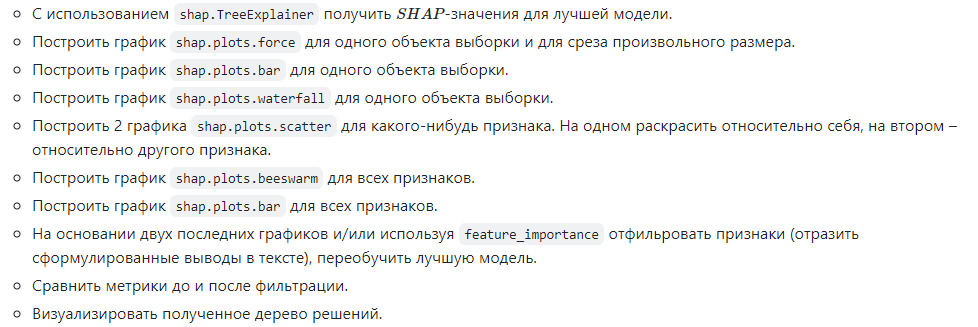

In [69]:
best_model = XGB_2

**Вывод SHAP-значений лучшей модели**

In [70]:
import shap

In [71]:
tree_explainer = shap.TreeExplainer(best_model)
te_shap_values = tree_explainer.shap_values(X_train)

**Построение графика `shap.plots.force` для одного объекта выборки и для среза произвольного размера**

In [72]:
shap.initjs()
shap_fp = shap.plots.force(tree_explainer.expected_value, te_shap_values[2,:], X_train.iloc[2,:])

from IPython.display import HTML
HTML(f"<div style='background-color: Lavender;'>{shap.getjs() + shap_fp.html()}</div>")

Из графика видно, что для предсказания объекта под индексом 2 из обучающего набора наибольший вклад вносят признаки "age" и "hypertension". Наибольший отрицательный вклад вносит признак "avg_glucose_level".

Посмотрим результат для среза.

In [73]:
shap.initjs()
shap_fp_ = shap.plots.force(tree_explainer.expected_value, te_shap_values[5:10], X_train.iloc[5:10])

from IPython.display import HTML
HTML(f"<div style='background-color: Lavender;'>{shap.getjs() + shap_fp_.html()}</div>")

На данном графике видно, что признак "age" в предсказание бОльшей части образцов вносит отрицательный вклад. 

**Построение графика `shap.plots.bar` для одного объекта выборки**

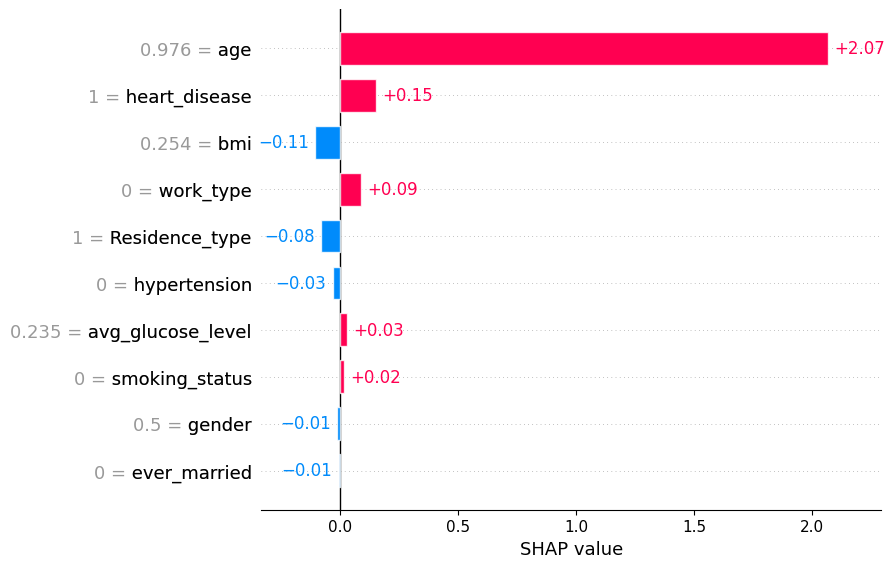

In [74]:
te_df_shap_values = tree_explainer(X_train)
shap_bp = shap.plots.bar(te_df_shap_values[79], max_display=X_train.shape[1])

Мы получили, что в среднем наиболее сильное влияние на предсказание инсульта влияет возраст и ИМТ (индекс массы тела) (признаки "age" и "bmi")

**Построение графика `shap.plots.waterfall` для одного объекта выборки**

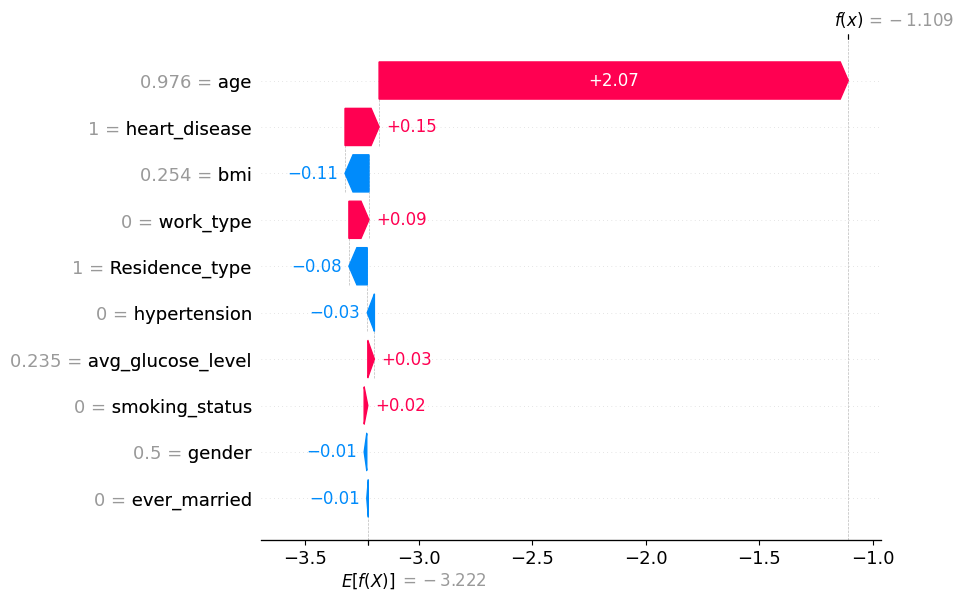

In [75]:
shap.plots.waterfall(te_df_shap_values[79])

Был взят образец из тренировочного набора под индексом 79. Потому что он соотвествует пациенту с наличием инсульта. Наибольшее влияние на предсказание оказывает признак возраста "age" и наличие заболеваний сердца "heart_disease"

**Построение 2-х графиков `shap.plots.scatter` для одного признака**

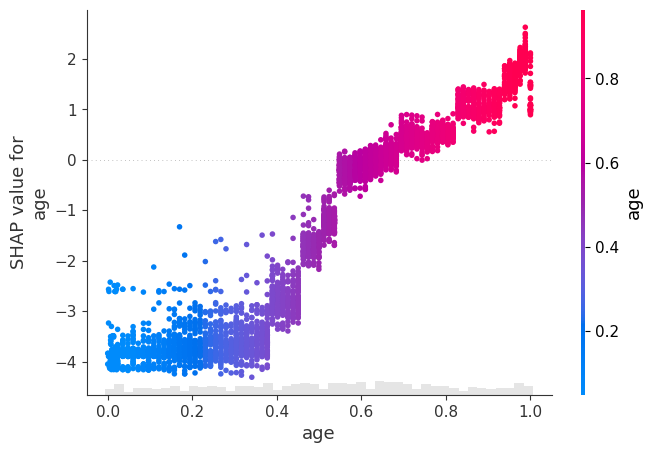

In [76]:
shap.plots.scatter(te_df_shap_values[:, "age"], color=te_df_shap_values[:, "age"])

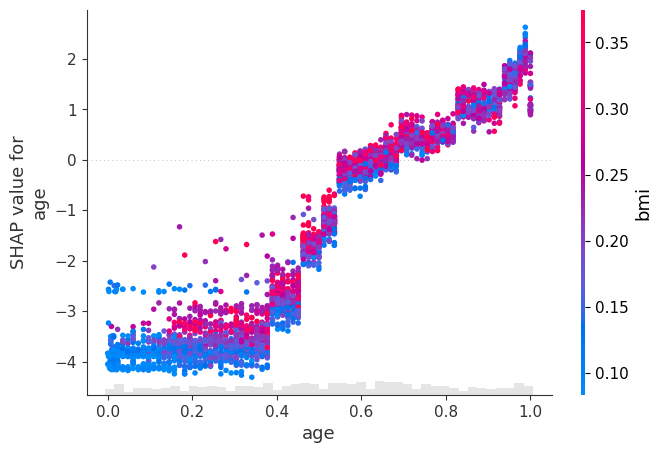

In [77]:
shap.plots.scatter(te_df_shap_values[:, "age"], color=te_df_shap_values[:, "bmi"])

**Построение графика `shap.plots.beeswarm` для всех признаков**

<Axes: xlabel='SHAP value (impact on model output)'>

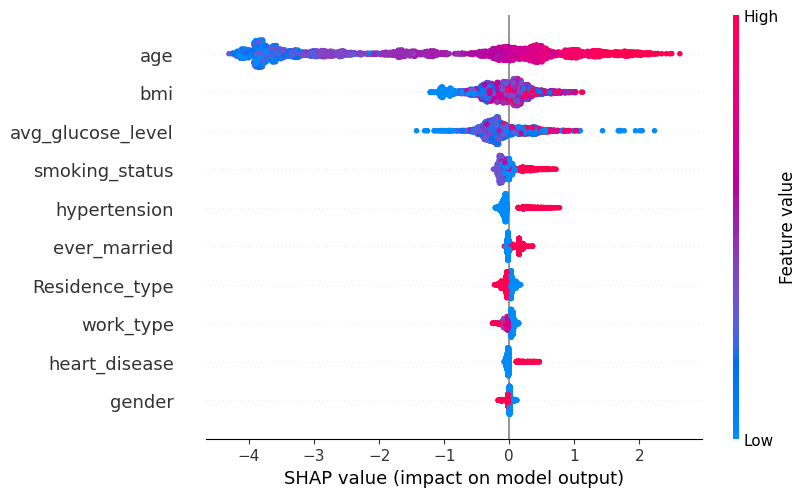

In [78]:
shap.plots.beeswarm(te_df_shap_values, max_display=X_train.shape[1], show=False)

**Построение графика `shap.plots.bar` для всех признаков**

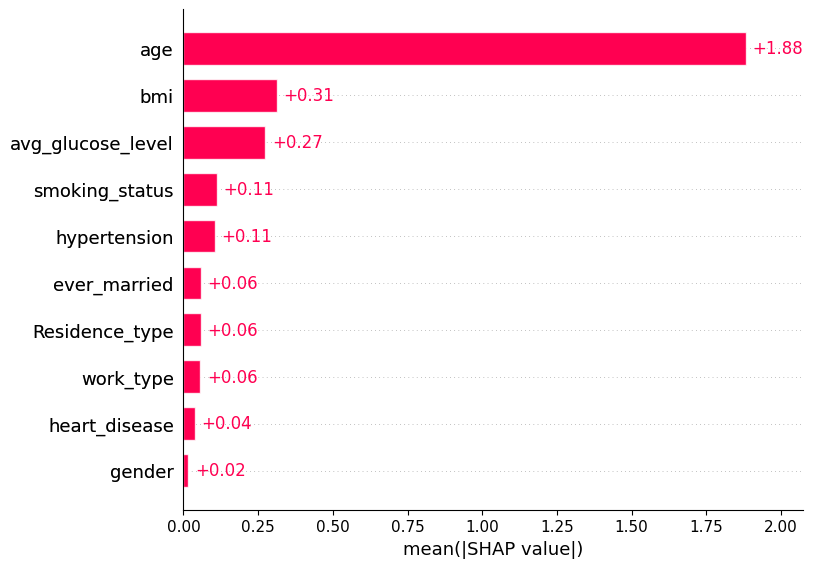

In [79]:
shap_bp_ = shap.plots.bar(te_df_shap_values, max_display=X_train.shape[1])

**На основании двух последних графиков и/или используя feature_importance отфильровать признаки (отразить сформулированные выводы в тексте), переобучить лучшую модель.**

Выберем признаки shap-значения которых больше 0.06. 

In [80]:
filtered_columns = ['age', 'bmi', 'avg_glucose_level', 'smoking_status', 'hypertension']

In [81]:
XGB_2.fit(X_train[filtered_columns], y_train)

XGBClassifier(alpha=0.0, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=0,
              max_depth=3, max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, ...)

In [82]:
print_cr(XGB_2, X_test[filtered_columns], y_test)

              precision    recall  f1-score   support

           0  0.9562118 1.0000000 0.9776158       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9562118       982
   macro avg  0.4781059 0.5000000 0.4888079       982
weighted avg  0.9143410 0.9562118 0.9348078       982



**Сравнение метрик до и после фильтрации**

После фильтрации результат ухудшился. Модель с неотфильтрованными признаками показала точность предсказания класса 1 = 1.0.

**Визуализация полученного дерева решений**

Выполним построение дерева решений для модели XGB_2 до фильтрации. 

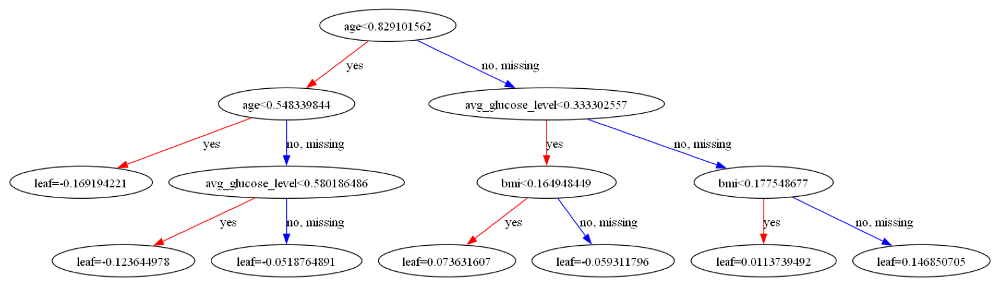

In [83]:
from xgboost import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
plot_tree(XGB_2, num_trees=0, ax=plt.gca())
plt.show()

### 5. Регрессия: 

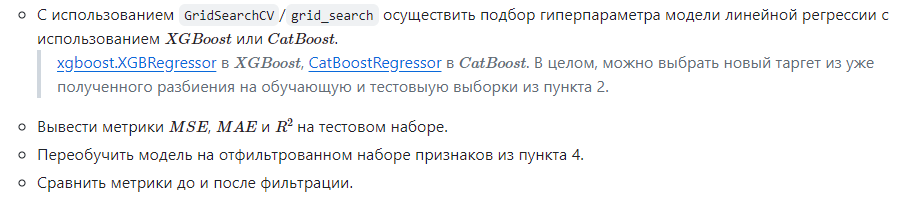

In [84]:
from xgboost import XGBRegressor

In [85]:
model = XGBRegressor(objective='reg:squarederror', booster='gblinear', random_state=42)

XGBRegressor_param = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': np.arange(0.05, 1.05, 0.05),
    'reg_alpha': np.arange(0, 1.5, 0.5),
    'reg_lambda': np.arange(0, 2.5, 0.5)
}

model_XGBRegressor_grid = GridSearchCV(model, XGBRegressor_param, cv=cv, verbose=False)
model_XGBRegressor_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster='gblinear',
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importanc...
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55,
       0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ]),
                         'n_estimators': [50, 100, 200, 300],
                         'reg_alpha': array([0. , 0.5, 1. ]),
                         'reg_lambda': array([0. , 0.5, 1. , 1.5, 2. ])},
             verbose=False)

In [86]:
print(f"Best params for GradientBoosting: {model_XGBRegressor_grid.best_params_}")

Best params for GradientBoosting: {'learning_rate': 0.9000000000000001, 'n_estimators': 100, 'reg_alpha': 0.0, 'reg_lambda': 0.0}


In [87]:
model_XGBRegressor = XGBClassifier(n_estimators=50, learning_rate=1.0, reg_alpha=0.0, reg_lambda=0.0, 
                                   objective='reg:squarederror', booster='gblinear', random_state=42)
model_XGBRegressor.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gblinear', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, objective='reg:squarederror', ...)

In [88]:
model_XGBRegressor_pred = model_XGBRegressor.predict(X_test) 

mse = mean_squared_error(y_test, model_XGBRegressor_pred)
mae = mean_absolute_error(y_test, model_XGBRegressor_pred)
r_2 = r2_score(y_test, model_XGBRegressor_pred)
cr_ = classification_report(y_test, model_XGBRegressor_pred, digits=7, zero_division=0)

print('Средняя квадратичная ошибка Ridge (MSE): ', mse)
print('Средняя абсолютная ошибка Ridge (MAE): ', mae)
print('Коэффициент детерминации Ridge (R2 score): ', r_2)
print('Classification_report:\n' ,  cr_)

Средняя квадратичная ошибка Ridge (MSE):  0.04378818737270876
Средняя абсолютная ошибка Ridge (MAE):  0.04378818737270876
Коэффициент детерминации Ridge (R2 score):  -0.045793397231096655
Classification_report:
               precision    recall  f1-score   support

           0  0.9562118 1.0000000 0.9776158       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9562118       982
   macro avg  0.4781059 0.5000000 0.4888079       982
weighted avg  0.9143410 0.9562118 0.9348078       982



Мтерики получились плохими, класс 1 совсем не предсказывается. 

**Переобучим модель на отфильтрованном наборе признаков из пункта 4**

In [89]:
model_XGBRegressor_ = XGBClassifier(n_estimators=50, learning_rate=1.0, reg_alpha=0.0, reg_lambda=0.0, 
                                   objective='reg:squarederror', booster='gblinear', random_state=42)
model_XGBRegressor_.fit(X_train[filtered_columns], y_train)

XGBClassifier(base_score=None, booster='gblinear', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, objective='reg:squarederror', ...)

In [90]:
model_XGBRegressor_pred_ = model_XGBRegressor_.predict(X_test[filtered_columns]) 

mse_ = mean_squared_error(y_test, model_XGBRegressor_pred_)
mae_ = mean_absolute_error(y_test, model_XGBRegressor_pred_)
r_2_ = r2_score(y_test, model_XGBRegressor_pred_)
cr__ = classification_report(y_test, model_XGBRegressor_pred_, digits=7, zero_division=0)

print('Средняя квадратичная ошибка Ridge (MSE): ', mse_)
print('Средняя абсолютная ошибка Ridge (MAE): ', mae_)
print('Коэффициент детерминации Ridge (R2 score): ', r_2_)
print('Classification_report:\n' ,  cr__)

Средняя квадратичная ошибка Ridge (MSE):  0.04378818737270876
Средняя абсолютная ошибка Ridge (MAE):  0.04378818737270876
Коэффициент детерминации Ridge (R2 score):  -0.045793397231096655
Classification_report:
               precision    recall  f1-score   support

           0  0.9562118 1.0000000 0.9776158       939
           1  0.0000000 0.0000000 0.0000000        43

    accuracy                      0.9562118       982
   macro avg  0.4781059 0.5000000 0.4888079       982
weighted avg  0.9143410 0.9562118 0.9348078       982



**Сравнить метрики до и после фильтрации**

Метрики никак не изменились, класс 1 по-прпежнему не предсказывается. 